## Bidirectional LSTM model na predikciu hodnot DST o 5 hodin dopredu na zaklade 24-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+5_24H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 15:37:15.253130: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 5
y_col = f"DST+{shift}"

n_input = 24
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  24


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 24, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 24)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              25 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,418 (1.26 MB)

 Trainable params: 331,418 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42:17 7s/step - loss: 1.0444 - mae: 0.8408

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.9089 - mae: 0.7927

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.8100 - mae: 0.7447

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.7366 - mae: 0.7029

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.6775 - mae: 0.6670

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.6331 - mae: 0.6379

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.5957 - mae: 0.6128

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.5667 - mae: 0.5935

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.5441 - mae: 0.5783

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.5247 - mae: 0.5651

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.5109 - mae: 0.5545

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.4985 - mae: 0.5451

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.4875 - mae: 0.5368

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.4800 - mae: 0.5309

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.4728 - mae: 0.5254

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.4681 - mae: 0.5214

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.4645 - mae: 0.5181

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.4626 - mae: 0.5159

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.4604 - mae: 0.5137

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.4578 - mae: 0.5113

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.4550 - mae: 0.5088

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.4520 - mae: 0.5065

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.4492 - mae: 0.5043

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.4470 - mae: 0.5025

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.4446 - mae: 0.5007

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.4433 - mae: 0.4994

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.4418 - mae: 0.4980

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.4407 - mae: 0.4969

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.4394 - mae: 0.4957

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.4379 - mae: 0.4945

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.4374 - mae: 0.4936

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.4367 - mae: 0.4925

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.4357 - mae: 0.4913

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.4349 - mae: 0.4902

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.4340 - mae: 0.4890

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.4332 - mae: 0.4879

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.4325 - mae: 0.4868

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.4318 - mae: 0.4858

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.4311 - mae: 0.4847

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.4303 - mae: 0.4837

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.4294 - mae: 0.4826

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.4284 - mae: 0.4815

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.4277 - mae: 0.4804

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.4268 - mae: 0.4794

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.4259 - mae: 0.4784

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.4250 - mae: 0.4774

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.4242 - mae: 0.4765

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.4234 - mae: 0.4755

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.4225 - mae: 0.4746

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.4217 - mae: 0.4736

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.4209 - mae: 0.4728

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.4202 - mae: 0.4720

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.4196 - mae: 0.4712

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.4189 - mae: 0.4705

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.4182 - mae: 0.4698

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.4175 - mae: 0.4690

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.4169 - mae: 0.4683

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.4163 - mae: 0.4677

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.4157 - mae: 0.4670

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.4152 - mae: 0.4664

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.4147 - mae: 0.4659

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.4141 - mae: 0.4653

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.4136 - mae: 0.4647

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.4133 - mae: 0.4642

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.4130 - mae: 0.4637

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.4127 - mae: 0.4633

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.4124 - mae: 0.4628

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.4121 - mae: 0.4624

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.4119 - mae: 0.4619

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.4117 - mae: 0.4615

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.4115 - mae: 0.4611

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.4112 - mae: 0.4606

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.4109 - mae: 0.4602

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.4106 - mae: 0.4598

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.4113 - mae: 0.4595

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.4119 - mae: 0.4593

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.4125 - mae: 0.4590

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.4130 - mae: 0.4587

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.4135 - mae: 0.4585

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.4140 - mae: 0.4583

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.4145 - mae: 0.4580

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.4150 - mae: 0.4578

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.4154 - mae: 0.4577

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.4158 - mae: 0.4575

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.4162 - mae: 0.4573

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.4165 - mae: 0.4570

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.4168 - mae: 0.4568

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.4171 - mae: 0.4566

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.4180 - mae: 0.4565

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.4188 - mae: 0.4564

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.4196 - mae: 0.4564

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.4203 - mae: 0.4563

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.4211 - mae: 0.4562

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.4217 - mae: 0.4561

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.4223 - mae: 0.4560

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.4229 - mae: 0.4559

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.4235 - mae: 0.4557

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.4240 - mae: 0.4556

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.4246 - mae: 0.4555

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.4251 - mae: 0.4554

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.4258 - mae: 0.4554

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.4265 - mae: 0.4553

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.4272 - mae: 0.4553

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.4279 - mae: 0.4552

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.4285 - mae: 0.4552

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 137ms/step - loss: 0.4290 - mae: 0.4551

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 137ms/step - loss: 0.4296 - mae: 0.4551

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 137ms/step - loss: 0.4301 - mae: 0.4550

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 137ms/step - loss: 0.4306 - mae: 0.4549

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 137ms/step - loss: 0.4311 - mae: 0.4549

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.4315 - mae: 0.4548

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4320 - mae: 0.4547

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4324 - mae: 0.4546

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4328 - mae: 0.4546

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4331 - mae: 0.4545

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4335 - mae: 0.4544

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.4338 - mae: 0.4543

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4341 - mae: 0.4542

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4344 - mae: 0.4541

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4347 - mae: 0.4541

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4350 - mae: 0.4540

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4353 - mae: 0.4539

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.4355 - mae: 0.4538

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4358 - mae: 0.4537

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4360 - mae: 0.4536

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4362 - mae: 0.4535

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4364 - mae: 0.4534

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4366 - mae: 0.4533

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.4367 - mae: 0.4532

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4370 - mae: 0.4531

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4373 - mae: 0.4530

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4376 - mae: 0.4530

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4379 - mae: 0.4529

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4381 - mae: 0.4528

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 136ms/step - loss: 0.4383 - mae: 0.4527

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 136ms/step - loss: 0.4386 - mae: 0.4526

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.4388 - mae: 0.4526

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.4390 - mae: 0.4525

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.4392 - mae: 0.4524

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.4393 - mae: 0.4523

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.4395 - mae: 0.4522

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.4396 - mae: 0.4521

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.4398 - mae: 0.4520

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.4399 - mae: 0.4519

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.4401 - mae: 0.4518

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.4402 - mae: 0.4517

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 135ms/step - loss: 0.4404 - mae: 0.4516

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.4405 - mae: 0.4515

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.4406 - mae: 0.4514

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.4407 - mae: 0.4513

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.4408 - mae: 0.4512

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 135ms/step - loss: 0.4409 - mae: 0.4511

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.4410 - mae: 0.4510

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 135ms/step - loss: 0.4410 - mae: 0.4509

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.4411 - mae: 0.4508

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.4411 - mae: 0.4506

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.4412 - mae: 0.4505

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.4412 - mae: 0.4504

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 134ms/step - loss: 0.4413 - mae: 0.4503

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.4413 - mae: 0.4502

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.4414 - mae: 0.4501

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.4414 - mae: 0.4500

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.4414 - mae: 0.4498

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.4415 - mae: 0.4497

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.4415 - mae: 0.4496

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.4415 - mae: 0.4495

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.4415 - mae: 0.4494

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.4416 - mae: 0.4493

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.4416 - mae: 0.4492

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.4416 - mae: 0.4491

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.4416 - mae: 0.4490

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.4416 - mae: 0.4488

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.4417 - mae: 0.4487

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.4417 - mae: 0.4486

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.4417 - mae: 0.4485

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.4418 - mae: 0.4484

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.4419 - mae: 0.4484

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 134ms/step - loss: 0.4420 - mae: 0.4483

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.4420 - mae: 0.4482

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.4421 - mae: 0.4481

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.4422 - mae: 0.4480

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.4422 - mae: 0.4479

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.4423 - mae: 0.4479

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 134ms/step - loss: 0.4423 - mae: 0.4478

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.4424 - mae: 0.4477

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.4424 - mae: 0.4476

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.4424 - mae: 0.4475

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.4424 - mae: 0.4474

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.4424 - mae: 0.4473

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.4424 - mae: 0.4472

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 133ms/step - loss: 0.4425 - mae: 0.4471

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.4425 - mae: 0.4470

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.4425 - mae: 0.4469

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.4425 - mae: 0.4468

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.4425 - mae: 0.4467

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.4425 - mae: 0.4466

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 133ms/step - loss: 0.4425 - mae: 0.4466

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.4425 - mae: 0.4465

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.4425 - mae: 0.4464

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.4425 - mae: 0.4463

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.4425 - mae: 0.4462

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.4425 - mae: 0.4461

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.4425 - mae: 0.4460

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.4425 - mae: 0.4459

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.4425 - mae: 0.4458

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.4425 - mae: 0.4457

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.4425 - mae: 0.4456

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.4425 - mae: 0.4455

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.4425 - mae: 0.4454

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.4425 - mae: 0.4453

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.4425 - mae: 0.4452

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.4425 - mae: 0.4451

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.4425 - mae: 0.4451

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.4425 - mae: 0.4450

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.4424 - mae: 0.4449

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.4424 - mae: 0.4448

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.4425 - mae: 0.4447

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 133ms/step - loss: 0.4425 - mae: 0.4446

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4426 - mae: 0.4445

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4426 - mae: 0.4445

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4427 - mae: 0.4444

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4427 - mae: 0.4443

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4428 - mae: 0.4442

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 133ms/step - loss: 0.4428 - mae: 0.4441

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4428 - mae: 0.4441

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4429 - mae: 0.4440

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4429 - mae: 0.4439

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4429 - mae: 0.4438

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 133ms/step - loss: 0.4429 - mae: 0.4437

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.4429 - mae: 0.4436

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.4429 - mae: 0.4435

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.4429 - mae: 0.4434

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.4429 - mae: 0.4433

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.4429 - mae: 0.4432

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.4429 - mae: 0.4431

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.4429 - mae: 0.4431

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.4429 - mae: 0.4430

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.4429 - mae: 0.4429

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.4429 - mae: 0.4428

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.4429 - mae: 0.4427

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.4429 - mae: 0.4426

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.4429 - mae: 0.4426

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.4429 - mae: 0.4425

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.4430 - mae: 0.4424

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.4431 - mae: 0.4423

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.4432 - mae: 0.4423

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.4433 - mae: 0.4422

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.4435 - mae: 0.4421

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.4436 - mae: 0.4421

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.4437 - mae: 0.4420

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.4438 - mae: 0.4419

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.4439 - mae: 0.4419

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.4440 - mae: 0.4418

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.4441 - mae: 0.4418

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.4442 - mae: 0.4417

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.4443 - mae: 0.4417

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.4444 - mae: 0.4416

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.4445 - mae: 0.4416

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.4446 - mae: 0.4415

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.4447 - mae: 0.4415

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.4448 - mae: 0.4414

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.4449 - mae: 0.4414

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.4450 - mae: 0.4413

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.4451 - mae: 0.4413

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.4452 - mae: 0.4412

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.4453 - mae: 0.4412

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.4454 - mae: 0.4411

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.4455 - mae: 0.4411

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.4456 - mae: 0.4410

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.4457 - mae: 0.4410

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.4457 - mae: 0.4409

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.4458 - mae: 0.4409

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.4459 - mae: 0.4408

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.4460 - mae: 0.4408

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.4460 - mae: 0.4407

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.4461 - mae: 0.4407

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.4462 - mae: 0.4406

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.4462 - mae: 0.4405

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.4463 - mae: 0.4405

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.4464 - mae: 0.4404

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.4464 - mae: 0.4404

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.4465 - mae: 0.4403

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.4465 - mae: 0.4403

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.4466 - mae: 0.4402

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.4466 - mae: 0.4402

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.4467 - mae: 0.4401

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.4467 - mae: 0.4401

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.4468 - mae: 0.4400

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.4468 - mae: 0.4400

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.4469 - mae: 0.4399

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.4469 - mae: 0.4399

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.4469 - mae: 0.4398

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.4470 - mae: 0.4397

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.4470 - mae: 0.4397

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.4471 - mae: 0.4396

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.4471 - mae: 0.4396

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.4471 - mae: 0.4395

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.4472 - mae: 0.4395

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.4472 - mae: 0.4394

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.4472 - mae: 0.4394

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.4472 - mae: 0.4393

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.4472 - mae: 0.4393

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.4473 - mae: 0.4392

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.4473 - mae: 0.4392

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.4473 - mae: 0.4391

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.4473 - mae: 0.4390

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.4473 - mae: 0.4390

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.4473 - mae: 0.4389

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.4473 - mae: 0.4389

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.4474 - mae: 0.4388

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.4474 - mae: 0.4388

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.4474 - mae: 0.4387

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.4474 - mae: 0.4386

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.4474 - mae: 0.4386

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.4474 - mae: 0.4385

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.4474 - mae: 0.4385

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.4474 - mae: 0.4384

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.4474 - mae: 0.4384

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.4474 - mae: 0.4383

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.4474 - mae: 0.4383

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.4474 - mae: 0.4382

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.4474 - mae: 0.4381

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.4474 - mae: 0.4381

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.4474 - mae: 0.4380

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.4474 - mae: 0.4380

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.4474 - mae: 0.4379

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.4474 - mae: 0.4378

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.4473 - mae: 0.4378

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.4473 - mae: 0.4377

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.4473 - mae: 0.4377

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.4473 - mae: 0.4376

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.4473 - mae: 0.4375

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.4473 - mae: 0.4375

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.4473 - mae: 0.4374

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.4472 - mae: 0.4374

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.4472 - mae: 0.4373

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.4472 - mae: 0.4373

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.4472 - mae: 0.4372

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.4472 - mae: 0.4371

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.4472 - mae: 0.4371

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.4471 - mae: 0.4370

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.4471 - mae: 0.4370

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.4471 - mae: 0.4369

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.4471 - mae: 0.4368

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.4471 - mae: 0.4368

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.4470 - mae: 0.4367

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.4470 - mae: 0.4367

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.4470 - mae: 0.4366

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.4470 - mae: 0.4365

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.4469 - mae: 0.4365

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.4469 - mae: 0.4364

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.4469 - mae: 0.4364

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.4469 - mae: 0.4363

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.4468 - mae: 0.4362

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.4468 - mae: 0.4362

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.4468 - mae: 0.4361

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.4467 - mae: 0.4361

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.4467 - mae: 0.4360

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.4466 - mae: 0.4359

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.4466 - mae: 0.4359

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.4466 - mae: 0.4358

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.4465 - mae: 0.4357

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.4465 - mae: 0.4357

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.4465 - mae: 0.4356

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.4464 - mae: 0.4356

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.4464 - mae: 0.4355

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.4463 - mae: 0.4354

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.4463 - mae: 0.4354

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.4462 - mae: 0.4353

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.4462 - mae: 0.4353

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.4461 - mae: 0.4352

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.4461 - mae: 0.4351

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.4461 - mae: 0.4351

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.4460 - mae: 0.4350

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.4460 - mae: 0.4350

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.4459 - mae: 0.4349

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.4459 - mae: 0.4348

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.4458 - mae: 0.4348

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.4458 - mae: 0.4347

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.4457 - mae: 0.4347

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.4457 - mae: 0.4346

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.4456 - mae: 0.4345

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.4456 - mae: 0.4345

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.4455 - mae: 0.4344

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.4455 - mae: 0.4343

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.4454 - mae: 0.4343

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.4454 - mae: 0.4342

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.4453 - mae: 0.4342

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.4453 - mae: 0.4341

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.4452 - mae: 0.4341

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.4452 - mae: 0.4340

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.4451 - mae: 0.4339

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.4451 - mae: 0.4339

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.4450 - mae: 0.4338

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.4450 - mae: 0.4338

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.4449 - mae: 0.4337

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.4449 - mae: 0.4336

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.4448 - mae: 0.4336

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.4448 - mae: 0.4335

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.4447 - mae: 0.4335

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.4447 - mae: 0.4334

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.4446 - mae: 0.4334

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.4446 - mae: 0.4333

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.4445 - mae: 0.4333

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.4445 - mae: 0.4332

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.4444 - mae: 0.4331

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.4444 - mae: 0.4331

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.4443 - mae: 0.4330

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.4442 - mae: 0.4330

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.4442 - mae: 0.4329

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.4441 - mae: 0.4329

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.4441 - mae: 0.4328

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.4440 - mae: 0.4328

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.4440 - mae: 0.4327

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.4439 - mae: 0.4327

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.4439 - mae: 0.4326

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.4438 - mae: 0.4325

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.4437 - mae: 0.4325

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.4437 - mae: 0.4324

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.4436 - mae: 0.4324

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.4436 - mae: 0.4323

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.4435 - mae: 0.4323

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.4435 - mae: 0.4322

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.4434 - mae: 0.4322

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.4433 - mae: 0.4321

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.4433 - mae: 0.4321

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.4432 - mae: 0.4320

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.4432 - mae: 0.4320

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.4431 - mae: 0.4319

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.4431 - mae: 0.4319

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.4430 - mae: 0.4318

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.4429 - mae: 0.4318

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.4429 - mae: 0.4317

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.4428 - mae: 0.4317

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.4428 - mae: 0.4316

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.4427 - mae: 0.4316

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.4426 - mae: 0.4315

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.4426 - mae: 0.4314 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.4425 - mae: 0.4314

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.4424 - mae: 0.4313

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.4424 - mae: 0.4313

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.4423 - mae: 0.4312

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.4423 - mae: 0.4312

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.4422 - mae: 0.4311

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.4421 - mae: 0.4311

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.4421 - mae: 0.4310

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.4420 - mae: 0.4310

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.4420 - mae: 0.4309

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.4419 - mae: 0.4309

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.4418 - mae: 0.4308

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.4418 - mae: 0.4308

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.4417 - mae: 0.4307

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.4416 - mae: 0.4307

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.4416 - mae: 0.4306

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.4415 - mae: 0.4306

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.4415 - mae: 0.4305

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.4414 - mae: 0.4305

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.4413 - mae: 0.4304

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.4413 - mae: 0.4304

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.4412 - mae: 0.4303

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.4411 - mae: 0.4302

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.4411 - mae: 0.4302

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.4410 - mae: 0.4301

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.4409 - mae: 0.4301

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.4409 - mae: 0.4300

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.4408 - mae: 0.4300

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.4408 - mae: 0.4299

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.4407 - mae: 0.4299

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.4406 - mae: 0.4298

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.4406 - mae: 0.4298

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.4405 - mae: 0.4297

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.4404 - mae: 0.4297

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.4404 - mae: 0.4296

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.4403 - mae: 0.4296

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.4402 - mae: 0.4295

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.4402 - mae: 0.4295

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.4401 - mae: 0.4294

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.4400 - mae: 0.4294

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.4399 - mae: 0.4293

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.4399 - mae: 0.4293

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.4398 - mae: 0.4292

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.4397 - mae: 0.4292

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.4397 - mae: 0.4291

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.4396 - mae: 0.4291

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.4395 - mae: 0.4290

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.4394 - mae: 0.4290

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.4394 - mae: 0.4289

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.4393 - mae: 0.4289

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.4392 - mae: 0.4288

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.4392 - mae: 0.4288

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.4391 - mae: 0.4287

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.4390 - mae: 0.4287

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.4390 - mae: 0.4286

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.4389 - mae: 0.4286

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.4388 - mae: 0.4285

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.4387 - mae: 0.4285

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.4387 - mae: 0.4284

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.4386 - mae: 0.4284

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.4385 - mae: 0.4283

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.4385 - mae: 0.4283

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.4384 - mae: 0.4282

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.4383 - mae: 0.4282

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.4382 - mae: 0.4281

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.4382 - mae: 0.4281

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.4381 - mae: 0.4280

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.4380 - mae: 0.4280

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.4380 - mae: 0.4279

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.4379 - mae: 0.4279

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.4378 - mae: 0.4278

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.4378 - mae: 0.4278

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.4377 - mae: 0.4278

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.4376 - mae: 0.4277

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.4376 - mae: 0.4277

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.4375 - mae: 0.4276

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.4374 - mae: 0.4276

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.4374 - mae: 0.4275

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.4373 - mae: 0.4275

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.4372 - mae: 0.4274

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.4372 - mae: 0.4274

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.4371 - mae: 0.4273

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.4370 - mae: 0.4273

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.4369 - mae: 0.4272

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.4369 - mae: 0.4272

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.4368 - mae: 0.4271

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.4367 - mae: 0.4271

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.4367 - mae: 0.4270

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.4366 - mae: 0.4270

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.4365 - mae: 0.4270

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.4364 - mae: 0.4269

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.4364 - mae: 0.4269

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.4363 - mae: 0.4268

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.4362 - mae: 0.4268

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.4361 - mae: 0.4267

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.4361 - mae: 0.4267

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.4360 - mae: 0.4266

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.4359 - mae: 0.4266

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.4358 - mae: 0.4265

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.4357 - mae: 0.4265

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.4357 - mae: 0.4264

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.4356 - mae: 0.4264

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.4355 - mae: 0.4263

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.4354 - mae: 0.4263

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.4354 - mae: 0.4262

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.4353 - mae: 0.4262

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.4352 - mae: 0.4261

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.4351 - mae: 0.4261

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.4350 - mae: 0.4260

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.4350 - mae: 0.4260

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.4349 - mae: 0.4259

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.4348 - mae: 0.4259

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.4347 - mae: 0.4258

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.4347 - mae: 0.4258

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.4346 - mae: 0.4257

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.4345 - mae: 0.4257

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.4344 - mae: 0.4256

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.4343 - mae: 0.4256

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.4343 - mae: 0.4255

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.4342 - mae: 0.4255

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.4341 - mae: 0.4254

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.4340 - mae: 0.4254

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.4340 - mae: 0.4253

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.4339 - mae: 0.4253

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.4338 - mae: 0.4252

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.4337 - mae: 0.4252

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.4336 - mae: 0.4251

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.4336 - mae: 0.4251

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.4335 - mae: 0.4251

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.4334 - mae: 0.4250

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.4333 - mae: 0.4250

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.4332 - mae: 0.4249

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.4331 - mae: 0.4249

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.4331 - mae: 0.4248

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.4330 - mae: 0.4248

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.4329 - mae: 0.4247

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.4328 - mae: 0.4247

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.4327 - mae: 0.4246

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.4327 - mae: 0.4246

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.4326 - mae: 0.4245

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.4325 - mae: 0.4245

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.4324 - mae: 0.4244

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.4323 - mae: 0.4244

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.4322 - mae: 0.4243

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.4322 - mae: 0.4243

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.4321 - mae: 0.4242

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.4320 - mae: 0.4242

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.4319 - mae: 0.4241

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.4318 - mae: 0.4241

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.4317 - mae: 0.4240

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.4317 - mae: 0.4240

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.4316 - mae: 0.4239

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.4315 - mae: 0.4239

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.4314 - mae: 0.4238

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.4313 - mae: 0.4238

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.4313 - mae: 0.4237

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.4312 - mae: 0.4237

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.4311 - mae: 0.4236

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.4310 - mae: 0.4236

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.4309 - mae: 0.4236

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.4309 - mae: 0.4235

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.4308 - mae: 0.4235

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.4307 - mae: 0.4234

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.4306 - mae: 0.4234

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.4305 - mae: 0.4233

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.4305 - mae: 0.4233

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.4304 - mae: 0.4232

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.4303 - mae: 0.4232

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.4302 - mae: 0.4231

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.4301 - mae: 0.4231

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.4300 - mae: 0.4230

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.4300 - mae: 0.4230

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.4299 - mae: 0.4229

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.4298 - mae: 0.4229

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.4297 - mae: 0.4228

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.4296 - mae: 0.4228

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.4296 - mae: 0.4227

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.4295 - mae: 0.4227

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.4294 - mae: 0.4227

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.4293 - mae: 0.4226

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.4292 - mae: 0.4226

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.4292 - mae: 0.4225

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.4291 - mae: 0.4225

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.4290 - mae: 0.4224

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.4289 - mae: 0.4224

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.4288 - mae: 0.4223

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.4288 - mae: 0.4223

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.4287 - mae: 0.4222

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4286 - mae: 0.4222

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4285 - mae: 0.4222

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4284 - mae: 0.4221

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4284 - mae: 0.4221

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4283 - mae: 0.4220

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4282 - mae: 0.4220

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4281 - mae: 0.4219

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4280 - mae: 0.4219

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.4280 - mae: 0.4218

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.4279 - mae: 0.4218

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.4278 - mae: 0.4217

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.4277 - mae: 0.4217

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.4277 - mae: 0.4217

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.4276 - mae: 0.4216

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.4275 - mae: 0.4216

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.4274 - mae: 0.4215

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.4274 - mae: 0.4215

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.4273 - mae: 0.4214

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.4272 - mae: 0.4214

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.4271 - mae: 0.4213

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.4271 - mae: 0.4213

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.4270 - mae: 0.4213

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.4269 - mae: 0.4212

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.4268 - mae: 0.4212

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.4268 - mae: 0.4211

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.4267 - mae: 0.4211

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.4266 - mae: 0.4210

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.4265 - mae: 0.4210

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.4265 - mae: 0.4210

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.4264 - mae: 0.4209

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.4263 - mae: 0.4209

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.4262 - mae: 0.4208

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.4262 - mae: 0.4208

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.4261 - mae: 0.4207

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.4260 - mae: 0.4207

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.4259 - mae: 0.4207

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.4259 - mae: 0.4206

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.4258 - mae: 0.4206

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.4257 - mae: 0.4205

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.4256 - mae: 0.4205

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.4256 - mae: 0.4204

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.4255 - mae: 0.4204

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.4254 - mae: 0.4203

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.4253 - mae: 0.4203

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.4253 - mae: 0.4203

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.4252 - mae: 0.4202

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.4251 - mae: 0.4202

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.4250 - mae: 0.4201

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.4250 - mae: 0.4201

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.4249 - mae: 0.4200

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.4248 - mae: 0.4200

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.4247 - mae: 0.4200

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.4247 - mae: 0.4199

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.4246 - mae: 0.4199

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.4245 - mae: 0.4198

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.4244 - mae: 0.4198

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.4244 - mae: 0.4197

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.4243 - mae: 0.4197

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.4242 - mae: 0.4197

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.4241 - mae: 0.4196

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.4241 - mae: 0.4196

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.4240 - mae: 0.4195

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.4239 - mae: 0.4195

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.4238 - mae: 0.4194

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.4238 - mae: 0.4194

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.4237 - mae: 0.4193

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.4236 - mae: 0.4193

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.4235 - mae: 0.4193

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.4234 - mae: 0.4192

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.4234 - mae: 0.4192

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.4233 - mae: 0.4191

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.4232 - mae: 0.4191

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.4231 - mae: 0.4190

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.4231 - mae: 0.4190

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.4230 - mae: 0.4190

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.4229 - mae: 0.4189

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.4228 - mae: 0.4189

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.4227 - mae: 0.4188

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.4227 - mae: 0.4188

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.4226 - mae: 0.4187

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.4225 - mae: 0.4187

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.4224 - mae: 0.4187

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.4224 - mae: 0.4186

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.4223 - mae: 0.4186

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.4222 - mae: 0.4185

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.4221 - mae: 0.4185

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.4221 - mae: 0.4184

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.4220 - mae: 0.4184

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.4219 - mae: 0.4184

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.4218 - mae: 0.4183

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.4218 - mae: 0.4183

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.4217 - mae: 0.4182

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.4216 - mae: 0.4182

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.4215 - mae: 0.4182

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.4215 - mae: 0.4181

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.4214 - mae: 0.4181

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.4213 - mae: 0.4180

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.4213 - mae: 0.4180

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.4212 - mae: 0.4180

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.4211 - mae: 0.4179

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.4210 - mae: 0.4179

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.4210 - mae: 0.4178

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.4209 - mae: 0.4178

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.4208 - mae: 0.4178

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.4208 - mae: 0.4177

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.4207 - mae: 0.4177

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.4206 - mae: 0.4176

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.4205 - mae: 0.4176

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.4205 - mae: 0.4176

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.4204 - mae: 0.4175

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.4203 - mae: 0.4175

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.4203 - mae: 0.4174

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.4202 - mae: 0.4174

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.4201 - mae: 0.4174

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.4200 - mae: 0.4173

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.4200 - mae: 0.4173

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.4199 - mae: 0.4172

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.4198 - mae: 0.4172

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.4198 - mae: 0.4172

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.4197 - mae: 0.4171

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.4196 - mae: 0.4171

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.4195 - mae: 0.4171

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.4195 - mae: 0.4170

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.4194 - mae: 0.4170

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.4193 - mae: 0.4169

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.4193 - mae: 0.4169

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.4192 - mae: 0.4169

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.4191 - mae: 0.4168

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.4190 - mae: 0.4168

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.4190 - mae: 0.4167

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.4189 - mae: 0.4167

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.4188 - mae: 0.4167

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.4187 - mae: 0.4166

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.4187 - mae: 0.4166

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.4186 - mae: 0.4165

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.4185 - mae: 0.4165

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.4185 - mae: 0.4165

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.4184 - mae: 0.4164

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.4183 - mae: 0.4164

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.4183 - mae: 0.4164

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.4182 - mae: 0.4163

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.4181 - mae: 0.4163

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.4181 - mae: 0.4162

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.4180 - mae: 0.4162

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.4179 - mae: 0.4162

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.4179 - mae: 0.4161

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.4178 - mae: 0.4161

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.4177 - mae: 0.4161

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.4177 - mae: 0.4160

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.4176 - mae: 0.4160

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.4175 - mae: 0.4160

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.4175 - mae: 0.4159

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.4174 - mae: 0.4159

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.4173 - mae: 0.4158

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.4173 - mae: 0.4158

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.4172 - mae: 0.4158

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.4172 - mae: 0.4157

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.4171 - mae: 0.4157

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.4170 - mae: 0.4157

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.4170 - mae: 0.4156

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.4169 - mae: 0.4156

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.4168 - mae: 0.4156

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.4168 - mae: 0.4155

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.4167 - mae: 0.4155

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.4167 - mae: 0.4155

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.4166 - mae: 0.4154

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.4165 - mae: 0.4154

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.4165 - mae: 0.4153

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.4164 - mae: 0.4153

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.4163 - mae: 0.4153

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.4163 - mae: 0.4152

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.4162 - mae: 0.4152

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.4162 - mae: 0.4152

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.4161 - mae: 0.4151

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.4160 - mae: 0.4151

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.4160 - mae: 0.4151

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.4159 - mae: 0.4150

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.4159 - mae: 0.4150

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.4158 - mae: 0.4150

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.4157 - mae: 0.4149

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.4157 - mae: 0.4149

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.4156 - mae: 0.4149

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.4156 - mae: 0.4148

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.4155 - mae: 0.4148

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.4154 - mae: 0.4147

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.4154 - mae: 0.4147

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.4153 - mae: 0.4147

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.4153 - mae: 0.4146

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.4152 - mae: 0.4146

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.4151 - mae: 0.4146

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.4151 - mae: 0.4145

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.4150 - mae: 0.4145

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.4150 - mae: 0.4145

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.4149 - mae: 0.4144 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.4148 - mae: 0.4144

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.4148 - mae: 0.4144

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.4147 - mae: 0.4143

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.4147 - mae: 0.4143

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.4146 - mae: 0.4143

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.4145 - mae: 0.4142

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.4145 - mae: 0.4142

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.4144 - mae: 0.4142

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.4144 - mae: 0.4141

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.4143 - mae: 0.4141

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.4142 - mae: 0.4141

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.4142 - mae: 0.4140

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.4141 - mae: 0.4140

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.4141 - mae: 0.4140

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.4140 - mae: 0.4139

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.4139 - mae: 0.4139

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.4139 - mae: 0.4139

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.4138 - mae: 0.4138

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.4138 - mae: 0.4138

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.4137 - mae: 0.4137

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.4136 - mae: 0.4137

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.4136 - mae: 0.4137

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.4135 - mae: 0.4136

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.4134 - mae: 0.4136

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.4134 - mae: 0.4136

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.4133 - mae: 0.4135

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.4133 - mae: 0.4135

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.4132 - mae: 0.4135

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.4131 - mae: 0.4134

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.4131 - mae: 0.4134

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.4130 - mae: 0.4134

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.4129 - mae: 0.4133

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.4129 - mae: 0.4133

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.4128 - mae: 0.4133

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.4128 - mae: 0.4132

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.4127 - mae: 0.4132

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.4126 - mae: 0.4131

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.4126 - mae: 0.4131

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.4125 - mae: 0.4131

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.4124 - mae: 0.4130

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.4124 - mae: 0.4130

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.4123 - mae: 0.4130

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.4122 - mae: 0.4129

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.4122 - mae: 0.4129

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.4121 - mae: 0.4129

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.4121 - mae: 0.4128

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.4120 - mae: 0.4128

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.4119 - mae: 0.4128

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.4119 - mae: 0.4127

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.4118 - mae: 0.4127

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.4117 - mae: 0.4127

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.4117 - mae: 0.4126

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.4116 - mae: 0.4126

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.4116 - mae: 0.4125

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.4115 - mae: 0.4125

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.4114 - mae: 0.4125

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.4114 - mae: 0.4124

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.4113 - mae: 0.4124

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.4112 - mae: 0.4124

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.4112 - mae: 0.4123

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.4111 - mae: 0.4123

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.4111 - mae: 0.4123

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.4110 - mae: 0.4122

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.4109 - mae: 0.4122

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.4109 - mae: 0.4122

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.4108 - mae: 0.4121

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.4107 - mae: 0.4121

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.4107 - mae: 0.4121

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.4106 - mae: 0.4120

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.4106 - mae: 0.4120

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.4105 - mae: 0.4119

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.4104 - mae: 0.4119

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.4104 - mae: 0.4119

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.4103 - mae: 0.4118

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.4102 - mae: 0.4118

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.4102 - mae: 0.4118


Epoch 1: val_mae improved from inf to 0.40466, saving model to models/DST+5_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 134s 142ms/step - loss: 0.4101 - mae: 0.4117 - val_loss: 0.4724 - val_mae: 0.4047


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1792 - mae: 0.3135

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.1541 - mae: 0.2898

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1640 - mae: 0.2880

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1641 - mae: 0.2857

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1702 - mae: 0.2889

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1759 - mae: 0.2925

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1809 - mae: 0.2960

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1861 - mae: 0.2989

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1979 - mae: 0.3037

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2103 - mae: 0.3089

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2195 - mae: 0.3131

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2257 - mae: 0.3157

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2304 - mae: 0.3178

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2335 - mae: 0.3192

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2359 - mae: 0.3205

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2372 - mae: 0.3211

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2395 - mae: 0.3223

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2409 - mae: 0.3231

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2450 - mae: 0.3251

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2485 - mae: 0.3269

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2517 - mae: 0.3286

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2570 - mae: 0.3306

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2632 - mae: 0.3328

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2687 - mae: 0.3348

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2736 - mae: 0.3367

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2778 - mae: 0.3383

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2814 - mae: 0.3398

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2845 - mae: 0.3411

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2873 - mae: 0.3422

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2900 - mae: 0.3433

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2922 - mae: 0.3443

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2941 - mae: 0.3450

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2957 - mae: 0.3456

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.2969 - mae: 0.3461

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.2980 - mae: 0.3465

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.2989 - mae: 0.3468

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.2996 - mae: 0.3471

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3002 - mae: 0.3473

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3006 - mae: 0.3475

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3009 - mae: 0.3475

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3012 - mae: 0.3476

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3014 - mae: 0.3477

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3017 - mae: 0.3478

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3018 - mae: 0.3478

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3018 - mae: 0.3478

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3018 - mae: 0.3479

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3017 - mae: 0.3478

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3016 - mae: 0.3478

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3013 - mae: 0.3477

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3010 - mae: 0.3476

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3007 - mae: 0.3474

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3005 - mae: 0.3473

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.3002 - mae: 0.3472

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2999 - mae: 0.3471

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2996 - mae: 0.3470

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2993 - mae: 0.3469

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2990 - mae: 0.3468

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2988 - mae: 0.3467

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2987 - mae: 0.3467

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2985 - mae: 0.3467

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2982 - mae: 0.3466

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2980 - mae: 0.3465

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2978 - mae: 0.3465

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2975 - mae: 0.3464

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2973 - mae: 0.3463

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2970 - mae: 0.3462

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2968 - mae: 0.3462

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2965 - mae: 0.3461

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2963 - mae: 0.3460

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2960 - mae: 0.3460

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2957 - mae: 0.3459

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2955 - mae: 0.3459

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2953 - mae: 0.3459

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2950 - mae: 0.3459

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2948 - mae: 0.3459

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2946 - mae: 0.3459

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2943 - mae: 0.3459

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2941 - mae: 0.3458

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2938 - mae: 0.3458

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2935 - mae: 0.3457

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2932 - mae: 0.3457

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2930 - mae: 0.3457

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2927 - mae: 0.3456

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2924 - mae: 0.3456

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2921 - mae: 0.3455

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2918 - mae: 0.3455

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2915 - mae: 0.3454

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2913 - mae: 0.3454

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2911 - mae: 0.3454

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2908 - mae: 0.3453

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2907 - mae: 0.3453

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2906 - mae: 0.3453

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2905 - mae: 0.3453

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2904 - mae: 0.3453

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2903 - mae: 0.3452

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2901 - mae: 0.3452

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2900 - mae: 0.3452

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2899 - mae: 0.3452

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2898 - mae: 0.3452

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2897 - mae: 0.3452

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2895 - mae: 0.3452

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2894 - mae: 0.3451

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2893 - mae: 0.3451

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2891 - mae: 0.3451

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2890 - mae: 0.3451

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2889 - mae: 0.3451

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2889 - mae: 0.3451

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2888 - mae: 0.3451

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2887 - mae: 0.3451

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2887 - mae: 0.3452

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2886 - mae: 0.3452

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2885 - mae: 0.3452

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2884 - mae: 0.3452

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2884 - mae: 0.3452

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2883 - mae: 0.3452

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2882 - mae: 0.3452

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2881 - mae: 0.3452

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2880 - mae: 0.3452

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2879 - mae: 0.3452

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2877 - mae: 0.3452

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2876 - mae: 0.3452

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2875 - mae: 0.3452

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2874 - mae: 0.3452

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2873 - mae: 0.3452

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2872 - mae: 0.3452

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2870 - mae: 0.3451

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2869 - mae: 0.3451

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2868 - mae: 0.3451

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2866 - mae: 0.3451

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2865 - mae: 0.3450

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2863 - mae: 0.3450

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2862 - mae: 0.3450

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2860 - mae: 0.3450

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2859 - mae: 0.3449

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2858 - mae: 0.3449

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2857 - mae: 0.3449

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2855 - mae: 0.3449

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2854 - mae: 0.3449

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2853 - mae: 0.3448

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2852 - mae: 0.3448

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2850 - mae: 0.3448

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2849 - mae: 0.3448

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2848 - mae: 0.3447

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2846 - mae: 0.3447

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2845 - mae: 0.3447

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2843 - mae: 0.3446

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2842 - mae: 0.3446

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2840 - mae: 0.3446

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2839 - mae: 0.3446

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2838 - mae: 0.3445

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2836 - mae: 0.3445

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2835 - mae: 0.3445

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2834 - mae: 0.3445

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2832 - mae: 0.3444

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2831 - mae: 0.3444

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2829 - mae: 0.3444

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2828 - mae: 0.3443

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2826 - mae: 0.3443

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2825 - mae: 0.3443

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2823 - mae: 0.3442

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2822 - mae: 0.3442

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2820 - mae: 0.3442

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2819 - mae: 0.3441

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2817 - mae: 0.3441

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2816 - mae: 0.3441

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2814 - mae: 0.3440

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2813 - mae: 0.3440

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2812 - mae: 0.3440

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2811 - mae: 0.3440

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2809 - mae: 0.3440

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2808 - mae: 0.3439

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2807 - mae: 0.3439

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2806 - mae: 0.3439

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2804 - mae: 0.3439

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2803 - mae: 0.3438

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2802 - mae: 0.3438

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2801 - mae: 0.3438

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2799 - mae: 0.3438

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2799 - mae: 0.3438

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2798 - mae: 0.3438

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2797 - mae: 0.3438

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2796 - mae: 0.3438

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2795 - mae: 0.3437

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2794 - mae: 0.3437

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2793 - mae: 0.3437

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2792 - mae: 0.3437

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2792 - mae: 0.3437

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2791 - mae: 0.3437

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2790 - mae: 0.3437

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2789 - mae: 0.3437

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2788 - mae: 0.3437

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2787 - mae: 0.3437

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2786 - mae: 0.3436

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2785 - mae: 0.3436

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2784 - mae: 0.3436

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2783 - mae: 0.3436

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2782 - mae: 0.3436

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2781 - mae: 0.3436

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2780 - mae: 0.3436

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2780 - mae: 0.3435

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2779 - mae: 0.3435

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2778 - mae: 0.3435

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2777 - mae: 0.3435

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2776 - mae: 0.3435

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2775 - mae: 0.3435

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2774 - mae: 0.3435

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2773 - mae: 0.3434

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2772 - mae: 0.3434

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2772 - mae: 0.3434

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2771 - mae: 0.3434

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2770 - mae: 0.3434

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2769 - mae: 0.3434

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2768 - mae: 0.3434

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2767 - mae: 0.3434

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2767 - mae: 0.3433

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2766 - mae: 0.3433

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2765 - mae: 0.3433

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2764 - mae: 0.3433

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2763 - mae: 0.3433

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2763 - mae: 0.3433

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2762 - mae: 0.3433

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2761 - mae: 0.3433

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2761 - mae: 0.3432

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2760 - mae: 0.3432

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2759 - mae: 0.3432

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2759 - mae: 0.3432

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2758 - mae: 0.3432

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2758 - mae: 0.3432

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2757 - mae: 0.3432

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2757 - mae: 0.3432

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2756 - mae: 0.3432

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2755 - mae: 0.3432

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2755 - mae: 0.3432

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2754 - mae: 0.3432

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2754 - mae: 0.3431

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2753 - mae: 0.3431

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2752 - mae: 0.3431

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2752 - mae: 0.3431

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2751 - mae: 0.3431

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2751 - mae: 0.3431

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2750 - mae: 0.3431

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2750 - mae: 0.3431

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2749 - mae: 0.3431

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2748 - mae: 0.3431

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2748 - mae: 0.3430

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2748 - mae: 0.3430

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2748 - mae: 0.3430

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2748 - mae: 0.3431

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2748 - mae: 0.3431

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2748 - mae: 0.3431

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2748 - mae: 0.3431

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2748 - mae: 0.3431

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2748 - mae: 0.3431

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2749 - mae: 0.3431

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2749 - mae: 0.3432

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2750 - mae: 0.3432

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2750 - mae: 0.3432

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2750 - mae: 0.3432

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2751 - mae: 0.3432

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2751 - mae: 0.3433

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2751 - mae: 0.3433

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2752 - mae: 0.3433

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2752 - mae: 0.3433

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2752 - mae: 0.3433

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2752 - mae: 0.3434

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2753 - mae: 0.3434

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2753 - mae: 0.3434

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2754 - mae: 0.3434

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2754 - mae: 0.3435

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2754 - mae: 0.3435

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2755 - mae: 0.3435

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2755 - mae: 0.3435

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2756 - mae: 0.3435

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2756 - mae: 0.3436

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2756 - mae: 0.3436

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2757 - mae: 0.3436

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2757 - mae: 0.3436

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2758 - mae: 0.3437

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2758 - mae: 0.3437

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2758 - mae: 0.3437

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2759 - mae: 0.3437

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2759 - mae: 0.3438

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2760 - mae: 0.3438

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2760 - mae: 0.3438

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2760 - mae: 0.3438

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2761 - mae: 0.3439

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2761 - mae: 0.3439

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2762 - mae: 0.3439

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2762 - mae: 0.3439

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2762 - mae: 0.3440

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2763 - mae: 0.3440

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2763 - mae: 0.3440

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2763 - mae: 0.3440

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2764 - mae: 0.3441

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2764 - mae: 0.3441

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2764 - mae: 0.3441

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2765 - mae: 0.3441

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2765 - mae: 0.3441

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2765 - mae: 0.3442

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2766 - mae: 0.3442

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2766 - mae: 0.3442

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2766 - mae: 0.3442

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2766 - mae: 0.3442

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2766 - mae: 0.3442

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2767 - mae: 0.3443

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2767 - mae: 0.3443

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2767 - mae: 0.3443

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2767 - mae: 0.3443

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2768 - mae: 0.3443

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2768 - mae: 0.3443

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2768 - mae: 0.3444

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2768 - mae: 0.3444

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2768 - mae: 0.3444

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2769 - mae: 0.3444

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2769 - mae: 0.3444

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2769 - mae: 0.3444

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2769 - mae: 0.3444

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2769 - mae: 0.3444

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2769 - mae: 0.3444

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2769 - mae: 0.3445

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2769 - mae: 0.3445

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2770 - mae: 0.3445

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2770 - mae: 0.3445

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2770 - mae: 0.3445

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2770 - mae: 0.3445

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2770 - mae: 0.3445

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2770 - mae: 0.3445

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2770 - mae: 0.3445

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2770 - mae: 0.3445

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2770 - mae: 0.3445

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2770 - mae: 0.3445

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2770 - mae: 0.3446

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2770 - mae: 0.3446

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2771 - mae: 0.3446

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2771 - mae: 0.3446

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2772 - mae: 0.3446

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2772 - mae: 0.3446

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2773 - mae: 0.3446

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2773 - mae: 0.3446

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2774 - mae: 0.3446

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2774 - mae: 0.3446

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2775 - mae: 0.3447

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2775 - mae: 0.3447

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2776 - mae: 0.3447

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2776 - mae: 0.3447

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2777 - mae: 0.3447

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2777 - mae: 0.3447

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2778 - mae: 0.3447

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2779 - mae: 0.3448

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2779 - mae: 0.3448

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2780 - mae: 0.3448

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2780 - mae: 0.3448

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2781 - mae: 0.3448

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2781 - mae: 0.3448

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2782 - mae: 0.3448

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2783 - mae: 0.3449

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2783 - mae: 0.3449

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2784 - mae: 0.3449

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2784 - mae: 0.3449

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2785 - mae: 0.3449

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2785 - mae: 0.3449

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2786 - mae: 0.3450

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2786 - mae: 0.3450

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2787 - mae: 0.3450

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2787 - mae: 0.3450

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2788 - mae: 0.3450

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2788 - mae: 0.3450

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2789 - mae: 0.3450

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2789 - mae: 0.3451

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2790 - mae: 0.3451

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2790 - mae: 0.3451

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2791 - mae: 0.3451

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2791 - mae: 0.3451

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2792 - mae: 0.3451

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2792 - mae: 0.3452

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2793 - mae: 0.3452

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2793 - mae: 0.3452

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2794 - mae: 0.3452

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2794 - mae: 0.3452

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2795 - mae: 0.3452

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2795 - mae: 0.3452

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2796 - mae: 0.3453

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2796 - mae: 0.3453

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2796 - mae: 0.3453

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2797 - mae: 0.3453

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2797 - mae: 0.3453

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2798 - mae: 0.3453

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2798 - mae: 0.3453

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2798 - mae: 0.3454

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2799 - mae: 0.3454

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2799 - mae: 0.3454

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2800 - mae: 0.3454

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2800 - mae: 0.3454

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2800 - mae: 0.3454

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2801 - mae: 0.3454

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2801 - mae: 0.3454

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2802 - mae: 0.3455

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2802 - mae: 0.3455

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2802 - mae: 0.3455

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2803 - mae: 0.3455

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2803 - mae: 0.3455

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2804 - mae: 0.3455

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2804 - mae: 0.3455

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2804 - mae: 0.3455

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2805 - mae: 0.3456

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2805 - mae: 0.3456

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2805 - mae: 0.3456

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2806 - mae: 0.3456

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2806 - mae: 0.3456

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2806 - mae: 0.3456

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2806 - mae: 0.3456

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2807 - mae: 0.3456

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2807 - mae: 0.3456

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2807 - mae: 0.3456

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2807 - mae: 0.3456

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2808 - mae: 0.3456

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2808 - mae: 0.3456

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2808 - mae: 0.3456

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2808 - mae: 0.3457

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2809 - mae: 0.3457

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2809 - mae: 0.3457

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2809 - mae: 0.3457

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2810 - mae: 0.3457

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2810 - mae: 0.3457

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2810 - mae: 0.3457

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2811 - mae: 0.3457

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2811 - mae: 0.3457

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2811 - mae: 0.3457

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2812 - mae: 0.3457

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2812 - mae: 0.3458

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2812 - mae: 0.3458

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2813 - mae: 0.3458

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2813 - mae: 0.3458 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2813 - mae: 0.3458

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2813 - mae: 0.3458

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2814 - mae: 0.3458

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2814 - mae: 0.3458

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2814 - mae: 0.3458

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2815 - mae: 0.3458

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2815 - mae: 0.3458

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2815 - mae: 0.3459

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2815 - mae: 0.3459

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2816 - mae: 0.3459

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2816 - mae: 0.3459

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2816 - mae: 0.3459

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2817 - mae: 0.3459

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2817 - mae: 0.3459

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2817 - mae: 0.3459

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2817 - mae: 0.3459

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2818 - mae: 0.3459

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2818 - mae: 0.3459

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2818 - mae: 0.3459

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2818 - mae: 0.3459

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2819 - mae: 0.3459

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2819 - mae: 0.3460

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2819 - mae: 0.3460

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2819 - mae: 0.3460

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2819 - mae: 0.3460

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2820 - mae: 0.3460

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2820 - mae: 0.3460

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2820 - mae: 0.3460

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2820 - mae: 0.3460

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2821 - mae: 0.3460

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2821 - mae: 0.3460

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2821 - mae: 0.3460

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2821 - mae: 0.3460

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2821 - mae: 0.3460

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2822 - mae: 0.3460

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2822 - mae: 0.3460

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2822 - mae: 0.3460

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2822 - mae: 0.3460

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2822 - mae: 0.3460

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2823 - mae: 0.3461

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2823 - mae: 0.3461

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2823 - mae: 0.3461

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2823 - mae: 0.3461

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2823 - mae: 0.3461

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2824 - mae: 0.3461

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2824 - mae: 0.3461

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2824 - mae: 0.3461

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2824 - mae: 0.3461

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2824 - mae: 0.3461

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2825 - mae: 0.3461

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2825 - mae: 0.3461

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2825 - mae: 0.3461

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2825 - mae: 0.3461

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2826 - mae: 0.3461

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2826 - mae: 0.3461

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2826 - mae: 0.3461

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2826 - mae: 0.3461

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2826 - mae: 0.3461

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2827 - mae: 0.3461

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2827 - mae: 0.3462

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2827 - mae: 0.3462

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2827 - mae: 0.3462

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2827 - mae: 0.3462

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2828 - mae: 0.3462

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2828 - mae: 0.3462

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2828 - mae: 0.3462

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2828 - mae: 0.3462

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2828 - mae: 0.3462

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2828 - mae: 0.3462

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2829 - mae: 0.3462

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2829 - mae: 0.3462

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2829 - mae: 0.3462

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2829 - mae: 0.3462

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2829 - mae: 0.3462

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2830 - mae: 0.3462

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2830 - mae: 0.3462

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2830 - mae: 0.3462

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2830 - mae: 0.3462

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2830 - mae: 0.3462

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2830 - mae: 0.3462

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2831 - mae: 0.3462

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2831 - mae: 0.3462

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2831 - mae: 0.3462

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2831 - mae: 0.3462

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2831 - mae: 0.3463

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2831 - mae: 0.3463

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2832 - mae: 0.3463

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2832 - mae: 0.3463

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2832 - mae: 0.3463

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2832 - mae: 0.3463

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2832 - mae: 0.3463

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2832 - mae: 0.3463

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2832 - mae: 0.3463

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2833 - mae: 0.3463

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2833 - mae: 0.3463

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2833 - mae: 0.3463

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2833 - mae: 0.3463

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2833 - mae: 0.3463

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2833 - mae: 0.3463

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2834 - mae: 0.3463

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2834 - mae: 0.3463

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2834 - mae: 0.3463

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2834 - mae: 0.3463

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2834 - mae: 0.3463

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2834 - mae: 0.3463

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2834 - mae: 0.3463

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2834 - mae: 0.3463

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2835 - mae: 0.3463

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2835 - mae: 0.3464

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2835 - mae: 0.3464

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2835 - mae: 0.3464

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2835 - mae: 0.3464

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2835 - mae: 0.3464

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2835 - mae: 0.3464

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2835 - mae: 0.3464

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2836 - mae: 0.3464

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2836 - mae: 0.3464

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2836 - mae: 0.3464

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2836 - mae: 0.3464

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2836 - mae: 0.3464

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2836 - mae: 0.3464

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2836 - mae: 0.3464

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2836 - mae: 0.3464

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2836 - mae: 0.3464

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2837 - mae: 0.3464

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2837 - mae: 0.3464

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2837 - mae: 0.3464

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2837 - mae: 0.3464

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2837 - mae: 0.3464

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2837 - mae: 0.3464

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2837 - mae: 0.3464

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2837 - mae: 0.3464

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2837 - mae: 0.3464

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2837 - mae: 0.3464

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2838 - mae: 0.3464

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2838 - mae: 0.3464

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2838 - mae: 0.3464

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2838 - mae: 0.3464

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2838 - mae: 0.3464

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3464

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3464

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3464

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3464

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3464

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3464

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3464

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2838 - mae: 0.3464

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2838 - mae: 0.3464

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2839 - mae: 0.3464

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2839 - mae: 0.3464

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2839 - mae: 0.3464

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2839 - mae: 0.3464

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2839 - mae: 0.3464

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2839 - mae: 0.3464

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2839 - mae: 0.3464

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2839 - mae: 0.3464

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2839 - mae: 0.3464

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2839 - mae: 0.3464

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2839 - mae: 0.3464

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2839 - mae: 0.3464

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2839 - mae: 0.3464

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2839 - mae: 0.3464

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2839 - mae: 0.3464

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2839 - mae: 0.3464

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2839 - mae: 0.3464

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2839 - mae: 0.3464

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2839 - mae: 0.3464

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2839 - mae: 0.3464

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2839 - mae: 0.3464

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2839 - mae: 0.3464

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2839 - mae: 0.3464

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2839 - mae: 0.3464

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2839 - mae: 0.3464

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2839 - mae: 0.3464

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2839 - mae: 0.3464

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2839 - mae: 0.3464

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2839 - mae: 0.3464

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2839 - mae: 0.3464

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2839 - mae: 0.3464

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2840 - mae: 0.3464

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2840 - mae: 0.3464

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2840 - mae: 0.3464

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2840 - mae: 0.3464

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2840 - mae: 0.3464

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2840 - mae: 0.3464

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2840 - mae: 0.3464

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2840 - mae: 0.3464

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2840 - mae: 0.3464

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2840 - mae: 0.3464

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2840 - mae: 0.3464

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2840 - mae: 0.3464

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2840 - mae: 0.3464

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2840 - mae: 0.3464

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2840 - mae: 0.3464

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2840 - mae: 0.3464

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2840 - mae: 0.3464

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2840 - mae: 0.3464

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2840 - mae: 0.3464

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2840 - mae: 0.3464

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2841 - mae: 0.3464

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2841 - mae: 0.3464

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2841 - mae: 0.3464

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2841 - mae: 0.3464

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2841 - mae: 0.3464

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2841 - mae: 0.3464

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2841 - mae: 0.3464

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2841 - mae: 0.3464

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2841 - mae: 0.3464

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2841 - mae: 0.3464

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2841 - mae: 0.3464

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2841 - mae: 0.3464

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2841 - mae: 0.3464

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2841 - mae: 0.3464

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2841 - mae: 0.3464

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2841 - mae: 0.3464

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2841 - mae: 0.3464

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2841 - mae: 0.3464

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2841 - mae: 0.3464

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2841 - mae: 0.3464

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2841 - mae: 0.3464

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2841 - mae: 0.3464

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2841 - mae: 0.3464

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2841 - mae: 0.3464

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2841 - mae: 0.3464

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2841 - mae: 0.3464

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2841 - mae: 0.3464

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2841 - mae: 0.3464

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2841 - mae: 0.3464

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2841 - mae: 0.3464

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2841 - mae: 0.3464

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2841 - mae: 0.3464

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3464

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3464

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3464

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3464

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3464

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3464

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3464

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2841 - mae: 0.3464

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3464

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3464

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3464

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3464

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3464

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3464

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3464

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2841 - mae: 0.3464

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2841 - mae: 0.3464

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2841 - mae: 0.3464

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2841 - mae: 0.3464

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2841 - mae: 0.3464

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2841 - mae: 0.3464

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2841 - mae: 0.3464

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2841 - mae: 0.3464

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2841 - mae: 0.3464

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2841 - mae: 0.3464

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2841 - mae: 0.3464

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2841 - mae: 0.3464

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2841 - mae: 0.3464

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2841 - mae: 0.3464

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2841 - mae: 0.3464

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2841 - mae: 0.3464

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2841 - mae: 0.3464

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2841 - mae: 0.3464

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2841 - mae: 0.3464

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2841 - mae: 0.3464

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2841 - mae: 0.3464

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2841 - mae: 0.3463

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2841 - mae: 0.3463

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2841 - mae: 0.3463

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2841 - mae: 0.3463

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2841 - mae: 0.3463

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2841 - mae: 0.3463

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2841 - mae: 0.3463

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2841 - mae: 0.3463

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2842 - mae: 0.3463

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2842 - mae: 0.3463

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2842 - mae: 0.3463

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2842 - mae: 0.3463

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2842 - mae: 0.3463

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2842 - mae: 0.3463

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2842 - mae: 0.3463

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2842 - mae: 0.3463

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2842 - mae: 0.3463

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2842 - mae: 0.3463

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2842 - mae: 0.3463

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2842 - mae: 0.3463

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2842 - mae: 0.3463

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2842 - mae: 0.3463

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2842 - mae: 0.3463

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2842 - mae: 0.3463

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2842 - mae: 0.3463

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2842 - mae: 0.3463

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2842 - mae: 0.3463

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2842 - mae: 0.3463

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2842 - mae: 0.3463

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2842 - mae: 0.3463

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2842 - mae: 0.3463

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2842 - mae: 0.3463

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2842 - mae: 0.3463

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2842 - mae: 0.3463

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2842 - mae: 0.3463

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2842 - mae: 0.3463

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2842 - mae: 0.3463

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2842 - mae: 0.3463

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2842 - mae: 0.3463

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2842 - mae: 0.3462

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2842 - mae: 0.3462

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2842 - mae: 0.3462

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2842 - mae: 0.3462

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2842 - mae: 0.3462

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2842 - mae: 0.3462

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2842 - mae: 0.3462

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2841 - mae: 0.3462

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2841 - mae: 0.3462

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2841 - mae: 0.3462

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2841 - mae: 0.3462

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2841 - mae: 0.3462

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2841 - mae: 0.3462

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2841 - mae: 0.3462

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2841 - mae: 0.3462

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2841 - mae: 0.3462

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2841 - mae: 0.3462

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2841 - mae: 0.3462

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2841 - mae: 0.3462

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2841 - mae: 0.3462

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2841 - mae: 0.3462

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2841 - mae: 0.3462

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2841 - mae: 0.3462

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2841 - mae: 0.3461

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2841 - mae: 0.3461

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2841 - mae: 0.3461

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2841 - mae: 0.3461

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2841 - mae: 0.3461

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2841 - mae: 0.3461

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2840 - mae: 0.3461

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2840 - mae: 0.3461

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2840 - mae: 0.3461

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2840 - mae: 0.3461

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2840 - mae: 0.3461

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2840 - mae: 0.3461

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2840 - mae: 0.3461

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2840 - mae: 0.3461

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2840 - mae: 0.3461

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2840 - mae: 0.3461

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2840 - mae: 0.3461

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2840 - mae: 0.3461

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2840 - mae: 0.3461

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2840 - mae: 0.3461

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2840 - mae: 0.3461

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2840 - mae: 0.3461

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2840 - mae: 0.3461

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2840 - mae: 0.3460

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2840 - mae: 0.3460

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2840 - mae: 0.3460

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2840 - mae: 0.3460

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2840 - mae: 0.3460

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2840 - mae: 0.3460

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2840 - mae: 0.3460

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2840 - mae: 0.3460

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2840 - mae: 0.3460

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2840 - mae: 0.3460

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2840 - mae: 0.3460

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2840 - mae: 0.3460

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2840 - mae: 0.3460

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2840 - mae: 0.3460

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2839 - mae: 0.3460

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2839 - mae: 0.3460

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2839 - mae: 0.3460

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2839 - mae: 0.3460

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2839 - mae: 0.3460

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2839 - mae: 0.3460

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2839 - mae: 0.3460

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2839 - mae: 0.3460

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2839 - mae: 0.3460

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2839 - mae: 0.3460

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2839 - mae: 0.3460

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2839 - mae: 0.3459

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2839 - mae: 0.3459

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2839 - mae: 0.3459

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2839 - mae: 0.3459

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2839 - mae: 0.3459

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2839 - mae: 0.3459

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2839 - mae: 0.3459

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2839 - mae: 0.3459

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2839 - mae: 0.3459 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2839 - mae: 0.3459

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2839 - mae: 0.3459

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2839 - mae: 0.3459

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2839 - mae: 0.3459

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2839 - mae: 0.3459

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2839 - mae: 0.3459

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2839 - mae: 0.3459

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2839 - mae: 0.3459

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2839 - mae: 0.3459

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2839 - mae: 0.3459

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2839 - mae: 0.3459

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2839 - mae: 0.3459

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2839 - mae: 0.3459

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2839 - mae: 0.3459

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2839 - mae: 0.3459

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2839 - mae: 0.3459

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2839 - mae: 0.3459

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2839 - mae: 0.3459

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2839 - mae: 0.3459

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2839 - mae: 0.3459

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2839 - mae: 0.3458

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2839 - mae: 0.3458

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2839 - mae: 0.3458

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2839 - mae: 0.3458

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2839 - mae: 0.3458

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2839 - mae: 0.3458

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2839 - mae: 0.3458

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2839 - mae: 0.3458

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2839 - mae: 0.3458

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2839 - mae: 0.3458

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2839 - mae: 0.3458

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2839 - mae: 0.3458

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2839 - mae: 0.3458

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2839 - mae: 0.3458

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2839 - mae: 0.3458

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2839 - mae: 0.3458

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2839 - mae: 0.3458

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2839 - mae: 0.3458

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2839 - mae: 0.3458

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2839 - mae: 0.3458

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2839 - mae: 0.3458

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2839 - mae: 0.3458

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2839 - mae: 0.3458

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2839 - mae: 0.3458

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2839 - mae: 0.3458

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2839 - mae: 0.3458

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2840 - mae: 0.3458

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2840 - mae: 0.3458

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2840 - mae: 0.3458

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2840 - mae: 0.3458

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2840 - mae: 0.3458

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2840 - mae: 0.3458

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2840 - mae: 0.3458

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2840 - mae: 0.3458

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2840 - mae: 0.3458

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2840 - mae: 0.3458

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2840 - mae: 0.3458

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2840 - mae: 0.3458

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2840 - mae: 0.3458

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2840 - mae: 0.3458

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2840 - mae: 0.3458

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2840 - mae: 0.3458

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2840 - mae: 0.3458

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2840 - mae: 0.3457

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2840 - mae: 0.3457

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2840 - mae: 0.3457

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2840 - mae: 0.3457

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2840 - mae: 0.3457

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2840 - mae: 0.3457

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2840 - mae: 0.3457

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2840 - mae: 0.3457

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2840 - mae: 0.3457

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2840 - mae: 0.3457

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2840 - mae: 0.3457

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2840 - mae: 0.3457

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2840 - mae: 0.3457

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2840 - mae: 0.3457


Epoch 2: val_mae improved from 0.40466 to 0.40423, saving model to models/DST+5_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.2840 - mae: 0.3457 - val_loss: 0.4373 - val_mae: 0.4042


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.1016 - mae: 0.2596

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.0949 - mae: 0.2503

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1014 - mae: 0.2573

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1070 - mae: 0.2637

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1415 - mae: 0.2750

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1622 - mae: 0.2828

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1747 - mae: 0.2878

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1849 - mae: 0.2925

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1934 - mae: 0.2965

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1981 - mae: 0.2983

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2009 - mae: 0.2992

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2047 - mae: 0.3012

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2073 - mae: 0.3027

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2109 - mae: 0.3041

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2134 - mae: 0.3051

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2149 - mae: 0.3055

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2158 - mae: 0.3057

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2164 - mae: 0.3059

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2166 - mae: 0.3058

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2166 - mae: 0.3056

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2167 - mae: 0.3056

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.2177 - mae: 0.3061

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2184 - mae: 0.3065

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2187 - mae: 0.3067

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2191 - mae: 0.3069

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2194 - mae: 0.3071

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2195 - mae: 0.3073

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2197 - mae: 0.3075

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2197 - mae: 0.3077

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2197 - mae: 0.3078

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2196 - mae: 0.3079

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2195 - mae: 0.3081

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2194 - mae: 0.3081

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2191 - mae: 0.3081

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2190 - mae: 0.3082

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2188 - mae: 0.3083

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2194 - mae: 0.3085

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2198 - mae: 0.3086

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2201 - mae: 0.3087

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2204 - mae: 0.3087

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2206 - mae: 0.3088

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2207 - mae: 0.3087

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2208 - mae: 0.3087

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2209 - mae: 0.3087

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2217 - mae: 0.3090

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2225 - mae: 0.3092

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2232 - mae: 0.3094

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2237 - mae: 0.3096

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2243 - mae: 0.3097

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2248 - mae: 0.3099

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2252 - mae: 0.3100

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2257 - mae: 0.3102

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2261 - mae: 0.3104

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2266 - mae: 0.3106

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2270 - mae: 0.3108

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2273 - mae: 0.3109

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2277 - mae: 0.3111

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2279 - mae: 0.3112

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2282 - mae: 0.3114

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2285 - mae: 0.3116

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.2287 - mae: 0.3117

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2289 - mae: 0.3119

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2291 - mae: 0.3120

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2292 - mae: 0.3122

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2294 - mae: 0.3123

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2295 - mae: 0.3124

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2296 - mae: 0.3125

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2297 - mae: 0.3126

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2298 - mae: 0.3127

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2298 - mae: 0.3127

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2298 - mae: 0.3128

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2298 - mae: 0.3128

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2299 - mae: 0.3129

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2300 - mae: 0.3130

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2301 - mae: 0.3131

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2302 - mae: 0.3132

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2303 - mae: 0.3133

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2304 - mae: 0.3133

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2305 - mae: 0.3134

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2305 - mae: 0.3134

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2306 - mae: 0.3135

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2307 - mae: 0.3135

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2308 - mae: 0.3136

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2308 - mae: 0.3136

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2309 - mae: 0.3136

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2309 - mae: 0.3136

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2309 - mae: 0.3136

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2309 - mae: 0.3136

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2309 - mae: 0.3136

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2309 - mae: 0.3136

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2309 - mae: 0.3136

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2308 - mae: 0.3136

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2308 - mae: 0.3136

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2308 - mae: 0.3136

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2307 - mae: 0.3136

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2307 - mae: 0.3136

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2306 - mae: 0.3135

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2306 - mae: 0.3135

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2305 - mae: 0.3135

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2305 - mae: 0.3135

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2305 - mae: 0.3135

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2305 - mae: 0.3135

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2305 - mae: 0.3135

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2305 - mae: 0.3135

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2305 - mae: 0.3135

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2305 - mae: 0.3134

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2305 - mae: 0.3134

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2305 - mae: 0.3134

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2306 - mae: 0.3135

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2306 - mae: 0.3135

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2307 - mae: 0.3135

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2307 - mae: 0.3135

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2308 - mae: 0.3135

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2308 - mae: 0.3135

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2308 - mae: 0.3135

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2308 - mae: 0.3135

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2309 - mae: 0.3135

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2309 - mae: 0.3135

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2309 - mae: 0.3135

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2309 - mae: 0.3135

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2309 - mae: 0.3135

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2309 - mae: 0.3135

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2309 - mae: 0.3135

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2309 - mae: 0.3135

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2309 - mae: 0.3135

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2309 - mae: 0.3135

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2309 - mae: 0.3134

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2309 - mae: 0.3134

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2309 - mae: 0.3134

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2310 - mae: 0.3135

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2310 - mae: 0.3135

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2311 - mae: 0.3135

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2311 - mae: 0.3135

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2312 - mae: 0.3135

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2312 - mae: 0.3136

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2313 - mae: 0.3136

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2314 - mae: 0.3136

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2314 - mae: 0.3137

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2315 - mae: 0.3137

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2315 - mae: 0.3137

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2316 - mae: 0.3137

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2316 - mae: 0.3138

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2316 - mae: 0.3138

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2317 - mae: 0.3138

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2317 - mae: 0.3138

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2318 - mae: 0.3139

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2318 - mae: 0.3139

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2318 - mae: 0.3139

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2319 - mae: 0.3140

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2320 - mae: 0.3140

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2320 - mae: 0.3140

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2321 - mae: 0.3141

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2322 - mae: 0.3141

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2322 - mae: 0.3141

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2323 - mae: 0.3142

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2324 - mae: 0.3142

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2324 - mae: 0.3142

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2325 - mae: 0.3143

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2325 - mae: 0.3143

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2326 - mae: 0.3143

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2326 - mae: 0.3144

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2326 - mae: 0.3144

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2327 - mae: 0.3144

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2327 - mae: 0.3144

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2328 - mae: 0.3145

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2328 - mae: 0.3145

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2328 - mae: 0.3145

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2329 - mae: 0.3146

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2329 - mae: 0.3146

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2330 - mae: 0.3146

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2330 - mae: 0.3146

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2330 - mae: 0.3147

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2330 - mae: 0.3147

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2331 - mae: 0.3147

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2331 - mae: 0.3147

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2331 - mae: 0.3147

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2331 - mae: 0.3148

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2332 - mae: 0.3148

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2332 - mae: 0.3148

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2332 - mae: 0.3148

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2332 - mae: 0.3148

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2332 - mae: 0.3149

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2332 - mae: 0.3149

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2333 - mae: 0.3149

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2333 - mae: 0.3149

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2333 - mae: 0.3149

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2333 - mae: 0.3150

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2333 - mae: 0.3150

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2333 - mae: 0.3150

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2333 - mae: 0.3150

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2333 - mae: 0.3150

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2334 - mae: 0.3150

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2335 - mae: 0.3151

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2335 - mae: 0.3151

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2336 - mae: 0.3151

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2337 - mae: 0.3152

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2337 - mae: 0.3152

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2338 - mae: 0.3152

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2339 - mae: 0.3153

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2340 - mae: 0.3153

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2341 - mae: 0.3153

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2341 - mae: 0.3154

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2342 - mae: 0.3154

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2343 - mae: 0.3154

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2344 - mae: 0.3155

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2344 - mae: 0.3155

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2345 - mae: 0.3155

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2346 - mae: 0.3156

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2347 - mae: 0.3156

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2348 - mae: 0.3157

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2348 - mae: 0.3157

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2349 - mae: 0.3157

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2350 - mae: 0.3158

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2351 - mae: 0.3158

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2351 - mae: 0.3158

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2352 - mae: 0.3158

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2353 - mae: 0.3159

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2353 - mae: 0.3159

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2354 - mae: 0.3160

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2355 - mae: 0.3160

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2356 - mae: 0.3160

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2357 - mae: 0.3161

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2357 - mae: 0.3161

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2358 - mae: 0.3161

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2359 - mae: 0.3162

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2360 - mae: 0.3162

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2361 - mae: 0.3162

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2361 - mae: 0.3163

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2362 - mae: 0.3163

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2363 - mae: 0.3163

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2364 - mae: 0.3164

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2364 - mae: 0.3164

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2365 - mae: 0.3164

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2366 - mae: 0.3165

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2366 - mae: 0.3165

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2367 - mae: 0.3165

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2368 - mae: 0.3165

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2368 - mae: 0.3166

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2369 - mae: 0.3166

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2369 - mae: 0.3166

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2370 - mae: 0.3167

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2371 - mae: 0.3167

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2371 - mae: 0.3167

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2372 - mae: 0.3167

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2372 - mae: 0.3167

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2373 - mae: 0.3168

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2373 - mae: 0.3168

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2373 - mae: 0.3168

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2374 - mae: 0.3168

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2374 - mae: 0.3169

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2375 - mae: 0.3169

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2375 - mae: 0.3169

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2376 - mae: 0.3169

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2376 - mae: 0.3169

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2377 - mae: 0.3170

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2377 - mae: 0.3170

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2378 - mae: 0.3170

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2378 - mae: 0.3170

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2379 - mae: 0.3171

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2379 - mae: 0.3171

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2380 - mae: 0.3171

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2380 - mae: 0.3171

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2380 - mae: 0.3172

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2381 - mae: 0.3172

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2381 - mae: 0.3172

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2381 - mae: 0.3172

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2382 - mae: 0.3172

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2382 - mae: 0.3173

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2383 - mae: 0.3173

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2383 - mae: 0.3173

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2383 - mae: 0.3173

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2384 - mae: 0.3174

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2384 - mae: 0.3174

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2384 - mae: 0.3174

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2385 - mae: 0.3174

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2385 - mae: 0.3174

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2385 - mae: 0.3174

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2386 - mae: 0.3175

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2386 - mae: 0.3175

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2386 - mae: 0.3175

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2387 - mae: 0.3175

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2387 - mae: 0.3175

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2387 - mae: 0.3176

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2388 - mae: 0.3176

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2388 - mae: 0.3176

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2388 - mae: 0.3176

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2388 - mae: 0.3176

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2389 - mae: 0.3177

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2389 - mae: 0.3177

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2389 - mae: 0.3177

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2389 - mae: 0.3177

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2390 - mae: 0.3177

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2390 - mae: 0.3177

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2390 - mae: 0.3177

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2390 - mae: 0.3178

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2390 - mae: 0.3178

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2390 - mae: 0.3178

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2391 - mae: 0.3178

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2391 - mae: 0.3178

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2391 - mae: 0.3178

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2391 - mae: 0.3178

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2391 - mae: 0.3178

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2391 - mae: 0.3179

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2391 - mae: 0.3179

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2391 - mae: 0.3179

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2392 - mae: 0.3179

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2392 - mae: 0.3179

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2392 - mae: 0.3179

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2392 - mae: 0.3179

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2392 - mae: 0.3179

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2392 - mae: 0.3179

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2392 - mae: 0.3179

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3179

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3180

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3180

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3180

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3180

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3180

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3180

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2392 - mae: 0.3180

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2392 - mae: 0.3180

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2393 - mae: 0.3180

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2393 - mae: 0.3180

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2393 - mae: 0.3181

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2393 - mae: 0.3181

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2394 - mae: 0.3181

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2394 - mae: 0.3181

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2394 - mae: 0.3181

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2394 - mae: 0.3181

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2394 - mae: 0.3181

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2395 - mae: 0.3181

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2395 - mae: 0.3181

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2395 - mae: 0.3182

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2395 - mae: 0.3182

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2396 - mae: 0.3182

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2396 - mae: 0.3182

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2396 - mae: 0.3182

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2396 - mae: 0.3182

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2397 - mae: 0.3182

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2397 - mae: 0.3183

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2397 - mae: 0.3183

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2397 - mae: 0.3183

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2397 - mae: 0.3183

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2398 - mae: 0.3183

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2398 - mae: 0.3183

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2398 - mae: 0.3183

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2398 - mae: 0.3183

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2398 - mae: 0.3184

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2399 - mae: 0.3184

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2399 - mae: 0.3184

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2399 - mae: 0.3184

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2399 - mae: 0.3184

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2399 - mae: 0.3184

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2400 - mae: 0.3184

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2400 - mae: 0.3184

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2400 - mae: 0.3185

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2400 - mae: 0.3185

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2400 - mae: 0.3185

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2400 - mae: 0.3185

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2401 - mae: 0.3185

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2401 - mae: 0.3185

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2401 - mae: 0.3185

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2402 - mae: 0.3186

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2402 - mae: 0.3186

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2402 - mae: 0.3186

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2402 - mae: 0.3186

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2403 - mae: 0.3186

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2403 - mae: 0.3186

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2403 - mae: 0.3187

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2404 - mae: 0.3187

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2404 - mae: 0.3187

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2404 - mae: 0.3187

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2405 - mae: 0.3187

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2405 - mae: 0.3188

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2405 - mae: 0.3188

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2406 - mae: 0.3188

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2406 - mae: 0.3188

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2406 - mae: 0.3188

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2406 - mae: 0.3188

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2407 - mae: 0.3189

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2407 - mae: 0.3189

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2407 - mae: 0.3189

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2407 - mae: 0.3189

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2408 - mae: 0.3189

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2408 - mae: 0.3189

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2408 - mae: 0.3190

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2409 - mae: 0.3190

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2409 - mae: 0.3190

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2409 - mae: 0.3190

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2410 - mae: 0.3190

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2410 - mae: 0.3190

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2410 - mae: 0.3191

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2411 - mae: 0.3191

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2411 - mae: 0.3191

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2411 - mae: 0.3191

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2412 - mae: 0.3191

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2412 - mae: 0.3191

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2412 - mae: 0.3192

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2412 - mae: 0.3192

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2413 - mae: 0.3192

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2413 - mae: 0.3192

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2413 - mae: 0.3192

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2414 - mae: 0.3192

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2414 - mae: 0.3193

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2414 - mae: 0.3193

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2414 - mae: 0.3193

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2415 - mae: 0.3193

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2415 - mae: 0.3193

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2415 - mae: 0.3193

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2415 - mae: 0.3193

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2416 - mae: 0.3193

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2416 - mae: 0.3194

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2416 - mae: 0.3194

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2416 - mae: 0.3194

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2416 - mae: 0.3194

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2417 - mae: 0.3194

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2417 - mae: 0.3194

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2417 - mae: 0.3194

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2417 - mae: 0.3194

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2417 - mae: 0.3195

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2418 - mae: 0.3195

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2418 - mae: 0.3195

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2418 - mae: 0.3195

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2418 - mae: 0.3195

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2418 - mae: 0.3195

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2419 - mae: 0.3195

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2419 - mae: 0.3195

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2419 - mae: 0.3195

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2419 - mae: 0.3196

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2419 - mae: 0.3196

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2419 - mae: 0.3196

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2419 - mae: 0.3196

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2420 - mae: 0.3196

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2420 - mae: 0.3196 

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2420 - mae: 0.3196

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2420 - mae: 0.3196

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2420 - mae: 0.3196

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2420 - mae: 0.3196

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2420 - mae: 0.3196

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2420 - mae: 0.3197

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2421 - mae: 0.3197

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2421 - mae: 0.3197

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2421 - mae: 0.3197

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2421 - mae: 0.3197

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2421 - mae: 0.3197

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2421 - mae: 0.3197

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2421 - mae: 0.3197

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2421 - mae: 0.3197

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2421 - mae: 0.3197

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2421 - mae: 0.3197

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2422 - mae: 0.3197

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2422 - mae: 0.3198

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2422 - mae: 0.3198

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2422 - mae: 0.3198

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2422 - mae: 0.3198

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2422 - mae: 0.3198

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2422 - mae: 0.3198

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2422 - mae: 0.3198

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2422 - mae: 0.3198

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2422 - mae: 0.3198

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2422 - mae: 0.3198

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2423 - mae: 0.3198

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2423 - mae: 0.3198

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2423 - mae: 0.3198

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2423 - mae: 0.3198

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2423 - mae: 0.3199

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2423 - mae: 0.3199

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2423 - mae: 0.3199

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2423 - mae: 0.3199

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2423 - mae: 0.3199

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2424 - mae: 0.3199

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2424 - mae: 0.3199

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2424 - mae: 0.3199

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2424 - mae: 0.3199

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2424 - mae: 0.3199

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2424 - mae: 0.3199

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2424 - mae: 0.3199

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2424 - mae: 0.3199

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2424 - mae: 0.3200

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2424 - mae: 0.3200

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2424 - mae: 0.3200

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2425 - mae: 0.3200

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2425 - mae: 0.3200

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2425 - mae: 0.3200

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2425 - mae: 0.3200

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2425 - mae: 0.3200

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2425 - mae: 0.3200

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2426 - mae: 0.3200

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2426 - mae: 0.3200

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2426 - mae: 0.3200

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2426 - mae: 0.3200

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2426 - mae: 0.3201

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2426 - mae: 0.3201

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2426 - mae: 0.3201

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2427 - mae: 0.3201

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2427 - mae: 0.3201

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2427 - mae: 0.3201

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2427 - mae: 0.3201

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2427 - mae: 0.3201

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2427 - mae: 0.3201

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2428 - mae: 0.3201

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2428 - mae: 0.3201

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2428 - mae: 0.3201

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2428 - mae: 0.3202

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2428 - mae: 0.3202

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2428 - mae: 0.3202

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2428 - mae: 0.3202

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2429 - mae: 0.3202

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2429 - mae: 0.3202

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2429 - mae: 0.3202

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2429 - mae: 0.3202

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2429 - mae: 0.3202

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2429 - mae: 0.3202

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2430 - mae: 0.3202

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2430 - mae: 0.3202

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2430 - mae: 0.3202

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2430 - mae: 0.3203

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2430 - mae: 0.3203

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2430 - mae: 0.3203

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2431 - mae: 0.3203

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2431 - mae: 0.3203

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2431 - mae: 0.3203

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2431 - mae: 0.3203

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2431 - mae: 0.3203

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2431 - mae: 0.3203

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2432 - mae: 0.3203

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2432 - mae: 0.3203

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2432 - mae: 0.3203

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2432 - mae: 0.3204

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2432 - mae: 0.3204

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2432 - mae: 0.3204

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2432 - mae: 0.3204

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2433 - mae: 0.3204

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2433 - mae: 0.3204

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2433 - mae: 0.3204

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2433 - mae: 0.3204

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2433 - mae: 0.3204

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2433 - mae: 0.3204

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2433 - mae: 0.3204

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2433 - mae: 0.3204

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2434 - mae: 0.3204

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2434 - mae: 0.3204

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2434 - mae: 0.3205

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2434 - mae: 0.3205

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2434 - mae: 0.3205

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2434 - mae: 0.3205

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2434 - mae: 0.3205

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2434 - mae: 0.3205

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2435 - mae: 0.3205

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2435 - mae: 0.3205

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2435 - mae: 0.3205

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2435 - mae: 0.3205

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2435 - mae: 0.3205

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2435 - mae: 0.3205

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2435 - mae: 0.3205

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2435 - mae: 0.3205

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2436 - mae: 0.3205

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2436 - mae: 0.3206

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2436 - mae: 0.3206

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2436 - mae: 0.3206

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2436 - mae: 0.3206

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2436 - mae: 0.3206

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2436 - mae: 0.3206

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2436 - mae: 0.3206

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2436 - mae: 0.3206

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2437 - mae: 0.3206

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2437 - mae: 0.3206

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2437 - mae: 0.3206

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2437 - mae: 0.3206

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2437 - mae: 0.3206

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2437 - mae: 0.3206

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2437 - mae: 0.3206

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2437 - mae: 0.3206

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2438 - mae: 0.3207

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2438 - mae: 0.3207

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2438 - mae: 0.3207

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2438 - mae: 0.3207

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2438 - mae: 0.3207

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2438 - mae: 0.3207

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2438 - mae: 0.3207

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2438 - mae: 0.3207

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2439 - mae: 0.3207

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2439 - mae: 0.3207

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2439 - mae: 0.3207

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2439 - mae: 0.3207

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2439 - mae: 0.3207

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2439 - mae: 0.3207

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2439 - mae: 0.3207

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2439 - mae: 0.3208

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2439 - mae: 0.3208

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2440 - mae: 0.3208

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2440 - mae: 0.3208

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2440 - mae: 0.3208

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2440 - mae: 0.3208

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2440 - mae: 0.3208

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2440 - mae: 0.3208

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2440 - mae: 0.3208

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2440 - mae: 0.3208

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2441 - mae: 0.3208

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2441 - mae: 0.3208

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2441 - mae: 0.3208

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2441 - mae: 0.3208

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2441 - mae: 0.3209

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2441 - mae: 0.3209

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2442 - mae: 0.3209

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2442 - mae: 0.3209

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2442 - mae: 0.3209

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2442 - mae: 0.3209

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2442 - mae: 0.3209

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2442 - mae: 0.3209

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2443 - mae: 0.3209

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2443 - mae: 0.3209

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2443 - mae: 0.3209

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2443 - mae: 0.3210

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2443 - mae: 0.3210

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2444 - mae: 0.3210

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2444 - mae: 0.3210

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2444 - mae: 0.3210

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2444 - mae: 0.3210

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2444 - mae: 0.3210

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2444 - mae: 0.3210

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2445 - mae: 0.3210

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2445 - mae: 0.3210

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2445 - mae: 0.3210

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2445 - mae: 0.3210

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2445 - mae: 0.3211

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2445 - mae: 0.3211

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2446 - mae: 0.3211

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2446 - mae: 0.3211

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2446 - mae: 0.3211

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2446 - mae: 0.3211

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2446 - mae: 0.3211

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2446 - mae: 0.3211

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2446 - mae: 0.3211

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2447 - mae: 0.3211

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2447 - mae: 0.3211

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2447 - mae: 0.3211

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2447 - mae: 0.3212

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2447 - mae: 0.3212

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2448 - mae: 0.3212

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2448 - mae: 0.3212

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2448 - mae: 0.3212

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2448 - mae: 0.3212

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2448 - mae: 0.3212

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2448 - mae: 0.3212

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2449 - mae: 0.3212

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2449 - mae: 0.3212

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2449 - mae: 0.3212

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2449 - mae: 0.3212

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2449 - mae: 0.3213

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2449 - mae: 0.3213

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2449 - mae: 0.3213

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2450 - mae: 0.3213

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2450 - mae: 0.3213

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2450 - mae: 0.3213

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2450 - mae: 0.3213

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2450 - mae: 0.3213

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2450 - mae: 0.3213

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2451 - mae: 0.3213

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2451 - mae: 0.3213

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2451 - mae: 0.3213

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2451 - mae: 0.3213

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2451 - mae: 0.3213

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2451 - mae: 0.3214

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2451 - mae: 0.3214

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2452 - mae: 0.3214

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2452 - mae: 0.3214

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2452 - mae: 0.3214

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2452 - mae: 0.3214

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2452 - mae: 0.3214

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2452 - mae: 0.3214

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2453 - mae: 0.3214

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2453 - mae: 0.3214

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2453 - mae: 0.3214

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2453 - mae: 0.3214

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2453 - mae: 0.3214

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2454 - mae: 0.3215

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2454 - mae: 0.3215

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2454 - mae: 0.3215

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2454 - mae: 0.3215

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2454 - mae: 0.3215

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2455 - mae: 0.3215

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2455 - mae: 0.3215

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2455 - mae: 0.3215

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2455 - mae: 0.3215

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2455 - mae: 0.3215

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2455 - mae: 0.3215

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3215

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3215

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3216

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3216

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3216

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3216

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2457 - mae: 0.3216

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2457 - mae: 0.3216

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2457 - mae: 0.3216

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2457 - mae: 0.3216

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2458 - mae: 0.3216

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2458 - mae: 0.3216

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2458 - mae: 0.3216

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2458 - mae: 0.3216

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2458 - mae: 0.3216

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2459 - mae: 0.3217

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2459 - mae: 0.3217

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2459 - mae: 0.3217

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2459 - mae: 0.3217

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2460 - mae: 0.3217

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2460 - mae: 0.3217

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2460 - mae: 0.3217

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2460 - mae: 0.3217

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2460 - mae: 0.3217

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2461 - mae: 0.3217

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2461 - mae: 0.3217

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2461 - mae: 0.3217

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2461 - mae: 0.3217

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2462 - mae: 0.3218

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2462 - mae: 0.3218

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2462 - mae: 0.3218

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2462 - mae: 0.3218

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2462 - mae: 0.3218

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2463 - mae: 0.3218

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2463 - mae: 0.3218

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2463 - mae: 0.3218

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2463 - mae: 0.3218

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2463 - mae: 0.3218

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2464 - mae: 0.3218

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2464 - mae: 0.3218

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2464 - mae: 0.3218

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2464 - mae: 0.3219

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2465 - mae: 0.3219

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2465 - mae: 0.3219

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2465 - mae: 0.3219

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2465 - mae: 0.3219

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2465 - mae: 0.3219

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2466 - mae: 0.3219

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2466 - mae: 0.3219

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2466 - mae: 0.3219

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2466 - mae: 0.3219

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2467 - mae: 0.3219

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2467 - mae: 0.3219

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2467 - mae: 0.3219

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2467 - mae: 0.3220

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2467 - mae: 0.3220

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2468 - mae: 0.3220

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2468 - mae: 0.3220

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2468 - mae: 0.3220

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2468 - mae: 0.3220

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2468 - mae: 0.3220

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2469 - mae: 0.3220

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2469 - mae: 0.3220

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2469 - mae: 0.3220

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2469 - mae: 0.3220

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2470 - mae: 0.3220

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2470 - mae: 0.3221

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2470 - mae: 0.3221

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2470 - mae: 0.3221

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2471 - mae: 0.3221

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2471 - mae: 0.3221

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2471 - mae: 0.3221

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2471 - mae: 0.3221

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2472 - mae: 0.3221

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2472 - mae: 0.3221

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2472 - mae: 0.3221

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2472 - mae: 0.3222

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2473 - mae: 0.3222

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2473 - mae: 0.3222

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2473 - mae: 0.3222

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2473 - mae: 0.3222

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2474 - mae: 0.3222

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2474 - mae: 0.3222

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2474 - mae: 0.3222

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2474 - mae: 0.3222

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2474 - mae: 0.3222

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2475 - mae: 0.3222

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2475 - mae: 0.3223

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2475 - mae: 0.3223

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2475 - mae: 0.3223

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2476 - mae: 0.3223

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2476 - mae: 0.3223

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2476 - mae: 0.3223

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2476 - mae: 0.3223

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2476 - mae: 0.3223

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2477 - mae: 0.3223

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2477 - mae: 0.3223

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2477 - mae: 0.3223

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2477 - mae: 0.3223

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2477 - mae: 0.3224

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2478 - mae: 0.3224

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2478 - mae: 0.3224

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2478 - mae: 0.3224

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2478 - mae: 0.3224

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2479 - mae: 0.3224

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2479 - mae: 0.3224

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2479 - mae: 0.3224

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2479 - mae: 0.3224

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2479 - mae: 0.3224

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2480 - mae: 0.3224

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2480 - mae: 0.3224

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2480 - mae: 0.3224

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2480 - mae: 0.3225

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2480 - mae: 0.3225

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2480 - mae: 0.3225

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2481 - mae: 0.3225

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2481 - mae: 0.3225

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2481 - mae: 0.3225

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2481 - mae: 0.3225

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2481 - mae: 0.3225

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2482 - mae: 0.3225

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2482 - mae: 0.3225

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2482 - mae: 0.3225

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2482 - mae: 0.3225

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2482 - mae: 0.3225

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2482 - mae: 0.3225

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2483 - mae: 0.3226

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2483 - mae: 0.3226

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2483 - mae: 0.3226

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2483 - mae: 0.3226

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2483 - mae: 0.3226

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2484 - mae: 0.3226 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2484 - mae: 0.3226

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2484 - mae: 0.3226

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2484 - mae: 0.3226

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2484 - mae: 0.3226

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2485 - mae: 0.3226

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2485 - mae: 0.3226

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2485 - mae: 0.3226

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2485 - mae: 0.3227

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2485 - mae: 0.3227

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2485 - mae: 0.3227

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2486 - mae: 0.3227

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2486 - mae: 0.3227

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2486 - mae: 0.3227

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2486 - mae: 0.3227

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2486 - mae: 0.3227

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2486 - mae: 0.3227

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2487 - mae: 0.3227

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2487 - mae: 0.3227

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2487 - mae: 0.3227

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2487 - mae: 0.3227

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2487 - mae: 0.3227

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.2487 - mae: 0.3227

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2488 - mae: 0.3228

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2488 - mae: 0.3228

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2488 - mae: 0.3228

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2488 - mae: 0.3228

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2488 - mae: 0.3228

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2488 - mae: 0.3228

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2489 - mae: 0.3228

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2489 - mae: 0.3228

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2489 - mae: 0.3228

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2489 - mae: 0.3228

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2489 - mae: 0.3228

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2489 - mae: 0.3228

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2489 - mae: 0.3228

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2490 - mae: 0.3228

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2490 - mae: 0.3228

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2490 - mae: 0.3228

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2490 - mae: 0.3228

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2490 - mae: 0.3229

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2490 - mae: 0.3229

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2490 - mae: 0.3229

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2491 - mae: 0.3229

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2491 - mae: 0.3229

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2491 - mae: 0.3229

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2491 - mae: 0.3229

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2491 - mae: 0.3229

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2491 - mae: 0.3229

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2491 - mae: 0.3229

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2491 - mae: 0.3229

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2492 - mae: 0.3229

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2492 - mae: 0.3229

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2492 - mae: 0.3229

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2492 - mae: 0.3229

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2492 - mae: 0.3229

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2492 - mae: 0.3229

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2492 - mae: 0.3229

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2492 - mae: 0.3229

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2493 - mae: 0.3230

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2493 - mae: 0.3230

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2493 - mae: 0.3230

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2493 - mae: 0.3230

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2493 - mae: 0.3230

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2493 - mae: 0.3230

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2493 - mae: 0.3230

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2494 - mae: 0.3230

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2494 - mae: 0.3230

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2494 - mae: 0.3230

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2494 - mae: 0.3230

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2494 - mae: 0.3230

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2494 - mae: 0.3230

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2494 - mae: 0.3230

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2494 - mae: 0.3230

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2495 - mae: 0.3230

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2495 - mae: 0.3230

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2495 - mae: 0.3230

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2495 - mae: 0.3230


Epoch 3: val_mae improved from 0.40423 to 0.38527, saving model to models/DST+5_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.2495 - mae: 0.3231 - val_loss: 0.4059 - val_mae: 0.3853


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.2167 - mae: 0.3067

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.2365 - mae: 0.3271

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2352 - mae: 0.3293

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2384 - mae: 0.3326

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.2423 - mae: 0.3371

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2406 - mae: 0.3373

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2368 - mae: 0.3359

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2343 - mae: 0.3353

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2322 - mae: 0.3349

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2292 - mae: 0.3335

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2268 - mae: 0.3321

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2252 - mae: 0.3307

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2247 - mae: 0.3299

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2241 - mae: 0.3293

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2233 - mae: 0.3287

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2225 - mae: 0.3280

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2212 - mae: 0.3270

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2199 - mae: 0.3260

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2190 - mae: 0.3251

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2185 - mae: 0.3245

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2180 - mae: 0.3240

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2174 - mae: 0.3234

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2170 - mae: 0.3229

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2166 - mae: 0.3224

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2164 - mae: 0.3221

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2161 - mae: 0.3217

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2162 - mae: 0.3215

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2164 - mae: 0.3214

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2163 - mae: 0.3212

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2164 - mae: 0.3210

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2164 - mae: 0.3209

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2165 - mae: 0.3209

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2166 - mae: 0.3208

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2166 - mae: 0.3207

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2165 - mae: 0.3206

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2167 - mae: 0.3206

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2168 - mae: 0.3205

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2168 - mae: 0.3204

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2167 - mae: 0.3203

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2166 - mae: 0.3202

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2166 - mae: 0.3201

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2167 - mae: 0.3201

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2168 - mae: 0.3201

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2168 - mae: 0.3201

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2168 - mae: 0.3201

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2170 - mae: 0.3202

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2173 - mae: 0.3203

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2175 - mae: 0.3204

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2178 - mae: 0.3205

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2180 - mae: 0.3206

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2181 - mae: 0.3207

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2183 - mae: 0.3208

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2184 - mae: 0.3209

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2186 - mae: 0.3210

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2187 - mae: 0.3211

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2187 - mae: 0.3211

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2187 - mae: 0.3211

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2187 - mae: 0.3211

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2187 - mae: 0.3211

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2187 - mae: 0.3211

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2186 - mae: 0.3211

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2186 - mae: 0.3211

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2185 - mae: 0.3210

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2185 - mae: 0.3210

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2184 - mae: 0.3210

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2183 - mae: 0.3210

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2186 - mae: 0.3211

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2188 - mae: 0.3211

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2192 - mae: 0.3212

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2195 - mae: 0.3213

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2198 - mae: 0.3214

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2200 - mae: 0.3214

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2202 - mae: 0.3215

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2204 - mae: 0.3215

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2207 - mae: 0.3216

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2209 - mae: 0.3217

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2211 - mae: 0.3217

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2213 - mae: 0.3218

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2216 - mae: 0.3218

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2218 - mae: 0.3219

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2220 - mae: 0.3219

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2222 - mae: 0.3220

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2224 - mae: 0.3220

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2225 - mae: 0.3220

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2227 - mae: 0.3220

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2228 - mae: 0.3220

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2230 - mae: 0.3220

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2231 - mae: 0.3220

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2233 - mae: 0.3221

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2234 - mae: 0.3221

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2236 - mae: 0.3221

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2238 - mae: 0.3222

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2240 - mae: 0.3222

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2241 - mae: 0.3222

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2242 - mae: 0.3222

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2243 - mae: 0.3223

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2244 - mae: 0.3223

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2245 - mae: 0.3223

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2246 - mae: 0.3223

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2247 - mae: 0.3223

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2247 - mae: 0.3223

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2248 - mae: 0.3222

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2248 - mae: 0.3222

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2249 - mae: 0.3222

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2249 - mae: 0.3222

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2250 - mae: 0.3222

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2250 - mae: 0.3222

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2251 - mae: 0.3221

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2251 - mae: 0.3221

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2251 - mae: 0.3221

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2252 - mae: 0.3221

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2252 - mae: 0.3221

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2252 - mae: 0.3221

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2253 - mae: 0.3221

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2253 - mae: 0.3220

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2253 - mae: 0.3220

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2253 - mae: 0.3220

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2254 - mae: 0.3220

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2254 - mae: 0.3220

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2254 - mae: 0.3220

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2254 - mae: 0.3219

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2255 - mae: 0.3220

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2256 - mae: 0.3220

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2256 - mae: 0.3220

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2257 - mae: 0.3220

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2258 - mae: 0.3220

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2259 - mae: 0.3220

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2259 - mae: 0.3220

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2261 - mae: 0.3220

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2262 - mae: 0.3221

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2263 - mae: 0.3221

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2265 - mae: 0.3221

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2266 - mae: 0.3222

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2267 - mae: 0.3222

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2268 - mae: 0.3222

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2269 - mae: 0.3222

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2270 - mae: 0.3223

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2271 - mae: 0.3223

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2272 - mae: 0.3223

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2273 - mae: 0.3223

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2274 - mae: 0.3224

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2276 - mae: 0.3224

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2277 - mae: 0.3224

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2278 - mae: 0.3225

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2279 - mae: 0.3225

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2279 - mae: 0.3225

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2280 - mae: 0.3225

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2281 - mae: 0.3225

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2282 - mae: 0.3225

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2282 - mae: 0.3225

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2283 - mae: 0.3226

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2283 - mae: 0.3226

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2284 - mae: 0.3226

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2285 - mae: 0.3226

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2285 - mae: 0.3226

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2286 - mae: 0.3226

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2286 - mae: 0.3226

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2287 - mae: 0.3226

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2288 - mae: 0.3227

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2288 - mae: 0.3227

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2289 - mae: 0.3227

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2290 - mae: 0.3227

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2290 - mae: 0.3227

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2291 - mae: 0.3227

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2291 - mae: 0.3228

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2292 - mae: 0.3228

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2292 - mae: 0.3228

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2292 - mae: 0.3228

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2293 - mae: 0.3228

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2293 - mae: 0.3228

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2294 - mae: 0.3228

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2294 - mae: 0.3228

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2294 - mae: 0.3228

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2295 - mae: 0.3228

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2295 - mae: 0.3229

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2295 - mae: 0.3229

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2296 - mae: 0.3229

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2296 - mae: 0.3229

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2297 - mae: 0.3229

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2297 - mae: 0.3229

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2298 - mae: 0.3229

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2298 - mae: 0.3229

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2299 - mae: 0.3229

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2299 - mae: 0.3230

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2299 - mae: 0.3230

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2300 - mae: 0.3230

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2300 - mae: 0.3230

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2300 - mae: 0.3230

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2301 - mae: 0.3230

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2301 - mae: 0.3230

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2301 - mae: 0.3230

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2302 - mae: 0.3230

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2302 - mae: 0.3230

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2302 - mae: 0.3230

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2302 - mae: 0.3230

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2302 - mae: 0.3230

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2302 - mae: 0.3230

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2302 - mae: 0.3230

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2303 - mae: 0.3230

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2303 - mae: 0.3230

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2304 - mae: 0.3230

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2304 - mae: 0.3230

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2304 - mae: 0.3230

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2304 - mae: 0.3230

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2305 - mae: 0.3230

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2305 - mae: 0.3230

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2305 - mae: 0.3230

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2306 - mae: 0.3230

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2306 - mae: 0.3230

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2306 - mae: 0.3230

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2306 - mae: 0.3230

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2307 - mae: 0.3230

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2307 - mae: 0.3230

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2307 - mae: 0.3230

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2307 - mae: 0.3230

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2307 - mae: 0.3230

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2308 - mae: 0.3230

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2308 - mae: 0.3230

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2309 - mae: 0.3231

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2309 - mae: 0.3231

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2310 - mae: 0.3231

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2310 - mae: 0.3231

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2311 - mae: 0.3231

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2311 - mae: 0.3231

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2312 - mae: 0.3231

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2312 - mae: 0.3231

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2313 - mae: 0.3231

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2313 - mae: 0.3232

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2313 - mae: 0.3232

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2314 - mae: 0.3232

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2314 - mae: 0.3232

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2315 - mae: 0.3232

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2316 - mae: 0.3232

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2316 - mae: 0.3232

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2316 - mae: 0.3232

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2317 - mae: 0.3233

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2317 - mae: 0.3233

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2318 - mae: 0.3233

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2318 - mae: 0.3233

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2319 - mae: 0.3233

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2319 - mae: 0.3233

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2319 - mae: 0.3233

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2320 - mae: 0.3233

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2320 - mae: 0.3233

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2320 - mae: 0.3233

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2321 - mae: 0.3233

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2321 - mae: 0.3233

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2321 - mae: 0.3233

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2322 - mae: 0.3233

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2322 - mae: 0.3233

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2322 - mae: 0.3233

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2322 - mae: 0.3233

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2323 - mae: 0.3234

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2323 - mae: 0.3234

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2324 - mae: 0.3234

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2324 - mae: 0.3234

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2325 - mae: 0.3234

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2325 - mae: 0.3234

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2326 - mae: 0.3234

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2326 - mae: 0.3234

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2327 - mae: 0.3234

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2327 - mae: 0.3235

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2327 - mae: 0.3235

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2328 - mae: 0.3235

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2328 - mae: 0.3235

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2329 - mae: 0.3235

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2329 - mae: 0.3235

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2330 - mae: 0.3235

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2330 - mae: 0.3235

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2331 - mae: 0.3235

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2331 - mae: 0.3235

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2332 - mae: 0.3236

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2332 - mae: 0.3236

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2332 - mae: 0.3236

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2333 - mae: 0.3236

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2333 - mae: 0.3236

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2334 - mae: 0.3236

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2334 - mae: 0.3236

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2334 - mae: 0.3236

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2335 - mae: 0.3236

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2335 - mae: 0.3236

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2335 - mae: 0.3236

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2336 - mae: 0.3236

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2336 - mae: 0.3236

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2336 - mae: 0.3237

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2337 - mae: 0.3237

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2337 - mae: 0.3237

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2338 - mae: 0.3237

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2339 - mae: 0.3237

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2339 - mae: 0.3237

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2339 - mae: 0.3237

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2340 - mae: 0.3237

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2340 - mae: 0.3237

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2341 - mae: 0.3237

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2341 - mae: 0.3238

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2342 - mae: 0.3238

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2342 - mae: 0.3238

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2342 - mae: 0.3238

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2343 - mae: 0.3238

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2343 - mae: 0.3238

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2344 - mae: 0.3238

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2345 - mae: 0.3238

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2345 - mae: 0.3238

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2346 - mae: 0.3239

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2346 - mae: 0.3239

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2347 - mae: 0.3239

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2347 - mae: 0.3239

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2348 - mae: 0.3239

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2348 - mae: 0.3239

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2349 - mae: 0.3239

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2349 - mae: 0.3239

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2350 - mae: 0.3239

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2350 - mae: 0.3239

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2350 - mae: 0.3239

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2351 - mae: 0.3240

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2351 - mae: 0.3240

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2352 - mae: 0.3240

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2352 - mae: 0.3240

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2352 - mae: 0.3240

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2353 - mae: 0.3240

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2353 - mae: 0.3240

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2353 - mae: 0.3240

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2354 - mae: 0.3240

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2354 - mae: 0.3240

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2355 - mae: 0.3240

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2355 - mae: 0.3240

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2355 - mae: 0.3240

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2356 - mae: 0.3240

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2356 - mae: 0.3240

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2356 - mae: 0.3240

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2357 - mae: 0.3240

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2357 - mae: 0.3240

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2358 - mae: 0.3240

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2358 - mae: 0.3241

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2358 - mae: 0.3241

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2359 - mae: 0.3241

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2359 - mae: 0.3241

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2359 - mae: 0.3241

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2360 - mae: 0.3241

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2360 - mae: 0.3241

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2360 - mae: 0.3241

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2361 - mae: 0.3241

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2361 - mae: 0.3241

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2361 - mae: 0.3241

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2361 - mae: 0.3241

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2362 - mae: 0.3241

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2362 - mae: 0.3241

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2362 - mae: 0.3241

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2362 - mae: 0.3241

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2363 - mae: 0.3241

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2363 - mae: 0.3241

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2363 - mae: 0.3241

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2363 - mae: 0.3241

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2363 - mae: 0.3241

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2364 - mae: 0.3241

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2364 - mae: 0.3241

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2364 - mae: 0.3241

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2364 - mae: 0.3241

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2364 - mae: 0.3241

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2365 - mae: 0.3241

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2365 - mae: 0.3241

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2365 - mae: 0.3241

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2365 - mae: 0.3241

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2365 - mae: 0.3241

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2365 - mae: 0.3241

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2366 - mae: 0.3241

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2366 - mae: 0.3241

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2366 - mae: 0.3241

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2366 - mae: 0.3241

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2366 - mae: 0.3241

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2366 - mae: 0.3241

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2367 - mae: 0.3241

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2367 - mae: 0.3241

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2367 - mae: 0.3241

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2367 - mae: 0.3241

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2367 - mae: 0.3241

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2367 - mae: 0.3241

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2367 - mae: 0.3241

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2368 - mae: 0.3241

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2368 - mae: 0.3241

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2368 - mae: 0.3241

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2368 - mae: 0.3241

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2368 - mae: 0.3241

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2368 - mae: 0.3241

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2369 - mae: 0.3241

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2369 - mae: 0.3241

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2369 - mae: 0.3241

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2369 - mae: 0.3241

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2369 - mae: 0.3241

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2369 - mae: 0.3241

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2369 - mae: 0.3241

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2369 - mae: 0.3241

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2370 - mae: 0.3241

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2370 - mae: 0.3241

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2370 - mae: 0.3241

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2370 - mae: 0.3241

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2370 - mae: 0.3241

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2370 - mae: 0.3241

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2370 - mae: 0.3241

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2370 - mae: 0.3241

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2370 - mae: 0.3241

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2370 - mae: 0.3241

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2370 - mae: 0.3241

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2371 - mae: 0.3241

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2371 - mae: 0.3241

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2371 - mae: 0.3241

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2371 - mae: 0.3241

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2371 - mae: 0.3241

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2371 - mae: 0.3241

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2371 - mae: 0.3241

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2371 - mae: 0.3241

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2372 - mae: 0.3241

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2372 - mae: 0.3241

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2372 - mae: 0.3241

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2372 - mae: 0.3241

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2372 - mae: 0.3241

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2372 - mae: 0.3241

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2372 - mae: 0.3241

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2372 - mae: 0.3241

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2372 - mae: 0.3241

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2372 - mae: 0.3241

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2373 - mae: 0.3241

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2373 - mae: 0.3241

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2373 - mae: 0.3240

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2373 - mae: 0.3240

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2373 - mae: 0.3240

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2373 - mae: 0.3240

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2373 - mae: 0.3240

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2374 - mae: 0.3240

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2374 - mae: 0.3241

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2374 - mae: 0.3241

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2374 - mae: 0.3241

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2375 - mae: 0.3241

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2375 - mae: 0.3241

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2375 - mae: 0.3241

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2375 - mae: 0.3241

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2376 - mae: 0.3241 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2376 - mae: 0.3241

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2376 - mae: 0.3241

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2377 - mae: 0.3241

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2377 - mae: 0.3241

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2377 - mae: 0.3241

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2377 - mae: 0.3241

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2378 - mae: 0.3241

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2378 - mae: 0.3241

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2378 - mae: 0.3241

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2379 - mae: 0.3241

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2379 - mae: 0.3241

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2379 - mae: 0.3241

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2379 - mae: 0.3241

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2380 - mae: 0.3241

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2380 - mae: 0.3241

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2380 - mae: 0.3241

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2380 - mae: 0.3241

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2381 - mae: 0.3241

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2381 - mae: 0.3241

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2381 - mae: 0.3241

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2381 - mae: 0.3241

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2382 - mae: 0.3241

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2382 - mae: 0.3242

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2382 - mae: 0.3242

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2382 - mae: 0.3242

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2383 - mae: 0.3242

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2383 - mae: 0.3242

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2383 - mae: 0.3242

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2383 - mae: 0.3242

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2384 - mae: 0.3242

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2384 - mae: 0.3242

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2384 - mae: 0.3242

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2384 - mae: 0.3242

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2384 - mae: 0.3242

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2385 - mae: 0.3242

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2385 - mae: 0.3242

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2385 - mae: 0.3242

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2385 - mae: 0.3242

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2385 - mae: 0.3242

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2386 - mae: 0.3242

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2386 - mae: 0.3242

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2386 - mae: 0.3242

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2386 - mae: 0.3242

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2386 - mae: 0.3242

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2387 - mae: 0.3242

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2387 - mae: 0.3242

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2387 - mae: 0.3242

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2387 - mae: 0.3242

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2387 - mae: 0.3242

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2388 - mae: 0.3242

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2388 - mae: 0.3242

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2388 - mae: 0.3242

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2388 - mae: 0.3242

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2388 - mae: 0.3242

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2389 - mae: 0.3242

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2389 - mae: 0.3242

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2389 - mae: 0.3242

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2389 - mae: 0.3242

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2389 - mae: 0.3242

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2389 - mae: 0.3243

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2390 - mae: 0.3243

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2390 - mae: 0.3243

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2390 - mae: 0.3243

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2390 - mae: 0.3243

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2390 - mae: 0.3243

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2390 - mae: 0.3243

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2390 - mae: 0.3243

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2391 - mae: 0.3243

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2391 - mae: 0.3243

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2391 - mae: 0.3243

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2391 - mae: 0.3243

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2391 - mae: 0.3243

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2391 - mae: 0.3243

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2391 - mae: 0.3243

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2391 - mae: 0.3243

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2391 - mae: 0.3243

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2392 - mae: 0.3243

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2392 - mae: 0.3243

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2392 - mae: 0.3243

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2392 - mae: 0.3242

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2392 - mae: 0.3242

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2392 - mae: 0.3242

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2392 - mae: 0.3242

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2392 - mae: 0.3242

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2393 - mae: 0.3242

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2393 - mae: 0.3242

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2393 - mae: 0.3242

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2393 - mae: 0.3242

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2393 - mae: 0.3243

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2393 - mae: 0.3243

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2394 - mae: 0.3243

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2394 - mae: 0.3243

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2394 - mae: 0.3243

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2394 - mae: 0.3243

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2394 - mae: 0.3243

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2394 - mae: 0.3243

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2395 - mae: 0.3243

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2395 - mae: 0.3243

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2395 - mae: 0.3243

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2395 - mae: 0.3243

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2395 - mae: 0.3243

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2395 - mae: 0.3243

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2396 - mae: 0.3243

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2396 - mae: 0.3243

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2396 - mae: 0.3243

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2396 - mae: 0.3243

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2396 - mae: 0.3243

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2396 - mae: 0.3243

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2397 - mae: 0.3243

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2397 - mae: 0.3243

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2397 - mae: 0.3243

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2397 - mae: 0.3243

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2397 - mae: 0.3243

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2398 - mae: 0.3243

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2398 - mae: 0.3243

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2398 - mae: 0.3243

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2398 - mae: 0.3243

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2398 - mae: 0.3243

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2398 - mae: 0.3243

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2399 - mae: 0.3243

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2399 - mae: 0.3243

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2399 - mae: 0.3243

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2399 - mae: 0.3243

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2399 - mae: 0.3243

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2399 - mae: 0.3243

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2399 - mae: 0.3243

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2400 - mae: 0.3243

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2400 - mae: 0.3243

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2400 - mae: 0.3243

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2400 - mae: 0.3243

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2400 - mae: 0.3243

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2400 - mae: 0.3243

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2400 - mae: 0.3243

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2401 - mae: 0.3243

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2401 - mae: 0.3243

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2401 - mae: 0.3243

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2401 - mae: 0.3243

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2401 - mae: 0.3243

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2401 - mae: 0.3243

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2401 - mae: 0.3243

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2402 - mae: 0.3243

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2402 - mae: 0.3243

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2402 - mae: 0.3243

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2402 - mae: 0.3243

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2402 - mae: 0.3243

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2402 - mae: 0.3243

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2402 - mae: 0.3243

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2403 - mae: 0.3243

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2403 - mae: 0.3243

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2403 - mae: 0.3243

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2403 - mae: 0.3243

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2403 - mae: 0.3243

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2403 - mae: 0.3243

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2403 - mae: 0.3243

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2403 - mae: 0.3243

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2404 - mae: 0.3243

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2404 - mae: 0.3243

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2404 - mae: 0.3243

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2404 - mae: 0.3243

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2404 - mae: 0.3243

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2404 - mae: 0.3243

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2404 - mae: 0.3243

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2404 - mae: 0.3243

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2404 - mae: 0.3243

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2404 - mae: 0.3243

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2405 - mae: 0.3243

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2405 - mae: 0.3243

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2405 - mae: 0.3242

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2405 - mae: 0.3242

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2405 - mae: 0.3242

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2405 - mae: 0.3242

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2405 - mae: 0.3242

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2405 - mae: 0.3242

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2405 - mae: 0.3242

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2405 - mae: 0.3242

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2405 - mae: 0.3242

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2405 - mae: 0.3242

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2405 - mae: 0.3242

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2405 - mae: 0.3242

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2406 - mae: 0.3242

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2406 - mae: 0.3242

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2406 - mae: 0.3242

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2406 - mae: 0.3242

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2406 - mae: 0.3242

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2406 - mae: 0.3242

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2406 - mae: 0.3242

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2406 - mae: 0.3242

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2406 - mae: 0.3242

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2406 - mae: 0.3242

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2406 - mae: 0.3242

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2406 - mae: 0.3242

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2406 - mae: 0.3242

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3242

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3242

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3242

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3242

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3242

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2407 - mae: 0.3242

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3242

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3242

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3242

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3241

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3241

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3241

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2407 - mae: 0.3241

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2408 - mae: 0.3241

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2408 - mae: 0.3241

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2408 - mae: 0.3241

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2408 - mae: 0.3241

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2408 - mae: 0.3241

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2408 - mae: 0.3241

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2408 - mae: 0.3241

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2408 - mae: 0.3241

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2408 - mae: 0.3241

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2408 - mae: 0.3241

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2408 - mae: 0.3241

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2408 - mae: 0.3241

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2408 - mae: 0.3241

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2408 - mae: 0.3241

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2408 - mae: 0.3241

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2408 - mae: 0.3241

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2408 - mae: 0.3241

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2408 - mae: 0.3241

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2408 - mae: 0.3241

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2408 - mae: 0.3241

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2408 - mae: 0.3241

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2408 - mae: 0.3241

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2409 - mae: 0.3240

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2409 - mae: 0.3240

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2409 - mae: 0.3240

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2409 - mae: 0.3240

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2409 - mae: 0.3240

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2409 - mae: 0.3240

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2409 - mae: 0.3240

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2409 - mae: 0.3240

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2409 - mae: 0.3240

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2409 - mae: 0.3240

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2409 - mae: 0.3240

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2409 - mae: 0.3240

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2409 - mae: 0.3240

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2409 - mae: 0.3240

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2409 - mae: 0.3240

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2409 - mae: 0.3240

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2409 - mae: 0.3240

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2409 - mae: 0.3240

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2409 - mae: 0.3240

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2409 - mae: 0.3240

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2409 - mae: 0.3240

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2409 - mae: 0.3240

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2409 - mae: 0.3239

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2409 - mae: 0.3239

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2409 - mae: 0.3239

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2409 - mae: 0.3239

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2409 - mae: 0.3239

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2409 - mae: 0.3239

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2409 - mae: 0.3239

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2409 - mae: 0.3239

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2409 - mae: 0.3239

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2409 - mae: 0.3239

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2409 - mae: 0.3239

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2410 - mae: 0.3239

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2410 - mae: 0.3239

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2410 - mae: 0.3239

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2410 - mae: 0.3239

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2410 - mae: 0.3239

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2410 - mae: 0.3239

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2410 - mae: 0.3239

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2410 - mae: 0.3239

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2410 - mae: 0.3239

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2411 - mae: 0.3239

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2411 - mae: 0.3239

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2411 - mae: 0.3239

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2411 - mae: 0.3239

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2411 - mae: 0.3239

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2411 - mae: 0.3239

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2411 - mae: 0.3239

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2411 - mae: 0.3239

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2412 - mae: 0.3239

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2412 - mae: 0.3239

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2412 - mae: 0.3238

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2412 - mae: 0.3238

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2412 - mae: 0.3238

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2412 - mae: 0.3238

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2412 - mae: 0.3238

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2413 - mae: 0.3238

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2413 - mae: 0.3238

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2413 - mae: 0.3238

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2413 - mae: 0.3238

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2413 - mae: 0.3238

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2413 - mae: 0.3238

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2413 - mae: 0.3238

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2414 - mae: 0.3238

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2414 - mae: 0.3238

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2414 - mae: 0.3238

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2414 - mae: 0.3238

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2414 - mae: 0.3238

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2414 - mae: 0.3238

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2414 - mae: 0.3238

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2415 - mae: 0.3238

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2415 - mae: 0.3238

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2415 - mae: 0.3238

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2415 - mae: 0.3238

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2415 - mae: 0.3238

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2415 - mae: 0.3238

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2415 - mae: 0.3238

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2415 - mae: 0.3238

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2415 - mae: 0.3238

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2416 - mae: 0.3238

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2416 - mae: 0.3238

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2416 - mae: 0.3238

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2416 - mae: 0.3238

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2416 - mae: 0.3238

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2416 - mae: 0.3238

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2416 - mae: 0.3238

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2416 - mae: 0.3238

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2416 - mae: 0.3238

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2417 - mae: 0.3238

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2417 - mae: 0.3238

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2417 - mae: 0.3238

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2417 - mae: 0.3238

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2417 - mae: 0.3238

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2417 - mae: 0.3238

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2417 - mae: 0.3238

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2418 - mae: 0.3238

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2418 - mae: 0.3238

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2418 - mae: 0.3238

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2418 - mae: 0.3237

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2418 - mae: 0.3237

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2418 - mae: 0.3237

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2418 - mae: 0.3237

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2419 - mae: 0.3237

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2419 - mae: 0.3237

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2419 - mae: 0.3237

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2419 - mae: 0.3237

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2419 - mae: 0.3237

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2419 - mae: 0.3237

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2419 - mae: 0.3237

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2420 - mae: 0.3237

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2420 - mae: 0.3237

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2420 - mae: 0.3237

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2420 - mae: 0.3237

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2420 - mae: 0.3237

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2420 - mae: 0.3237

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2420 - mae: 0.3237

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2421 - mae: 0.3237

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2421 - mae: 0.3237

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2421 - mae: 0.3237

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2421 - mae: 0.3237

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2421 - mae: 0.3237

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2421 - mae: 0.3237

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2421 - mae: 0.3237

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2422 - mae: 0.3237

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2422 - mae: 0.3237

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2422 - mae: 0.3237

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2422 - mae: 0.3237

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2422 - mae: 0.3237

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2422 - mae: 0.3237

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2422 - mae: 0.3237

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2423 - mae: 0.3237

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2423 - mae: 0.3237

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2423 - mae: 0.3237

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2423 - mae: 0.3237

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2423 - mae: 0.3237

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2423 - mae: 0.3237

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2423 - mae: 0.3237

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2423 - mae: 0.3237

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2424 - mae: 0.3237

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2424 - mae: 0.3237

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2424 - mae: 0.3237

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2424 - mae: 0.3237

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2424 - mae: 0.3237

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2424 - mae: 0.3237

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2424 - mae: 0.3237

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2425 - mae: 0.3237

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2425 - mae: 0.3237

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2425 - mae: 0.3237

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2425 - mae: 0.3237

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2425 - mae: 0.3237

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2425 - mae: 0.3237

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2425 - mae: 0.3237

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2425 - mae: 0.3237

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2426 - mae: 0.3237 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2426 - mae: 0.3237

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2426 - mae: 0.3237

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2426 - mae: 0.3237

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2426 - mae: 0.3237

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2426 - mae: 0.3237

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2426 - mae: 0.3237

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2426 - mae: 0.3237

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2426 - mae: 0.3237

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2426 - mae: 0.3237

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2427 - mae: 0.3237

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2427 - mae: 0.3237

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2427 - mae: 0.3237

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2427 - mae: 0.3237

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2427 - mae: 0.3237

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2427 - mae: 0.3237

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2427 - mae: 0.3237

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2427 - mae: 0.3237

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2427 - mae: 0.3237

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2428 - mae: 0.3237

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2428 - mae: 0.3237

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2428 - mae: 0.3237

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2428 - mae: 0.3237

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2428 - mae: 0.3237

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2428 - mae: 0.3237

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2428 - mae: 0.3237

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2428 - mae: 0.3237

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2428 - mae: 0.3237

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2428 - mae: 0.3237

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2428 - mae: 0.3237

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2429 - mae: 0.3237

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3236

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3236

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3236

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3236

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3236

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3236

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3236

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3236

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2429 - mae: 0.3236

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2429 - mae: 0.3236

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2429 - mae: 0.3236

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2430 - mae: 0.3236

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2430 - mae: 0.3236

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2430 - mae: 0.3236

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2430 - mae: 0.3236

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2430 - mae: 0.3236

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2430 - mae: 0.3236

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2430 - mae: 0.3236

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2430 - mae: 0.3236

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2430 - mae: 0.3236

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2430 - mae: 0.3236

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2430 - mae: 0.3236

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2430 - mae: 0.3236

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2431 - mae: 0.3236

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2431 - mae: 0.3236

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2431 - mae: 0.3236

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2431 - mae: 0.3236

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2431 - mae: 0.3236

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2431 - mae: 0.3236

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2431 - mae: 0.3236

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2431 - mae: 0.3236

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2431 - mae: 0.3236

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2431 - mae: 0.3236

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2431 - mae: 0.3236

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2431 - mae: 0.3236

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2431 - mae: 0.3236

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2432 - mae: 0.3236

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2432 - mae: 0.3236

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2432 - mae: 0.3236

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2432 - mae: 0.3236

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2432 - mae: 0.3236

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2432 - mae: 0.3236

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2432 - mae: 0.3236

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2432 - mae: 0.3236

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2432 - mae: 0.3236

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2432 - mae: 0.3235

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2432 - mae: 0.3235


Epoch 4: val_mae improved from 0.38527 to 0.38287, saving model to models/DST+5_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.2432 - mae: 0.3235 - val_loss: 0.4040 - val_mae: 0.3829


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1215 - mae: 0.2631

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1671 - mae: 0.2938

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1735 - mae: 0.2981

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1738 - mae: 0.2977

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1690 - mae: 0.2927

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1643 - mae: 0.2879

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1635 - mae: 0.2854

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1645 - mae: 0.2840

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1646 - mae: 0.2830

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1670 - mae: 0.2835

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1681 - mae: 0.2834

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1689 - mae: 0.2833

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1700 - mae: 0.2836

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1704 - mae: 0.2834

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1707 - mae: 0.2833

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1708 - mae: 0.2833

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1710 - mae: 0.2833

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1711 - mae: 0.2833

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1713 - mae: 0.2836

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1713 - mae: 0.2837

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1711 - mae: 0.2836

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1710 - mae: 0.2835

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1707 - mae: 0.2832

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1702 - mae: 0.2829

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1701 - mae: 0.2827

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1700 - mae: 0.2826

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1698 - mae: 0.2826

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1697 - mae: 0.2824

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1695 - mae: 0.2823

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1693 - mae: 0.2821

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1691 - mae: 0.2820

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1697 - mae: 0.2820

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1702 - mae: 0.2821

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1706 - mae: 0.2821

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1710 - mae: 0.2822

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1713 - mae: 0.2822

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1717 - mae: 0.2823

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1720 - mae: 0.2823

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1722 - mae: 0.2822

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1723 - mae: 0.2822

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1732 - mae: 0.2824

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1740 - mae: 0.2826

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1749 - mae: 0.2829

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1756 - mae: 0.2831

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1764 - mae: 0.2834

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1771 - mae: 0.2837

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1777 - mae: 0.2840

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1783 - mae: 0.2842

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1789 - mae: 0.2844

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1795 - mae: 0.2847

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1801 - mae: 0.2849

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1806 - mae: 0.2851

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1811 - mae: 0.2853

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1817 - mae: 0.2855

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1822 - mae: 0.2857

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1827 - mae: 0.2859

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1834 - mae: 0.2861

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1840 - mae: 0.2863

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1845 - mae: 0.2865

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1850 - mae: 0.2867

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1854 - mae: 0.2868

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1858 - mae: 0.2869

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1862 - mae: 0.2871

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1867 - mae: 0.2872

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1871 - mae: 0.2874

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1874 - mae: 0.2875

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1878 - mae: 0.2876

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1881 - mae: 0.2878

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1884 - mae: 0.2879

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1887 - mae: 0.2880

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1890 - mae: 0.2881

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1892 - mae: 0.2882

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1895 - mae: 0.2884

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1897 - mae: 0.2885

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1899 - mae: 0.2886

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1901 - mae: 0.2887

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1904 - mae: 0.2888

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1906 - mae: 0.2890

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1908 - mae: 0.2891

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1910 - mae: 0.2892

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1912 - mae: 0.2893

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1913 - mae: 0.2894

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1915 - mae: 0.2895

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1916 - mae: 0.2896

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1919 - mae: 0.2898

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1921 - mae: 0.2899

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1923 - mae: 0.2900

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1924 - mae: 0.2902

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1926 - mae: 0.2903

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1928 - mae: 0.2904

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1929 - mae: 0.2905

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1931 - mae: 0.2906

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1933 - mae: 0.2907

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1934 - mae: 0.2908

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1935 - mae: 0.2909

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1936 - mae: 0.2910

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1938 - mae: 0.2911

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1939 - mae: 0.2912

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1940 - mae: 0.2913

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1941 - mae: 0.2914

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1943 - mae: 0.2915

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1944 - mae: 0.2915

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1945 - mae: 0.2916

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1947 - mae: 0.2917

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1949 - mae: 0.2918

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1950 - mae: 0.2919

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1952 - mae: 0.2920

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1954 - mae: 0.2921

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1955 - mae: 0.2922

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1957 - mae: 0.2923

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1959 - mae: 0.2924

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1960 - mae: 0.2925

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1962 - mae: 0.2926

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1963 - mae: 0.2927

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1964 - mae: 0.2928

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1965 - mae: 0.2929

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1967 - mae: 0.2930

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1969 - mae: 0.2931

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1970 - mae: 0.2932

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1972 - mae: 0.2932

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1973 - mae: 0.2933

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1975 - mae: 0.2934

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1977 - mae: 0.2935

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1979 - mae: 0.2936

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1982 - mae: 0.2937

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1984 - mae: 0.2939

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1986 - mae: 0.2940

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1989 - mae: 0.2941

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1991 - mae: 0.2942

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1993 - mae: 0.2944

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1995 - mae: 0.2945

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1998 - mae: 0.2946

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2001 - mae: 0.2947

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2003 - mae: 0.2948

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2006 - mae: 0.2950

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2008 - mae: 0.2951

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2010 - mae: 0.2952

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2013 - mae: 0.2953

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2015 - mae: 0.2954

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2017 - mae: 0.2955

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2019 - mae: 0.2956

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2021 - mae: 0.2957

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2023 - mae: 0.2958

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2025 - mae: 0.2959

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2028 - mae: 0.2960

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2030 - mae: 0.2961

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2032 - mae: 0.2962

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2034 - mae: 0.2963

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2036 - mae: 0.2964

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2038 - mae: 0.2965

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2039 - mae: 0.2966

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2041 - mae: 0.2967

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2043 - mae: 0.2968

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2044 - mae: 0.2969

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2046 - mae: 0.2969

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2048 - mae: 0.2970

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2049 - mae: 0.2971

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2051 - mae: 0.2972

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2052 - mae: 0.2973

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2054 - mae: 0.2974

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2055 - mae: 0.2975

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2057 - mae: 0.2975

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2058 - mae: 0.2976

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2059 - mae: 0.2977

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2061 - mae: 0.2978

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2062 - mae: 0.2978

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2063 - mae: 0.2979

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2064 - mae: 0.2980

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2065 - mae: 0.2980

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2067 - mae: 0.2981

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2068 - mae: 0.2982

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2069 - mae: 0.2982

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2070 - mae: 0.2983

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2071 - mae: 0.2984

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2072 - mae: 0.2984

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2073 - mae: 0.2985

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2074 - mae: 0.2985

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2074 - mae: 0.2986

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2075 - mae: 0.2987

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2076 - mae: 0.2987

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2077 - mae: 0.2988

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2078 - mae: 0.2988

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2078 - mae: 0.2989

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2079 - mae: 0.2989

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2080 - mae: 0.2990

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2081 - mae: 0.2990

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2081 - mae: 0.2991

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2082 - mae: 0.2991

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2082 - mae: 0.2991

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2083 - mae: 0.2992

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2083 - mae: 0.2992

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2084 - mae: 0.2993

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2084 - mae: 0.2993

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2085 - mae: 0.2993

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2085 - mae: 0.2993

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2086 - mae: 0.2994

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2086 - mae: 0.2994

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2086 - mae: 0.2994

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2087 - mae: 0.2995

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2087 - mae: 0.2995

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2087 - mae: 0.2995

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2087 - mae: 0.2995

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2088 - mae: 0.2996

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2088 - mae: 0.2996

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2088 - mae: 0.2996

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2088 - mae: 0.2996

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2088 - mae: 0.2996

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2088 - mae: 0.2996

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2088 - mae: 0.2997

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2088 - mae: 0.2997

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2089 - mae: 0.2997

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2089 - mae: 0.2997

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2089 - mae: 0.2997

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2089 - mae: 0.2997

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2089 - mae: 0.2997

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2089 - mae: 0.2998

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2089 - mae: 0.2998

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2089 - mae: 0.2998

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2089 - mae: 0.2998

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2089 - mae: 0.2998

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2089 - mae: 0.2998

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2089 - mae: 0.2998

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2089 - mae: 0.2998

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2089 - mae: 0.2998

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2090 - mae: 0.2999

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2090 - mae: 0.2999

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2090 - mae: 0.2999

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2091 - mae: 0.2999

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2091 - mae: 0.3000

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2091 - mae: 0.3000

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2092 - mae: 0.3000

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2092 - mae: 0.3000

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2092 - mae: 0.3000

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2093 - mae: 0.3001

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2093 - mae: 0.3001

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2093 - mae: 0.3001

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2094 - mae: 0.3001

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2094 - mae: 0.3002

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2094 - mae: 0.3002

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2095 - mae: 0.3002

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2095 - mae: 0.3002

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2095 - mae: 0.3003

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2096 - mae: 0.3003

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2096 - mae: 0.3003

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2096 - mae: 0.3003

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2097 - mae: 0.3003

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2097 - mae: 0.3004

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2097 - mae: 0.3004

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2098 - mae: 0.3004

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2098 - mae: 0.3004

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2098 - mae: 0.3004

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2098 - mae: 0.3005

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2099 - mae: 0.3005

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2099 - mae: 0.3005

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2099 - mae: 0.3005

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2099 - mae: 0.3005

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2099 - mae: 0.3006

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2100 - mae: 0.3006

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2100 - mae: 0.3006

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2100 - mae: 0.3006

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2100 - mae: 0.3006

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2101 - mae: 0.3006

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2101 - mae: 0.3007

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2101 - mae: 0.3007

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2101 - mae: 0.3007

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2101 - mae: 0.3007

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2102 - mae: 0.3007

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2102 - mae: 0.3008

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2102 - mae: 0.3008

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2103 - mae: 0.3008

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2103 - mae: 0.3008

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2103 - mae: 0.3008

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2103 - mae: 0.3009

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2104 - mae: 0.3009

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2104 - mae: 0.3009

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2104 - mae: 0.3009

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2105 - mae: 0.3010

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2105 - mae: 0.3010

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2105 - mae: 0.3010

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2106 - mae: 0.3010

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2106 - mae: 0.3010

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2106 - mae: 0.3011

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2107 - mae: 0.3011

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2107 - mae: 0.3011

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2107 - mae: 0.3011

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2107 - mae: 0.3011

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2108 - mae: 0.3012

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2108 - mae: 0.3012

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2108 - mae: 0.3012

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2108 - mae: 0.3012

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2109 - mae: 0.3012

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2109 - mae: 0.3013

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2109 - mae: 0.3013

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2109 - mae: 0.3013

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2110 - mae: 0.3013

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2110 - mae: 0.3013

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2110 - mae: 0.3014

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2110 - mae: 0.3014

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2110 - mae: 0.3014

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2110 - mae: 0.3014

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2111 - mae: 0.3014

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2111 - mae: 0.3014

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2111 - mae: 0.3014

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2111 - mae: 0.3015

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2111 - mae: 0.3015

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2111 - mae: 0.3015

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2111 - mae: 0.3015

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2111 - mae: 0.3015

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2112 - mae: 0.3015

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2112 - mae: 0.3015

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2112 - mae: 0.3016

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2112 - mae: 0.3016

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2112 - mae: 0.3016

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2112 - mae: 0.3016

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2112 - mae: 0.3016

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2112 - mae: 0.3016

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2112 - mae: 0.3016

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2112 - mae: 0.3016

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2113 - mae: 0.3017

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2113 - mae: 0.3017

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2113 - mae: 0.3017

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2113 - mae: 0.3017

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2113 - mae: 0.3017

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2113 - mae: 0.3017

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2113 - mae: 0.3018

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2113 - mae: 0.3018

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2113 - mae: 0.3018

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2114 - mae: 0.3018

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2114 - mae: 0.3018

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2114 - mae: 0.3018

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2114 - mae: 0.3018

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2114 - mae: 0.3018

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2114 - mae: 0.3019

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2114 - mae: 0.3019

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2114 - mae: 0.3019

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2114 - mae: 0.3019

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2114 - mae: 0.3019

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2114 - mae: 0.3019

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2114 - mae: 0.3019

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2114 - mae: 0.3019

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2114 - mae: 0.3020

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2114 - mae: 0.3020

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2114 - mae: 0.3020

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2114 - mae: 0.3020

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2114 - mae: 0.3020

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2114 - mae: 0.3020

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2115 - mae: 0.3020

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2115 - mae: 0.3020

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2115 - mae: 0.3021

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2115 - mae: 0.3021

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2115 - mae: 0.3021

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2115 - mae: 0.3021

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2116 - mae: 0.3021

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2116 - mae: 0.3021

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2116 - mae: 0.3022

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2117 - mae: 0.3022

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2117 - mae: 0.3022

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2117 - mae: 0.3022

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2118 - mae: 0.3023

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2118 - mae: 0.3023

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2119 - mae: 0.3023

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2119 - mae: 0.3023

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2119 - mae: 0.3023

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2120 - mae: 0.3024

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2120 - mae: 0.3024

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2120 - mae: 0.3024

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2121 - mae: 0.3024

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2121 - mae: 0.3025

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2121 - mae: 0.3025

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2121 - mae: 0.3025

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2122 - mae: 0.3025

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2122 - mae: 0.3025

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2122 - mae: 0.3026

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2123 - mae: 0.3026

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2123 - mae: 0.3026

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2123 - mae: 0.3026

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2124 - mae: 0.3026

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2124 - mae: 0.3026

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2124 - mae: 0.3027

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2125 - mae: 0.3027

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2125 - mae: 0.3027

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2125 - mae: 0.3027

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2125 - mae: 0.3027

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2126 - mae: 0.3028

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2126 - mae: 0.3028

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2126 - mae: 0.3028

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2127 - mae: 0.3028

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2127 - mae: 0.3028

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2127 - mae: 0.3029

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2128 - mae: 0.3029

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2128 - mae: 0.3029

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2129 - mae: 0.3029

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2129 - mae: 0.3030

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2130 - mae: 0.3030

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2131 - mae: 0.3030

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2131 - mae: 0.3030

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2132 - mae: 0.3031

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2132 - mae: 0.3031

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2133 - mae: 0.3031

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2133 - mae: 0.3031

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2134 - mae: 0.3031

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2134 - mae: 0.3032

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2135 - mae: 0.3032

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2135 - mae: 0.3032

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2136 - mae: 0.3032

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2136 - mae: 0.3033

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2137 - mae: 0.3033

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2137 - mae: 0.3033

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2138 - mae: 0.3033

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2138 - mae: 0.3034

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2139 - mae: 0.3034

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2139 - mae: 0.3034

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2140 - mae: 0.3034

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2140 - mae: 0.3034

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2141 - mae: 0.3035

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2141 - mae: 0.3035

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2142 - mae: 0.3035

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2142 - mae: 0.3035

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2142 - mae: 0.3036

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2143 - mae: 0.3036

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2143 - mae: 0.3036

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2144 - mae: 0.3036

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2144 - mae: 0.3036

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2145 - mae: 0.3037

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2145 - mae: 0.3037

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2146 - mae: 0.3037

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2146 - mae: 0.3037

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2147 - mae: 0.3038

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2147 - mae: 0.3038

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2147 - mae: 0.3038

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2148 - mae: 0.3038

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2148 - mae: 0.3038

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2149 - mae: 0.3039 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2149 - mae: 0.3039

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2150 - mae: 0.3039

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2150 - mae: 0.3039

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2151 - mae: 0.3040

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2151 - mae: 0.3040

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2151 - mae: 0.3040

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2152 - mae: 0.3040

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2152 - mae: 0.3040

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2153 - mae: 0.3041

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2153 - mae: 0.3041

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2154 - mae: 0.3041

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2154 - mae: 0.3041

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2155 - mae: 0.3042

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2155 - mae: 0.3042

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2155 - mae: 0.3042

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2156 - mae: 0.3042

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2156 - mae: 0.3043

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2157 - mae: 0.3043

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2157 - mae: 0.3043

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2157 - mae: 0.3043

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2158 - mae: 0.3043

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2158 - mae: 0.3044

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2159 - mae: 0.3044

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2159 - mae: 0.3044

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2159 - mae: 0.3044

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2160 - mae: 0.3045

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2160 - mae: 0.3045

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2161 - mae: 0.3045

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2161 - mae: 0.3045

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2161 - mae: 0.3046

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2162 - mae: 0.3046

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2162 - mae: 0.3046

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2163 - mae: 0.3046

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2163 - mae: 0.3047

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2164 - mae: 0.3047

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2164 - mae: 0.3047

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2165 - mae: 0.3047

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2165 - mae: 0.3047

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2165 - mae: 0.3048

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2166 - mae: 0.3048

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2166 - mae: 0.3048

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2167 - mae: 0.3048

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2167 - mae: 0.3049

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2167 - mae: 0.3049

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2168 - mae: 0.3049

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2168 - mae: 0.3049

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2169 - mae: 0.3050

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2169 - mae: 0.3050

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2169 - mae: 0.3050

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2170 - mae: 0.3050

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2170 - mae: 0.3050

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2171 - mae: 0.3051

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2171 - mae: 0.3051

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2171 - mae: 0.3051

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2172 - mae: 0.3051

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2172 - mae: 0.3052

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2173 - mae: 0.3052

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2173 - mae: 0.3052

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2173 - mae: 0.3052

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2174 - mae: 0.3052

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2174 - mae: 0.3053

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2174 - mae: 0.3053

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2175 - mae: 0.3053

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2175 - mae: 0.3053

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2176 - mae: 0.3053

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2176 - mae: 0.3054

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2176 - mae: 0.3054

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2177 - mae: 0.3054

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2177 - mae: 0.3054

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2177 - mae: 0.3054

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2178 - mae: 0.3055

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2178 - mae: 0.3055

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2178 - mae: 0.3055

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2179 - mae: 0.3055

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2179 - mae: 0.3055

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2179 - mae: 0.3055

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2180 - mae: 0.3056

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2180 - mae: 0.3056

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2180 - mae: 0.3056

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2181 - mae: 0.3056

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2181 - mae: 0.3056

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2181 - mae: 0.3057

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2181 - mae: 0.3057

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2182 - mae: 0.3057

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2182 - mae: 0.3057

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2182 - mae: 0.3057

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2183 - mae: 0.3057

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2183 - mae: 0.3058

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2183 - mae: 0.3058

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2184 - mae: 0.3058

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2184 - mae: 0.3058

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2184 - mae: 0.3058

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2184 - mae: 0.3058

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2185 - mae: 0.3058

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2185 - mae: 0.3059

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2185 - mae: 0.3059

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2186 - mae: 0.3059

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2186 - mae: 0.3059

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2186 - mae: 0.3059

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2187 - mae: 0.3059

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2187 - mae: 0.3060

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2187 - mae: 0.3060

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2187 - mae: 0.3060

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2188 - mae: 0.3060

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2188 - mae: 0.3060

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2188 - mae: 0.3060

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2188 - mae: 0.3060

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2189 - mae: 0.3061

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2189 - mae: 0.3061

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2189 - mae: 0.3061

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2189 - mae: 0.3061

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2190 - mae: 0.3061

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2190 - mae: 0.3061

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2190 - mae: 0.3061

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2190 - mae: 0.3061

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2191 - mae: 0.3062

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2191 - mae: 0.3062

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2191 - mae: 0.3062

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2191 - mae: 0.3062

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2192 - mae: 0.3062

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2192 - mae: 0.3062

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2192 - mae: 0.3062

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2192 - mae: 0.3062

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2193 - mae: 0.3063

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2193 - mae: 0.3063

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2193 - mae: 0.3063

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2193 - mae: 0.3063

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3063

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3063

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3063

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3063

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2195 - mae: 0.3064

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2195 - mae: 0.3064

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2195 - mae: 0.3064

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2195 - mae: 0.3064

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2195 - mae: 0.3064

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2196 - mae: 0.3064

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2196 - mae: 0.3064

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2196 - mae: 0.3064

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2196 - mae: 0.3065

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2197 - mae: 0.3065

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2197 - mae: 0.3065

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2197 - mae: 0.3065

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2197 - mae: 0.3065

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2198 - mae: 0.3065

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2198 - mae: 0.3065

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2198 - mae: 0.3065

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2198 - mae: 0.3066

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2199 - mae: 0.3066

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2199 - mae: 0.3066

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2199 - mae: 0.3066

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2199 - mae: 0.3066

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2199 - mae: 0.3066

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2200 - mae: 0.3066

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2200 - mae: 0.3067

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2200 - mae: 0.3067

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2200 - mae: 0.3067

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2201 - mae: 0.3067

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2201 - mae: 0.3067

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2201 - mae: 0.3067

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2201 - mae: 0.3067

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2202 - mae: 0.3067

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2202 - mae: 0.3068

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2202 - mae: 0.3068

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2202 - mae: 0.3068

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2203 - mae: 0.3068

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2203 - mae: 0.3068

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2203 - mae: 0.3068

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2203 - mae: 0.3068

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2204 - mae: 0.3068

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2204 - mae: 0.3069

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2204 - mae: 0.3069

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2204 - mae: 0.3069

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2204 - mae: 0.3069

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2205 - mae: 0.3069

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2205 - mae: 0.3069

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2205 - mae: 0.3069

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2205 - mae: 0.3070

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2206 - mae: 0.3070

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2206 - mae: 0.3070

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2206 - mae: 0.3070

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2206 - mae: 0.3070

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2207 - mae: 0.3070

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2207 - mae: 0.3070

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2207 - mae: 0.3070

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2207 - mae: 0.3071

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2208 - mae: 0.3071

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2208 - mae: 0.3071

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2208 - mae: 0.3071

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2208 - mae: 0.3071

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2208 - mae: 0.3071

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2209 - mae: 0.3071

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2209 - mae: 0.3071

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2209 - mae: 0.3072

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2209 - mae: 0.3072

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2210 - mae: 0.3072

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2210 - mae: 0.3072

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2210 - mae: 0.3072

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2210 - mae: 0.3072

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2211 - mae: 0.3072

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2211 - mae: 0.3072

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2211 - mae: 0.3073

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2211 - mae: 0.3073

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2211 - mae: 0.3073

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2212 - mae: 0.3073

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2212 - mae: 0.3073

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2212 - mae: 0.3073

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2212 - mae: 0.3073

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2213 - mae: 0.3073

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2213 - mae: 0.3074

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2213 - mae: 0.3074

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2213 - mae: 0.3074

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2214 - mae: 0.3074

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2214 - mae: 0.3074

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2214 - mae: 0.3074

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2214 - mae: 0.3074

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2215 - mae: 0.3074

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2215 - mae: 0.3075

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2215 - mae: 0.3075

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2215 - mae: 0.3075

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2216 - mae: 0.3075

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2216 - mae: 0.3075

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2216 - mae: 0.3075

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2216 - mae: 0.3075

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2217 - mae: 0.3076

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2217 - mae: 0.3076

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2217 - mae: 0.3076

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2217 - mae: 0.3076

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2218 - mae: 0.3076

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2218 - mae: 0.3076

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2218 - mae: 0.3076

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2218 - mae: 0.3077

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2219 - mae: 0.3077

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2219 - mae: 0.3077

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2219 - mae: 0.3077

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2219 - mae: 0.3077

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2220 - mae: 0.3077

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2220 - mae: 0.3077

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2220 - mae: 0.3077

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2220 - mae: 0.3078

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2221 - mae: 0.3078

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2221 - mae: 0.3078

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2221 - mae: 0.3078

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2222 - mae: 0.3078

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2222 - mae: 0.3078

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2222 - mae: 0.3078

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2222 - mae: 0.3079

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2223 - mae: 0.3079

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2223 - mae: 0.3079

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2223 - mae: 0.3079

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2223 - mae: 0.3079

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2224 - mae: 0.3079

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2224 - mae: 0.3079

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2224 - mae: 0.3079

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2225 - mae: 0.3080

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2225 - mae: 0.3080

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2225 - mae: 0.3080

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2225 - mae: 0.3080

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2226 - mae: 0.3080

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2226 - mae: 0.3080

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2226 - mae: 0.3080

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2226 - mae: 0.3081

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2227 - mae: 0.3081

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2227 - mae: 0.3081

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2227 - mae: 0.3081

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2228 - mae: 0.3081

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2228 - mae: 0.3081

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2228 - mae: 0.3081

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2228 - mae: 0.3081

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2229 - mae: 0.3082

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2229 - mae: 0.3082

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2229 - mae: 0.3082

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2229 - mae: 0.3082

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2230 - mae: 0.3082

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2230 - mae: 0.3082

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2230 - mae: 0.3082

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2230 - mae: 0.3082

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2231 - mae: 0.3083

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2231 - mae: 0.3083

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2231 - mae: 0.3083

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2232 - mae: 0.3083

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2232 - mae: 0.3083

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2232 - mae: 0.3083

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2232 - mae: 0.3083

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2233 - mae: 0.3084

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2233 - mae: 0.3084

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2233 - mae: 0.3084

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2234 - mae: 0.3084

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2234 - mae: 0.3084

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2234 - mae: 0.3084

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2235 - mae: 0.3084

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2235 - mae: 0.3085

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2235 - mae: 0.3085

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2235 - mae: 0.3085

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2236 - mae: 0.3085

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2236 - mae: 0.3085

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2236 - mae: 0.3085

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2237 - mae: 0.3085

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2237 - mae: 0.3086

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2237 - mae: 0.3086

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2237 - mae: 0.3086

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2238 - mae: 0.3086

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2238 - mae: 0.3086

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2238 - mae: 0.3086

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2239 - mae: 0.3086

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2239 - mae: 0.3087

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2239 - mae: 0.3087

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2239 - mae: 0.3087

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2240 - mae: 0.3087

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2240 - mae: 0.3087

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2240 - mae: 0.3087

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2241 - mae: 0.3087

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2241 - mae: 0.3087

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2241 - mae: 0.3088

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2242 - mae: 0.3088

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2242 - mae: 0.3088

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2242 - mae: 0.3088

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2242 - mae: 0.3088

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2243 - mae: 0.3088

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2243 - mae: 0.3088

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2243 - mae: 0.3089

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2244 - mae: 0.3089

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2244 - mae: 0.3089

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2244 - mae: 0.3089

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2244 - mae: 0.3089

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2245 - mae: 0.3089

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2245 - mae: 0.3089

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2245 - mae: 0.3089

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2246 - mae: 0.3090

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2246 - mae: 0.3090

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2246 - mae: 0.3090

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2246 - mae: 0.3090

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2247 - mae: 0.3090

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2247 - mae: 0.3090

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2247 - mae: 0.3090

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2247 - mae: 0.3090

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2248 - mae: 0.3091

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2248 - mae: 0.3091

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2248 - mae: 0.3091

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2248 - mae: 0.3091

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2249 - mae: 0.3091

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2249 - mae: 0.3091

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2249 - mae: 0.3091

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2249 - mae: 0.3091

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3092

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3092

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2250 - mae: 0.3092

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2250 - mae: 0.3092

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3092

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3092

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3092

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3092

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2252 - mae: 0.3092

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2252 - mae: 0.3093

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2252 - mae: 0.3093

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2252 - mae: 0.3093

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2253 - mae: 0.3093

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2253 - mae: 0.3093

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2253 - mae: 0.3093

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2253 - mae: 0.3093

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2254 - mae: 0.3093

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2254 - mae: 0.3093

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2254 - mae: 0.3094

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2254 - mae: 0.3094

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2255 - mae: 0.3094

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2255 - mae: 0.3094

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2255 - mae: 0.3094

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2255 - mae: 0.3094

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2256 - mae: 0.3094

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2256 - mae: 0.3094

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2256 - mae: 0.3094

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2256 - mae: 0.3095

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2257 - mae: 0.3095

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2257 - mae: 0.3095

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2257 - mae: 0.3095

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2257 - mae: 0.3095

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2257 - mae: 0.3095

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2258 - mae: 0.3095

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2258 - mae: 0.3095

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2258 - mae: 0.3095

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2258 - mae: 0.3095

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2259 - mae: 0.3096

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2259 - mae: 0.3096

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2259 - mae: 0.3096

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2259 - mae: 0.3096

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2259 - mae: 0.3096 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2260 - mae: 0.3096

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2260 - mae: 0.3096

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2260 - mae: 0.3096

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2260 - mae: 0.3096

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2261 - mae: 0.3096

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2261 - mae: 0.3097

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2261 - mae: 0.3097

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2261 - mae: 0.3097

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2261 - mae: 0.3097

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2262 - mae: 0.3097

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2262 - mae: 0.3097

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2262 - mae: 0.3097

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2262 - mae: 0.3097

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2263 - mae: 0.3097

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2263 - mae: 0.3097

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2263 - mae: 0.3098

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2263 - mae: 0.3098

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2264 - mae: 0.3098

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2264 - mae: 0.3098

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2264 - mae: 0.3098

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2264 - mae: 0.3098

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2264 - mae: 0.3098

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2265 - mae: 0.3098

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2265 - mae: 0.3098

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2265 - mae: 0.3098

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2265 - mae: 0.3098

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2266 - mae: 0.3099

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2266 - mae: 0.3099

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2266 - mae: 0.3099

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - loss: 0.2266 - mae: 0.3099

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2266 - mae: 0.3099

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2267 - mae: 0.3099

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2267 - mae: 0.3099

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2267 - mae: 0.3099

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2267 - mae: 0.3099

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2267 - mae: 0.3099

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2268 - mae: 0.3099

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2268 - mae: 0.3100

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2268 - mae: 0.3100

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2268 - mae: 0.3100

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2268 - mae: 0.3100

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2269 - mae: 0.3100

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2269 - mae: 0.3100

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2269 - mae: 0.3100

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2269 - mae: 0.3100

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2270 - mae: 0.3100

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2270 - mae: 0.3100

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2270 - mae: 0.3100

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2270 - mae: 0.3101

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2270 - mae: 0.3101

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2271 - mae: 0.3101

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2271 - mae: 0.3101

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2271 - mae: 0.3101

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2271 - mae: 0.3101

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2271 - mae: 0.3101

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2272 - mae: 0.3101

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2272 - mae: 0.3101

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2272 - mae: 0.3101

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2272 - mae: 0.3101

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2272 - mae: 0.3102

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2273 - mae: 0.3102

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2273 - mae: 0.3102

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2273 - mae: 0.3102

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2273 - mae: 0.3102

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2273 - mae: 0.3102

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2273 - mae: 0.3102

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2274 - mae: 0.3102

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2274 - mae: 0.3102

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2274 - mae: 0.3102

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2274 - mae: 0.3102

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2274 - mae: 0.3102

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2275 - mae: 0.3102

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2275 - mae: 0.3103

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2275 - mae: 0.3103

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2275 - mae: 0.3103

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2275 - mae: 0.3103

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2275 - mae: 0.3103


Epoch 5: val_mae improved from 0.38287 to 0.37617, saving model to models/DST+5_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.2276 - mae: 0.3103 - val_loss: 0.3845 - val_mae: 0.3762


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.1607 - mae: 0.3097

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2463 - mae: 0.3566

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2521 - mae: 0.3529

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.2442 - mae: 0.3438

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2388 - mae: 0.3382

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2321 - mae: 0.3325

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2260 - mae: 0.3272

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2201 - mae: 0.3226

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2159 - mae: 0.3196

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2126 - mae: 0.3173

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2094 - mae: 0.3153

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2076 - mae: 0.3140

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2060 - mae: 0.3126

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2045 - mae: 0.3114

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2032 - mae: 0.3104

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2018 - mae: 0.3094

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2003 - mae: 0.3082

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1987 - mae: 0.3070

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1971 - mae: 0.3059

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1959 - mae: 0.3050

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1947 - mae: 0.3042

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1948 - mae: 0.3038

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1949 - mae: 0.3034

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1949 - mae: 0.3031

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1950 - mae: 0.3028

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1951 - mae: 0.3026

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1951 - mae: 0.3024

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1949 - mae: 0.3020

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1947 - mae: 0.3016

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1944 - mae: 0.3012

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1941 - mae: 0.3009

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1938 - mae: 0.3005

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1936 - mae: 0.3002

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1933 - mae: 0.2999

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1929 - mae: 0.2995

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1926 - mae: 0.2992

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1922 - mae: 0.2988

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1918 - mae: 0.2984

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1913 - mae: 0.2980

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1910 - mae: 0.2976

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1906 - mae: 0.2973

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1903 - mae: 0.2970

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1901 - mae: 0.2968

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1898 - mae: 0.2966

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1895 - mae: 0.2963

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1893 - mae: 0.2961

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1891 - mae: 0.2959

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1890 - mae: 0.2958

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1889 - mae: 0.2957

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1889 - mae: 0.2956

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1888 - mae: 0.2955

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1887 - mae: 0.2954

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1886 - mae: 0.2953

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1887 - mae: 0.2952

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1888 - mae: 0.2953

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1890 - mae: 0.2953

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1891 - mae: 0.2953

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1892 - mae: 0.2952

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1892 - mae: 0.2952

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1892 - mae: 0.2951

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1893 - mae: 0.2951

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1893 - mae: 0.2950

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1892 - mae: 0.2950

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1892 - mae: 0.2949

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1892 - mae: 0.2949

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1892 - mae: 0.2949

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1891 - mae: 0.2948

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1891 - mae: 0.2948

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1893 - mae: 0.2948

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1894 - mae: 0.2948

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1895 - mae: 0.2948

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1896 - mae: 0.2948

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1897 - mae: 0.2948

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1898 - mae: 0.2948

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1900 - mae: 0.2948

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1901 - mae: 0.2949

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1902 - mae: 0.2949

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1903 - mae: 0.2949

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1904 - mae: 0.2949

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1905 - mae: 0.2949

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1906 - mae: 0.2949

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1906 - mae: 0.2949

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1907 - mae: 0.2949

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1908 - mae: 0.2950

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1910 - mae: 0.2950

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1911 - mae: 0.2950

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1912 - mae: 0.2950

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1913 - mae: 0.2951

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1914 - mae: 0.2951

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1916 - mae: 0.2951

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1917 - mae: 0.2951

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1918 - mae: 0.2952

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1919 - mae: 0.2952

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1920 - mae: 0.2952

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1921 - mae: 0.2953

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1922 - mae: 0.2953

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1923 - mae: 0.2954

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1925 - mae: 0.2954

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1926 - mae: 0.2954

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1927 - mae: 0.2955

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1928 - mae: 0.2955

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1929 - mae: 0.2955

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1931 - mae: 0.2956

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1932 - mae: 0.2956

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1933 - mae: 0.2957

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1935 - mae: 0.2958

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1936 - mae: 0.2958

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1938 - mae: 0.2959

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1939 - mae: 0.2960

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1940 - mae: 0.2960

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1941 - mae: 0.2961

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1943 - mae: 0.2962

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1944 - mae: 0.2963

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1945 - mae: 0.2963

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1947 - mae: 0.2964

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1948 - mae: 0.2965

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1949 - mae: 0.2965

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1950 - mae: 0.2966

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1951 - mae: 0.2967

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1952 - mae: 0.2967

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1953 - mae: 0.2968

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1954 - mae: 0.2969

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1955 - mae: 0.2969

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1956 - mae: 0.2970

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1956 - mae: 0.2971

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1957 - mae: 0.2971

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1958 - mae: 0.2972

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1960 - mae: 0.2973

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1961 - mae: 0.2974

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1963 - mae: 0.2974

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1964 - mae: 0.2975

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1966 - mae: 0.2976

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1967 - mae: 0.2977

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1968 - mae: 0.2977

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1969 - mae: 0.2978

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1971 - mae: 0.2979

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1972 - mae: 0.2979

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1973 - mae: 0.2980

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1974 - mae: 0.2980

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1975 - mae: 0.2981

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1976 - mae: 0.2981

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1977 - mae: 0.2982

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1978 - mae: 0.2983

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1979 - mae: 0.2983

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1980 - mae: 0.2984

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1981 - mae: 0.2984

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1983 - mae: 0.2985

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1984 - mae: 0.2986

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1986 - mae: 0.2986

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1987 - mae: 0.2987

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1988 - mae: 0.2987

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1990 - mae: 0.2988

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1991 - mae: 0.2989

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1992 - mae: 0.2989

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1994 - mae: 0.2990

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1995 - mae: 0.2991

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1997 - mae: 0.2991

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1998 - mae: 0.2992

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1999 - mae: 0.2993

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2001 - mae: 0.2993

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.2002 - mae: 0.2994

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.2003 - mae: 0.2994

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.2004 - mae: 0.2995

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.2006 - mae: 0.2996

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.2007 - mae: 0.2996

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.2008 - mae: 0.2997

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.2009 - mae: 0.2997

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.2010 - mae: 0.2998

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.2011 - mae: 0.2999

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.2013 - mae: 0.2999

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.2014 - mae: 0.3000

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.2016 - mae: 0.3000

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.2017 - mae: 0.3001

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.2019 - mae: 0.3002

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.2020 - mae: 0.3002

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.2021 - mae: 0.3003

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.2023 - mae: 0.3004

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2024 - mae: 0.3004

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2025 - mae: 0.3005

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2026 - mae: 0.3005

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2028 - mae: 0.3006

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2029 - mae: 0.3007

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2030 - mae: 0.3007

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2031 - mae: 0.3008

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2032 - mae: 0.3008

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2034 - mae: 0.3009

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2035 - mae: 0.3009

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2036 - mae: 0.3010

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2037 - mae: 0.3010

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2038 - mae: 0.3011

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2039 - mae: 0.3011

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2040 - mae: 0.3012

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2041 - mae: 0.3012

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2042 - mae: 0.3013

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2043 - mae: 0.3013

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2044 - mae: 0.3014

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2045 - mae: 0.3014

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2046 - mae: 0.3015

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2047 - mae: 0.3015

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2048 - mae: 0.3016

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2049 - mae: 0.3016

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2050 - mae: 0.3017

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2051 - mae: 0.3017

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2052 - mae: 0.3018

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2053 - mae: 0.3018

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2054 - mae: 0.3019

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2055 - mae: 0.3019

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2055 - mae: 0.3020

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2056 - mae: 0.3020

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2057 - mae: 0.3021

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2058 - mae: 0.3021

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2059 - mae: 0.3022

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2060 - mae: 0.3022

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2061 - mae: 0.3023

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2062 - mae: 0.3023

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2062 - mae: 0.3023

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2063 - mae: 0.3024

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2064 - mae: 0.3024

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2065 - mae: 0.3025

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2066 - mae: 0.3025

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2066 - mae: 0.3026

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2067 - mae: 0.3026

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2068 - mae: 0.3027

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2069 - mae: 0.3027

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2069 - mae: 0.3027

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2070 - mae: 0.3028

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2071 - mae: 0.3028

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2071 - mae: 0.3028

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2072 - mae: 0.3029

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2073 - mae: 0.3029

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2073 - mae: 0.3029

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2074 - mae: 0.3030

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2074 - mae: 0.3030

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2075 - mae: 0.3030

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2075 - mae: 0.3031

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2076 - mae: 0.3031

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2077 - mae: 0.3031

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2077 - mae: 0.3031

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2078 - mae: 0.3032

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2078 - mae: 0.3032

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2079 - mae: 0.3032

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2079 - mae: 0.3033

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2079 - mae: 0.3033

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2080 - mae: 0.3033

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2080 - mae: 0.3033

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2081 - mae: 0.3034

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2081 - mae: 0.3034

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2082 - mae: 0.3034

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2082 - mae: 0.3034

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2083 - mae: 0.3035

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2083 - mae: 0.3035

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2083 - mae: 0.3035

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2084 - mae: 0.3035

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2084 - mae: 0.3036

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2084 - mae: 0.3036

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2085 - mae: 0.3036

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2085 - mae: 0.3036

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2085 - mae: 0.3036

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2086 - mae: 0.3037

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2086 - mae: 0.3037

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2087 - mae: 0.3037

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2087 - mae: 0.3037

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2087 - mae: 0.3037

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2087 - mae: 0.3038

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2088 - mae: 0.3038

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2088 - mae: 0.3038

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2088 - mae: 0.3038

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2089 - mae: 0.3038

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2089 - mae: 0.3039

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2089 - mae: 0.3039

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2090 - mae: 0.3039

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2090 - mae: 0.3039

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2090 - mae: 0.3039

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2090 - mae: 0.3039

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2090 - mae: 0.3039

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2091 - mae: 0.3040

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2091 - mae: 0.3040

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2091 - mae: 0.3040

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2091 - mae: 0.3040

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2092 - mae: 0.3040

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2092 - mae: 0.3040

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2092 - mae: 0.3040

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2093 - mae: 0.3041

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2093 - mae: 0.3041

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2094 - mae: 0.3041

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2094 - mae: 0.3041

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2095 - mae: 0.3041

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2095 - mae: 0.3042

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2095 - mae: 0.3042

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2096 - mae: 0.3042

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2096 - mae: 0.3042

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2097 - mae: 0.3042

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2097 - mae: 0.3042

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2097 - mae: 0.3043

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2098 - mae: 0.3043

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2098 - mae: 0.3043

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2098 - mae: 0.3043

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2099 - mae: 0.3043

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2099 - mae: 0.3043

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2099 - mae: 0.3044

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2099 - mae: 0.3044

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2100 - mae: 0.3044

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2100 - mae: 0.3044

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2100 - mae: 0.3044

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2101 - mae: 0.3044

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2101 - mae: 0.3045

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2102 - mae: 0.3045

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2102 - mae: 0.3045

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2102 - mae: 0.3045

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2103 - mae: 0.3045

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2104 - mae: 0.3046

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2104 - mae: 0.3046

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2105 - mae: 0.3046

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2105 - mae: 0.3046

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2106 - mae: 0.3046

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2106 - mae: 0.3047

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2107 - mae: 0.3047

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2108 - mae: 0.3047

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2108 - mae: 0.3047

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2109 - mae: 0.3048

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2109 - mae: 0.3048

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2110 - mae: 0.3048

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2111 - mae: 0.3048

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2111 - mae: 0.3049

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2112 - mae: 0.3049

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2113 - mae: 0.3049

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2113 - mae: 0.3049

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2114 - mae: 0.3050

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2114 - mae: 0.3050

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2115 - mae: 0.3050

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2115 - mae: 0.3050

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2116 - mae: 0.3050

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2117 - mae: 0.3051

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2117 - mae: 0.3051

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2118 - mae: 0.3051

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2119 - mae: 0.3051

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2119 - mae: 0.3052

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2120 - mae: 0.3052

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2120 - mae: 0.3052

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2121 - mae: 0.3052

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2122 - mae: 0.3053

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2122 - mae: 0.3053

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2123 - mae: 0.3053

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2124 - mae: 0.3053

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2124 - mae: 0.3054

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2125 - mae: 0.3054

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2125 - mae: 0.3054

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2126 - mae: 0.3054

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2127 - mae: 0.3055

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2127 - mae: 0.3055

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2128 - mae: 0.3055

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2129 - mae: 0.3055

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2130 - mae: 0.3056

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2130 - mae: 0.3056

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2131 - mae: 0.3056

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2132 - mae: 0.3057

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2133 - mae: 0.3057

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2133 - mae: 0.3057

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2134 - mae: 0.3057

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2135 - mae: 0.3058

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2135 - mae: 0.3058

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2136 - mae: 0.3058

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2137 - mae: 0.3059

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2137 - mae: 0.3059

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2138 - mae: 0.3059

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2139 - mae: 0.3059

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2139 - mae: 0.3060

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2140 - mae: 0.3060

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2141 - mae: 0.3060

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2141 - mae: 0.3061

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2142 - mae: 0.3061

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2143 - mae: 0.3061

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2143 - mae: 0.3061

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2144 - mae: 0.3062

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2145 - mae: 0.3062

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2145 - mae: 0.3062

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2146 - mae: 0.3063

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2147 - mae: 0.3063

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2147 - mae: 0.3063

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2148 - mae: 0.3063

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2149 - mae: 0.3064

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2150 - mae: 0.3064

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2150 - mae: 0.3064

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3065

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2152 - mae: 0.3065

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2152 - mae: 0.3065

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2153 - mae: 0.3065

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2154 - mae: 0.3066

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2154 - mae: 0.3066

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2155 - mae: 0.3066

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2155 - mae: 0.3066

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2156 - mae: 0.3067

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2157 - mae: 0.3067

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2157 - mae: 0.3067

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2158 - mae: 0.3067

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2158 - mae: 0.3068

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2159 - mae: 0.3068

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2159 - mae: 0.3068

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2160 - mae: 0.3068

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2161 - mae: 0.3069

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2161 - mae: 0.3069

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2162 - mae: 0.3069

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2162 - mae: 0.3069

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2163 - mae: 0.3069

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2164 - mae: 0.3070

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2164 - mae: 0.3070

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2165 - mae: 0.3070

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2165 - mae: 0.3070

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2166 - mae: 0.3070

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2166 - mae: 0.3071

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2167 - mae: 0.3071

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2167 - mae: 0.3071

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2168 - mae: 0.3071

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2168 - mae: 0.3072

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2169 - mae: 0.3072

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2169 - mae: 0.3072

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2170 - mae: 0.3072

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2170 - mae: 0.3072

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2171 - mae: 0.3073

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2171 - mae: 0.3073

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2172 - mae: 0.3073

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2172 - mae: 0.3073

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2173 - mae: 0.3073

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2173 - mae: 0.3074

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2174 - mae: 0.3074

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2174 - mae: 0.3074

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2174 - mae: 0.3074

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2175 - mae: 0.3074

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2176 - mae: 0.3074

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2176 - mae: 0.3075

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2177 - mae: 0.3075

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2177 - mae: 0.3075

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2178 - mae: 0.3075 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2178 - mae: 0.3076

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2179 - mae: 0.3076

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2179 - mae: 0.3076

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2180 - mae: 0.3076

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2180 - mae: 0.3076

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2181 - mae: 0.3077

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2181 - mae: 0.3077

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2182 - mae: 0.3077

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2182 - mae: 0.3077

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2182 - mae: 0.3077

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2183 - mae: 0.3077

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2183 - mae: 0.3078

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2184 - mae: 0.3078

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2184 - mae: 0.3078

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2185 - mae: 0.3078

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2185 - mae: 0.3078

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3079

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3079

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3079

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2187 - mae: 0.3079

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2187 - mae: 0.3079

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2188 - mae: 0.3079

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2188 - mae: 0.3080

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2189 - mae: 0.3080

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2189 - mae: 0.3080

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2190 - mae: 0.3080

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2190 - mae: 0.3080

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2191 - mae: 0.3081

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2191 - mae: 0.3081

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2191 - mae: 0.3081

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2192 - mae: 0.3081

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2192 - mae: 0.3081

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2193 - mae: 0.3082

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2193 - mae: 0.3082

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2194 - mae: 0.3082

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2194 - mae: 0.3082

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2194 - mae: 0.3082

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2195 - mae: 0.3082

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2195 - mae: 0.3083

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2196 - mae: 0.3083

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2196 - mae: 0.3083

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2197 - mae: 0.3083

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2197 - mae: 0.3083

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2197 - mae: 0.3083

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2198 - mae: 0.3084

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2198 - mae: 0.3084

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2199 - mae: 0.3084

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2199 - mae: 0.3084

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2199 - mae: 0.3084

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2200 - mae: 0.3084

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2200 - mae: 0.3085

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2200 - mae: 0.3085

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2201 - mae: 0.3085

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2201 - mae: 0.3085

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2202 - mae: 0.3085

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2202 - mae: 0.3085

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2202 - mae: 0.3085

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2203 - mae: 0.3086

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2203 - mae: 0.3086

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2204 - mae: 0.3086

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2204 - mae: 0.3086

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2204 - mae: 0.3086

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2205 - mae: 0.3086

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2205 - mae: 0.3087

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2206 - mae: 0.3087

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2206 - mae: 0.3087

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2206 - mae: 0.3087

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3087

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3087

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3087

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2208 - mae: 0.3088

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2208 - mae: 0.3088

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2209 - mae: 0.3088

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2209 - mae: 0.3088

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2209 - mae: 0.3088

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2210 - mae: 0.3088

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2210 - mae: 0.3088

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2210 - mae: 0.3088

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2211 - mae: 0.3089

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2211 - mae: 0.3089

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2211 - mae: 0.3089

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2212 - mae: 0.3089

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2212 - mae: 0.3089

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2212 - mae: 0.3089

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2213 - mae: 0.3089

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2213 - mae: 0.3089

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2213 - mae: 0.3090

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2214 - mae: 0.3090

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2214 - mae: 0.3090

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2214 - mae: 0.3090

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2215 - mae: 0.3090

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2215 - mae: 0.3090

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2215 - mae: 0.3090

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2216 - mae: 0.3090

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2216 - mae: 0.3091

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2216 - mae: 0.3091

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2217 - mae: 0.3091

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2217 - mae: 0.3091

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2217 - mae: 0.3091

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2217 - mae: 0.3091

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2218 - mae: 0.3091

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2218 - mae: 0.3091

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2218 - mae: 0.3091

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2218 - mae: 0.3091

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2219 - mae: 0.3092

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2219 - mae: 0.3092

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2219 - mae: 0.3092

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2220 - mae: 0.3092

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2220 - mae: 0.3092

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2220 - mae: 0.3092

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2220 - mae: 0.3092

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2221 - mae: 0.3092

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2221 - mae: 0.3092

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2221 - mae: 0.3092

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2221 - mae: 0.3092

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2222 - mae: 0.3093

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2222 - mae: 0.3093

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2222 - mae: 0.3093

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2222 - mae: 0.3093

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2223 - mae: 0.3093

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2223 - mae: 0.3093

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2223 - mae: 0.3093

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2224 - mae: 0.3093

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2224 - mae: 0.3093

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2224 - mae: 0.3093

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2224 - mae: 0.3094

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2225 - mae: 0.3094

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2225 - mae: 0.3094

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2225 - mae: 0.3094

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2225 - mae: 0.3094

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2226 - mae: 0.3094

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2226 - mae: 0.3094

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2226 - mae: 0.3094

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2227 - mae: 0.3094

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2227 - mae: 0.3094

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2227 - mae: 0.3095

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2227 - mae: 0.3095

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2228 - mae: 0.3095

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2228 - mae: 0.3095

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2228 - mae: 0.3095

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2228 - mae: 0.3095

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2229 - mae: 0.3095

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2229 - mae: 0.3095

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2229 - mae: 0.3095

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2229 - mae: 0.3095

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2229 - mae: 0.3095

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2230 - mae: 0.3096

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2230 - mae: 0.3096

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2230 - mae: 0.3096

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2230 - mae: 0.3096

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2231 - mae: 0.3096

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2231 - mae: 0.3096

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2231 - mae: 0.3096

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2231 - mae: 0.3096

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2231 - mae: 0.3096

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2232 - mae: 0.3096

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2232 - mae: 0.3096

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2232 - mae: 0.3096

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2232 - mae: 0.3097

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2232 - mae: 0.3097

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2233 - mae: 0.3097

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2233 - mae: 0.3097

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2233 - mae: 0.3097

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2233 - mae: 0.3097

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2234 - mae: 0.3097

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2234 - mae: 0.3097

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2234 - mae: 0.3097

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2234 - mae: 0.3097

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2234 - mae: 0.3097

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2235 - mae: 0.3097

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2235 - mae: 0.3098

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2235 - mae: 0.3098

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2235 - mae: 0.3098

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2235 - mae: 0.3098

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2235 - mae: 0.3098

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2236 - mae: 0.3098

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2236 - mae: 0.3098

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2236 - mae: 0.3098

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2236 - mae: 0.3098

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2236 - mae: 0.3098

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2237 - mae: 0.3098

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2237 - mae: 0.3098

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2237 - mae: 0.3098

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2237 - mae: 0.3099

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2237 - mae: 0.3099

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2237 - mae: 0.3099

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2238 - mae: 0.3099

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2238 - mae: 0.3099

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2238 - mae: 0.3099

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2238 - mae: 0.3099

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2238 - mae: 0.3099

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2238 - mae: 0.3099

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2239 - mae: 0.3099

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2239 - mae: 0.3099

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2239 - mae: 0.3099

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2239 - mae: 0.3099

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2239 - mae: 0.3099

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2239 - mae: 0.3099

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2240 - mae: 0.3100

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2240 - mae: 0.3100

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2240 - mae: 0.3100

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2240 - mae: 0.3100

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2240 - mae: 0.3100

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2240 - mae: 0.3100

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2240 - mae: 0.3100

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2241 - mae: 0.3100

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2241 - mae: 0.3100

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2241 - mae: 0.3100

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2241 - mae: 0.3100

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2241 - mae: 0.3100

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2241 - mae: 0.3100

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2241 - mae: 0.3100

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2242 - mae: 0.3100

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2242 - mae: 0.3100

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2242 - mae: 0.3101

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2242 - mae: 0.3101

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2242 - mae: 0.3101

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2242 - mae: 0.3101

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2243 - mae: 0.3101

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2243 - mae: 0.3101

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2243 - mae: 0.3101

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2243 - mae: 0.3101

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2243 - mae: 0.3101

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2243 - mae: 0.3101

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2244 - mae: 0.3101

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2244 - mae: 0.3101

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2244 - mae: 0.3101

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2244 - mae: 0.3101

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2244 - mae: 0.3101

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2244 - mae: 0.3101

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2244 - mae: 0.3102

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2245 - mae: 0.3102

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2245 - mae: 0.3102

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2245 - mae: 0.3102

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2245 - mae: 0.3102

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2245 - mae: 0.3102

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2245 - mae: 0.3102

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2246 - mae: 0.3102

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2246 - mae: 0.3102

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2246 - mae: 0.3102

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2246 - mae: 0.3102

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2246 - mae: 0.3102

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2246 - mae: 0.3102

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2246 - mae: 0.3102

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2247 - mae: 0.3102

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2247 - mae: 0.3103

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2247 - mae: 0.3103

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2247 - mae: 0.3103

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2247 - mae: 0.3103

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2247 - mae: 0.3103

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2248 - mae: 0.3103

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2248 - mae: 0.3103

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2248 - mae: 0.3103

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2248 - mae: 0.3103

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2248 - mae: 0.3103

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2248 - mae: 0.3103

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2248 - mae: 0.3103

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2249 - mae: 0.3103

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2249 - mae: 0.3103

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2249 - mae: 0.3103

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2249 - mae: 0.3103

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2249 - mae: 0.3103

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2249 - mae: 0.3103

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2249 - mae: 0.3103

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2249 - mae: 0.3104

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2250 - mae: 0.3104

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2250 - mae: 0.3104

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2250 - mae: 0.3104

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2250 - mae: 0.3104

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2250 - mae: 0.3104

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2250 - mae: 0.3104

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2251 - mae: 0.3104

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2251 - mae: 0.3104

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2251 - mae: 0.3104

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2251 - mae: 0.3104

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2251 - mae: 0.3104

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2252 - mae: 0.3104

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2252 - mae: 0.3104

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2252 - mae: 0.3104

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2252 - mae: 0.3104

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2252 - mae: 0.3104

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2253 - mae: 0.3105

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2253 - mae: 0.3105

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2253 - mae: 0.3105

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2253 - mae: 0.3105

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2253 - mae: 0.3105

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2254 - mae: 0.3105

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2254 - mae: 0.3105

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2254 - mae: 0.3105

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2254 - mae: 0.3105

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2254 - mae: 0.3105

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2255 - mae: 0.3105

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2255 - mae: 0.3105

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2255 - mae: 0.3105

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2255 - mae: 0.3105

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2255 - mae: 0.3105

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2255 - mae: 0.3105

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2256 - mae: 0.3105

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2256 - mae: 0.3105

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2256 - mae: 0.3105

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2256 - mae: 0.3106

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2256 - mae: 0.3106

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2256 - mae: 0.3106

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2257 - mae: 0.3106

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2257 - mae: 0.3106

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2257 - mae: 0.3106

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2257 - mae: 0.3106

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2257 - mae: 0.3106

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2258 - mae: 0.3106

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2258 - mae: 0.3106

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2258 - mae: 0.3106

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2258 - mae: 0.3106

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2258 - mae: 0.3106

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2258 - mae: 0.3106

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2259 - mae: 0.3106

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2259 - mae: 0.3106

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2259 - mae: 0.3106

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2259 - mae: 0.3106

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2259 - mae: 0.3106

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2260 - mae: 0.3106

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2260 - mae: 0.3107

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2260 - mae: 0.3107

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2260 - mae: 0.3107

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2260 - mae: 0.3107

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2261 - mae: 0.3107

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2261 - mae: 0.3107

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2261 - mae: 0.3107

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2261 - mae: 0.3107

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2261 - mae: 0.3107

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2262 - mae: 0.3107

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2262 - mae: 0.3107

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2262 - mae: 0.3107

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2262 - mae: 0.3107

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2262 - mae: 0.3107

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2263 - mae: 0.3107

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2263 - mae: 0.3107

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2263 - mae: 0.3107

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2263 - mae: 0.3107

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2263 - mae: 0.3107

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2263 - mae: 0.3108

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2264 - mae: 0.3108

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2264 - mae: 0.3108

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2264 - mae: 0.3108

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2264 - mae: 0.3108

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2264 - mae: 0.3108

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2264 - mae: 0.3108

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2265 - mae: 0.3108

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2265 - mae: 0.3108

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2265 - mae: 0.3108

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2265 - mae: 0.3108

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2265 - mae: 0.3108

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2265 - mae: 0.3108

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2265 - mae: 0.3108

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2266 - mae: 0.3108

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2266 - mae: 0.3108

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2266 - mae: 0.3108

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2266 - mae: 0.3108

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2266 - mae: 0.3108

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2266 - mae: 0.3108

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2267 - mae: 0.3108

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2267 - mae: 0.3108

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2267 - mae: 0.3108

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2267 - mae: 0.3108

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2267 - mae: 0.3108

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2267 - mae: 0.3108

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2267 - mae: 0.3109

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2267 - mae: 0.3109

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2268 - mae: 0.3109

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2268 - mae: 0.3109

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2268 - mae: 0.3109

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2268 - mae: 0.3109

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2268 - mae: 0.3109

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2268 - mae: 0.3109

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2268 - mae: 0.3109

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2268 - mae: 0.3109

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2269 - mae: 0.3109

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2269 - mae: 0.3109

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2269 - mae: 0.3109

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2269 - mae: 0.3109

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2269 - mae: 0.3109

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2269 - mae: 0.3109

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2269 - mae: 0.3109

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2269 - mae: 0.3109

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2270 - mae: 0.3109

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2270 - mae: 0.3109

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2270 - mae: 0.3109 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2270 - mae: 0.3109

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2270 - mae: 0.3109

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2270 - mae: 0.3109

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2270 - mae: 0.3109

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2270 - mae: 0.3109

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2271 - mae: 0.3109

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2271 - mae: 0.3109

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2271 - mae: 0.3109

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2271 - mae: 0.3109

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2271 - mae: 0.3109

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2271 - mae: 0.3109

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2271 - mae: 0.3109

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2271 - mae: 0.3109

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2271 - mae: 0.3109

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2272 - mae: 0.3109

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2272 - mae: 0.3110

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2272 - mae: 0.3110

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2272 - mae: 0.3110

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2272 - mae: 0.3110

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2272 - mae: 0.3110

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2272 - mae: 0.3110

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2272 - mae: 0.3110

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2272 - mae: 0.3110

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2272 - mae: 0.3110

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2273 - mae: 0.3110

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2273 - mae: 0.3110

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2273 - mae: 0.3110

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2273 - mae: 0.3110

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2273 - mae: 0.3110

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2273 - mae: 0.3110

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2273 - mae: 0.3110

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2273 - mae: 0.3110

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2273 - mae: 0.3110

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2273 - mae: 0.3110

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2274 - mae: 0.3110

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2274 - mae: 0.3110

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2274 - mae: 0.3110

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2274 - mae: 0.3110

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2274 - mae: 0.3110

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2274 - mae: 0.3110

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2274 - mae: 0.3110

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2274 - mae: 0.3110

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2275 - mae: 0.3110

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2275 - mae: 0.3110

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2275 - mae: 0.3110

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2275 - mae: 0.3110

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2275 - mae: 0.3110

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2275 - mae: 0.3110

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2275 - mae: 0.3110

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2275 - mae: 0.3110

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2275 - mae: 0.3110

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2276 - mae: 0.3110

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2276 - mae: 0.3110

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2276 - mae: 0.3110

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2276 - mae: 0.3110

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2276 - mae: 0.3110

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2276 - mae: 0.3111

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2276 - mae: 0.3111

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2276 - mae: 0.3111

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2276 - mae: 0.3111

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2276 - mae: 0.3111

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2277 - mae: 0.3111

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2277 - mae: 0.3111

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2277 - mae: 0.3111

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2277 - mae: 0.3111

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2277 - mae: 0.3111

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2277 - mae: 0.3111

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2277 - mae: 0.3111

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2277 - mae: 0.3111

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2277 - mae: 0.3111

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2277 - mae: 0.3111

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2278 - mae: 0.3111

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2278 - mae: 0.3111

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2278 - mae: 0.3111

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2278 - mae: 0.3111

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2278 - mae: 0.3111

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2278 - mae: 0.3111


Epoch 6: val_mae improved from 0.37617 to 0.36824, saving model to models/DST+5_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.2278 - mae: 0.3111 - val_loss: 0.3555 - val_mae: 0.3682


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.1636 - mae: 0.2978

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1580 - mae: 0.2895

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1785 - mae: 0.3031

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1913 - mae: 0.3086

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2101 - mae: 0.3185

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2314 - mae: 0.3267

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2407 - mae: 0.3287

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2459 - mae: 0.3299

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2509 - mae: 0.3305

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2532 - mae: 0.3303

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2551 - mae: 0.3300

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2551 - mae: 0.3288

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2541 - mae: 0.3274

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2534 - mae: 0.3265

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2524 - mae: 0.3255

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2517 - mae: 0.3250

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2510 - mae: 0.3246

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2499 - mae: 0.3240

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2489 - mae: 0.3235

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2479 - mae: 0.3230

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2505 - mae: 0.3235

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2539 - mae: 0.3243

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2568 - mae: 0.3250

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2593 - mae: 0.3256

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2613 - mae: 0.3261

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2629 - mae: 0.3265

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2641 - mae: 0.3267

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2652 - mae: 0.3269

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2662 - mae: 0.3272

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2673 - mae: 0.3276

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2683 - mae: 0.3280

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2691 - mae: 0.3284

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2698 - mae: 0.3286

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2703 - mae: 0.3289

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2707 - mae: 0.3290

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2710 - mae: 0.3292

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2713 - mae: 0.3293

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2715 - mae: 0.3294

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2716 - mae: 0.3295

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2716 - mae: 0.3295

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2715 - mae: 0.3294

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2713 - mae: 0.3293

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2710 - mae: 0.3292

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2707 - mae: 0.3290

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2705 - mae: 0.3288

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2701 - mae: 0.3286

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2697 - mae: 0.3284

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2694 - mae: 0.3283

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2690 - mae: 0.3281

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2688 - mae: 0.3279

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2685 - mae: 0.3278

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2682 - mae: 0.3276

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2679 - mae: 0.3274

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2675 - mae: 0.3273

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2671 - mae: 0.3271

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2667 - mae: 0.3269

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2664 - mae: 0.3268

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2660 - mae: 0.3266

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2656 - mae: 0.3264

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2653 - mae: 0.3263

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2649 - mae: 0.3262

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2645 - mae: 0.3260

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2642 - mae: 0.3259

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2638 - mae: 0.3257

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2634 - mae: 0.3255

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2630 - mae: 0.3254

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2626 - mae: 0.3252

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2622 - mae: 0.3250

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2617 - mae: 0.3248

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2613 - mae: 0.3246

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2609 - mae: 0.3244

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2606 - mae: 0.3243

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2604 - mae: 0.3242

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2601 - mae: 0.3240

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2598 - mae: 0.3239

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2595 - mae: 0.3237

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2592 - mae: 0.3236

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2589 - mae: 0.3234

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2585 - mae: 0.3232

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2582 - mae: 0.3231

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2579 - mae: 0.3229

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2575 - mae: 0.3227

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2572 - mae: 0.3225

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2568 - mae: 0.3224

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2565 - mae: 0.3222

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2562 - mae: 0.3220

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2558 - mae: 0.3219

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2555 - mae: 0.3217

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2553 - mae: 0.3216

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2550 - mae: 0.3215

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2548 - mae: 0.3214

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2546 - mae: 0.3213

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2544 - mae: 0.3212

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2542 - mae: 0.3211

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2540 - mae: 0.3210

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2537 - mae: 0.3209

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2536 - mae: 0.3208

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2534 - mae: 0.3207

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2533 - mae: 0.3206

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2532 - mae: 0.3205

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2532 - mae: 0.3205

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2531 - mae: 0.3204

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2530 - mae: 0.3204

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2529 - mae: 0.3203

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2528 - mae: 0.3202

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2527 - mae: 0.3201

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2526 - mae: 0.3201

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2525 - mae: 0.3200

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2523 - mae: 0.3199

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2522 - mae: 0.3198

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2521 - mae: 0.3198

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2521 - mae: 0.3197

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2520 - mae: 0.3196

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2519 - mae: 0.3195

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2518 - mae: 0.3195

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2517 - mae: 0.3194

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2516 - mae: 0.3193

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2515 - mae: 0.3193

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2514 - mae: 0.3192

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2513 - mae: 0.3191

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2513 - mae: 0.3190

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2512 - mae: 0.3190

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2512 - mae: 0.3189

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2511 - mae: 0.3189

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2511 - mae: 0.3188

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2511 - mae: 0.3188

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2511 - mae: 0.3187

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2511 - mae: 0.3187

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2511 - mae: 0.3187

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2511 - mae: 0.3186

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.2511 - mae: 0.3186

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2511 - mae: 0.3186

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2512 - mae: 0.3186

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2512 - mae: 0.3186

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2513 - mae: 0.3186

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2513 - mae: 0.3186

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2514 - mae: 0.3186

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2514 - mae: 0.3186

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.2514 - mae: 0.3186

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2515 - mae: 0.3186

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2515 - mae: 0.3186

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2515 - mae: 0.3186

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.2516 - mae: 0.3186

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2516 - mae: 0.3186

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2516 - mae: 0.3186

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2517 - mae: 0.3186

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2517 - mae: 0.3186

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2517 - mae: 0.3186

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2517 - mae: 0.3186

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2519 - mae: 0.3186

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2520 - mae: 0.3186

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2522 - mae: 0.3186

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2524 - mae: 0.3187

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2525 - mae: 0.3187

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2527 - mae: 0.3187

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2528 - mae: 0.3187

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2530 - mae: 0.3187

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2531 - mae: 0.3187

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2532 - mae: 0.3187

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2534 - mae: 0.3188

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2535 - mae: 0.3188

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2536 - mae: 0.3188

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2538 - mae: 0.3188

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2539 - mae: 0.3188

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2540 - mae: 0.3188

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2541 - mae: 0.3188

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2542 - mae: 0.3188

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2543 - mae: 0.3188

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2544 - mae: 0.3188

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2545 - mae: 0.3188

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2546 - mae: 0.3188

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2547 - mae: 0.3188

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2548 - mae: 0.3188

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2549 - mae: 0.3188

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2550 - mae: 0.3188

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2550 - mae: 0.3188

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2551 - mae: 0.3188

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2552 - mae: 0.3188

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2553 - mae: 0.3189

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2553 - mae: 0.3189

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2554 - mae: 0.3189

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2555 - mae: 0.3189

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2555 - mae: 0.3189

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2556 - mae: 0.3188

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2556 - mae: 0.3188

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2557 - mae: 0.3188

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2557 - mae: 0.3188

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2558 - mae: 0.3188

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2558 - mae: 0.3189

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2559 - mae: 0.3189

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2560 - mae: 0.3189

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2560 - mae: 0.3189

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2560 - mae: 0.3189

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2561 - mae: 0.3189

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2561 - mae: 0.3189

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2562 - mae: 0.3189

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2562 - mae: 0.3189

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2563 - mae: 0.3189

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2563 - mae: 0.3189

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2563 - mae: 0.3189

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2564 - mae: 0.3189

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2564 - mae: 0.3189

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2564 - mae: 0.3189

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2564 - mae: 0.3189

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2565 - mae: 0.3189

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2565 - mae: 0.3189

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2565 - mae: 0.3189

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2565 - mae: 0.3189

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2566 - mae: 0.3189

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2566 - mae: 0.3189

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2566 - mae: 0.3189

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2566 - mae: 0.3189

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2566 - mae: 0.3189

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2567 - mae: 0.3188

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2567 - mae: 0.3188

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2567 - mae: 0.3188

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2567 - mae: 0.3188

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2567 - mae: 0.3188

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2568 - mae: 0.3188

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2568 - mae: 0.3188

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2568 - mae: 0.3188

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2569 - mae: 0.3188

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2569 - mae: 0.3188

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2570 - mae: 0.3188

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2570 - mae: 0.3188

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2570 - mae: 0.3188

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2571 - mae: 0.3188

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2571 - mae: 0.3188

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2572 - mae: 0.3188

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2572 - mae: 0.3188

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2573 - mae: 0.3189

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2573 - mae: 0.3189

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2574 - mae: 0.3189

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2574 - mae: 0.3189

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2574 - mae: 0.3189

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2575 - mae: 0.3189

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2575 - mae: 0.3189

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2575 - mae: 0.3189

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2576 - mae: 0.3189

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2576 - mae: 0.3189

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2576 - mae: 0.3189

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2577 - mae: 0.3189

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2577 - mae: 0.3189

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2577 - mae: 0.3189

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2577 - mae: 0.3189

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2577 - mae: 0.3189

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2578 - mae: 0.3189

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2578 - mae: 0.3189

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2578 - mae: 0.3189

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2578 - mae: 0.3189

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2578 - mae: 0.3189

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2578 - mae: 0.3189

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2578 - mae: 0.3189

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2578 - mae: 0.3188

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2578 - mae: 0.3188

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2578 - mae: 0.3188

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2578 - mae: 0.3188

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2578 - mae: 0.3188

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2578 - mae: 0.3188

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2578 - mae: 0.3188

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2578 - mae: 0.3188

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2578 - mae: 0.3188

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2578 - mae: 0.3188

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2577 - mae: 0.3188

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2577 - mae: 0.3187

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2577 - mae: 0.3187

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2577 - mae: 0.3187

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2577 - mae: 0.3187

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2577 - mae: 0.3187

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2577 - mae: 0.3187

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2577 - mae: 0.3187

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2577 - mae: 0.3187

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2577 - mae: 0.3187

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2577 - mae: 0.3187

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2577 - mae: 0.3187

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2577 - mae: 0.3187

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2577 - mae: 0.3187

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2577 - mae: 0.3187

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2577 - mae: 0.3187

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2577 - mae: 0.3187

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2577 - mae: 0.3187

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2576 - mae: 0.3186

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2576 - mae: 0.3186

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2576 - mae: 0.3186

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2576 - mae: 0.3186

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2576 - mae: 0.3186

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2576 - mae: 0.3186

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2576 - mae: 0.3186

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2576 - mae: 0.3186

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2576 - mae: 0.3186

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2576 - mae: 0.3186

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2575 - mae: 0.3186

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2575 - mae: 0.3186

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2575 - mae: 0.3186

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2575 - mae: 0.3186

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2575 - mae: 0.3185

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2575 - mae: 0.3185

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2575 - mae: 0.3185

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2574 - mae: 0.3185

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2574 - mae: 0.3185

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2574 - mae: 0.3185

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2574 - mae: 0.3185

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2574 - mae: 0.3185

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2574 - mae: 0.3185

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2574 - mae: 0.3185

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2574 - mae: 0.3185

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2574 - mae: 0.3185

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2574 - mae: 0.3185

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2574 - mae: 0.3185

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2574 - mae: 0.3185

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2574 - mae: 0.3185

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2574 - mae: 0.3185

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2574 - mae: 0.3185

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2574 - mae: 0.3185

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2574 - mae: 0.3185

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2574 - mae: 0.3185

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2574 - mae: 0.3185

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2574 - mae: 0.3185

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2574 - mae: 0.3185

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2574 - mae: 0.3185

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2574 - mae: 0.3185

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2574 - mae: 0.3185

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2574 - mae: 0.3185

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2574 - mae: 0.3185

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2574 - mae: 0.3185

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2574 - mae: 0.3185

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2574 - mae: 0.3185

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2574 - mae: 0.3185

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2574 - mae: 0.3184

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2573 - mae: 0.3184

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2573 - mae: 0.3184

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2573 - mae: 0.3184

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2573 - mae: 0.3184

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2573 - mae: 0.3184

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2573 - mae: 0.3184

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2573 - mae: 0.3184

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2573 - mae: 0.3184

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2572 - mae: 0.3184

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2572 - mae: 0.3184

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2572 - mae: 0.3184

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2572 - mae: 0.3184

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2572 - mae: 0.3184

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2572 - mae: 0.3184

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2571 - mae: 0.3184

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2571 - mae: 0.3184

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2571 - mae: 0.3184

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2571 - mae: 0.3183

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2571 - mae: 0.3183

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2570 - mae: 0.3183

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2570 - mae: 0.3183

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2570 - mae: 0.3183

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2570 - mae: 0.3183

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2570 - mae: 0.3183

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2569 - mae: 0.3183

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2569 - mae: 0.3183

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2569 - mae: 0.3183

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2569 - mae: 0.3183

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2568 - mae: 0.3183

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2568 - mae: 0.3183

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2568 - mae: 0.3183

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2568 - mae: 0.3182

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2568 - mae: 0.3182

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2568 - mae: 0.3182

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2568 - mae: 0.3182

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2567 - mae: 0.3182

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2567 - mae: 0.3182

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2567 - mae: 0.3182

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2567 - mae: 0.3182

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2567 - mae: 0.3182

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2567 - mae: 0.3182

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2566 - mae: 0.3182

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2566 - mae: 0.3182

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2566 - mae: 0.3182

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2566 - mae: 0.3182

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2566 - mae: 0.3182

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2566 - mae: 0.3182

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2565 - mae: 0.3182

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2565 - mae: 0.3182

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2565 - mae: 0.3182

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2565 - mae: 0.3182

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2565 - mae: 0.3181

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2564 - mae: 0.3181

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2564 - mae: 0.3181

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2564 - mae: 0.3181

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2564 - mae: 0.3181

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2564 - mae: 0.3181

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2563 - mae: 0.3181

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2563 - mae: 0.3181

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2563 - mae: 0.3181

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2563 - mae: 0.3181

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2563 - mae: 0.3181

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2562 - mae: 0.3181

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2562 - mae: 0.3181

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2562 - mae: 0.3181

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2562 - mae: 0.3180

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2562 - mae: 0.3180

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2562 - mae: 0.3180

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2561 - mae: 0.3180

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2561 - mae: 0.3180

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2561 - mae: 0.3180

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2561 - mae: 0.3180

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2561 - mae: 0.3180

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2560 - mae: 0.3180

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2560 - mae: 0.3180

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2560 - mae: 0.3180

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2560 - mae: 0.3180

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2560 - mae: 0.3180

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2559 - mae: 0.3180

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2559 - mae: 0.3180

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2559 - mae: 0.3179

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2559 - mae: 0.3179

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2558 - mae: 0.3179

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2558 - mae: 0.3179

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2558 - mae: 0.3179

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2558 - mae: 0.3179

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2557 - mae: 0.3179

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2557 - mae: 0.3179

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2557 - mae: 0.3179

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2557 - mae: 0.3179

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2557 - mae: 0.3179

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2556 - mae: 0.3179

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2556 - mae: 0.3179

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2556 - mae: 0.3179

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2556 - mae: 0.3179

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2556 - mae: 0.3179

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2555 - mae: 0.3179

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2555 - mae: 0.3178

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2555 - mae: 0.3178

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2555 - mae: 0.3178

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2555 - mae: 0.3178

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2555 - mae: 0.3178

432/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2555 - mae: 0.3178 

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2554 - mae: 0.3178

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2554 - mae: 0.3178

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2554 - mae: 0.3178

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2554 - mae: 0.3178

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2554 - mae: 0.3178

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2554 - mae: 0.3178

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2553 - mae: 0.3178

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2553 - mae: 0.3178

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2553 - mae: 0.3178

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2553 - mae: 0.3178

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2553 - mae: 0.3178

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2553 - mae: 0.3178

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2552 - mae: 0.3178

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2552 - mae: 0.3178

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2552 - mae: 0.3178

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2552 - mae: 0.3178

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2552 - mae: 0.3178

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2551 - mae: 0.3178

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2551 - mae: 0.3178

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2551 - mae: 0.3177

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2551 - mae: 0.3177

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2551 - mae: 0.3177

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2551 - mae: 0.3177

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2550 - mae: 0.3177

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2550 - mae: 0.3177

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2550 - mae: 0.3177

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2550 - mae: 0.3177

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2550 - mae: 0.3177

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2549 - mae: 0.3177

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2549 - mae: 0.3177

463/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2549 - mae: 0.3177

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2549 - mae: 0.3177

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2549 - mae: 0.3177

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2549 - mae: 0.3177

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2548 - mae: 0.3177

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2548 - mae: 0.3177

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2548 - mae: 0.3177

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2548 - mae: 0.3177

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2548 - mae: 0.3177

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2548 - mae: 0.3177

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2548 - mae: 0.3177

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2547 - mae: 0.3177

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2547 - mae: 0.3177

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2547 - mae: 0.3177

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2547 - mae: 0.3177

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2547 - mae: 0.3177

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2547 - mae: 0.3177

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2547 - mae: 0.3177

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2546 - mae: 0.3177

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2546 - mae: 0.3177

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2546 - mae: 0.3176

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2546 - mae: 0.3176

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2546 - mae: 0.3176

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2546 - mae: 0.3176

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2545 - mae: 0.3176

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2545 - mae: 0.3176

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2545 - mae: 0.3176

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2545 - mae: 0.3176

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2545 - mae: 0.3176

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2545 - mae: 0.3176

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2545 - mae: 0.3176

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2544 - mae: 0.3176

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3176

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3176

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3176

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3176

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3176

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3176

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2544 - mae: 0.3176

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3176

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3176

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3176

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2544 - mae: 0.3176

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2543 - mae: 0.3176

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2543 - mae: 0.3176

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2543 - mae: 0.3176

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2543 - mae: 0.3176

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2543 - mae: 0.3176

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2543 - mae: 0.3176

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2543 - mae: 0.3176

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2543 - mae: 0.3176

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2543 - mae: 0.3176

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2543 - mae: 0.3176

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2542 - mae: 0.3176

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2542 - mae: 0.3176

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2542 - mae: 0.3176

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2542 - mae: 0.3176

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2542 - mae: 0.3176

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2542 - mae: 0.3176

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2542 - mae: 0.3176

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2542 - mae: 0.3176

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2541 - mae: 0.3176

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2541 - mae: 0.3176

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2541 - mae: 0.3176

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2541 - mae: 0.3176

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2541 - mae: 0.3176

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2541 - mae: 0.3176

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2541 - mae: 0.3176

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2540 - mae: 0.3176

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2540 - mae: 0.3176

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2540 - mae: 0.3176

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2540 - mae: 0.3176

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2540 - mae: 0.3176

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2540 - mae: 0.3176

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2540 - mae: 0.3176

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2539 - mae: 0.3176

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2539 - mae: 0.3176

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2539 - mae: 0.3176

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2539 - mae: 0.3176

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2539 - mae: 0.3176

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2539 - mae: 0.3176

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2539 - mae: 0.3176

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2538 - mae: 0.3176

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2538 - mae: 0.3176

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2538 - mae: 0.3176

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2538 - mae: 0.3176

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2538 - mae: 0.3176

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2538 - mae: 0.3176

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2538 - mae: 0.3176

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2538 - mae: 0.3176

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2537 - mae: 0.3176

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2537 - mae: 0.3176

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2537 - mae: 0.3176

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2537 - mae: 0.3176

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2537 - mae: 0.3176

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2537 - mae: 0.3176

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2537 - mae: 0.3176

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2536 - mae: 0.3176

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2536 - mae: 0.3175

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2536 - mae: 0.3175

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2536 - mae: 0.3175

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2536 - mae: 0.3175

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2536 - mae: 0.3175

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2536 - mae: 0.3175

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2535 - mae: 0.3175

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2535 - mae: 0.3175

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2535 - mae: 0.3175

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2535 - mae: 0.3175

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2535 - mae: 0.3175

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2535 - mae: 0.3175

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2534 - mae: 0.3175

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2534 - mae: 0.3175

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2534 - mae: 0.3175

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2534 - mae: 0.3175

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2534 - mae: 0.3175

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2534 - mae: 0.3175

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2534 - mae: 0.3175

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2533 - mae: 0.3175

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2533 - mae: 0.3175

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2533 - mae: 0.3175

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2533 - mae: 0.3175

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2533 - mae: 0.3175

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2533 - mae: 0.3175

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2532 - mae: 0.3175

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2532 - mae: 0.3175

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2532 - mae: 0.3175

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2532 - mae: 0.3175

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2532 - mae: 0.3175

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2532 - mae: 0.3175

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2531 - mae: 0.3175

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2531 - mae: 0.3175

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2531 - mae: 0.3175

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2531 - mae: 0.3175

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2531 - mae: 0.3175

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2531 - mae: 0.3174

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2530 - mae: 0.3174

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2530 - mae: 0.3174

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2530 - mae: 0.3174

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2530 - mae: 0.3174

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2530 - mae: 0.3174

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2529 - mae: 0.3174

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2529 - mae: 0.3174

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2529 - mae: 0.3174

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2529 - mae: 0.3174

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2529 - mae: 0.3174

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2528 - mae: 0.3174

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2528 - mae: 0.3174

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2528 - mae: 0.3174

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2528 - mae: 0.3174

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2528 - mae: 0.3174

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2527 - mae: 0.3174

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2527 - mae: 0.3174

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2527 - mae: 0.3174

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2527 - mae: 0.3174

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2527 - mae: 0.3174

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2527 - mae: 0.3174

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2526 - mae: 0.3174

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2526 - mae: 0.3174

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2526 - mae: 0.3173

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2526 - mae: 0.3173

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2526 - mae: 0.3173

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2526 - mae: 0.3173

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2525 - mae: 0.3173

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2525 - mae: 0.3173

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2525 - mae: 0.3173

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2525 - mae: 0.3173

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2525 - mae: 0.3173

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2525 - mae: 0.3173

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2524 - mae: 0.3173

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2524 - mae: 0.3173

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2524 - mae: 0.3173

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2524 - mae: 0.3173

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2524 - mae: 0.3173

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2523 - mae: 0.3173

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2523 - mae: 0.3173

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2523 - mae: 0.3173

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2523 - mae: 0.3173

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2523 - mae: 0.3173

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2523 - mae: 0.3173

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2522 - mae: 0.3173

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2522 - mae: 0.3172

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2522 - mae: 0.3172

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2522 - mae: 0.3172

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2522 - mae: 0.3172

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2522 - mae: 0.3172

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2521 - mae: 0.3172

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2521 - mae: 0.3172

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2521 - mae: 0.3172

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2521 - mae: 0.3172

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2521 - mae: 0.3172

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2521 - mae: 0.3172

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2520 - mae: 0.3172

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2520 - mae: 0.3172

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2520 - mae: 0.3172

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2520 - mae: 0.3172

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2520 - mae: 0.3172

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2520 - mae: 0.3172

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2519 - mae: 0.3172

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2519 - mae: 0.3172

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2519 - mae: 0.3172

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2519 - mae: 0.3172

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2519 - mae: 0.3172

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2518 - mae: 0.3172

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2518 - mae: 0.3172

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2518 - mae: 0.3171

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2518 - mae: 0.3171

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2518 - mae: 0.3171

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2517 - mae: 0.3171

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2517 - mae: 0.3171

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2517 - mae: 0.3171

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2517 - mae: 0.3171

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2517 - mae: 0.3171

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2517 - mae: 0.3171

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2516 - mae: 0.3171

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2516 - mae: 0.3171

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2516 - mae: 0.3171

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2516 - mae: 0.3171

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2516 - mae: 0.3171

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2515 - mae: 0.3171

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2515 - mae: 0.3171

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2515 - mae: 0.3171

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2515 - mae: 0.3171

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2515 - mae: 0.3171

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2515 - mae: 0.3171

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2514 - mae: 0.3171

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2514 - mae: 0.3170

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2514 - mae: 0.3170

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2514 - mae: 0.3170

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2514 - mae: 0.3170

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2514 - mae: 0.3170

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2513 - mae: 0.3170

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2513 - mae: 0.3170

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2513 - mae: 0.3170

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2513 - mae: 0.3170

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2513 - mae: 0.3170

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2513 - mae: 0.3170

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2512 - mae: 0.3170

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2512 - mae: 0.3170

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2512 - mae: 0.3170

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2512 - mae: 0.3170

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2512 - mae: 0.3170

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2511 - mae: 0.3170

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2511 - mae: 0.3170

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2511 - mae: 0.3170

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2511 - mae: 0.3170

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2511 - mae: 0.3170

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2511 - mae: 0.3170

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2510 - mae: 0.3170

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2510 - mae: 0.3170

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2510 - mae: 0.3170

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2510 - mae: 0.3169

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2510 - mae: 0.3169

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2510 - mae: 0.3169

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2509 - mae: 0.3169

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2509 - mae: 0.3169

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2509 - mae: 0.3169

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2509 - mae: 0.3169

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2509 - mae: 0.3169

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2508 - mae: 0.3169

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2508 - mae: 0.3169

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2508 - mae: 0.3169

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2508 - mae: 0.3169

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2508 - mae: 0.3169

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2508 - mae: 0.3169

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2507 - mae: 0.3169

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2507 - mae: 0.3169

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2507 - mae: 0.3169

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2507 - mae: 0.3169

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2507 - mae: 0.3169

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2506 - mae: 0.3169

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2506 - mae: 0.3169

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2506 - mae: 0.3168

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2506 - mae: 0.3168

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2506 - mae: 0.3168

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2505 - mae: 0.3168

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2505 - mae: 0.3168

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2505 - mae: 0.3168

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2505 - mae: 0.3168

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2505 - mae: 0.3168

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2504 - mae: 0.3168

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2504 - mae: 0.3168

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2504 - mae: 0.3168

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2504 - mae: 0.3168

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2504 - mae: 0.3168

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2503 - mae: 0.3168

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2503 - mae: 0.3168

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2503 - mae: 0.3168

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2503 - mae: 0.3168

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2503 - mae: 0.3168

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2503 - mae: 0.3168

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2502 - mae: 0.3168

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2502 - mae: 0.3167

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2502 - mae: 0.3167

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2502 - mae: 0.3167

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2502 - mae: 0.3167

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2501 - mae: 0.3167

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2501 - mae: 0.3167

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2501 - mae: 0.3167

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2501 - mae: 0.3167

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2501 - mae: 0.3167

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2501 - mae: 0.3167

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2500 - mae: 0.3167

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2500 - mae: 0.3167

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2500 - mae: 0.3167

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2500 - mae: 0.3167

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2500 - mae: 0.3167

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2500 - mae: 0.3167

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2500 - mae: 0.3167

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2500 - mae: 0.3167

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2499 - mae: 0.3167

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2499 - mae: 0.3167

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2499 - mae: 0.3167

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2499 - mae: 0.3167

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2499 - mae: 0.3167

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2499 - mae: 0.3167

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2499 - mae: 0.3166

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2498 - mae: 0.3166

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2498 - mae: 0.3166

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2498 - mae: 0.3166

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2498 - mae: 0.3166

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2498 - mae: 0.3166

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2498 - mae: 0.3166

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2498 - mae: 0.3166

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2498 - mae: 0.3166

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2497 - mae: 0.3166

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2497 - mae: 0.3166

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2497 - mae: 0.3166

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2497 - mae: 0.3166

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2497 - mae: 0.3166

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2497 - mae: 0.3166

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2497 - mae: 0.3166

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2497 - mae: 0.3166

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2496 - mae: 0.3166

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2496 - mae: 0.3166

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2496 - mae: 0.3166

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2496 - mae: 0.3166

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2496 - mae: 0.3166

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2496 - mae: 0.3166

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2496 - mae: 0.3166

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2496 - mae: 0.3166

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2496 - mae: 0.3166

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2495 - mae: 0.3166

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2495 - mae: 0.3166

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2495 - mae: 0.3166

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2495 - mae: 0.3166

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2495 - mae: 0.3166

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2495 - mae: 0.3165

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2495 - mae: 0.3165

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2495 - mae: 0.3165

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2494 - mae: 0.3165

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2494 - mae: 0.3165

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2494 - mae: 0.3165

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2494 - mae: 0.3165

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2494 - mae: 0.3165

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2494 - mae: 0.3165

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2494 - mae: 0.3165

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2494 - mae: 0.3165 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2493 - mae: 0.3165

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2493 - mae: 0.3165

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2493 - mae: 0.3165

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2493 - mae: 0.3165

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2493 - mae: 0.3165

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2493 - mae: 0.3165

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2493 - mae: 0.3165

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2493 - mae: 0.3165

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2492 - mae: 0.3165

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2492 - mae: 0.3165

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2492 - mae: 0.3165

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2492 - mae: 0.3165

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2492 - mae: 0.3165

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2492 - mae: 0.3165

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2492 - mae: 0.3165

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2492 - mae: 0.3165

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2491 - mae: 0.3165

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2491 - mae: 0.3165

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2491 - mae: 0.3165

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2491 - mae: 0.3165

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2491 - mae: 0.3165

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2491 - mae: 0.3164

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2491 - mae: 0.3164

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2490 - mae: 0.3164

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2490 - mae: 0.3164

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2490 - mae: 0.3164

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2490 - mae: 0.3164

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2490 - mae: 0.3164

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2490 - mae: 0.3164

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2490 - mae: 0.3164

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2490 - mae: 0.3164

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2489 - mae: 0.3164

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2489 - mae: 0.3164

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2489 - mae: 0.3164

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2489 - mae: 0.3164

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2489 - mae: 0.3164

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2489 - mae: 0.3164

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 128ms/step - loss: 0.2489 - mae: 0.3164

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2488 - mae: 0.3164

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2488 - mae: 0.3164

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2488 - mae: 0.3164

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2488 - mae: 0.3164

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2488 - mae: 0.3164

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2488 - mae: 0.3164

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 128ms/step - loss: 0.2488 - mae: 0.3164

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2487 - mae: 0.3164

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2487 - mae: 0.3164

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2487 - mae: 0.3164

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2487 - mae: 0.3164

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2487 - mae: 0.3164

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2487 - mae: 0.3163

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2487 - mae: 0.3163

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2486 - mae: 0.3163

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2486 - mae: 0.3163

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2486 - mae: 0.3163

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2486 - mae: 0.3163

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2486 - mae: 0.3163

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2486 - mae: 0.3163

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2486 - mae: 0.3163

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2486 - mae: 0.3163

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2485 - mae: 0.3163

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2485 - mae: 0.3163

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2485 - mae: 0.3163

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2485 - mae: 0.3163

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2485 - mae: 0.3163

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2485 - mae: 0.3163

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2485 - mae: 0.3163

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2484 - mae: 0.3163

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2484 - mae: 0.3163

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2484 - mae: 0.3163

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2484 - mae: 0.3163

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2484 - mae: 0.3163

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2484 - mae: 0.3163

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2484 - mae: 0.3163

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2483 - mae: 0.3163

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2483 - mae: 0.3163

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2483 - mae: 0.3163


Epoch 7: val_mae did not improve from 0.36824


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.2483 - mae: 0.3163 - val_loss: 0.3849 - val_mae: 0.3769


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0861 - mae: 0.2353

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1355 - mae: 0.2622

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1696 - mae: 0.2861

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1778 - mae: 0.2926

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1778 - mae: 0.2927

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1820 - mae: 0.2960

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1827 - mae: 0.2965

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1823 - mae: 0.2965

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1811 - mae: 0.2960

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1800 - mae: 0.2956

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1783 - mae: 0.2945

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1765 - mae: 0.2933

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1750 - mae: 0.2924

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1739 - mae: 0.2919

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1726 - mae: 0.2911

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1714 - mae: 0.2903

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1702 - mae: 0.2896

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1690 - mae: 0.2888

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1681 - mae: 0.2881

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1671 - mae: 0.2875

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1663 - mae: 0.2870

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1657 - mae: 0.2866

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1650 - mae: 0.2862

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1644 - mae: 0.2858

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1637 - mae: 0.2854

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1632 - mae: 0.2851

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1629 - mae: 0.2849

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1634 - mae: 0.2849

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1637 - mae: 0.2849

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1640 - mae: 0.2849

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1642 - mae: 0.2848

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1644 - mae: 0.2848

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1646 - mae: 0.2847

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1647 - mae: 0.2847

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1648 - mae: 0.2847

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1649 - mae: 0.2846

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1651 - mae: 0.2846

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1654 - mae: 0.2847

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1655 - mae: 0.2846

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1657 - mae: 0.2846

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1659 - mae: 0.2847

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1661 - mae: 0.2847

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1663 - mae: 0.2847

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1666 - mae: 0.2848

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1670 - mae: 0.2850

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1674 - mae: 0.2852

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1679 - mae: 0.2854

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1683 - mae: 0.2856

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1687 - mae: 0.2858

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1692 - mae: 0.2860

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1696 - mae: 0.2862

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1699 - mae: 0.2864

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1702 - mae: 0.2865

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1705 - mae: 0.2867

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1708 - mae: 0.2869

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1711 - mae: 0.2870

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1714 - mae: 0.2872

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1717 - mae: 0.2873

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1719 - mae: 0.2875

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1722 - mae: 0.2877

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1726 - mae: 0.2879

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1730 - mae: 0.2881

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1734 - mae: 0.2883

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1738 - mae: 0.2885

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1741 - mae: 0.2887

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1744 - mae: 0.2889

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1747 - mae: 0.2890

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1750 - mae: 0.2892

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1752 - mae: 0.2894

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1754 - mae: 0.2895

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1757 - mae: 0.2897

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1760 - mae: 0.2898

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1763 - mae: 0.2900

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1766 - mae: 0.2902

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1769 - mae: 0.2904

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1772 - mae: 0.2906

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1775 - mae: 0.2907

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1778 - mae: 0.2909

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1782 - mae: 0.2911

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1785 - mae: 0.2913

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1788 - mae: 0.2915

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1792 - mae: 0.2916

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1795 - mae: 0.2918

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1797 - mae: 0.2919

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1800 - mae: 0.2921

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1803 - mae: 0.2922

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1805 - mae: 0.2923

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1808 - mae: 0.2925

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1811 - mae: 0.2926

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1815 - mae: 0.2928

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1818 - mae: 0.2929

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1821 - mae: 0.2931

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1824 - mae: 0.2932

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1827 - mae: 0.2934

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1830 - mae: 0.2935

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1833 - mae: 0.2937

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1836 - mae: 0.2938

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1839 - mae: 0.2940

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1842 - mae: 0.2941

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1845 - mae: 0.2943

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1848 - mae: 0.2944

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1851 - mae: 0.2946

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1854 - mae: 0.2947

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1857 - mae: 0.2949

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1860 - mae: 0.2950

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1862 - mae: 0.2951

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1865 - mae: 0.2953

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1869 - mae: 0.2954

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1872 - mae: 0.2956

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1875 - mae: 0.2957

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1878 - mae: 0.2959

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1881 - mae: 0.2960

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1884 - mae: 0.2962

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1887 - mae: 0.2963

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1889 - mae: 0.2964

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1892 - mae: 0.2966

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1894 - mae: 0.2967

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1897 - mae: 0.2968

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1899 - mae: 0.2969

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1901 - mae: 0.2970

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1903 - mae: 0.2971

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1905 - mae: 0.2972

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1907 - mae: 0.2973

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1909 - mae: 0.2974

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1910 - mae: 0.2975

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1912 - mae: 0.2975

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1914 - mae: 0.2976

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1915 - mae: 0.2977

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1917 - mae: 0.2978

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1918 - mae: 0.2978

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1920 - mae: 0.2979

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1921 - mae: 0.2980

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1922 - mae: 0.2981

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1924 - mae: 0.2981

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1925 - mae: 0.2982

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1927 - mae: 0.2983

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1929 - mae: 0.2983

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1930 - mae: 0.2984

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1931 - mae: 0.2985

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1933 - mae: 0.2985

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1934 - mae: 0.2986

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1935 - mae: 0.2987

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1937 - mae: 0.2987

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1938 - mae: 0.2988

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1939 - mae: 0.2988

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1940 - mae: 0.2988

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1941 - mae: 0.2989

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1942 - mae: 0.2989

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1943 - mae: 0.2990

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1944 - mae: 0.2990

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1945 - mae: 0.2991

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1947 - mae: 0.2991

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1948 - mae: 0.2991

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1949 - mae: 0.2992

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1950 - mae: 0.2992

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1951 - mae: 0.2993

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1952 - mae: 0.2993

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1953 - mae: 0.2994

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1955 - mae: 0.2994

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1956 - mae: 0.2995

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1958 - mae: 0.2995

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1960 - mae: 0.2996

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1961 - mae: 0.2997

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1963 - mae: 0.2997

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1964 - mae: 0.2998

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1966 - mae: 0.2998

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1967 - mae: 0.2999

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1969 - mae: 0.2999

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1970 - mae: 0.3000

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1971 - mae: 0.3000

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1972 - mae: 0.3000

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1974 - mae: 0.3001

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1975 - mae: 0.3001

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1976 - mae: 0.3002

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1977 - mae: 0.3002

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1979 - mae: 0.3003

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1980 - mae: 0.3003

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1982 - mae: 0.3004

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1983 - mae: 0.3004

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1985 - mae: 0.3005

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.1986 - mae: 0.3005

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1988 - mae: 0.3006

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1989 - mae: 0.3006

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1990 - mae: 0.3007

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1991 - mae: 0.3007

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1993 - mae: 0.3008

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1994 - mae: 0.3008

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.1995 - mae: 0.3009

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1997 - mae: 0.3009

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1998 - mae: 0.3010

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1999 - mae: 0.3010

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.2000 - mae: 0.3010

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.2001 - mae: 0.3011

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2002 - mae: 0.3011

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2003 - mae: 0.3011

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2004 - mae: 0.3012

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2005 - mae: 0.3012

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2006 - mae: 0.3012

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2007 - mae: 0.3013

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2008 - mae: 0.3013

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2009 - mae: 0.3014

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2010 - mae: 0.3014

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2011 - mae: 0.3014

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2012 - mae: 0.3014

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2013 - mae: 0.3015

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2013 - mae: 0.3015

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2014 - mae: 0.3015

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2015 - mae: 0.3016

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2016 - mae: 0.3016

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2017 - mae: 0.3016

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2017 - mae: 0.3016

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2018 - mae: 0.3017

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2019 - mae: 0.3017

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2019 - mae: 0.3017

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2020 - mae: 0.3017

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2021 - mae: 0.3018

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2021 - mae: 0.3018

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2022 - mae: 0.3018

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2023 - mae: 0.3018

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2023 - mae: 0.3018

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2024 - mae: 0.3018

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2024 - mae: 0.3019

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2025 - mae: 0.3019

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2026 - mae: 0.3019

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2026 - mae: 0.3019

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2027 - mae: 0.3019

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2027 - mae: 0.3020

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2028 - mae: 0.3020

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2029 - mae: 0.3020

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2029 - mae: 0.3020

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2030 - mae: 0.3020

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2030 - mae: 0.3020

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2031 - mae: 0.3020

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2031 - mae: 0.3021

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2032 - mae: 0.3021

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2032 - mae: 0.3021

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2033 - mae: 0.3021

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2033 - mae: 0.3021

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2034 - mae: 0.3021

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2034 - mae: 0.3022

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2035 - mae: 0.3022

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2036 - mae: 0.3022

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2036 - mae: 0.3022

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2037 - mae: 0.3023

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2037 - mae: 0.3023

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2038 - mae: 0.3023

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2038 - mae: 0.3023

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2039 - mae: 0.3023

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2039 - mae: 0.3024

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2040 - mae: 0.3024

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2040 - mae: 0.3024

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2041 - mae: 0.3024

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2042 - mae: 0.3024

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2042 - mae: 0.3025

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2043 - mae: 0.3025

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2043 - mae: 0.3025

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2044 - mae: 0.3025

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2044 - mae: 0.3025

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2045 - mae: 0.3026

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2045 - mae: 0.3026

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2046 - mae: 0.3026

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2046 - mae: 0.3026

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2047 - mae: 0.3027

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2047 - mae: 0.3027

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2048 - mae: 0.3027

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2048 - mae: 0.3027

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2049 - mae: 0.3027

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2049 - mae: 0.3028

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2050 - mae: 0.3028

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2050 - mae: 0.3028

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2051 - mae: 0.3028

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2051 - mae: 0.3029

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2052 - mae: 0.3029

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2052 - mae: 0.3029

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2053 - mae: 0.3029

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2053 - mae: 0.3029

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2054 - mae: 0.3030

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2054 - mae: 0.3030

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2055 - mae: 0.3030

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2055 - mae: 0.3030

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2055 - mae: 0.3030

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2056 - mae: 0.3030

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2056 - mae: 0.3031

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2057 - mae: 0.3031

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2057 - mae: 0.3031

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2058 - mae: 0.3031

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2058 - mae: 0.3031

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2059 - mae: 0.3032

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2059 - mae: 0.3032

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2059 - mae: 0.3032

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2060 - mae: 0.3032

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2060 - mae: 0.3032

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2061 - mae: 0.3033

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2061 - mae: 0.3033

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2062 - mae: 0.3033

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2062 - mae: 0.3033

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2063 - mae: 0.3033

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2063 - mae: 0.3034

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2064 - mae: 0.3034

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2064 - mae: 0.3034

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2064 - mae: 0.3034

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2065 - mae: 0.3034

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2065 - mae: 0.3034

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2066 - mae: 0.3035

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2066 - mae: 0.3035

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2066 - mae: 0.3035

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2067 - mae: 0.3035

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2067 - mae: 0.3035

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2067 - mae: 0.3035

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2068 - mae: 0.3036

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2068 - mae: 0.3036

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2068 - mae: 0.3036

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2069 - mae: 0.3036

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2069 - mae: 0.3036

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2069 - mae: 0.3036

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2070 - mae: 0.3036

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2070 - mae: 0.3037

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2070 - mae: 0.3037

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2071 - mae: 0.3037

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2071 - mae: 0.3037

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2071 - mae: 0.3037

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2072 - mae: 0.3037

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2072 - mae: 0.3037

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2072 - mae: 0.3038

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2073 - mae: 0.3038

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2073 - mae: 0.3038

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2073 - mae: 0.3038

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2074 - mae: 0.3038

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2074 - mae: 0.3038

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2074 - mae: 0.3038

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2075 - mae: 0.3039

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2075 - mae: 0.3039

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2075 - mae: 0.3039

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2075 - mae: 0.3039

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2076 - mae: 0.3039

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2076 - mae: 0.3039

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2077 - mae: 0.3040

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2077 - mae: 0.3040

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2078 - mae: 0.3040

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2078 - mae: 0.3040

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2078 - mae: 0.3040

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2079 - mae: 0.3040

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2079 - mae: 0.3041

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2079 - mae: 0.3041

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2080 - mae: 0.3041

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2080 - mae: 0.3041

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2081 - mae: 0.3041

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2081 - mae: 0.3041

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2081 - mae: 0.3042

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2082 - mae: 0.3042

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2082 - mae: 0.3042

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2083 - mae: 0.3042

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2083 - mae: 0.3042

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2083 - mae: 0.3042

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2084 - mae: 0.3043

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2084 - mae: 0.3043

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2085 - mae: 0.3043

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2085 - mae: 0.3043

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2086 - mae: 0.3043

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2086 - mae: 0.3043

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2087 - mae: 0.3044

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2087 - mae: 0.3044

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2088 - mae: 0.3044

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2088 - mae: 0.3044

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2088 - mae: 0.3044

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2089 - mae: 0.3044

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2089 - mae: 0.3045

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2090 - mae: 0.3045

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2090 - mae: 0.3045

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2091 - mae: 0.3045

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2091 - mae: 0.3045

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2091 - mae: 0.3045

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2092 - mae: 0.3046

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2092 - mae: 0.3046

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2093 - mae: 0.3046

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2094 - mae: 0.3046

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2094 - mae: 0.3046

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2095 - mae: 0.3047

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2095 - mae: 0.3047

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2096 - mae: 0.3047

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2096 - mae: 0.3047

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2096 - mae: 0.3047

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2097 - mae: 0.3048

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2097 - mae: 0.3048

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2098 - mae: 0.3048

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2098 - mae: 0.3048

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2099 - mae: 0.3048

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2099 - mae: 0.3048

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2100 - mae: 0.3049

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2100 - mae: 0.3049

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2101 - mae: 0.3049

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2101 - mae: 0.3049

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2101 - mae: 0.3049

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2102 - mae: 0.3049

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2102 - mae: 0.3049

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2103 - mae: 0.3050

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2103 - mae: 0.3050

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2103 - mae: 0.3050

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2104 - mae: 0.3050

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2104 - mae: 0.3050

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2104 - mae: 0.3050

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2105 - mae: 0.3050

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2105 - mae: 0.3051

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2105 - mae: 0.3051

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2106 - mae: 0.3051

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2106 - mae: 0.3051

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2106 - mae: 0.3051

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2107 - mae: 0.3051

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2107 - mae: 0.3051

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2107 - mae: 0.3051

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2108 - mae: 0.3051

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2108 - mae: 0.3052

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2108 - mae: 0.3052

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2109 - mae: 0.3052

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2109 - mae: 0.3052

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2109 - mae: 0.3052

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2109 - mae: 0.3052

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2110 - mae: 0.3052

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2110 - mae: 0.3052

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2110 - mae: 0.3052

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2110 - mae: 0.3052

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2111 - mae: 0.3052

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2111 - mae: 0.3053

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2111 - mae: 0.3053

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2112 - mae: 0.3053

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2112 - mae: 0.3053

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2112 - mae: 0.3053

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2112 - mae: 0.3053

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2113 - mae: 0.3053

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2113 - mae: 0.3053

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2113 - mae: 0.3053

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2113 - mae: 0.3053

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2113 - mae: 0.3053 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2114 - mae: 0.3054

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2114 - mae: 0.3054

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2114 - mae: 0.3054

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2114 - mae: 0.3054

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2115 - mae: 0.3054

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2115 - mae: 0.3054

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2115 - mae: 0.3054

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2115 - mae: 0.3054

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2115 - mae: 0.3054

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2116 - mae: 0.3054

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2116 - mae: 0.3054

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2116 - mae: 0.3054

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2116 - mae: 0.3054

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2116 - mae: 0.3055

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2117 - mae: 0.3055

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2117 - mae: 0.3055

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2117 - mae: 0.3055

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2117 - mae: 0.3055

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2117 - mae: 0.3055

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2117 - mae: 0.3055

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2118 - mae: 0.3055

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2118 - mae: 0.3055

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2118 - mae: 0.3055

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2118 - mae: 0.3055

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2118 - mae: 0.3055

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2119 - mae: 0.3055

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2119 - mae: 0.3055

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2119 - mae: 0.3055

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2119 - mae: 0.3056

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2120 - mae: 0.3056

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2120 - mae: 0.3056

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2120 - mae: 0.3056

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2120 - mae: 0.3056

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2120 - mae: 0.3056

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2120 - mae: 0.3056

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2121 - mae: 0.3056

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2121 - mae: 0.3056

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2121 - mae: 0.3056

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2121 - mae: 0.3056

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2121 - mae: 0.3056

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2121 - mae: 0.3056

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2122 - mae: 0.3056

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2122 - mae: 0.3056

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2122 - mae: 0.3056

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2122 - mae: 0.3056

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2122 - mae: 0.3056

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2122 - mae: 0.3056

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2122 - mae: 0.3056

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2123 - mae: 0.3057

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2123 - mae: 0.3057

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2123 - mae: 0.3057

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2123 - mae: 0.3057

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2123 - mae: 0.3057

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2123 - mae: 0.3057

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2123 - mae: 0.3057

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2124 - mae: 0.3057

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2124 - mae: 0.3057

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2124 - mae: 0.3057

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2124 - mae: 0.3057

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2124 - mae: 0.3057

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2124 - mae: 0.3057

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2124 - mae: 0.3057

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2124 - mae: 0.3057

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2125 - mae: 0.3057

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2125 - mae: 0.3057

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2125 - mae: 0.3057

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2125 - mae: 0.3057

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2125 - mae: 0.3057

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2125 - mae: 0.3057

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2125 - mae: 0.3057

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2125 - mae: 0.3057

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2125 - mae: 0.3057

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2126 - mae: 0.3057

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2126 - mae: 0.3057

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2126 - mae: 0.3057

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2126 - mae: 0.3057

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2126 - mae: 0.3057

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2126 - mae: 0.3057

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2126 - mae: 0.3057

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2126 - mae: 0.3057

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2126 - mae: 0.3057

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2126 - mae: 0.3057

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2126 - mae: 0.3057

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2126 - mae: 0.3057

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2127 - mae: 0.3057

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2127 - mae: 0.3057

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2127 - mae: 0.3057

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2127 - mae: 0.3057

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2127 - mae: 0.3057

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2127 - mae: 0.3057

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2127 - mae: 0.3057

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2127 - mae: 0.3057

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2127 - mae: 0.3057

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2127 - mae: 0.3057

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2127 - mae: 0.3057

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2127 - mae: 0.3057

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2127 - mae: 0.3057

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2127 - mae: 0.3057

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2128 - mae: 0.3058

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2128 - mae: 0.3058

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2128 - mae: 0.3058

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2128 - mae: 0.3058

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2128 - mae: 0.3058

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2128 - mae: 0.3058

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2128 - mae: 0.3058

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2128 - mae: 0.3058

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2128 - mae: 0.3058

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2128 - mae: 0.3058

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2128 - mae: 0.3058

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2128 - mae: 0.3058

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2128 - mae: 0.3058

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2129 - mae: 0.3058

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2129 - mae: 0.3058

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2129 - mae: 0.3058

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2129 - mae: 0.3058

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2129 - mae: 0.3058

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2129 - mae: 0.3058

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2129 - mae: 0.3058

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2129 - mae: 0.3058

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2129 - mae: 0.3058

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2129 - mae: 0.3058

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2130 - mae: 0.3058

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2130 - mae: 0.3058

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2130 - mae: 0.3058

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2130 - mae: 0.3058

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2130 - mae: 0.3058

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2130 - mae: 0.3058

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2130 - mae: 0.3058

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2130 - mae: 0.3058

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2131 - mae: 0.3058

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2131 - mae: 0.3059

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2131 - mae: 0.3059

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2131 - mae: 0.3059

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2131 - mae: 0.3059

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2131 - mae: 0.3059

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2131 - mae: 0.3059

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2131 - mae: 0.3059

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2131 - mae: 0.3059

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2132 - mae: 0.3059

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2132 - mae: 0.3059

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2132 - mae: 0.3059

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2132 - mae: 0.3059

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2132 - mae: 0.3059

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2132 - mae: 0.3059

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2132 - mae: 0.3059

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2132 - mae: 0.3059

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2133 - mae: 0.3059

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2133 - mae: 0.3059

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2133 - mae: 0.3059

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2133 - mae: 0.3059

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2133 - mae: 0.3059

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2133 - mae: 0.3060

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2134 - mae: 0.3060

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2134 - mae: 0.3060

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2134 - mae: 0.3060

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2134 - mae: 0.3060

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2134 - mae: 0.3060

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2134 - mae: 0.3060

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2135 - mae: 0.3060

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2135 - mae: 0.3060

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2135 - mae: 0.3060

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2135 - mae: 0.3060

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2135 - mae: 0.3060

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2135 - mae: 0.3060

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2136 - mae: 0.3060

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2136 - mae: 0.3060

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2136 - mae: 0.3060

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2136 - mae: 0.3060

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2136 - mae: 0.3060

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2136 - mae: 0.3060

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2137 - mae: 0.3061

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2137 - mae: 0.3061

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2137 - mae: 0.3061

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2137 - mae: 0.3061

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2137 - mae: 0.3061

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2138 - mae: 0.3061

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2138 - mae: 0.3061

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2138 - mae: 0.3061

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2138 - mae: 0.3061

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2138 - mae: 0.3061

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2138 - mae: 0.3061

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2139 - mae: 0.3061

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2139 - mae: 0.3061

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2139 - mae: 0.3061

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2139 - mae: 0.3061

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2140 - mae: 0.3061

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2140 - mae: 0.3062

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2140 - mae: 0.3062

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2140 - mae: 0.3062

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2141 - mae: 0.3062

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2141 - mae: 0.3062

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2141 - mae: 0.3062

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2142 - mae: 0.3062

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2142 - mae: 0.3062

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2142 - mae: 0.3062

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2142 - mae: 0.3062

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2143 - mae: 0.3062

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2143 - mae: 0.3062

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2143 - mae: 0.3062

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2143 - mae: 0.3063

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2144 - mae: 0.3063

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2144 - mae: 0.3063

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2144 - mae: 0.3063

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2144 - mae: 0.3063

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2145 - mae: 0.3063

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2145 - mae: 0.3063

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2145 - mae: 0.3063

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2145 - mae: 0.3063

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2146 - mae: 0.3063

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2146 - mae: 0.3063

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2146 - mae: 0.3063

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2147 - mae: 0.3063

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2147 - mae: 0.3063

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2147 - mae: 0.3064

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2147 - mae: 0.3064

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2148 - mae: 0.3064

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2148 - mae: 0.3064

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2148 - mae: 0.3064

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2148 - mae: 0.3064

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3064

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3064

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3064

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3064

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2150 - mae: 0.3064

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2150 - mae: 0.3064

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2150 - mae: 0.3064

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2150 - mae: 0.3064

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2151 - mae: 0.3065

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2151 - mae: 0.3065

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2151 - mae: 0.3065

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2151 - mae: 0.3065

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2152 - mae: 0.3065

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2152 - mae: 0.3065

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2152 - mae: 0.3065

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2152 - mae: 0.3065

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2153 - mae: 0.3065

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2153 - mae: 0.3065

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2153 - mae: 0.3065

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2153 - mae: 0.3065

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2154 - mae: 0.3065

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2154 - mae: 0.3065

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2154 - mae: 0.3066

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2154 - mae: 0.3066

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2154 - mae: 0.3066

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2155 - mae: 0.3066

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2155 - mae: 0.3066

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2155 - mae: 0.3066

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2155 - mae: 0.3066

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2156 - mae: 0.3066

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2156 - mae: 0.3066

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2156 - mae: 0.3066

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2156 - mae: 0.3066

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2157 - mae: 0.3066

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2157 - mae: 0.3066

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2157 - mae: 0.3066

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2157 - mae: 0.3067

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2158 - mae: 0.3067

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2158 - mae: 0.3067

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2158 - mae: 0.3067

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2158 - mae: 0.3067

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2159 - mae: 0.3067

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2159 - mae: 0.3067

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2159 - mae: 0.3067

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2159 - mae: 0.3067

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2160 - mae: 0.3067

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2160 - mae: 0.3067

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2160 - mae: 0.3067

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2160 - mae: 0.3067

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2160 - mae: 0.3068

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2161 - mae: 0.3068

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2161 - mae: 0.3068

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2161 - mae: 0.3068

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2161 - mae: 0.3068

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2162 - mae: 0.3068

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2162 - mae: 0.3068

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2162 - mae: 0.3068

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2162 - mae: 0.3068

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2163 - mae: 0.3068

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2163 - mae: 0.3068

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2163 - mae: 0.3068

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2163 - mae: 0.3068

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2163 - mae: 0.3068

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2164 - mae: 0.3068

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2164 - mae: 0.3069

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2164 - mae: 0.3069

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2164 - mae: 0.3069

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2165 - mae: 0.3069

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2165 - mae: 0.3069

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2165 - mae: 0.3069

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2165 - mae: 0.3069

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2165 - mae: 0.3069

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2166 - mae: 0.3069

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2166 - mae: 0.3069

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2166 - mae: 0.3069

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2166 - mae: 0.3069

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2166 - mae: 0.3069

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2167 - mae: 0.3069

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2167 - mae: 0.3069

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2167 - mae: 0.3069

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2167 - mae: 0.3069

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2167 - mae: 0.3070

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2167 - mae: 0.3070

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2168 - mae: 0.3070

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2168 - mae: 0.3070

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2168 - mae: 0.3070

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2168 - mae: 0.3070

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2168 - mae: 0.3070

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2169 - mae: 0.3070

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2169 - mae: 0.3070

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2169 - mae: 0.3070

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2169 - mae: 0.3070

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2169 - mae: 0.3070

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2169 - mae: 0.3070

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2170 - mae: 0.3070

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2170 - mae: 0.3070

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2170 - mae: 0.3070

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2170 - mae: 0.3070

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2170 - mae: 0.3070

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2170 - mae: 0.3070

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2171 - mae: 0.3071

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2171 - mae: 0.3071

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2171 - mae: 0.3071

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2171 - mae: 0.3071

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2171 - mae: 0.3071

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2171 - mae: 0.3071

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2172 - mae: 0.3071

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2172 - mae: 0.3071

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2172 - mae: 0.3071

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2172 - mae: 0.3071

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2172 - mae: 0.3071

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2173 - mae: 0.3071

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2173 - mae: 0.3071

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2173 - mae: 0.3071

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2173 - mae: 0.3071

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2173 - mae: 0.3071

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2173 - mae: 0.3071

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2174 - mae: 0.3071

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2174 - mae: 0.3071

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2174 - mae: 0.3072

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2174 - mae: 0.3072

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2174 - mae: 0.3072

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2175 - mae: 0.3072

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2175 - mae: 0.3072

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2175 - mae: 0.3072

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2175 - mae: 0.3072

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2175 - mae: 0.3072

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2176 - mae: 0.3072

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2176 - mae: 0.3072

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2176 - mae: 0.3072

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2176 - mae: 0.3072

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2176 - mae: 0.3072

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2177 - mae: 0.3072

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2177 - mae: 0.3072

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2177 - mae: 0.3073

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2177 - mae: 0.3073

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2177 - mae: 0.3073

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2178 - mae: 0.3073

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2178 - mae: 0.3073

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2178 - mae: 0.3073

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2178 - mae: 0.3073

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2178 - mae: 0.3073

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2179 - mae: 0.3073

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2179 - mae: 0.3073

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2179 - mae: 0.3073

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2179 - mae: 0.3073

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2179 - mae: 0.3073

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2179 - mae: 0.3073

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2180 - mae: 0.3073

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2180 - mae: 0.3074

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2180 - mae: 0.3074

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2180 - mae: 0.3074

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2180 - mae: 0.3074

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2181 - mae: 0.3074

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2181 - mae: 0.3074

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2181 - mae: 0.3074

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2181 - mae: 0.3074

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2181 - mae: 0.3074

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2181 - mae: 0.3074

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2182 - mae: 0.3074

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2182 - mae: 0.3074

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2182 - mae: 0.3074

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2182 - mae: 0.3074

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2182 - mae: 0.3074

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2183 - mae: 0.3074

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2183 - mae: 0.3075

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2183 - mae: 0.3075 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2183 - mae: 0.3075

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2183 - mae: 0.3075

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2183 - mae: 0.3075

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2184 - mae: 0.3075

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2184 - mae: 0.3075

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2184 - mae: 0.3075

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2184 - mae: 0.3075

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2184 - mae: 0.3075

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2184 - mae: 0.3075

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2185 - mae: 0.3075

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2185 - mae: 0.3075

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2185 - mae: 0.3075

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2185 - mae: 0.3075

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2185 - mae: 0.3075

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2185 - mae: 0.3075

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2186 - mae: 0.3076

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2186 - mae: 0.3076

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2186 - mae: 0.3076

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2186 - mae: 0.3076

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2186 - mae: 0.3076

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2186 - mae: 0.3076

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2187 - mae: 0.3076

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2187 - mae: 0.3076

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2187 - mae: 0.3076

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2187 - mae: 0.3076

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2187 - mae: 0.3076

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2187 - mae: 0.3076

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2187 - mae: 0.3076

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2188 - mae: 0.3076

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2188 - mae: 0.3076

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2188 - mae: 0.3076

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2188 - mae: 0.3076

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2188 - mae: 0.3076

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2188 - mae: 0.3076

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2189 - mae: 0.3076

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2189 - mae: 0.3077

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2189 - mae: 0.3077

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2189 - mae: 0.3077

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2189 - mae: 0.3077

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2189 - mae: 0.3077

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2189 - mae: 0.3077

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2190 - mae: 0.3077

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2190 - mae: 0.3077

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2190 - mae: 0.3077

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2190 - mae: 0.3077

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2190 - mae: 0.3077

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2190 - mae: 0.3077

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2191 - mae: 0.3077

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2191 - mae: 0.3077

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2191 - mae: 0.3077

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2191 - mae: 0.3077

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2191 - mae: 0.3077

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 128ms/step - loss: 0.2191 - mae: 0.3077

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2192 - mae: 0.3077

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2192 - mae: 0.3077

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2192 - mae: 0.3077

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2192 - mae: 0.3078

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2192 - mae: 0.3078

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2192 - mae: 0.3078

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2193 - mae: 0.3078

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2193 - mae: 0.3078

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2193 - mae: 0.3078

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2193 - mae: 0.3078

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2193 - mae: 0.3078

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2194 - mae: 0.3078

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2194 - mae: 0.3078

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2194 - mae: 0.3078

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2194 - mae: 0.3078

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2194 - mae: 0.3078

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2194 - mae: 0.3078

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2195 - mae: 0.3078

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2195 - mae: 0.3078

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2195 - mae: 0.3078

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2195 - mae: 0.3078

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2195 - mae: 0.3079

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2195 - mae: 0.3079

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2196 - mae: 0.3079


Epoch 8: val_mae did not improve from 0.36824


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.2196 - mae: 0.3079 - val_loss: 0.3839 - val_mae: 0.3748


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 162ms/step - loss: 0.3800 - mae: 0.4268

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.3029 - mae: 0.3697

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2754 - mae: 0.3560

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2947 - mae: 0.3565

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2957 - mae: 0.3522

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2946 - mae: 0.3496

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2910 - mae: 0.3461

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2853 - mae: 0.3416

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2792 - mae: 0.3372

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2749 - mae: 0.3344

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2715 - mae: 0.3322

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2728 - mae: 0.3310

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2728 - mae: 0.3296

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2726 - mae: 0.3285

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2715 - mae: 0.3271

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2702 - mae: 0.3257

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2728 - mae: 0.3258

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2761 - mae: 0.3263

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2787 - mae: 0.3266

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2804 - mae: 0.3266

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2815 - mae: 0.3265

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2824 - mae: 0.3264

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2828 - mae: 0.3262

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2839 - mae: 0.3266

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2847 - mae: 0.3269

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2851 - mae: 0.3271

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2853 - mae: 0.3272

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2858 - mae: 0.3274

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2861 - mae: 0.3276

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2862 - mae: 0.3278

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2862 - mae: 0.3279

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2861 - mae: 0.3280

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2858 - mae: 0.3281

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2857 - mae: 0.3281

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2855 - mae: 0.3280

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2852 - mae: 0.3279

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2848 - mae: 0.3278

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2844 - mae: 0.3277

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2839 - mae: 0.3276

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2834 - mae: 0.3275

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2829 - mae: 0.3273

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2827 - mae: 0.3273

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2825 - mae: 0.3274

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2823 - mae: 0.3274

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2821 - mae: 0.3274

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2819 - mae: 0.3274

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2816 - mae: 0.3275

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2814 - mae: 0.3275

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2815 - mae: 0.3276

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2815 - mae: 0.3276

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2814 - mae: 0.3276

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2813 - mae: 0.3276

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2811 - mae: 0.3275

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2810 - mae: 0.3275

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2808 - mae: 0.3274

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2805 - mae: 0.3273

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2803 - mae: 0.3273

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2801 - mae: 0.3272

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2798 - mae: 0.3270

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2795 - mae: 0.3269

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2792 - mae: 0.3268

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2789 - mae: 0.3267

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2786 - mae: 0.3266

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2782 - mae: 0.3264

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2778 - mae: 0.3263

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2774 - mae: 0.3261

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2770 - mae: 0.3260

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2766 - mae: 0.3258

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2762 - mae: 0.3257

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2758 - mae: 0.3255

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2754 - mae: 0.3254

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2750 - mae: 0.3252

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2746 - mae: 0.3250

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2742 - mae: 0.3249

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2737 - mae: 0.3247

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2733 - mae: 0.3245

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2728 - mae: 0.3243

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2724 - mae: 0.3242

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2720 - mae: 0.3240

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2716 - mae: 0.3238

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2712 - mae: 0.3237

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2707 - mae: 0.3235

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2703 - mae: 0.3233

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2698 - mae: 0.3231

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2694 - mae: 0.3229

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2690 - mae: 0.3227

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2685 - mae: 0.3226

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2681 - mae: 0.3224

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2677 - mae: 0.3222

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2673 - mae: 0.3221

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2668 - mae: 0.3219

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2664 - mae: 0.3217

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2660 - mae: 0.3215

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2657 - mae: 0.3214

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2653 - mae: 0.3213

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2650 - mae: 0.3211

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2646 - mae: 0.3210

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2643 - mae: 0.3209

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2639 - mae: 0.3207

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2636 - mae: 0.3206

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2634 - mae: 0.3205

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2632 - mae: 0.3204

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2629 - mae: 0.3203

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2627 - mae: 0.3203

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2624 - mae: 0.3202

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2622 - mae: 0.3201

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2619 - mae: 0.3200

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2617 - mae: 0.3199

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2615 - mae: 0.3198

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2613 - mae: 0.3198

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2611 - mae: 0.3197

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2608 - mae: 0.3196

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2606 - mae: 0.3195

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2604 - mae: 0.3195

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2602 - mae: 0.3194

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2600 - mae: 0.3193

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2599 - mae: 0.3193

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2597 - mae: 0.3192

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2596 - mae: 0.3192

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2594 - mae: 0.3191

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2592 - mae: 0.3190

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2591 - mae: 0.3189

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2589 - mae: 0.3189

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2587 - mae: 0.3188

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2586 - mae: 0.3187

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2584 - mae: 0.3187

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2582 - mae: 0.3186

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2580 - mae: 0.3185

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2579 - mae: 0.3184

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2577 - mae: 0.3184

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2575 - mae: 0.3183

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2573 - mae: 0.3182

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2571 - mae: 0.3181

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2569 - mae: 0.3181

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2568 - mae: 0.3180

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2566 - mae: 0.3179

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2564 - mae: 0.3179

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2562 - mae: 0.3178

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2560 - mae: 0.3177

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2558 - mae: 0.3176

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2556 - mae: 0.3176

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2555 - mae: 0.3175

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2553 - mae: 0.3174

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2551 - mae: 0.3173

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2549 - mae: 0.3173

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2547 - mae: 0.3172

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2545 - mae: 0.3171

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2543 - mae: 0.3170

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2541 - mae: 0.3170

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2539 - mae: 0.3169

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2537 - mae: 0.3168

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2535 - mae: 0.3167

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2533 - mae: 0.3167

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2531 - mae: 0.3166

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2530 - mae: 0.3165

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2528 - mae: 0.3164

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2526 - mae: 0.3164

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2524 - mae: 0.3163

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2522 - mae: 0.3163

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2520 - mae: 0.3162

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2518 - mae: 0.3161

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2517 - mae: 0.3161

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2515 - mae: 0.3160

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2513 - mae: 0.3160

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2512 - mae: 0.3159

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2510 - mae: 0.3159

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2508 - mae: 0.3158

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2507 - mae: 0.3157

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2505 - mae: 0.3157

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2504 - mae: 0.3156

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2502 - mae: 0.3156

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2500 - mae: 0.3155

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2499 - mae: 0.3155

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2497 - mae: 0.3154

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2496 - mae: 0.3154

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2494 - mae: 0.3153

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2493 - mae: 0.3152

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2491 - mae: 0.3152

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2489 - mae: 0.3151

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2488 - mae: 0.3151

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2487 - mae: 0.3150

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2485 - mae: 0.3150

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2484 - mae: 0.3149

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2482 - mae: 0.3149

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2481 - mae: 0.3148

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2481 - mae: 0.3148

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2480 - mae: 0.3148

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2479 - mae: 0.3147

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2478 - mae: 0.3147

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2477 - mae: 0.3147

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2476 - mae: 0.3146

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2475 - mae: 0.3146

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2474 - mae: 0.3146

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2474 - mae: 0.3145

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2473 - mae: 0.3145

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2472 - mae: 0.3145

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2471 - mae: 0.3144

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2470 - mae: 0.3144

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2469 - mae: 0.3144

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2468 - mae: 0.3143

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2467 - mae: 0.3143

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2466 - mae: 0.3142

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2466 - mae: 0.3142

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2465 - mae: 0.3142

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2464 - mae: 0.3141

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2463 - mae: 0.3141

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2462 - mae: 0.3141

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2461 - mae: 0.3140

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2460 - mae: 0.3140

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2459 - mae: 0.3140

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2458 - mae: 0.3139

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2457 - mae: 0.3139

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2457 - mae: 0.3139

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2456 - mae: 0.3138

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2455 - mae: 0.3138

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2454 - mae: 0.3138

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2453 - mae: 0.3137

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2452 - mae: 0.3137

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2451 - mae: 0.3137

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2450 - mae: 0.3136

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2449 - mae: 0.3136

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2448 - mae: 0.3136

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2447 - mae: 0.3135

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2446 - mae: 0.3135

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2445 - mae: 0.3135

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2444 - mae: 0.3134

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2443 - mae: 0.3134

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2442 - mae: 0.3134

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2442 - mae: 0.3133

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2441 - mae: 0.3133

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2440 - mae: 0.3133

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2439 - mae: 0.3132

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2438 - mae: 0.3132

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2437 - mae: 0.3132

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2436 - mae: 0.3131

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2435 - mae: 0.3131

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2434 - mae: 0.3131

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2433 - mae: 0.3131

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2432 - mae: 0.3130

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2432 - mae: 0.3130

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2431 - mae: 0.3130

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2430 - mae: 0.3130

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2429 - mae: 0.3129

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2429 - mae: 0.3129

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2428 - mae: 0.3129

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2427 - mae: 0.3129

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2427 - mae: 0.3129

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2426 - mae: 0.3129

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2425 - mae: 0.3128

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2425 - mae: 0.3128

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2424 - mae: 0.3128

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2423 - mae: 0.3128

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2423 - mae: 0.3128

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2422 - mae: 0.3127

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2421 - mae: 0.3127

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2421 - mae: 0.3127

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2420 - mae: 0.3127

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2419 - mae: 0.3127

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2419 - mae: 0.3126

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2418 - mae: 0.3126

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2417 - mae: 0.3126

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2417 - mae: 0.3126

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2416 - mae: 0.3126

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2415 - mae: 0.3126

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2415 - mae: 0.3125

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2414 - mae: 0.3125

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2414 - mae: 0.3125

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2413 - mae: 0.3125

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2412 - mae: 0.3125

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2412 - mae: 0.3125

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2411 - mae: 0.3124

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2411 - mae: 0.3124

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2410 - mae: 0.3124

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2409 - mae: 0.3124

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2409 - mae: 0.3124

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2408 - mae: 0.3124

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2408 - mae: 0.3124

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2407 - mae: 0.3123

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2407 - mae: 0.3123

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2406 - mae: 0.3123

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2406 - mae: 0.3123

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2405 - mae: 0.3123

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2405 - mae: 0.3123

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2404 - mae: 0.3123

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2404 - mae: 0.3123

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2403 - mae: 0.3123

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2403 - mae: 0.3123

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2402 - mae: 0.3123

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2402 - mae: 0.3122

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2401 - mae: 0.3122

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2401 - mae: 0.3122

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2401 - mae: 0.3122

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2400 - mae: 0.3122

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2400 - mae: 0.3122

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2399 - mae: 0.3122

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2399 - mae: 0.3122

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2398 - mae: 0.3122

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2398 - mae: 0.3122

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2397 - mae: 0.3122

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2397 - mae: 0.3122

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2397 - mae: 0.3122

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2396 - mae: 0.3121

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2396 - mae: 0.3121

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2395 - mae: 0.3121

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2395 - mae: 0.3121

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2394 - mae: 0.3121

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2394 - mae: 0.3121

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2394 - mae: 0.3121

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2393 - mae: 0.3121

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2393 - mae: 0.3121

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3121

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2392 - mae: 0.3121

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2391 - mae: 0.3121

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2391 - mae: 0.3121

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2391 - mae: 0.3120

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2390 - mae: 0.3120

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2390 - mae: 0.3120

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2389 - mae: 0.3120

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2389 - mae: 0.3120

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2388 - mae: 0.3120

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2388 - mae: 0.3120

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2388 - mae: 0.3120

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2387 - mae: 0.3120

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2387 - mae: 0.3120

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2386 - mae: 0.3120

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2386 - mae: 0.3120

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2386 - mae: 0.3120

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2385 - mae: 0.3120

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2385 - mae: 0.3120

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2384 - mae: 0.3120

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2384 - mae: 0.3120

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2383 - mae: 0.3120

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2383 - mae: 0.3120

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2383 - mae: 0.3120

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2382 - mae: 0.3119

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2382 - mae: 0.3119

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2382 - mae: 0.3119

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2381 - mae: 0.3119

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2381 - mae: 0.3119

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2381 - mae: 0.3119

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2380 - mae: 0.3119

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2380 - mae: 0.3119

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2380 - mae: 0.3119

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2379 - mae: 0.3119

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2379 - mae: 0.3119

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2379 - mae: 0.3119

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2378 - mae: 0.3119

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2378 - mae: 0.3119

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2378 - mae: 0.3119

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2378 - mae: 0.3119

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2377 - mae: 0.3119

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2377 - mae: 0.3119

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2377 - mae: 0.3119

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2376 - mae: 0.3119

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2376 - mae: 0.3119

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2376 - mae: 0.3119

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2375 - mae: 0.3119

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2375 - mae: 0.3119

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2375 - mae: 0.3119

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2374 - mae: 0.3119

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2374 - mae: 0.3119

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2374 - mae: 0.3119

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2373 - mae: 0.3119

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2373 - mae: 0.3119

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2372 - mae: 0.3119

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2372 - mae: 0.3119

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2372 - mae: 0.3119

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2371 - mae: 0.3119

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2371 - mae: 0.3119

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2371 - mae: 0.3118

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2370 - mae: 0.3118

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2370 - mae: 0.3118

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2370 - mae: 0.3118

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2369 - mae: 0.3118

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2369 - mae: 0.3118

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2368 - mae: 0.3118

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2368 - mae: 0.3118

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2367 - mae: 0.3118

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2367 - mae: 0.3118

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2367 - mae: 0.3118

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2366 - mae: 0.3118

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2366 - mae: 0.3118

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2365 - mae: 0.3117

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2365 - mae: 0.3117

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2365 - mae: 0.3117

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2364 - mae: 0.3117

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2364 - mae: 0.3117

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2363 - mae: 0.3117

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2363 - mae: 0.3117

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2362 - mae: 0.3117

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2362 - mae: 0.3117

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2362 - mae: 0.3117

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2361 - mae: 0.3117

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2361 - mae: 0.3117

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2361 - mae: 0.3116

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2360 - mae: 0.3116

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2360 - mae: 0.3116

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2360 - mae: 0.3116

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2359 - mae: 0.3116

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2359 - mae: 0.3116

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2359 - mae: 0.3116

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2358 - mae: 0.3116

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2358 - mae: 0.3116

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2358 - mae: 0.3116

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2358 - mae: 0.3116

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2357 - mae: 0.3115

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2357 - mae: 0.3115

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2357 - mae: 0.3115

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2356 - mae: 0.3115

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2356 - mae: 0.3115

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2356 - mae: 0.3115

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2356 - mae: 0.3115

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2355 - mae: 0.3115

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2355 - mae: 0.3115

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2355 - mae: 0.3115

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2355 - mae: 0.3115

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2354 - mae: 0.3115

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2354 - mae: 0.3115

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2354 - mae: 0.3115

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2354 - mae: 0.3114

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2353 - mae: 0.3114

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2353 - mae: 0.3114

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2353 - mae: 0.3114

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2353 - mae: 0.3114

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2352 - mae: 0.3114

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2352 - mae: 0.3114

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2352 - mae: 0.3114

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2352 - mae: 0.3114

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2351 - mae: 0.3114

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2351 - mae: 0.3114

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2351 - mae: 0.3114

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2351 - mae: 0.3114

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2351 - mae: 0.3114 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2351 - mae: 0.3114

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2350 - mae: 0.3114

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2350 - mae: 0.3114

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2350 - mae: 0.3114

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2350 - mae: 0.3113

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2350 - mae: 0.3113

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2350 - mae: 0.3113

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2350 - mae: 0.3113

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2349 - mae: 0.3113

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2349 - mae: 0.3113

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2349 - mae: 0.3113

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2349 - mae: 0.3113

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2349 - mae: 0.3113

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2349 - mae: 0.3113

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2349 - mae: 0.3113

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2349 - mae: 0.3113

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2349 - mae: 0.3113

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2348 - mae: 0.3113

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2348 - mae: 0.3113

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2348 - mae: 0.3113

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2348 - mae: 0.3113

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2348 - mae: 0.3113

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2348 - mae: 0.3113

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2348 - mae: 0.3113

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2348 - mae: 0.3113

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2348 - mae: 0.3113

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2348 - mae: 0.3113

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2347 - mae: 0.3113

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2347 - mae: 0.3113

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2347 - mae: 0.3113

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2347 - mae: 0.3113

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2347 - mae: 0.3113

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2347 - mae: 0.3113

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2347 - mae: 0.3113

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2347 - mae: 0.3113

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2346 - mae: 0.3113

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2346 - mae: 0.3113

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2346 - mae: 0.3113

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2346 - mae: 0.3113

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2346 - mae: 0.3113

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2346 - mae: 0.3113

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2346 - mae: 0.3113

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2346 - mae: 0.3113

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2345 - mae: 0.3113

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2345 - mae: 0.3113

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2345 - mae: 0.3112

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2345 - mae: 0.3112

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2345 - mae: 0.3112

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2345 - mae: 0.3112

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2344 - mae: 0.3112

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2344 - mae: 0.3112

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2344 - mae: 0.3112

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2344 - mae: 0.3112

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2344 - mae: 0.3112

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2344 - mae: 0.3112

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2344 - mae: 0.3112

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2343 - mae: 0.3112

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2343 - mae: 0.3112

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2343 - mae: 0.3112

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2343 - mae: 0.3112

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2343 - mae: 0.3112

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2342 - mae: 0.3112

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2342 - mae: 0.3112

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2342 - mae: 0.3112

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2342 - mae: 0.3112

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2342 - mae: 0.3112

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2342 - mae: 0.3111

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2341 - mae: 0.3111

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2341 - mae: 0.3111

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2341 - mae: 0.3111

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2341 - mae: 0.3111

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2341 - mae: 0.3111

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2340 - mae: 0.3111

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2340 - mae: 0.3111

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2340 - mae: 0.3111

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2340 - mae: 0.3111

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2340 - mae: 0.3111

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2339 - mae: 0.3111

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2339 - mae: 0.3111

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2339 - mae: 0.3111

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2339 - mae: 0.3111

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2339 - mae: 0.3111

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2339 - mae: 0.3111

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2338 - mae: 0.3110

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2338 - mae: 0.3110

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2338 - mae: 0.3110

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2338 - mae: 0.3110

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2338 - mae: 0.3110

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2338 - mae: 0.3110

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2337 - mae: 0.3110

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2337 - mae: 0.3110

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2337 - mae: 0.3110

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2337 - mae: 0.3110

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2337 - mae: 0.3110

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2336 - mae: 0.3110

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2336 - mae: 0.3110

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2336 - mae: 0.3110

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2336 - mae: 0.3110

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2336 - mae: 0.3110

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2336 - mae: 0.3109

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2335 - mae: 0.3109

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2335 - mae: 0.3109

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2335 - mae: 0.3109

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2335 - mae: 0.3109

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2335 - mae: 0.3109

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2335 - mae: 0.3109

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2335 - mae: 0.3109

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2334 - mae: 0.3109

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2334 - mae: 0.3109

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2334 - mae: 0.3109

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2334 - mae: 0.3109

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2334 - mae: 0.3109

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2334 - mae: 0.3109

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2334 - mae: 0.3109

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2333 - mae: 0.3109

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2333 - mae: 0.3109

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2333 - mae: 0.3109

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2333 - mae: 0.3109

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2333 - mae: 0.3109

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2333 - mae: 0.3109

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2332 - mae: 0.3109

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2332 - mae: 0.3109

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2332 - mae: 0.3109

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2332 - mae: 0.3109

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2332 - mae: 0.3108

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2332 - mae: 0.3108

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2332 - mae: 0.3108

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2332 - mae: 0.3108

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2332 - mae: 0.3108

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2331 - mae: 0.3108

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2331 - mae: 0.3108

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2331 - mae: 0.3108

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2331 - mae: 0.3108

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2331 - mae: 0.3108

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2331 - mae: 0.3108

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2331 - mae: 0.3108

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2331 - mae: 0.3108

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2331 - mae: 0.3108

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2331 - mae: 0.3108

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2331 - mae: 0.3108

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2331 - mae: 0.3108

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2331 - mae: 0.3108

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2331 - mae: 0.3108

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2331 - mae: 0.3108

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2332 - mae: 0.3108

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2332 - mae: 0.3108

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2332 - mae: 0.3108

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2332 - mae: 0.3108

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2332 - mae: 0.3108

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2332 - mae: 0.3108

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2332 - mae: 0.3108

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2332 - mae: 0.3108

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2332 - mae: 0.3108

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2332 - mae: 0.3108

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2332 - mae: 0.3108

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2333 - mae: 0.3108

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2333 - mae: 0.3108

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2333 - mae: 0.3109

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2333 - mae: 0.3109

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2333 - mae: 0.3109

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2333 - mae: 0.3109

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2333 - mae: 0.3109

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2333 - mae: 0.3109

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2333 - mae: 0.3109

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2333 - mae: 0.3109

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2333 - mae: 0.3109

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2334 - mae: 0.3109

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2334 - mae: 0.3109

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2334 - mae: 0.3109

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2334 - mae: 0.3109

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2334 - mae: 0.3109

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2334 - mae: 0.3109

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2334 - mae: 0.3109

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2334 - mae: 0.3109

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2334 - mae: 0.3109

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2335 - mae: 0.3109

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2335 - mae: 0.3109

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2335 - mae: 0.3109

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2335 - mae: 0.3109

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2335 - mae: 0.3109

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2335 - mae: 0.3109

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2335 - mae: 0.3109

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2335 - mae: 0.3109

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2335 - mae: 0.3109

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2335 - mae: 0.3109

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2336 - mae: 0.3109

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2336 - mae: 0.3109

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2336 - mae: 0.3109

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2336 - mae: 0.3109

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2336 - mae: 0.3109

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2336 - mae: 0.3109

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2336 - mae: 0.3109

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2336 - mae: 0.3109

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2337 - mae: 0.3109

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2337 - mae: 0.3109

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2337 - mae: 0.3109

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2337 - mae: 0.3109

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2337 - mae: 0.3110

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2337 - mae: 0.3110

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2337 - mae: 0.3110

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2337 - mae: 0.3110

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2337 - mae: 0.3110

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2337 - mae: 0.3110

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2337 - mae: 0.3110

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2338 - mae: 0.3110

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2338 - mae: 0.3110

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2338 - mae: 0.3110

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2338 - mae: 0.3110

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2338 - mae: 0.3110

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2338 - mae: 0.3110

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2338 - mae: 0.3110

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2338 - mae: 0.3110

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2338 - mae: 0.3110

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2338 - mae: 0.3110

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2338 - mae: 0.3110

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2338 - mae: 0.3110

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2339 - mae: 0.3110

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2339 - mae: 0.3110

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2339 - mae: 0.3110

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2339 - mae: 0.3110

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2339 - mae: 0.3110

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2339 - mae: 0.3110

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2339 - mae: 0.3110

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2339 - mae: 0.3110

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2339 - mae: 0.3110

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2339 - mae: 0.3110

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2339 - mae: 0.3110

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2339 - mae: 0.3110

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2339 - mae: 0.3110

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2339 - mae: 0.3110

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2339 - mae: 0.3110

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2339 - mae: 0.3110

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2339 - mae: 0.3110

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2339 - mae: 0.3110

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2339 - mae: 0.3110

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2340 - mae: 0.3110

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2340 - mae: 0.3110

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2340 - mae: 0.3110

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2340 - mae: 0.3110

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2340 - mae: 0.3110

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2340 - mae: 0.3110

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2340 - mae: 0.3110

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2340 - mae: 0.3110

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2340 - mae: 0.3110

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2340 - mae: 0.3110

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2340 - mae: 0.3110

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2340 - mae: 0.3110

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2340 - mae: 0.3110

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2340 - mae: 0.3110

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2340 - mae: 0.3110

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2340 - mae: 0.3110

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2340 - mae: 0.3110

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2340 - mae: 0.3110

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2340 - mae: 0.3110

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2341 - mae: 0.3110

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2341 - mae: 0.3110

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2341 - mae: 0.3110

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2341 - mae: 0.3110

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2341 - mae: 0.3110

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2341 - mae: 0.3110

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2341 - mae: 0.3110

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2341 - mae: 0.3110

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2341 - mae: 0.3110

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2341 - mae: 0.3110

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2341 - mae: 0.3110

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2341 - mae: 0.3110

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2341 - mae: 0.3110

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2341 - mae: 0.3110

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2341 - mae: 0.3110

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2341 - mae: 0.3110

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2341 - mae: 0.3110

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2341 - mae: 0.3110

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2342 - mae: 0.3110

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2342 - mae: 0.3110

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2342 - mae: 0.3110

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2342 - mae: 0.3110

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2342 - mae: 0.3110

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2342 - mae: 0.3110

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2342 - mae: 0.3110

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2342 - mae: 0.3111

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2342 - mae: 0.3111

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2342 - mae: 0.3111

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2342 - mae: 0.3111

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2342 - mae: 0.3111

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2342 - mae: 0.3111

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2342 - mae: 0.3111

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2342 - mae: 0.3111

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2342 - mae: 0.3111

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2342 - mae: 0.3111

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2343 - mae: 0.3111

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2343 - mae: 0.3111

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2343 - mae: 0.3111

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2343 - mae: 0.3111

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2343 - mae: 0.3111

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2343 - mae: 0.3111

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2343 - mae: 0.3111

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2343 - mae: 0.3111

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2343 - mae: 0.3111

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2343 - mae: 0.3111

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2343 - mae: 0.3111

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2343 - mae: 0.3111

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2343 - mae: 0.3111

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2343 - mae: 0.3111

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2343 - mae: 0.3111

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2343 - mae: 0.3111

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2343 - mae: 0.3111

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2343 - mae: 0.3111

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2343 - mae: 0.3111

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2343 - mae: 0.3111

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2343 - mae: 0.3111

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2343 - mae: 0.3111

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2343 - mae: 0.3111

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2343 - mae: 0.3111

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2343 - mae: 0.3111

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2343 - mae: 0.3111

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2343 - mae: 0.3111

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2343 - mae: 0.3111

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2343 - mae: 0.3111

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2343 - mae: 0.3111

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2344 - mae: 0.3111

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2344 - mae: 0.3111

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2344 - mae: 0.3111

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2344 - mae: 0.3111

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2344 - mae: 0.3111

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2344 - mae: 0.3111

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2344 - mae: 0.3111

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2344 - mae: 0.3111

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2344 - mae: 0.3111

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2344 - mae: 0.3111

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2344 - mae: 0.3111

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2344 - mae: 0.3111

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2344 - mae: 0.3111

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2344 - mae: 0.3111

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2344 - mae: 0.3111

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2344 - mae: 0.3111

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2344 - mae: 0.3111

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2344 - mae: 0.3111

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2344 - mae: 0.3111

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2344 - mae: 0.3111

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2344 - mae: 0.3111

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2344 - mae: 0.3111

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2344 - mae: 0.3111

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2344 - mae: 0.3111

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2344 - mae: 0.3111

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2344 - mae: 0.3111

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2344 - mae: 0.3111

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2344 - mae: 0.3111

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2344 - mae: 0.3111

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2344 - mae: 0.3111

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2344 - mae: 0.3111

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2343 - mae: 0.3111

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2343 - mae: 0.3111

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2343 - mae: 0.3111

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2343 - mae: 0.3111

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2343 - mae: 0.3111

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2343 - mae: 0.3111

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2343 - mae: 0.3111

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2343 - mae: 0.3111

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2343 - mae: 0.3111

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2343 - mae: 0.3111

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2343 - mae: 0.3111

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2343 - mae: 0.3111

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2343 - mae: 0.3111

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2343 - mae: 0.3111

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2343 - mae: 0.3111

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2343 - mae: 0.3111

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2343 - mae: 0.3111

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2343 - mae: 0.3111

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2344 - mae: 0.3111

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2344 - mae: 0.3111

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2344 - mae: 0.3111

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2344 - mae: 0.3111

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2344 - mae: 0.3111

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2344 - mae: 0.3111

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2344 - mae: 0.3111

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2344 - mae: 0.3111

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2344 - mae: 0.3111

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2344 - mae: 0.3111

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2344 - mae: 0.3111

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2344 - mae: 0.3111

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2344 - mae: 0.3111

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2344 - mae: 0.3111

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2344 - mae: 0.3111

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2344 - mae: 0.3111

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2344 - mae: 0.3111

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2344 - mae: 0.3111 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2344 - mae: 0.3111

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2344 - mae: 0.3111

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2344 - mae: 0.3111

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2344 - mae: 0.3111

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2344 - mae: 0.3111

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2344 - mae: 0.3111

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2344 - mae: 0.3111

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2344 - mae: 0.3111

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2344 - mae: 0.3111

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2344 - mae: 0.3111

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2344 - mae: 0.3111

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2344 - mae: 0.3111

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2344 - mae: 0.3111

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2344 - mae: 0.3111

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2344 - mae: 0.3111

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2344 - mae: 0.3111

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2344 - mae: 0.3111

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2344 - mae: 0.3111

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2344 - mae: 0.3111

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2344 - mae: 0.3111

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2344 - mae: 0.3111

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2344 - mae: 0.3111

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2344 - mae: 0.3111

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2344 - mae: 0.3111

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2344 - mae: 0.3111

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2344 - mae: 0.3111

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2344 - mae: 0.3111

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2344 - mae: 0.3111

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2344 - mae: 0.3111

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2344 - mae: 0.3111

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2344 - mae: 0.3111

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2344 - mae: 0.3111

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2344 - mae: 0.3111

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2344 - mae: 0.3111

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2344 - mae: 0.3111

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2344 - mae: 0.3111

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2344 - mae: 0.3111

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2344 - mae: 0.3111

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2344 - mae: 0.3111

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2344 - mae: 0.3111

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2344 - mae: 0.3111

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2344 - mae: 0.3111

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2344 - mae: 0.3111

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2344 - mae: 0.3111

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2343 - mae: 0.3111

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2343 - mae: 0.3111

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2343 - mae: 0.3111

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2343 - mae: 0.3111

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2343 - mae: 0.3111

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2343 - mae: 0.3111

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2343 - mae: 0.3111

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2343 - mae: 0.3111

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2343 - mae: 0.3111

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2343 - mae: 0.3111

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2343 - mae: 0.3111

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2343 - mae: 0.3111

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2343 - mae: 0.3111

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2343 - mae: 0.3111

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2343 - mae: 0.3111

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2343 - mae: 0.3111

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2343 - mae: 0.3111

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2343 - mae: 0.3111

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2343 - mae: 0.3111

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2343 - mae: 0.3111

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2343 - mae: 0.3111

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2343 - mae: 0.3111

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2343 - mae: 0.3111

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2343 - mae: 0.3111

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2343 - mae: 0.3111

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2343 - mae: 0.3111

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2343 - mae: 0.3111

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2343 - mae: 0.3111

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2343 - mae: 0.3111

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2343 - mae: 0.3111

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2343 - mae: 0.3111

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2342 - mae: 0.3111

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2342 - mae: 0.3111


Epoch 9: val_mae did not improve from 0.36824


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.2342 - mae: 0.3111 - val_loss: 0.3707 - val_mae: 0.3700


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.5633 - mae: 0.4747

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.4612 - mae: 0.4263

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.3942 - mae: 0.3895

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.3485 - mae: 0.3633

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.3176 - mae: 0.3456

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.3107 - mae: 0.3371

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.3480 - mae: 0.3398

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.3716 - mae: 0.3406

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.3848 - mae: 0.3401

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.3925 - mae: 0.3396

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.3961 - mae: 0.3388

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.3971 - mae: 0.3377

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.3976 - mae: 0.3372

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.3966 - mae: 0.3364

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.3948 - mae: 0.3356

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.3922 - mae: 0.3346

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.3895 - mae: 0.3336

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.3867 - mae: 0.3330

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.3842 - mae: 0.3327

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.3814 - mae: 0.3323

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.3785 - mae: 0.3318

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.3756 - mae: 0.3314

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.3727 - mae: 0.3309

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.3697 - mae: 0.3304

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.3674 - mae: 0.3304

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.3650 - mae: 0.3302

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.3628 - mae: 0.3302

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.3606 - mae: 0.3300

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.3582 - mae: 0.3297

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.3558 - mae: 0.3294

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.3536 - mae: 0.3291

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.3518 - mae: 0.3289

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.3500 - mae: 0.3286

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.3481 - mae: 0.3284

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.3463 - mae: 0.3281

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.3445 - mae: 0.3278

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.3427 - mae: 0.3276

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3410 - mae: 0.3273

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3393 - mae: 0.3271

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3376 - mae: 0.3268

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3358 - mae: 0.3265

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3340 - mae: 0.3261

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3323 - mae: 0.3258

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3306 - mae: 0.3254

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.3288 - mae: 0.3251

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3271 - mae: 0.3247

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3255 - mae: 0.3243

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3238 - mae: 0.3240

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3223 - mae: 0.3236

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3208 - mae: 0.3234

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.3193 - mae: 0.3231

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.3179 - mae: 0.3228

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.3164 - mae: 0.3224

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.3149 - mae: 0.3221

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.3135 - mae: 0.3218

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.3121 - mae: 0.3215

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.3108 - mae: 0.3212

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.3095 - mae: 0.3209

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3083 - mae: 0.3206

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3070 - mae: 0.3203

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3057 - mae: 0.3200

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3046 - mae: 0.3197

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3034 - mae: 0.3195

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3022 - mae: 0.3192

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3011 - mae: 0.3190

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.3000 - mae: 0.3188

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.2989 - mae: 0.3186

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2978 - mae: 0.3183

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2968 - mae: 0.3182

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2959 - mae: 0.3179

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2949 - mae: 0.3178

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2940 - mae: 0.3176

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2931 - mae: 0.3174

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2922 - mae: 0.3172

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2914 - mae: 0.3170

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.2906 - mae: 0.3169

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2898 - mae: 0.3168

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2890 - mae: 0.3166

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2883 - mae: 0.3165

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2875 - mae: 0.3164

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2868 - mae: 0.3162

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2861 - mae: 0.3161

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2853 - mae: 0.3160

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2846 - mae: 0.3158

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2839 - mae: 0.3157

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2832 - mae: 0.3156

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2825 - mae: 0.3154

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2819 - mae: 0.3153

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2815 - mae: 0.3152

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2810 - mae: 0.3152

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2806 - mae: 0.3151

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2802 - mae: 0.3150

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2797 - mae: 0.3150

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2793 - mae: 0.3149

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2789 - mae: 0.3148

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2785 - mae: 0.3147

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2780 - mae: 0.3147

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2776 - mae: 0.3146

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2772 - mae: 0.3145

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2768 - mae: 0.3145

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2764 - mae: 0.3144

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2760 - mae: 0.3144

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2756 - mae: 0.3143

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2753 - mae: 0.3143

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2749 - mae: 0.3142

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2746 - mae: 0.3142

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2743 - mae: 0.3142

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2739 - mae: 0.3141

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2736 - mae: 0.3141

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2733 - mae: 0.3140

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2730 - mae: 0.3140

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2727 - mae: 0.3140

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2724 - mae: 0.3139

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2721 - mae: 0.3139

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.2718 - mae: 0.3139

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2715 - mae: 0.3138

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2711 - mae: 0.3138

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2708 - mae: 0.3137

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2705 - mae: 0.3137

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2702 - mae: 0.3136

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2699 - mae: 0.3136

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.2695 - mae: 0.3135

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2692 - mae: 0.3134

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2688 - mae: 0.3133

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2685 - mae: 0.3133

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2682 - mae: 0.3132

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2679 - mae: 0.3132

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2675 - mae: 0.3131

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2672 - mae: 0.3130

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2669 - mae: 0.3130

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2666 - mae: 0.3129

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2663 - mae: 0.3128

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2660 - mae: 0.3128

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2657 - mae: 0.3127

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2654 - mae: 0.3126

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2651 - mae: 0.3126

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2648 - mae: 0.3125

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2645 - mae: 0.3125

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2642 - mae: 0.3124

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2639 - mae: 0.3123

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2636 - mae: 0.3123

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2633 - mae: 0.3122

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2631 - mae: 0.3122

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2628 - mae: 0.3121

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2625 - mae: 0.3121

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2622 - mae: 0.3120

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2620 - mae: 0.3120

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2617 - mae: 0.3120

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2615 - mae: 0.3119

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2612 - mae: 0.3119

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2610 - mae: 0.3118

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2607 - mae: 0.3118

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2605 - mae: 0.3117

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2602 - mae: 0.3117

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2600 - mae: 0.3117

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2597 - mae: 0.3116

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2595 - mae: 0.3116

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2594 - mae: 0.3116

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2593 - mae: 0.3115

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2592 - mae: 0.3115

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2590 - mae: 0.3115

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2589 - mae: 0.3115

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2588 - mae: 0.3114

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2587 - mae: 0.3114

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2586 - mae: 0.3114

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2585 - mae: 0.3114

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2584 - mae: 0.3114

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2583 - mae: 0.3113

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2582 - mae: 0.3113

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2582 - mae: 0.3113

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2581 - mae: 0.3113

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2581 - mae: 0.3113

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2580 - mae: 0.3113

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2580 - mae: 0.3113

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2579 - mae: 0.3113

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2579 - mae: 0.3113

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2578 - mae: 0.3113

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2578 - mae: 0.3112

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2577 - mae: 0.3112

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2577 - mae: 0.3112

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2576 - mae: 0.3112

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2575 - mae: 0.3112

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2575 - mae: 0.3112

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2574 - mae: 0.3112

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2574 - mae: 0.3112

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2573 - mae: 0.3112

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2572 - mae: 0.3111

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2572 - mae: 0.3111

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2571 - mae: 0.3111

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2570 - mae: 0.3111

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2569 - mae: 0.3111

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2569 - mae: 0.3111

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2568 - mae: 0.3110

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2567 - mae: 0.3110

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2567 - mae: 0.3110

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2566 - mae: 0.3110

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2565 - mae: 0.3110

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2565 - mae: 0.3110

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2564 - mae: 0.3109

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2563 - mae: 0.3109

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2563 - mae: 0.3109

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2562 - mae: 0.3109

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2561 - mae: 0.3109

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2561 - mae: 0.3109

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2560 - mae: 0.3108

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2559 - mae: 0.3108

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2558 - mae: 0.3108

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2558 - mae: 0.3108

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2557 - mae: 0.3108

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2556 - mae: 0.3108

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2555 - mae: 0.3107

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2554 - mae: 0.3107

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2553 - mae: 0.3107

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2553 - mae: 0.3107

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2552 - mae: 0.3106

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2551 - mae: 0.3106

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2551 - mae: 0.3106

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2551 - mae: 0.3106

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2550 - mae: 0.3106

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2550 - mae: 0.3106

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2550 - mae: 0.3106

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2549 - mae: 0.3106

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2549 - mae: 0.3106

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2549 - mae: 0.3106

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2548 - mae: 0.3106

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2548 - mae: 0.3106

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2547 - mae: 0.3106

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2547 - mae: 0.3106

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2547 - mae: 0.3106

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2546 - mae: 0.3106

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2546 - mae: 0.3106

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2545 - mae: 0.3106

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2545 - mae: 0.3106

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2545 - mae: 0.3106

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2544 - mae: 0.3106

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2544 - mae: 0.3106

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2544 - mae: 0.3106

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2543 - mae: 0.3106

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2543 - mae: 0.3106

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2542 - mae: 0.3106

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2542 - mae: 0.3105

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2542 - mae: 0.3105

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2541 - mae: 0.3105

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2541 - mae: 0.3105

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2540 - mae: 0.3105

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2540 - mae: 0.3105

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2540 - mae: 0.3105

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2539 - mae: 0.3105

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2539 - mae: 0.3105

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2539 - mae: 0.3106

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2539 - mae: 0.3106

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2539 - mae: 0.3106

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2538 - mae: 0.3106

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2538 - mae: 0.3106

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2539 - mae: 0.3106

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2539 - mae: 0.3106

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2539 - mae: 0.3106

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2539 - mae: 0.3107

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2539 - mae: 0.3107

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2539 - mae: 0.3107

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2539 - mae: 0.3107

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2539 - mae: 0.3107

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2539 - mae: 0.3108

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2539 - mae: 0.3108

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2539 - mae: 0.3108

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2539 - mae: 0.3108

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2539 - mae: 0.3109

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2539 - mae: 0.3109

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2539 - mae: 0.3109

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2540 - mae: 0.3109

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2540 - mae: 0.3109

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2540 - mae: 0.3110

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2540 - mae: 0.3110

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2540 - mae: 0.3110

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2540 - mae: 0.3110

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2541 - mae: 0.3110

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2541 - mae: 0.3111

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2541 - mae: 0.3111

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2541 - mae: 0.3111

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2541 - mae: 0.3111

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2541 - mae: 0.3111

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2541 - mae: 0.3112

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2541 - mae: 0.3112

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2541 - mae: 0.3112

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2541 - mae: 0.3112

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2542 - mae: 0.3112

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2542 - mae: 0.3113

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2542 - mae: 0.3113

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2542 - mae: 0.3113

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2542 - mae: 0.3113

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2543 - mae: 0.3113

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2543 - mae: 0.3114

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2543 - mae: 0.3114

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2543 - mae: 0.3114

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2544 - mae: 0.3115

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2544 - mae: 0.3115

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2544 - mae: 0.3115

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2544 - mae: 0.3115

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2545 - mae: 0.3116

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2545 - mae: 0.3116

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2545 - mae: 0.3116

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2545 - mae: 0.3116

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2546 - mae: 0.3117

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2546 - mae: 0.3117

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2546 - mae: 0.3117

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2546 - mae: 0.3117

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2546 - mae: 0.3117

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2547 - mae: 0.3118

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2547 - mae: 0.3118

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2547 - mae: 0.3118

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2547 - mae: 0.3118

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2547 - mae: 0.3118

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2547 - mae: 0.3118

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2547 - mae: 0.3119

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2547 - mae: 0.3119

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2547 - mae: 0.3119

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2547 - mae: 0.3119

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2547 - mae: 0.3119

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2547 - mae: 0.3119

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2548 - mae: 0.3119

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2548 - mae: 0.3120

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2548 - mae: 0.3120

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2548 - mae: 0.3120

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2547 - mae: 0.3120

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2547 - mae: 0.3120

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2547 - mae: 0.3120

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2547 - mae: 0.3120

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2547 - mae: 0.3120

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2547 - mae: 0.3120

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2547 - mae: 0.3121

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2547 - mae: 0.3121

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2547 - mae: 0.3121

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2547 - mae: 0.3121

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2547 - mae: 0.3121

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2547 - mae: 0.3121

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2547 - mae: 0.3121

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2547 - mae: 0.3121

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2547 - mae: 0.3121

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2546 - mae: 0.3121

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2546 - mae: 0.3121

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2546 - mae: 0.3121

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2546 - mae: 0.3122

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2546 - mae: 0.3122

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2546 - mae: 0.3122

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2546 - mae: 0.3122

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2546 - mae: 0.3122

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2545 - mae: 0.3122

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2545 - mae: 0.3122

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2545 - mae: 0.3122

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2545 - mae: 0.3122

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2545 - mae: 0.3122

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2545 - mae: 0.3122

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2545 - mae: 0.3122

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2545 - mae: 0.3122

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2544 - mae: 0.3122

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2544 - mae: 0.3122

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2544 - mae: 0.3122

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2544 - mae: 0.3122

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2544 - mae: 0.3122

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2544 - mae: 0.3122

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2544 - mae: 0.3122

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2543 - mae: 0.3122

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2543 - mae: 0.3123

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2543 - mae: 0.3123

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2543 - mae: 0.3123

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2543 - mae: 0.3123

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2543 - mae: 0.3123

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2542 - mae: 0.3123

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2542 - mae: 0.3123

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2542 - mae: 0.3123

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2542 - mae: 0.3123

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2542 - mae: 0.3123

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2541 - mae: 0.3123

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2541 - mae: 0.3123

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2541 - mae: 0.3123

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2541 - mae: 0.3123

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2541 - mae: 0.3123

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2541 - mae: 0.3123

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2540 - mae: 0.3123

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2540 - mae: 0.3123

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2540 - mae: 0.3123

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2540 - mae: 0.3123

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2540 - mae: 0.3123

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2539 - mae: 0.3123

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2539 - mae: 0.3123

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2539 - mae: 0.3123

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2539 - mae: 0.3123

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2539 - mae: 0.3123

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2538 - mae: 0.3123

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2538 - mae: 0.3123

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2538 - mae: 0.3124

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2538 - mae: 0.3124

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2537 - mae: 0.3124

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2537 - mae: 0.3124

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2537 - mae: 0.3124

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2537 - mae: 0.3124

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2537 - mae: 0.3124

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2536 - mae: 0.3124

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2536 - mae: 0.3124

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2536 - mae: 0.3124

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2536 - mae: 0.3124

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2536 - mae: 0.3124

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2535 - mae: 0.3124

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2535 - mae: 0.3124

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2535 - mae: 0.3124

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2535 - mae: 0.3124

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2534 - mae: 0.3124

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2534 - mae: 0.3124

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2534 - mae: 0.3124

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2534 - mae: 0.3124

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2533 - mae: 0.3124

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2533 - mae: 0.3124

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2533 - mae: 0.3124

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2533 - mae: 0.3124

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2532 - mae: 0.3124

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2532 - mae: 0.3124

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2532 - mae: 0.3124

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2532 - mae: 0.3124

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2531 - mae: 0.3124

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2531 - mae: 0.3124

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2531 - mae: 0.3124

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2530 - mae: 0.3124

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2530 - mae: 0.3124

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2530 - mae: 0.3124

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2529 - mae: 0.3124

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2529 - mae: 0.3124

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2529 - mae: 0.3124

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2528 - mae: 0.3124

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2528 - mae: 0.3124

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2528 - mae: 0.3124

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2528 - mae: 0.3124

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2527 - mae: 0.3124

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2527 - mae: 0.3123 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2527 - mae: 0.3123

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2526 - mae: 0.3123

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2526 - mae: 0.3123

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2526 - mae: 0.3123

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2526 - mae: 0.3123

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2525 - mae: 0.3123

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2525 - mae: 0.3123

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2525 - mae: 0.3123

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2524 - mae: 0.3123

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2524 - mae: 0.3123

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2524 - mae: 0.3123

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2524 - mae: 0.3123

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2524 - mae: 0.3123

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2523 - mae: 0.3123

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2523 - mae: 0.3123

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2523 - mae: 0.3123

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2523 - mae: 0.3123

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2522 - mae: 0.3123

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2522 - mae: 0.3123

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2522 - mae: 0.3123

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2522 - mae: 0.3123

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2522 - mae: 0.3123

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2521 - mae: 0.3123

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2521 - mae: 0.3123

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2521 - mae: 0.3123

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2521 - mae: 0.3123

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2521 - mae: 0.3123

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2520 - mae: 0.3123

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2520 - mae: 0.3123

463/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2520 - mae: 0.3123

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2520 - mae: 0.3123

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2519 - mae: 0.3123

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2519 - mae: 0.3123

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2519 - mae: 0.3123

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2519 - mae: 0.3123

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2519 - mae: 0.3123

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2518 - mae: 0.3123

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2518 - mae: 0.3123

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2518 - mae: 0.3123

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2518 - mae: 0.3123

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2517 - mae: 0.3123

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2517 - mae: 0.3123

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2517 - mae: 0.3123

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2517 - mae: 0.3123

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2516 - mae: 0.3123

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2516 - mae: 0.3123

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2516 - mae: 0.3123

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2516 - mae: 0.3123

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2515 - mae: 0.3123

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2515 - mae: 0.3123

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2515 - mae: 0.3123

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2514 - mae: 0.3123

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2514 - mae: 0.3122

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2514 - mae: 0.3122

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2514 - mae: 0.3122

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2513 - mae: 0.3122

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2513 - mae: 0.3122

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2513 - mae: 0.3122

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2513 - mae: 0.3122

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2512 - mae: 0.3122

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2512 - mae: 0.3122

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2512 - mae: 0.3122

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2512 - mae: 0.3122

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2511 - mae: 0.3122

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2511 - mae: 0.3122

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2511 - mae: 0.3122

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2510 - mae: 0.3122

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2510 - mae: 0.3122

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2510 - mae: 0.3122

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2510 - mae: 0.3122

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2509 - mae: 0.3122

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2509 - mae: 0.3122

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2509 - mae: 0.3122

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2508 - mae: 0.3122

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2508 - mae: 0.3122

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2508 - mae: 0.3122

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2508 - mae: 0.3121

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2507 - mae: 0.3121

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2507 - mae: 0.3121

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2507 - mae: 0.3121

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2506 - mae: 0.3121

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2506 - mae: 0.3121

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2506 - mae: 0.3121

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2506 - mae: 0.3121

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2505 - mae: 0.3121

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2505 - mae: 0.3121

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2505 - mae: 0.3121

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2504 - mae: 0.3121

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2504 - mae: 0.3121

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2504 - mae: 0.3121

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2503 - mae: 0.3121

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2503 - mae: 0.3121

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2503 - mae: 0.3121

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2503 - mae: 0.3121

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2502 - mae: 0.3121

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2502 - mae: 0.3121

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2502 - mae: 0.3120

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2501 - mae: 0.3120

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2501 - mae: 0.3120

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2501 - mae: 0.3120

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2500 - mae: 0.3120

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2500 - mae: 0.3120

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2500 - mae: 0.3120

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2500 - mae: 0.3120

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2499 - mae: 0.3120

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2499 - mae: 0.3120

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2499 - mae: 0.3120

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2498 - mae: 0.3120

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2498 - mae: 0.3120

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2498 - mae: 0.3120

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2497 - mae: 0.3120

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2497 - mae: 0.3119

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2497 - mae: 0.3119

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2496 - mae: 0.3119

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2496 - mae: 0.3119

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2496 - mae: 0.3119

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2496 - mae: 0.3119

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2495 - mae: 0.3119

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2495 - mae: 0.3119

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2495 - mae: 0.3119

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2494 - mae: 0.3119

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2494 - mae: 0.3119

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2494 - mae: 0.3119

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2493 - mae: 0.3119

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2493 - mae: 0.3119

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2493 - mae: 0.3118

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2492 - mae: 0.3118

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2492 - mae: 0.3118

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2492 - mae: 0.3118

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2491 - mae: 0.3118

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2491 - mae: 0.3118

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2491 - mae: 0.3118

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2490 - mae: 0.3118

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2490 - mae: 0.3118

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2490 - mae: 0.3118

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2489 - mae: 0.3118

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2489 - mae: 0.3118

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2489 - mae: 0.3117

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2488 - mae: 0.3117

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2488 - mae: 0.3117

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2488 - mae: 0.3117

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2487 - mae: 0.3117

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2487 - mae: 0.3117

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2487 - mae: 0.3117

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2487 - mae: 0.3117

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2486 - mae: 0.3117

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2486 - mae: 0.3117

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2486 - mae: 0.3117

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2485 - mae: 0.3117

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2485 - mae: 0.3117

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2485 - mae: 0.3116

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2484 - mae: 0.3116

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2484 - mae: 0.3116

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2484 - mae: 0.3116

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2483 - mae: 0.3116

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2483 - mae: 0.3116

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2483 - mae: 0.3116

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2483 - mae: 0.3116

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2482 - mae: 0.3116

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2482 - mae: 0.3116

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2482 - mae: 0.3116

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2481 - mae: 0.3116

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2481 - mae: 0.3116

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2481 - mae: 0.3116

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2481 - mae: 0.3116

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2480 - mae: 0.3116

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2480 - mae: 0.3116

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2480 - mae: 0.3115

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2479 - mae: 0.3115

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2479 - mae: 0.3115

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2479 - mae: 0.3115

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2479 - mae: 0.3115

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2478 - mae: 0.3115

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2478 - mae: 0.3115

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2478 - mae: 0.3115

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2477 - mae: 0.3115

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2477 - mae: 0.3115

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2477 - mae: 0.3115

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2476 - mae: 0.3115

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2476 - mae: 0.3115

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2476 - mae: 0.3115

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2476 - mae: 0.3115

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2475 - mae: 0.3115

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2475 - mae: 0.3115

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2475 - mae: 0.3114

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2474 - mae: 0.3114

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2474 - mae: 0.3114

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2474 - mae: 0.3114

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2473 - mae: 0.3114

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2473 - mae: 0.3114

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2473 - mae: 0.3114

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2473 - mae: 0.3114

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2472 - mae: 0.3114

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2472 - mae: 0.3114

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2472 - mae: 0.3114

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2471 - mae: 0.3114

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2471 - mae: 0.3114

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2471 - mae: 0.3114

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2470 - mae: 0.3114

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2470 - mae: 0.3114

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2470 - mae: 0.3113

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2469 - mae: 0.3113

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2469 - mae: 0.3113

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2469 - mae: 0.3113

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2469 - mae: 0.3113

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2468 - mae: 0.3113

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2468 - mae: 0.3113

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2468 - mae: 0.3113

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2467 - mae: 0.3113

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2467 - mae: 0.3113

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2467 - mae: 0.3113

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2467 - mae: 0.3113

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2466 - mae: 0.3113

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2466 - mae: 0.3113

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2466 - mae: 0.3113

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2465 - mae: 0.3113

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2465 - mae: 0.3113

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2465 - mae: 0.3113

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2465 - mae: 0.3113

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2464 - mae: 0.3112

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2464 - mae: 0.3112

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2464 - mae: 0.3112

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2464 - mae: 0.3112

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2463 - mae: 0.3112

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2463 - mae: 0.3112

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2463 - mae: 0.3112

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2463 - mae: 0.3112

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2462 - mae: 0.3112

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2462 - mae: 0.3112

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2462 - mae: 0.3112

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2462 - mae: 0.3112

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2461 - mae: 0.3112

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2461 - mae: 0.3112

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2461 - mae: 0.3112

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2461 - mae: 0.3112

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2460 - mae: 0.3112

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2460 - mae: 0.3112

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2460 - mae: 0.3112

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2460 - mae: 0.3112

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2459 - mae: 0.3112

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2459 - mae: 0.3112

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2459 - mae: 0.3112

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2459 - mae: 0.3112

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2459 - mae: 0.3112

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2458 - mae: 0.3112

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2458 - mae: 0.3111

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2458 - mae: 0.3111

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2458 - mae: 0.3111

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2458 - mae: 0.3111

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2457 - mae: 0.3111

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2457 - mae: 0.3111

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2457 - mae: 0.3111

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2457 - mae: 0.3111

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3111

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3111

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3111

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3111

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2456 - mae: 0.3111

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2455 - mae: 0.3111

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2455 - mae: 0.3111

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2455 - mae: 0.3111

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2455 - mae: 0.3111

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2455 - mae: 0.3111

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2454 - mae: 0.3111

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2454 - mae: 0.3111

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2454 - mae: 0.3111

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2454 - mae: 0.3111

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2454 - mae: 0.3111

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2453 - mae: 0.3111

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2453 - mae: 0.3111

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2453 - mae: 0.3111

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2453 - mae: 0.3111

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2453 - mae: 0.3111

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2452 - mae: 0.3111

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2452 - mae: 0.3110

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2452 - mae: 0.3110

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2452 - mae: 0.3110

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2452 - mae: 0.3110

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2451 - mae: 0.3110

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2451 - mae: 0.3110

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2451 - mae: 0.3110

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2451 - mae: 0.3110

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2450 - mae: 0.3110

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2450 - mae: 0.3110

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2450 - mae: 0.3110

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2450 - mae: 0.3110

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2450 - mae: 0.3110

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2450 - mae: 0.3110

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2449 - mae: 0.3110

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2449 - mae: 0.3110

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2449 - mae: 0.3110

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2449 - mae: 0.3110

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2449 - mae: 0.3110

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2449 - mae: 0.3110

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2448 - mae: 0.3110

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2448 - mae: 0.3110

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2448 - mae: 0.3110

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2448 - mae: 0.3110

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2448 - mae: 0.3110

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2448 - mae: 0.3110

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2447 - mae: 0.3110

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2447 - mae: 0.3110

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2447 - mae: 0.3110

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2447 - mae: 0.3110

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2447 - mae: 0.3110

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2447 - mae: 0.3110

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2447 - mae: 0.3110

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2446 - mae: 0.3110

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2446 - mae: 0.3110

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2446 - mae: 0.3109

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2446 - mae: 0.3109

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2446 - mae: 0.3109

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2446 - mae: 0.3109

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2445 - mae: 0.3109

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2445 - mae: 0.3109

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2445 - mae: 0.3109

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2445 - mae: 0.3109

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2445 - mae: 0.3109

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2445 - mae: 0.3109

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2444 - mae: 0.3109

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2444 - mae: 0.3109

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2444 - mae: 0.3109

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2444 - mae: 0.3109

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2444 - mae: 0.3109

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2444 - mae: 0.3109

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2443 - mae: 0.3109

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2443 - mae: 0.3109

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2443 - mae: 0.3109

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2443 - mae: 0.3109

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2443 - mae: 0.3109

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2443 - mae: 0.3109

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2442 - mae: 0.3109

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2442 - mae: 0.3109

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2442 - mae: 0.3109

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2442 - mae: 0.3109

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2442 - mae: 0.3109

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2442 - mae: 0.3109

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2441 - mae: 0.3109

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2441 - mae: 0.3109

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2441 - mae: 0.3109

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2441 - mae: 0.3109

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2441 - mae: 0.3109

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2441 - mae: 0.3109

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2440 - mae: 0.3109

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2440 - mae: 0.3109

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2440 - mae: 0.3109

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2440 - mae: 0.3108

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2440 - mae: 0.3108

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2440 - mae: 0.3108

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2439 - mae: 0.3108

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2439 - mae: 0.3108

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2439 - mae: 0.3108

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2439 - mae: 0.3108

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2439 - mae: 0.3108

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2438 - mae: 0.3108

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2438 - mae: 0.3108

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2438 - mae: 0.3108

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2438 - mae: 0.3108

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2438 - mae: 0.3108

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2438 - mae: 0.3108

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2437 - mae: 0.3108

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2437 - mae: 0.3108

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2437 - mae: 0.3108

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2437 - mae: 0.3108

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2437 - mae: 0.3108

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2437 - mae: 0.3108

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2436 - mae: 0.3108

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2436 - mae: 0.3108

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2436 - mae: 0.3108

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2436 - mae: 0.3108

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2436 - mae: 0.3108

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2436 - mae: 0.3108

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2436 - mae: 0.3108

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2435 - mae: 0.3108

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2435 - mae: 0.3108

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2435 - mae: 0.3108

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2435 - mae: 0.3108

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2435 - mae: 0.3108

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2435 - mae: 0.3108

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2434 - mae: 0.3108

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2434 - mae: 0.3108

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2434 - mae: 0.3108

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2434 - mae: 0.3108

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2434 - mae: 0.3108

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2434 - mae: 0.3108

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2434 - mae: 0.3108 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2433 - mae: 0.3108

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2433 - mae: 0.3108

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2433 - mae: 0.3108

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2433 - mae: 0.3108

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2433 - mae: 0.3107

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2433 - mae: 0.3107

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2433 - mae: 0.3107

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2432 - mae: 0.3107

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2432 - mae: 0.3107

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2432 - mae: 0.3107

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2432 - mae: 0.3107

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2432 - mae: 0.3107

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2432 - mae: 0.3107

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2431 - mae: 0.3107

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2431 - mae: 0.3107

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2431 - mae: 0.3107

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2431 - mae: 0.3107

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2431 - mae: 0.3107

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2431 - mae: 0.3107

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2431 - mae: 0.3107

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2430 - mae: 0.3107

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2430 - mae: 0.3107

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2430 - mae: 0.3107

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2430 - mae: 0.3107

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2430 - mae: 0.3107

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2430 - mae: 0.3107

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2429 - mae: 0.3107

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2429 - mae: 0.3107

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2429 - mae: 0.3107

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2429 - mae: 0.3107

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3107

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3107

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2429 - mae: 0.3107

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2428 - mae: 0.3107

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2428 - mae: 0.3107

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2428 - mae: 0.3107

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2428 - mae: 0.3107

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2428 - mae: 0.3107

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2428 - mae: 0.3107

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2428 - mae: 0.3107

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2427 - mae: 0.3107

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2427 - mae: 0.3107

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2427 - mae: 0.3107

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2427 - mae: 0.3107

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2427 - mae: 0.3107

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2427 - mae: 0.3107

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2426 - mae: 0.3107

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2426 - mae: 0.3107

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2426 - mae: 0.3107

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2426 - mae: 0.3107

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2426 - mae: 0.3107

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2426 - mae: 0.3107

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2426 - mae: 0.3107

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2425 - mae: 0.3107

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2425 - mae: 0.3107

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2425 - mae: 0.3107

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2425 - mae: 0.3107

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2425 - mae: 0.3107

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2425 - mae: 0.3107

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2425 - mae: 0.3107

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 0.2424 - mae: 0.3107

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2424 - mae: 0.3107

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2424 - mae: 0.3107

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2424 - mae: 0.3107

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2424 - mae: 0.3107

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2424 - mae: 0.3107

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2424 - mae: 0.3107

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2424 - mae: 0.3107

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - loss: 0.2423 - mae: 0.3107

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2423 - mae: 0.3107

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2423 - mae: 0.3107

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2423 - mae: 0.3106

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2423 - mae: 0.3106

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2423 - mae: 0.3106

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2423 - mae: 0.3106

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2422 - mae: 0.3106

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2422 - mae: 0.3106


Epoch 10: val_mae improved from 0.36824 to 0.36776, saving model to models/DST+5_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.2422 - mae: 0.3106 - val_loss: 0.3649 - val_mae: 0.3678


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0904 - mae: 0.2386

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0868 - mae: 0.2292

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0943 - mae: 0.2320

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1029 - mae: 0.2371

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1100 - mae: 0.2434

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1153 - mae: 0.2481

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1186 - mae: 0.2513

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1212 - mae: 0.2540

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1269 - mae: 0.2584

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1305 - mae: 0.2611

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1347 - mae: 0.2640

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1386 - mae: 0.2667

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1444 - mae: 0.2699

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1494 - mae: 0.2729

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1537 - mae: 0.2756

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1572 - mae: 0.2778

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1600 - mae: 0.2797

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1621 - mae: 0.2811

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1642 - mae: 0.2825

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1661 - mae: 0.2838

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1676 - mae: 0.2849

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1695 - mae: 0.2861

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1713 - mae: 0.2873

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1727 - mae: 0.2881

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1738 - mae: 0.2888

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1748 - mae: 0.2894

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1757 - mae: 0.2900

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1763 - mae: 0.2904

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1776 - mae: 0.2910

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1787 - mae: 0.2916

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1799 - mae: 0.2921

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1809 - mae: 0.2926

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1817 - mae: 0.2930

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1825 - mae: 0.2934

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1832 - mae: 0.2937

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1838 - mae: 0.2939

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1842 - mae: 0.2941

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1846 - mae: 0.2943

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1849 - mae: 0.2943

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1851 - mae: 0.2944

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1852 - mae: 0.2944

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1853 - mae: 0.2943

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1852 - mae: 0.2942

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1853 - mae: 0.2941

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1852 - mae: 0.2940

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1852 - mae: 0.2939

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1852 - mae: 0.2938

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1852 - mae: 0.2938

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1852 - mae: 0.2937

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1852 - mae: 0.2936

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1853 - mae: 0.2936

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1853 - mae: 0.2936

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1854 - mae: 0.2936

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1854 - mae: 0.2936

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1853 - mae: 0.2935

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1853 - mae: 0.2935

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1852 - mae: 0.2935

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1852 - mae: 0.2934

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1851 - mae: 0.2933

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1850 - mae: 0.2933

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1850 - mae: 0.2933

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1850 - mae: 0.2932

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1850 - mae: 0.2932

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1850 - mae: 0.2932

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1849 - mae: 0.2932

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1849 - mae: 0.2931

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1848 - mae: 0.2930

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1847 - mae: 0.2930

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1846 - mae: 0.2929

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1845 - mae: 0.2928

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1845 - mae: 0.2928

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1845 - mae: 0.2927

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1845 - mae: 0.2927

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1845 - mae: 0.2926

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1845 - mae: 0.2926

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1846 - mae: 0.2926

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1846 - mae: 0.2926

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1847 - mae: 0.2926

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1847 - mae: 0.2925

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1847 - mae: 0.2925

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1847 - mae: 0.2925

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1848 - mae: 0.2925

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1850 - mae: 0.2925

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1852 - mae: 0.2926

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1853 - mae: 0.2926

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1855 - mae: 0.2926

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1856 - mae: 0.2927

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1858 - mae: 0.2927

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1859 - mae: 0.2927

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1860 - mae: 0.2927

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1861 - mae: 0.2927

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1862 - mae: 0.2927

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1863 - mae: 0.2927

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1864 - mae: 0.2927

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1864 - mae: 0.2927

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1865 - mae: 0.2927

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1866 - mae: 0.2927

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1867 - mae: 0.2928

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1869 - mae: 0.2928

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1870 - mae: 0.2928

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1872 - mae: 0.2929

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1873 - mae: 0.2929

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1875 - mae: 0.2930

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1877 - mae: 0.2930

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1878 - mae: 0.2931

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1880 - mae: 0.2931

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1881 - mae: 0.2932

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1883 - mae: 0.2932

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1885 - mae: 0.2933

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1887 - mae: 0.2934

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1889 - mae: 0.2935

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1891 - mae: 0.2935

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1892 - mae: 0.2936

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1894 - mae: 0.2936

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1896 - mae: 0.2937

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1897 - mae: 0.2938

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1898 - mae: 0.2938

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1900 - mae: 0.2938

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1901 - mae: 0.2939

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1902 - mae: 0.2939

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1904 - mae: 0.2940

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1905 - mae: 0.2940

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1907 - mae: 0.2941

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1910 - mae: 0.2942

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1912 - mae: 0.2942

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1914 - mae: 0.2943

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1916 - mae: 0.2944

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1918 - mae: 0.2944

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1921 - mae: 0.2945

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1923 - mae: 0.2946

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1926 - mae: 0.2947

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1929 - mae: 0.2948

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1931 - mae: 0.2949

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1934 - mae: 0.2949

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1936 - mae: 0.2950

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1939 - mae: 0.2951

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1942 - mae: 0.2952

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1945 - mae: 0.2953

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1947 - mae: 0.2954

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1950 - mae: 0.2955

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1952 - mae: 0.2956

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1955 - mae: 0.2957

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1957 - mae: 0.2957

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1960 - mae: 0.2958

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1962 - mae: 0.2959

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1964 - mae: 0.2960

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1967 - mae: 0.2960

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1969 - mae: 0.2961

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1971 - mae: 0.2962

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1973 - mae: 0.2962

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1975 - mae: 0.2963

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1977 - mae: 0.2963

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1979 - mae: 0.2964

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1981 - mae: 0.2965

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1982 - mae: 0.2965

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1984 - mae: 0.2966

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1986 - mae: 0.2967

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1988 - mae: 0.2967

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1990 - mae: 0.2968

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1992 - mae: 0.2968

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1994 - mae: 0.2969

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1995 - mae: 0.2970

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1997 - mae: 0.2970

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1999 - mae: 0.2971

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2000 - mae: 0.2971

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2002 - mae: 0.2972

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2003 - mae: 0.2972

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2005 - mae: 0.2973

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2006 - mae: 0.2973

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2008 - mae: 0.2974

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2009 - mae: 0.2974

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2010 - mae: 0.2974

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2011 - mae: 0.2975

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2013 - mae: 0.2975

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2014 - mae: 0.2976

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2015 - mae: 0.2976

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2016 - mae: 0.2976

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2018 - mae: 0.2977

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2019 - mae: 0.2977

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2020 - mae: 0.2978

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2021 - mae: 0.2978

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2023 - mae: 0.2978

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2024 - mae: 0.2979

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2025 - mae: 0.2979

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2026 - mae: 0.2980

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2027 - mae: 0.2980

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2029 - mae: 0.2980

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2030 - mae: 0.2981

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2031 - mae: 0.2981

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2032 - mae: 0.2981

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2033 - mae: 0.2982

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2034 - mae: 0.2982

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2035 - mae: 0.2983

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2036 - mae: 0.2983

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2037 - mae: 0.2983

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2038 - mae: 0.2984

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2039 - mae: 0.2984

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2040 - mae: 0.2984

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2041 - mae: 0.2985

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.2042 - mae: 0.2985

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2044 - mae: 0.2985

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2045 - mae: 0.2986

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2045 - mae: 0.2986

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2046 - mae: 0.2986

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2047 - mae: 0.2987

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2048 - mae: 0.2987

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2049 - mae: 0.2987

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.2050 - mae: 0.2987

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2051 - mae: 0.2988

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2052 - mae: 0.2988

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2052 - mae: 0.2988

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2053 - mae: 0.2988

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2054 - mae: 0.2989

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2055 - mae: 0.2989

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2056 - mae: 0.2989

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.2057 - mae: 0.2990

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2057 - mae: 0.2990

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2058 - mae: 0.2990

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2059 - mae: 0.2991

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2060 - mae: 0.2991

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2061 - mae: 0.2991

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2062 - mae: 0.2992

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.2062 - mae: 0.2992

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2063 - mae: 0.2992

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2064 - mae: 0.2993

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2065 - mae: 0.2993

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2066 - mae: 0.2993

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2066 - mae: 0.2994

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2067 - mae: 0.2994

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2068 - mae: 0.2994

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 129ms/step - loss: 0.2069 - mae: 0.2994

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2069 - mae: 0.2995

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2070 - mae: 0.2995

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2070 - mae: 0.2995

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2071 - mae: 0.2995

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2072 - mae: 0.2996

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2072 - mae: 0.2996

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2073 - mae: 0.2996

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 129ms/step - loss: 0.2074 - mae: 0.2996

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2074 - mae: 0.2997

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2075 - mae: 0.2997

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2076 - mae: 0.2997

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2077 - mae: 0.2998

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2078 - mae: 0.2998

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2078 - mae: 0.2998

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 129ms/step - loss: 0.2079 - mae: 0.2998

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2080 - mae: 0.2999

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2081 - mae: 0.2999

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2081 - mae: 0.2999

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2082 - mae: 0.2999

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2083 - mae: 0.3000

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2084 - mae: 0.3000

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2084 - mae: 0.3000

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 129ms/step - loss: 0.2085 - mae: 0.3000

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2086 - mae: 0.3001

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2086 - mae: 0.3001

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2087 - mae: 0.3001

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2088 - mae: 0.3001

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2088 - mae: 0.3002

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2089 - mae: 0.3002

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2090 - mae: 0.3002

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 129ms/step - loss: 0.2090 - mae: 0.3002

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2091 - mae: 0.3003

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2092 - mae: 0.3003

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2093 - mae: 0.3003

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2093 - mae: 0.3003

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2094 - mae: 0.3004

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2095 - mae: 0.3004

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 129ms/step - loss: 0.2095 - mae: 0.3004

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2096 - mae: 0.3004

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2096 - mae: 0.3005

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2097 - mae: 0.3005

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2098 - mae: 0.3005

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2098 - mae: 0.3005

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2099 - mae: 0.3005

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2099 - mae: 0.3006

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 129ms/step - loss: 0.2100 - mae: 0.3006

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2100 - mae: 0.3006

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2101 - mae: 0.3006

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2101 - mae: 0.3006

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2102 - mae: 0.3007

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2102 - mae: 0.3007

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2103 - mae: 0.3007

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2103 - mae: 0.3007

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 129ms/step - loss: 0.2104 - mae: 0.3007

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2105 - mae: 0.3008

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2105 - mae: 0.3008

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2106 - mae: 0.3008

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2106 - mae: 0.3008

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2107 - mae: 0.3008

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2108 - mae: 0.3009

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2108 - mae: 0.3009

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2109 - mae: 0.3009

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2109 - mae: 0.3009

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2110 - mae: 0.3009

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2110 - mae: 0.3010

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2111 - mae: 0.3010

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2112 - mae: 0.3010

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2112 - mae: 0.3010

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2113 - mae: 0.3010

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2113 - mae: 0.3011

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2114 - mae: 0.3011

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2114 - mae: 0.3011

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2115 - mae: 0.3011

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2116 - mae: 0.3012

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2116 - mae: 0.3012

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2117 - mae: 0.3012

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2117 - mae: 0.3012

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2118 - mae: 0.3012

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2119 - mae: 0.3013

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2119 - mae: 0.3013

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2120 - mae: 0.3013

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2120 - mae: 0.3013

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2121 - mae: 0.3013

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2121 - mae: 0.3014

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2122 - mae: 0.3014

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2123 - mae: 0.3014

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2123 - mae: 0.3014

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2124 - mae: 0.3015

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2124 - mae: 0.3015

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2125 - mae: 0.3015

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2126 - mae: 0.3015

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2126 - mae: 0.3015

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2127 - mae: 0.3016

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2128 - mae: 0.3016

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2128 - mae: 0.3016

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2129 - mae: 0.3017

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2130 - mae: 0.3017

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2130 - mae: 0.3017

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2131 - mae: 0.3017

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2132 - mae: 0.3017

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2132 - mae: 0.3018

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2133 - mae: 0.3018

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2133 - mae: 0.3018

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2134 - mae: 0.3018

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2135 - mae: 0.3019

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2135 - mae: 0.3019

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2136 - mae: 0.3019

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2136 - mae: 0.3019

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2137 - mae: 0.3019

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2137 - mae: 0.3020

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2138 - mae: 0.3020

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2138 - mae: 0.3020

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2139 - mae: 0.3020

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2139 - mae: 0.3020

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2140 - mae: 0.3021

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2140 - mae: 0.3021

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2141 - mae: 0.3021

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2141 - mae: 0.3021

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2142 - mae: 0.3021

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2142 - mae: 0.3022

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2143 - mae: 0.3022

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2143 - mae: 0.3022

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2144 - mae: 0.3022

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2144 - mae: 0.3022

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2145 - mae: 0.3023

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2145 - mae: 0.3023

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2146 - mae: 0.3023

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2146 - mae: 0.3023

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2147 - mae: 0.3024

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2147 - mae: 0.3024

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2148 - mae: 0.3024

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2148 - mae: 0.3024

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2149 - mae: 0.3024

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2149 - mae: 0.3025

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2150 - mae: 0.3025

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2150 - mae: 0.3025

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2151 - mae: 0.3025

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2151 - mae: 0.3025

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2152 - mae: 0.3026

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2153 - mae: 0.3026

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2153 - mae: 0.3026

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2154 - mae: 0.3026

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2155 - mae: 0.3027

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2155 - mae: 0.3027

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2156 - mae: 0.3027

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2157 - mae: 0.3027

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2157 - mae: 0.3028

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2158 - mae: 0.3028

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2159 - mae: 0.3028

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2159 - mae: 0.3028

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2160 - mae: 0.3029

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2160 - mae: 0.3029

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2161 - mae: 0.3029

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2162 - mae: 0.3029

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2162 - mae: 0.3030

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2163 - mae: 0.3030

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2164 - mae: 0.3030

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2164 - mae: 0.3030

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2165 - mae: 0.3031

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2166 - mae: 0.3031

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2166 - mae: 0.3031

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2167 - mae: 0.3031

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2167 - mae: 0.3032

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2168 - mae: 0.3032

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2169 - mae: 0.3032

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2169 - mae: 0.3032

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2170 - mae: 0.3033

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2170 - mae: 0.3033

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2171 - mae: 0.3033

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2171 - mae: 0.3033

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2172 - mae: 0.3033

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2172 - mae: 0.3034

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2173 - mae: 0.3034

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2173 - mae: 0.3034

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2174 - mae: 0.3034

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2174 - mae: 0.3034

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2175 - mae: 0.3034

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2175 - mae: 0.3035

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2176 - mae: 0.3035

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2176 - mae: 0.3035

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2177 - mae: 0.3035

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2177 - mae: 0.3035

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2177 - mae: 0.3036

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2178 - mae: 0.3036

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2178 - mae: 0.3036

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2179 - mae: 0.3036

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2179 - mae: 0.3036

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2180 - mae: 0.3036

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2180 - mae: 0.3037

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2181 - mae: 0.3037

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2181 - mae: 0.3037

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2181 - mae: 0.3037

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2182 - mae: 0.3037

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2182 - mae: 0.3037

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2183 - mae: 0.3038

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2183 - mae: 0.3038

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2183 - mae: 0.3038

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2184 - mae: 0.3038

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2184 - mae: 0.3038

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2184 - mae: 0.3038

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2185 - mae: 0.3039

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2185 - mae: 0.3039 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2186 - mae: 0.3039

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2186 - mae: 0.3039

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2186 - mae: 0.3039

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2187 - mae: 0.3039

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2187 - mae: 0.3039

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2187 - mae: 0.3040

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2188 - mae: 0.3040

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2188 - mae: 0.3040

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2188 - mae: 0.3040

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2188 - mae: 0.3040

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2189 - mae: 0.3040

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2189 - mae: 0.3040

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2189 - mae: 0.3041

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2190 - mae: 0.3041

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2190 - mae: 0.3041

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2190 - mae: 0.3041

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2191 - mae: 0.3041

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2191 - mae: 0.3041

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2191 - mae: 0.3041

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2191 - mae: 0.3041

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2192 - mae: 0.3042

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2192 - mae: 0.3042

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2192 - mae: 0.3042

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2192 - mae: 0.3042

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2193 - mae: 0.3042

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2193 - mae: 0.3042

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2193 - mae: 0.3042

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2193 - mae: 0.3042

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2194 - mae: 0.3042

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2194 - mae: 0.3043

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2194 - mae: 0.3043

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2194 - mae: 0.3043

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2194 - mae: 0.3043

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2195 - mae: 0.3043

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2195 - mae: 0.3043

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2195 - mae: 0.3043

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2196 - mae: 0.3043

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2196 - mae: 0.3043

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2196 - mae: 0.3044

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2196 - mae: 0.3044

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2197 - mae: 0.3044

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2197 - mae: 0.3044

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2197 - mae: 0.3044

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2197 - mae: 0.3044

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2198 - mae: 0.3044

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2198 - mae: 0.3044

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2198 - mae: 0.3045

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2198 - mae: 0.3045

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2199 - mae: 0.3045

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2199 - mae: 0.3045

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2199 - mae: 0.3045

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2199 - mae: 0.3045

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2200 - mae: 0.3045

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2200 - mae: 0.3045

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2200 - mae: 0.3046

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2201 - mae: 0.3046

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2201 - mae: 0.3046

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2201 - mae: 0.3046

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2202 - mae: 0.3046

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2202 - mae: 0.3046

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2202 - mae: 0.3046

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2203 - mae: 0.3047

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2203 - mae: 0.3047

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2203 - mae: 0.3047

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2204 - mae: 0.3047

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2204 - mae: 0.3047

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2204 - mae: 0.3047

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2205 - mae: 0.3047

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2205 - mae: 0.3048

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2205 - mae: 0.3048

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2206 - mae: 0.3048

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2206 - mae: 0.3048

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2206 - mae: 0.3048

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2207 - mae: 0.3048

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2207 - mae: 0.3048

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2207 - mae: 0.3049

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2208 - mae: 0.3049

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2208 - mae: 0.3049

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2208 - mae: 0.3049

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2209 - mae: 0.3049

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2209 - mae: 0.3049

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2209 - mae: 0.3050

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2210 - mae: 0.3050

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2210 - mae: 0.3050

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2211 - mae: 0.3050

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2211 - mae: 0.3050

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2211 - mae: 0.3050

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2212 - mae: 0.3050

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2212 - mae: 0.3051

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2212 - mae: 0.3051

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2213 - mae: 0.3051

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2213 - mae: 0.3051

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2213 - mae: 0.3051

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2214 - mae: 0.3051

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2214 - mae: 0.3052

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2214 - mae: 0.3052

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2215 - mae: 0.3052

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2215 - mae: 0.3052

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2215 - mae: 0.3052

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2216 - mae: 0.3052

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2216 - mae: 0.3052

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2216 - mae: 0.3053

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2217 - mae: 0.3053

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2217 - mae: 0.3053

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2217 - mae: 0.3053

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2218 - mae: 0.3053

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2218 - mae: 0.3053

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2218 - mae: 0.3053

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2219 - mae: 0.3054

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2219 - mae: 0.3054

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2219 - mae: 0.3054

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2220 - mae: 0.3054

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2220 - mae: 0.3054

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2220 - mae: 0.3054

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2220 - mae: 0.3054

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2221 - mae: 0.3054

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2221 - mae: 0.3055

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2221 - mae: 0.3055

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2222 - mae: 0.3055

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2222 - mae: 0.3055

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2222 - mae: 0.3055

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2222 - mae: 0.3055

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2223 - mae: 0.3055

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2223 - mae: 0.3055

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2223 - mae: 0.3056

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2224 - mae: 0.3056

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2224 - mae: 0.3056

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2224 - mae: 0.3056

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2224 - mae: 0.3056

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2225 - mae: 0.3056

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2225 - mae: 0.3056

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2225 - mae: 0.3056

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2225 - mae: 0.3056

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2226 - mae: 0.3057

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2226 - mae: 0.3057

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2226 - mae: 0.3057

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2226 - mae: 0.3057

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2226 - mae: 0.3057

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2227 - mae: 0.3057

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2227 - mae: 0.3057

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2227 - mae: 0.3057

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2227 - mae: 0.3057

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2228 - mae: 0.3057

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2228 - mae: 0.3058

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2228 - mae: 0.3058

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2228 - mae: 0.3058

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2228 - mae: 0.3058

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2229 - mae: 0.3058

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2229 - mae: 0.3058

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2229 - mae: 0.3058

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2229 - mae: 0.3058

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2229 - mae: 0.3058

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2230 - mae: 0.3058

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2230 - mae: 0.3058

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2230 - mae: 0.3059

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2230 - mae: 0.3059

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2231 - mae: 0.3059

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2231 - mae: 0.3059

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2231 - mae: 0.3059

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2231 - mae: 0.3059

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2231 - mae: 0.3059

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2231 - mae: 0.3059

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2232 - mae: 0.3059

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2232 - mae: 0.3059

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2232 - mae: 0.3059

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2232 - mae: 0.3059

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2232 - mae: 0.3059

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2233 - mae: 0.3060

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2233 - mae: 0.3060

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2233 - mae: 0.3060

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2233 - mae: 0.3060

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2233 - mae: 0.3060

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2233 - mae: 0.3060

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2233 - mae: 0.3060

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2234 - mae: 0.3060

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2234 - mae: 0.3060

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2234 - mae: 0.3060

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2234 - mae: 0.3060

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2234 - mae: 0.3060

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2234 - mae: 0.3060

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2234 - mae: 0.3060

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2235 - mae: 0.3060

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2235 - mae: 0.3060

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2235 - mae: 0.3061

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2235 - mae: 0.3061

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2235 - mae: 0.3061

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2235 - mae: 0.3061

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2235 - mae: 0.3061

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2236 - mae: 0.3061

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2236 - mae: 0.3061

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2236 - mae: 0.3061

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2236 - mae: 0.3061

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2236 - mae: 0.3061

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2236 - mae: 0.3061

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2236 - mae: 0.3061

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2236 - mae: 0.3061

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2236 - mae: 0.3061

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2237 - mae: 0.3061

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2237 - mae: 0.3061

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2237 - mae: 0.3061

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2237 - mae: 0.3061

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2237 - mae: 0.3061

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2237 - mae: 0.3061

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2237 - mae: 0.3062

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2237 - mae: 0.3062

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2237 - mae: 0.3062

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2237 - mae: 0.3062

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2238 - mae: 0.3062

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2238 - mae: 0.3062

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2238 - mae: 0.3062

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2238 - mae: 0.3062

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2238 - mae: 0.3062

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2238 - mae: 0.3062

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2238 - mae: 0.3062

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2238 - mae: 0.3062

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2238 - mae: 0.3062

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2238 - mae: 0.3062

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2238 - mae: 0.3062

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2239 - mae: 0.3062

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2239 - mae: 0.3062

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2239 - mae: 0.3062

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2239 - mae: 0.3062

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2239 - mae: 0.3062

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2239 - mae: 0.3062

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2239 - mae: 0.3062

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2239 - mae: 0.3063

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2239 - mae: 0.3063

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2239 - mae: 0.3063

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2240 - mae: 0.3063

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2240 - mae: 0.3063

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2240 - mae: 0.3063

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2240 - mae: 0.3063

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2240 - mae: 0.3063

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2240 - mae: 0.3063

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2240 - mae: 0.3063

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2240 - mae: 0.3063

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2240 - mae: 0.3063

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2241 - mae: 0.3063

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2241 - mae: 0.3063

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2241 - mae: 0.3063

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2241 - mae: 0.3063

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2241 - mae: 0.3063

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2241 - mae: 0.3063

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2241 - mae: 0.3064

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2241 - mae: 0.3064

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2242 - mae: 0.3064

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2242 - mae: 0.3064

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2242 - mae: 0.3064

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2242 - mae: 0.3064

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2242 - mae: 0.3064

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2242 - mae: 0.3064

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2242 - mae: 0.3064

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2243 - mae: 0.3064

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2243 - mae: 0.3064

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2243 - mae: 0.3064

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2243 - mae: 0.3064

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2243 - mae: 0.3064

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2243 - mae: 0.3064

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2243 - mae: 0.3064

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2243 - mae: 0.3064

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2244 - mae: 0.3064

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2244 - mae: 0.3065

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2244 - mae: 0.3065

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2244 - mae: 0.3065

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2244 - mae: 0.3065

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2244 - mae: 0.3065

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2244 - mae: 0.3065

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2244 - mae: 0.3065

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2244 - mae: 0.3065

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2245 - mae: 0.3065

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2245 - mae: 0.3065

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2245 - mae: 0.3065

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2245 - mae: 0.3065

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2245 - mae: 0.3065

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2245 - mae: 0.3065

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2245 - mae: 0.3065

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2245 - mae: 0.3065

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2245 - mae: 0.3065

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2245 - mae: 0.3065

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2246 - mae: 0.3065

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2246 - mae: 0.3065

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2246 - mae: 0.3065

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2246 - mae: 0.3065

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2246 - mae: 0.3065

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2246 - mae: 0.3066

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2246 - mae: 0.3066

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2246 - mae: 0.3066

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2246 - mae: 0.3066

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2246 - mae: 0.3066

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2246 - mae: 0.3066

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2247 - mae: 0.3066

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2247 - mae: 0.3066

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2247 - mae: 0.3066

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2247 - mae: 0.3066

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2247 - mae: 0.3066

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2247 - mae: 0.3066

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2247 - mae: 0.3066

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2247 - mae: 0.3066

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2247 - mae: 0.3066

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2247 - mae: 0.3066

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2247 - mae: 0.3066

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2247 - mae: 0.3066

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2248 - mae: 0.3066

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2248 - mae: 0.3066

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2248 - mae: 0.3066

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2248 - mae: 0.3066

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2248 - mae: 0.3066

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2248 - mae: 0.3066

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2248 - mae: 0.3066

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2248 - mae: 0.3066

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2248 - mae: 0.3066

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2248 - mae: 0.3066

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2248 - mae: 0.3066

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2248 - mae: 0.3067

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2248 - mae: 0.3067

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2248 - mae: 0.3067

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2249 - mae: 0.3067

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2249 - mae: 0.3067

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2249 - mae: 0.3067

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2249 - mae: 0.3067

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2249 - mae: 0.3067

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2249 - mae: 0.3067

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2249 - mae: 0.3067

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2249 - mae: 0.3067

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2249 - mae: 0.3067

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2249 - mae: 0.3067

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2249 - mae: 0.3067

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2249 - mae: 0.3067

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2249 - mae: 0.3067

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2249 - mae: 0.3067

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2249 - mae: 0.3067

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2250 - mae: 0.3067

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2250 - mae: 0.3067

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2250 - mae: 0.3067

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2250 - mae: 0.3067

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2250 - mae: 0.3067

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2250 - mae: 0.3067

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2250 - mae: 0.3067

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2250 - mae: 0.3067

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3067

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3067

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3067

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3067

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3067

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3067

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3067

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2250 - mae: 0.3067

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2250 - mae: 0.3067

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2250 - mae: 0.3067

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3067

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3068

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3068

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3068

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2251 - mae: 0.3068

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2251 - mae: 0.3068

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2251 - mae: 0.3068

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2251 - mae: 0.3068

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2251 - mae: 0.3068

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2251 - mae: 0.3068

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2251 - mae: 0.3068

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2251 - mae: 0.3068

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2251 - mae: 0.3068

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2251 - mae: 0.3068

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2251 - mae: 0.3068

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2251 - mae: 0.3068

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2251 - mae: 0.3068

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2251 - mae: 0.3068

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2251 - mae: 0.3068

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2251 - mae: 0.3068

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2252 - mae: 0.3068

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2252 - mae: 0.3068

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2252 - mae: 0.3068

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2252 - mae: 0.3068

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2252 - mae: 0.3068

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2252 - mae: 0.3068

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2252 - mae: 0.3068

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2252 - mae: 0.3068

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2252 - mae: 0.3068

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2252 - mae: 0.3068

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2252 - mae: 0.3068

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2252 - mae: 0.3068

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2252 - mae: 0.3068

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2252 - mae: 0.3068

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2252 - mae: 0.3068

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2252 - mae: 0.3068

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2252 - mae: 0.3068 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2252 - mae: 0.3068

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2252 - mae: 0.3068

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2252 - mae: 0.3068

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2252 - mae: 0.3068

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2252 - mae: 0.3068

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2252 - mae: 0.3068

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2252 - mae: 0.3068

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2252 - mae: 0.3068

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2252 - mae: 0.3068

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2252 - mae: 0.3068

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2252 - mae: 0.3068

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2252 - mae: 0.3068

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2252 - mae: 0.3068

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2253 - mae: 0.3069

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2253 - mae: 0.3069

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2253 - mae: 0.3069

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2253 - mae: 0.3069

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2253 - mae: 0.3069

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2253 - mae: 0.3069

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2253 - mae: 0.3069

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2253 - mae: 0.3069

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2253 - mae: 0.3069

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2253 - mae: 0.3069

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2253 - mae: 0.3069

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2253 - mae: 0.3069

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2253 - mae: 0.3069

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2253 - mae: 0.3069

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2253 - mae: 0.3069

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2253 - mae: 0.3069

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2253 - mae: 0.3069

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2253 - mae: 0.3069

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2253 - mae: 0.3069

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2253 - mae: 0.3069

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2253 - mae: 0.3069

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2253 - mae: 0.3069

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2253 - mae: 0.3069

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2253 - mae: 0.3069

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2253 - mae: 0.3069

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2253 - mae: 0.3069

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2253 - mae: 0.3069

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2253 - mae: 0.3069

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2253 - mae: 0.3069

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2253 - mae: 0.3069

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2253 - mae: 0.3069

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2253 - mae: 0.3069

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2253 - mae: 0.3069

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2253 - mae: 0.3069

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2253 - mae: 0.3069

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2253 - mae: 0.3069

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2253 - mae: 0.3069

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2253 - mae: 0.3069

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2253 - mae: 0.3069

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2253 - mae: 0.3069

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2253 - mae: 0.3069

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2253 - mae: 0.3069

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2253 - mae: 0.3069

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2253 - mae: 0.3069

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2253 - mae: 0.3069

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2254 - mae: 0.3069

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2254 - mae: 0.3069

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2254 - mae: 0.3069

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2254 - mae: 0.3069

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2254 - mae: 0.3069

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2254 - mae: 0.3069

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2254 - mae: 0.3069

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2254 - mae: 0.3069

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2254 - mae: 0.3069

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2254 - mae: 0.3069

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2254 - mae: 0.3069

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2254 - mae: 0.3069

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2254 - mae: 0.3069

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2254 - mae: 0.3069

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2254 - mae: 0.3069

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2254 - mae: 0.3069

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2254 - mae: 0.3069

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2254 - mae: 0.3069

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.2254 - mae: 0.3069


Epoch 11: val_mae did not improve from 0.36776


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.2254 - mae: 0.3069 - val_loss: 0.3675 - val_mae: 0.3725


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.3029 - mae: 0.4020

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2707 - mae: 0.3644

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.2469 - mae: 0.3457

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.2325 - mae: 0.3347

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.2194 - mae: 0.3247

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2080 - mae: 0.3161

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1993 - mae: 0.3099

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1933 - mae: 0.3057

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1882 - mae: 0.3021

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1835 - mae: 0.2986

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1801 - mae: 0.2961

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1772 - mae: 0.2940

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1745 - mae: 0.2921

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1729 - mae: 0.2910

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1716 - mae: 0.2901

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1706 - mae: 0.2894

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1696 - mae: 0.2887

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1686 - mae: 0.2880

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1678 - mae: 0.2875

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1674 - mae: 0.2874

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1669 - mae: 0.2871

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1663 - mae: 0.2868

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1657 - mae: 0.2864

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1656 - mae: 0.2862

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1655 - mae: 0.2861

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1658 - mae: 0.2862

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1660 - mae: 0.2862

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1660 - mae: 0.2862

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1662 - mae: 0.2862

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1665 - mae: 0.2864

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1673 - mae: 0.2867

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1679 - mae: 0.2870

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1687 - mae: 0.2874

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1694 - mae: 0.2879

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1700 - mae: 0.2882

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1705 - mae: 0.2885

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1712 - mae: 0.2888

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1720 - mae: 0.2893

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1727 - mae: 0.2897

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1734 - mae: 0.2901

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1741 - mae: 0.2905

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1747 - mae: 0.2908

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1751 - mae: 0.2911

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1756 - mae: 0.2913

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1760 - mae: 0.2915

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1765 - mae: 0.2918

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1770 - mae: 0.2921

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1774 - mae: 0.2924

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1783 - mae: 0.2928

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1791 - mae: 0.2931

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1798 - mae: 0.2935

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.1809 - mae: 0.2939

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1820 - mae: 0.2943

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1830 - mae: 0.2947

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1839 - mae: 0.2951

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1850 - mae: 0.2956

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1860 - mae: 0.2960

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1869 - mae: 0.2963

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.1878 - mae: 0.2966

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1887 - mae: 0.2970

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1895 - mae: 0.2973

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1903 - mae: 0.2976

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1911 - mae: 0.2979

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1918 - mae: 0.2981

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1926 - mae: 0.2984

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1933 - mae: 0.2987

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.1940 - mae: 0.2990

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1947 - mae: 0.2993

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1953 - mae: 0.2996

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1959 - mae: 0.2998

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1965 - mae: 0.3001

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1970 - mae: 0.3003

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1976 - mae: 0.3005

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 129ms/step - loss: 0.1981 - mae: 0.3007

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1985 - mae: 0.3009

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1990 - mae: 0.3011

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1994 - mae: 0.3012

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.1998 - mae: 0.3014

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2002 - mae: 0.3016

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2006 - mae: 0.3017

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2009 - mae: 0.3019

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 129ms/step - loss: 0.2012 - mae: 0.3020

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2015 - mae: 0.3021

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2018 - mae: 0.3022

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2022 - mae: 0.3023

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2026 - mae: 0.3025

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2029 - mae: 0.3026

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2032 - mae: 0.3027

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2035 - mae: 0.3028

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2038 - mae: 0.3028

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 129ms/step - loss: 0.2040 - mae: 0.3029

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2043 - mae: 0.3030

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2046 - mae: 0.3031

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2048 - mae: 0.3032

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2050 - mae: 0.3032

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2052 - mae: 0.3033

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2054 - mae: 0.3034

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2057 - mae: 0.3034

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2059 - mae: 0.3035

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 129ms/step - loss: 0.2061 - mae: 0.3036

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 129ms/step - loss: 0.2063 - mae: 0.3036

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2065 - mae: 0.3037

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2067 - mae: 0.3038

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2069 - mae: 0.3038

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2070 - mae: 0.3039

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2072 - mae: 0.3039

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2073 - mae: 0.3040

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2075 - mae: 0.3040

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2076 - mae: 0.3041

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2078 - mae: 0.3041

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2079 - mae: 0.3042

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2080 - mae: 0.3042

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2082 - mae: 0.3043

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2083 - mae: 0.3044

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2084 - mae: 0.3044

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2086 - mae: 0.3045

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2087 - mae: 0.3045

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2088 - mae: 0.3046

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2090 - mae: 0.3046

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2091 - mae: 0.3047

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2092 - mae: 0.3047

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2093 - mae: 0.3048

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2094 - mae: 0.3048

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2095 - mae: 0.3049

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2097 - mae: 0.3050

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2098 - mae: 0.3050

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2099 - mae: 0.3051

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2100 - mae: 0.3052

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2102 - mae: 0.3052

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2103 - mae: 0.3053

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2104 - mae: 0.3053

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2105 - mae: 0.3054

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2106 - mae: 0.3055

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2108 - mae: 0.3055

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2109 - mae: 0.3056

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2110 - mae: 0.3057

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2112 - mae: 0.3057

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2114 - mae: 0.3058

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2115 - mae: 0.3059

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2117 - mae: 0.3059

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2119 - mae: 0.3060

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2120 - mae: 0.3061

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2122 - mae: 0.3061

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2123 - mae: 0.3062

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2125 - mae: 0.3063

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2126 - mae: 0.3063

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2127 - mae: 0.3064

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2128 - mae: 0.3064

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2130 - mae: 0.3065

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2131 - mae: 0.3065

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2132 - mae: 0.3066

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2134 - mae: 0.3066

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2135 - mae: 0.3067

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2136 - mae: 0.3067

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2137 - mae: 0.3067

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2138 - mae: 0.3068

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2140 - mae: 0.3068

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2141 - mae: 0.3069

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2142 - mae: 0.3069

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2143 - mae: 0.3069

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2144 - mae: 0.3069

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2145 - mae: 0.3070

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2146 - mae: 0.3070

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2147 - mae: 0.3070

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2148 - mae: 0.3071

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2149 - mae: 0.3071

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2150 - mae: 0.3071

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2151 - mae: 0.3071

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2152 - mae: 0.3072

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2152 - mae: 0.3072

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2153 - mae: 0.3072

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2154 - mae: 0.3072

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2155 - mae: 0.3072

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2156 - mae: 0.3073

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2157 - mae: 0.3073

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2158 - mae: 0.3073

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2158 - mae: 0.3073

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2159 - mae: 0.3074

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2160 - mae: 0.3074

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2161 - mae: 0.3074

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2162 - mae: 0.3074

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2162 - mae: 0.3075

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2163 - mae: 0.3075

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2164 - mae: 0.3075

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2165 - mae: 0.3075

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2165 - mae: 0.3075

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2166 - mae: 0.3076

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2166 - mae: 0.3076

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2167 - mae: 0.3076

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2167 - mae: 0.3076

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2168 - mae: 0.3076

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2168 - mae: 0.3076

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2169 - mae: 0.3076

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2169 - mae: 0.3076

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2170 - mae: 0.3077

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2170 - mae: 0.3077

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2171 - mae: 0.3077

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2171 - mae: 0.3077

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2172 - mae: 0.3077

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2172 - mae: 0.3077

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2173 - mae: 0.3077

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2173 - mae: 0.3077

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2174 - mae: 0.3077

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2174 - mae: 0.3077

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2174 - mae: 0.3077

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2175 - mae: 0.3077

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2175 - mae: 0.3077

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2175 - mae: 0.3077

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2175 - mae: 0.3077

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2175 - mae: 0.3077

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2176 - mae: 0.3077

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2176 - mae: 0.3077

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2176 - mae: 0.3077

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2176 - mae: 0.3077

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2176 - mae: 0.3077

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2176 - mae: 0.3077

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2176 - mae: 0.3077

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2177 - mae: 0.3077

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2177 - mae: 0.3077

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2177 - mae: 0.3077

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2177 - mae: 0.3077

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2177 - mae: 0.3077

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2177 - mae: 0.3077

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2177 - mae: 0.3077

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2177 - mae: 0.3077

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2177 - mae: 0.3077

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2178 - mae: 0.3077

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2178 - mae: 0.3077

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2178 - mae: 0.3077

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2178 - mae: 0.3077

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2178 - mae: 0.3077

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2178 - mae: 0.3077

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2178 - mae: 0.3077

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2178 - mae: 0.3077

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2178 - mae: 0.3076

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2178 - mae: 0.3076

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2178 - mae: 0.3076

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2178 - mae: 0.3076

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2178 - mae: 0.3076

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2178 - mae: 0.3076

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2178 - mae: 0.3076

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2178 - mae: 0.3076

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2178 - mae: 0.3076

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2178 - mae: 0.3076

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2178 - mae: 0.3076

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2178 - mae: 0.3076

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2178 - mae: 0.3076

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2178 - mae: 0.3076

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2178 - mae: 0.3076

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2178 - mae: 0.3076

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2178 - mae: 0.3076

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2178 - mae: 0.3075

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2178 - mae: 0.3075

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2178 - mae: 0.3075

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2177 - mae: 0.3075

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2177 - mae: 0.3075

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2177 - mae: 0.3075

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2177 - mae: 0.3075

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2177 - mae: 0.3075

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2177 - mae: 0.3075

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2177 - mae: 0.3075

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2177 - mae: 0.3075

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2177 - mae: 0.3075

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2177 - mae: 0.3075

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2177 - mae: 0.3075

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2177 - mae: 0.3075

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2177 - mae: 0.3075

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2177 - mae: 0.3075

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2177 - mae: 0.3075

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2176 - mae: 0.3075

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2176 - mae: 0.3074

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2176 - mae: 0.3074

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2176 - mae: 0.3074

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2176 - mae: 0.3074

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2176 - mae: 0.3074

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2176 - mae: 0.3074

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2176 - mae: 0.3074

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2176 - mae: 0.3074

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2175 - mae: 0.3074

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2175 - mae: 0.3074

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2175 - mae: 0.3074

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2175 - mae: 0.3074

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2175 - mae: 0.3074

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2175 - mae: 0.3074

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2174 - mae: 0.3073

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2174 - mae: 0.3073

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2174 - mae: 0.3073

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2174 - mae: 0.3073

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2174 - mae: 0.3073

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2174 - mae: 0.3073

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2173 - mae: 0.3073

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2173 - mae: 0.3073

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 129ms/step - loss: 0.2173 - mae: 0.3073

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2173 - mae: 0.3073

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2173 - mae: 0.3073

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2172 - mae: 0.3072

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2172 - mae: 0.3072

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2172 - mae: 0.3072

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2172 - mae: 0.3072

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 129ms/step - loss: 0.2172 - mae: 0.3072

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2172 - mae: 0.3072

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2171 - mae: 0.3072

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2171 - mae: 0.3072

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2171 - mae: 0.3072

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2171 - mae: 0.3072

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2171 - mae: 0.3072

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2171 - mae: 0.3072

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2171 - mae: 0.3072

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 129ms/step - loss: 0.2171 - mae: 0.3072

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2171 - mae: 0.3072

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2171 - mae: 0.3071

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2171 - mae: 0.3071

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2170 - mae: 0.3071

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2170 - mae: 0.3071

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2170 - mae: 0.3071

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2170 - mae: 0.3071

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2170 - mae: 0.3071

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2170 - mae: 0.3071

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2170 - mae: 0.3071

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2170 - mae: 0.3071

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2170 - mae: 0.3071

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2170 - mae: 0.3071

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2170 - mae: 0.3071

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2170 - mae: 0.3071

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2170 - mae: 0.3071

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2170 - mae: 0.3071

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2170 - mae: 0.3071

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2170 - mae: 0.3071

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2170 - mae: 0.3071

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2170 - mae: 0.3071

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2170 - mae: 0.3071

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2170 - mae: 0.3071

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2170 - mae: 0.3071

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2170 - mae: 0.3071

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2170 - mae: 0.3070

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2170 - mae: 0.3070

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2170 - mae: 0.3070

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2170 - mae: 0.3070

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2170 - mae: 0.3070

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2170 - mae: 0.3070

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2170 - mae: 0.3070

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2170 - mae: 0.3070

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2170 - mae: 0.3070

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2170 - mae: 0.3070

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2170 - mae: 0.3070

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2170 - mae: 0.3070

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2170 - mae: 0.3071

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2171 - mae: 0.3071

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2171 - mae: 0.3071

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2171 - mae: 0.3071

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2171 - mae: 0.3071

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2171 - mae: 0.3071

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2171 - mae: 0.3071

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2171 - mae: 0.3071

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2171 - mae: 0.3071

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2171 - mae: 0.3071

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2171 - mae: 0.3071

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2171 - mae: 0.3071

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2171 - mae: 0.3071

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2171 - mae: 0.3071

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2171 - mae: 0.3071

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2171 - mae: 0.3071

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2171 - mae: 0.3071

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2171 - mae: 0.3071

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2171 - mae: 0.3071

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2171 - mae: 0.3071

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2171 - mae: 0.3071

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2171 - mae: 0.3071

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2171 - mae: 0.3071

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2171 - mae: 0.3071

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2171 - mae: 0.3071

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2172 - mae: 0.3071

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2172 - mae: 0.3071

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2172 - mae: 0.3071

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2172 - mae: 0.3071

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2172 - mae: 0.3071

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2172 - mae: 0.3071

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2172 - mae: 0.3071

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2173 - mae: 0.3071

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2173 - mae: 0.3071

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2173 - mae: 0.3071

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2173 - mae: 0.3071

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2173 - mae: 0.3071

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2173 - mae: 0.3071

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2173 - mae: 0.3071

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2174 - mae: 0.3071

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2174 - mae: 0.3071

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2174 - mae: 0.3071

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2174 - mae: 0.3071

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2174 - mae: 0.3071

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2174 - mae: 0.3072

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2174 - mae: 0.3072

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2175 - mae: 0.3072

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2175 - mae: 0.3072

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2175 - mae: 0.3072

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2175 - mae: 0.3072

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2175 - mae: 0.3072

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2176 - mae: 0.3072

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2176 - mae: 0.3072

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2176 - mae: 0.3072

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2176 - mae: 0.3072

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2176 - mae: 0.3072

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2177 - mae: 0.3072

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2177 - mae: 0.3072

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2177 - mae: 0.3072

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2177 - mae: 0.3072

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2177 - mae: 0.3073

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2178 - mae: 0.3073

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2178 - mae: 0.3073

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2178 - mae: 0.3073

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2178 - mae: 0.3073

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2178 - mae: 0.3073

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2178 - mae: 0.3073

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2179 - mae: 0.3073

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2179 - mae: 0.3073

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2179 - mae: 0.3073

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2179 - mae: 0.3073

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2180 - mae: 0.3073

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2180 - mae: 0.3073

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2180 - mae: 0.3074

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2180 - mae: 0.3074

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2180 - mae: 0.3074

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2181 - mae: 0.3074

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2181 - mae: 0.3074

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2181 - mae: 0.3074

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2181 - mae: 0.3074

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2181 - mae: 0.3074

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2182 - mae: 0.3074

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2182 - mae: 0.3074

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2182 - mae: 0.3074

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2182 - mae: 0.3074

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2182 - mae: 0.3074

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2183 - mae: 0.3075 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2183 - mae: 0.3075

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2183 - mae: 0.3075

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2183 - mae: 0.3075

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2183 - mae: 0.3075

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2184 - mae: 0.3075

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2184 - mae: 0.3075

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2184 - mae: 0.3075

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2184 - mae: 0.3075

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2184 - mae: 0.3075

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2185 - mae: 0.3075

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2185 - mae: 0.3075

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2185 - mae: 0.3075

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2185 - mae: 0.3076

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2185 - mae: 0.3076

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2185 - mae: 0.3076

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3076

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3076

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3076

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3076

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3076

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3076

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2186 - mae: 0.3076

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2187 - mae: 0.3076

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2187 - mae: 0.3076

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2187 - mae: 0.3076

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2187 - mae: 0.3076

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2187 - mae: 0.3076

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2187 - mae: 0.3076

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2187 - mae: 0.3076

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2187 - mae: 0.3076

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2188 - mae: 0.3076

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2188 - mae: 0.3077

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2188 - mae: 0.3077

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2188 - mae: 0.3077

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2188 - mae: 0.3077

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2188 - mae: 0.3077

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2188 - mae: 0.3077

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2188 - mae: 0.3077

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2188 - mae: 0.3077

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2189 - mae: 0.3077

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2189 - mae: 0.3077

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2189 - mae: 0.3077

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2189 - mae: 0.3077

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2189 - mae: 0.3077

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2189 - mae: 0.3077

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2189 - mae: 0.3077

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2189 - mae: 0.3077

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2189 - mae: 0.3077

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2190 - mae: 0.3077

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2190 - mae: 0.3077

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2190 - mae: 0.3077

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2190 - mae: 0.3077

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2190 - mae: 0.3077

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2190 - mae: 0.3078

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2190 - mae: 0.3078

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2190 - mae: 0.3078

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2190 - mae: 0.3078

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2191 - mae: 0.3078

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2191 - mae: 0.3078

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2191 - mae: 0.3078

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2191 - mae: 0.3078

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2191 - mae: 0.3078

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2191 - mae: 0.3078

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2191 - mae: 0.3078

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2191 - mae: 0.3078

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2191 - mae: 0.3078

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2191 - mae: 0.3078

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2191 - mae: 0.3078

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2191 - mae: 0.3078

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2191 - mae: 0.3078

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2191 - mae: 0.3078

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2191 - mae: 0.3078

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2192 - mae: 0.3078

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2192 - mae: 0.3078

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2192 - mae: 0.3078

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2192 - mae: 0.3078

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2192 - mae: 0.3078

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2192 - mae: 0.3078

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2192 - mae: 0.3078

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2192 - mae: 0.3078

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2192 - mae: 0.3078

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2192 - mae: 0.3078

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2192 - mae: 0.3078

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2192 - mae: 0.3078

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2192 - mae: 0.3078

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2192 - mae: 0.3078

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2192 - mae: 0.3078

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2192 - mae: 0.3078

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2192 - mae: 0.3078

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2192 - mae: 0.3078

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2192 - mae: 0.3078

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2193 - mae: 0.3078

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2193 - mae: 0.3078

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2193 - mae: 0.3078

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2193 - mae: 0.3078

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2193 - mae: 0.3078

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2193 - mae: 0.3078

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2193 - mae: 0.3078

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2193 - mae: 0.3078

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2193 - mae: 0.3078

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2193 - mae: 0.3078

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2193 - mae: 0.3078

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2193 - mae: 0.3078

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2193 - mae: 0.3078

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2193 - mae: 0.3078

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2193 - mae: 0.3078

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2193 - mae: 0.3078

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2193 - mae: 0.3078

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2193 - mae: 0.3078

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2193 - mae: 0.3078

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2193 - mae: 0.3078

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2193 - mae: 0.3078

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2193 - mae: 0.3078

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2194 - mae: 0.3078

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2194 - mae: 0.3078

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2194 - mae: 0.3078

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2194 - mae: 0.3078

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2194 - mae: 0.3078

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2194 - mae: 0.3078

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2194 - mae: 0.3078

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2194 - mae: 0.3078

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2194 - mae: 0.3078

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3078

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3078

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3078

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3078

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3078

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3078

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3078

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2194 - mae: 0.3078

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3079

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3079

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3079

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3079

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3079

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3079

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3079

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2194 - mae: 0.3079

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2194 - mae: 0.3079

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2194 - mae: 0.3079

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2194 - mae: 0.3079

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2194 - mae: 0.3079

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2194 - mae: 0.3079

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2194 - mae: 0.3079

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2194 - mae: 0.3079

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2194 - mae: 0.3079

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2194 - mae: 0.3079

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2194 - mae: 0.3079

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2194 - mae: 0.3079

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2194 - mae: 0.3079

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2194 - mae: 0.3079

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2194 - mae: 0.3079

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2194 - mae: 0.3079

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2194 - mae: 0.3079

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2194 - mae: 0.3079

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2194 - mae: 0.3079

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2194 - mae: 0.3078

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2194 - mae: 0.3078

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2194 - mae: 0.3078

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2194 - mae: 0.3078

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2194 - mae: 0.3078

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2194 - mae: 0.3078

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2194 - mae: 0.3078

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2194 - mae: 0.3078

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2194 - mae: 0.3078

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2194 - mae: 0.3078

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2194 - mae: 0.3078

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2194 - mae: 0.3078

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2194 - mae: 0.3078

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2194 - mae: 0.3078

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2194 - mae: 0.3078

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2194 - mae: 0.3078

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2194 - mae: 0.3078

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2194 - mae: 0.3078

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2194 - mae: 0.3078

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2194 - mae: 0.3078

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2194 - mae: 0.3078

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2194 - mae: 0.3078

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2194 - mae: 0.3078

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2194 - mae: 0.3078

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2194 - mae: 0.3078

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2194 - mae: 0.3078

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2194 - mae: 0.3078

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2194 - mae: 0.3078

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2194 - mae: 0.3078

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2194 - mae: 0.3078

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2194 - mae: 0.3078

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2194 - mae: 0.3078

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2194 - mae: 0.3078

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2194 - mae: 0.3078

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2194 - mae: 0.3078

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2194 - mae: 0.3078

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2194 - mae: 0.3078

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2194 - mae: 0.3078

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2194 - mae: 0.3078

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2194 - mae: 0.3078

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2194 - mae: 0.3078

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2194 - mae: 0.3078

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2194 - mae: 0.3078

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2194 - mae: 0.3078

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2194 - mae: 0.3078

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2194 - mae: 0.3078

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2194 - mae: 0.3078

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2194 - mae: 0.3078

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2194 - mae: 0.3078

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2194 - mae: 0.3078

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2195 - mae: 0.3078

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2195 - mae: 0.3078

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2195 - mae: 0.3078

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2195 - mae: 0.3078

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2195 - mae: 0.3078

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2195 - mae: 0.3078

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2195 - mae: 0.3078

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2195 - mae: 0.3078

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2195 - mae: 0.3078

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2195 - mae: 0.3078

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2195 - mae: 0.3078

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2195 - mae: 0.3078

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2196 - mae: 0.3078

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2196 - mae: 0.3078

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2196 - mae: 0.3078

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2196 - mae: 0.3078

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2196 - mae: 0.3078

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2196 - mae: 0.3078

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2196 - mae: 0.3078

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2196 - mae: 0.3078

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2197 - mae: 0.3078

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2197 - mae: 0.3078

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2197 - mae: 0.3078

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2197 - mae: 0.3078

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2197 - mae: 0.3078

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2197 - mae: 0.3078

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2197 - mae: 0.3078

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2198 - mae: 0.3078

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2198 - mae: 0.3078

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2198 - mae: 0.3079

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2198 - mae: 0.3079

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2198 - mae: 0.3079

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2198 - mae: 0.3079

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2199 - mae: 0.3079

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2199 - mae: 0.3079

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2199 - mae: 0.3079

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2199 - mae: 0.3079

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2199 - mae: 0.3079

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2199 - mae: 0.3079

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2199 - mae: 0.3079

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2200 - mae: 0.3079

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2200 - mae: 0.3079

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2200 - mae: 0.3079

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2200 - mae: 0.3079

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2200 - mae: 0.3079

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2200 - mae: 0.3079

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2201 - mae: 0.3079

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2201 - mae: 0.3079

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2201 - mae: 0.3079

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2201 - mae: 0.3079

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2201 - mae: 0.3079

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2201 - mae: 0.3079

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2202 - mae: 0.3079

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2202 - mae: 0.3079

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2202 - mae: 0.3080

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2202 - mae: 0.3080

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2202 - mae: 0.3080

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2202 - mae: 0.3080

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2202 - mae: 0.3080

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2203 - mae: 0.3080

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2203 - mae: 0.3080

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2203 - mae: 0.3080

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2203 - mae: 0.3080

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2203 - mae: 0.3080

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2203 - mae: 0.3080

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2203 - mae: 0.3080

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2204 - mae: 0.3080

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2204 - mae: 0.3080

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2204 - mae: 0.3080

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2204 - mae: 0.3080

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2204 - mae: 0.3080

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2204 - mae: 0.3080

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2204 - mae: 0.3080

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2205 - mae: 0.3080

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2205 - mae: 0.3080

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2205 - mae: 0.3080

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2205 - mae: 0.3080

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2205 - mae: 0.3080

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2205 - mae: 0.3080

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2205 - mae: 0.3080

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2206 - mae: 0.3080

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2206 - mae: 0.3080

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2206 - mae: 0.3080

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2206 - mae: 0.3080

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2206 - mae: 0.3081

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2206 - mae: 0.3081

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2206 - mae: 0.3081

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2207 - mae: 0.3081

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2207 - mae: 0.3081

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2207 - mae: 0.3081

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2207 - mae: 0.3081

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2207 - mae: 0.3081

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2207 - mae: 0.3081

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2207 - mae: 0.3081

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2207 - mae: 0.3081

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2208 - mae: 0.3081

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2208 - mae: 0.3081

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2208 - mae: 0.3081

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2208 - mae: 0.3081

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2208 - mae: 0.3081

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2208 - mae: 0.3081

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2208 - mae: 0.3081

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2208 - mae: 0.3081

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2208 - mae: 0.3081

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2209 - mae: 0.3081

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2209 - mae: 0.3081

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2209 - mae: 0.3081

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2209 - mae: 0.3081

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2209 - mae: 0.3081

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2209 - mae: 0.3081

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2209 - mae: 0.3081

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2209 - mae: 0.3081

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2209 - mae: 0.3081

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2209 - mae: 0.3081

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2210 - mae: 0.3081

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2210 - mae: 0.3081

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2210 - mae: 0.3081

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2210 - mae: 0.3081

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2210 - mae: 0.3081

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2210 - mae: 0.3081

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2210 - mae: 0.3081

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2210 - mae: 0.3081

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2210 - mae: 0.3081

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2210 - mae: 0.3081

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2211 - mae: 0.3081

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2211 - mae: 0.3082

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2211 - mae: 0.3082

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2211 - mae: 0.3082

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2211 - mae: 0.3082

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2211 - mae: 0.3082

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2211 - mae: 0.3082

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2211 - mae: 0.3082

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2211 - mae: 0.3082

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2211 - mae: 0.3082

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2211 - mae: 0.3082

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2211 - mae: 0.3082

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2211 - mae: 0.3082

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2212 - mae: 0.3082

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2212 - mae: 0.3082

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2212 - mae: 0.3082

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2212 - mae: 0.3082

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2212 - mae: 0.3082

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2212 - mae: 0.3082

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2212 - mae: 0.3082

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2212 - mae: 0.3082

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2212 - mae: 0.3082

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2212 - mae: 0.3082

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2212 - mae: 0.3082

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2212 - mae: 0.3082

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2212 - mae: 0.3082

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2212 - mae: 0.3082

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2212 - mae: 0.3082

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2212 - mae: 0.3082

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2212 - mae: 0.3082

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2213 - mae: 0.3082

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2213 - mae: 0.3082

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2213 - mae: 0.3082

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2213 - mae: 0.3082

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2213 - mae: 0.3082

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2213 - mae: 0.3082

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2213 - mae: 0.3082

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2213 - mae: 0.3082

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2213 - mae: 0.3082

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2213 - mae: 0.3082

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2213 - mae: 0.3082

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2213 - mae: 0.3082

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2213 - mae: 0.3082

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2213 - mae: 0.3082

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2213 - mae: 0.3082

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2213 - mae: 0.3082

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2213 - mae: 0.3082

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2213 - mae: 0.3082

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2214 - mae: 0.3082

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2214 - mae: 0.3082

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2214 - mae: 0.3082

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2214 - mae: 0.3082

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2214 - mae: 0.3082

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2214 - mae: 0.3082

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2214 - mae: 0.3082

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2214 - mae: 0.3082 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2214 - mae: 0.3082

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2214 - mae: 0.3082

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2214 - mae: 0.3082

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2214 - mae: 0.3082

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2214 - mae: 0.3082

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2214 - mae: 0.3082

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2214 - mae: 0.3082

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2214 - mae: 0.3082

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2214 - mae: 0.3082

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2214 - mae: 0.3082

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2214 - mae: 0.3082

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2215 - mae: 0.3082

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2215 - mae: 0.3082

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2215 - mae: 0.3082

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2215 - mae: 0.3082

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2215 - mae: 0.3082

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2215 - mae: 0.3082

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2215 - mae: 0.3082

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2215 - mae: 0.3082

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2215 - mae: 0.3082

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2215 - mae: 0.3082

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2215 - mae: 0.3082

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2215 - mae: 0.3082

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2215 - mae: 0.3082

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2215 - mae: 0.3082

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2215 - mae: 0.3082

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2215 - mae: 0.3082

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2215 - mae: 0.3082

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2215 - mae: 0.3082

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2215 - mae: 0.3082

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2215 - mae: 0.3082

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2215 - mae: 0.3082

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2215 - mae: 0.3082

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2216 - mae: 0.3082

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2216 - mae: 0.3082

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2216 - mae: 0.3082

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2216 - mae: 0.3082

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2216 - mae: 0.3082

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2216 - mae: 0.3082

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2216 - mae: 0.3082

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2216 - mae: 0.3082

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2216 - mae: 0.3082

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2216 - mae: 0.3082

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2216 - mae: 0.3082

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2216 - mae: 0.3082

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2216 - mae: 0.3082

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2216 - mae: 0.3082

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2216 - mae: 0.3082

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2216 - mae: 0.3082

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2216 - mae: 0.3082

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2216 - mae: 0.3082

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2216 - mae: 0.3082

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2216 - mae: 0.3082

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2216 - mae: 0.3082

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2216 - mae: 0.3082

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2216 - mae: 0.3082

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2216 - mae: 0.3082

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2217 - mae: 0.3082

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2217 - mae: 0.3082

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2217 - mae: 0.3082

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2217 - mae: 0.3082

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2217 - mae: 0.3082

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2217 - mae: 0.3082

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2217 - mae: 0.3082

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2217 - mae: 0.3082

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2217 - mae: 0.3082

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2217 - mae: 0.3082

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2217 - mae: 0.3082

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2217 - mae: 0.3082

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2217 - mae: 0.3082

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2217 - mae: 0.3082

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2217 - mae: 0.3082

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2217 - mae: 0.3082

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2217 - mae: 0.3082

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2217 - mae: 0.3082

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2218 - mae: 0.3082

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2218 - mae: 0.3082


Epoch 12: val_mae did not improve from 0.36776


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 140ms/step - loss: 0.2218 - mae: 0.3082 - val_loss: 0.3888 - val_mae: 0.3863


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0937 - mae: 0.2336

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1040 - mae: 0.2436

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1098 - mae: 0.2494

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1117 - mae: 0.2525

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1126 - mae: 0.2529

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1151 - mae: 0.2545

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1195 - mae: 0.2575

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1253 - mae: 0.2615

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1307 - mae: 0.2655

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1344 - mae: 0.2682

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1381 - mae: 0.2709

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1415 - mae: 0.2735

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1439 - mae: 0.2754

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1466 - mae: 0.2772

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1486 - mae: 0.2786

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1503 - mae: 0.2800

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1519 - mae: 0.2812

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1530 - mae: 0.2821

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1546 - mae: 0.2831

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1564 - mae: 0.2842

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1579 - mae: 0.2851

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1591 - mae: 0.2858

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1601 - mae: 0.2864

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1615 - mae: 0.2872

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1632 - mae: 0.2881

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1648 - mae: 0.2890

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1661 - mae: 0.2898

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1674 - mae: 0.2905

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1686 - mae: 0.2912

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1695 - mae: 0.2916

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1703 - mae: 0.2920

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1709 - mae: 0.2923

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1715 - mae: 0.2927

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1722 - mae: 0.2929

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1726 - mae: 0.2931

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1730 - mae: 0.2932

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1732 - mae: 0.2933

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1734 - mae: 0.2933

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1735 - mae: 0.2932

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1736 - mae: 0.2932

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1737 - mae: 0.2931

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1737 - mae: 0.2931

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1737 - mae: 0.2930

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1737 - mae: 0.2930

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1738 - mae: 0.2930

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1739 - mae: 0.2929

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1739 - mae: 0.2929

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1739 - mae: 0.2929

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1740 - mae: 0.2929

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1740 - mae: 0.2929

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1741 - mae: 0.2928

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1741 - mae: 0.2929

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1743 - mae: 0.2929

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1744 - mae: 0.2929

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1745 - mae: 0.2930

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1747 - mae: 0.2930

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1749 - mae: 0.2930

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1750 - mae: 0.2931

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1752 - mae: 0.2931

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1753 - mae: 0.2932

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1754 - mae: 0.2932

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1755 - mae: 0.2932

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1756 - mae: 0.2932

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1756 - mae: 0.2933

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1757 - mae: 0.2933

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1757 - mae: 0.2933

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1758 - mae: 0.2933

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1758 - mae: 0.2932

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1759 - mae: 0.2933

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1760 - mae: 0.2933

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1761 - mae: 0.2933

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1763 - mae: 0.2933

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1764 - mae: 0.2934

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1765 - mae: 0.2934

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1766 - mae: 0.2934

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1766 - mae: 0.2934

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1767 - mae: 0.2934

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1767 - mae: 0.2934

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1768 - mae: 0.2934

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1769 - mae: 0.2934

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1770 - mae: 0.2934

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1771 - mae: 0.2934

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1772 - mae: 0.2934

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1773 - mae: 0.2935

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1774 - mae: 0.2935

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1776 - mae: 0.2935

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1777 - mae: 0.2935

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1778 - mae: 0.2936

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1779 - mae: 0.2936

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1780 - mae: 0.2936

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1781 - mae: 0.2936

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1781 - mae: 0.2936

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1782 - mae: 0.2937

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1783 - mae: 0.2937

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1783 - mae: 0.2937

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1784 - mae: 0.2937

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1785 - mae: 0.2937

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1785 - mae: 0.2937

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1786 - mae: 0.2937

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1787 - mae: 0.2937

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1787 - mae: 0.2938

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1788 - mae: 0.2938

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1788 - mae: 0.2938

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1788 - mae: 0.2938

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1789 - mae: 0.2937

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1789 - mae: 0.2937

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1789 - mae: 0.2937

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1789 - mae: 0.2937

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1789 - mae: 0.2937

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1789 - mae: 0.2937

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1789 - mae: 0.2937

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1789 - mae: 0.2937

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1789 - mae: 0.2937

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1789 - mae: 0.2936

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1789 - mae: 0.2936

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1789 - mae: 0.2936

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1789 - mae: 0.2936

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1789 - mae: 0.2936

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1789 - mae: 0.2935

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1789 - mae: 0.2935

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1788 - mae: 0.2935

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1788 - mae: 0.2935

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1788 - mae: 0.2935

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1788 - mae: 0.2934

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1788 - mae: 0.2934

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1788 - mae: 0.2934

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1788 - mae: 0.2934

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1787 - mae: 0.2933

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1787 - mae: 0.2933

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1787 - mae: 0.2933

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1787 - mae: 0.2933

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1787 - mae: 0.2932

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1787 - mae: 0.2932

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1787 - mae: 0.2932

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1787 - mae: 0.2932

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1787 - mae: 0.2932

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1787 - mae: 0.2931

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1787 - mae: 0.2931

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1787 - mae: 0.2931

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1787 - mae: 0.2931

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1787 - mae: 0.2931

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1787 - mae: 0.2930

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1787 - mae: 0.2930

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1787 - mae: 0.2930

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1787 - mae: 0.2930

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1787 - mae: 0.2930

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1787 - mae: 0.2930

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1787 - mae: 0.2930

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1788 - mae: 0.2930

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1788 - mae: 0.2929

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1788 - mae: 0.2929

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1788 - mae: 0.2929

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1789 - mae: 0.2929

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1790 - mae: 0.2929

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1791 - mae: 0.2929

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1792 - mae: 0.2929

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1792 - mae: 0.2930

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1793 - mae: 0.2930

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1794 - mae: 0.2930

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1794 - mae: 0.2930

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1795 - mae: 0.2930

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1796 - mae: 0.2930

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1797 - mae: 0.2930

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1798 - mae: 0.2930

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1798 - mae: 0.2930

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1799 - mae: 0.2930

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1800 - mae: 0.2930

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1801 - mae: 0.2930

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1801 - mae: 0.2930

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1802 - mae: 0.2930

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1803 - mae: 0.2930

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1804 - mae: 0.2930

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1805 - mae: 0.2930

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1806 - mae: 0.2930

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1807 - mae: 0.2930

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1808 - mae: 0.2931

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1809 - mae: 0.2931

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1810 - mae: 0.2931

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1811 - mae: 0.2931

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1812 - mae: 0.2931

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1813 - mae: 0.2931

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1813 - mae: 0.2931

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1814 - mae: 0.2931

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1815 - mae: 0.2932

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1816 - mae: 0.2932

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1817 - mae: 0.2932

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1819 - mae: 0.2932

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1820 - mae: 0.2932

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1821 - mae: 0.2933

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1822 - mae: 0.2933

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1824 - mae: 0.2933

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1826 - mae: 0.2934

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1827 - mae: 0.2934

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1829 - mae: 0.2935

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1830 - mae: 0.2935

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1832 - mae: 0.2936

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1834 - mae: 0.2936

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1836 - mae: 0.2937

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1838 - mae: 0.2937

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1840 - mae: 0.2938

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1842 - mae: 0.2938

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1844 - mae: 0.2939

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1846 - mae: 0.2939

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1848 - mae: 0.2940

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1850 - mae: 0.2940

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1852 - mae: 0.2941

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1854 - mae: 0.2941

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1856 - mae: 0.2942

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1858 - mae: 0.2942

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1859 - mae: 0.2943

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1861 - mae: 0.2943

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.1863 - mae: 0.2944

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1864 - mae: 0.2944

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1866 - mae: 0.2945

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1868 - mae: 0.2945

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1869 - mae: 0.2945

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1871 - mae: 0.2946

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1872 - mae: 0.2946

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.1874 - mae: 0.2947

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1875 - mae: 0.2947

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1877 - mae: 0.2947

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1878 - mae: 0.2948

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1880 - mae: 0.2948

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1881 - mae: 0.2948

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1883 - mae: 0.2949

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1884 - mae: 0.2949

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1886 - mae: 0.2949

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1887 - mae: 0.2950

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1888 - mae: 0.2950

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1890 - mae: 0.2951

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1891 - mae: 0.2951

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1892 - mae: 0.2951

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1894 - mae: 0.2952

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1895 - mae: 0.2952

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1896 - mae: 0.2952

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1897 - mae: 0.2953

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1899 - mae: 0.2953

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1900 - mae: 0.2954

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1902 - mae: 0.2954

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1903 - mae: 0.2954

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1905 - mae: 0.2955

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1906 - mae: 0.2955

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1908 - mae: 0.2956

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1909 - mae: 0.2956

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1911 - mae: 0.2957

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1912 - mae: 0.2957

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1913 - mae: 0.2958

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1915 - mae: 0.2958

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1916 - mae: 0.2958

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1917 - mae: 0.2959

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1919 - mae: 0.2959

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1920 - mae: 0.2959

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1921 - mae: 0.2960

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1922 - mae: 0.2960

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1924 - mae: 0.2961

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1925 - mae: 0.2961

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1926 - mae: 0.2961

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1927 - mae: 0.2962

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1928 - mae: 0.2962

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1929 - mae: 0.2962

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1931 - mae: 0.2962

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1932 - mae: 0.2963

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1933 - mae: 0.2963

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1934 - mae: 0.2963

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1935 - mae: 0.2964

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1936 - mae: 0.2964

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1937 - mae: 0.2964

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1938 - mae: 0.2965

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1939 - mae: 0.2965

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1940 - mae: 0.2965

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1941 - mae: 0.2966

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1942 - mae: 0.2966

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1943 - mae: 0.2966

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1944 - mae: 0.2966

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1945 - mae: 0.2967

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1946 - mae: 0.2967

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1947 - mae: 0.2967

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1948 - mae: 0.2968

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1949 - mae: 0.2968

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.1950 - mae: 0.2968

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1951 - mae: 0.2968

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1952 - mae: 0.2969

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1952 - mae: 0.2969

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1953 - mae: 0.2969

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1954 - mae: 0.2969

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1955 - mae: 0.2970

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.1956 - mae: 0.2970

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1956 - mae: 0.2970

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1957 - mae: 0.2970

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1958 - mae: 0.2970

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1958 - mae: 0.2971

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1959 - mae: 0.2971

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1960 - mae: 0.2971

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1960 - mae: 0.2971

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.1961 - mae: 0.2971

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1962 - mae: 0.2972

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1962 - mae: 0.2972

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1963 - mae: 0.2972

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1964 - mae: 0.2972

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1964 - mae: 0.2972

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1965 - mae: 0.2972

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1965 - mae: 0.2972

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.1966 - mae: 0.2973

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1967 - mae: 0.2973

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1967 - mae: 0.2973

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1968 - mae: 0.2973

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1968 - mae: 0.2973

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1969 - mae: 0.2973

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1970 - mae: 0.2973

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1970 - mae: 0.2974

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.1971 - mae: 0.2974

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1971 - mae: 0.2974

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1972 - mae: 0.2974

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1973 - mae: 0.2974

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1973 - mae: 0.2974

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1974 - mae: 0.2974

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1974 - mae: 0.2975

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1975 - mae: 0.2975

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.1975 - mae: 0.2975

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1976 - mae: 0.2975

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1977 - mae: 0.2975

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1977 - mae: 0.2975

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1978 - mae: 0.2975

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1978 - mae: 0.2976

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1979 - mae: 0.2976

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.1979 - mae: 0.2976

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1980 - mae: 0.2976

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1981 - mae: 0.2976

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1981 - mae: 0.2976

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1982 - mae: 0.2977

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1982 - mae: 0.2977

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1983 - mae: 0.2977

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1983 - mae: 0.2977

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.1984 - mae: 0.2977

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1984 - mae: 0.2977

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1985 - mae: 0.2978

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1985 - mae: 0.2978

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1986 - mae: 0.2978

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1986 - mae: 0.2978

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1987 - mae: 0.2978

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1987 - mae: 0.2978

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.1988 - mae: 0.2978

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1988 - mae: 0.2979

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1988 - mae: 0.2979

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1989 - mae: 0.2979

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1989 - mae: 0.2979

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1990 - mae: 0.2979

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1990 - mae: 0.2979

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.1991 - mae: 0.2979

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1991 - mae: 0.2979

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1991 - mae: 0.2980

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1992 - mae: 0.2980

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1992 - mae: 0.2980

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1993 - mae: 0.2980

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1993 - mae: 0.2980

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1994 - mae: 0.2980

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.1994 - mae: 0.2980

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1994 - mae: 0.2980

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1995 - mae: 0.2981

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1995 - mae: 0.2981

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1996 - mae: 0.2981

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1996 - mae: 0.2981

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1997 - mae: 0.2981

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.1997 - mae: 0.2981

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1997 - mae: 0.2981

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1998 - mae: 0.2982

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1998 - mae: 0.2982

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1999 - mae: 0.2982

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1999 - mae: 0.2982

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.1999 - mae: 0.2982

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2000 - mae: 0.2982

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2000 - mae: 0.2982

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2001 - mae: 0.2982

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2001 - mae: 0.2982

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2001 - mae: 0.2982

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2002 - mae: 0.2983

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2002 - mae: 0.2983

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2002 - mae: 0.2983

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2003 - mae: 0.2983

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2003 - mae: 0.2983

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2003 - mae: 0.2983

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2003 - mae: 0.2983

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2004 - mae: 0.2983

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2004 - mae: 0.2983

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2004 - mae: 0.2983

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2005 - mae: 0.2983

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2005 - mae: 0.2983

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2005 - mae: 0.2984

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2005 - mae: 0.2984

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2006 - mae: 0.2984

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2006 - mae: 0.2984

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2006 - mae: 0.2984

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2007 - mae: 0.2984

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2007 - mae: 0.2984

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2007 - mae: 0.2984

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2007 - mae: 0.2984

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2008 - mae: 0.2984

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2008 - mae: 0.2984

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2008 - mae: 0.2984

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2008 - mae: 0.2984

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2008 - mae: 0.2984

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2009 - mae: 0.2984

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2009 - mae: 0.2984

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2009 - mae: 0.2984

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2009 - mae: 0.2984

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2010 - mae: 0.2985

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2010 - mae: 0.2985

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2010 - mae: 0.2985

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2010 - mae: 0.2985

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2011 - mae: 0.2985

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2011 - mae: 0.2985

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2011 - mae: 0.2985

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2011 - mae: 0.2985

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2012 - mae: 0.2985

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2012 - mae: 0.2985

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2012 - mae: 0.2985

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2012 - mae: 0.2985

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2012 - mae: 0.2985

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2013 - mae: 0.2985

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2013 - mae: 0.2985

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2013 - mae: 0.2985

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2013 - mae: 0.2985

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2014 - mae: 0.2985

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2014 - mae: 0.2985

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2014 - mae: 0.2986

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2014 - mae: 0.2986

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2014 - mae: 0.2986

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2015 - mae: 0.2986

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2015 - mae: 0.2986

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2015 - mae: 0.2986

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2015 - mae: 0.2986

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2016 - mae: 0.2986

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2016 - mae: 0.2986

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2016 - mae: 0.2986

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2016 - mae: 0.2986 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2016 - mae: 0.2986

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2017 - mae: 0.2986

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2017 - mae: 0.2986

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2017 - mae: 0.2986

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2017 - mae: 0.2986

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2017 - mae: 0.2987

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2018 - mae: 0.2987

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2018 - mae: 0.2987

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2018 - mae: 0.2987

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2018 - mae: 0.2987

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2018 - mae: 0.2987

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2019 - mae: 0.2987

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2019 - mae: 0.2987

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2019 - mae: 0.2987

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2019 - mae: 0.2987

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2019 - mae: 0.2987

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2019 - mae: 0.2987

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2020 - mae: 0.2987

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2020 - mae: 0.2987

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2020 - mae: 0.2987

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2020 - mae: 0.2987

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2020 - mae: 0.2987

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2020 - mae: 0.2987

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2021 - mae: 0.2987

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2021 - mae: 0.2988

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2021 - mae: 0.2988

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2021 - mae: 0.2988

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2021 - mae: 0.2988

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2021 - mae: 0.2988

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2022 - mae: 0.2988

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2022 - mae: 0.2988

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2022 - mae: 0.2988

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2022 - mae: 0.2988

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2022 - mae: 0.2988

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2022 - mae: 0.2988

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2022 - mae: 0.2988

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2023 - mae: 0.2988

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2023 - mae: 0.2988

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2023 - mae: 0.2988

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2023 - mae: 0.2988

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2023 - mae: 0.2988

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2023 - mae: 0.2989

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2024 - mae: 0.2989

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2024 - mae: 0.2989

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2024 - mae: 0.2989

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2024 - mae: 0.2989

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2024 - mae: 0.2989

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2025 - mae: 0.2989

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2025 - mae: 0.2989

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2025 - mae: 0.2989

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2025 - mae: 0.2989

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2025 - mae: 0.2989

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2026 - mae: 0.2989

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2026 - mae: 0.2989

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2026 - mae: 0.2989

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2026 - mae: 0.2989

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2026 - mae: 0.2990

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2026 - mae: 0.2990

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2027 - mae: 0.2990

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2027 - mae: 0.2990

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2027 - mae: 0.2990

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2027 - mae: 0.2990

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2027 - mae: 0.2990

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2028 - mae: 0.2990

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2028 - mae: 0.2990

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2028 - mae: 0.2990

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2028 - mae: 0.2990

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2028 - mae: 0.2990

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2029 - mae: 0.2990

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2029 - mae: 0.2990

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2029 - mae: 0.2991

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2029 - mae: 0.2991

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2029 - mae: 0.2991

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2030 - mae: 0.2991

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2030 - mae: 0.2991

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2030 - mae: 0.2991

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2030 - mae: 0.2991

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2030 - mae: 0.2991

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2031 - mae: 0.2991

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2031 - mae: 0.2991

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2031 - mae: 0.2991

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2031 - mae: 0.2991

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2032 - mae: 0.2991

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2032 - mae: 0.2991

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2032 - mae: 0.2992

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2032 - mae: 0.2992

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2033 - mae: 0.2992

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2033 - mae: 0.2992

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2033 - mae: 0.2992

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2033 - mae: 0.2992

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2034 - mae: 0.2992

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2034 - mae: 0.2992

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2034 - mae: 0.2992

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2034 - mae: 0.2992

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2035 - mae: 0.2993

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2035 - mae: 0.2993

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2035 - mae: 0.2993

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2035 - mae: 0.2993

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2036 - mae: 0.2993

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2036 - mae: 0.2993

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2036 - mae: 0.2993

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2036 - mae: 0.2993

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2037 - mae: 0.2993

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2037 - mae: 0.2993

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2037 - mae: 0.2994

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2037 - mae: 0.2994

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2038 - mae: 0.2994

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2038 - mae: 0.2994

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2038 - mae: 0.2994

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2038 - mae: 0.2994

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2039 - mae: 0.2994

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2039 - mae: 0.2994

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2039 - mae: 0.2994

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2039 - mae: 0.2994

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2040 - mae: 0.2995

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2040 - mae: 0.2995

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2040 - mae: 0.2995

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2040 - mae: 0.2995

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2041 - mae: 0.2995

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2041 - mae: 0.2995

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2041 - mae: 0.2995

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2041 - mae: 0.2995

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2041 - mae: 0.2995

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2042 - mae: 0.2995

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2042 - mae: 0.2996

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2042 - mae: 0.2996

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2043 - mae: 0.2996

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2043 - mae: 0.2996

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2043 - mae: 0.2996

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2043 - mae: 0.2996

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2044 - mae: 0.2996

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2044 - mae: 0.2996

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2044 - mae: 0.2996

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2044 - mae: 0.2997

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2045 - mae: 0.2997

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2045 - mae: 0.2997

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2045 - mae: 0.2997

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2045 - mae: 0.2997

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2045 - mae: 0.2997

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2046 - mae: 0.2997

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2046 - mae: 0.2997

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2046 - mae: 0.2997

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2046 - mae: 0.2997

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2047 - mae: 0.2998

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2047 - mae: 0.2998

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2047 - mae: 0.2998

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2048 - mae: 0.2998

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2048 - mae: 0.2998

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2048 - mae: 0.2998

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2049 - mae: 0.2998

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2049 - mae: 0.2998

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2049 - mae: 0.2998

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2049 - mae: 0.2999

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2050 - mae: 0.2999

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2050 - mae: 0.2999

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2050 - mae: 0.2999

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2051 - mae: 0.2999

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2051 - mae: 0.2999

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2051 - mae: 0.2999

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2051 - mae: 0.2999

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2052 - mae: 0.2999

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2052 - mae: 0.3000

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2052 - mae: 0.3000

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2052 - mae: 0.3000

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2053 - mae: 0.3000

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2053 - mae: 0.3000

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2053 - mae: 0.3000

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2054 - mae: 0.3000

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2054 - mae: 0.3000

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2054 - mae: 0.3000

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2054 - mae: 0.3001

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2055 - mae: 0.3001

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2055 - mae: 0.3001

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2055 - mae: 0.3001

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2055 - mae: 0.3001

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2056 - mae: 0.3001

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2056 - mae: 0.3001

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2056 - mae: 0.3001

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2056 - mae: 0.3001

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2057 - mae: 0.3001

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2057 - mae: 0.3002

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2057 - mae: 0.3002

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2057 - mae: 0.3002

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2058 - mae: 0.3002

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2058 - mae: 0.3002

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2058 - mae: 0.3002

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2058 - mae: 0.3002

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2059 - mae: 0.3002

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2059 - mae: 0.3002

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2059 - mae: 0.3002

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2059 - mae: 0.3003

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2060 - mae: 0.3003

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2060 - mae: 0.3003

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2060 - mae: 0.3003

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2060 - mae: 0.3003

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2061 - mae: 0.3003

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2061 - mae: 0.3003

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2061 - mae: 0.3003

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2062 - mae: 0.3003

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2062 - mae: 0.3003

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2062 - mae: 0.3004

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2063 - mae: 0.3004

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2063 - mae: 0.3004

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2063 - mae: 0.3004

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2063 - mae: 0.3004

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2064 - mae: 0.3004

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2064 - mae: 0.3004

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2064 - mae: 0.3004

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2065 - mae: 0.3004

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2065 - mae: 0.3005

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2065 - mae: 0.3005

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2065 - mae: 0.3005

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2066 - mae: 0.3005

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2066 - mae: 0.3005

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2066 - mae: 0.3005

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2066 - mae: 0.3005

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2067 - mae: 0.3005

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2067 - mae: 0.3005

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2067 - mae: 0.3005

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2068 - mae: 0.3006

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2068 - mae: 0.3006

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2068 - mae: 0.3006

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2068 - mae: 0.3006

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2069 - mae: 0.3006

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2069 - mae: 0.3006

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2069 - mae: 0.3006

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2070 - mae: 0.3006

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2070 - mae: 0.3006

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2070 - mae: 0.3006

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2071 - mae: 0.3007

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2071 - mae: 0.3007

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2071 - mae: 0.3007

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2071 - mae: 0.3007

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2072 - mae: 0.3007

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2072 - mae: 0.3007

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2072 - mae: 0.3007

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2073 - mae: 0.3007

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2073 - mae: 0.3007

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2073 - mae: 0.3007

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2073 - mae: 0.3008

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2074 - mae: 0.3008

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2074 - mae: 0.3008

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2074 - mae: 0.3008

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2075 - mae: 0.3008

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2075 - mae: 0.3008

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2075 - mae: 0.3008

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2075 - mae: 0.3008

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2076 - mae: 0.3008

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2076 - mae: 0.3008

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2076 - mae: 0.3008

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2076 - mae: 0.3009

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2077 - mae: 0.3009

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2077 - mae: 0.3009

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2077 - mae: 0.3009

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2078 - mae: 0.3009

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2078 - mae: 0.3009

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2078 - mae: 0.3009

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2078 - mae: 0.3009

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2079 - mae: 0.3009

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2079 - mae: 0.3009

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2079 - mae: 0.3009

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2079 - mae: 0.3010

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2080 - mae: 0.3010

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2080 - mae: 0.3010

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2080 - mae: 0.3010

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2080 - mae: 0.3010

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2081 - mae: 0.3010

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2081 - mae: 0.3010

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2081 - mae: 0.3010

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2081 - mae: 0.3010

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2082 - mae: 0.3010

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2082 - mae: 0.3010

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2082 - mae: 0.3010

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2082 - mae: 0.3010

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2083 - mae: 0.3011

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2083 - mae: 0.3011

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2083 - mae: 0.3011

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2083 - mae: 0.3011

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2084 - mae: 0.3011

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2084 - mae: 0.3011

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2084 - mae: 0.3011

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2084 - mae: 0.3011

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.3011

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.3011

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2085 - mae: 0.3011

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2085 - mae: 0.3011

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.3011

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.3012

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.3012

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2087 - mae: 0.3012

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2087 - mae: 0.3012

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2087 - mae: 0.3012

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2087 - mae: 0.3012

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2088 - mae: 0.3012

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2088 - mae: 0.3012

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2088 - mae: 0.3012

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2088 - mae: 0.3012

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2089 - mae: 0.3012

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2089 - mae: 0.3012

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2089 - mae: 0.3012

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2089 - mae: 0.3013

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2090 - mae: 0.3013

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2090 - mae: 0.3013

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2090 - mae: 0.3013

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2090 - mae: 0.3013

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2091 - mae: 0.3013

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2091 - mae: 0.3013

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2091 - mae: 0.3013

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2091 - mae: 0.3013

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2092 - mae: 0.3013

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2092 - mae: 0.3013

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2092 - mae: 0.3013

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2092 - mae: 0.3013

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2093 - mae: 0.3014

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2093 - mae: 0.3014

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2093 - mae: 0.3014

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2093 - mae: 0.3014

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2094 - mae: 0.3014

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2094 - mae: 0.3014

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2094 - mae: 0.3014

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2094 - mae: 0.3014

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2095 - mae: 0.3014

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2095 - mae: 0.3014

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2095 - mae: 0.3014

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2095 - mae: 0.3014

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2095 - mae: 0.3014

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2096 - mae: 0.3015

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2096 - mae: 0.3015

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2096 - mae: 0.3015

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2096 - mae: 0.3015

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2097 - mae: 0.3015

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2097 - mae: 0.3015

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2097 - mae: 0.3015

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2097 - mae: 0.3015

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2097 - mae: 0.3015

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2098 - mae: 0.3015

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2098 - mae: 0.3015

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2098 - mae: 0.3015

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2098 - mae: 0.3015

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2098 - mae: 0.3015

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2099 - mae: 0.3015

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2099 - mae: 0.3016

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2099 - mae: 0.3016

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2099 - mae: 0.3016

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2099 - mae: 0.3016

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2100 - mae: 0.3016

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2100 - mae: 0.3016

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2100 - mae: 0.3016

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2100 - mae: 0.3016

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2100 - mae: 0.3016

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2101 - mae: 0.3016

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2101 - mae: 0.3016

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2101 - mae: 0.3016

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2101 - mae: 0.3016

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2101 - mae: 0.3016

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2102 - mae: 0.3016

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2102 - mae: 0.3017

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2102 - mae: 0.3017

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2102 - mae: 0.3017

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2102 - mae: 0.3017

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2103 - mae: 0.3017

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2103 - mae: 0.3017

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2103 - mae: 0.3017

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2103 - mae: 0.3017

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2103 - mae: 0.3017

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2103 - mae: 0.3017

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2104 - mae: 0.3017

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2104 - mae: 0.3017

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2104 - mae: 0.3017

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2104 - mae: 0.3017

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2104 - mae: 0.3017

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2105 - mae: 0.3017

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2105 - mae: 0.3017

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2105 - mae: 0.3018

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2105 - mae: 0.3018

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2105 - mae: 0.3018

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2106 - mae: 0.3018

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2106 - mae: 0.3018

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2106 - mae: 0.3018

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2106 - mae: 0.3018

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2106 - mae: 0.3018

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2106 - mae: 0.3018

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2107 - mae: 0.3018

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2107 - mae: 0.3018

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2107 - mae: 0.3018 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2107 - mae: 0.3018

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2107 - mae: 0.3018

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2108 - mae: 0.3018

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2108 - mae: 0.3018

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2108 - mae: 0.3019

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2108 - mae: 0.3019

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2108 - mae: 0.3019

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3019

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3019

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3019

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3019

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3019

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2110 - mae: 0.3019

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2110 - mae: 0.3019

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3019

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3019

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3019

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2111 - mae: 0.3019

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2111 - mae: 0.3020

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2111 - mae: 0.3020

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2111 - mae: 0.3020

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2111 - mae: 0.3020

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2112 - mae: 0.3020

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2112 - mae: 0.3020

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2112 - mae: 0.3020

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2112 - mae: 0.3020

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2112 - mae: 0.3020

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2113 - mae: 0.3020

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2113 - mae: 0.3020

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2113 - mae: 0.3020

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2113 - mae: 0.3020

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2113 - mae: 0.3020

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2114 - mae: 0.3021

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2114 - mae: 0.3021

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2114 - mae: 0.3021

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2114 - mae: 0.3021

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2114 - mae: 0.3021

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2114 - mae: 0.3021

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2115 - mae: 0.3021

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2115 - mae: 0.3021

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2115 - mae: 0.3021

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2115 - mae: 0.3021

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2115 - mae: 0.3021

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2116 - mae: 0.3021

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2116 - mae: 0.3021

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2116 - mae: 0.3021

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2116 - mae: 0.3021

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2116 - mae: 0.3022

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2117 - mae: 0.3022

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2117 - mae: 0.3022

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2117 - mae: 0.3022

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2117 - mae: 0.3022

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2117 - mae: 0.3022

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2117 - mae: 0.3022

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2118 - mae: 0.3022

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2118 - mae: 0.3022

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2118 - mae: 0.3022

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2118 - mae: 0.3022

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2118 - mae: 0.3022

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2119 - mae: 0.3022

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2119 - mae: 0.3022

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2119 - mae: 0.3023

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2119 - mae: 0.3023

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2119 - mae: 0.3023

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2119 - mae: 0.3023

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2120 - mae: 0.3023

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2120 - mae: 0.3023

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2120 - mae: 0.3023

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2120 - mae: 0.3023

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2120 - mae: 0.3023

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2120 - mae: 0.3023

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2121 - mae: 0.3023

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2121 - mae: 0.3023

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2121 - mae: 0.3023

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2121 - mae: 0.3023

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2121 - mae: 0.3023


Epoch 13: val_mae did not improve from 0.36776


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.2121 - mae: 0.3023 - val_loss: 0.3886 - val_mae: 0.3763


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.1518 - mae: 0.2841

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1549 - mae: 0.2880

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1588 - mae: 0.2915

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1661 - mae: 0.2961

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1779 - mae: 0.3018

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1825 - mae: 0.3030

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1828 - mae: 0.3014

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1836 - mae: 0.3015

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1826 - mae: 0.3000

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1831 - mae: 0.2994

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1829 - mae: 0.2984

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1821 - mae: 0.2972

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1816 - mae: 0.2963

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1809 - mae: 0.2955

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1804 - mae: 0.2950

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1796 - mae: 0.2943

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1787 - mae: 0.2937

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1779 - mae: 0.2930

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1771 - mae: 0.2924

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1767 - mae: 0.2920

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1769 - mae: 0.2919

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1782 - mae: 0.2922

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1795 - mae: 0.2925

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1810 - mae: 0.2930

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1824 - mae: 0.2935

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1842 - mae: 0.2941

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1858 - mae: 0.2947

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1870 - mae: 0.2952

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1882 - mae: 0.2956

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1894 - mae: 0.2960

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1906 - mae: 0.2965

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1916 - mae: 0.2969

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1940 - mae: 0.2976

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1965 - mae: 0.2984

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1987 - mae: 0.2991

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2006 - mae: 0.2996

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2023 - mae: 0.3001

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2039 - mae: 0.3005

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2053 - mae: 0.3008

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2073 - mae: 0.3013

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2090 - mae: 0.3017

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2106 - mae: 0.3021

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2120 - mae: 0.3024

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2134 - mae: 0.3028

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2150 - mae: 0.3032

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2164 - mae: 0.3036

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2177 - mae: 0.3039

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2189 - mae: 0.3043

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2200 - mae: 0.3045

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2210 - mae: 0.3048

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2219 - mae: 0.3050

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2227 - mae: 0.3052

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2235 - mae: 0.3054

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2242 - mae: 0.3055

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2248 - mae: 0.3057

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2254 - mae: 0.3058

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2259 - mae: 0.3059

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2263 - mae: 0.3060

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2267 - mae: 0.3060

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2272 - mae: 0.3061

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2276 - mae: 0.3062

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2280 - mae: 0.3063

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2284 - mae: 0.3064

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2287 - mae: 0.3064

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2290 - mae: 0.3065

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2293 - mae: 0.3065

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2296 - mae: 0.3066

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2298 - mae: 0.3066

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2300 - mae: 0.3067

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2302 - mae: 0.3067

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2303 - mae: 0.3067

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2305 - mae: 0.3067

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2306 - mae: 0.3066

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2306 - mae: 0.3066

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2307 - mae: 0.3066

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2307 - mae: 0.3066

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2307 - mae: 0.3065

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2307 - mae: 0.3065

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2307 - mae: 0.3065

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2307 - mae: 0.3064

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2307 - mae: 0.3064

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2307 - mae: 0.3063

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2307 - mae: 0.3063

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2308 - mae: 0.3063

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2308 - mae: 0.3063

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2308 - mae: 0.3063

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2308 - mae: 0.3062

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2309 - mae: 0.3062

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2309 - mae: 0.3062

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2309 - mae: 0.3062

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2309 - mae: 0.3062

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2309 - mae: 0.3062

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2309 - mae: 0.3061

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2309 - mae: 0.3061

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2308 - mae: 0.3061

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2308 - mae: 0.3060

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2307 - mae: 0.3060

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2307 - mae: 0.3060

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2307 - mae: 0.3060

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2306 - mae: 0.3060

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2306 - mae: 0.3059

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2305 - mae: 0.3059

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2305 - mae: 0.3059

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2304 - mae: 0.3058

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2303 - mae: 0.3058

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2303 - mae: 0.3058

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2302 - mae: 0.3057

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2301 - mae: 0.3057

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2300 - mae: 0.3057

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2300 - mae: 0.3056

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2299 - mae: 0.3056

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2298 - mae: 0.3056

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2298 - mae: 0.3055

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2297 - mae: 0.3055

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2296 - mae: 0.3055

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2296 - mae: 0.3054

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2295 - mae: 0.3054

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2294 - mae: 0.3054

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2294 - mae: 0.3054

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2293 - mae: 0.3053

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2292 - mae: 0.3053

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2291 - mae: 0.3053

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2290 - mae: 0.3052

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2290 - mae: 0.3052

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2289 - mae: 0.3052

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2288 - mae: 0.3052

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2287 - mae: 0.3051

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2286 - mae: 0.3051

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2285 - mae: 0.3051

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2284 - mae: 0.3050

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2283 - mae: 0.3050

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2282 - mae: 0.3050

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2280 - mae: 0.3049

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2279 - mae: 0.3049

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2278 - mae: 0.3048

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2277 - mae: 0.3048

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2276 - mae: 0.3047

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2276 - mae: 0.3047

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2275 - mae: 0.3047

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2275 - mae: 0.3047

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2274 - mae: 0.3046

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2273 - mae: 0.3046

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2273 - mae: 0.3046

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2272 - mae: 0.3045

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2271 - mae: 0.3045

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2271 - mae: 0.3045

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2271 - mae: 0.3045

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2270 - mae: 0.3045

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2270 - mae: 0.3045

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2270 - mae: 0.3045

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2269 - mae: 0.3044

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2269 - mae: 0.3044

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2269 - mae: 0.3044

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2269 - mae: 0.3044

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2269 - mae: 0.3044

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2268 - mae: 0.3044

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2268 - mae: 0.3044

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2268 - mae: 0.3044

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2267 - mae: 0.3044

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2267 - mae: 0.3044

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2267 - mae: 0.3044

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2267 - mae: 0.3044

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2267 - mae: 0.3044

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2267 - mae: 0.3044

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2267 - mae: 0.3044

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2267 - mae: 0.3044

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2267 - mae: 0.3044

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2267 - mae: 0.3044

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2267 - mae: 0.3044

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2266 - mae: 0.3044

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2266 - mae: 0.3044

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2266 - mae: 0.3044

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2266 - mae: 0.3044

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2266 - mae: 0.3044

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2266 - mae: 0.3044

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2266 - mae: 0.3044

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2266 - mae: 0.3044

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2265 - mae: 0.3044

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2265 - mae: 0.3044

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2265 - mae: 0.3044

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2265 - mae: 0.3044

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2265 - mae: 0.3044

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2265 - mae: 0.3044

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2265 - mae: 0.3044

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2265 - mae: 0.3044

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2265 - mae: 0.3044

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2265 - mae: 0.3044

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2265 - mae: 0.3044

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2265 - mae: 0.3044

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2265 - mae: 0.3044

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2265 - mae: 0.3044

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2265 - mae: 0.3045

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2264 - mae: 0.3045

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2264 - mae: 0.3045

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2264 - mae: 0.3045

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2264 - mae: 0.3045

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2264 - mae: 0.3045

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2263 - mae: 0.3045

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2263 - mae: 0.3045

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2263 - mae: 0.3045

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2263 - mae: 0.3045

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2263 - mae: 0.3045

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2262 - mae: 0.3045

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2262 - mae: 0.3044

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2262 - mae: 0.3044

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2262 - mae: 0.3044

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2262 - mae: 0.3044

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2261 - mae: 0.3044

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2261 - mae: 0.3044

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2261 - mae: 0.3044

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2261 - mae: 0.3044

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2261 - mae: 0.3044

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2261 - mae: 0.3044

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2260 - mae: 0.3044

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2260 - mae: 0.3044

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2260 - mae: 0.3044

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2260 - mae: 0.3044

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2259 - mae: 0.3044

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2259 - mae: 0.3044

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2259 - mae: 0.3044

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2259 - mae: 0.3044

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2258 - mae: 0.3044

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2258 - mae: 0.3044

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2258 - mae: 0.3043

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2258 - mae: 0.3043

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2257 - mae: 0.3043

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2257 - mae: 0.3043

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2257 - mae: 0.3043

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2256 - mae: 0.3043

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2256 - mae: 0.3043

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2256 - mae: 0.3043

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2255 - mae: 0.3043

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2255 - mae: 0.3043

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2255 - mae: 0.3043

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2255 - mae: 0.3043

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2254 - mae: 0.3043

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2254 - mae: 0.3043

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2254 - mae: 0.3042

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2254 - mae: 0.3042

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2253 - mae: 0.3042

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2253 - mae: 0.3042

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2253 - mae: 0.3042

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2252 - mae: 0.3042

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2252 - mae: 0.3042

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2252 - mae: 0.3042

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2252 - mae: 0.3042

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2251 - mae: 0.3042

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2251 - mae: 0.3042

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2251 - mae: 0.3042

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2250 - mae: 0.3042

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2250 - mae: 0.3041

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2250 - mae: 0.3041

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2249 - mae: 0.3041

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2249 - mae: 0.3041

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2249 - mae: 0.3041

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2248 - mae: 0.3041

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2248 - mae: 0.3041

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2247 - mae: 0.3041

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2247 - mae: 0.3041

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2247 - mae: 0.3040

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2246 - mae: 0.3040

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2246 - mae: 0.3040

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2246 - mae: 0.3040

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2245 - mae: 0.3040

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2245 - mae: 0.3040

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2244 - mae: 0.3040

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2244 - mae: 0.3040

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2244 - mae: 0.3039

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2243 - mae: 0.3039

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2243 - mae: 0.3039

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2243 - mae: 0.3039

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2242 - mae: 0.3039

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2242 - mae: 0.3039

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2242 - mae: 0.3039

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2241 - mae: 0.3039

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2241 - mae: 0.3039

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2241 - mae: 0.3038

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2240 - mae: 0.3038

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2240 - mae: 0.3038

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2240 - mae: 0.3038

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2239 - mae: 0.3038

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2239 - mae: 0.3038

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2238 - mae: 0.3038

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2238 - mae: 0.3038

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2238 - mae: 0.3038

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2237 - mae: 0.3038

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2237 - mae: 0.3037

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2237 - mae: 0.3037

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2236 - mae: 0.3037

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2236 - mae: 0.3037

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2236 - mae: 0.3037

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2235 - mae: 0.3037

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2235 - mae: 0.3037

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2235 - mae: 0.3037

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2234 - mae: 0.3037

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2234 - mae: 0.3037

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2235 - mae: 0.3037

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2235 - mae: 0.3037

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2235 - mae: 0.3037

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2235 - mae: 0.3037

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2235 - mae: 0.3037

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2235 - mae: 0.3037

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2235 - mae: 0.3037

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2235 - mae: 0.3037

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2235 - mae: 0.3037

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2235 - mae: 0.3037

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2235 - mae: 0.3037

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2235 - mae: 0.3037

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2235 - mae: 0.3037

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2235 - mae: 0.3037

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2235 - mae: 0.3037

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2235 - mae: 0.3037

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2236 - mae: 0.3037

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2236 - mae: 0.3037

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2236 - mae: 0.3037

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 129ms/step - loss: 0.2236 - mae: 0.3037

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2236 - mae: 0.3037

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2236 - mae: 0.3037

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2236 - mae: 0.3037

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2236 - mae: 0.3037

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2237 - mae: 0.3037

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2237 - mae: 0.3037

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2237 - mae: 0.3037

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 129ms/step - loss: 0.2237 - mae: 0.3037

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2237 - mae: 0.3037

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2237 - mae: 0.3037

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2238 - mae: 0.3037

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2238 - mae: 0.3037

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2238 - mae: 0.3037

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2238 - mae: 0.3037

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2238 - mae: 0.3037

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 129ms/step - loss: 0.2238 - mae: 0.3037

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2239 - mae: 0.3037

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2239 - mae: 0.3037

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2239 - mae: 0.3037

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2239 - mae: 0.3037

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2239 - mae: 0.3037

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2239 - mae: 0.3038

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 129ms/step - loss: 0.2240 - mae: 0.3038

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2240 - mae: 0.3038

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2240 - mae: 0.3038

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2240 - mae: 0.3038

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2240 - mae: 0.3038

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2240 - mae: 0.3038

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2240 - mae: 0.3038

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2240 - mae: 0.3038

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 129ms/step - loss: 0.2240 - mae: 0.3038

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2240 - mae: 0.3038

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2241 - mae: 0.3038

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2241 - mae: 0.3038

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2241 - mae: 0.3038

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2241 - mae: 0.3038

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2241 - mae: 0.3038

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2241 - mae: 0.3038

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2241 - mae: 0.3038

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2241 - mae: 0.3038

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2241 - mae: 0.3038

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2241 - mae: 0.3038

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2241 - mae: 0.3038

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2241 - mae: 0.3038

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2241 - mae: 0.3038

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2241 - mae: 0.3038

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2241 - mae: 0.3038

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2241 - mae: 0.3038

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2241 - mae: 0.3038

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2241 - mae: 0.3038

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2241 - mae: 0.3038

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2241 - mae: 0.3038

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2241 - mae: 0.3038

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2241 - mae: 0.3038

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2241 - mae: 0.3038

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2241 - mae: 0.3038

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2241 - mae: 0.3038

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2241 - mae: 0.3038

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2241 - mae: 0.3038

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2241 - mae: 0.3038

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2241 - mae: 0.3037

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2241 - mae: 0.3037

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2240 - mae: 0.3037

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2240 - mae: 0.3037

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2240 - mae: 0.3037

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2240 - mae: 0.3037

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2240 - mae: 0.3037

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2240 - mae: 0.3037

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2240 - mae: 0.3037

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2240 - mae: 0.3037

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2240 - mae: 0.3037

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2240 - mae: 0.3037

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2240 - mae: 0.3037

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2240 - mae: 0.3037

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2240 - mae: 0.3037

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2240 - mae: 0.3037

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2239 - mae: 0.3037

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2239 - mae: 0.3037

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2239 - mae: 0.3037

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2239 - mae: 0.3037

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2239 - mae: 0.3037

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2239 - mae: 0.3037

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2239 - mae: 0.3037

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2239 - mae: 0.3037

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2239 - mae: 0.3037

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2239 - mae: 0.3037

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2239 - mae: 0.3036

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2239 - mae: 0.3036

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2239 - mae: 0.3036

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2239 - mae: 0.3036

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2239 - mae: 0.3036

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2238 - mae: 0.3036

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2238 - mae: 0.3036

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2238 - mae: 0.3036

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2238 - mae: 0.3036

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2238 - mae: 0.3036

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2238 - mae: 0.3036

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2238 - mae: 0.3036

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2238 - mae: 0.3036

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2238 - mae: 0.3036

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2238 - mae: 0.3036

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2238 - mae: 0.3036

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2238 - mae: 0.3036

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2238 - mae: 0.3036

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2238 - mae: 0.3036

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2238 - mae: 0.3036

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2238 - mae: 0.3036

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2238 - mae: 0.3036

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2238 - mae: 0.3036

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2238 - mae: 0.3036

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2238 - mae: 0.3036

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2238 - mae: 0.3036

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2237 - mae: 0.3036

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2237 - mae: 0.3036

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2237 - mae: 0.3036

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2237 - mae: 0.3036

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2237 - mae: 0.3036 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2237 - mae: 0.3036

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2237 - mae: 0.3036

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2237 - mae: 0.3036

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2237 - mae: 0.3036

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2237 - mae: 0.3036

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2237 - mae: 0.3036

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2237 - mae: 0.3036

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2237 - mae: 0.3035

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2237 - mae: 0.3035

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2237 - mae: 0.3035

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2237 - mae: 0.3035

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2237 - mae: 0.3035

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2236 - mae: 0.3035

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2236 - mae: 0.3035

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2236 - mae: 0.3035

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2236 - mae: 0.3035

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2236 - mae: 0.3035

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2236 - mae: 0.3035

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2236 - mae: 0.3035

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2236 - mae: 0.3035

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2236 - mae: 0.3035

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2236 - mae: 0.3035

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2236 - mae: 0.3035

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2236 - mae: 0.3035

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2236 - mae: 0.3035

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2236 - mae: 0.3035

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2236 - mae: 0.3035

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2235 - mae: 0.3035

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2235 - mae: 0.3035

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2235 - mae: 0.3035

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2235 - mae: 0.3035

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2235 - mae: 0.3035

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2235 - mae: 0.3035

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2235 - mae: 0.3035

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2235 - mae: 0.3035

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2235 - mae: 0.3035

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2235 - mae: 0.3035

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2235 - mae: 0.3035

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2235 - mae: 0.3035

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2235 - mae: 0.3035

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2235 - mae: 0.3035

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2235 - mae: 0.3035

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2235 - mae: 0.3035

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2235 - mae: 0.3035

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2235 - mae: 0.3035

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2235 - mae: 0.3035

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2235 - mae: 0.3035

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2235 - mae: 0.3035

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2235 - mae: 0.3035

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2235 - mae: 0.3035

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2235 - mae: 0.3035

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2235 - mae: 0.3035

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2235 - mae: 0.3035

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2235 - mae: 0.3035

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2235 - mae: 0.3035

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2235 - mae: 0.3035

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2235 - mae: 0.3035

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2235 - mae: 0.3035

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2235 - mae: 0.3035

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2235 - mae: 0.3035

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2235 - mae: 0.3035

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2235 - mae: 0.3035

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2235 - mae: 0.3035

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2235 - mae: 0.3035

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2235 - mae: 0.3035

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2235 - mae: 0.3035

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2235 - mae: 0.3035

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2235 - mae: 0.3035

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2235 - mae: 0.3035

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2235 - mae: 0.3035

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2235 - mae: 0.3035

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2235 - mae: 0.3035

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2235 - mae: 0.3035

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2235 - mae: 0.3036

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2235 - mae: 0.3036

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2235 - mae: 0.3036

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2235 - mae: 0.3036

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2235 - mae: 0.3036

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2235 - mae: 0.3036

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2235 - mae: 0.3036

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2235 - mae: 0.3036

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2235 - mae: 0.3036

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2235 - mae: 0.3036

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2235 - mae: 0.3036

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2235 - mae: 0.3036

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2236 - mae: 0.3036

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2236 - mae: 0.3036

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2236 - mae: 0.3036

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2236 - mae: 0.3036

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2236 - mae: 0.3036

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2236 - mae: 0.3036

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2236 - mae: 0.3036

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2236 - mae: 0.3036

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2236 - mae: 0.3036

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2236 - mae: 0.3036

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2236 - mae: 0.3036

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2236 - mae: 0.3036

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2236 - mae: 0.3036

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2236 - mae: 0.3036

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2236 - mae: 0.3036

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2236 - mae: 0.3036

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2236 - mae: 0.3036

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2236 - mae: 0.3036

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2236 - mae: 0.3036

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2236 - mae: 0.3036

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2236 - mae: 0.3036

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2236 - mae: 0.3036

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2236 - mae: 0.3036

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2236 - mae: 0.3036

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2236 - mae: 0.3036

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2236 - mae: 0.3036

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2236 - mae: 0.3037

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2236 - mae: 0.3037

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2236 - mae: 0.3037

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2236 - mae: 0.3037

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2236 - mae: 0.3037

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2236 - mae: 0.3037

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2236 - mae: 0.3037

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2236 - mae: 0.3037

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2236 - mae: 0.3037

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2236 - mae: 0.3037

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2236 - mae: 0.3037

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2236 - mae: 0.3037

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2236 - mae: 0.3037

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2236 - mae: 0.3037

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2236 - mae: 0.3037

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2236 - mae: 0.3037

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2236 - mae: 0.3037

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2236 - mae: 0.3037

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2236 - mae: 0.3037

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2236 - mae: 0.3037

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2236 - mae: 0.3037

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2236 - mae: 0.3037

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2236 - mae: 0.3037

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2236 - mae: 0.3037

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2236 - mae: 0.3037

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2236 - mae: 0.3037

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2236 - mae: 0.3037

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2236 - mae: 0.3037

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2236 - mae: 0.3037

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2236 - mae: 0.3037

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2236 - mae: 0.3037

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2236 - mae: 0.3037

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2236 - mae: 0.3037

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2236 - mae: 0.3037

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2236 - mae: 0.3037

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2236 - mae: 0.3037

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2236 - mae: 0.3037

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2236 - mae: 0.3038

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2236 - mae: 0.3038

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2236 - mae: 0.3038

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2236 - mae: 0.3038

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2236 - mae: 0.3038

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2236 - mae: 0.3038

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2236 - mae: 0.3038

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2236 - mae: 0.3038

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2236 - mae: 0.3038

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2236 - mae: 0.3038

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2236 - mae: 0.3038

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2236 - mae: 0.3038

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2236 - mae: 0.3038

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2236 - mae: 0.3038

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2236 - mae: 0.3038

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2236 - mae: 0.3038

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2236 - mae: 0.3038

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2236 - mae: 0.3038

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2236 - mae: 0.3038

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2236 - mae: 0.3038

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2236 - mae: 0.3038

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2236 - mae: 0.3038

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2236 - mae: 0.3038

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2236 - mae: 0.3038

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2236 - mae: 0.3038

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2236 - mae: 0.3038

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2236 - mae: 0.3038

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2236 - mae: 0.3038

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2236 - mae: 0.3038

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2236 - mae: 0.3038

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2236 - mae: 0.3038

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2236 - mae: 0.3038

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2236 - mae: 0.3038

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2236 - mae: 0.3038

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2236 - mae: 0.3038

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2236 - mae: 0.3038

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2236 - mae: 0.3038

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2236 - mae: 0.3038

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2236 - mae: 0.3038

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2236 - mae: 0.3038

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2236 - mae: 0.3038

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2236 - mae: 0.3038

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2236 - mae: 0.3038

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2236 - mae: 0.3038

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2236 - mae: 0.3038

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2236 - mae: 0.3038

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2236 - mae: 0.3038

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2236 - mae: 0.3038

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2236 - mae: 0.3038

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2236 - mae: 0.3038

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2236 - mae: 0.3039

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2236 - mae: 0.3039

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2235 - mae: 0.3039

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2235 - mae: 0.3039

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2235 - mae: 0.3039

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2235 - mae: 0.3039

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2235 - mae: 0.3039

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2235 - mae: 0.3039

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2235 - mae: 0.3039

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2235 - mae: 0.3039

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2235 - mae: 0.3039

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2235 - mae: 0.3039

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2235 - mae: 0.3039

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2235 - mae: 0.3039

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2235 - mae: 0.3039

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2235 - mae: 0.3039

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2235 - mae: 0.3039

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2235 - mae: 0.3039

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2235 - mae: 0.3039

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2235 - mae: 0.3039

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2235 - mae: 0.3039

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2235 - mae: 0.3039

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2235 - mae: 0.3039

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2235 - mae: 0.3039

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2235 - mae: 0.3039

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2235 - mae: 0.3039

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2235 - mae: 0.3039

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2235 - mae: 0.3039

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2235 - mae: 0.3039

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2235 - mae: 0.3039

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2235 - mae: 0.3039

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2235 - mae: 0.3039

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2235 - mae: 0.3039

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2235 - mae: 0.3039

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2235 - mae: 0.3039

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2235 - mae: 0.3039

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2235 - mae: 0.3039

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2235 - mae: 0.3039

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2235 - mae: 0.3040

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2235 - mae: 0.3040

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2235 - mae: 0.3040

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2235 - mae: 0.3040

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2235 - mae: 0.3040

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2235 - mae: 0.3040

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2235 - mae: 0.3040

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2235 - mae: 0.3040

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2235 - mae: 0.3040

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2235 - mae: 0.3040

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2235 - mae: 0.3040

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2235 - mae: 0.3040

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2235 - mae: 0.3040

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2235 - mae: 0.3040

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2235 - mae: 0.3040

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2235 - mae: 0.3040

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2235 - mae: 0.3040

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2235 - mae: 0.3040

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2235 - mae: 0.3040

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2235 - mae: 0.3040

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2235 - mae: 0.3040

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2235 - mae: 0.3040

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2235 - mae: 0.3040

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2235 - mae: 0.3040

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2235 - mae: 0.3040

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2235 - mae: 0.3040

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2235 - mae: 0.3040

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2235 - mae: 0.3040

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2235 - mae: 0.3040

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2235 - mae: 0.3041

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2235 - mae: 0.3041

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2235 - mae: 0.3041

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2235 - mae: 0.3041

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2235 - mae: 0.3041

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2235 - mae: 0.3041

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2235 - mae: 0.3041

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2236 - mae: 0.3041

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2236 - mae: 0.3041

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2236 - mae: 0.3041

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2236 - mae: 0.3041

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2236 - mae: 0.3041

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2236 - mae: 0.3041

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2236 - mae: 0.3041

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2236 - mae: 0.3041

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2236 - mae: 0.3041

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2236 - mae: 0.3041

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2236 - mae: 0.3041

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2236 - mae: 0.3041

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2236 - mae: 0.3041

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2236 - mae: 0.3041

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2236 - mae: 0.3041

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2236 - mae: 0.3041

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2236 - mae: 0.3041

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2236 - mae: 0.3041

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2236 - mae: 0.3041

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2236 - mae: 0.3041

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2236 - mae: 0.3041

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2236 - mae: 0.3041

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2236 - mae: 0.3041

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2236 - mae: 0.3041

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2236 - mae: 0.3041

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2236 - mae: 0.3041

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2236 - mae: 0.3041

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2236 - mae: 0.3041

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2236 - mae: 0.3042

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2236 - mae: 0.3042

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2236 - mae: 0.3042

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2236 - mae: 0.3042

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2236 - mae: 0.3042

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2235 - mae: 0.3042

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2235 - mae: 0.3042

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2235 - mae: 0.3042

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2235 - mae: 0.3042

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2235 - mae: 0.3042

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2235 - mae: 0.3042

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2235 - mae: 0.3042

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2235 - mae: 0.3042

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2235 - mae: 0.3042

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2235 - mae: 0.3042

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2235 - mae: 0.3042

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2235 - mae: 0.3042

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2235 - mae: 0.3042

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2235 - mae: 0.3042

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2235 - mae: 0.3042

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2235 - mae: 0.3042

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2235 - mae: 0.3042

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2235 - mae: 0.3042

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2235 - mae: 0.3042

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2235 - mae: 0.3042

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2235 - mae: 0.3042

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2235 - mae: 0.3042

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2235 - mae: 0.3042

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2235 - mae: 0.3042

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2235 - mae: 0.3042

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2235 - mae: 0.3042

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2235 - mae: 0.3042

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2235 - mae: 0.3042

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2235 - mae: 0.3042

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2235 - mae: 0.3042

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2235 - mae: 0.3042

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2235 - mae: 0.3042

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2235 - mae: 0.3042

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2235 - mae: 0.3042

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2235 - mae: 0.3042

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2235 - mae: 0.3042

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2235 - mae: 0.3042

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2235 - mae: 0.3042

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2235 - mae: 0.3043

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2235 - mae: 0.3043

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2235 - mae: 0.3043

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2235 - mae: 0.3043

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2235 - mae: 0.3043

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2235 - mae: 0.3043

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2235 - mae: 0.3043

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2235 - mae: 0.3043

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2235 - mae: 0.3043

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2235 - mae: 0.3043

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2235 - mae: 0.3043

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2235 - mae: 0.3043

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2235 - mae: 0.3043

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2235 - mae: 0.3043

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2235 - mae: 0.3043

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2235 - mae: 0.3043

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2235 - mae: 0.3043

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2235 - mae: 0.3043

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2235 - mae: 0.3043

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2235 - mae: 0.3043

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2235 - mae: 0.3043

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2235 - mae: 0.3043

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2235 - mae: 0.3043

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2235 - mae: 0.3043

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2235 - mae: 0.3043

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2235 - mae: 0.3043

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2235 - mae: 0.3043

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2235 - mae: 0.3043

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2235 - mae: 0.3043

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2235 - mae: 0.3043

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2235 - mae: 0.3043

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2235 - mae: 0.3043

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2235 - mae: 0.3043

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2236 - mae: 0.3043

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2236 - mae: 0.3043

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2236 - mae: 0.3044

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2236 - mae: 0.3044

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2236 - mae: 0.3044

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2236 - mae: 0.3044

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2236 - mae: 0.3044

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2236 - mae: 0.3044

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2236 - mae: 0.3044

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2236 - mae: 0.3044 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2236 - mae: 0.3044

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2236 - mae: 0.3044

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2236 - mae: 0.3044

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2236 - mae: 0.3044

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2236 - mae: 0.3044

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2236 - mae: 0.3044

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2236 - mae: 0.3044

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2236 - mae: 0.3044

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2236 - mae: 0.3044

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2236 - mae: 0.3044

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2236 - mae: 0.3044

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2236 - mae: 0.3044

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2236 - mae: 0.3044

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2236 - mae: 0.3044

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2236 - mae: 0.3044

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2236 - mae: 0.3044

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2236 - mae: 0.3044

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2236 - mae: 0.3044

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2236 - mae: 0.3044

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2236 - mae: 0.3044

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2236 - mae: 0.3044

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2236 - mae: 0.3044

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2236 - mae: 0.3044

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2236 - mae: 0.3044

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2236 - mae: 0.3044

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2236 - mae: 0.3044

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2236 - mae: 0.3044

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2236 - mae: 0.3045

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2236 - mae: 0.3045

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2236 - mae: 0.3045

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2236 - mae: 0.3045

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2236 - mae: 0.3045

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2236 - mae: 0.3045

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2236 - mae: 0.3045

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2236 - mae: 0.3045

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2236 - mae: 0.3045

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2236 - mae: 0.3045

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2236 - mae: 0.3045

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2236 - mae: 0.3045

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2236 - mae: 0.3045

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2236 - mae: 0.3045

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2236 - mae: 0.3045

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2236 - mae: 0.3045

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2236 - mae: 0.3045

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2236 - mae: 0.3045

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2236 - mae: 0.3045

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2236 - mae: 0.3045

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2236 - mae: 0.3045

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2236 - mae: 0.3045

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2236 - mae: 0.3045

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2236 - mae: 0.3045

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2236 - mae: 0.3045

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2236 - mae: 0.3045

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2236 - mae: 0.3045

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2236 - mae: 0.3045

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2236 - mae: 0.3045

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2236 - mae: 0.3045

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2236 - mae: 0.3045

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2236 - mae: 0.3045

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2236 - mae: 0.3045

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2236 - mae: 0.3045

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2236 - mae: 0.3045

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2236 - mae: 0.3045

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2236 - mae: 0.3045

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2236 - mae: 0.3045

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2236 - mae: 0.3045

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2236 - mae: 0.3045

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2236 - mae: 0.3045

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2236 - mae: 0.3045

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2236 - mae: 0.3045

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2236 - mae: 0.3045

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2236 - mae: 0.3046

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2236 - mae: 0.3046

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2236 - mae: 0.3046

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2236 - mae: 0.3046

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2236 - mae: 0.3046

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2236 - mae: 0.3046


Epoch 14: val_mae improved from 0.36776 to 0.36615, saving model to models/DST+5_24H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.2236 - mae: 0.3046 - val_loss: 0.3616 - val_mae: 0.3661


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1556 - mae: 0.2959

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 125ms/step - loss: 0.2101 - mae: 0.3153

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2213 - mae: 0.3186

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2178 - mae: 0.3154

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2142 - mae: 0.3135

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2265 - mae: 0.3175

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2315 - mae: 0.3181

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2387 - mae: 0.3210

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2438 - mae: 0.3231

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2490 - mae: 0.3259

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2518 - mae: 0.3276

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2543 - mae: 0.3289

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2557 - mae: 0.3297

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2570 - mae: 0.3306

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2577 - mae: 0.3313

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2578 - mae: 0.3317

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2603 - mae: 0.3323

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2623 - mae: 0.3330

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2639 - mae: 0.3337

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2649 - mae: 0.3339

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2658 - mae: 0.3344

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2668 - mae: 0.3348

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2679 - mae: 0.3352

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2686 - mae: 0.3355

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2692 - mae: 0.3357

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2695 - mae: 0.3359

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2695 - mae: 0.3359

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2695 - mae: 0.3359

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2694 - mae: 0.3359

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2692 - mae: 0.3359

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2690 - mae: 0.3358

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2686 - mae: 0.3356

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2682 - mae: 0.3354

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2679 - mae: 0.3354

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.2676 - mae: 0.3353

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2672 - mae: 0.3351

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2667 - mae: 0.3349

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2662 - mae: 0.3347

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2659 - mae: 0.3345

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2655 - mae: 0.3344

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2651 - mae: 0.3342

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2647 - mae: 0.3341

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2644 - mae: 0.3340

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2641 - mae: 0.3338

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2637 - mae: 0.3337

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2633 - mae: 0.3335

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2629 - mae: 0.3332

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2624 - mae: 0.3330

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2619 - mae: 0.3327

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2613 - mae: 0.3324

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2607 - mae: 0.3321

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2601 - mae: 0.3318

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2595 - mae: 0.3314

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2589 - mae: 0.3311

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2583 - mae: 0.3308

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2576 - mae: 0.3305

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2570 - mae: 0.3301

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2563 - mae: 0.3297

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2556 - mae: 0.3294

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2550 - mae: 0.3290

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2543 - mae: 0.3286

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2537 - mae: 0.3283

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2531 - mae: 0.3280

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2527 - mae: 0.3278

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2523 - mae: 0.3275

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2519 - mae: 0.3273

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2514 - mae: 0.3271

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2510 - mae: 0.3268

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2506 - mae: 0.3266

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2502 - mae: 0.3264

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2498 - mae: 0.3261

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2493 - mae: 0.3259

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2489 - mae: 0.3256

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2485 - mae: 0.3254

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2481 - mae: 0.3252

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2477 - mae: 0.3250

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2473 - mae: 0.3248

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2470 - mae: 0.3246

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2466 - mae: 0.3244

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2462 - mae: 0.3242

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2458 - mae: 0.3239

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2454 - mae: 0.3237

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2450 - mae: 0.3235

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2445 - mae: 0.3232

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2441 - mae: 0.3230

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2437 - mae: 0.3228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2433 - mae: 0.3225

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2429 - mae: 0.3223

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2425 - mae: 0.3221

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2421 - mae: 0.3219

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2417 - mae: 0.3217

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2413 - mae: 0.3215

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2410 - mae: 0.3213

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2406 - mae: 0.3211

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2403 - mae: 0.3209

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2400 - mae: 0.3207

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2396 - mae: 0.3205

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2393 - mae: 0.3203

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2389 - mae: 0.3201

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2386 - mae: 0.3199

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2382 - mae: 0.3197

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2379 - mae: 0.3195

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2377 - mae: 0.3194

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2374 - mae: 0.3192

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2371 - mae: 0.3191

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2368 - mae: 0.3189

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2365 - mae: 0.3187

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2362 - mae: 0.3186

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2359 - mae: 0.3184

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2357 - mae: 0.3182

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2354 - mae: 0.3181

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2351 - mae: 0.3180

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2348 - mae: 0.3178

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2346 - mae: 0.3177

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2343 - mae: 0.3175

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2340 - mae: 0.3174

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2338 - mae: 0.3173

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2335 - mae: 0.3171

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2333 - mae: 0.3170

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2330 - mae: 0.3169

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2328 - mae: 0.3168

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2325 - mae: 0.3166

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2323 - mae: 0.3165

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2320 - mae: 0.3164

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2318 - mae: 0.3163

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2316 - mae: 0.3162

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2314 - mae: 0.3161

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2311 - mae: 0.3160

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2310 - mae: 0.3159

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2308 - mae: 0.3158

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2307 - mae: 0.3158

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2305 - mae: 0.3157

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2304 - mae: 0.3156

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2302 - mae: 0.3156

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2301 - mae: 0.3155

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2300 - mae: 0.3154

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2299 - mae: 0.3154

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2297 - mae: 0.3153

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2296 - mae: 0.3153

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2295 - mae: 0.3152

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2294 - mae: 0.3152

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2293 - mae: 0.3152

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2292 - mae: 0.3151

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2291 - mae: 0.3151

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2290 - mae: 0.3150

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2289 - mae: 0.3150

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2288 - mae: 0.3149

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2287 - mae: 0.3149

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2286 - mae: 0.3148

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2285 - mae: 0.3148

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2284 - mae: 0.3147

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2283 - mae: 0.3147

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2282 - mae: 0.3146

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2281 - mae: 0.3146

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2280 - mae: 0.3145

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2279 - mae: 0.3145

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2278 - mae: 0.3144

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2277 - mae: 0.3144

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2276 - mae: 0.3143

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2274 - mae: 0.3143

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2274 - mae: 0.3142

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2273 - mae: 0.3142

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2273 - mae: 0.3142

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2272 - mae: 0.3141

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2271 - mae: 0.3141

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2271 - mae: 0.3140

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2270 - mae: 0.3140

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2269 - mae: 0.3139

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2268 - mae: 0.3139

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2268 - mae: 0.3139

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2267 - mae: 0.3138

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2266 - mae: 0.3137

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2265 - mae: 0.3137

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2264 - mae: 0.3136

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2263 - mae: 0.3136

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2262 - mae: 0.3135

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2262 - mae: 0.3135

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2261 - mae: 0.3134

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2260 - mae: 0.3134

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2259 - mae: 0.3133

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2258 - mae: 0.3132

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2257 - mae: 0.3132

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2256 - mae: 0.3131

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2255 - mae: 0.3131

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2254 - mae: 0.3130

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2253 - mae: 0.3129

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2252 - mae: 0.3129

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2251 - mae: 0.3128

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2250 - mae: 0.3128

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2249 - mae: 0.3127

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2248 - mae: 0.3127

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2248 - mae: 0.3126

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2247 - mae: 0.3126

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2246 - mae: 0.3125

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2245 - mae: 0.3125

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2244 - mae: 0.3125

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2244 - mae: 0.3124

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2243 - mae: 0.3124

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2242 - mae: 0.3123

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2241 - mae: 0.3123

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2241 - mae: 0.3123

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2240 - mae: 0.3122

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2239 - mae: 0.3122

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2239 - mae: 0.3121

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2238 - mae: 0.3121

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2238 - mae: 0.3121

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2237 - mae: 0.3120

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2236 - mae: 0.3120

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2236 - mae: 0.3120

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2235 - mae: 0.3119

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2235 - mae: 0.3119

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2234 - mae: 0.3119

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2234 - mae: 0.3118

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2233 - mae: 0.3118

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2232 - mae: 0.3118

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2232 - mae: 0.3117

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2231 - mae: 0.3117

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2231 - mae: 0.3117

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2231 - mae: 0.3116

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2230 - mae: 0.3116

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2230 - mae: 0.3116

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2230 - mae: 0.3116

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2230 - mae: 0.3116

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2230 - mae: 0.3116

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2230 - mae: 0.3115

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2230 - mae: 0.3115

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2229 - mae: 0.3115

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2229 - mae: 0.3115

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2229 - mae: 0.3115

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2229 - mae: 0.3115

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2229 - mae: 0.3114

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2228 - mae: 0.3114

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2228 - mae: 0.3114

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2228 - mae: 0.3114

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2228 - mae: 0.3114

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2228 - mae: 0.3114

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2227 - mae: 0.3113

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2227 - mae: 0.3113

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2227 - mae: 0.3113

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2227 - mae: 0.3113

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2226 - mae: 0.3113

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2226 - mae: 0.3112

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2226 - mae: 0.3112

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2225 - mae: 0.3112

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2225 - mae: 0.3112

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2225 - mae: 0.3112

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2224 - mae: 0.3111

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2224 - mae: 0.3111

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2224 - mae: 0.3111

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2223 - mae: 0.3111

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2223 - mae: 0.3110

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2223 - mae: 0.3110

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2222 - mae: 0.3110

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2222 - mae: 0.3110

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2221 - mae: 0.3109

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2221 - mae: 0.3109

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2220 - mae: 0.3109

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2220 - mae: 0.3108

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2219 - mae: 0.3108

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2219 - mae: 0.3108

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2218 - mae: 0.3108

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2218 - mae: 0.3107

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2217 - mae: 0.3107

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2217 - mae: 0.3107

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2217 - mae: 0.3106

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2216 - mae: 0.3106

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2216 - mae: 0.3106

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2215 - mae: 0.3105

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2215 - mae: 0.3105

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2215 - mae: 0.3105

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2214 - mae: 0.3105

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2214 - mae: 0.3104

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2213 - mae: 0.3104

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2213 - mae: 0.3104

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2213 - mae: 0.3104

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2212 - mae: 0.3103

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2212 - mae: 0.3103

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2212 - mae: 0.3103

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2211 - mae: 0.3103

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2211 - mae: 0.3102

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2211 - mae: 0.3102

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2210 - mae: 0.3102

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2210 - mae: 0.3102

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2210 - mae: 0.3101

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2209 - mae: 0.3101

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2209 - mae: 0.3101

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2209 - mae: 0.3101

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2209 - mae: 0.3101

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2208 - mae: 0.3100

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2208 - mae: 0.3100

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2208 - mae: 0.3100

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2208 - mae: 0.3100

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2208 - mae: 0.3100

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2207 - mae: 0.3099

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2207 - mae: 0.3099

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2207 - mae: 0.3099

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2207 - mae: 0.3099

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2207 - mae: 0.3099

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2207 - mae: 0.3099

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2207 - mae: 0.3099

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2207 - mae: 0.3099

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2207 - mae: 0.3099

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2207 - mae: 0.3098

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2207 - mae: 0.3098

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2207 - mae: 0.3098

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2207 - mae: 0.3098

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2207 - mae: 0.3098

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2207 - mae: 0.3098

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2207 - mae: 0.3098

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2206 - mae: 0.3098

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2206 - mae: 0.3097

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2206 - mae: 0.3097

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2206 - mae: 0.3097

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2206 - mae: 0.3097

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2206 - mae: 0.3097

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2206 - mae: 0.3097

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2206 - mae: 0.3097

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2206 - mae: 0.3097

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2206 - mae: 0.3097

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2206 - mae: 0.3096

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2206 - mae: 0.3096

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2206 - mae: 0.3096

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2206 - mae: 0.3096

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2206 - mae: 0.3096

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2206 - mae: 0.3096

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2206 - mae: 0.3096

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2206 - mae: 0.3096

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2205 - mae: 0.3096

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2205 - mae: 0.3095

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2205 - mae: 0.3095

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2205 - mae: 0.3095

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2206 - mae: 0.3095

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2206 - mae: 0.3095

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2206 - mae: 0.3095

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2206 - mae: 0.3095

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2206 - mae: 0.3095

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2206 - mae: 0.3094

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2205 - mae: 0.3094

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2205 - mae: 0.3094

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2205 - mae: 0.3094

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2205 - mae: 0.3094

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2205 - mae: 0.3094

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2205 - mae: 0.3094

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2205 - mae: 0.3094

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2205 - mae: 0.3093

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2205 - mae: 0.3093

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2205 - mae: 0.3093

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2205 - mae: 0.3093

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2205 - mae: 0.3093

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2205 - mae: 0.3093

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2205 - mae: 0.3093

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2205 - mae: 0.3093

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2205 - mae: 0.3092

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2205 - mae: 0.3092

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2205 - mae: 0.3092

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2205 - mae: 0.3092

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2205 - mae: 0.3092

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2205 - mae: 0.3092

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2205 - mae: 0.3092

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2205 - mae: 0.3092

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2205 - mae: 0.3091

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2205 - mae: 0.3091

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2205 - mae: 0.3091

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2204 - mae: 0.3091

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2204 - mae: 0.3091

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2204 - mae: 0.3091

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2204 - mae: 0.3091

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2204 - mae: 0.3091

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2204 - mae: 0.3090

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2204 - mae: 0.3090

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2204 - mae: 0.3090

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2204 - mae: 0.3090

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2204 - mae: 0.3090

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2204 - mae: 0.3090

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2203 - mae: 0.3090

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2203 - mae: 0.3089

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2203 - mae: 0.3089

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2203 - mae: 0.3089

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2203 - mae: 0.3089

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2203 - mae: 0.3089

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2203 - mae: 0.3089

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2203 - mae: 0.3089

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2203 - mae: 0.3089

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2203 - mae: 0.3088

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2203 - mae: 0.3088

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2203 - mae: 0.3088

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2202 - mae: 0.3088

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2202 - mae: 0.3088

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2202 - mae: 0.3088

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2202 - mae: 0.3088

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2202 - mae: 0.3088

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2202 - mae: 0.3088

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2202 - mae: 0.3088

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2202 - mae: 0.3087

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2202 - mae: 0.3087

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2202 - mae: 0.3087

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2202 - mae: 0.3087

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2202 - mae: 0.3087

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2202 - mae: 0.3087

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2202 - mae: 0.3087

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2202 - mae: 0.3087

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2202 - mae: 0.3087

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2202 - mae: 0.3087

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2202 - mae: 0.3087

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2202 - mae: 0.3087

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2202 - mae: 0.3087

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2202 - mae: 0.3087

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2202 - mae: 0.3086

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2202 - mae: 0.3086

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2202 - mae: 0.3086

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2202 - mae: 0.3086

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2202 - mae: 0.3086

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2202 - mae: 0.3086

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2202 - mae: 0.3086

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2202 - mae: 0.3086

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2202 - mae: 0.3086

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2202 - mae: 0.3086

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2202 - mae: 0.3086

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2202 - mae: 0.3086

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2202 - mae: 0.3086

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2202 - mae: 0.3086

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2202 - mae: 0.3086

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2202 - mae: 0.3085

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2202 - mae: 0.3085

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2202 - mae: 0.3085

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2202 - mae: 0.3085

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2202 - mae: 0.3085

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2202 - mae: 0.3085

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2202 - mae: 0.3085

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2202 - mae: 0.3085

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2202 - mae: 0.3085

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2202 - mae: 0.3085

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2201 - mae: 0.3085

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2201 - mae: 0.3085

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2201 - mae: 0.3085 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2201 - mae: 0.3085

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2201 - mae: 0.3085

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2201 - mae: 0.3085

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2201 - mae: 0.3085

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2201 - mae: 0.3085

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2201 - mae: 0.3084

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2201 - mae: 0.3084

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2201 - mae: 0.3084

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2201 - mae: 0.3084

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2201 - mae: 0.3084

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2201 - mae: 0.3084

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2201 - mae: 0.3084

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2201 - mae: 0.3084

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2201 - mae: 0.3084

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2201 - mae: 0.3084

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2201 - mae: 0.3084

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2201 - mae: 0.3084

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2201 - mae: 0.3084

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2201 - mae: 0.3084

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2201 - mae: 0.3084

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2201 - mae: 0.3084

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2201 - mae: 0.3084

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2201 - mae: 0.3084

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2201 - mae: 0.3084

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2201 - mae: 0.3084

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2201 - mae: 0.3084

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2201 - mae: 0.3084

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2201 - mae: 0.3084

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2201 - mae: 0.3084

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2202 - mae: 0.3084

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2202 - mae: 0.3084

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2202 - mae: 0.3084

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2202 - mae: 0.3084

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2202 - mae: 0.3084

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2202 - mae: 0.3084

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2202 - mae: 0.3084

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2202 - mae: 0.3084

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2203 - mae: 0.3084

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2203 - mae: 0.3084

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2203 - mae: 0.3084

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2203 - mae: 0.3084

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2203 - mae: 0.3084

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2203 - mae: 0.3084

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2203 - mae: 0.3084

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2204 - mae: 0.3084

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2204 - mae: 0.3084

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2204 - mae: 0.3084

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2204 - mae: 0.3084

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2204 - mae: 0.3084

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2204 - mae: 0.3084

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2204 - mae: 0.3084

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2205 - mae: 0.3084

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2205 - mae: 0.3084

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2205 - mae: 0.3084

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2205 - mae: 0.3084

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2206 - mae: 0.3084

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2206 - mae: 0.3084

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2206 - mae: 0.3084

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2206 - mae: 0.3084

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3084

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3084

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3084

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3084

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3084

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2208 - mae: 0.3084

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2208 - mae: 0.3084

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2208 - mae: 0.3084

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2208 - mae: 0.3084

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2209 - mae: 0.3084

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2209 - mae: 0.3084

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2209 - mae: 0.3085

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2209 - mae: 0.3085

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2209 - mae: 0.3085

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2210 - mae: 0.3085

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2210 - mae: 0.3085

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2210 - mae: 0.3085

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2210 - mae: 0.3085

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2210 - mae: 0.3085

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2211 - mae: 0.3085

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2211 - mae: 0.3085

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2211 - mae: 0.3085

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2211 - mae: 0.3085

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2211 - mae: 0.3085

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2212 - mae: 0.3085

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2212 - mae: 0.3085

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2212 - mae: 0.3085

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2212 - mae: 0.3085

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2212 - mae: 0.3085

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2213 - mae: 0.3085

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2213 - mae: 0.3085

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2213 - mae: 0.3085

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2213 - mae: 0.3085

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2213 - mae: 0.3085

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2213 - mae: 0.3085

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3085

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3085

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3085

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3085

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3085

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2214 - mae: 0.3085

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2215 - mae: 0.3085

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2215 - mae: 0.3086

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2215 - mae: 0.3086

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2215 - mae: 0.3086

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2215 - mae: 0.3086

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2215 - mae: 0.3086

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2215 - mae: 0.3086

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2216 - mae: 0.3086

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2216 - mae: 0.3086

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2216 - mae: 0.3086

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2216 - mae: 0.3086

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2216 - mae: 0.3086

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2216 - mae: 0.3086

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2216 - mae: 0.3086

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2216 - mae: 0.3086

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2217 - mae: 0.3086

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2217 - mae: 0.3086

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2217 - mae: 0.3086

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2217 - mae: 0.3086

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2217 - mae: 0.3086

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2217 - mae: 0.3086

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2217 - mae: 0.3086

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2217 - mae: 0.3086

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2217 - mae: 0.3086

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2218 - mae: 0.3086

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2218 - mae: 0.3086

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2218 - mae: 0.3086

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2218 - mae: 0.3086

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2218 - mae: 0.3086

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2218 - mae: 0.3086

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2218 - mae: 0.3086

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2218 - mae: 0.3086

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2218 - mae: 0.3086

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2218 - mae: 0.3086

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2219 - mae: 0.3086

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2219 - mae: 0.3086

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2219 - mae: 0.3086

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2219 - mae: 0.3086

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2219 - mae: 0.3086

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2219 - mae: 0.3086

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2219 - mae: 0.3086

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2219 - mae: 0.3086

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2219 - mae: 0.3086

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2219 - mae: 0.3086

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2219 - mae: 0.3086

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2220 - mae: 0.3086

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2220 - mae: 0.3086

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2220 - mae: 0.3086

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2220 - mae: 0.3086

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2220 - mae: 0.3086

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2220 - mae: 0.3086

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2220 - mae: 0.3086

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2220 - mae: 0.3086

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2220 - mae: 0.3086

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2220 - mae: 0.3086

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2220 - mae: 0.3086

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2221 - mae: 0.3086

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2221 - mae: 0.3086

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2221 - mae: 0.3086

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2221 - mae: 0.3086

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2221 - mae: 0.3086

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2221 - mae: 0.3086

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2221 - mae: 0.3086

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2221 - mae: 0.3086

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2221 - mae: 0.3086

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2222 - mae: 0.3086

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2222 - mae: 0.3086

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2222 - mae: 0.3086

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2222 - mae: 0.3086

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2222 - mae: 0.3086

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2222 - mae: 0.3086

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2222 - mae: 0.3086

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2222 - mae: 0.3086

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2222 - mae: 0.3086

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2222 - mae: 0.3086

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2223 - mae: 0.3086

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2223 - mae: 0.3086

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2223 - mae: 0.3086

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2223 - mae: 0.3086

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2223 - mae: 0.3086

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2223 - mae: 0.3086

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2223 - mae: 0.3086

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2223 - mae: 0.3086

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2223 - mae: 0.3086

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2223 - mae: 0.3086

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2224 - mae: 0.3086

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2224 - mae: 0.3086

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2224 - mae: 0.3086

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2224 - mae: 0.3086

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2224 - mae: 0.3086

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2224 - mae: 0.3086

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2224 - mae: 0.3086

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2224 - mae: 0.3086

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2224 - mae: 0.3086

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2224 - mae: 0.3086

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2224 - mae: 0.3086

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2224 - mae: 0.3086

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2224 - mae: 0.3086

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2225 - mae: 0.3086

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2225 - mae: 0.3086

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2225 - mae: 0.3086

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2225 - mae: 0.3086

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2225 - mae: 0.3086

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2225 - mae: 0.3086

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2225 - mae: 0.3086

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2225 - mae: 0.3086

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2225 - mae: 0.3086

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2225 - mae: 0.3086

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2225 - mae: 0.3086

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2225 - mae: 0.3086

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2225 - mae: 0.3086

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2225 - mae: 0.3086

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2225 - mae: 0.3086

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2225 - mae: 0.3086

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2225 - mae: 0.3086

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2225 - mae: 0.3086

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2225 - mae: 0.3086

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2225 - mae: 0.3086

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2225 - mae: 0.3086

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2226 - mae: 0.3086

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2226 - mae: 0.3086

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2226 - mae: 0.3086

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2226 - mae: 0.3086

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2226 - mae: 0.3086

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2226 - mae: 0.3086

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2226 - mae: 0.3086

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2226 - mae: 0.3086

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2226 - mae: 0.3086

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2226 - mae: 0.3086

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2226 - mae: 0.3086

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2226 - mae: 0.3086

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2226 - mae: 0.3086

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2226 - mae: 0.3086

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2226 - mae: 0.3086

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2226 - mae: 0.3086

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2226 - mae: 0.3086

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2226 - mae: 0.3086

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2226 - mae: 0.3086

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2226 - mae: 0.3086

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2226 - mae: 0.3086

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2226 - mae: 0.3086

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2226 - mae: 0.3086

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2226 - mae: 0.3086

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2226 - mae: 0.3086

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2226 - mae: 0.3086

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2226 - mae: 0.3086

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2226 - mae: 0.3086

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2226 - mae: 0.3086

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2226 - mae: 0.3086

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2226 - mae: 0.3086

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2226 - mae: 0.3086

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2226 - mae: 0.3085

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2226 - mae: 0.3085

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2226 - mae: 0.3085

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2226 - mae: 0.3085

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2226 - mae: 0.3085

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2226 - mae: 0.3085

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2226 - mae: 0.3085

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2226 - mae: 0.3085

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2226 - mae: 0.3085

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2226 - mae: 0.3085

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2226 - mae: 0.3085

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2226 - mae: 0.3085

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2226 - mae: 0.3085

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2226 - mae: 0.3085

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2226 - mae: 0.3085

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2227 - mae: 0.3085

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2227 - mae: 0.3085

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2227 - mae: 0.3085

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2227 - mae: 0.3085

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2227 - mae: 0.3085

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2227 - mae: 0.3085

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2227 - mae: 0.3085

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2227 - mae: 0.3085

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2227 - mae: 0.3085

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2227 - mae: 0.3085

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2227 - mae: 0.3085

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2227 - mae: 0.3085

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2227 - mae: 0.3085

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2227 - mae: 0.3085

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2227 - mae: 0.3085

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2227 - mae: 0.3085

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2227 - mae: 0.3085

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2227 - mae: 0.3085

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2227 - mae: 0.3085

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2227 - mae: 0.3085

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2227 - mae: 0.3085

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2227 - mae: 0.3085

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2227 - mae: 0.3085

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2227 - mae: 0.3085

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2227 - mae: 0.3085

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2227 - mae: 0.3085

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2227 - mae: 0.3085

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2227 - mae: 0.3085

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2227 - mae: 0.3085

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2227 - mae: 0.3085

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2227 - mae: 0.3085

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2227 - mae: 0.3085

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2227 - mae: 0.3085

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2227 - mae: 0.3084

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2227 - mae: 0.3084

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2227 - mae: 0.3084

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2227 - mae: 0.3084

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2227 - mae: 0.3084

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2227 - mae: 0.3084

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2227 - mae: 0.3084

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2227 - mae: 0.3084

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2227 - mae: 0.3084

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2227 - mae: 0.3084

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2227 - mae: 0.3084

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2227 - mae: 0.3084

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2227 - mae: 0.3084

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2227 - mae: 0.3084

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2227 - mae: 0.3084

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2227 - mae: 0.3084

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2227 - mae: 0.3084

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2227 - mae: 0.3084

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2227 - mae: 0.3084

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2227 - mae: 0.3084

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2227 - mae: 0.3084

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2227 - mae: 0.3084

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2227 - mae: 0.3084

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2227 - mae: 0.3084

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2227 - mae: 0.3084

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2227 - mae: 0.3084

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2227 - mae: 0.3084

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2227 - mae: 0.3084

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2227 - mae: 0.3084

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2227 - mae: 0.3084

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2227 - mae: 0.3084

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2227 - mae: 0.3084

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2227 - mae: 0.3084

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2227 - mae: 0.3084

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2227 - mae: 0.3084

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2227 - mae: 0.3084

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2227 - mae: 0.3084

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2227 - mae: 0.3084

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2227 - mae: 0.3084

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2227 - mae: 0.3084

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2227 - mae: 0.3084

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2227 - mae: 0.3084

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2227 - mae: 0.3084

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2227 - mae: 0.3084

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2227 - mae: 0.3084

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2227 - mae: 0.3084

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2228 - mae: 0.3084

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2228 - mae: 0.3083

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2228 - mae: 0.3083

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2228 - mae: 0.3083

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2228 - mae: 0.3083

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2228 - mae: 0.3083

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2228 - mae: 0.3083

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2228 - mae: 0.3083

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2228 - mae: 0.3083

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2228 - mae: 0.3083

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2228 - mae: 0.3083

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2228 - mae: 0.3083

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2228 - mae: 0.3083

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2228 - mae: 0.3083

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2228 - mae: 0.3083

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2228 - mae: 0.3083

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2228 - mae: 0.3083

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2228 - mae: 0.3083

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2228 - mae: 0.3083

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2228 - mae: 0.3083

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2228 - mae: 0.3083

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2228 - mae: 0.3083

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2228 - mae: 0.3083

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2228 - mae: 0.3083

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2228 - mae: 0.3083

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2228 - mae: 0.3083

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2228 - mae: 0.3083

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2228 - mae: 0.3083

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2228 - mae: 0.3083

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2228 - mae: 0.3083

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2228 - mae: 0.3083

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2228 - mae: 0.3083

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2228 - mae: 0.3083

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2228 - mae: 0.3083

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2228 - mae: 0.3083

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2228 - mae: 0.3083

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2228 - mae: 0.3083

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2228 - mae: 0.3083

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2228 - mae: 0.3083

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2228 - mae: 0.3083 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2228 - mae: 0.3083

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2228 - mae: 0.3083

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2228 - mae: 0.3083

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2228 - mae: 0.3083

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2228 - mae: 0.3083

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2228 - mae: 0.3083

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2228 - mae: 0.3083

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2228 - mae: 0.3083

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2228 - mae: 0.3083

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2228 - mae: 0.3083

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2228 - mae: 0.3083

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2228 - mae: 0.3083

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2228 - mae: 0.3083

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2228 - mae: 0.3083

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2228 - mae: 0.3083

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2228 - mae: 0.3082

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2228 - mae: 0.3082

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2228 - mae: 0.3082

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2228 - mae: 0.3082

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2228 - mae: 0.3082

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2228 - mae: 0.3082

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2228 - mae: 0.3082

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2228 - mae: 0.3082

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2228 - mae: 0.3082

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2228 - mae: 0.3082

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2228 - mae: 0.3082

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2228 - mae: 0.3082

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2228 - mae: 0.3082

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2228 - mae: 0.3082

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2228 - mae: 0.3082

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2228 - mae: 0.3082

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2228 - mae: 0.3082

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2228 - mae: 0.3082

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2228 - mae: 0.3082

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2228 - mae: 0.3082

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2228 - mae: 0.3082

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2228 - mae: 0.3082

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2228 - mae: 0.3082

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2228 - mae: 0.3082

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2228 - mae: 0.3082

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2228 - mae: 0.3082

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2228 - mae: 0.3082

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2228 - mae: 0.3082

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2228 - mae: 0.3082

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2228 - mae: 0.3082

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2228 - mae: 0.3082

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2228 - mae: 0.3082

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2228 - mae: 0.3082

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2228 - mae: 0.3082

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2228 - mae: 0.3082

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2228 - mae: 0.3082

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2228 - mae: 0.3082

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2228 - mae: 0.3082

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2228 - mae: 0.3082

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2228 - mae: 0.3082

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2228 - mae: 0.3082

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2228 - mae: 0.3082

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2228 - mae: 0.3082

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2228 - mae: 0.3082

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2228 - mae: 0.3082

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2228 - mae: 0.3082

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2228 - mae: 0.3082

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2228 - mae: 0.3082

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2228 - mae: 0.3082

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2228 - mae: 0.3081

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2228 - mae: 0.3081

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2228 - mae: 0.3081

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2228 - mae: 0.3081

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2228 - mae: 0.3081

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2228 - mae: 0.3081

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2228 - mae: 0.3081

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2228 - mae: 0.3081

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2228 - mae: 0.3081

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2228 - mae: 0.3081

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2228 - mae: 0.3081

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2228 - mae: 0.3081


Epoch 15: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.2228 - mae: 0.3081 - val_loss: 0.3583 - val_mae: 0.3680


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 161ms/step - loss: 0.1649 - mae: 0.2709

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.1832 - mae: 0.2940

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1780 - mae: 0.2930

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1939 - mae: 0.3050

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1974 - mae: 0.3081

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1979 - mae: 0.3085

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2085 - mae: 0.3102

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2145 - mae: 0.3108

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2180 - mae: 0.3111

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2191 - mae: 0.3104

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2193 - mae: 0.3093

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2190 - mae: 0.3083

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2182 - mae: 0.3073

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.2172 - mae: 0.3063

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2158 - mae: 0.3052

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2142 - mae: 0.3040

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2124 - mae: 0.3027

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2108 - mae: 0.3016

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2090 - mae: 0.3004

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2083 - mae: 0.2998

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2074 - mae: 0.2990

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2068 - mae: 0.2987

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2061 - mae: 0.2983

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2053 - mae: 0.2979

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2044 - mae: 0.2973

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2035 - mae: 0.2968

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2027 - mae: 0.2963

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2044 - mae: 0.2965

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2058 - mae: 0.2966

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2074 - mae: 0.2969

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2087 - mae: 0.2971

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2099 - mae: 0.2972

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2111 - mae: 0.2974

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2121 - mae: 0.2976

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2131 - mae: 0.2978

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2139 - mae: 0.2979

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2146 - mae: 0.2981

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2154 - mae: 0.2983

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2160 - mae: 0.2985

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2167 - mae: 0.2987

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2172 - mae: 0.2989

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2177 - mae: 0.2991

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2182 - mae: 0.2993

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2186 - mae: 0.2995

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2189 - mae: 0.2997

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2191 - mae: 0.2998

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2194 - mae: 0.2999

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2195 - mae: 0.3000

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2196 - mae: 0.3001

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2198 - mae: 0.3002

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2199 - mae: 0.3003

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2200 - mae: 0.3004

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2201 - mae: 0.3005

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2201 - mae: 0.3005

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2203 - mae: 0.3006

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2205 - mae: 0.3007

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2206 - mae: 0.3008

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2207 - mae: 0.3009

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2207 - mae: 0.3009

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2207 - mae: 0.3009

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2207 - mae: 0.3010

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2207 - mae: 0.3010

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2207 - mae: 0.3010

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2207 - mae: 0.3010

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2206 - mae: 0.3010

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2205 - mae: 0.3010

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2205 - mae: 0.3010

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2204 - mae: 0.3011

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2203 - mae: 0.3011

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2203 - mae: 0.3011

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2202 - mae: 0.3011

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2202 - mae: 0.3012

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2201 - mae: 0.3012

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2201 - mae: 0.3013

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2200 - mae: 0.3013

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2200 - mae: 0.3014

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2199 - mae: 0.3014

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2199 - mae: 0.3014

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2198 - mae: 0.3015

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2197 - mae: 0.3015

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2196 - mae: 0.3015

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2195 - mae: 0.3015

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2196 - mae: 0.3016

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2197 - mae: 0.3017

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2198 - mae: 0.3018

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2198 - mae: 0.3018

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2199 - mae: 0.3019

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2199 - mae: 0.3020

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2199 - mae: 0.3020

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2199 - mae: 0.3020

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2200 - mae: 0.3021

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2200 - mae: 0.3021

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2200 - mae: 0.3022

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2200 - mae: 0.3022

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2200 - mae: 0.3023

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2201 - mae: 0.3024

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2201 - mae: 0.3024

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2202 - mae: 0.3025

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2202 - mae: 0.3025

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2202 - mae: 0.3026

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2203 - mae: 0.3026

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2204 - mae: 0.3027

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2204 - mae: 0.3028

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2204 - mae: 0.3028

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2205 - mae: 0.3029

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2205 - mae: 0.3029

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2205 - mae: 0.3030

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2205 - mae: 0.3030

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2206 - mae: 0.3031

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2206 - mae: 0.3031

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2206 - mae: 0.3031

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2206 - mae: 0.3032

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2206 - mae: 0.3032

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2206 - mae: 0.3033

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2206 - mae: 0.3033

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2206 - mae: 0.3033

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2206 - mae: 0.3033

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2206 - mae: 0.3034

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2206 - mae: 0.3034

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2206 - mae: 0.3034

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2206 - mae: 0.3035

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2207 - mae: 0.3035

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2207 - mae: 0.3035

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2207 - mae: 0.3036

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2207 - mae: 0.3036

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2207 - mae: 0.3036

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2207 - mae: 0.3037

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2207 - mae: 0.3037

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2207 - mae: 0.3037

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2206 - mae: 0.3037

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2206 - mae: 0.3037

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2206 - mae: 0.3037

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2206 - mae: 0.3038

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2206 - mae: 0.3038

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2206 - mae: 0.3038

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2207 - mae: 0.3038

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2207 - mae: 0.3039

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2207 - mae: 0.3039

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2207 - mae: 0.3039

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2207 - mae: 0.3039

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2207 - mae: 0.3039

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2207 - mae: 0.3039

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2207 - mae: 0.3040

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2207 - mae: 0.3040

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2207 - mae: 0.3040

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2208 - mae: 0.3040

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2208 - mae: 0.3041

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2208 - mae: 0.3041

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2208 - mae: 0.3041

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2208 - mae: 0.3041

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2208 - mae: 0.3042

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2209 - mae: 0.3042

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2209 - mae: 0.3042

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2209 - mae: 0.3042

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2209 - mae: 0.3043

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2209 - mae: 0.3043

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2209 - mae: 0.3043

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2209 - mae: 0.3043

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2209 - mae: 0.3044

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2209 - mae: 0.3044

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2209 - mae: 0.3044

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2209 - mae: 0.3044

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2208 - mae: 0.3044

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2208 - mae: 0.3044

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2208 - mae: 0.3044

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2208 - mae: 0.3044

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2207 - mae: 0.3044

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2207 - mae: 0.3045

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2207 - mae: 0.3045

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2206 - mae: 0.3045

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2206 - mae: 0.3045

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2206 - mae: 0.3045

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2205 - mae: 0.3045

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2205 - mae: 0.3045

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2204 - mae: 0.3045

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2204 - mae: 0.3044

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2204 - mae: 0.3044

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2203 - mae: 0.3044

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2203 - mae: 0.3044

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2202 - mae: 0.3044

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2202 - mae: 0.3044

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2201 - mae: 0.3044

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2201 - mae: 0.3044

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2200 - mae: 0.3044

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2199 - mae: 0.3044

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2199 - mae: 0.3044

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2199 - mae: 0.3044

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2198 - mae: 0.3044

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2198 - mae: 0.3044

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2197 - mae: 0.3044

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2197 - mae: 0.3044

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2197 - mae: 0.3044

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2197 - mae: 0.3044

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2197 - mae: 0.3044

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2196 - mae: 0.3044

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2196 - mae: 0.3044

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2196 - mae: 0.3044

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2195 - mae: 0.3044

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2195 - mae: 0.3044

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2195 - mae: 0.3044

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2195 - mae: 0.3044

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2195 - mae: 0.3044

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2195 - mae: 0.3044

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2195 - mae: 0.3044

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2195 - mae: 0.3044

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2194 - mae: 0.3044

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2194 - mae: 0.3044

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2194 - mae: 0.3044

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2194 - mae: 0.3045

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2194 - mae: 0.3045

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2194 - mae: 0.3045

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2194 - mae: 0.3045

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2194 - mae: 0.3045

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2194 - mae: 0.3045

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2194 - mae: 0.3045

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2194 - mae: 0.3045

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2194 - mae: 0.3045

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2194 - mae: 0.3045

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2194 - mae: 0.3045

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2193 - mae: 0.3045

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2193 - mae: 0.3045

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2193 - mae: 0.3045

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2193 - mae: 0.3045

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2193 - mae: 0.3045

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2192 - mae: 0.3044

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2192 - mae: 0.3044

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2192 - mae: 0.3044

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2192 - mae: 0.3044

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2191 - mae: 0.3044

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2191 - mae: 0.3044

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2191 - mae: 0.3044

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2191 - mae: 0.3044

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2190 - mae: 0.3044

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2190 - mae: 0.3044

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2190 - mae: 0.3044

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2190 - mae: 0.3044

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2189 - mae: 0.3044

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2189 - mae: 0.3044

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2189 - mae: 0.3044

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2189 - mae: 0.3044

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2188 - mae: 0.3044

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2188 - mae: 0.3044

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2188 - mae: 0.3044

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2187 - mae: 0.3044

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2187 - mae: 0.3044

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2187 - mae: 0.3043

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2186 - mae: 0.3043

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2186 - mae: 0.3043

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2186 - mae: 0.3043

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2185 - mae: 0.3043

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2185 - mae: 0.3043

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2185 - mae: 0.3043

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2184 - mae: 0.3043

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2184 - mae: 0.3043

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2184 - mae: 0.3043

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2183 - mae: 0.3043

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2183 - mae: 0.3043

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2183 - mae: 0.3043

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2182 - mae: 0.3042

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2182 - mae: 0.3042

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2181 - mae: 0.3042

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2181 - mae: 0.3042

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2181 - mae: 0.3042

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2180 - mae: 0.3042

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2180 - mae: 0.3042

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2179 - mae: 0.3042

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2179 - mae: 0.3041

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2179 - mae: 0.3041

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2178 - mae: 0.3041

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2178 - mae: 0.3041

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2177 - mae: 0.3041

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2177 - mae: 0.3041

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2176 - mae: 0.3041

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2176 - mae: 0.3040

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2175 - mae: 0.3040

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2175 - mae: 0.3040

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2174 - mae: 0.3040

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2174 - mae: 0.3040

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2173 - mae: 0.3040

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2173 - mae: 0.3039

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2173 - mae: 0.3039

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2172 - mae: 0.3039

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2172 - mae: 0.3039

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2172 - mae: 0.3039

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2171 - mae: 0.3039

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2171 - mae: 0.3039

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2171 - mae: 0.3038

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2170 - mae: 0.3038

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2170 - mae: 0.3038

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2170 - mae: 0.3038

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2169 - mae: 0.3038

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2169 - mae: 0.3038

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3037

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3037

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3037

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3037

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3037

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3037

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2166 - mae: 0.3036

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2166 - mae: 0.3036

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2166 - mae: 0.3036

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2165 - mae: 0.3036

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2165 - mae: 0.3036

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2165 - mae: 0.3036

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2164 - mae: 0.3035

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2164 - mae: 0.3035

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2164 - mae: 0.3035

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2163 - mae: 0.3035

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2163 - mae: 0.3035

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2163 - mae: 0.3035

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2162 - mae: 0.3035

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2162 - mae: 0.3035

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2162 - mae: 0.3034

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2161 - mae: 0.3034

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2161 - mae: 0.3034

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2161 - mae: 0.3034

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2160 - mae: 0.3034

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2160 - mae: 0.3034

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2160 - mae: 0.3034

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2159 - mae: 0.3033

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2159 - mae: 0.3033

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2159 - mae: 0.3033

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2158 - mae: 0.3033

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2158 - mae: 0.3033

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2158 - mae: 0.3033

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2158 - mae: 0.3033

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2157 - mae: 0.3033

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2157 - mae: 0.3033

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2157 - mae: 0.3033

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2156 - mae: 0.3033

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2156 - mae: 0.3032

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2156 - mae: 0.3032

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2156 - mae: 0.3032

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2155 - mae: 0.3032

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2155 - mae: 0.3032

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2155 - mae: 0.3032

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2154 - mae: 0.3032

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2154 - mae: 0.3032

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2154 - mae: 0.3032

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2153 - mae: 0.3032

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2153 - mae: 0.3032

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2153 - mae: 0.3031

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2153 - mae: 0.3031

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2152 - mae: 0.3031

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2152 - mae: 0.3031

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2152 - mae: 0.3031

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2151 - mae: 0.3031

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2151 - mae: 0.3031

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2151 - mae: 0.3031

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2151 - mae: 0.3031

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2150 - mae: 0.3031

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2150 - mae: 0.3031

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2150 - mae: 0.3030

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2150 - mae: 0.3030

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2149 - mae: 0.3030

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2149 - mae: 0.3030

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2149 - mae: 0.3030

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2149 - mae: 0.3030

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2148 - mae: 0.3030

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2148 - mae: 0.3030

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2148 - mae: 0.3030

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2148 - mae: 0.3030

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2147 - mae: 0.3030

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2147 - mae: 0.3029

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2147 - mae: 0.3029

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2146 - mae: 0.3029

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2146 - mae: 0.3029

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2146 - mae: 0.3029

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2146 - mae: 0.3029

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2146 - mae: 0.3029

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2145 - mae: 0.3029

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2145 - mae: 0.3029

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2145 - mae: 0.3029

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2145 - mae: 0.3029

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2144 - mae: 0.3028

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2144 - mae: 0.3028

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2144 - mae: 0.3028

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2144 - mae: 0.3028

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2143 - mae: 0.3028

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2143 - mae: 0.3028

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2143 - mae: 0.3028

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2143 - mae: 0.3028

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2143 - mae: 0.3028

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2142 - mae: 0.3028

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2142 - mae: 0.3028

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2142 - mae: 0.3027

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2142 - mae: 0.3027

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2141 - mae: 0.3027

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2141 - mae: 0.3027

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2141 - mae: 0.3027

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2141 - mae: 0.3027

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2141 - mae: 0.3027

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2141 - mae: 0.3027

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2140 - mae: 0.3027

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2140 - mae: 0.3027

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2140 - mae: 0.3027

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2140 - mae: 0.3027

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2140 - mae: 0.3027

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2139 - mae: 0.3027

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2139 - mae: 0.3027

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2139 - mae: 0.3026

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2139 - mae: 0.3026

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2139 - mae: 0.3026

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2139 - mae: 0.3026

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2139 - mae: 0.3026

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2139 - mae: 0.3026

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2138 - mae: 0.3026

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2138 - mae: 0.3026

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2138 - mae: 0.3026

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2138 - mae: 0.3026

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2138 - mae: 0.3026

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2138 - mae: 0.3026

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2138 - mae: 0.3026

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2138 - mae: 0.3026

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2138 - mae: 0.3026

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2137 - mae: 0.3026

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2137 - mae: 0.3026

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2137 - mae: 0.3026

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2137 - mae: 0.3026

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2137 - mae: 0.3026

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2137 - mae: 0.3026

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2137 - mae: 0.3026

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2137 - mae: 0.3026

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2137 - mae: 0.3026

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2137 - mae: 0.3026

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2136 - mae: 0.3026

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2136 - mae: 0.3026

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2136 - mae: 0.3026

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2136 - mae: 0.3026

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2136 - mae: 0.3026

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2136 - mae: 0.3026

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2136 - mae: 0.3026

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2136 - mae: 0.3026

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2136 - mae: 0.3026

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2136 - mae: 0.3026 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2136 - mae: 0.3026

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2136 - mae: 0.3026

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2136 - mae: 0.3026

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2136 - mae: 0.3026

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2135 - mae: 0.3026

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2135 - mae: 0.3026

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2135 - mae: 0.3026

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2135 - mae: 0.3026

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2135 - mae: 0.3026

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2135 - mae: 0.3026

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2135 - mae: 0.3026

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2135 - mae: 0.3026

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2135 - mae: 0.3026

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2135 - mae: 0.3026

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2135 - mae: 0.3026

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2135 - mae: 0.3026

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2134 - mae: 0.3026

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2134 - mae: 0.3026

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2134 - mae: 0.3026

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2134 - mae: 0.3026

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2134 - mae: 0.3026

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2134 - mae: 0.3026

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2134 - mae: 0.3026

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2134 - mae: 0.3026

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2134 - mae: 0.3026

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2134 - mae: 0.3026

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2134 - mae: 0.3026

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2134 - mae: 0.3026

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2133 - mae: 0.3026

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2133 - mae: 0.3026

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2133 - mae: 0.3026

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2133 - mae: 0.3026

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2133 - mae: 0.3026

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2133 - mae: 0.3026

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2133 - mae: 0.3026

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2133 - mae: 0.3026

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2133 - mae: 0.3026

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2133 - mae: 0.3026

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2133 - mae: 0.3026

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2132 - mae: 0.3026

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2132 - mae: 0.3026

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2132 - mae: 0.3026

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2132 - mae: 0.3026

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2132 - mae: 0.3026

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2132 - mae: 0.3026

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2132 - mae: 0.3026

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2132 - mae: 0.3026

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2132 - mae: 0.3026

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2132 - mae: 0.3026

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2132 - mae: 0.3026

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2132 - mae: 0.3026

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2132 - mae: 0.3026

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2132 - mae: 0.3026

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2132 - mae: 0.3026

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2132 - mae: 0.3026

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2132 - mae: 0.3026

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2132 - mae: 0.3026

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2132 - mae: 0.3026

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2132 - mae: 0.3026

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2132 - mae: 0.3027

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2132 - mae: 0.3027

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2132 - mae: 0.3027

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2132 - mae: 0.3027

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2132 - mae: 0.3027

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2132 - mae: 0.3027

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2132 - mae: 0.3027

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2132 - mae: 0.3027

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2132 - mae: 0.3027

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2132 - mae: 0.3027

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2132 - mae: 0.3027

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2131 - mae: 0.3027

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2131 - mae: 0.3027

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2131 - mae: 0.3027

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2131 - mae: 0.3027

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2131 - mae: 0.3027

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2131 - mae: 0.3027

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2131 - mae: 0.3027

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2131 - mae: 0.3027

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2131 - mae: 0.3027

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2131 - mae: 0.3027

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2131 - mae: 0.3027

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2131 - mae: 0.3027

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2131 - mae: 0.3027

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2131 - mae: 0.3027

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2131 - mae: 0.3027

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2131 - mae: 0.3027

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2131 - mae: 0.3027

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2131 - mae: 0.3027

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2131 - mae: 0.3027

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2131 - mae: 0.3027

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2131 - mae: 0.3027

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2131 - mae: 0.3027

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2131 - mae: 0.3027

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2131 - mae: 0.3027

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2131 - mae: 0.3027

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2131 - mae: 0.3027

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2131 - mae: 0.3027

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2131 - mae: 0.3027

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2131 - mae: 0.3027

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2131 - mae: 0.3027

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2131 - mae: 0.3027

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2131 - mae: 0.3027

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2131 - mae: 0.3027

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2131 - mae: 0.3027

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2131 - mae: 0.3027

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2131 - mae: 0.3027

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2131 - mae: 0.3027

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2131 - mae: 0.3027

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2131 - mae: 0.3027

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2131 - mae: 0.3027

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2131 - mae: 0.3027

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2131 - mae: 0.3027

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2131 - mae: 0.3027

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2131 - mae: 0.3027

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2131 - mae: 0.3028

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2131 - mae: 0.3028

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2131 - mae: 0.3028

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2131 - mae: 0.3028

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2131 - mae: 0.3028

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2131 - mae: 0.3028

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2131 - mae: 0.3028

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2132 - mae: 0.3028

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2132 - mae: 0.3028

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2132 - mae: 0.3028

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2132 - mae: 0.3028

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2132 - mae: 0.3028

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2132 - mae: 0.3028

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2132 - mae: 0.3028

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2132 - mae: 0.3028

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2132 - mae: 0.3028

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2132 - mae: 0.3028

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2132 - mae: 0.3028

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2133 - mae: 0.3028

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2133 - mae: 0.3028

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2133 - mae: 0.3028

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2133 - mae: 0.3028

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2133 - mae: 0.3028

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2133 - mae: 0.3028

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2133 - mae: 0.3028

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2133 - mae: 0.3029

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2133 - mae: 0.3029

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2133 - mae: 0.3029

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2133 - mae: 0.3029

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2133 - mae: 0.3029

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2133 - mae: 0.3029

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2134 - mae: 0.3029

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2134 - mae: 0.3029

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2134 - mae: 0.3029

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2134 - mae: 0.3029

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2134 - mae: 0.3029

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2134 - mae: 0.3029

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2134 - mae: 0.3029

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2134 - mae: 0.3029

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2134 - mae: 0.3029

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2134 - mae: 0.3029

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3029

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3029

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3029

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3030

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3030

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2135 - mae: 0.3030

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2135 - mae: 0.3030

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2135 - mae: 0.3030

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2135 - mae: 0.3030

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2135 - mae: 0.3030

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2135 - mae: 0.3030

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2136 - mae: 0.3030

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2136 - mae: 0.3030

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2136 - mae: 0.3030

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2136 - mae: 0.3030

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2136 - mae: 0.3030

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2136 - mae: 0.3030

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2136 - mae: 0.3030

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2136 - mae: 0.3030

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2136 - mae: 0.3030

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2136 - mae: 0.3030

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2136 - mae: 0.3030

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2136 - mae: 0.3030

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2137 - mae: 0.3031

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2137 - mae: 0.3031

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2137 - mae: 0.3031

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2137 - mae: 0.3031

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2137 - mae: 0.3031

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2137 - mae: 0.3031

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2137 - mae: 0.3031

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2137 - mae: 0.3031

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2137 - mae: 0.3031

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2137 - mae: 0.3031

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2137 - mae: 0.3031

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2137 - mae: 0.3031

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2137 - mae: 0.3031

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2137 - mae: 0.3031

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2138 - mae: 0.3031

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2138 - mae: 0.3031

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2138 - mae: 0.3031

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2138 - mae: 0.3031

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2138 - mae: 0.3031

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2138 - mae: 0.3031

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2138 - mae: 0.3031

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2138 - mae: 0.3032

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2138 - mae: 0.3032

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2138 - mae: 0.3032

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2138 - mae: 0.3032

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2138 - mae: 0.3032

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2138 - mae: 0.3032

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2138 - mae: 0.3032

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2139 - mae: 0.3032

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2139 - mae: 0.3032

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2139 - mae: 0.3032

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2139 - mae: 0.3032

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2139 - mae: 0.3032

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2139 - mae: 0.3032

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2139 - mae: 0.3032

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2139 - mae: 0.3032

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2139 - mae: 0.3032

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2139 - mae: 0.3032

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2139 - mae: 0.3032

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2139 - mae: 0.3032

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2139 - mae: 0.3032

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2139 - mae: 0.3032

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2139 - mae: 0.3033

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2139 - mae: 0.3033

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2140 - mae: 0.3033

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2140 - mae: 0.3033

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2140 - mae: 0.3033

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2140 - mae: 0.3033

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2140 - mae: 0.3033

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2140 - mae: 0.3033

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2140 - mae: 0.3033

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2140 - mae: 0.3033

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2140 - mae: 0.3033

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2140 - mae: 0.3033

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2140 - mae: 0.3033

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2140 - mae: 0.3033

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2140 - mae: 0.3033

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2140 - mae: 0.3033

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2140 - mae: 0.3033

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2140 - mae: 0.3033

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2140 - mae: 0.3033

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2140 - mae: 0.3033

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2140 - mae: 0.3033

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2141 - mae: 0.3033

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2141 - mae: 0.3033

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2141 - mae: 0.3033

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2141 - mae: 0.3033

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2141 - mae: 0.3034

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2141 - mae: 0.3034

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2141 - mae: 0.3034

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2141 - mae: 0.3034

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2141 - mae: 0.3034

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2141 - mae: 0.3034

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2141 - mae: 0.3034

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2141 - mae: 0.3034

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2141 - mae: 0.3034

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2141 - mae: 0.3034

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2141 - mae: 0.3034

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2141 - mae: 0.3034

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2141 - mae: 0.3034

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2141 - mae: 0.3034

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2141 - mae: 0.3034

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2141 - mae: 0.3034

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2141 - mae: 0.3034

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2141 - mae: 0.3034

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2141 - mae: 0.3034

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2141 - mae: 0.3034

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2141 - mae: 0.3034

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2141 - mae: 0.3034

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2141 - mae: 0.3034

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2141 - mae: 0.3034

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2141 - mae: 0.3034

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2141 - mae: 0.3034

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2141 - mae: 0.3034

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2141 - mae: 0.3034

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2141 - mae: 0.3034

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2141 - mae: 0.3034

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2141 - mae: 0.3034

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2141 - mae: 0.3034

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2141 - mae: 0.3034

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2141 - mae: 0.3034

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2141 - mae: 0.3034

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2141 - mae: 0.3034

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2141 - mae: 0.3034

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2141 - mae: 0.3034

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2141 - mae: 0.3034

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2141 - mae: 0.3034

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2141 - mae: 0.3034

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2141 - mae: 0.3034

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2141 - mae: 0.3034

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2141 - mae: 0.3034

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2141 - mae: 0.3034

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2141 - mae: 0.3034

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2141 - mae: 0.3034

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2141 - mae: 0.3034

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2141 - mae: 0.3034

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2141 - mae: 0.3034

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2141 - mae: 0.3034

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2141 - mae: 0.3035

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2141 - mae: 0.3035

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2141 - mae: 0.3035

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2141 - mae: 0.3035

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2141 - mae: 0.3035

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2141 - mae: 0.3035

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2141 - mae: 0.3035

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2141 - mae: 0.3035

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2141 - mae: 0.3035

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2141 - mae: 0.3035

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2141 - mae: 0.3035

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2142 - mae: 0.3035

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2142 - mae: 0.3035

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2142 - mae: 0.3035

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2142 - mae: 0.3035

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2142 - mae: 0.3035

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2142 - mae: 0.3035

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2142 - mae: 0.3035

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2142 - mae: 0.3035

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2142 - mae: 0.3035

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2142 - mae: 0.3035

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2142 - mae: 0.3035

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2142 - mae: 0.3035

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2142 - mae: 0.3035

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2142 - mae: 0.3035

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2142 - mae: 0.3035

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2142 - mae: 0.3035

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2142 - mae: 0.3035

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2142 - mae: 0.3035

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2142 - mae: 0.3035

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2142 - mae: 0.3035

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2142 - mae: 0.3035

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2142 - mae: 0.3035

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2142 - mae: 0.3035

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2142 - mae: 0.3035

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2142 - mae: 0.3035

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2142 - mae: 0.3036

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2142 - mae: 0.3036

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2142 - mae: 0.3036

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2142 - mae: 0.3036

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2142 - mae: 0.3036

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2142 - mae: 0.3036

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2142 - mae: 0.3036

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2142 - mae: 0.3036

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2142 - mae: 0.3036

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2143 - mae: 0.3036

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2143 - mae: 0.3036

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2143 - mae: 0.3036

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2143 - mae: 0.3036

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2143 - mae: 0.3036

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2143 - mae: 0.3036

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2143 - mae: 0.3036

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2143 - mae: 0.3036

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2143 - mae: 0.3036

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2143 - mae: 0.3036

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2143 - mae: 0.3036

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2143 - mae: 0.3036

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2143 - mae: 0.3036

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2143 - mae: 0.3036

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2143 - mae: 0.3036

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2143 - mae: 0.3036

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2143 - mae: 0.3036

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2143 - mae: 0.3036

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2143 - mae: 0.3036

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2143 - mae: 0.3036

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2143 - mae: 0.3036

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2143 - mae: 0.3036

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2143 - mae: 0.3036

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2144 - mae: 0.3036

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2144 - mae: 0.3036

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2144 - mae: 0.3036

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2144 - mae: 0.3036

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2144 - mae: 0.3036

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2144 - mae: 0.3036

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2144 - mae: 0.3036

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2144 - mae: 0.3037

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2144 - mae: 0.3037

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2144 - mae: 0.3037

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2144 - mae: 0.3037

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2144 - mae: 0.3037

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2145 - mae: 0.3037

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2145 - mae: 0.3037

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2145 - mae: 0.3037

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2145 - mae: 0.3037

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2145 - mae: 0.3037

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2145 - mae: 0.3037

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2145 - mae: 0.3037

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2145 - mae: 0.3037

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2145 - mae: 0.3037 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2145 - mae: 0.3037

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2145 - mae: 0.3037

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2145 - mae: 0.3037

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2145 - mae: 0.3037

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2146 - mae: 0.3037

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2146 - mae: 0.3037

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2146 - mae: 0.3037

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2146 - mae: 0.3037

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2146 - mae: 0.3037

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2146 - mae: 0.3037

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2146 - mae: 0.3037

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2146 - mae: 0.3037

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2146 - mae: 0.3037

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2146 - mae: 0.3037

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2146 - mae: 0.3037

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2146 - mae: 0.3037

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2146 - mae: 0.3037

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2147 - mae: 0.3037

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2147 - mae: 0.3038

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2147 - mae: 0.3038

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2147 - mae: 0.3038

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2147 - mae: 0.3038

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2147 - mae: 0.3038

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2147 - mae: 0.3038

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2147 - mae: 0.3038

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2147 - mae: 0.3038

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2147 - mae: 0.3038

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2147 - mae: 0.3038

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2147 - mae: 0.3038

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2147 - mae: 0.3038

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2147 - mae: 0.3038

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2147 - mae: 0.3038

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3038

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3038

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3038

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3038

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3038

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3038

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3038

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3038

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3038

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3038

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3038

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3038

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2148 - mae: 0.3038

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2148 - mae: 0.3038

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2148 - mae: 0.3038

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2148 - mae: 0.3038

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2149 - mae: 0.3038

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2149 - mae: 0.3038

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2149 - mae: 0.3038

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2149 - mae: 0.3038

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2149 - mae: 0.3038

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2149 - mae: 0.3038

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2149 - mae: 0.3038

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2149 - mae: 0.3038

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2149 - mae: 0.3038

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2149 - mae: 0.3038

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2149 - mae: 0.3038

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2149 - mae: 0.3039

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2149 - mae: 0.3039

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2149 - mae: 0.3039

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2149 - mae: 0.3039

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2150 - mae: 0.3039

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2150 - mae: 0.3039

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2150 - mae: 0.3039

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2150 - mae: 0.3039

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2150 - mae: 0.3039

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2150 - mae: 0.3039

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2150 - mae: 0.3039

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2150 - mae: 0.3039

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2150 - mae: 0.3039

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2150 - mae: 0.3039

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2150 - mae: 0.3039

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2150 - mae: 0.3039

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2150 - mae: 0.3039


Epoch 16: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.2151 - mae: 0.3039 - val_loss: 0.3665 - val_mae: 0.3696


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.1227 - mae: 0.2710

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1698 - mae: 0.3068

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1828 - mae: 0.3166

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1867 - mae: 0.3184

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.1873 - mae: 0.3182

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1857 - mae: 0.3165

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1838 - mae: 0.3146

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1818 - mae: 0.3125

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1794 - mae: 0.3100

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1768 - mae: 0.3074

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1767 - mae: 0.3058

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1758 - mae: 0.3038

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1754 - mae: 0.3026

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1747 - mae: 0.3012

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1741 - mae: 0.3000

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1732 - mae: 0.2988

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1723 - mae: 0.2975

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1717 - mae: 0.2967

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1714 - mae: 0.2959

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1711 - mae: 0.2952

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1711 - mae: 0.2948

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1710 - mae: 0.2944

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1710 - mae: 0.2941

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1709 - mae: 0.2939

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1708 - mae: 0.2936

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1707 - mae: 0.2934

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1705 - mae: 0.2932

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1705 - mae: 0.2930

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1704 - mae: 0.2929

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1705 - mae: 0.2929

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1707 - mae: 0.2929

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1708 - mae: 0.2929

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1708 - mae: 0.2929

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1709 - mae: 0.2928

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1708 - mae: 0.2927

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1710 - mae: 0.2928

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1712 - mae: 0.2928

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1714 - mae: 0.2928

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1715 - mae: 0.2928

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1715 - mae: 0.2927

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1716 - mae: 0.2927

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1716 - mae: 0.2926

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1720 - mae: 0.2927

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1723 - mae: 0.2927

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1727 - mae: 0.2927

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1731 - mae: 0.2928

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1735 - mae: 0.2929

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1738 - mae: 0.2930

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1741 - mae: 0.2930

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1745 - mae: 0.2931

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1749 - mae: 0.2932

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1752 - mae: 0.2932

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1755 - mae: 0.2933

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1758 - mae: 0.2933

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1760 - mae: 0.2934

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1763 - mae: 0.2934

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1769 - mae: 0.2936

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1775 - mae: 0.2938

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1780 - mae: 0.2939

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1785 - mae: 0.2941

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1789 - mae: 0.2942

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1794 - mae: 0.2943

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1798 - mae: 0.2944

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1802 - mae: 0.2945

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1805 - mae: 0.2946

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1808 - mae: 0.2946

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1811 - mae: 0.2947

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1813 - mae: 0.2947

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1817 - mae: 0.2948

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1820 - mae: 0.2949

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1823 - mae: 0.2949

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1825 - mae: 0.2949

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1828 - mae: 0.2950

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1830 - mae: 0.2950

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1833 - mae: 0.2950

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1835 - mae: 0.2950

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1836 - mae: 0.2951

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1838 - mae: 0.2950

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1839 - mae: 0.2950

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1840 - mae: 0.2950

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1842 - mae: 0.2950

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1843 - mae: 0.2950

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1844 - mae: 0.2950

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1846 - mae: 0.2950

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1847 - mae: 0.2950

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1848 - mae: 0.2950

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1849 - mae: 0.2950

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1850 - mae: 0.2950

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1851 - mae: 0.2950

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1853 - mae: 0.2950

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1855 - mae: 0.2951

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1858 - mae: 0.2951

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1861 - mae: 0.2952

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1864 - mae: 0.2953

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1867 - mae: 0.2954

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1870 - mae: 0.2955

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1873 - mae: 0.2956

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1876 - mae: 0.2956

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1879 - mae: 0.2957

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1881 - mae: 0.2958

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1884 - mae: 0.2959

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1886 - mae: 0.2959

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1888 - mae: 0.2960

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1891 - mae: 0.2961

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1893 - mae: 0.2961

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1895 - mae: 0.2962

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1896 - mae: 0.2962

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1898 - mae: 0.2963

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1900 - mae: 0.2963

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1901 - mae: 0.2964

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1903 - mae: 0.2964

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1904 - mae: 0.2964

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1906 - mae: 0.2965

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1907 - mae: 0.2965

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1909 - mae: 0.2966

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1910 - mae: 0.2966

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1912 - mae: 0.2966

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1913 - mae: 0.2967

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.1914 - mae: 0.2967

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1915 - mae: 0.2967

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1917 - mae: 0.2967

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1918 - mae: 0.2968

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1919 - mae: 0.2968

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1920 - mae: 0.2968

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1921 - mae: 0.2968

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1922 - mae: 0.2969

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1923 - mae: 0.2969

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.1924 - mae: 0.2969

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1925 - mae: 0.2969

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1926 - mae: 0.2970

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1927 - mae: 0.2970

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1929 - mae: 0.2970

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1930 - mae: 0.2971

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1931 - mae: 0.2971

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.1932 - mae: 0.2971

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1934 - mae: 0.2972

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1935 - mae: 0.2972

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1936 - mae: 0.2972

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1937 - mae: 0.2972

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1939 - mae: 0.2973

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1940 - mae: 0.2973

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.1941 - mae: 0.2973

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1942 - mae: 0.2974

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1944 - mae: 0.2974

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1945 - mae: 0.2974

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1947 - mae: 0.2975

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1948 - mae: 0.2975

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1949 - mae: 0.2976

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1951 - mae: 0.2976

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.1952 - mae: 0.2976

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1953 - mae: 0.2977

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1955 - mae: 0.2977

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1956 - mae: 0.2978

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1957 - mae: 0.2978

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1958 - mae: 0.2978

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1959 - mae: 0.2979

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.1960 - mae: 0.2979

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1961 - mae: 0.2980

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1962 - mae: 0.2980

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1964 - mae: 0.2980

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1964 - mae: 0.2981

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1966 - mae: 0.2981

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1967 - mae: 0.2981

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1968 - mae: 0.2982

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.1968 - mae: 0.2982

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1969 - mae: 0.2982

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1970 - mae: 0.2983

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1971 - mae: 0.2983

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1972 - mae: 0.2983

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1973 - mae: 0.2983

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1973 - mae: 0.2984

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1974 - mae: 0.2984

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.1975 - mae: 0.2984

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1976 - mae: 0.2985

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1977 - mae: 0.2985

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1978 - mae: 0.2985

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1979 - mae: 0.2985

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1980 - mae: 0.2986

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1981 - mae: 0.2986

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.1982 - mae: 0.2986

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1983 - mae: 0.2987

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1984 - mae: 0.2987

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1984 - mae: 0.2987

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1985 - mae: 0.2987

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1986 - mae: 0.2988

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1987 - mae: 0.2988

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1988 - mae: 0.2988

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.1989 - mae: 0.2988

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1989 - mae: 0.2989

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1990 - mae: 0.2989

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1991 - mae: 0.2989

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1992 - mae: 0.2989

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1993 - mae: 0.2990

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1993 - mae: 0.2990

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.1994 - mae: 0.2990

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1995 - mae: 0.2990

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1996 - mae: 0.2991

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1996 - mae: 0.2991

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1997 - mae: 0.2991

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1998 - mae: 0.2991

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1998 - mae: 0.2991

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.1999 - mae: 0.2992

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2000 - mae: 0.2992

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2000 - mae: 0.2992

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2001 - mae: 0.2992

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2002 - mae: 0.2993

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2002 - mae: 0.2993

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2003 - mae: 0.2993

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2004 - mae: 0.2993

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2004 - mae: 0.2993

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2005 - mae: 0.2993

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2005 - mae: 0.2994

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2006 - mae: 0.2994

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2006 - mae: 0.2994

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2006 - mae: 0.2994

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2007 - mae: 0.2994

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2007 - mae: 0.2994

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2008 - mae: 0.2994

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2008 - mae: 0.2995

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2009 - mae: 0.2995

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2009 - mae: 0.2995

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2009 - mae: 0.2995

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2010 - mae: 0.2995

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2010 - mae: 0.2995

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2010 - mae: 0.2995

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2011 - mae: 0.2995

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2011 - mae: 0.2996

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2012 - mae: 0.2996

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2012 - mae: 0.2996

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2013 - mae: 0.2996

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2014 - mae: 0.2996

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2014 - mae: 0.2996

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2015 - mae: 0.2997

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2015 - mae: 0.2997

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2015 - mae: 0.2997

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2016 - mae: 0.2997

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2016 - mae: 0.2997

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2017 - mae: 0.2997

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2017 - mae: 0.2998

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2018 - mae: 0.2998

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2018 - mae: 0.2998

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2019 - mae: 0.2998

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2019 - mae: 0.2998

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2020 - mae: 0.2998

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2020 - mae: 0.2998

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2020 - mae: 0.2999

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2021 - mae: 0.2999

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2021 - mae: 0.2999

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2022 - mae: 0.2999

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2022 - mae: 0.2999

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2022 - mae: 0.2999

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2023 - mae: 0.2999

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2023 - mae: 0.2999

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2024 - mae: 0.3000

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2024 - mae: 0.3000

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2024 - mae: 0.3000

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2025 - mae: 0.3000

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2025 - mae: 0.3000

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2025 - mae: 0.3000

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2026 - mae: 0.3000

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2026 - mae: 0.3000

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2026 - mae: 0.3000

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2027 - mae: 0.3000

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2027 - mae: 0.3001

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2027 - mae: 0.3001

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2027 - mae: 0.3001

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2028 - mae: 0.3001

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2028 - mae: 0.3001

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2028 - mae: 0.3001

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2028 - mae: 0.3001

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2029 - mae: 0.3001

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2029 - mae: 0.3001

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2029 - mae: 0.3001

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2030 - mae: 0.3001

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2030 - mae: 0.3002

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2030 - mae: 0.3002

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2031 - mae: 0.3002

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2031 - mae: 0.3002

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2031 - mae: 0.3002

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2032 - mae: 0.3002

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2032 - mae: 0.3002

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2033 - mae: 0.3003

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2033 - mae: 0.3003

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2034 - mae: 0.3003

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2034 - mae: 0.3003

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2034 - mae: 0.3003

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2035 - mae: 0.3003

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2035 - mae: 0.3003

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2036 - mae: 0.3003

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2036 - mae: 0.3004

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2037 - mae: 0.3004

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2037 - mae: 0.3004

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2037 - mae: 0.3004

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2038 - mae: 0.3004

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2038 - mae: 0.3004

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2039 - mae: 0.3004

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2039 - mae: 0.3005

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2040 - mae: 0.3005

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2040 - mae: 0.3005

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2040 - mae: 0.3005

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2041 - mae: 0.3005

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2041 - mae: 0.3005

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2041 - mae: 0.3005

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2042 - mae: 0.3005

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2042 - mae: 0.3005

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2043 - mae: 0.3006

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2043 - mae: 0.3006

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2044 - mae: 0.3006

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2044 - mae: 0.3006

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2045 - mae: 0.3006

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2045 - mae: 0.3006

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2045 - mae: 0.3006

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2046 - mae: 0.3006

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2046 - mae: 0.3007

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2047 - mae: 0.3007

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2047 - mae: 0.3007

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2048 - mae: 0.3007

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2048 - mae: 0.3007

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2048 - mae: 0.3007

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2049 - mae: 0.3007

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2049 - mae: 0.3007

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2050 - mae: 0.3008

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2050 - mae: 0.3008

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2051 - mae: 0.3008

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2051 - mae: 0.3008

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2051 - mae: 0.3008

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2052 - mae: 0.3008

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2052 - mae: 0.3008

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2053 - mae: 0.3009

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2053 - mae: 0.3009

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2054 - mae: 0.3009

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2054 - mae: 0.3009

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2054 - mae: 0.3009

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2055 - mae: 0.3009

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2055 - mae: 0.3009

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2055 - mae: 0.3009

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2056 - mae: 0.3010

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2056 - mae: 0.3010

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2057 - mae: 0.3010

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2057 - mae: 0.3010

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2057 - mae: 0.3010

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2058 - mae: 0.3010

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2058 - mae: 0.3010

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2058 - mae: 0.3010

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2059 - mae: 0.3011

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2059 - mae: 0.3011

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2059 - mae: 0.3011

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2059 - mae: 0.3011

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 129ms/step - loss: 0.2060 - mae: 0.3011

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2060 - mae: 0.3011

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2060 - mae: 0.3011

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2061 - mae: 0.3011

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2061 - mae: 0.3011

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2061 - mae: 0.3011

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2062 - mae: 0.3011

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2062 - mae: 0.3012

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2062 - mae: 0.3012

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2063 - mae: 0.3012

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2063 - mae: 0.3012

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2063 - mae: 0.3012

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2064 - mae: 0.3012

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 129ms/step - loss: 0.2064 - mae: 0.3012

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2064 - mae: 0.3012

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2065 - mae: 0.3012

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2065 - mae: 0.3013

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2065 - mae: 0.3013

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 129ms/step - loss: 0.2066 - mae: 0.3013

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2066 - mae: 0.3013

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2066 - mae: 0.3013

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2067 - mae: 0.3013

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2067 - mae: 0.3013

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2068 - mae: 0.3013

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2068 - mae: 0.3013

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2068 - mae: 0.3014

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2069 - mae: 0.3014

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2069 - mae: 0.3014

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2070 - mae: 0.3014

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 129ms/step - loss: 0.2070 - mae: 0.3014

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2070 - mae: 0.3014

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2071 - mae: 0.3014

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2071 - mae: 0.3014

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2072 - mae: 0.3014

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2072 - mae: 0.3015

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2072 - mae: 0.3015

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2073 - mae: 0.3015

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 129ms/step - loss: 0.2073 - mae: 0.3015

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2073 - mae: 0.3015

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2074 - mae: 0.3015

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2074 - mae: 0.3015

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2074 - mae: 0.3015

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2075 - mae: 0.3015

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2075 - mae: 0.3016

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 129ms/step - loss: 0.2075 - mae: 0.3016

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2076 - mae: 0.3016

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2076 - mae: 0.3016

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2076 - mae: 0.3016

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2077 - mae: 0.3016

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2077 - mae: 0.3016

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2077 - mae: 0.3016

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2078 - mae: 0.3016

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 129ms/step - loss: 0.2078 - mae: 0.3017

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2078 - mae: 0.3017

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2079 - mae: 0.3017

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2079 - mae: 0.3017

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2079 - mae: 0.3017

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2079 - mae: 0.3017

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2080 - mae: 0.3017

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2080 - mae: 0.3017

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 129ms/step - loss: 0.2080 - mae: 0.3017

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2081 - mae: 0.3017

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2081 - mae: 0.3017

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2081 - mae: 0.3018

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2081 - mae: 0.3018

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2082 - mae: 0.3018

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2082 - mae: 0.3018

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 129ms/step - loss: 0.2082 - mae: 0.3018

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2083 - mae: 0.3018

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2083 - mae: 0.3018

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2083 - mae: 0.3018

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2083 - mae: 0.3018

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2084 - mae: 0.3018

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2084 - mae: 0.3018

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2084 - mae: 0.3018

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 129ms/step - loss: 0.2084 - mae: 0.3019

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2084 - mae: 0.3019

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2085 - mae: 0.3019

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2085 - mae: 0.3019

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2085 - mae: 0.3019

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2085 - mae: 0.3019

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2086 - mae: 0.3019

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2086 - mae: 0.3019

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 129ms/step - loss: 0.2086 - mae: 0.3019

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2087 - mae: 0.3019 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2087 - mae: 0.3019

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2087 - mae: 0.3019

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2088 - mae: 0.3020

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2088 - mae: 0.3020

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2088 - mae: 0.3020

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 129ms/step - loss: 0.2088 - mae: 0.3020

440/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2089 - mae: 0.3020

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2089 - mae: 0.3020

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2089 - mae: 0.3020

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2090 - mae: 0.3020

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2090 - mae: 0.3020

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2090 - mae: 0.3020

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2091 - mae: 0.3020

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2091 - mae: 0.3020

448/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2091 - mae: 0.3021

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2091 - mae: 0.3021

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2092 - mae: 0.3021

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2092 - mae: 0.3021

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2092 - mae: 0.3021

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2092 - mae: 0.3021

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2093 - mae: 0.3021

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2093 - mae: 0.3021

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2093 - mae: 0.3021

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2093 - mae: 0.3021

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2094 - mae: 0.3021

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2094 - mae: 0.3021

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2094 - mae: 0.3021

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2094 - mae: 0.3022

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2095 - mae: 0.3022

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2095 - mae: 0.3022

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2095 - mae: 0.3022

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2095 - mae: 0.3022

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2096 - mae: 0.3022

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2096 - mae: 0.3022

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2096 - mae: 0.3022

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2096 - mae: 0.3022

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2097 - mae: 0.3022

471/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2097 - mae: 0.3022

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2097 - mae: 0.3022

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2097 - mae: 0.3022

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2098 - mae: 0.3022

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2098 - mae: 0.3023

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2098 - mae: 0.3023

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2098 - mae: 0.3023

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2099 - mae: 0.3023

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2099 - mae: 0.3023

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2099 - mae: 0.3023

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2099 - mae: 0.3023

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2100 - mae: 0.3023

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2100 - mae: 0.3023

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2100 - mae: 0.3023

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2100 - mae: 0.3023

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2100 - mae: 0.3023

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2101 - mae: 0.3023

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2101 - mae: 0.3023

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2101 - mae: 0.3024

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2101 - mae: 0.3024

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2101 - mae: 0.3024

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2102 - mae: 0.3024

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2102 - mae: 0.3024

494/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2102 - mae: 0.3024

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2102 - mae: 0.3024

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2102 - mae: 0.3024

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2103 - mae: 0.3024

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2103 - mae: 0.3024

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2103 - mae: 0.3024

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2103 - mae: 0.3024

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2103 - mae: 0.3024

502/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2104 - mae: 0.3024

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2104 - mae: 0.3024

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2104 - mae: 0.3024

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2104 - mae: 0.3024

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2104 - mae: 0.3025

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2104 - mae: 0.3025

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2105 - mae: 0.3025

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2105 - mae: 0.3025

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2105 - mae: 0.3025

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2105 - mae: 0.3025

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2105 - mae: 0.3025

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2105 - mae: 0.3025

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2105 - mae: 0.3025

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2106 - mae: 0.3025

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2106 - mae: 0.3025

517/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2106 - mae: 0.3025

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2106 - mae: 0.3025

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2106 - mae: 0.3025

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2106 - mae: 0.3025

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2106 - mae: 0.3025

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2107 - mae: 0.3025

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2107 - mae: 0.3025

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2107 - mae: 0.3025

525/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2107 - mae: 0.3025

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2107 - mae: 0.3025

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2107 - mae: 0.3025

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2107 - mae: 0.3025

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2108 - mae: 0.3026

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2108 - mae: 0.3026

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2108 - mae: 0.3026

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2108 - mae: 0.3026

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2108 - mae: 0.3026

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2108 - mae: 0.3026

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2108 - mae: 0.3026

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2108 - mae: 0.3026

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2108 - mae: 0.3026

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2109 - mae: 0.3026

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2109 - mae: 0.3026

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2109 - mae: 0.3026

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2109 - mae: 0.3026

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2109 - mae: 0.3026

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2109 - mae: 0.3026

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2109 - mae: 0.3026

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2109 - mae: 0.3026

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2109 - mae: 0.3026

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2109 - mae: 0.3026

548/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2110 - mae: 0.3026

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2110 - mae: 0.3026

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2110 - mae: 0.3026

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2110 - mae: 0.3026

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2110 - mae: 0.3026

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2110 - mae: 0.3026

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2110 - mae: 0.3026

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2110 - mae: 0.3026

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2110 - mae: 0.3026

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2110 - mae: 0.3026

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2110 - mae: 0.3026

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2110 - mae: 0.3026

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2110 - mae: 0.3026

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2111 - mae: 0.3026

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2111 - mae: 0.3026

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2111 - mae: 0.3026

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2111 - mae: 0.3027

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2111 - mae: 0.3027

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2111 - mae: 0.3027

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2111 - mae: 0.3027

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2111 - mae: 0.3027

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2111 - mae: 0.3027

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2111 - mae: 0.3027

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2111 - mae: 0.3027

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2112 - mae: 0.3027

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2112 - mae: 0.3027

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2112 - mae: 0.3027

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2112 - mae: 0.3027

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2112 - mae: 0.3027

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2112 - mae: 0.3027

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2112 - mae: 0.3027

579/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2112 - mae: 0.3027

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2112 - mae: 0.3027

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2113 - mae: 0.3027

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2113 - mae: 0.3027

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2113 - mae: 0.3027

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2113 - mae: 0.3027

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2113 - mae: 0.3027

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2113 - mae: 0.3027

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2113 - mae: 0.3027

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2113 - mae: 0.3027

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2114 - mae: 0.3027

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2114 - mae: 0.3027

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2114 - mae: 0.3027

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2114 - mae: 0.3027

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2114 - mae: 0.3027

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2114 - mae: 0.3027

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2114 - mae: 0.3027

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2114 - mae: 0.3027

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2115 - mae: 0.3027

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2115 - mae: 0.3028

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2115 - mae: 0.3028

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2115 - mae: 0.3028

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2115 - mae: 0.3028

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2115 - mae: 0.3028

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2115 - mae: 0.3028

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2116 - mae: 0.3028

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2116 - mae: 0.3028

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2116 - mae: 0.3028

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2116 - mae: 0.3028

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2116 - mae: 0.3028

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2117 - mae: 0.3028

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2117 - mae: 0.3028

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2117 - mae: 0.3028

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2117 - mae: 0.3028

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2117 - mae: 0.3028

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2118 - mae: 0.3028

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2118 - mae: 0.3029

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2118 - mae: 0.3029

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2118 - mae: 0.3029

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2118 - mae: 0.3029

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2118 - mae: 0.3029

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2119 - mae: 0.3029

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2119 - mae: 0.3029

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2119 - mae: 0.3029

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2119 - mae: 0.3029

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2119 - mae: 0.3029

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2119 - mae: 0.3029

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2120 - mae: 0.3029

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2120 - mae: 0.3029

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2120 - mae: 0.3029

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2120 - mae: 0.3029

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2120 - mae: 0.3030

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2121 - mae: 0.3030

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2121 - mae: 0.3030

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2121 - mae: 0.3030

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2121 - mae: 0.3030

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2121 - mae: 0.3030

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2121 - mae: 0.3030

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2121 - mae: 0.3030

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2122 - mae: 0.3030

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2122 - mae: 0.3030

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2122 - mae: 0.3030

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2122 - mae: 0.3030

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2122 - mae: 0.3030

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2122 - mae: 0.3030

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2123 - mae: 0.3030

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2123 - mae: 0.3030

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2123 - mae: 0.3030

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2123 - mae: 0.3030

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2123 - mae: 0.3031

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2123 - mae: 0.3031

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2123 - mae: 0.3031

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2124 - mae: 0.3031

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2124 - mae: 0.3031

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2124 - mae: 0.3031

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2124 - mae: 0.3031

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2124 - mae: 0.3031

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2124 - mae: 0.3031

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2124 - mae: 0.3031

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2124 - mae: 0.3031

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2125 - mae: 0.3031

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2125 - mae: 0.3031

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2125 - mae: 0.3031

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2125 - mae: 0.3031

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2125 - mae: 0.3031

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2125 - mae: 0.3031

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2125 - mae: 0.3031

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2125 - mae: 0.3031

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2126 - mae: 0.3031

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2126 - mae: 0.3031

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2126 - mae: 0.3031

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2126 - mae: 0.3031

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2126 - mae: 0.3032

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2126 - mae: 0.3032

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2126 - mae: 0.3032

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2126 - mae: 0.3032

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2127 - mae: 0.3032

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2127 - mae: 0.3032

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2127 - mae: 0.3032

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2127 - mae: 0.3032

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2127 - mae: 0.3032

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2127 - mae: 0.3032

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2127 - mae: 0.3032

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2127 - mae: 0.3032

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2127 - mae: 0.3032

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2128 - mae: 0.3032

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2128 - mae: 0.3032

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2128 - mae: 0.3032

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2128 - mae: 0.3032

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2128 - mae: 0.3032

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2128 - mae: 0.3032

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2128 - mae: 0.3032

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2128 - mae: 0.3032

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2129 - mae: 0.3032

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2129 - mae: 0.3032

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2129 - mae: 0.3032

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2129 - mae: 0.3032

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2129 - mae: 0.3032

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2129 - mae: 0.3033

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2129 - mae: 0.3033

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2129 - mae: 0.3033

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2129 - mae: 0.3033

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2129 - mae: 0.3033

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2130 - mae: 0.3033

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2130 - mae: 0.3033

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2130 - mae: 0.3033

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2130 - mae: 0.3033

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2130 - mae: 0.3033

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2130 - mae: 0.3033

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2130 - mae: 0.3033

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2130 - mae: 0.3033

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2130 - mae: 0.3033

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2130 - mae: 0.3033

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2131 - mae: 0.3033

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2131 - mae: 0.3033

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2131 - mae: 0.3033

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2131 - mae: 0.3033

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2131 - mae: 0.3033

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2131 - mae: 0.3033

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2131 - mae: 0.3033

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2131 - mae: 0.3033

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2131 - mae: 0.3033

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2131 - mae: 0.3033

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2132 - mae: 0.3033

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2132 - mae: 0.3033

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2132 - mae: 0.3034

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2132 - mae: 0.3034

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2132 - mae: 0.3034

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2132 - mae: 0.3034

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2132 - mae: 0.3034

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2132 - mae: 0.3034

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2132 - mae: 0.3034

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2133 - mae: 0.3034

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2133 - mae: 0.3034

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2133 - mae: 0.3034

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2133 - mae: 0.3034

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2133 - mae: 0.3034

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2133 - mae: 0.3034

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2133 - mae: 0.3034

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2133 - mae: 0.3034

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2133 - mae: 0.3034

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2133 - mae: 0.3034

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2134 - mae: 0.3034

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2134 - mae: 0.3034

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2134 - mae: 0.3034

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2134 - mae: 0.3034

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2134 - mae: 0.3034

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2134 - mae: 0.3034

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2134 - mae: 0.3034

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2134 - mae: 0.3034

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2134 - mae: 0.3034

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2135 - mae: 0.3034

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2135 - mae: 0.3035

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2135 - mae: 0.3035

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2135 - mae: 0.3035

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2135 - mae: 0.3035

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2135 - mae: 0.3035

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2135 - mae: 0.3035

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2135 - mae: 0.3035

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2136 - mae: 0.3035

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2136 - mae: 0.3035

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2136 - mae: 0.3035

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2136 - mae: 0.3035

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2136 - mae: 0.3035

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2136 - mae: 0.3035

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2136 - mae: 0.3035

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2137 - mae: 0.3035

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2137 - mae: 0.3035

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2137 - mae: 0.3035

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2137 - mae: 0.3035

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2137 - mae: 0.3035

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2137 - mae: 0.3035

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2137 - mae: 0.3035

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2137 - mae: 0.3036

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2137 - mae: 0.3036

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2138 - mae: 0.3036

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2138 - mae: 0.3036

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2138 - mae: 0.3036

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2138 - mae: 0.3036

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2138 - mae: 0.3036

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 129ms/step - loss: 0.2138 - mae: 0.3036

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2138 - mae: 0.3036

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2138 - mae: 0.3036

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2139 - mae: 0.3036

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2139 - mae: 0.3036

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2139 - mae: 0.3036

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2139 - mae: 0.3036

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2139 - mae: 0.3036

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 129ms/step - loss: 0.2139 - mae: 0.3036

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2139 - mae: 0.3036

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2139 - mae: 0.3036

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2139 - mae: 0.3036

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2139 - mae: 0.3036

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2139 - mae: 0.3036

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2140 - mae: 0.3036

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2140 - mae: 0.3036

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - loss: 0.2140 - mae: 0.3036

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2140 - mae: 0.3036

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2140 - mae: 0.3036

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2140 - mae: 0.3036

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2140 - mae: 0.3036

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2140 - mae: 0.3036

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2140 - mae: 0.3036

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2140 - mae: 0.3037

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.2140 - mae: 0.3037

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2141 - mae: 0.3037

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2141 - mae: 0.3037

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2141 - mae: 0.3037

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2141 - mae: 0.3037

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2141 - mae: 0.3037

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2141 - mae: 0.3037

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 129ms/step - loss: 0.2141 - mae: 0.3037

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2141 - mae: 0.3037

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2141 - mae: 0.3037

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2141 - mae: 0.3037

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2141 - mae: 0.3037

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2141 - mae: 0.3037

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2142 - mae: 0.3037

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2142 - mae: 0.3037

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 129ms/step - loss: 0.2142 - mae: 0.3037

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2142 - mae: 0.3037 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2142 - mae: 0.3037

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2142 - mae: 0.3037

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2142 - mae: 0.3037

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2142 - mae: 0.3037

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2142 - mae: 0.3037

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2142 - mae: 0.3037

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 129ms/step - loss: 0.2142 - mae: 0.3037

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2142 - mae: 0.3037

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2143 - mae: 0.3037

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2143 - mae: 0.3037

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2143 - mae: 0.3037

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2143 - mae: 0.3037

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2143 - mae: 0.3037

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2143 - mae: 0.3037

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - loss: 0.2143 - mae: 0.3037

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2143 - mae: 0.3037

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2143 - mae: 0.3037

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2143 - mae: 0.3037

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2143 - mae: 0.3038

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2143 - mae: 0.3038

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2143 - mae: 0.3038

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step - loss: 0.2143 - mae: 0.3038

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2144 - mae: 0.3038

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2144 - mae: 0.3038

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2144 - mae: 0.3038

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2144 - mae: 0.3038

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2144 - mae: 0.3038

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2144 - mae: 0.3038

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2144 - mae: 0.3038

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - loss: 0.2144 - mae: 0.3038

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2144 - mae: 0.3038

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2144 - mae: 0.3038

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2144 - mae: 0.3038

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2144 - mae: 0.3038

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2144 - mae: 0.3038

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2144 - mae: 0.3038

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2144 - mae: 0.3038

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.2145 - mae: 0.3038

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2145 - mae: 0.3038

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2145 - mae: 0.3038

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2145 - mae: 0.3038

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2145 - mae: 0.3038

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2145 - mae: 0.3038

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2145 - mae: 0.3038

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - loss: 0.2145 - mae: 0.3038

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2145 - mae: 0.3038

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2145 - mae: 0.3038

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2145 - mae: 0.3038

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2145 - mae: 0.3038

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2145 - mae: 0.3038

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2145 - mae: 0.3038

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2145 - mae: 0.3038

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2145 - mae: 0.3038

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2145 - mae: 0.3038

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2145 - mae: 0.3038

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2146 - mae: 0.3038

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2146 - mae: 0.3038

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2146 - mae: 0.3038

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2146 - mae: 0.3038

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2146 - mae: 0.3038

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2146 - mae: 0.3038

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2146 - mae: 0.3038

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2146 - mae: 0.3038

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2146 - mae: 0.3038

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2146 - mae: 0.3038

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2146 - mae: 0.3038

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2146 - mae: 0.3038

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2146 - mae: 0.3038

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2146 - mae: 0.3038

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2146 - mae: 0.3038

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2146 - mae: 0.3038

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2146 - mae: 0.3038

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2146 - mae: 0.3039

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2146 - mae: 0.3039

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039


Epoch 17: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 125s 140ms/step - loss: 0.2147 - mae: 0.3039 - val_loss: 0.3702 - val_mae: 0.3694


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1394 - mae: 0.2873

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1313 - mae: 0.2772

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1215 - mae: 0.2646

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1198 - mae: 0.2616

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1268 - mae: 0.2630

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1311 - mae: 0.2642

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1324 - mae: 0.2636

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1335 - mae: 0.2633

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1360 - mae: 0.2636

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1383 - mae: 0.2642

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1402 - mae: 0.2649

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1414 - mae: 0.2652

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1427 - mae: 0.2660

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1435 - mae: 0.2665

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1441 - mae: 0.2669

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1446 - mae: 0.2672

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1450 - mae: 0.2675

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1458 - mae: 0.2679

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1467 - mae: 0.2684

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1479 - mae: 0.2690

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1488 - mae: 0.2694

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1497 - mae: 0.2699

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1504 - mae: 0.2703

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1512 - mae: 0.2708

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1517 - mae: 0.2711

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1523 - mae: 0.2715

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1530 - mae: 0.2719

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1535 - mae: 0.2723

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1540 - mae: 0.2727

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1545 - mae: 0.2730

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1551 - mae: 0.2735

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1556 - mae: 0.2739

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1563 - mae: 0.2744

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1569 - mae: 0.2749

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1574 - mae: 0.2753

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1580 - mae: 0.2757

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1586 - mae: 0.2762

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1590 - mae: 0.2765

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1594 - mae: 0.2769

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1598 - mae: 0.2772

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1601 - mae: 0.2774

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1603 - mae: 0.2776

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1606 - mae: 0.2778

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1608 - mae: 0.2780

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1610 - mae: 0.2782

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1617 - mae: 0.2785

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1624 - mae: 0.2789

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1633 - mae: 0.2793

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1642 - mae: 0.2798

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1650 - mae: 0.2802

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1657 - mae: 0.2806

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1664 - mae: 0.2809

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1671 - mae: 0.2813

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1678 - mae: 0.2816

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1684 - mae: 0.2820

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1690 - mae: 0.2823

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1696 - mae: 0.2826

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1702 - mae: 0.2829

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1708 - mae: 0.2832

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1713 - mae: 0.2834

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1718 - mae: 0.2837

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1722 - mae: 0.2839

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1726 - mae: 0.2841

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1730 - mae: 0.2843

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1734 - mae: 0.2845

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1738 - mae: 0.2847

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.1742 - mae: 0.2849

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1746 - mae: 0.2851

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1752 - mae: 0.2854

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1758 - mae: 0.2856

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1764 - mae: 0.2859

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1770 - mae: 0.2861

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1776 - mae: 0.2863

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1781 - mae: 0.2865

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.1787 - mae: 0.2867

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1792 - mae: 0.2870

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1797 - mae: 0.2872

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1803 - mae: 0.2874

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1808 - mae: 0.2877

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1813 - mae: 0.2879

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1818 - mae: 0.2881

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1823 - mae: 0.2883

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.1828 - mae: 0.2885

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1833 - mae: 0.2888

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1837 - mae: 0.2890

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.1842 - mae: 0.2892

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1847 - mae: 0.2894

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1851 - mae: 0.2897

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1855 - mae: 0.2899

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1860 - mae: 0.2901

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1864 - mae: 0.2903

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.1868 - mae: 0.2905

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1872 - mae: 0.2907

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1876 - mae: 0.2909

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1880 - mae: 0.2911

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1883 - mae: 0.2913

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1887 - mae: 0.2915

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1891 - mae: 0.2917

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1894 - mae: 0.2919

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1897 - mae: 0.2920

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1901 - mae: 0.2922

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1904 - mae: 0.2923

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1907 - mae: 0.2925

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.1909 - mae: 0.2926

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.1913 - mae: 0.2928

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1916 - mae: 0.2929

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1919 - mae: 0.2931

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1922 - mae: 0.2932

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1925 - mae: 0.2934

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1928 - mae: 0.2935

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1930 - mae: 0.2936

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1933 - mae: 0.2938

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1936 - mae: 0.2939

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1938 - mae: 0.2940

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1941 - mae: 0.2942

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1943 - mae: 0.2943

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1945 - mae: 0.2944

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1947 - mae: 0.2945

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1949 - mae: 0.2946

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1951 - mae: 0.2947

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1953 - mae: 0.2948

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1955 - mae: 0.2948

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1957 - mae: 0.2949

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1959 - mae: 0.2950

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1961 - mae: 0.2951

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1963 - mae: 0.2952

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1964 - mae: 0.2953

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1966 - mae: 0.2954

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1969 - mae: 0.2955

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1971 - mae: 0.2955

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1973 - mae: 0.2956

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1975 - mae: 0.2957

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1977 - mae: 0.2958

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1978 - mae: 0.2959

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1980 - mae: 0.2960

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1982 - mae: 0.2960

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1984 - mae: 0.2961

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1985 - mae: 0.2962

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1987 - mae: 0.2962

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1988 - mae: 0.2963

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1989 - mae: 0.2964

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1991 - mae: 0.2964

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1992 - mae: 0.2965

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1994 - mae: 0.2966

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1995 - mae: 0.2966

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1997 - mae: 0.2967

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1999 - mae: 0.2968

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2000 - mae: 0.2969

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2002 - mae: 0.2970

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2003 - mae: 0.2970

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2005 - mae: 0.2971

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2006 - mae: 0.2972

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2008 - mae: 0.2973

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2009 - mae: 0.2973

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2010 - mae: 0.2974

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2012 - mae: 0.2975

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2013 - mae: 0.2976

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2015 - mae: 0.2976

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2016 - mae: 0.2977

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2017 - mae: 0.2978

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2019 - mae: 0.2979

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2020 - mae: 0.2979

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2021 - mae: 0.2980

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2022 - mae: 0.2981

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2024 - mae: 0.2981

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2025 - mae: 0.2982

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2027 - mae: 0.2983

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2028 - mae: 0.2984

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2029 - mae: 0.2984

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2031 - mae: 0.2985

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2032 - mae: 0.2986

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2033 - mae: 0.2986

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2035 - mae: 0.2987

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2036 - mae: 0.2988

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2038 - mae: 0.2989

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2040 - mae: 0.2989

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2041 - mae: 0.2990

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2043 - mae: 0.2991

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2045 - mae: 0.2992

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2046 - mae: 0.2992

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2048 - mae: 0.2993

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2050 - mae: 0.2994

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2051 - mae: 0.2995

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2053 - mae: 0.2996

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2054 - mae: 0.2996

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2056 - mae: 0.2997

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2057 - mae: 0.2998

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2058 - mae: 0.2999

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2060 - mae: 0.2999

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2061 - mae: 0.3000

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2063 - mae: 0.3001

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2064 - mae: 0.3001

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2065 - mae: 0.3002

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2066 - mae: 0.3003

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2068 - mae: 0.3003

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2069 - mae: 0.3004

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2070 - mae: 0.3005

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2071 - mae: 0.3005

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2072 - mae: 0.3006

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2073 - mae: 0.3006

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2074 - mae: 0.3007

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2075 - mae: 0.3007

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2076 - mae: 0.3008

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2077 - mae: 0.3008

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2078 - mae: 0.3009

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2079 - mae: 0.3009

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2080 - mae: 0.3010

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2081 - mae: 0.3010

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2082 - mae: 0.3011

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2083 - mae: 0.3011

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2084 - mae: 0.3012

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2085 - mae: 0.3012

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2086 - mae: 0.3013

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2087 - mae: 0.3013

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2087 - mae: 0.3014

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2088 - mae: 0.3014

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2089 - mae: 0.3014

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2090 - mae: 0.3015

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2090 - mae: 0.3015

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2091 - mae: 0.3016

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2092 - mae: 0.3016

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2093 - mae: 0.3016

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2094 - mae: 0.3017

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2095 - mae: 0.3017

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2096 - mae: 0.3018

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2097 - mae: 0.3018

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2098 - mae: 0.3019

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2099 - mae: 0.3019

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2099 - mae: 0.3019

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2100 - mae: 0.3020

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2101 - mae: 0.3020

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2102 - mae: 0.3021

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2103 - mae: 0.3021

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2104 - mae: 0.3021

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2104 - mae: 0.3022

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2105 - mae: 0.3022

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2106 - mae: 0.3022

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2106 - mae: 0.3023

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2107 - mae: 0.3023

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2108 - mae: 0.3023

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2108 - mae: 0.3024

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2109 - mae: 0.3024

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2110 - mae: 0.3024

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2110 - mae: 0.3025

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2111 - mae: 0.3025

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2111 - mae: 0.3025

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2112 - mae: 0.3025

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2112 - mae: 0.3026

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2113 - mae: 0.3026

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2113 - mae: 0.3026

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2114 - mae: 0.3026

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2115 - mae: 0.3027

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2115 - mae: 0.3027

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2116 - mae: 0.3027

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2116 - mae: 0.3027

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2117 - mae: 0.3027

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2117 - mae: 0.3028

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2117 - mae: 0.3028

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2118 - mae: 0.3028

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2118 - mae: 0.3028

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2119 - mae: 0.3028

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2119 - mae: 0.3029

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2119 - mae: 0.3029

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2120 - mae: 0.3029

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2120 - mae: 0.3029

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2120 - mae: 0.3029

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2121 - mae: 0.3029

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2121 - mae: 0.3030

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2122 - mae: 0.3030

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2122 - mae: 0.3030

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2122 - mae: 0.3030

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2123 - mae: 0.3030

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2123 - mae: 0.3030

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2124 - mae: 0.3031

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2124 - mae: 0.3031

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2125 - mae: 0.3031

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2125 - mae: 0.3031

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2125 - mae: 0.3031

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2126 - mae: 0.3031

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2126 - mae: 0.3031

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2127 - mae: 0.3032

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2127 - mae: 0.3032

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2127 - mae: 0.3032

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2128 - mae: 0.3032

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2128 - mae: 0.3032

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2128 - mae: 0.3032

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2129 - mae: 0.3033

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2129 - mae: 0.3033

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2130 - mae: 0.3033

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2130 - mae: 0.3033

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2131 - mae: 0.3033

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2131 - mae: 0.3033

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2131 - mae: 0.3033

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2132 - mae: 0.3034

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2132 - mae: 0.3034

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2132 - mae: 0.3034

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2133 - mae: 0.3034

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2133 - mae: 0.3034

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2133 - mae: 0.3034

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2134 - mae: 0.3034

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2134 - mae: 0.3035

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2134 - mae: 0.3035

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2135 - mae: 0.3035

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2135 - mae: 0.3035

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2135 - mae: 0.3035

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2136 - mae: 0.3035

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2136 - mae: 0.3035

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2136 - mae: 0.3035

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2137 - mae: 0.3036

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2137 - mae: 0.3036

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2137 - mae: 0.3036

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2137 - mae: 0.3036

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2138 - mae: 0.3036

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2138 - mae: 0.3036

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2138 - mae: 0.3036

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2138 - mae: 0.3036

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2139 - mae: 0.3036

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2139 - mae: 0.3037

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2139 - mae: 0.3037

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2140 - mae: 0.3037

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2140 - mae: 0.3037

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2140 - mae: 0.3037

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2140 - mae: 0.3037

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2141 - mae: 0.3037

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2141 - mae: 0.3037

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2141 - mae: 0.3038

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2141 - mae: 0.3038

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2141 - mae: 0.3038

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2142 - mae: 0.3038

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2142 - mae: 0.3038

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2142 - mae: 0.3038

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2143 - mae: 0.3038

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2143 - mae: 0.3038

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2143 - mae: 0.3038

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2143 - mae: 0.3039

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2144 - mae: 0.3039

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2144 - mae: 0.3039

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2144 - mae: 0.3039

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2144 - mae: 0.3039

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2145 - mae: 0.3039

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2145 - mae: 0.3039

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2145 - mae: 0.3039

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2145 - mae: 0.3040

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2146 - mae: 0.3040

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2146 - mae: 0.3040

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2146 - mae: 0.3040

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2146 - mae: 0.3040

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2147 - mae: 0.3040

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2147 - mae: 0.3040

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2147 - mae: 0.3040

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2147 - mae: 0.3040

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2147 - mae: 0.3041

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2148 - mae: 0.3041

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2148 - mae: 0.3041

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2148 - mae: 0.3041

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2148 - mae: 0.3041

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2148 - mae: 0.3041

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2149 - mae: 0.3041

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2149 - mae: 0.3041

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2149 - mae: 0.3041

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2149 - mae: 0.3041

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2149 - mae: 0.3042

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2149 - mae: 0.3042

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2150 - mae: 0.3042

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2150 - mae: 0.3042

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2150 - mae: 0.3042

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2150 - mae: 0.3042

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2150 - mae: 0.3042

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2150 - mae: 0.3042

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2150 - mae: 0.3042

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2150 - mae: 0.3042

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2151 - mae: 0.3042

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2151 - mae: 0.3042

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2151 - mae: 0.3042

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2151 - mae: 0.3042

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2151 - mae: 0.3042

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2151 - mae: 0.3042

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2151 - mae: 0.3043

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2151 - mae: 0.3043

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2151 - mae: 0.3043

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2151 - mae: 0.3043

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3043

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3043

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3043

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3043

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3043

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3043

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3043

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2151 - mae: 0.3043

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2151 - mae: 0.3043

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2152 - mae: 0.3043

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2152 - mae: 0.3043

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2152 - mae: 0.3043

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2152 - mae: 0.3043

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2152 - mae: 0.3043

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2152 - mae: 0.3043

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2152 - mae: 0.3043

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2152 - mae: 0.3043

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2152 - mae: 0.3043

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2152 - mae: 0.3043

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2152 - mae: 0.3044

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2152 - mae: 0.3044

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2152 - mae: 0.3044

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2152 - mae: 0.3044

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2152 - mae: 0.3044

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2152 - mae: 0.3044

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2152 - mae: 0.3044

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2152 - mae: 0.3044

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2152 - mae: 0.3044

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2152 - mae: 0.3044

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2152 - mae: 0.3044

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2152 - mae: 0.3044

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2152 - mae: 0.3044

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2152 - mae: 0.3044

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2152 - mae: 0.3044

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2152 - mae: 0.3044

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2152 - mae: 0.3044

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2152 - mae: 0.3044

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2152 - mae: 0.3044

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2152 - mae: 0.3044

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2152 - mae: 0.3044

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2152 - mae: 0.3044

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2152 - mae: 0.3044

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2152 - mae: 0.3044

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2152 - mae: 0.3044

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2152 - mae: 0.3044

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2152 - mae: 0.3044

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2152 - mae: 0.3044

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2152 - mae: 0.3044

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2152 - mae: 0.3044

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2153 - mae: 0.3044

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2153 - mae: 0.3044

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2153 - mae: 0.3044

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2153 - mae: 0.3044

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2153 - mae: 0.3044

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2153 - mae: 0.3044 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2153 - mae: 0.3044

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2153 - mae: 0.3044

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2153 - mae: 0.3044

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2153 - mae: 0.3044

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2153 - mae: 0.3044

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2153 - mae: 0.3044

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2153 - mae: 0.3044

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2153 - mae: 0.3044

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2153 - mae: 0.3045

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2153 - mae: 0.3045

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2153 - mae: 0.3045

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2153 - mae: 0.3045

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2153 - mae: 0.3045

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2153 - mae: 0.3045

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2153 - mae: 0.3045

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2153 - mae: 0.3045

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2153 - mae: 0.3045

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2153 - mae: 0.3045

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2153 - mae: 0.3045

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2153 - mae: 0.3045

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2154 - mae: 0.3045

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2154 - mae: 0.3045

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3045

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3045

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3045

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3045

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3045

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3045

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3045

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3045

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2154 - mae: 0.3045

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2154 - mae: 0.3045

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2154 - mae: 0.3045

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2154 - mae: 0.3045

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2154 - mae: 0.3045

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2154 - mae: 0.3045

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2154 - mae: 0.3045

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2154 - mae: 0.3045

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2154 - mae: 0.3045

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2154 - mae: 0.3045

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2154 - mae: 0.3045

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2154 - mae: 0.3045

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2155 - mae: 0.3045

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2155 - mae: 0.3045

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2155 - mae: 0.3045

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2155 - mae: 0.3045

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2155 - mae: 0.3045

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2155 - mae: 0.3045

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2155 - mae: 0.3045

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2155 - mae: 0.3045

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2155 - mae: 0.3045

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2155 - mae: 0.3045

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2155 - mae: 0.3045

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2155 - mae: 0.3045

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2155 - mae: 0.3045

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2155 - mae: 0.3045

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2155 - mae: 0.3045

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2155 - mae: 0.3045

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2155 - mae: 0.3045

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2155 - mae: 0.3045

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2155 - mae: 0.3045

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2155 - mae: 0.3045

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2155 - mae: 0.3045

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2155 - mae: 0.3045

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2155 - mae: 0.3045

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2155 - mae: 0.3045

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2155 - mae: 0.3045

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2155 - mae: 0.3045

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2155 - mae: 0.3045

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2155 - mae: 0.3045

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2155 - mae: 0.3045

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2155 - mae: 0.3045

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2155 - mae: 0.3045

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2155 - mae: 0.3045

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2155 - mae: 0.3045

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2155 - mae: 0.3045

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2155 - mae: 0.3045

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2155 - mae: 0.3045

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2155 - mae: 0.3045

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2155 - mae: 0.3045

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2155 - mae: 0.3045

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2155 - mae: 0.3045

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2155 - mae: 0.3045

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2155 - mae: 0.3045

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2155 - mae: 0.3045

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2155 - mae: 0.3045

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2155 - mae: 0.3045

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2155 - mae: 0.3045

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2155 - mae: 0.3045

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2155 - mae: 0.3045

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2155 - mae: 0.3045

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2155 - mae: 0.3045

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2155 - mae: 0.3045

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2155 - mae: 0.3045

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2155 - mae: 0.3045

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2155 - mae: 0.3045

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2155 - mae: 0.3045

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2155 - mae: 0.3045

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2155 - mae: 0.3045

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2155 - mae: 0.3045

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2155 - mae: 0.3045

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2155 - mae: 0.3045

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2155 - mae: 0.3045

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2155 - mae: 0.3045

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2155 - mae: 0.3045

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2155 - mae: 0.3045

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2155 - mae: 0.3045

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2156 - mae: 0.3045

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2156 - mae: 0.3045

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2156 - mae: 0.3045

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2156 - mae: 0.3045

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2156 - mae: 0.3045

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2156 - mae: 0.3046

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2156 - mae: 0.3046

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2156 - mae: 0.3046

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2156 - mae: 0.3046

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2156 - mae: 0.3046

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2156 - mae: 0.3046

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2156 - mae: 0.3046

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2156 - mae: 0.3046

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2156 - mae: 0.3046

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2156 - mae: 0.3046

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2157 - mae: 0.3046

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2157 - mae: 0.3046

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2157 - mae: 0.3046

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2157 - mae: 0.3046

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2157 - mae: 0.3046

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2157 - mae: 0.3046

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2157 - mae: 0.3046

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2157 - mae: 0.3046

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2157 - mae: 0.3046

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2157 - mae: 0.3046

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2157 - mae: 0.3046

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2157 - mae: 0.3046

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2157 - mae: 0.3046

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2158 - mae: 0.3046

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2158 - mae: 0.3046

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2158 - mae: 0.3046

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2158 - mae: 0.3046

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2158 - mae: 0.3046

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2158 - mae: 0.3046

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2158 - mae: 0.3046

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2158 - mae: 0.3046

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2158 - mae: 0.3046

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2158 - mae: 0.3046

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2158 - mae: 0.3046

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2158 - mae: 0.3046

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2158 - mae: 0.3046

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2158 - mae: 0.3046

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2158 - mae: 0.3046

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2159 - mae: 0.3046

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2159 - mae: 0.3046

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2159 - mae: 0.3046

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2159 - mae: 0.3046

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2159 - mae: 0.3046

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2159 - mae: 0.3046

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2159 - mae: 0.3046

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2159 - mae: 0.3046

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2159 - mae: 0.3046

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2159 - mae: 0.3046

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2159 - mae: 0.3046

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2159 - mae: 0.3046

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2159 - mae: 0.3046

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2159 - mae: 0.3046

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2159 - mae: 0.3046

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2159 - mae: 0.3046

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2159 - mae: 0.3046

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2159 - mae: 0.3046

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2159 - mae: 0.3046

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2159 - mae: 0.3046

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2159 - mae: 0.3046

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2159 - mae: 0.3046

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2159 - mae: 0.3046

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2159 - mae: 0.3046

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2159 - mae: 0.3046

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2159 - mae: 0.3046

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2159 - mae: 0.3046

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2159 - mae: 0.3046

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2159 - mae: 0.3046

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2159 - mae: 0.3046

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2159 - mae: 0.3046

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2159 - mae: 0.3046

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2159 - mae: 0.3046

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2160 - mae: 0.3046

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2160 - mae: 0.3046

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2160 - mae: 0.3046

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2160 - mae: 0.3046

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2160 - mae: 0.3046

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2160 - mae: 0.3046

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2160 - mae: 0.3046

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2160 - mae: 0.3046

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2160 - mae: 0.3046

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2160 - mae: 0.3046

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2160 - mae: 0.3046

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2160 - mae: 0.3046

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2160 - mae: 0.3046

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2160 - mae: 0.3046

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2160 - mae: 0.3046

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2160 - mae: 0.3046

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2160 - mae: 0.3046

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2160 - mae: 0.3047

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2160 - mae: 0.3047

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2160 - mae: 0.3046

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2160 - mae: 0.3046

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2160 - mae: 0.3046

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2160 - mae: 0.3046

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2160 - mae: 0.3046

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2160 - mae: 0.3046

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2160 - mae: 0.3046

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2160 - mae: 0.3046

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2160 - mae: 0.3046

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2160 - mae: 0.3046

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2160 - mae: 0.3046

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2160 - mae: 0.3046

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2160 - mae: 0.3046

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2160 - mae: 0.3046

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2160 - mae: 0.3046

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2160 - mae: 0.3046

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2160 - mae: 0.3046

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2160 - mae: 0.3046

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2160 - mae: 0.3046

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2160 - mae: 0.3046

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2160 - mae: 0.3046

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2160 - mae: 0.3046

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2160 - mae: 0.3046

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2160 - mae: 0.3046

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2160 - mae: 0.3046

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2160 - mae: 0.3046

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2160 - mae: 0.3046

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2160 - mae: 0.3046

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2160 - mae: 0.3046

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2160 - mae: 0.3046

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2160 - mae: 0.3046

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2160 - mae: 0.3046

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2160 - mae: 0.3046

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2160 - mae: 0.3046

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2160 - mae: 0.3046

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2160 - mae: 0.3046

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2160 - mae: 0.3046

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2160 - mae: 0.3046

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2160 - mae: 0.3046

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2160 - mae: 0.3046

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2160 - mae: 0.3046

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2160 - mae: 0.3046

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2160 - mae: 0.3046

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2160 - mae: 0.3046

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2160 - mae: 0.3046

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2160 - mae: 0.3046

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2160 - mae: 0.3046

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2160 - mae: 0.3046

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2160 - mae: 0.3046

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2160 - mae: 0.3046

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2160 - mae: 0.3046

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2160 - mae: 0.3046

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2160 - mae: 0.3046

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2160 - mae: 0.3046

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2160 - mae: 0.3046

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2160 - mae: 0.3046

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2160 - mae: 0.3046

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2160 - mae: 0.3046

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2160 - mae: 0.3046

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2160 - mae: 0.3046

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2160 - mae: 0.3046

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2160 - mae: 0.3046

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2160 - mae: 0.3046

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2160 - mae: 0.3046

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2160 - mae: 0.3046

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2160 - mae: 0.3046

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2160 - mae: 0.3046

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2160 - mae: 0.3046

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2160 - mae: 0.3046

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2160 - mae: 0.3046

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2160 - mae: 0.3046

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2160 - mae: 0.3046

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2160 - mae: 0.3046

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2160 - mae: 0.3046

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2160 - mae: 0.3046

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2160 - mae: 0.3046

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2160 - mae: 0.3046

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2160 - mae: 0.3046

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2160 - mae: 0.3046

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2160 - mae: 0.3046

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2160 - mae: 0.3046

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2160 - mae: 0.3046

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2160 - mae: 0.3046

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2160 - mae: 0.3046

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2160 - mae: 0.3046

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2160 - mae: 0.3046

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2160 - mae: 0.3046

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2160 - mae: 0.3046

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2160 - mae: 0.3046

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2160 - mae: 0.3046

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2160 - mae: 0.3046

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2160 - mae: 0.3046

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2160 - mae: 0.3046

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2160 - mae: 0.3046

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2160 - mae: 0.3046

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2160 - mae: 0.3046

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2160 - mae: 0.3046

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2160 - mae: 0.3046

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2160 - mae: 0.3046

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2160 - mae: 0.3046

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2160 - mae: 0.3046

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2160 - mae: 0.3046

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2160 - mae: 0.3046

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2160 - mae: 0.3046

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2160 - mae: 0.3046

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2160 - mae: 0.3046

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2160 - mae: 0.3046

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2160 - mae: 0.3046

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2160 - mae: 0.3046

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2160 - mae: 0.3046

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2160 - mae: 0.3046

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2160 - mae: 0.3046

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2160 - mae: 0.3046

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2160 - mae: 0.3046

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2160 - mae: 0.3046

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2160 - mae: 0.3046

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2160 - mae: 0.3046

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2160 - mae: 0.3046

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2160 - mae: 0.3046

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2160 - mae: 0.3046

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2160 - mae: 0.3045

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2160 - mae: 0.3045

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2160 - mae: 0.3045

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2160 - mae: 0.3045

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2160 - mae: 0.3045

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2160 - mae: 0.3045

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2160 - mae: 0.3045

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2160 - mae: 0.3045

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2160 - mae: 0.3045

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2160 - mae: 0.3045

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2160 - mae: 0.3045

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2160 - mae: 0.3045

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2160 - mae: 0.3045

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2160 - mae: 0.3045

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2160 - mae: 0.3045

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2160 - mae: 0.3045

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2160 - mae: 0.3045

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2160 - mae: 0.3045

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2160 - mae: 0.3045

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2160 - mae: 0.3045

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2160 - mae: 0.3045

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2160 - mae: 0.3045

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2160 - mae: 0.3045

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2160 - mae: 0.3045

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2160 - mae: 0.3045

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2160 - mae: 0.3045

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2160 - mae: 0.3045

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2160 - mae: 0.3045

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2160 - mae: 0.3045

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2160 - mae: 0.3045

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2160 - mae: 0.3045

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2160 - mae: 0.3045

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2160 - mae: 0.3045

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2160 - mae: 0.3045

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2160 - mae: 0.3045

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2160 - mae: 0.3045

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2160 - mae: 0.3045

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2160 - mae: 0.3045

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2160 - mae: 0.3045

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2160 - mae: 0.3045

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2160 - mae: 0.3045

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2160 - mae: 0.3045

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2160 - mae: 0.3045

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2160 - mae: 0.3045

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2160 - mae: 0.3045

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2160 - mae: 0.3045

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2160 - mae: 0.3045

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2160 - mae: 0.3045

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2160 - mae: 0.3045

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2160 - mae: 0.3045

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2160 - mae: 0.3045

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2160 - mae: 0.3045

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2160 - mae: 0.3045

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2160 - mae: 0.3045

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2160 - mae: 0.3045

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2160 - mae: 0.3045

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2160 - mae: 0.3045

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2160 - mae: 0.3045

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2160 - mae: 0.3045

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2160 - mae: 0.3045

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2160 - mae: 0.3045

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2160 - mae: 0.3045 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2160 - mae: 0.3045

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2160 - mae: 0.3045

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2160 - mae: 0.3045

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2160 - mae: 0.3045

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2160 - mae: 0.3045

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2160 - mae: 0.3045

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2160 - mae: 0.3045

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2160 - mae: 0.3045

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2160 - mae: 0.3045

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2160 - mae: 0.3045

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2160 - mae: 0.3045

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2160 - mae: 0.3045

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2160 - mae: 0.3045

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2160 - mae: 0.3045

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2160 - mae: 0.3045

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2160 - mae: 0.3045

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2160 - mae: 0.3045

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2160 - mae: 0.3045

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2160 - mae: 0.3045

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2160 - mae: 0.3045

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2160 - mae: 0.3045

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2161 - mae: 0.3045

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2161 - mae: 0.3045

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2161 - mae: 0.3045

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2161 - mae: 0.3045

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2161 - mae: 0.3044

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2161 - mae: 0.3044

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2161 - mae: 0.3044

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2161 - mae: 0.3044

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2161 - mae: 0.3044

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2161 - mae: 0.3044

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2161 - mae: 0.3044

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2161 - mae: 0.3044

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2161 - mae: 0.3044

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2161 - mae: 0.3044

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2161 - mae: 0.3044

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2161 - mae: 0.3044

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2161 - mae: 0.3044

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2161 - mae: 0.3044

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2161 - mae: 0.3044

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2161 - mae: 0.3044

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2161 - mae: 0.3044

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2161 - mae: 0.3044

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2161 - mae: 0.3044

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2161 - mae: 0.3044

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2161 - mae: 0.3044

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2161 - mae: 0.3044

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2162 - mae: 0.3044

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2162 - mae: 0.3044

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2162 - mae: 0.3044

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2162 - mae: 0.3044

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2162 - mae: 0.3044

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2162 - mae: 0.3044

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2162 - mae: 0.3044

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2162 - mae: 0.3044

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2162 - mae: 0.3045

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2162 - mae: 0.3045

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2162 - mae: 0.3045

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2162 - mae: 0.3045

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2162 - mae: 0.3045

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2162 - mae: 0.3045

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2162 - mae: 0.3045

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2162 - mae: 0.3045

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2162 - mae: 0.3045

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2162 - mae: 0.3045

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2162 - mae: 0.3045

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2162 - mae: 0.3045

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2162 - mae: 0.3045

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2162 - mae: 0.3045

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2163 - mae: 0.3045

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2163 - mae: 0.3045

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2163 - mae: 0.3045

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2163 - mae: 0.3045

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2163 - mae: 0.3045

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2163 - mae: 0.3045

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2163 - mae: 0.3045


Epoch 18: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.2163 - mae: 0.3045 - val_loss: 0.4012 - val_mae: 0.3859


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1093 - mae: 0.2429

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1466 - mae: 0.2755

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1631 - mae: 0.2834

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1692 - mae: 0.2871

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1716 - mae: 0.2869

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1765 - mae: 0.2898

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1822 - mae: 0.2937

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1847 - mae: 0.2957

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1859 - mae: 0.2968

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1862 - mae: 0.2973

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1869 - mae: 0.2984

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1870 - mae: 0.2990

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1871 - mae: 0.2995

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1866 - mae: 0.2995

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1858 - mae: 0.2993

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1849 - mae: 0.2990

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1841 - mae: 0.2986

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1830 - mae: 0.2979

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1817 - mae: 0.2970

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1805 - mae: 0.2961

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1793 - mae: 0.2952

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1779 - mae: 0.2942

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1766 - mae: 0.2932

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1760 - mae: 0.2925

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1753 - mae: 0.2918

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1748 - mae: 0.2912

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1742 - mae: 0.2906

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1737 - mae: 0.2901

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1732 - mae: 0.2896

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1729 - mae: 0.2893

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1725 - mae: 0.2889

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1724 - mae: 0.2887

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1722 - mae: 0.2885

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1721 - mae: 0.2883

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1723 - mae: 0.2883

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1727 - mae: 0.2884

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1729 - mae: 0.2884

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1731 - mae: 0.2884

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1734 - mae: 0.2885

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1737 - mae: 0.2886

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1739 - mae: 0.2887

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1741 - mae: 0.2888

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1743 - mae: 0.2888

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1744 - mae: 0.2889

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1746 - mae: 0.2890

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1747 - mae: 0.2890

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1748 - mae: 0.2891

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1751 - mae: 0.2892

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1753 - mae: 0.2893

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1754 - mae: 0.2893

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1756 - mae: 0.2893

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1757 - mae: 0.2893

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1758 - mae: 0.2894

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1759 - mae: 0.2894

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1759 - mae: 0.2894

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1760 - mae: 0.2893

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1760 - mae: 0.2893

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1760 - mae: 0.2893

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1759 - mae: 0.2892

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1759 - mae: 0.2892

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1759 - mae: 0.2891

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.1759 - mae: 0.2890

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1759 - mae: 0.2890

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1759 - mae: 0.2890

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1759 - mae: 0.2889

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1759 - mae: 0.2889

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1760 - mae: 0.2889

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1760 - mae: 0.2889

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.1760 - mae: 0.2888

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1760 - mae: 0.2888

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1761 - mae: 0.2888

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1761 - mae: 0.2888

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1761 - mae: 0.2888

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1761 - mae: 0.2887

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1761 - mae: 0.2887

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.1761 - mae: 0.2887

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1761 - mae: 0.2887

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1761 - mae: 0.2886

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1761 - mae: 0.2886

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1761 - mae: 0.2886

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1762 - mae: 0.2886

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1763 - mae: 0.2886

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1765 - mae: 0.2886

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1766 - mae: 0.2887

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1767 - mae: 0.2887

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1768 - mae: 0.2888

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1769 - mae: 0.2888

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1770 - mae: 0.2888

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1771 - mae: 0.2888

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.1771 - mae: 0.2888

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1772 - mae: 0.2889

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1773 - mae: 0.2889

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1773 - mae: 0.2889

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1775 - mae: 0.2889

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1776 - mae: 0.2889

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1777 - mae: 0.2890

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1778 - mae: 0.2890

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.1779 - mae: 0.2891

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1781 - mae: 0.2891

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1782 - mae: 0.2892

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1784 - mae: 0.2892

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1786 - mae: 0.2893

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1787 - mae: 0.2893

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1789 - mae: 0.2894

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.1790 - mae: 0.2895

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.1792 - mae: 0.2895

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1794 - mae: 0.2896

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1796 - mae: 0.2897

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.1798 - mae: 0.2897

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1800 - mae: 0.2898

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1801 - mae: 0.2898

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1803 - mae: 0.2899

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1804 - mae: 0.2899

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.1806 - mae: 0.2900

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1807 - mae: 0.2900

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1809 - mae: 0.2901

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1810 - mae: 0.2901

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1811 - mae: 0.2901

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1813 - mae: 0.2902

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1814 - mae: 0.2902

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1816 - mae: 0.2903

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1817 - mae: 0.2903

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.1819 - mae: 0.2904

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1821 - mae: 0.2904

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1822 - mae: 0.2905

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1824 - mae: 0.2905

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1825 - mae: 0.2906

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1827 - mae: 0.2907

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1829 - mae: 0.2907

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1830 - mae: 0.2908

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.1832 - mae: 0.2909

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1834 - mae: 0.2909

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1836 - mae: 0.2910

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1837 - mae: 0.2910

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1839 - mae: 0.2911

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1841 - mae: 0.2912

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1842 - mae: 0.2912

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1843 - mae: 0.2913

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.1845 - mae: 0.2913

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1846 - mae: 0.2914

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1848 - mae: 0.2914

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1849 - mae: 0.2915

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1851 - mae: 0.2915

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1852 - mae: 0.2916

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1853 - mae: 0.2916

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1855 - mae: 0.2917

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.1856 - mae: 0.2918

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1857 - mae: 0.2918

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1859 - mae: 0.2919

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1860 - mae: 0.2919

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1861 - mae: 0.2920

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1862 - mae: 0.2920

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1863 - mae: 0.2920

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1864 - mae: 0.2921

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.1865 - mae: 0.2921

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1866 - mae: 0.2922

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1867 - mae: 0.2922

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1868 - mae: 0.2922

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1869 - mae: 0.2923

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1870 - mae: 0.2923

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1871 - mae: 0.2923

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1872 - mae: 0.2924

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.1872 - mae: 0.2924

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1873 - mae: 0.2924

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1874 - mae: 0.2924

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1874 - mae: 0.2924

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1875 - mae: 0.2925

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1876 - mae: 0.2925

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1877 - mae: 0.2925

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.1877 - mae: 0.2925

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1878 - mae: 0.2926

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1878 - mae: 0.2926

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1879 - mae: 0.2926

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1880 - mae: 0.2926

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1880 - mae: 0.2926

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1881 - mae: 0.2927

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1881 - mae: 0.2927

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.1882 - mae: 0.2927

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1883 - mae: 0.2927

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1883 - mae: 0.2928

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1884 - mae: 0.2928

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1885 - mae: 0.2928

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1886 - mae: 0.2928

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1887 - mae: 0.2929

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.1888 - mae: 0.2929

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1889 - mae: 0.2930

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1890 - mae: 0.2930

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1891 - mae: 0.2930

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1892 - mae: 0.2931

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1892 - mae: 0.2931

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1893 - mae: 0.2931

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.1894 - mae: 0.2932

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1895 - mae: 0.2932

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1896 - mae: 0.2932

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1897 - mae: 0.2933

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1898 - mae: 0.2933

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1899 - mae: 0.2934

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1900 - mae: 0.2934

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.1901 - mae: 0.2934

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1902 - mae: 0.2935

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1903 - mae: 0.2935

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1903 - mae: 0.2935

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1904 - mae: 0.2936

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1905 - mae: 0.2936

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1906 - mae: 0.2936

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1907 - mae: 0.2937

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.1908 - mae: 0.2937

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1908 - mae: 0.2937

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1909 - mae: 0.2938

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1910 - mae: 0.2938

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1910 - mae: 0.2938

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1911 - mae: 0.2939

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1912 - mae: 0.2939

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.1912 - mae: 0.2939

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1913 - mae: 0.2939

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1914 - mae: 0.2940

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1914 - mae: 0.2940

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1915 - mae: 0.2940

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1915 - mae: 0.2940

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1916 - mae: 0.2941

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.1917 - mae: 0.2941

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1918 - mae: 0.2941

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1919 - mae: 0.2942

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1920 - mae: 0.2942

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1921 - mae: 0.2942

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1922 - mae: 0.2943

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1923 - mae: 0.2943

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1924 - mae: 0.2943

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.1924 - mae: 0.2944

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1925 - mae: 0.2944

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1926 - mae: 0.2944

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1927 - mae: 0.2945

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1928 - mae: 0.2945

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1929 - mae: 0.2946

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1930 - mae: 0.2946

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.1932 - mae: 0.2946

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1933 - mae: 0.2947

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1934 - mae: 0.2947

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1935 - mae: 0.2947

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1936 - mae: 0.2948

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1937 - mae: 0.2948

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1938 - mae: 0.2949

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1939 - mae: 0.2949

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.1940 - mae: 0.2949

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1940 - mae: 0.2950

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1941 - mae: 0.2950

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1942 - mae: 0.2950

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1943 - mae: 0.2951

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1944 - mae: 0.2951

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1945 - mae: 0.2951

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.1946 - mae: 0.2951

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1947 - mae: 0.2952

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1948 - mae: 0.2952

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1949 - mae: 0.2953

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1950 - mae: 0.2953

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1951 - mae: 0.2953

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1952 - mae: 0.2954

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1952 - mae: 0.2954

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.1953 - mae: 0.2954

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1954 - mae: 0.2955

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1955 - mae: 0.2955

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1956 - mae: 0.2955

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1957 - mae: 0.2956

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1958 - mae: 0.2956

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1959 - mae: 0.2956

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1960 - mae: 0.2957

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.1961 - mae: 0.2957

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1961 - mae: 0.2957

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1962 - mae: 0.2958

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1963 - mae: 0.2958

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.1964 - mae: 0.2958

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1965 - mae: 0.2959

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1965 - mae: 0.2959

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1966 - mae: 0.2959

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1967 - mae: 0.2960

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1968 - mae: 0.2960

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1968 - mae: 0.2960

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1969 - mae: 0.2960

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1970 - mae: 0.2961

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1970 - mae: 0.2961

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1971 - mae: 0.2961

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1972 - mae: 0.2961

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1972 - mae: 0.2962

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1973 - mae: 0.2962

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1973 - mae: 0.2962

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1974 - mae: 0.2962

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1975 - mae: 0.2962

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1975 - mae: 0.2963

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1976 - mae: 0.2963

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1976 - mae: 0.2963

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1977 - mae: 0.2963

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1978 - mae: 0.2963

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1978 - mae: 0.2964

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1979 - mae: 0.2964

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1979 - mae: 0.2964

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1980 - mae: 0.2964

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1981 - mae: 0.2964

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1981 - mae: 0.2965

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1982 - mae: 0.2965

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1982 - mae: 0.2965

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1983 - mae: 0.2965

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1983 - mae: 0.2965

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1984 - mae: 0.2966

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1984 - mae: 0.2966

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1985 - mae: 0.2966

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1986 - mae: 0.2966

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1986 - mae: 0.2966

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1987 - mae: 0.2967

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1987 - mae: 0.2967

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1988 - mae: 0.2967

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1988 - mae: 0.2967

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1989 - mae: 0.2967

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1989 - mae: 0.2968

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1990 - mae: 0.2968

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1990 - mae: 0.2968

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1991 - mae: 0.2968

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1991 - mae: 0.2968

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1992 - mae: 0.2968

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1992 - mae: 0.2969

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1992 - mae: 0.2969

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1993 - mae: 0.2969

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1993 - mae: 0.2969

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1994 - mae: 0.2969

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1994 - mae: 0.2969

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1995 - mae: 0.2970

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1995 - mae: 0.2970

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1996 - mae: 0.2970

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1996 - mae: 0.2970

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1997 - mae: 0.2970

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1997 - mae: 0.2971

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1998 - mae: 0.2971

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1998 - mae: 0.2971

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1999 - mae: 0.2971

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1999 - mae: 0.2971

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1999 - mae: 0.2971

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2000 - mae: 0.2972

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2000 - mae: 0.2972

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2001 - mae: 0.2972

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2001 - mae: 0.2972

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2002 - mae: 0.2972

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2002 - mae: 0.2972

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2003 - mae: 0.2973

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2003 - mae: 0.2973

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2003 - mae: 0.2973

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2004 - mae: 0.2973

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2004 - mae: 0.2973

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2005 - mae: 0.2973

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2005 - mae: 0.2974

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2005 - mae: 0.2974

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2006 - mae: 0.2974

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2006 - mae: 0.2974

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2006 - mae: 0.2974

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2007 - mae: 0.2974

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2007 - mae: 0.2974

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2007 - mae: 0.2974

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2008 - mae: 0.2975

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2008 - mae: 0.2975

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2008 - mae: 0.2975

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2009 - mae: 0.2975

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2009 - mae: 0.2975

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2009 - mae: 0.2975

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2010 - mae: 0.2975

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2010 - mae: 0.2975

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2011 - mae: 0.2976

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2011 - mae: 0.2976

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2011 - mae: 0.2976

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2012 - mae: 0.2976

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2012 - mae: 0.2976

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2013 - mae: 0.2976

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2013 - mae: 0.2976

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2014 - mae: 0.2977

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2014 - mae: 0.2977

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2014 - mae: 0.2977

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2015 - mae: 0.2977

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2015 - mae: 0.2977

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2016 - mae: 0.2977

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2016 - mae: 0.2978

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2017 - mae: 0.2978

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2017 - mae: 0.2978

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2018 - mae: 0.2978

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2018 - mae: 0.2978

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2019 - mae: 0.2979

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2019 - mae: 0.2979

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2019 - mae: 0.2979

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2020 - mae: 0.2979

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2020 - mae: 0.2979

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2021 - mae: 0.2979

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2021 - mae: 0.2980

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2022 - mae: 0.2980

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2022 - mae: 0.2980

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2023 - mae: 0.2980

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2023 - mae: 0.2980

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2024 - mae: 0.2981

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2024 - mae: 0.2981

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2025 - mae: 0.2981

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2025 - mae: 0.2981

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2026 - mae: 0.2981

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2026 - mae: 0.2981

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2026 - mae: 0.2982

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2027 - mae: 0.2982

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2027 - mae: 0.2982

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2028 - mae: 0.2982

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2028 - mae: 0.2982

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2029 - mae: 0.2983

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2029 - mae: 0.2983

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2030 - mae: 0.2983

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2030 - mae: 0.2983

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2030 - mae: 0.2983

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2031 - mae: 0.2983

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2031 - mae: 0.2984

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2032 - mae: 0.2984

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2032 - mae: 0.2984

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2033 - mae: 0.2984

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2033 - mae: 0.2984

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2033 - mae: 0.2985

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2034 - mae: 0.2985

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2034 - mae: 0.2985

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2035 - mae: 0.2985

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2035 - mae: 0.2985

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2035 - mae: 0.2985

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2036 - mae: 0.2985

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2036 - mae: 0.2986

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2036 - mae: 0.2986

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2037 - mae: 0.2986

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2037 - mae: 0.2986

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2037 - mae: 0.2986

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2038 - mae: 0.2986

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2038 - mae: 0.2987

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2038 - mae: 0.2987

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2039 - mae: 0.2987

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2039 - mae: 0.2987

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2039 - mae: 0.2987

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2040 - mae: 0.2987

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2040 - mae: 0.2987

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2040 - mae: 0.2988

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2041 - mae: 0.2988 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2041 - mae: 0.2988

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2041 - mae: 0.2988

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2042 - mae: 0.2988

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2042 - mae: 0.2988

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2042 - mae: 0.2989

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2043 - mae: 0.2989

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2043 - mae: 0.2989

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2043 - mae: 0.2989

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2044 - mae: 0.2989

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2044 - mae: 0.2989

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2044 - mae: 0.2989

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2045 - mae: 0.2990

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2045 - mae: 0.2990

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2045 - mae: 0.2990

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2046 - mae: 0.2990

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2046 - mae: 0.2990

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2046 - mae: 0.2990

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2046 - mae: 0.2991

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2047 - mae: 0.2991

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2047 - mae: 0.2991

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2047 - mae: 0.2991

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2048 - mae: 0.2991

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2048 - mae: 0.2991

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2048 - mae: 0.2991

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2048 - mae: 0.2991

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2049 - mae: 0.2992

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2049 - mae: 0.2992

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2049 - mae: 0.2992

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2049 - mae: 0.2992

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2049 - mae: 0.2992

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2050 - mae: 0.2992

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2050 - mae: 0.2992

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2050 - mae: 0.2993

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2050 - mae: 0.2993

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2051 - mae: 0.2993

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2051 - mae: 0.2993

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2051 - mae: 0.2993

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2051 - mae: 0.2993

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2052 - mae: 0.2993

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2052 - mae: 0.2993

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2052 - mae: 0.2994

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2052 - mae: 0.2994

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2053 - mae: 0.2994

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2053 - mae: 0.2994

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2053 - mae: 0.2994

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2053 - mae: 0.2994

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2053 - mae: 0.2994

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2054 - mae: 0.2994

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2054 - mae: 0.2995

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2054 - mae: 0.2995

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2054 - mae: 0.2995

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2055 - mae: 0.2995

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2055 - mae: 0.2995

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2055 - mae: 0.2995

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2055 - mae: 0.2995

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2056 - mae: 0.2996

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2056 - mae: 0.2996

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2056 - mae: 0.2996

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2056 - mae: 0.2996

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2057 - mae: 0.2996

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2057 - mae: 0.2996

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2057 - mae: 0.2996

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2057 - mae: 0.2996

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2058 - mae: 0.2997

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2058 - mae: 0.2997

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2058 - mae: 0.2997

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2058 - mae: 0.2997

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2059 - mae: 0.2997

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2059 - mae: 0.2997

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2059 - mae: 0.2997

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2059 - mae: 0.2998

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2060 - mae: 0.2998

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2060 - mae: 0.2998

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2060 - mae: 0.2998

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2060 - mae: 0.2998

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2061 - mae: 0.2998

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2061 - mae: 0.2998

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2061 - mae: 0.2998

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2061 - mae: 0.2999

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2061 - mae: 0.2999

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2062 - mae: 0.2999

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2062 - mae: 0.2999

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2062 - mae: 0.2999

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2062 - mae: 0.2999

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2063 - mae: 0.2999

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2063 - mae: 0.3000

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2063 - mae: 0.3000

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2063 - mae: 0.3000

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2063 - mae: 0.3000

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2064 - mae: 0.3000

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2064 - mae: 0.3000

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2064 - mae: 0.3000

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2064 - mae: 0.3000

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2065 - mae: 0.3001

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2065 - mae: 0.3001

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2065 - mae: 0.3001

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2065 - mae: 0.3001

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2065 - mae: 0.3001

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2066 - mae: 0.3001

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2066 - mae: 0.3001

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2066 - mae: 0.3001

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2066 - mae: 0.3002

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2066 - mae: 0.3002

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2067 - mae: 0.3002

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2067 - mae: 0.3002

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2067 - mae: 0.3002

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2067 - mae: 0.3002

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2067 - mae: 0.3002

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2068 - mae: 0.3002

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2068 - mae: 0.3002

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2068 - mae: 0.3002

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2068 - mae: 0.3003

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2068 - mae: 0.3003

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2068 - mae: 0.3003

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2069 - mae: 0.3003

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2069 - mae: 0.3003

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2069 - mae: 0.3003

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2069 - mae: 0.3003

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.3003

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.3003

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.3004

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.3004

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2070 - mae: 0.3004

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.3004

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.3004

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.3004

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.3004

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.3004

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2072 - mae: 0.3004

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.3004

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.3005

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.3005

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.3005

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2073 - mae: 0.3005

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2073 - mae: 0.3005

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2073 - mae: 0.3005

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2073 - mae: 0.3005

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2074 - mae: 0.3005

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2074 - mae: 0.3005

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2074 - mae: 0.3006

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2074 - mae: 0.3006

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2074 - mae: 0.3006

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2075 - mae: 0.3006

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2075 - mae: 0.3006

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2075 - mae: 0.3006

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2075 - mae: 0.3006

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2075 - mae: 0.3006

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2075 - mae: 0.3006

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2076 - mae: 0.3006

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2076 - mae: 0.3006

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2076 - mae: 0.3007

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2076 - mae: 0.3007

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2076 - mae: 0.3007

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2076 - mae: 0.3007

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2077 - mae: 0.3007

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2077 - mae: 0.3007

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2077 - mae: 0.3007

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2077 - mae: 0.3007

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2077 - mae: 0.3007

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2077 - mae: 0.3007

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2078 - mae: 0.3007

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2078 - mae: 0.3007

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2078 - mae: 0.3008

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2078 - mae: 0.3008

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2078 - mae: 0.3008

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2078 - mae: 0.3008

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2079 - mae: 0.3008

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2079 - mae: 0.3008

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2079 - mae: 0.3008

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2079 - mae: 0.3008

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2079 - mae: 0.3008

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2079 - mae: 0.3008

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2079 - mae: 0.3008

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2079 - mae: 0.3008

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2080 - mae: 0.3008

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2080 - mae: 0.3008

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2080 - mae: 0.3009

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2080 - mae: 0.3009

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2080 - mae: 0.3009

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2080 - mae: 0.3009

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2081 - mae: 0.3009

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2081 - mae: 0.3009

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2081 - mae: 0.3009

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2081 - mae: 0.3009

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2081 - mae: 0.3009

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2081 - mae: 0.3009

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2081 - mae: 0.3009

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2082 - mae: 0.3009

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2082 - mae: 0.3009

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2082 - mae: 0.3010

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2082 - mae: 0.3010

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2082 - mae: 0.3010

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2082 - mae: 0.3010

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2082 - mae: 0.3010

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2083 - mae: 0.3010

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2083 - mae: 0.3010

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2083 - mae: 0.3010

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2083 - mae: 0.3010

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2083 - mae: 0.3010

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2083 - mae: 0.3010

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2083 - mae: 0.3010

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2084 - mae: 0.3010

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2084 - mae: 0.3010

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2084 - mae: 0.3011

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2084 - mae: 0.3011

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2084 - mae: 0.3011

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2084 - mae: 0.3011

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2084 - mae: 0.3011

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2084 - mae: 0.3011

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2085 - mae: 0.3011

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2085 - mae: 0.3011

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2085 - mae: 0.3011

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2085 - mae: 0.3011

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2085 - mae: 0.3011

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2085 - mae: 0.3011

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2085 - mae: 0.3011

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2085 - mae: 0.3011

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2086 - mae: 0.3011

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2086 - mae: 0.3011

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2086 - mae: 0.3012

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2086 - mae: 0.3012

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2086 - mae: 0.3012

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2086 - mae: 0.3012

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2086 - mae: 0.3012

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2086 - mae: 0.3012

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2087 - mae: 0.3012

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2087 - mae: 0.3012

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2087 - mae: 0.3012

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2087 - mae: 0.3012

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2087 - mae: 0.3012

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2087 - mae: 0.3012

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2087 - mae: 0.3012

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2087 - mae: 0.3012

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2088 - mae: 0.3013

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2088 - mae: 0.3013

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2088 - mae: 0.3013

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2088 - mae: 0.3013

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2088 - mae: 0.3013

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2089 - mae: 0.3013

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2089 - mae: 0.3013

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2089 - mae: 0.3013

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2089 - mae: 0.3013

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2089 - mae: 0.3013

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2089 - mae: 0.3013

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2090 - mae: 0.3013

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2090 - mae: 0.3014

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2090 - mae: 0.3014

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2090 - mae: 0.3014

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2090 - mae: 0.3014

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2091 - mae: 0.3014

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2091 - mae: 0.3014

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2091 - mae: 0.3014

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2091 - mae: 0.3014

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2091 - mae: 0.3014

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2091 - mae: 0.3014

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2092 - mae: 0.3014

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2092 - mae: 0.3015

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2092 - mae: 0.3015

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2092 - mae: 0.3015

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2092 - mae: 0.3015

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2093 - mae: 0.3015

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2093 - mae: 0.3015

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2093 - mae: 0.3015

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2093 - mae: 0.3015

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2093 - mae: 0.3015

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2094 - mae: 0.3015

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2094 - mae: 0.3015

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2094 - mae: 0.3015

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2094 - mae: 0.3016

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2094 - mae: 0.3016

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2095 - mae: 0.3016

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2095 - mae: 0.3016

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2095 - mae: 0.3016

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2095 - mae: 0.3016

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2095 - mae: 0.3016

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2095 - mae: 0.3016

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2096 - mae: 0.3016

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2096 - mae: 0.3016

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2096 - mae: 0.3016

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2096 - mae: 0.3016

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2096 - mae: 0.3017

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2096 - mae: 0.3017

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2097 - mae: 0.3017

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2097 - mae: 0.3017

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2097 - mae: 0.3017

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2097 - mae: 0.3017

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2097 - mae: 0.3017

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2097 - mae: 0.3017

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2098 - mae: 0.3017

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2098 - mae: 0.3017

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2098 - mae: 0.3017

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2098 - mae: 0.3017

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2098 - mae: 0.3017

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2098 - mae: 0.3017

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2099 - mae: 0.3018

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2099 - mae: 0.3018

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2099 - mae: 0.3018

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2099 - mae: 0.3018

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2099 - mae: 0.3018

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2099 - mae: 0.3018

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2099 - mae: 0.3018

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2100 - mae: 0.3018

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2100 - mae: 0.3018

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2100 - mae: 0.3018

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2100 - mae: 0.3018

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2100 - mae: 0.3018

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2100 - mae: 0.3018

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2100 - mae: 0.3018

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2101 - mae: 0.3018

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2101 - mae: 0.3019

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2101 - mae: 0.3019

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2101 - mae: 0.3019

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2101 - mae: 0.3019

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2101 - mae: 0.3019

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2101 - mae: 0.3019

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2102 - mae: 0.3019

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2102 - mae: 0.3019

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2102 - mae: 0.3019

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2102 - mae: 0.3019

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2102 - mae: 0.3019

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2102 - mae: 0.3019

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2102 - mae: 0.3019

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2102 - mae: 0.3019

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2103 - mae: 0.3019

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2103 - mae: 0.3019

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2103 - mae: 0.3019

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2103 - mae: 0.3020

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2103 - mae: 0.3020

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2103 - mae: 0.3020

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2103 - mae: 0.3020

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2103 - mae: 0.3020

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2103 - mae: 0.3020

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2104 - mae: 0.3020

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2104 - mae: 0.3020

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2104 - mae: 0.3020

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2104 - mae: 0.3020

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2104 - mae: 0.3020

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2104 - mae: 0.3020

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2104 - mae: 0.3020

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2104 - mae: 0.3020

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2104 - mae: 0.3020

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2105 - mae: 0.3020

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2105 - mae: 0.3020

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2105 - mae: 0.3020

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2105 - mae: 0.3020

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2105 - mae: 0.3020

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2105 - mae: 0.3020

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2105 - mae: 0.3020

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2105 - mae: 0.3020

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2105 - mae: 0.3021

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2105 - mae: 0.3021

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2106 - mae: 0.3021

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2106 - mae: 0.3021

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2106 - mae: 0.3021

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2106 - mae: 0.3021

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2106 - mae: 0.3021

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2106 - mae: 0.3021

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2106 - mae: 0.3021

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2106 - mae: 0.3021

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2106 - mae: 0.3021

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2106 - mae: 0.3021

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2106 - mae: 0.3021

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2107 - mae: 0.3021

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2107 - mae: 0.3021

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2107 - mae: 0.3021

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2107 - mae: 0.3021

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2107 - mae: 0.3021

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2107 - mae: 0.3021

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2107 - mae: 0.3021

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2107 - mae: 0.3021

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2107 - mae: 0.3021

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2107 - mae: 0.3021

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2108 - mae: 0.3021

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2108 - mae: 0.3021

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2108 - mae: 0.3021

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2108 - mae: 0.3021

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2108 - mae: 0.3021

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2108 - mae: 0.3021

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2108 - mae: 0.3022

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2108 - mae: 0.3022

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2108 - mae: 0.3022

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2108 - mae: 0.3022

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2108 - mae: 0.3022

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2108 - mae: 0.3022 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2109 - mae: 0.3022

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2109 - mae: 0.3022

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2109 - mae: 0.3022

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2109 - mae: 0.3022

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2109 - mae: 0.3022

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2109 - mae: 0.3022

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3022

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3022

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3022

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3022

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3022

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3022

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2109 - mae: 0.3022

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2110 - mae: 0.3022

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3022

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3022

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3022

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3022

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3022

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3022

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3022

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2110 - mae: 0.3022

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2110 - mae: 0.3022

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2110 - mae: 0.3022

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2110 - mae: 0.3022

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2110 - mae: 0.3022

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2110 - mae: 0.3022

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2111 - mae: 0.3022

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2111 - mae: 0.3022

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2111 - mae: 0.3022

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2111 - mae: 0.3022

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2111 - mae: 0.3022

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2111 - mae: 0.3022

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2111 - mae: 0.3023

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2111 - mae: 0.3023

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2111 - mae: 0.3023

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2111 - mae: 0.3023

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2111 - mae: 0.3023

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2111 - mae: 0.3023

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2111 - mae: 0.3023

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2111 - mae: 0.3023

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2111 - mae: 0.3023

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2112 - mae: 0.3023

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2112 - mae: 0.3023

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2112 - mae: 0.3023

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2112 - mae: 0.3023

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2112 - mae: 0.3023

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2112 - mae: 0.3023

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2112 - mae: 0.3023

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2112 - mae: 0.3023

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2112 - mae: 0.3023

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2112 - mae: 0.3023

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2112 - mae: 0.3023

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2112 - mae: 0.3023

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2113 - mae: 0.3023

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2113 - mae: 0.3023

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2113 - mae: 0.3023

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2113 - mae: 0.3023

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2113 - mae: 0.3023

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2113 - mae: 0.3023

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2113 - mae: 0.3023

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2113 - mae: 0.3023

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2113 - mae: 0.3023

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2113 - mae: 0.3023

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2113 - mae: 0.3023

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2113 - mae: 0.3023

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2114 - mae: 0.3023

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2114 - mae: 0.3023

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2114 - mae: 0.3023

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2114 - mae: 0.3024

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2114 - mae: 0.3024

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2114 - mae: 0.3024

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2114 - mae: 0.3024

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2114 - mae: 0.3024

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2114 - mae: 0.3024

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2114 - mae: 0.3024


Epoch 19: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.2114 - mae: 0.3024 - val_loss: 0.3972 - val_mae: 0.3806


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.1303 - mae: 0.2448

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1142 - mae: 0.2348

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1332 - mae: 0.2522

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1364 - mae: 0.2552

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1383 - mae: 0.2576

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1401 - mae: 0.2602

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1402 - mae: 0.2613

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1391 - mae: 0.2611

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1387 - mae: 0.2614

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1381 - mae: 0.2614

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.1372 - mae: 0.2611

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1363 - mae: 0.2608

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1383 - mae: 0.2617

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1406 - mae: 0.2631

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1426 - mae: 0.2643

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1441 - mae: 0.2652

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1468 - mae: 0.2666

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.1491 - mae: 0.2677

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1509 - mae: 0.2686

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1523 - mae: 0.2693

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1537 - mae: 0.2700

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1547 - mae: 0.2706

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1558 - mae: 0.2711

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1568 - mae: 0.2717

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1576 - mae: 0.2722

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1583 - mae: 0.2726

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1588 - mae: 0.2730

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1593 - mae: 0.2733

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1597 - mae: 0.2736

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1600 - mae: 0.2739

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1613 - mae: 0.2745

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1626 - mae: 0.2750

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1636 - mae: 0.2755

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1647 - mae: 0.2759

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1656 - mae: 0.2763

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1669 - mae: 0.2768

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1681 - mae: 0.2771

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1691 - mae: 0.2774

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1700 - mae: 0.2777

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1707 - mae: 0.2779

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1715 - mae: 0.2781

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1722 - mae: 0.2783

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1729 - mae: 0.2785

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.1735 - mae: 0.2786

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1741 - mae: 0.2788

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1747 - mae: 0.2790

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1752 - mae: 0.2793

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1758 - mae: 0.2795

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1766 - mae: 0.2798

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1775 - mae: 0.2802

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1783 - mae: 0.2806

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1791 - mae: 0.2809

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1798 - mae: 0.2813

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1805 - mae: 0.2816

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1811 - mae: 0.2819

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1817 - mae: 0.2821

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1824 - mae: 0.2825

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1830 - mae: 0.2827

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1836 - mae: 0.2830

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1841 - mae: 0.2833

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1848 - mae: 0.2836

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1854 - mae: 0.2838

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1859 - mae: 0.2841

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1864 - mae: 0.2843

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1874 - mae: 0.2846

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1882 - mae: 0.2849

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1890 - mae: 0.2852

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1898 - mae: 0.2855

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1906 - mae: 0.2858

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1913 - mae: 0.2861

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1920 - mae: 0.2864

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1927 - mae: 0.2866

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1933 - mae: 0.2869

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1939 - mae: 0.2871

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.1944 - mae: 0.2873

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1950 - mae: 0.2876

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1955 - mae: 0.2878

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1959 - mae: 0.2880

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.1963 - mae: 0.2881

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1967 - mae: 0.2883

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1971 - mae: 0.2884

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1975 - mae: 0.2886

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1978 - mae: 0.2888

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.1982 - mae: 0.2889

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1985 - mae: 0.2891

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1988 - mae: 0.2892

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1991 - mae: 0.2893

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1995 - mae: 0.2895

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.1997 - mae: 0.2896

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2000 - mae: 0.2897

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2003 - mae: 0.2899

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2007 - mae: 0.2900

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2010 - mae: 0.2902

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2014 - mae: 0.2903

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2018 - mae: 0.2905

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2021 - mae: 0.2906

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2025 - mae: 0.2908

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2028 - mae: 0.2909

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2032 - mae: 0.2911

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2036 - mae: 0.2913

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2039 - mae: 0.2914

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2043 - mae: 0.2916

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2046 - mae: 0.2917

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2050 - mae: 0.2919

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2053 - mae: 0.2920

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2057 - mae: 0.2922

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2061 - mae: 0.2924

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2064 - mae: 0.2925

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2067 - mae: 0.2927

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2071 - mae: 0.2928

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2074 - mae: 0.2930

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2077 - mae: 0.2931

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2079 - mae: 0.2932

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2082 - mae: 0.2934

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2085 - mae: 0.2935

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2087 - mae: 0.2936

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2089 - mae: 0.2937

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2091 - mae: 0.2938

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2093 - mae: 0.2939

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2095 - mae: 0.2940

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2097 - mae: 0.2941

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2099 - mae: 0.2942

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2101 - mae: 0.2943

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2103 - mae: 0.2943

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2105 - mae: 0.2944

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2107 - mae: 0.2945

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2108 - mae: 0.2946

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2110 - mae: 0.2947

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2112 - mae: 0.2947

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2114 - mae: 0.2948

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2116 - mae: 0.2950

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2119 - mae: 0.2951

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2121 - mae: 0.2952

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2124 - mae: 0.2953

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2126 - mae: 0.2954

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2129 - mae: 0.2955

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2131 - mae: 0.2956

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2134 - mae: 0.2958

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2136 - mae: 0.2959

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2138 - mae: 0.2960

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2141 - mae: 0.2961

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2143 - mae: 0.2962

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2145 - mae: 0.2963

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2147 - mae: 0.2964

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2149 - mae: 0.2965

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2151 - mae: 0.2966

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2153 - mae: 0.2967

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2154 - mae: 0.2968

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2156 - mae: 0.2969

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2158 - mae: 0.2970

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.2971

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2161 - mae: 0.2972

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2162 - mae: 0.2973

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2164 - mae: 0.2973

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2165 - mae: 0.2974

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2166 - mae: 0.2975

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2168 - mae: 0.2975

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2169 - mae: 0.2976

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2170 - mae: 0.2977

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2171 - mae: 0.2977

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2172 - mae: 0.2978

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2173 - mae: 0.2979

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2175 - mae: 0.2979

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2176 - mae: 0.2980

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2177 - mae: 0.2981

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2178 - mae: 0.2981

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2179 - mae: 0.2982

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2181 - mae: 0.2983

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2182 - mae: 0.2983

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2183 - mae: 0.2984

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2184 - mae: 0.2984

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2185 - mae: 0.2985

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2186 - mae: 0.2986

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2187 - mae: 0.2986

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2188 - mae: 0.2987

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2189 - mae: 0.2987

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2190 - mae: 0.2988

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2191 - mae: 0.2989

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2192 - mae: 0.2989

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2193 - mae: 0.2990

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2194 - mae: 0.2990

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2194 - mae: 0.2991

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2195 - mae: 0.2992

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2196 - mae: 0.2992

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2197 - mae: 0.2993

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2197 - mae: 0.2993

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2198 - mae: 0.2994

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2199 - mae: 0.2994

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2199 - mae: 0.2994

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2200 - mae: 0.2995

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2201 - mae: 0.2995

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2201 - mae: 0.2996

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2202 - mae: 0.2996

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2202 - mae: 0.2997

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2203 - mae: 0.2997

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2203 - mae: 0.2998

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2204 - mae: 0.2998

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2204 - mae: 0.2998

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2205 - mae: 0.2999

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2205 - mae: 0.2999

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2206 - mae: 0.3000

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2206 - mae: 0.3000

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2207 - mae: 0.3000

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2207 - mae: 0.3000

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2207 - mae: 0.3001

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2208 - mae: 0.3001

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2208 - mae: 0.3001

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2208 - mae: 0.3002

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2208 - mae: 0.3002

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2209 - mae: 0.3002

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2209 - mae: 0.3003

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2209 - mae: 0.3003

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2209 - mae: 0.3003

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2209 - mae: 0.3003

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2210 - mae: 0.3004

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2210 - mae: 0.3004

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2211 - mae: 0.3004

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2211 - mae: 0.3004

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2212 - mae: 0.3005

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2212 - mae: 0.3005

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2212 - mae: 0.3005

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2213 - mae: 0.3005

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2213 - mae: 0.3006

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2213 - mae: 0.3006

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2214 - mae: 0.3006

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2214 - mae: 0.3006

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2215 - mae: 0.3007

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2215 - mae: 0.3007

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2215 - mae: 0.3007

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2215 - mae: 0.3008

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2216 - mae: 0.3008

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2216 - mae: 0.3008

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2216 - mae: 0.3008

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2217 - mae: 0.3009

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2217 - mae: 0.3009

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2217 - mae: 0.3009

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2217 - mae: 0.3009

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2218 - mae: 0.3010

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2218 - mae: 0.3010

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2218 - mae: 0.3010

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2218 - mae: 0.3010

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2219 - mae: 0.3010

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2219 - mae: 0.3011

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2219 - mae: 0.3011

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2219 - mae: 0.3011

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2219 - mae: 0.3011

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2219 - mae: 0.3011

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2219 - mae: 0.3011

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2220 - mae: 0.3012

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2220 - mae: 0.3012

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2220 - mae: 0.3012

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2220 - mae: 0.3012

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2220 - mae: 0.3012

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2220 - mae: 0.3012

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2220 - mae: 0.3012

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2220 - mae: 0.3013

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2220 - mae: 0.3013

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2221 - mae: 0.3013

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2221 - mae: 0.3013

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2221 - mae: 0.3013

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2221 - mae: 0.3013

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2221 - mae: 0.3013

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2221 - mae: 0.3013

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2221 - mae: 0.3013

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2221 - mae: 0.3013

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2221 - mae: 0.3013

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2221 - mae: 0.3014

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2221 - mae: 0.3014

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2221 - mae: 0.3014

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2221 - mae: 0.3014

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2221 - mae: 0.3014

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2221 - mae: 0.3014

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2221 - mae: 0.3014

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2221 - mae: 0.3014

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2221 - mae: 0.3014

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2221 - mae: 0.3014

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2221 - mae: 0.3015

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2221 - mae: 0.3015

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2222 - mae: 0.3015

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2222 - mae: 0.3015

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2222 - mae: 0.3015

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2222 - mae: 0.3015

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2222 - mae: 0.3015

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2222 - mae: 0.3015

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2222 - mae: 0.3015

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2222 - mae: 0.3015

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2222 - mae: 0.3015

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2222 - mae: 0.3015

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2222 - mae: 0.3015

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2222 - mae: 0.3015

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2222 - mae: 0.3015

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2222 - mae: 0.3015

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2221 - mae: 0.3015

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2221 - mae: 0.3015

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2221 - mae: 0.3015

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2221 - mae: 0.3015

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2221 - mae: 0.3015

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2221 - mae: 0.3015

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2221 - mae: 0.3015

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2221 - mae: 0.3015

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2221 - mae: 0.3015

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2220 - mae: 0.3015

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2220 - mae: 0.3015

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2220 - mae: 0.3015

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2220 - mae: 0.3015

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2220 - mae: 0.3015

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2220 - mae: 0.3015

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2220 - mae: 0.3015

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2220 - mae: 0.3015

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2220 - mae: 0.3015

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2220 - mae: 0.3015

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2220 - mae: 0.3015

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2219 - mae: 0.3015

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2219 - mae: 0.3015

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2219 - mae: 0.3015

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2219 - mae: 0.3015

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2219 - mae: 0.3016

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2219 - mae: 0.3016

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2219 - mae: 0.3016

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2219 - mae: 0.3016

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2219 - mae: 0.3016

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2219 - mae: 0.3016

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2219 - mae: 0.3016

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2219 - mae: 0.3016

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2219 - mae: 0.3016

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2218 - mae: 0.3016

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2218 - mae: 0.3016

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2218 - mae: 0.3016

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2218 - mae: 0.3016

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2218 - mae: 0.3016

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2218 - mae: 0.3016

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2218 - mae: 0.3016

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2218 - mae: 0.3016

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2217 - mae: 0.3016

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2217 - mae: 0.3016

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2217 - mae: 0.3016

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2217 - mae: 0.3016

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2217 - mae: 0.3016

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2217 - mae: 0.3016

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2217 - mae: 0.3016

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2216 - mae: 0.3016

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2216 - mae: 0.3016

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2216 - mae: 0.3016

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2216 - mae: 0.3016

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2216 - mae: 0.3016

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2216 - mae: 0.3016

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2216 - mae: 0.3016

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2215 - mae: 0.3016

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2215 - mae: 0.3016

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2215 - mae: 0.3016

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2215 - mae: 0.3016

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2215 - mae: 0.3016

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2215 - mae: 0.3016

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2215 - mae: 0.3016

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2215 - mae: 0.3016

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2215 - mae: 0.3016

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2215 - mae: 0.3016

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2215 - mae: 0.3016

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2214 - mae: 0.3016

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2214 - mae: 0.3016

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2214 - mae: 0.3016

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2214 - mae: 0.3016

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2214 - mae: 0.3016

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2214 - mae: 0.3017

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2214 - mae: 0.3017

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2214 - mae: 0.3017

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2214 - mae: 0.3017

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2214 - mae: 0.3017

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2214 - mae: 0.3017

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2214 - mae: 0.3017

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2214 - mae: 0.3017

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2214 - mae: 0.3017

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2214 - mae: 0.3017

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2214 - mae: 0.3017

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2214 - mae: 0.3017

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2214 - mae: 0.3017

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2214 - mae: 0.3017

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2214 - mae: 0.3017

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2214 - mae: 0.3017

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2213 - mae: 0.3017

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2213 - mae: 0.3017

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2213 - mae: 0.3018

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2213 - mae: 0.3018

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2213 - mae: 0.3018

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2213 - mae: 0.3018

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2213 - mae: 0.3018

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2213 - mae: 0.3018

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2213 - mae: 0.3018

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2213 - mae: 0.3018

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2213 - mae: 0.3018

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2212 - mae: 0.3018

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2212 - mae: 0.3018

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2212 - mae: 0.3018

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2212 - mae: 0.3018

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2212 - mae: 0.3018

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2212 - mae: 0.3018

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2212 - mae: 0.3018

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2212 - mae: 0.3018

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2212 - mae: 0.3018

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2212 - mae: 0.3018

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2212 - mae: 0.3018

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2211 - mae: 0.3018

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2211 - mae: 0.3018

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2211 - mae: 0.3018

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2211 - mae: 0.3018

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2211 - mae: 0.3018

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2211 - mae: 0.3018

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2211 - mae: 0.3018

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2211 - mae: 0.3018

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2211 - mae: 0.3018

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2211 - mae: 0.3018

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2210 - mae: 0.3018

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2210 - mae: 0.3018

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2210 - mae: 0.3018

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2210 - mae: 0.3018

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2210 - mae: 0.3018

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2210 - mae: 0.3018

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2210 - mae: 0.3018

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2210 - mae: 0.3018

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2210 - mae: 0.3019

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2210 - mae: 0.3019

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2209 - mae: 0.3019

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2209 - mae: 0.3019

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2209 - mae: 0.3019

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2209 - mae: 0.3019

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2209 - mae: 0.3019

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2209 - mae: 0.3019

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2209 - mae: 0.3019

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2209 - mae: 0.3019

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2209 - mae: 0.3019

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2209 - mae: 0.3019

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2209 - mae: 0.3019

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2209 - mae: 0.3019

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2209 - mae: 0.3019

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2209 - mae: 0.3019

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2209 - mae: 0.3019

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2209 - mae: 0.3019 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2209 - mae: 0.3019

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2209 - mae: 0.3019

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2209 - mae: 0.3019

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2209 - mae: 0.3019

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2209 - mae: 0.3019

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2208 - mae: 0.3019

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2208 - mae: 0.3019

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2208 - mae: 0.3019

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2208 - mae: 0.3020

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2208 - mae: 0.3020

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2208 - mae: 0.3020

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2208 - mae: 0.3020

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2208 - mae: 0.3020

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2208 - mae: 0.3020

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2208 - mae: 0.3020

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2208 - mae: 0.3020

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2208 - mae: 0.3020

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2208 - mae: 0.3020

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2208 - mae: 0.3020

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2208 - mae: 0.3020

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2208 - mae: 0.3020

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2208 - mae: 0.3020

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2208 - mae: 0.3020

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2207 - mae: 0.3020

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2207 - mae: 0.3020

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2207 - mae: 0.3020

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2207 - mae: 0.3020

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2207 - mae: 0.3020

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2207 - mae: 0.3020

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2207 - mae: 0.3020

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2207 - mae: 0.3020

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2207 - mae: 0.3020

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2207 - mae: 0.3020

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2207 - mae: 0.3020

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2207 - mae: 0.3020

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2207 - mae: 0.3020

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2207 - mae: 0.3020

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2207 - mae: 0.3020

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2207 - mae: 0.3020

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2207 - mae: 0.3020

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2207 - mae: 0.3021

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2207 - mae: 0.3021

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2207 - mae: 0.3021

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2207 - mae: 0.3021

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2207 - mae: 0.3021

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2207 - mae: 0.3021

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2207 - mae: 0.3021

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2207 - mae: 0.3021

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2207 - mae: 0.3021

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2207 - mae: 0.3021

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2207 - mae: 0.3021

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2207 - mae: 0.3021

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3021

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3021

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3021

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3021

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3021

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3021

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3022

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2207 - mae: 0.3022

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3022

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3022

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3022

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3022

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3022

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3022

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2207 - mae: 0.3022

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3022

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3022

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3022

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3022

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3022

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3022

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3022

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2207 - mae: 0.3023

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2207 - mae: 0.3023

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2207 - mae: 0.3023

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2207 - mae: 0.3023

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2207 - mae: 0.3023

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2207 - mae: 0.3023

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2207 - mae: 0.3023

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2207 - mae: 0.3023

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2207 - mae: 0.3023

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2207 - mae: 0.3023

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2207 - mae: 0.3023

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2207 - mae: 0.3023

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2207 - mae: 0.3023

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2207 - mae: 0.3023

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2207 - mae: 0.3023

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2207 - mae: 0.3023

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2207 - mae: 0.3023

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2207 - mae: 0.3023

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2207 - mae: 0.3023

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2207 - mae: 0.3023

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2207 - mae: 0.3024

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2207 - mae: 0.3024

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2207 - mae: 0.3024

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2207 - mae: 0.3024

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2207 - mae: 0.3024

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2207 - mae: 0.3024

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2207 - mae: 0.3024

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2207 - mae: 0.3024

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2207 - mae: 0.3024

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2207 - mae: 0.3024

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2207 - mae: 0.3024

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2207 - mae: 0.3024

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2207 - mae: 0.3024

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2207 - mae: 0.3024

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2207 - mae: 0.3024

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2207 - mae: 0.3024

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2207 - mae: 0.3024

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2207 - mae: 0.3024

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2207 - mae: 0.3025

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2207 - mae: 0.3025

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2207 - mae: 0.3025

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2207 - mae: 0.3025

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2207 - mae: 0.3025

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2207 - mae: 0.3025

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2207 - mae: 0.3025

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2207 - mae: 0.3025

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2207 - mae: 0.3025

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2207 - mae: 0.3025

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2207 - mae: 0.3025

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2207 - mae: 0.3025

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2207 - mae: 0.3025

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2207 - mae: 0.3025

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2207 - mae: 0.3025

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2207 - mae: 0.3025

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3025

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3025

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3025

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3025

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3025

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2206 - mae: 0.3025

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2206 - mae: 0.3025

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2206 - mae: 0.3025

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3025

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3025

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3025

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3025

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3025

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3025

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3025

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3026

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3026

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3026

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3026

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3026

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3026

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3026

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3026

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2206 - mae: 0.3026

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2206 - mae: 0.3026

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2206 - mae: 0.3026

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2206 - mae: 0.3026

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2206 - mae: 0.3026

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2205 - mae: 0.3026

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2205 - mae: 0.3026

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2205 - mae: 0.3026

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2205 - mae: 0.3026

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2205 - mae: 0.3026

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2205 - mae: 0.3026

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2205 - mae: 0.3026

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2205 - mae: 0.3026

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2205 - mae: 0.3026

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2205 - mae: 0.3026

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2205 - mae: 0.3026

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2205 - mae: 0.3026

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2205 - mae: 0.3026

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2205 - mae: 0.3026

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2205 - mae: 0.3026

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2205 - mae: 0.3026

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2205 - mae: 0.3026

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2205 - mae: 0.3026

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2205 - mae: 0.3026

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2205 - mae: 0.3026

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2205 - mae: 0.3026

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2205 - mae: 0.3026

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2205 - mae: 0.3026

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2205 - mae: 0.3026

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2205 - mae: 0.3026

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2205 - mae: 0.3027

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2204 - mae: 0.3027

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2204 - mae: 0.3027

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2204 - mae: 0.3027

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2204 - mae: 0.3027

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2204 - mae: 0.3027

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2204 - mae: 0.3027

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2204 - mae: 0.3027

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2204 - mae: 0.3027

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2204 - mae: 0.3027

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2204 - mae: 0.3027

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2204 - mae: 0.3027

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2204 - mae: 0.3027

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2204 - mae: 0.3027

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2204 - mae: 0.3027

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2204 - mae: 0.3027

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2204 - mae: 0.3027

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2204 - mae: 0.3027

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2204 - mae: 0.3027

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2204 - mae: 0.3027

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2203 - mae: 0.3027

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2203 - mae: 0.3027

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2203 - mae: 0.3027

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2203 - mae: 0.3027

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2203 - mae: 0.3027

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2203 - mae: 0.3027

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2203 - mae: 0.3027

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2203 - mae: 0.3027

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2203 - mae: 0.3027

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2203 - mae: 0.3027

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2203 - mae: 0.3027

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2203 - mae: 0.3027

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2203 - mae: 0.3027

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2203 - mae: 0.3027

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2202 - mae: 0.3027

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2202 - mae: 0.3027

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2202 - mae: 0.3027

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2202 - mae: 0.3027

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2202 - mae: 0.3027

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2202 - mae: 0.3027

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2202 - mae: 0.3027

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2202 - mae: 0.3027

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2202 - mae: 0.3027

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2202 - mae: 0.3027

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2202 - mae: 0.3027

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2202 - mae: 0.3027

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2202 - mae: 0.3027

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2201 - mae: 0.3027

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2201 - mae: 0.3027

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2201 - mae: 0.3027

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2201 - mae: 0.3027

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2201 - mae: 0.3027

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2201 - mae: 0.3027

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2201 - mae: 0.3027

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2201 - mae: 0.3027

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2201 - mae: 0.3027

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2201 - mae: 0.3027

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2201 - mae: 0.3027

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2201 - mae: 0.3027

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3027

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3027

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3027

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3027

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2200 - mae: 0.3027

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2200 - mae: 0.3027

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2200 - mae: 0.3027

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2200 - mae: 0.3027

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2200 - mae: 0.3027

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2200 - mae: 0.3027

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2199 - mae: 0.3027

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3027

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3027

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3027

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3027

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3027

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3027

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3027

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3027

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3027

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3027

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3027

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3027

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3027

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3027

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3027

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3027

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3027

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2197 - mae: 0.3027

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2197 - mae: 0.3027

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2197 - mae: 0.3027

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2197 - mae: 0.3027

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2197 - mae: 0.3027

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2197 - mae: 0.3027

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2197 - mae: 0.3027

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2197 - mae: 0.3027

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2196 - mae: 0.3027

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2196 - mae: 0.3027

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2196 - mae: 0.3027

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2196 - mae: 0.3027

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2196 - mae: 0.3027

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2196 - mae: 0.3027

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2196 - mae: 0.3027

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2196 - mae: 0.3027

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2196 - mae: 0.3027

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2195 - mae: 0.3027

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2195 - mae: 0.3027

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2195 - mae: 0.3027

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2195 - mae: 0.3027

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2195 - mae: 0.3027

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2195 - mae: 0.3027

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2195 - mae: 0.3027

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2195 - mae: 0.3027

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2195 - mae: 0.3027

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2195 - mae: 0.3027

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2195 - mae: 0.3027

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2194 - mae: 0.3026

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2194 - mae: 0.3026

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2194 - mae: 0.3026

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2194 - mae: 0.3026

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2194 - mae: 0.3026

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2194 - mae: 0.3026

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2194 - mae: 0.3026

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2194 - mae: 0.3026

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2194 - mae: 0.3026

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2194 - mae: 0.3026

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2193 - mae: 0.3026

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2193 - mae: 0.3026

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2193 - mae: 0.3026

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2193 - mae: 0.3026

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2193 - mae: 0.3026

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2193 - mae: 0.3026

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2193 - mae: 0.3026

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2193 - mae: 0.3026

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2193 - mae: 0.3026

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2193 - mae: 0.3026

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2193 - mae: 0.3026

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2193 - mae: 0.3026

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2193 - mae: 0.3026

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2192 - mae: 0.3026

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2192 - mae: 0.3026

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2192 - mae: 0.3026

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2192 - mae: 0.3026

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2192 - mae: 0.3026

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2192 - mae: 0.3026

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2192 - mae: 0.3026

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2192 - mae: 0.3026

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2192 - mae: 0.3026

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2192 - mae: 0.3026

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2192 - mae: 0.3026

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2192 - mae: 0.3026

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2192 - mae: 0.3026

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2192 - mae: 0.3026

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2192 - mae: 0.3026

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2192 - mae: 0.3026

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2192 - mae: 0.3026

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2192 - mae: 0.3026

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2192 - mae: 0.3026

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2192 - mae: 0.3026

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2192 - mae: 0.3026

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2192 - mae: 0.3026

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2191 - mae: 0.3026

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2191 - mae: 0.3026

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2191 - mae: 0.3026

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2191 - mae: 0.3026

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2191 - mae: 0.3026

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2191 - mae: 0.3026

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2191 - mae: 0.3026

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2191 - mae: 0.3026

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2191 - mae: 0.3026

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2191 - mae: 0.3026

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2191 - mae: 0.3026

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2191 - mae: 0.3026

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2191 - mae: 0.3027

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2191 - mae: 0.3027

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2191 - mae: 0.3027

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2191 - mae: 0.3027

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2191 - mae: 0.3027

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2191 - mae: 0.3027

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3027

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3027

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3027

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3027

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3027

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3027

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3027

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3027

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3027

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3027

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3027

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3027

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3027

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2190 - mae: 0.3027

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2190 - mae: 0.3027

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3027

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3027

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3027

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3027

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3027

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3027

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3027

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3027

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3027 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3027

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3027

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3027

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3027

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3027

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3027

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2190 - mae: 0.3027

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2190 - mae: 0.3027

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2190 - mae: 0.3027

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2190 - mae: 0.3027

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2190 - mae: 0.3027

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2190 - mae: 0.3027

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2190 - mae: 0.3027

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2190 - mae: 0.3027

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2190 - mae: 0.3027

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2190 - mae: 0.3027

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2190 - mae: 0.3027

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2190 - mae: 0.3027

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2190 - mae: 0.3027

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2190 - mae: 0.3027

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2190 - mae: 0.3027

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2190 - mae: 0.3028

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2190 - mae: 0.3028

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2190 - mae: 0.3028

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2190 - mae: 0.3028

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2190 - mae: 0.3028

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2190 - mae: 0.3028

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2190 - mae: 0.3028

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2190 - mae: 0.3028

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2190 - mae: 0.3028

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2190 - mae: 0.3028

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2190 - mae: 0.3028

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2190 - mae: 0.3028

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2190 - mae: 0.3028

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2190 - mae: 0.3028

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2190 - mae: 0.3028

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2190 - mae: 0.3028

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2190 - mae: 0.3028

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2190 - mae: 0.3028

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2190 - mae: 0.3028

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2190 - mae: 0.3028

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2190 - mae: 0.3028

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2190 - mae: 0.3028

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2190 - mae: 0.3028

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2190 - mae: 0.3028

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2190 - mae: 0.3028

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2190 - mae: 0.3028

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2190 - mae: 0.3028

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2190 - mae: 0.3028

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2190 - mae: 0.3028

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2190 - mae: 0.3028

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2190 - mae: 0.3028

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2190 - mae: 0.3028

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2190 - mae: 0.3028

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2190 - mae: 0.3028

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2190 - mae: 0.3028

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2190 - mae: 0.3028

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2190 - mae: 0.3029

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2190 - mae: 0.3029

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2190 - mae: 0.3029

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2190 - mae: 0.3029

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2190 - mae: 0.3029

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2190 - mae: 0.3029

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2190 - mae: 0.3029

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2190 - mae: 0.3029

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2190 - mae: 0.3029

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2190 - mae: 0.3029

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2190 - mae: 0.3029

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2190 - mae: 0.3029

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2190 - mae: 0.3029

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2190 - mae: 0.3029

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2190 - mae: 0.3029

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2190 - mae: 0.3029

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2190 - mae: 0.3029

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2190 - mae: 0.3029

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2190 - mae: 0.3029


Epoch 20: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.2190 - mae: 0.3029 - val_loss: 0.4000 - val_mae: 0.3813


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.5062 - mae: 0.4116

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.4775 - mae: 0.3937

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.4320 - mae: 0.3765

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.3935 - mae: 0.3610

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.3652 - mae: 0.3497

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.3443 - mae: 0.3414

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.3270 - mae: 0.3342

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.3177 - mae: 0.3306

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.3097 - mae: 0.3275

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.3037 - mae: 0.3256

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2975 - mae: 0.3233

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2932 - mae: 0.3220

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2889 - mae: 0.3205

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2844 - mae: 0.3190

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2801 - mae: 0.3175

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2757 - mae: 0.3159

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2720 - mae: 0.3147

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2688 - mae: 0.3138

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2655 - mae: 0.3127

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2621 - mae: 0.3115

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2605 - mae: 0.3109

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2592 - mae: 0.3105

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2577 - mae: 0.3100

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2562 - mae: 0.3095

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2548 - mae: 0.3091

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2535 - mae: 0.3087

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2521 - mae: 0.3082

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2506 - mae: 0.3077

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2492 - mae: 0.3072

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2477 - mae: 0.3066

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2463 - mae: 0.3060

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2447 - mae: 0.3053

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2432 - mae: 0.3047

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2418 - mae: 0.3041

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2405 - mae: 0.3036

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2393 - mae: 0.3031

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2382 - mae: 0.3026

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2371 - mae: 0.3022

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2360 - mae: 0.3017

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2349 - mae: 0.3012

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2337 - mae: 0.3007

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2326 - mae: 0.3002

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2315 - mae: 0.2997

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2304 - mae: 0.2992

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2295 - mae: 0.2988

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2288 - mae: 0.2985

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2280 - mae: 0.2982

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.2273 - mae: 0.2979

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2267 - mae: 0.2977

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2261 - mae: 0.2975

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2254 - mae: 0.2973

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2248 - mae: 0.2971

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2242 - mae: 0.2969

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2236 - mae: 0.2966

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2230 - mae: 0.2964

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.2225 - mae: 0.2963

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2220 - mae: 0.2961

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2215 - mae: 0.2959

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2210 - mae: 0.2958

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2208 - mae: 0.2957

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2205 - mae: 0.2956

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2202 - mae: 0.2955

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2199 - mae: 0.2954

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2198 - mae: 0.2954

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2196 - mae: 0.2954

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2195 - mae: 0.2953

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2194 - mae: 0.2953

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2192 - mae: 0.2952

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2191 - mae: 0.2952

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2189 - mae: 0.2951

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2187 - mae: 0.2951

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2186 - mae: 0.2951

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2184 - mae: 0.2950

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2183 - mae: 0.2950

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2181 - mae: 0.2949

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2179 - mae: 0.2949

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2177 - mae: 0.2948

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2175 - mae: 0.2948

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2173 - mae: 0.2947

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2172 - mae: 0.2947

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2171 - mae: 0.2947

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2170 - mae: 0.2947

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2170 - mae: 0.2947

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2169 - mae: 0.2947

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2169 - mae: 0.2947

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2168 - mae: 0.2947

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2168 - mae: 0.2947

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2167 - mae: 0.2947

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2166 - mae: 0.2947

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2166 - mae: 0.2947

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2165 - mae: 0.2947

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2164 - mae: 0.2947

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2163 - mae: 0.2947

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2163 - mae: 0.2947

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2163 - mae: 0.2947

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2162 - mae: 0.2947

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2162 - mae: 0.2947

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2162 - mae: 0.2947

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2161 - mae: 0.2947

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2161 - mae: 0.2947

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2160 - mae: 0.2947

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2160 - mae: 0.2947

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2159 - mae: 0.2947

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2159 - mae: 0.2947

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2158 - mae: 0.2947

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2158 - mae: 0.2947

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2157 - mae: 0.2947

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2157 - mae: 0.2947

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2156 - mae: 0.2947

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2156 - mae: 0.2947

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2156 - mae: 0.2948

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2156 - mae: 0.2948

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2155 - mae: 0.2948

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2155 - mae: 0.2948

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2155 - mae: 0.2948

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2154 - mae: 0.2948

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2154 - mae: 0.2948

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2154 - mae: 0.2948

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2153 - mae: 0.2948

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2153 - mae: 0.2948

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2152 - mae: 0.2948

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2152 - mae: 0.2948

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2151 - mae: 0.2948

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2151 - mae: 0.2948

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2150 - mae: 0.2948

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2150 - mae: 0.2948

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2149 - mae: 0.2948

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2149 - mae: 0.2948

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2148 - mae: 0.2948

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2148 - mae: 0.2948

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2147 - mae: 0.2948

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2147 - mae: 0.2948

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2147 - mae: 0.2948

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2147 - mae: 0.2948

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2147 - mae: 0.2948

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2147 - mae: 0.2948

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2146 - mae: 0.2948

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2146 - mae: 0.2948

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2146 - mae: 0.2948

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2146 - mae: 0.2948

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2145 - mae: 0.2948

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2145 - mae: 0.2948

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2145 - mae: 0.2949

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2145 - mae: 0.2949

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2144 - mae: 0.2949

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2144 - mae: 0.2949

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2143 - mae: 0.2949

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2143 - mae: 0.2949

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2143 - mae: 0.2949

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2142 - mae: 0.2949

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2142 - mae: 0.2949

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2141 - mae: 0.2949

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2141 - mae: 0.2949

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2140 - mae: 0.2949

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2140 - mae: 0.2949

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2139 - mae: 0.2949

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2139 - mae: 0.2949

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2138 - mae: 0.2949

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2138 - mae: 0.2949

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2138 - mae: 0.2949

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2137 - mae: 0.2949

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2137 - mae: 0.2949

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2136 - mae: 0.2949

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2136 - mae: 0.2949

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2136 - mae: 0.2949

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2135 - mae: 0.2949

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2135 - mae: 0.2949

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2135 - mae: 0.2949

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2134 - mae: 0.2949

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2134 - mae: 0.2949

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2133 - mae: 0.2949

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2133 - mae: 0.2949

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2132 - mae: 0.2949

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2132 - mae: 0.2949

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2131 - mae: 0.2949

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2131 - mae: 0.2949

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2131 - mae: 0.2949

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2130 - mae: 0.2949

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2130 - mae: 0.2949

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2129 - mae: 0.2949

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2129 - mae: 0.2949

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2129 - mae: 0.2949

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2128 - mae: 0.2949

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2128 - mae: 0.2949

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2127 - mae: 0.2949

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2127 - mae: 0.2949

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2126 - mae: 0.2949

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2126 - mae: 0.2949

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2125 - mae: 0.2949

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2125 - mae: 0.2949

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2125 - mae: 0.2949

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2124 - mae: 0.2949

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2124 - mae: 0.2949

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2123 - mae: 0.2949

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2122 - mae: 0.2949

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2122 - mae: 0.2949

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2121 - mae: 0.2948

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2121 - mae: 0.2948

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2120 - mae: 0.2948

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2120 - mae: 0.2948

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2119 - mae: 0.2948

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2119 - mae: 0.2948

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2118 - mae: 0.2948

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2118 - mae: 0.2948

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2117 - mae: 0.2948

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2117 - mae: 0.2948

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2116 - mae: 0.2948

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2115 - mae: 0.2948

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2115 - mae: 0.2948

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2114 - mae: 0.2947

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2114 - mae: 0.2947

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2113 - mae: 0.2947

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2113 - mae: 0.2947

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2112 - mae: 0.2947

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2112 - mae: 0.2947

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2111 - mae: 0.2947

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2110 - mae: 0.2947

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2110 - mae: 0.2947

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2109 - mae: 0.2947

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2109 - mae: 0.2947

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2108 - mae: 0.2947

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2108 - mae: 0.2946

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2107 - mae: 0.2946

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2106 - mae: 0.2946

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2106 - mae: 0.2946

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2105 - mae: 0.2946

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2105 - mae: 0.2946

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2104 - mae: 0.2946

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2104 - mae: 0.2946

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2103 - mae: 0.2946

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2102 - mae: 0.2946

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2102 - mae: 0.2946

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2101 - mae: 0.2946

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2101 - mae: 0.2945

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2100 - mae: 0.2945

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2100 - mae: 0.2945

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2099 - mae: 0.2945

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2098 - mae: 0.2945

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2098 - mae: 0.2945

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2097 - mae: 0.2945

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2097 - mae: 0.2945

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2096 - mae: 0.2945

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2096 - mae: 0.2944

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2095 - mae: 0.2944

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2094 - mae: 0.2944

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2094 - mae: 0.2944

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2093 - mae: 0.2944

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2093 - mae: 0.2944

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2092 - mae: 0.2944

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2092 - mae: 0.2944

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2091 - mae: 0.2944

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2090 - mae: 0.2943

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2090 - mae: 0.2943

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2089 - mae: 0.2943

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2089 - mae: 0.2943

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2088 - mae: 0.2943

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2088 - mae: 0.2943

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2087 - mae: 0.2943

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2086 - mae: 0.2943

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2086 - mae: 0.2943

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2085 - mae: 0.2942

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2085 - mae: 0.2942

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2084 - mae: 0.2942

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2083 - mae: 0.2942

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2083 - mae: 0.2942

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2082 - mae: 0.2942

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2082 - mae: 0.2942

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2081 - mae: 0.2942

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2081 - mae: 0.2942

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2080 - mae: 0.2941

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2079 - mae: 0.2941

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2079 - mae: 0.2941

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2078 - mae: 0.2941

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2078 - mae: 0.2941

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2077 - mae: 0.2941

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2077 - mae: 0.2941

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2076 - mae: 0.2941

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2076 - mae: 0.2941

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2075 - mae: 0.2941

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2075 - mae: 0.2941

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2074 - mae: 0.2940

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2074 - mae: 0.2940

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2074 - mae: 0.2940

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2073 - mae: 0.2940

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2073 - mae: 0.2940

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2072 - mae: 0.2940

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2072 - mae: 0.2940

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2072 - mae: 0.2940

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2071 - mae: 0.2940

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2071 - mae: 0.2940

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2070 - mae: 0.2940

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2070 - mae: 0.2940

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2070 - mae: 0.2940

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2069 - mae: 0.2940

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2069 - mae: 0.2940

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2069 - mae: 0.2940

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2068 - mae: 0.2940

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2068 - mae: 0.2940

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2068 - mae: 0.2940

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2067 - mae: 0.2940

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2067 - mae: 0.2940

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2067 - mae: 0.2940

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2066 - mae: 0.2940

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2066 - mae: 0.2940

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2066 - mae: 0.2940

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2065 - mae: 0.2940

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2065 - mae: 0.2940

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2065 - mae: 0.2940

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2064 - mae: 0.2940

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2064 - mae: 0.2940

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2064 - mae: 0.2940

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2064 - mae: 0.2940

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2064 - mae: 0.2940

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2064 - mae: 0.2940

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2064 - mae: 0.2940

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2063 - mae: 0.2940

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2063 - mae: 0.2940

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2063 - mae: 0.2940

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2063 - mae: 0.2940

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2063 - mae: 0.2941

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2063 - mae: 0.2941

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2062 - mae: 0.2941

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2062 - mae: 0.2941

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2062 - mae: 0.2941

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2062 - mae: 0.2941

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2062 - mae: 0.2941

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2062 - mae: 0.2941

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2061 - mae: 0.2941

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2061 - mae: 0.2941

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2061 - mae: 0.2941

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2061 - mae: 0.2941

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2061 - mae: 0.2941

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2061 - mae: 0.2941

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2061 - mae: 0.2941

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2061 - mae: 0.2941

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2060 - mae: 0.2941

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2060 - mae: 0.2941

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2060 - mae: 0.2942

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2060 - mae: 0.2942

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2060 - mae: 0.2942

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2060 - mae: 0.2942

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2060 - mae: 0.2942

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2060 - mae: 0.2942

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2060 - mae: 0.2942

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2060 - mae: 0.2942

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2060 - mae: 0.2942

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2060 - mae: 0.2942

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2060 - mae: 0.2942

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2060 - mae: 0.2942

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2060 - mae: 0.2942

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2060 - mae: 0.2942

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2060 - mae: 0.2943

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2060 - mae: 0.2943

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2060 - mae: 0.2943

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2059 - mae: 0.2943

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2059 - mae: 0.2943

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2059 - mae: 0.2943

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2059 - mae: 0.2943

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2059 - mae: 0.2943

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2059 - mae: 0.2943

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2059 - mae: 0.2943

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2059 - mae: 0.2943

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2059 - mae: 0.2943

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2059 - mae: 0.2943

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2059 - mae: 0.2944

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2059 - mae: 0.2944

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2059 - mae: 0.2944

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2059 - mae: 0.2944

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2059 - mae: 0.2944

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2059 - mae: 0.2944

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2059 - mae: 0.2944

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2059 - mae: 0.2944

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2059 - mae: 0.2944

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2059 - mae: 0.2944

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2059 - mae: 0.2944

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2059 - mae: 0.2944

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2059 - mae: 0.2945

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2059 - mae: 0.2945

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2059 - mae: 0.2945

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2059 - mae: 0.2945

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2059 - mae: 0.2945

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2059 - mae: 0.2945

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2060 - mae: 0.2945

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2060 - mae: 0.2945

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2060 - mae: 0.2945

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2060 - mae: 0.2945

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2060 - mae: 0.2945

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2060 - mae: 0.2945

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2060 - mae: 0.2946

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2060 - mae: 0.2946

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2060 - mae: 0.2946

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2060 - mae: 0.2946

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2060 - mae: 0.2946

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2060 - mae: 0.2946

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2060 - mae: 0.2946

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2060 - mae: 0.2946

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2060 - mae: 0.2946

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2060 - mae: 0.2946

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2060 - mae: 0.2946

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2060 - mae: 0.2946

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2060 - mae: 0.2947

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2060 - mae: 0.2947

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2060 - mae: 0.2947

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2060 - mae: 0.2947

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2060 - mae: 0.2947

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2060 - mae: 0.2947

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2060 - mae: 0.2947

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2060 - mae: 0.2947

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2060 - mae: 0.2947

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2060 - mae: 0.2947

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2060 - mae: 0.2947

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2060 - mae: 0.2947

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2060 - mae: 0.2947

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2060 - mae: 0.2947

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2060 - mae: 0.2947

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2060 - mae: 0.2947

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2060 - mae: 0.2948

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2060 - mae: 0.2948

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2060 - mae: 0.2948

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2060 - mae: 0.2948

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2060 - mae: 0.2948

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2060 - mae: 0.2948

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2060 - mae: 0.2948

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2060 - mae: 0.2948

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2060 - mae: 0.2948

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2060 - mae: 0.2948

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2060 - mae: 0.2948

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2059 - mae: 0.2948

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2059 - mae: 0.2948

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2059 - mae: 0.2948

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2059 - mae: 0.2948

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2059 - mae: 0.2948

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2059 - mae: 0.2949

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2059 - mae: 0.2949

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2059 - mae: 0.2949

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2059 - mae: 0.2949

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2059 - mae: 0.2949 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2059 - mae: 0.2949

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2059 - mae: 0.2949

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2059 - mae: 0.2949

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2059 - mae: 0.2949

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2059 - mae: 0.2949

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2059 - mae: 0.2949

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2059 - mae: 0.2949

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2059 - mae: 0.2949

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2059 - mae: 0.2949

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2059 - mae: 0.2950

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2059 - mae: 0.2950

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2059 - mae: 0.2950

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2059 - mae: 0.2950

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2060 - mae: 0.2950

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2060 - mae: 0.2950

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2060 - mae: 0.2950

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2060 - mae: 0.2950

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2060 - mae: 0.2950

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2060 - mae: 0.2950

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2060 - mae: 0.2950

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2060 - mae: 0.2950

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2060 - mae: 0.2950

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2060 - mae: 0.2950

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2060 - mae: 0.2951

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2060 - mae: 0.2951

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2060 - mae: 0.2951

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2060 - mae: 0.2951

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2060 - mae: 0.2951

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2060 - mae: 0.2951

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2060 - mae: 0.2951

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2060 - mae: 0.2951

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2060 - mae: 0.2951

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2060 - mae: 0.2951

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2060 - mae: 0.2951

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2060 - mae: 0.2951

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2060 - mae: 0.2951

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2060 - mae: 0.2952

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2060 - mae: 0.2952

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2060 - mae: 0.2952

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2060 - mae: 0.2952

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2060 - mae: 0.2952

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2060 - mae: 0.2952

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2061 - mae: 0.2952

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2061 - mae: 0.2952

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2061 - mae: 0.2952

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2061 - mae: 0.2953

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2061 - mae: 0.2953

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2061 - mae: 0.2953

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2061 - mae: 0.2953

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2062 - mae: 0.2953

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2062 - mae: 0.2953

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2062 - mae: 0.2953

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2062 - mae: 0.2953

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2062 - mae: 0.2953

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2062 - mae: 0.2954

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2062 - mae: 0.2954

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2062 - mae: 0.2954

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2063 - mae: 0.2954

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2063 - mae: 0.2954

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2063 - mae: 0.2954

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2063 - mae: 0.2954

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2063 - mae: 0.2954

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2063 - mae: 0.2954

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2063 - mae: 0.2955

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2063 - mae: 0.2955

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2064 - mae: 0.2955

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2064 - mae: 0.2955

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2064 - mae: 0.2955

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2064 - mae: 0.2955

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2064 - mae: 0.2955

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2064 - mae: 0.2955

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2064 - mae: 0.2955

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2064 - mae: 0.2956

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2065 - mae: 0.2956

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2065 - mae: 0.2956

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2065 - mae: 0.2956

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2065 - mae: 0.2956

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2065 - mae: 0.2956

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2065 - mae: 0.2956

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2065 - mae: 0.2956

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2065 - mae: 0.2956

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2065 - mae: 0.2957

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2066 - mae: 0.2957

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2066 - mae: 0.2957

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2066 - mae: 0.2957

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2066 - mae: 0.2957

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2066 - mae: 0.2957

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2066 - mae: 0.2957

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2066 - mae: 0.2957

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2067 - mae: 0.2957

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2067 - mae: 0.2958

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2067 - mae: 0.2958

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2067 - mae: 0.2958

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2067 - mae: 0.2958

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2067 - mae: 0.2958

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2067 - mae: 0.2958

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2068 - mae: 0.2958

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2068 - mae: 0.2958

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2068 - mae: 0.2959

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2068 - mae: 0.2959

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2068 - mae: 0.2959

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2068 - mae: 0.2959

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2068 - mae: 0.2959

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2068 - mae: 0.2959

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2069 - mae: 0.2959

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2069 - mae: 0.2959

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2069 - mae: 0.2959

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2069 - mae: 0.2960

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2069 - mae: 0.2960

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2069 - mae: 0.2960

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2069 - mae: 0.2960

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2069 - mae: 0.2960

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2070 - mae: 0.2960

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.2960

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.2960

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.2960

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.2961

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.2961

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.2961

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.2961

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2070 - mae: 0.2961

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.2961

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.2961

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.2961

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.2961

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.2961

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.2962

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.2962

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2071 - mae: 0.2962

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2071 - mae: 0.2962

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2071 - mae: 0.2962

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.2962

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.2962

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.2962

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.2962

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2072 - mae: 0.2963

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2072 - mae: 0.2963

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2072 - mae: 0.2963

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2072 - mae: 0.2963

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2072 - mae: 0.2963

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2072 - mae: 0.2963

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2072 - mae: 0.2963

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2072 - mae: 0.2963

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2073 - mae: 0.2963

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2073 - mae: 0.2963

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2073 - mae: 0.2963

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2073 - mae: 0.2964

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2073 - mae: 0.2964

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2073 - mae: 0.2964

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2073 - mae: 0.2964

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2073 - mae: 0.2964

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2073 - mae: 0.2964

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2073 - mae: 0.2964

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2073 - mae: 0.2964

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2074 - mae: 0.2964

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2074 - mae: 0.2964

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2074 - mae: 0.2964

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2074 - mae: 0.2965

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2074 - mae: 0.2965

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2074 - mae: 0.2965

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2074 - mae: 0.2965

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2074 - mae: 0.2965

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2074 - mae: 0.2965

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2074 - mae: 0.2965

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2074 - mae: 0.2965

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2074 - mae: 0.2965

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2074 - mae: 0.2965

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2075 - mae: 0.2965

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2075 - mae: 0.2965

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2075 - mae: 0.2966

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2075 - mae: 0.2966

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2075 - mae: 0.2966

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2075 - mae: 0.2966

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2075 - mae: 0.2966

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2075 - mae: 0.2966

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2075 - mae: 0.2966

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2075 - mae: 0.2966

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2075 - mae: 0.2966

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2075 - mae: 0.2966

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2075 - mae: 0.2966

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2076 - mae: 0.2966

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2076 - mae: 0.2967

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2076 - mae: 0.2967

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2076 - mae: 0.2967

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2076 - mae: 0.2967

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2076 - mae: 0.2967

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2076 - mae: 0.2967

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2076 - mae: 0.2967

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2076 - mae: 0.2967

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2076 - mae: 0.2967

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2077 - mae: 0.2967

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2077 - mae: 0.2967

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2077 - mae: 0.2968

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2077 - mae: 0.2968

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2077 - mae: 0.2968

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2077 - mae: 0.2968

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2077 - mae: 0.2968

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2077 - mae: 0.2968

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2077 - mae: 0.2968

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2077 - mae: 0.2968

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2078 - mae: 0.2968

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2078 - mae: 0.2968

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2078 - mae: 0.2968

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2078 - mae: 0.2969

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2078 - mae: 0.2969

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2078 - mae: 0.2969

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2078 - mae: 0.2969

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2078 - mae: 0.2969

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2078 - mae: 0.2969

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2078 - mae: 0.2969

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2079 - mae: 0.2969

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2079 - mae: 0.2969

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2079 - mae: 0.2969

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2079 - mae: 0.2969

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2079 - mae: 0.2970

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2079 - mae: 0.2970

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2079 - mae: 0.2970

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2079 - mae: 0.2970

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2079 - mae: 0.2970

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2079 - mae: 0.2970

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2079 - mae: 0.2970

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2080 - mae: 0.2970

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2080 - mae: 0.2970

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2080 - mae: 0.2970

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2080 - mae: 0.2970

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2080 - mae: 0.2971

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2080 - mae: 0.2971

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2080 - mae: 0.2971

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2080 - mae: 0.2971

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2080 - mae: 0.2971

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2081 - mae: 0.2971

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2081 - mae: 0.2971

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2081 - mae: 0.2971

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2081 - mae: 0.2971

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2081 - mae: 0.2971

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2081 - mae: 0.2972

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2081 - mae: 0.2972

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2081 - mae: 0.2972

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2082 - mae: 0.2972

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2082 - mae: 0.2972

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2082 - mae: 0.2972

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2082 - mae: 0.2972

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2082 - mae: 0.2972

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2082 - mae: 0.2972

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2082 - mae: 0.2972

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2082 - mae: 0.2973

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2082 - mae: 0.2973

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2083 - mae: 0.2973

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2083 - mae: 0.2973

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2083 - mae: 0.2973

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2083 - mae: 0.2973

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2083 - mae: 0.2973

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2083 - mae: 0.2973

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2083 - mae: 0.2973

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2083 - mae: 0.2973

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2083 - mae: 0.2973

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2083 - mae: 0.2973

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2084 - mae: 0.2974

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2084 - mae: 0.2974

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2084 - mae: 0.2974

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2084 - mae: 0.2974

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2084 - mae: 0.2974

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2084 - mae: 0.2974

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2084 - mae: 0.2974

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2084 - mae: 0.2974

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2084 - mae: 0.2974

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2084 - mae: 0.2974

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2084 - mae: 0.2974

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2084 - mae: 0.2974

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2084 - mae: 0.2974

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2084 - mae: 0.2975

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2085 - mae: 0.2975

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2085 - mae: 0.2975

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2085 - mae: 0.2975

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2085 - mae: 0.2975

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.2975

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.2975

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.2975

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.2975

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.2975

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.2975

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2085 - mae: 0.2975

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.2975

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.2976

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.2976

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.2976

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.2976

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.2976

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.2976

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2086 - mae: 0.2976

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2086 - mae: 0.2976

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2087 - mae: 0.2976

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2087 - mae: 0.2976

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2087 - mae: 0.2976

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2087 - mae: 0.2976

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2087 - mae: 0.2977

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2087 - mae: 0.2977

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2087 - mae: 0.2977

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2087 - mae: 0.2977

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2087 - mae: 0.2977

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2087 - mae: 0.2977

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2088 - mae: 0.2977

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2088 - mae: 0.2977

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2088 - mae: 0.2977

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2088 - mae: 0.2977

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2088 - mae: 0.2977

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2088 - mae: 0.2977

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2088 - mae: 0.2978

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2088 - mae: 0.2978

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2088 - mae: 0.2978

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2089 - mae: 0.2978

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2089 - mae: 0.2978

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2089 - mae: 0.2978

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2089 - mae: 0.2978

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2089 - mae: 0.2978

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2089 - mae: 0.2978

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2089 - mae: 0.2978

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2089 - mae: 0.2978

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2089 - mae: 0.2978

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2090 - mae: 0.2979

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2090 - mae: 0.2979

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2090 - mae: 0.2979

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2090 - mae: 0.2979

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2090 - mae: 0.2979

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2090 - mae: 0.2979

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2090 - mae: 0.2979

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2090 - mae: 0.2979

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2090 - mae: 0.2979

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2090 - mae: 0.2979

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2090 - mae: 0.2979

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2091 - mae: 0.2979

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2091 - mae: 0.2979

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2091 - mae: 0.2980

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2091 - mae: 0.2980

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2091 - mae: 0.2980

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2091 - mae: 0.2980

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2091 - mae: 0.2980

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2091 - mae: 0.2980

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2091 - mae: 0.2980

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2091 - mae: 0.2980

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2091 - mae: 0.2980

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2091 - mae: 0.2980

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2092 - mae: 0.2980

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2092 - mae: 0.2980

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2092 - mae: 0.2980

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2092 - mae: 0.2980

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2092 - mae: 0.2981

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2092 - mae: 0.2981

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2092 - mae: 0.2981

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2092 - mae: 0.2981

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2092 - mae: 0.2981

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2092 - mae: 0.2981

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2092 - mae: 0.2981

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2092 - mae: 0.2981

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2092 - mae: 0.2981

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2092 - mae: 0.2981

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2092 - mae: 0.2981

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2093 - mae: 0.2981

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2093 - mae: 0.2981

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2093 - mae: 0.2981

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2093 - mae: 0.2981

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2093 - mae: 0.2981

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2093 - mae: 0.2981

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2093 - mae: 0.2982

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2093 - mae: 0.2982

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2093 - mae: 0.2982

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2093 - mae: 0.2982

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2093 - mae: 0.2982

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2093 - mae: 0.2982

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2093 - mae: 0.2982

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2093 - mae: 0.2982

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2093 - mae: 0.2982

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2093 - mae: 0.2982

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2093 - mae: 0.2982

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2093 - mae: 0.2982

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2093 - mae: 0.2982

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2093 - mae: 0.2982

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2093 - mae: 0.2982

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2093 - mae: 0.2982

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2094 - mae: 0.2982

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2094 - mae: 0.2982

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2094 - mae: 0.2983

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2094 - mae: 0.2983 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2094 - mae: 0.2983

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2094 - mae: 0.2983

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2094 - mae: 0.2983

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2094 - mae: 0.2983

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2094 - mae: 0.2983

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2094 - mae: 0.2983

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2094 - mae: 0.2983

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2094 - mae: 0.2983

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2094 - mae: 0.2983

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2094 - mae: 0.2983

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2094 - mae: 0.2983

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2094 - mae: 0.2983

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2094 - mae: 0.2983

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2094 - mae: 0.2983

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2094 - mae: 0.2983

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2094 - mae: 0.2983

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2094 - mae: 0.2983

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2094 - mae: 0.2983

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2094 - mae: 0.2984

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2094 - mae: 0.2984

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2094 - mae: 0.2984

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2094 - mae: 0.2984

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2094 - mae: 0.2984

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2095 - mae: 0.2984

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2095 - mae: 0.2984

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2095 - mae: 0.2984

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2095 - mae: 0.2984

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2095 - mae: 0.2984

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2095 - mae: 0.2984

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2095 - mae: 0.2984

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2095 - mae: 0.2984

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2095 - mae: 0.2984

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2095 - mae: 0.2984

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2095 - mae: 0.2984

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2095 - mae: 0.2984

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2095 - mae: 0.2984

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2095 - mae: 0.2984

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2095 - mae: 0.2984

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2095 - mae: 0.2984

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2095 - mae: 0.2984

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2095 - mae: 0.2985

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2095 - mae: 0.2985

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2095 - mae: 0.2985

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2095 - mae: 0.2985

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2095 - mae: 0.2985

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2095 - mae: 0.2985

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2095 - mae: 0.2985

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2095 - mae: 0.2985

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2095 - mae: 0.2985

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2095 - mae: 0.2985

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2095 - mae: 0.2985

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2095 - mae: 0.2985

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2096 - mae: 0.2985

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2096 - mae: 0.2985

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2096 - mae: 0.2985

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2096 - mae: 0.2985

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2096 - mae: 0.2985

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2096 - mae: 0.2985

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2096 - mae: 0.2985

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2096 - mae: 0.2985

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2096 - mae: 0.2985

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2096 - mae: 0.2986

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2096 - mae: 0.2986

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2096 - mae: 0.2986

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2096 - mae: 0.2986

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2096 - mae: 0.2986

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2096 - mae: 0.2986

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2096 - mae: 0.2986

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2096 - mae: 0.2986

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2096 - mae: 0.2986

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2096 - mae: 0.2986

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2096 - mae: 0.2986

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2097 - mae: 0.2986

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2097 - mae: 0.2986

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2097 - mae: 0.2986

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2097 - mae: 0.2986


Epoch 21: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.2097 - mae: 0.2986 - val_loss: 0.3739 - val_mae: 0.3763


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.3150 - mae: 0.3641

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2797 - mae: 0.3467

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2553 - mae: 0.3329

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2379 - mae: 0.3236

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.2423 - mae: 0.3224

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2401 - mae: 0.3183

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2361 - mae: 0.3142

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2318 - mae: 0.3107

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2278 - mae: 0.3078

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2338 - mae: 0.3079

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2378 - mae: 0.3079

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.2396 - mae: 0.3070

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2408 - mae: 0.3066

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.2470 - mae: 0.3079

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2518 - mae: 0.3090

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2555 - mae: 0.3098

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.2581 - mae: 0.3103

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2597 - mae: 0.3103

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2608 - mae: 0.3102

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2615 - mae: 0.3101

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.2617 - mae: 0.3099

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.2616 - mae: 0.3095

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2614 - mae: 0.3092

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2610 - mae: 0.3090

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2605 - mae: 0.3086

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.2599 - mae: 0.3084

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2593 - mae: 0.3082

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2586 - mae: 0.3079

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2581 - mae: 0.3078

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2580 - mae: 0.3078

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2577 - mae: 0.3078

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2574 - mae: 0.3077

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2570 - mae: 0.3076

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.2568 - mae: 0.3076

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2565 - mae: 0.3076

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.2562 - mae: 0.3076

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2558 - mae: 0.3076

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2555 - mae: 0.3077

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2550 - mae: 0.3076

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2546 - mae: 0.3076

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.2541 - mae: 0.3076

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2536 - mae: 0.3075

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2536 - mae: 0.3077

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.2535 - mae: 0.3077

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2534 - mae: 0.3078

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2533 - mae: 0.3079

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2531 - mae: 0.3080

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2530 - mae: 0.3081

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2528 - mae: 0.3081

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2525 - mae: 0.3081

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2522 - mae: 0.3081

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.2519 - mae: 0.3081

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2515 - mae: 0.3080

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2512 - mae: 0.3080

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2508 - mae: 0.3079

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2508 - mae: 0.3079

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2506 - mae: 0.3079

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2505 - mae: 0.3079

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2503 - mae: 0.3079

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.2501 - mae: 0.3078

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2500 - mae: 0.3078

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2499 - mae: 0.3078

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2499 - mae: 0.3079

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2498 - mae: 0.3079

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2497 - mae: 0.3079

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.2496 - mae: 0.3079

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2494 - mae: 0.3079

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2493 - mae: 0.3079

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2491 - mae: 0.3079

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2490 - mae: 0.3079

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2488 - mae: 0.3079

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.2486 - mae: 0.3079

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2484 - mae: 0.3079

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2483 - mae: 0.3079

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2482 - mae: 0.3079

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2481 - mae: 0.3080

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2480 - mae: 0.3080

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2478 - mae: 0.3081

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.2477 - mae: 0.3081

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2476 - mae: 0.3081

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2474 - mae: 0.3081

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2473 - mae: 0.3081

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2471 - mae: 0.3081

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2470 - mae: 0.3082

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2468 - mae: 0.3082

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2467 - mae: 0.3082

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2465 - mae: 0.3082

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.2463 - mae: 0.3082

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2462 - mae: 0.3082

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2460 - mae: 0.3082

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2459 - mae: 0.3083

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2458 - mae: 0.3083

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2456 - mae: 0.3083

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2455 - mae: 0.3083

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2453 - mae: 0.3084

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.2452 - mae: 0.3084

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2450 - mae: 0.3084

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.2448 - mae: 0.3084

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2446 - mae: 0.3084

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2445 - mae: 0.3084

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2443 - mae: 0.3084

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2441 - mae: 0.3084

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2440 - mae: 0.3085

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2439 - mae: 0.3085

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.2437 - mae: 0.3085

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2436 - mae: 0.3085

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2435 - mae: 0.3085

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2433 - mae: 0.3085

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2432 - mae: 0.3085

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2430 - mae: 0.3086

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2429 - mae: 0.3086

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2427 - mae: 0.3086

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2426 - mae: 0.3086

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2424 - mae: 0.3086

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2423 - mae: 0.3086

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2422 - mae: 0.3086

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2421 - mae: 0.3086

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2419 - mae: 0.3086

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2418 - mae: 0.3087

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2416 - mae: 0.3087

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2415 - mae: 0.3087

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2414 - mae: 0.3087

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2412 - mae: 0.3087

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2411 - mae: 0.3087

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2409 - mae: 0.3087

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2408 - mae: 0.3087

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2408 - mae: 0.3087

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2407 - mae: 0.3087

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2406 - mae: 0.3088

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2405 - mae: 0.3088

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2404 - mae: 0.3088

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2403 - mae: 0.3088

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2402 - mae: 0.3088

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2401 - mae: 0.3088

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2400 - mae: 0.3088

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2399 - mae: 0.3089

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2398 - mae: 0.3089

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2397 - mae: 0.3089

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2396 - mae: 0.3089

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2395 - mae: 0.3089

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2394 - mae: 0.3089

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2393 - mae: 0.3089

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2392 - mae: 0.3089

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2391 - mae: 0.3089

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2390 - mae: 0.3089

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2389 - mae: 0.3089

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2388 - mae: 0.3089

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2387 - mae: 0.3089

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2386 - mae: 0.3089

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2385 - mae: 0.3089

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2384 - mae: 0.3089

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2382 - mae: 0.3089

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2381 - mae: 0.3089

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2380 - mae: 0.3088

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2379 - mae: 0.3088

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2378 - mae: 0.3088

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2377 - mae: 0.3088

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2376 - mae: 0.3088

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2375 - mae: 0.3088

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2374 - mae: 0.3088

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2373 - mae: 0.3088

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2372 - mae: 0.3088

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2372 - mae: 0.3088

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2371 - mae: 0.3088

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2370 - mae: 0.3088

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2370 - mae: 0.3088

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2369 - mae: 0.3088

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2368 - mae: 0.3089

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2367 - mae: 0.3089

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2367 - mae: 0.3089

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2366 - mae: 0.3089

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2365 - mae: 0.3089

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2365 - mae: 0.3089

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2364 - mae: 0.3089

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2363 - mae: 0.3089

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2363 - mae: 0.3089

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2362 - mae: 0.3090

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2361 - mae: 0.3090

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2361 - mae: 0.3090

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2360 - mae: 0.3090

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2359 - mae: 0.3090

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2358 - mae: 0.3090

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2358 - mae: 0.3090

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2357 - mae: 0.3090

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2356 - mae: 0.3090

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2355 - mae: 0.3090

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2355 - mae: 0.3090

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2354 - mae: 0.3091

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2353 - mae: 0.3091

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2353 - mae: 0.3091

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2352 - mae: 0.3091

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2352 - mae: 0.3091

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2352 - mae: 0.3091

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2351 - mae: 0.3092

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2351 - mae: 0.3092

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2350 - mae: 0.3092

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2350 - mae: 0.3092

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2349 - mae: 0.3092

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2349 - mae: 0.3093

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2348 - mae: 0.3093

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2348 - mae: 0.3093

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2347 - mae: 0.3093

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2347 - mae: 0.3093

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2346 - mae: 0.3093

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2346 - mae: 0.3094

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2345 - mae: 0.3094

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2345 - mae: 0.3094

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2344 - mae: 0.3094

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2344 - mae: 0.3094

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2343 - mae: 0.3094

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2343 - mae: 0.3094

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2342 - mae: 0.3094

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2342 - mae: 0.3095

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2341 - mae: 0.3095

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2340 - mae: 0.3095

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2340 - mae: 0.3095

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2339 - mae: 0.3095

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2339 - mae: 0.3095

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2338 - mae: 0.3095

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2338 - mae: 0.3095

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2337 - mae: 0.3095

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2337 - mae: 0.3096

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2336 - mae: 0.3096

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2335 - mae: 0.3096

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2335 - mae: 0.3096

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2334 - mae: 0.3096

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2334 - mae: 0.3096

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2333 - mae: 0.3096

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2333 - mae: 0.3096

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2332 - mae: 0.3096

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2332 - mae: 0.3096

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2332 - mae: 0.3096

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2331 - mae: 0.3097

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2331 - mae: 0.3097

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2330 - mae: 0.3097

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2330 - mae: 0.3097

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2329 - mae: 0.3097

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2329 - mae: 0.3097

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2329 - mae: 0.3097

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2328 - mae: 0.3097

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2328 - mae: 0.3097

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2328 - mae: 0.3097

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2327 - mae: 0.3098

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2327 - mae: 0.3098

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2326 - mae: 0.3098

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2326 - mae: 0.3098

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2326 - mae: 0.3098

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2325 - mae: 0.3098

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2325 - mae: 0.3098

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2324 - mae: 0.3098

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2324 - mae: 0.3098

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2324 - mae: 0.3098

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2323 - mae: 0.3098

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2323 - mae: 0.3098

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2323 - mae: 0.3099

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2322 - mae: 0.3099

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2322 - mae: 0.3099

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2321 - mae: 0.3099

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2321 - mae: 0.3099

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2321 - mae: 0.3099

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2320 - mae: 0.3099

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2320 - mae: 0.3099

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2319 - mae: 0.3099

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2319 - mae: 0.3099

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2318 - mae: 0.3099

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2318 - mae: 0.3099

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2317 - mae: 0.3099

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2317 - mae: 0.3099

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2316 - mae: 0.3099

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2316 - mae: 0.3099

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2316 - mae: 0.3099

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2315 - mae: 0.3099

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2315 - mae: 0.3099

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2314 - mae: 0.3099

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2314 - mae: 0.3099

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2313 - mae: 0.3099

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2313 - mae: 0.3099

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2312 - mae: 0.3099

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2312 - mae: 0.3099

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2312 - mae: 0.3099

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2311 - mae: 0.3099

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2311 - mae: 0.3099

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2310 - mae: 0.3099

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2310 - mae: 0.3099

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2309 - mae: 0.3099

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2309 - mae: 0.3099

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2309 - mae: 0.3099

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2308 - mae: 0.3099

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2308 - mae: 0.3099

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2307 - mae: 0.3099

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2307 - mae: 0.3099

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2307 - mae: 0.3099

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2306 - mae: 0.3099

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2306 - mae: 0.3098

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2305 - mae: 0.3098

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2305 - mae: 0.3098

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2305 - mae: 0.3098

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2304 - mae: 0.3098

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2304 - mae: 0.3098

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2303 - mae: 0.3098

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2303 - mae: 0.3098

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2302 - mae: 0.3098

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2302 - mae: 0.3098

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2301 - mae: 0.3098

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2301 - mae: 0.3097

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2300 - mae: 0.3097

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2300 - mae: 0.3097

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2299 - mae: 0.3097

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2299 - mae: 0.3097

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2298 - mae: 0.3097

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2298 - mae: 0.3097

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2297 - mae: 0.3097

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2297 - mae: 0.3097

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2296 - mae: 0.3096

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2296 - mae: 0.3096

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2295 - mae: 0.3096

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2295 - mae: 0.3096

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2294 - mae: 0.3096

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2294 - mae: 0.3096

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2293 - mae: 0.3096

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2293 - mae: 0.3095

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2292 - mae: 0.3095

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2292 - mae: 0.3095

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2291 - mae: 0.3095

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2291 - mae: 0.3095

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2290 - mae: 0.3095

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2290 - mae: 0.3095

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2289 - mae: 0.3095

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2289 - mae: 0.3094

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2288 - mae: 0.3094

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2288 - mae: 0.3094

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2287 - mae: 0.3094

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2287 - mae: 0.3094

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2286 - mae: 0.3094

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2286 - mae: 0.3094

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2285 - mae: 0.3093

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2285 - mae: 0.3093

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2284 - mae: 0.3093

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2284 - mae: 0.3093

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2283 - mae: 0.3093

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2283 - mae: 0.3093

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2282 - mae: 0.3093

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2282 - mae: 0.3092

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2281 - mae: 0.3092

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2280 - mae: 0.3092

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2280 - mae: 0.3092

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2279 - mae: 0.3092

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2279 - mae: 0.3092

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2278 - mae: 0.3091

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2278 - mae: 0.3091

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2277 - mae: 0.3091

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2277 - mae: 0.3091

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2276 - mae: 0.3091

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2276 - mae: 0.3091

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2275 - mae: 0.3090

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2275 - mae: 0.3090

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2274 - mae: 0.3090

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2274 - mae: 0.3090

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2273 - mae: 0.3090

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2273 - mae: 0.3090

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2272 - mae: 0.3090

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2272 - mae: 0.3089

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2271 - mae: 0.3089

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2271 - mae: 0.3089

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2270 - mae: 0.3089

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2270 - mae: 0.3089

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2269 - mae: 0.3089

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2269 - mae: 0.3088

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2268 - mae: 0.3088

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2268 - mae: 0.3088

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2267 - mae: 0.3088

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2267 - mae: 0.3088

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2266 - mae: 0.3088

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2266 - mae: 0.3087

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2265 - mae: 0.3087

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2265 - mae: 0.3087

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2264 - mae: 0.3087

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2264 - mae: 0.3087

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2263 - mae: 0.3087

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2263 - mae: 0.3087

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2262 - mae: 0.3086

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2262 - mae: 0.3086

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2262 - mae: 0.3086

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2261 - mae: 0.3086

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2261 - mae: 0.3086

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2260 - mae: 0.3086

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2260 - mae: 0.3086

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2259 - mae: 0.3085

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2259 - mae: 0.3085

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2258 - mae: 0.3085

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2258 - mae: 0.3085

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2257 - mae: 0.3085

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2257 - mae: 0.3085

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2256 - mae: 0.3085

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2256 - mae: 0.3085

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2255 - mae: 0.3084

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2255 - mae: 0.3084

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2254 - mae: 0.3084

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2254 - mae: 0.3084

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2254 - mae: 0.3084

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2253 - mae: 0.3084

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2253 - mae: 0.3084

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2252 - mae: 0.3083

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2252 - mae: 0.3083

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2251 - mae: 0.3083

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2251 - mae: 0.3083

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2250 - mae: 0.3083

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2250 - mae: 0.3083

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2249 - mae: 0.3083

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2249 - mae: 0.3082

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2249 - mae: 0.3082

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2248 - mae: 0.3082

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2248 - mae: 0.3082

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2247 - mae: 0.3082

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2247 - mae: 0.3082

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2247 - mae: 0.3082

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2246 - mae: 0.3082

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2246 - mae: 0.3082

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2245 - mae: 0.3081

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2245 - mae: 0.3081

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2245 - mae: 0.3081

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2244 - mae: 0.3081

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2244 - mae: 0.3081

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2244 - mae: 0.3081

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2243 - mae: 0.3081

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2243 - mae: 0.3081

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2243 - mae: 0.3081

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2242 - mae: 0.3081

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2242 - mae: 0.3080

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2242 - mae: 0.3080

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2241 - mae: 0.3080

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2241 - mae: 0.3080

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2241 - mae: 0.3080

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2240 - mae: 0.3080

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2240 - mae: 0.3080

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2240 - mae: 0.3080 

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2239 - mae: 0.3080

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2239 - mae: 0.3080

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2239 - mae: 0.3080

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2238 - mae: 0.3079

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2238 - mae: 0.3079

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2238 - mae: 0.3079

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2237 - mae: 0.3079

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2237 - mae: 0.3079

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2236 - mae: 0.3079

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2236 - mae: 0.3079

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2236 - mae: 0.3079

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2235 - mae: 0.3079

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2235 - mae: 0.3078

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2235 - mae: 0.3078

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2235 - mae: 0.3078

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2234 - mae: 0.3078

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2234 - mae: 0.3078

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2234 - mae: 0.3078

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2233 - mae: 0.3078

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2233 - mae: 0.3078

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2233 - mae: 0.3078

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2233 - mae: 0.3078

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2232 - mae: 0.3078

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2232 - mae: 0.3077

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2232 - mae: 0.3077

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2232 - mae: 0.3077

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2231 - mae: 0.3077

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2231 - mae: 0.3077

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2231 - mae: 0.3077

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2230 - mae: 0.3077

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2230 - mae: 0.3077

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2230 - mae: 0.3077

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2230 - mae: 0.3077

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2229 - mae: 0.3077

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2229 - mae: 0.3077

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2229 - mae: 0.3076

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2229 - mae: 0.3076

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2228 - mae: 0.3076

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2228 - mae: 0.3076

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2228 - mae: 0.3076

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2227 - mae: 0.3076

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2227 - mae: 0.3076

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2227 - mae: 0.3076

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2227 - mae: 0.3076

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2226 - mae: 0.3076

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2226 - mae: 0.3076

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2226 - mae: 0.3075

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2225 - mae: 0.3075

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2225 - mae: 0.3075

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2225 - mae: 0.3075

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2225 - mae: 0.3075

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2224 - mae: 0.3075

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2224 - mae: 0.3075

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2224 - mae: 0.3075

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2224 - mae: 0.3075

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2223 - mae: 0.3075

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2223 - mae: 0.3075

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2223 - mae: 0.3074

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2223 - mae: 0.3074

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2222 - mae: 0.3074

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2222 - mae: 0.3074

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2222 - mae: 0.3074

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2222 - mae: 0.3074

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2221 - mae: 0.3074

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2221 - mae: 0.3074

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2221 - mae: 0.3074

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2221 - mae: 0.3074

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2220 - mae: 0.3074

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2220 - mae: 0.3074

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2220 - mae: 0.3074

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2220 - mae: 0.3073

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2219 - mae: 0.3073

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2219 - mae: 0.3073

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2219 - mae: 0.3073

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2219 - mae: 0.3073

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2218 - mae: 0.3073

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2218 - mae: 0.3073

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2218 - mae: 0.3073

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2218 - mae: 0.3073

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2217 - mae: 0.3073

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2217 - mae: 0.3073

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2217 - mae: 0.3073

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2217 - mae: 0.3073

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2217 - mae: 0.3072

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2216 - mae: 0.3072

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2216 - mae: 0.3072

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2216 - mae: 0.3072

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2216 - mae: 0.3072

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2215 - mae: 0.3072

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2215 - mae: 0.3072

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2215 - mae: 0.3072

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2215 - mae: 0.3072

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2215 - mae: 0.3072

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3072

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3072

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3072

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3072

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2214 - mae: 0.3072

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2213 - mae: 0.3072

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2213 - mae: 0.3071

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2213 - mae: 0.3071

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2213 - mae: 0.3071

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2213 - mae: 0.3071

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2212 - mae: 0.3071

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2212 - mae: 0.3071

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2212 - mae: 0.3071

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2212 - mae: 0.3071

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2212 - mae: 0.3071

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2211 - mae: 0.3071

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2211 - mae: 0.3071

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2211 - mae: 0.3071

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2211 - mae: 0.3071

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2211 - mae: 0.3071

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2211 - mae: 0.3071

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2210 - mae: 0.3071

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2210 - mae: 0.3071

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2210 - mae: 0.3071

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2210 - mae: 0.3071

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2210 - mae: 0.3071

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2210 - mae: 0.3071

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2209 - mae: 0.3070

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2209 - mae: 0.3070

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2209 - mae: 0.3070

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2209 - mae: 0.3070

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2209 - mae: 0.3070

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2209 - mae: 0.3070

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2208 - mae: 0.3070

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2208 - mae: 0.3070

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2208 - mae: 0.3070

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2208 - mae: 0.3070

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2208 - mae: 0.3070

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2208 - mae: 0.3070

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3070

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3070

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3070

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3070

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2207 - mae: 0.3070

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2207 - mae: 0.3070

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2207 - mae: 0.3070

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3070

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3070

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3070

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3070

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3069

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2206 - mae: 0.3069

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2206 - mae: 0.3069

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2205 - mae: 0.3069

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2205 - mae: 0.3069

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2205 - mae: 0.3069

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2205 - mae: 0.3069

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2205 - mae: 0.3069

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2205 - mae: 0.3069

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2205 - mae: 0.3069

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2205 - mae: 0.3069

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2205 - mae: 0.3069

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2205 - mae: 0.3069

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2205 - mae: 0.3069

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2204 - mae: 0.3069

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2204 - mae: 0.3069

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2204 - mae: 0.3069

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2204 - mae: 0.3069

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2204 - mae: 0.3069

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2204 - mae: 0.3069

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2204 - mae: 0.3069

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2204 - mae: 0.3069

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2204 - mae: 0.3069

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2204 - mae: 0.3069

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2204 - mae: 0.3069

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2204 - mae: 0.3069

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2204 - mae: 0.3069

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2204 - mae: 0.3069

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2204 - mae: 0.3069

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2204 - mae: 0.3069

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2204 - mae: 0.3069

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2204 - mae: 0.3069

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2203 - mae: 0.3069

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2203 - mae: 0.3069

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2203 - mae: 0.3069

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2203 - mae: 0.3069

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2203 - mae: 0.3069

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2203 - mae: 0.3069

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2203 - mae: 0.3069

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2203 - mae: 0.3069

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2203 - mae: 0.3069

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2203 - mae: 0.3069

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2203 - mae: 0.3069

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2203 - mae: 0.3069

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2203 - mae: 0.3069

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2203 - mae: 0.3069

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2203 - mae: 0.3069

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2203 - mae: 0.3069

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2202 - mae: 0.3069

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2202 - mae: 0.3069

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2202 - mae: 0.3069

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2202 - mae: 0.3069

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2202 - mae: 0.3069

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2202 - mae: 0.3069

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2202 - mae: 0.3069

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2202 - mae: 0.3069

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2202 - mae: 0.3069

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2202 - mae: 0.3069

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2202 - mae: 0.3069

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2202 - mae: 0.3069

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2202 - mae: 0.3069

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2202 - mae: 0.3069

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2202 - mae: 0.3069

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2202 - mae: 0.3069

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2202 - mae: 0.3069

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2202 - mae: 0.3069

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2202 - mae: 0.3069

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2202 - mae: 0.3069

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2202 - mae: 0.3069

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2201 - mae: 0.3069

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2201 - mae: 0.3068

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2201 - mae: 0.3068

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2201 - mae: 0.3068

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2201 - mae: 0.3068

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2201 - mae: 0.3068

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2201 - mae: 0.3068

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2201 - mae: 0.3068

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2201 - mae: 0.3068

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2201 - mae: 0.3068

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2201 - mae: 0.3068

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2201 - mae: 0.3068

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2201 - mae: 0.3068

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2201 - mae: 0.3068

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2201 - mae: 0.3068

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2201 - mae: 0.3068

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2201 - mae: 0.3068

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2200 - mae: 0.3068

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2200 - mae: 0.3068

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2200 - mae: 0.3068

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2200 - mae: 0.3068

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2200 - mae: 0.3068

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2200 - mae: 0.3068

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2200 - mae: 0.3068

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2200 - mae: 0.3068

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3068

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3068

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3068

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3068

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3068

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3068

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3068

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2200 - mae: 0.3068

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2200 - mae: 0.3068

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2199 - mae: 0.3068

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2199 - mae: 0.3068

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2199 - mae: 0.3068

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2199 - mae: 0.3068

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2199 - mae: 0.3068

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2199 - mae: 0.3068

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3068

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3068

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3068

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3068

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3068

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3068

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3068

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2199 - mae: 0.3068

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2199 - mae: 0.3068

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2199 - mae: 0.3068

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2199 - mae: 0.3068

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2199 - mae: 0.3068

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2199 - mae: 0.3068

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3068

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3068

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2198 - mae: 0.3068

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3068

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3068

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3068

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3068

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3068

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3068

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2198 - mae: 0.3068

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2198 - mae: 0.3068

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2198 - mae: 0.3068

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2198 - mae: 0.3068

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2198 - mae: 0.3068

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2198 - mae: 0.3068

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2198 - mae: 0.3068

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2198 - mae: 0.3068

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2198 - mae: 0.3068

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2198 - mae: 0.3068

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2197 - mae: 0.3068

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2197 - mae: 0.3068

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2197 - mae: 0.3068

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2197 - mae: 0.3068

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2197 - mae: 0.3068

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2197 - mae: 0.3068

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2197 - mae: 0.3068

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2197 - mae: 0.3068

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2197 - mae: 0.3068

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2197 - mae: 0.3068

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2197 - mae: 0.3067

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2197 - mae: 0.3067

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2197 - mae: 0.3067

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2197 - mae: 0.3067

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2196 - mae: 0.3067

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2196 - mae: 0.3067

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2196 - mae: 0.3067

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2196 - mae: 0.3067

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2196 - mae: 0.3067

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2196 - mae: 0.3067

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2196 - mae: 0.3067

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2196 - mae: 0.3067

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2196 - mae: 0.3067

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2196 - mae: 0.3067

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2196 - mae: 0.3067

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2196 - mae: 0.3067

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2195 - mae: 0.3067

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2195 - mae: 0.3067

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2195 - mae: 0.3067

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2195 - mae: 0.3067

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2195 - mae: 0.3067

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2195 - mae: 0.3067

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2195 - mae: 0.3067

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2195 - mae: 0.3067

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2195 - mae: 0.3067

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2195 - mae: 0.3067

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2195 - mae: 0.3067

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2195 - mae: 0.3067

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2195 - mae: 0.3067

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2194 - mae: 0.3067

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2194 - mae: 0.3067

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2194 - mae: 0.3067

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2194 - mae: 0.3066

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2194 - mae: 0.3066

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2194 - mae: 0.3066

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2194 - mae: 0.3066

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2194 - mae: 0.3066

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2194 - mae: 0.3066

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2194 - mae: 0.3066

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2194 - mae: 0.3066

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2194 - mae: 0.3066

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2194 - mae: 0.3066

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2193 - mae: 0.3066

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2193 - mae: 0.3066

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2193 - mae: 0.3066

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2193 - mae: 0.3066

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2193 - mae: 0.3066

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2193 - mae: 0.3066

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2193 - mae: 0.3066

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2193 - mae: 0.3066

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2193 - mae: 0.3066

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2193 - mae: 0.3066

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2193 - mae: 0.3066

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2193 - mae: 0.3066

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2193 - mae: 0.3066

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2192 - mae: 0.3066

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2192 - mae: 0.3066

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2192 - mae: 0.3066

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2192 - mae: 0.3066

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2192 - mae: 0.3066

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2192 - mae: 0.3066

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2192 - mae: 0.3066

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2192 - mae: 0.3065

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2192 - mae: 0.3065

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2192 - mae: 0.3065

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2192 - mae: 0.3065

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2192 - mae: 0.3065

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2192 - mae: 0.3065

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2192 - mae: 0.3065

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3065

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3065

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3065

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2191 - mae: 0.3065

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3065

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3065

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3065

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3065

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3065

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3065

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3065

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2191 - mae: 0.3065

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2191 - mae: 0.3065

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2191 - mae: 0.3065

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3065

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3065

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3065

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3065

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3065

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2190 - mae: 0.3065

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3065 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3065

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3065

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3065

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3064

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3064

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2190 - mae: 0.3064

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2189 - mae: 0.3064

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2189 - mae: 0.3064

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2189 - mae: 0.3064

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2189 - mae: 0.3064

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2189 - mae: 0.3064

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2189 - mae: 0.3064

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2189 - mae: 0.3064

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2189 - mae: 0.3064

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2189 - mae: 0.3064

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2189 - mae: 0.3064

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2189 - mae: 0.3064

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2189 - mae: 0.3064

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2189 - mae: 0.3064

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2189 - mae: 0.3064

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2189 - mae: 0.3064

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2188 - mae: 0.3064

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2188 - mae: 0.3064

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2188 - mae: 0.3064

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2188 - mae: 0.3064

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2188 - mae: 0.3064

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2188 - mae: 0.3064

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2188 - mae: 0.3064

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2188 - mae: 0.3064

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2188 - mae: 0.3064

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2188 - mae: 0.3064

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2188 - mae: 0.3064

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2188 - mae: 0.3064

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2188 - mae: 0.3064

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2188 - mae: 0.3064

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2188 - mae: 0.3064

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2187 - mae: 0.3064

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2187 - mae: 0.3063

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2187 - mae: 0.3063

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2187 - mae: 0.3063

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2187 - mae: 0.3063

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2187 - mae: 0.3063

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2187 - mae: 0.3063

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2187 - mae: 0.3063

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2187 - mae: 0.3063

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2187 - mae: 0.3063

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2187 - mae: 0.3063

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2187 - mae: 0.3063

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2187 - mae: 0.3063

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2187 - mae: 0.3063

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2186 - mae: 0.3063

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2186 - mae: 0.3063

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2186 - mae: 0.3063

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2186 - mae: 0.3063

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2186 - mae: 0.3063

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2186 - mae: 0.3063

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2186 - mae: 0.3063

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2186 - mae: 0.3063

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2186 - mae: 0.3063

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2186 - mae: 0.3063

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2186 - mae: 0.3063

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2186 - mae: 0.3063

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2186 - mae: 0.3063

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2186 - mae: 0.3063

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2186 - mae: 0.3063

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2186 - mae: 0.3063

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2185 - mae: 0.3063

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2185 - mae: 0.3063

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2185 - mae: 0.3063

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2185 - mae: 0.3062

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2185 - mae: 0.3062

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2185 - mae: 0.3062

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2185 - mae: 0.3062

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2185 - mae: 0.3062

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2185 - mae: 0.3062

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2185 - mae: 0.3062


Epoch 22: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.2185 - mae: 0.3062 - val_loss: 0.3705 - val_mae: 0.3722


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 0.2103 - mae: 0.3044

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2019 - mae: 0.3094

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1902 - mae: 0.3060

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1884 - mae: 0.3029

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1902 - mae: 0.3008

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1895 - mae: 0.2979

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1896 - mae: 0.2974

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1881 - mae: 0.2960

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1870 - mae: 0.2953

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1852 - mae: 0.2940

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1831 - mae: 0.2926

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1838 - mae: 0.2928

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1838 - mae: 0.2925

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.1833 - mae: 0.2919

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1825 - mae: 0.2911

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1815 - mae: 0.2903

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1819 - mae: 0.2902

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1827 - mae: 0.2906

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1835 - mae: 0.2910

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1841 - mae: 0.2914

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1853 - mae: 0.2919

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1862 - mae: 0.2922

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1868 - mae: 0.2923

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1874 - mae: 0.2925

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1880 - mae: 0.2926

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.1884 - mae: 0.2927

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1889 - mae: 0.2929

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1893 - mae: 0.2931

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1898 - mae: 0.2934

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1902 - mae: 0.2937

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1904 - mae: 0.2938

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1906 - mae: 0.2939

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1906 - mae: 0.2940

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1907 - mae: 0.2940

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1907 - mae: 0.2940

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1907 - mae: 0.2941

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1907 - mae: 0.2940

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1908 - mae: 0.2941

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1909 - mae: 0.2941

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.1910 - mae: 0.2942

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1911 - mae: 0.2942

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1911 - mae: 0.2941

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1911 - mae: 0.2940

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1911 - mae: 0.2940

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1915 - mae: 0.2941

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.1920 - mae: 0.2942

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1924 - mae: 0.2944

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.1929 - mae: 0.2945

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1933 - mae: 0.2946

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1937 - mae: 0.2948

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.1941 - mae: 0.2949

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1945 - mae: 0.2950

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1949 - mae: 0.2952

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1953 - mae: 0.2954

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1960 - mae: 0.2957

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1966 - mae: 0.2959

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1971 - mae: 0.2961

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1977 - mae: 0.2964

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.1982 - mae: 0.2966

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1986 - mae: 0.2968

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1991 - mae: 0.2970

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.1995 - mae: 0.2971

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2000 - mae: 0.2973

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2005 - mae: 0.2975

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2010 - mae: 0.2977

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2014 - mae: 0.2979

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2018 - mae: 0.2980

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2022 - mae: 0.2982

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2026 - mae: 0.2983

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2029 - mae: 0.2985

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2032 - mae: 0.2986

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2036 - mae: 0.2988

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2038 - mae: 0.2989

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2041 - mae: 0.2990

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2044 - mae: 0.2991

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2046 - mae: 0.2992

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2049 - mae: 0.2994

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2051 - mae: 0.2995

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2054 - mae: 0.2996

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2056 - mae: 0.2997

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2058 - mae: 0.2998

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2061 - mae: 0.2999

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2064 - mae: 0.3000

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2067 - mae: 0.3001

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2070 - mae: 0.3002

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2074 - mae: 0.3003

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2077 - mae: 0.3005

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2079 - mae: 0.3006

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2082 - mae: 0.3007

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2084 - mae: 0.3008

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2086 - mae: 0.3008

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2089 - mae: 0.3009

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2091 - mae: 0.3010

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2093 - mae: 0.3011

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2095 - mae: 0.3012

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2097 - mae: 0.3013

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2098 - mae: 0.3013

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2100 - mae: 0.3014

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2102 - mae: 0.3015

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2103 - mae: 0.3016

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2105 - mae: 0.3016

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2106 - mae: 0.3017

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2108 - mae: 0.3018

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2109 - mae: 0.3018

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2110 - mae: 0.3019

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2112 - mae: 0.3020

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2113 - mae: 0.3020

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2114 - mae: 0.3021

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2115 - mae: 0.3022

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2117 - mae: 0.3023

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2118 - mae: 0.3024

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2120 - mae: 0.3024

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2121 - mae: 0.3025

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2122 - mae: 0.3026

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2124 - mae: 0.3027

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2126 - mae: 0.3028

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2127 - mae: 0.3028

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2128 - mae: 0.3029

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2130 - mae: 0.3030

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2131 - mae: 0.3030

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2132 - mae: 0.3031

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2133 - mae: 0.3031

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2134 - mae: 0.3032

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2135 - mae: 0.3033

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2137 - mae: 0.3033

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2138 - mae: 0.3034

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2139 - mae: 0.3035

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2140 - mae: 0.3035

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2141 - mae: 0.3036

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2142 - mae: 0.3036

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2143 - mae: 0.3037

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2145 - mae: 0.3038

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2146 - mae: 0.3038

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2147 - mae: 0.3039

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2148 - mae: 0.3040

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2150 - mae: 0.3040

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2151 - mae: 0.3041

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2152 - mae: 0.3041

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2153 - mae: 0.3042

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2154 - mae: 0.3042

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2155 - mae: 0.3043

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2156 - mae: 0.3043

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2157 - mae: 0.3044

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2158 - mae: 0.3045

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2159 - mae: 0.3045

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2161 - mae: 0.3046

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2162 - mae: 0.3046

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2163 - mae: 0.3046

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2163 - mae: 0.3047

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2164 - mae: 0.3047

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2165 - mae: 0.3048

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2166 - mae: 0.3048

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2167 - mae: 0.3048

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2167 - mae: 0.3049

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2168 - mae: 0.3049

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2169 - mae: 0.3049

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2170 - mae: 0.3050

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2171 - mae: 0.3050

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2172 - mae: 0.3051

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2172 - mae: 0.3051

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2173 - mae: 0.3051

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2174 - mae: 0.3051

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2175 - mae: 0.3052

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2175 - mae: 0.3052

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2176 - mae: 0.3052

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2177 - mae: 0.3053

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2178 - mae: 0.3053

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2178 - mae: 0.3053

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2179 - mae: 0.3054

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2180 - mae: 0.3054

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2180 - mae: 0.3054

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2181 - mae: 0.3054

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2181 - mae: 0.3055

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2182 - mae: 0.3055

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2182 - mae: 0.3055

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2183 - mae: 0.3055

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2183 - mae: 0.3056

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2184 - mae: 0.3056

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2185 - mae: 0.3056

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2185 - mae: 0.3056

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2186 - mae: 0.3057

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2187 - mae: 0.3057

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2187 - mae: 0.3058

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2188 - mae: 0.3058

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2189 - mae: 0.3058

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2190 - mae: 0.3059

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2190 - mae: 0.3059

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2191 - mae: 0.3060

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2192 - mae: 0.3060

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2192 - mae: 0.3060

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2193 - mae: 0.3061

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2194 - mae: 0.3061

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2194 - mae: 0.3061

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2195 - mae: 0.3062

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2196 - mae: 0.3062

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2196 - mae: 0.3063

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2197 - mae: 0.3063

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2197 - mae: 0.3063

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2198 - mae: 0.3064

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2198 - mae: 0.3064

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2199 - mae: 0.3064

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2199 - mae: 0.3065

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2200 - mae: 0.3065

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2200 - mae: 0.3065

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2201 - mae: 0.3066

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2201 - mae: 0.3066

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2201 - mae: 0.3066

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2202 - mae: 0.3066

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2202 - mae: 0.3067

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2202 - mae: 0.3067

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2203 - mae: 0.3067

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2203 - mae: 0.3067

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2203 - mae: 0.3068

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2204 - mae: 0.3068

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2204 - mae: 0.3068

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2204 - mae: 0.3068

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2204 - mae: 0.3068

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2205 - mae: 0.3069

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2205 - mae: 0.3069

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2205 - mae: 0.3069

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2205 - mae: 0.3069

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2205 - mae: 0.3069

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2206 - mae: 0.3069

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2206 - mae: 0.3070

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2206 - mae: 0.3070

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2206 - mae: 0.3070

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2206 - mae: 0.3070

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2206 - mae: 0.3070

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2206 - mae: 0.3070

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2207 - mae: 0.3070

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2207 - mae: 0.3070

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2207 - mae: 0.3071

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2207 - mae: 0.3071

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2207 - mae: 0.3071

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2207 - mae: 0.3071

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2207 - mae: 0.3071

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2207 - mae: 0.3071

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2207 - mae: 0.3071

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2207 - mae: 0.3071

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2207 - mae: 0.3071

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 130ms/step - loss: 0.2207 - mae: 0.3071

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2207 - mae: 0.3072

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2207 - mae: 0.3072

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2207 - mae: 0.3072

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2208 - mae: 0.3072

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2208 - mae: 0.3072

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2208 - mae: 0.3072

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 130ms/step - loss: 0.2208 - mae: 0.3072

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2207 - mae: 0.3072

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2208 - mae: 0.3072

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2208 - mae: 0.3072

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2208 - mae: 0.3072

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2208 - mae: 0.3072

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2208 - mae: 0.3072

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2208 - mae: 0.3072

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 130ms/step - loss: 0.2208 - mae: 0.3072

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2208 - mae: 0.3072

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2207 - mae: 0.3072

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2207 - mae: 0.3072

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2207 - mae: 0.3072

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2207 - mae: 0.3072

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2207 - mae: 0.3073

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 130ms/step - loss: 0.2207 - mae: 0.3073

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2207 - mae: 0.3073

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2207 - mae: 0.3073

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2207 - mae: 0.3073

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2207 - mae: 0.3073

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2207 - mae: 0.3073

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2207 - mae: 0.3073

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2207 - mae: 0.3073

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 130ms/step - loss: 0.2207 - mae: 0.3073

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2206 - mae: 0.3073

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2206 - mae: 0.3072

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2206 - mae: 0.3072

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2206 - mae: 0.3072

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2206 - mae: 0.3072

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2206 - mae: 0.3072

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2205 - mae: 0.3072

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2205 - mae: 0.3072

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2205 - mae: 0.3072

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2205 - mae: 0.3072

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2205 - mae: 0.3072

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2204 - mae: 0.3072

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2204 - mae: 0.3072

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2204 - mae: 0.3072

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2204 - mae: 0.3072

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2204 - mae: 0.3072

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2203 - mae: 0.3072

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2203 - mae: 0.3072

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2203 - mae: 0.3072

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2203 - mae: 0.3072

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2203 - mae: 0.3071

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2202 - mae: 0.3071

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2202 - mae: 0.3071

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2202 - mae: 0.3071

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2202 - mae: 0.3071

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2201 - mae: 0.3071

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2201 - mae: 0.3071

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2201 - mae: 0.3071

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2201 - mae: 0.3071

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2200 - mae: 0.3071

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2200 - mae: 0.3071

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2200 - mae: 0.3070

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2200 - mae: 0.3070

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2199 - mae: 0.3070

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2199 - mae: 0.3070

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2199 - mae: 0.3070

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2198 - mae: 0.3070

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2198 - mae: 0.3070

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2198 - mae: 0.3070

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2197 - mae: 0.3069

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2197 - mae: 0.3069

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2197 - mae: 0.3069

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2196 - mae: 0.3069

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2196 - mae: 0.3069

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2196 - mae: 0.3069

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2195 - mae: 0.3069

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2195 - mae: 0.3069

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2195 - mae: 0.3069

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2195 - mae: 0.3068

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2194 - mae: 0.3068

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2194 - mae: 0.3068

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2194 - mae: 0.3068

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2193 - mae: 0.3068

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2193 - mae: 0.3068

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2193 - mae: 0.3068

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2192 - mae: 0.3068

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2192 - mae: 0.3068

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2192 - mae: 0.3067

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2192 - mae: 0.3067

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2191 - mae: 0.3067

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2191 - mae: 0.3067

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2191 - mae: 0.3067

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2191 - mae: 0.3067

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2190 - mae: 0.3067

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2190 - mae: 0.3067

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2190 - mae: 0.3067

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2190 - mae: 0.3067

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2190 - mae: 0.3066

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2189 - mae: 0.3066

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2189 - mae: 0.3066

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2189 - mae: 0.3066

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2189 - mae: 0.3066

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2188 - mae: 0.3066

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2188 - mae: 0.3066

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2188 - mae: 0.3066

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2188 - mae: 0.3066

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2187 - mae: 0.3066

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2187 - mae: 0.3066

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2187 - mae: 0.3065

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2187 - mae: 0.3065

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2186 - mae: 0.3065

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2186 - mae: 0.3065

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2186 - mae: 0.3065

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2186 - mae: 0.3065

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2185 - mae: 0.3065

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2185 - mae: 0.3065

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2185 - mae: 0.3065

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2185 - mae: 0.3065

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2184 - mae: 0.3064

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2184 - mae: 0.3064

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2184 - mae: 0.3064

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2183 - mae: 0.3064

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2183 - mae: 0.3064

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2183 - mae: 0.3064

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2183 - mae: 0.3064

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2183 - mae: 0.3064

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2182 - mae: 0.3064

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2182 - mae: 0.3064

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2182 - mae: 0.3064

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2182 - mae: 0.3063

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2181 - mae: 0.3063

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2181 - mae: 0.3063

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2181 - mae: 0.3063

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2181 - mae: 0.3063

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2181 - mae: 0.3063

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2180 - mae: 0.3063

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2180 - mae: 0.3063

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2180 - mae: 0.3063

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2180 - mae: 0.3063

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2180 - mae: 0.3063

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2179 - mae: 0.3063

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2179 - mae: 0.3062

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2179 - mae: 0.3062

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2179 - mae: 0.3062

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2178 - mae: 0.3062

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2178 - mae: 0.3062

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2178 - mae: 0.3062

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2178 - mae: 0.3062

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2177 - mae: 0.3062

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2177 - mae: 0.3062

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2177 - mae: 0.3061

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2177 - mae: 0.3061

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2176 - mae: 0.3061

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2176 - mae: 0.3061

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2176 - mae: 0.3061

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2176 - mae: 0.3061

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2175 - mae: 0.3061

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2175 - mae: 0.3061

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2175 - mae: 0.3061

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2175 - mae: 0.3060

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2174 - mae: 0.3060

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2174 - mae: 0.3060

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2174 - mae: 0.3060

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2173 - mae: 0.3060

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2173 - mae: 0.3060

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2173 - mae: 0.3060

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2173 - mae: 0.3059

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2172 - mae: 0.3059

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2172 - mae: 0.3059

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2172 - mae: 0.3059

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2171 - mae: 0.3059

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2171 - mae: 0.3059

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2171 - mae: 0.3059

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2171 - mae: 0.3058

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2170 - mae: 0.3058

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2170 - mae: 0.3058

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2170 - mae: 0.3058

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2170 - mae: 0.3058

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2170 - mae: 0.3058

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2169 - mae: 0.3058

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2169 - mae: 0.3058

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2169 - mae: 0.3057

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2169 - mae: 0.3057

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2169 - mae: 0.3057

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2169 - mae: 0.3057

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2168 - mae: 0.3057

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2168 - mae: 0.3057

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2168 - mae: 0.3057

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2168 - mae: 0.3057

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2168 - mae: 0.3057

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2168 - mae: 0.3056

433/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2167 - mae: 0.3056 

434/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2167 - mae: 0.3056

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2167 - mae: 0.3056

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2167 - mae: 0.3056

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2167 - mae: 0.3056

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2166 - mae: 0.3056

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2166 - mae: 0.3056

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2166 - mae: 0.3055

441/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2166 - mae: 0.3055

442/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2166 - mae: 0.3055

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2166 - mae: 0.3055

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2165 - mae: 0.3055

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2165 - mae: 0.3055

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2165 - mae: 0.3055

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2165 - mae: 0.3055

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 129ms/step - loss: 0.2165 - mae: 0.3055

449/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2165 - mae: 0.3054

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2164 - mae: 0.3054

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2164 - mae: 0.3054

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2164 - mae: 0.3054

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2164 - mae: 0.3054

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2164 - mae: 0.3054

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 129ms/step - loss: 0.2164 - mae: 0.3054

456/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2163 - mae: 0.3054

457/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2163 - mae: 0.3054

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2163 - mae: 0.3054

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2163 - mae: 0.3053

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2163 - mae: 0.3053

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2163 - mae: 0.3053

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2163 - mae: 0.3053

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 129ms/step - loss: 0.2163 - mae: 0.3053

464/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2162 - mae: 0.3053

465/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2162 - mae: 0.3053

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2162 - mae: 0.3053

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2162 - mae: 0.3053

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2162 - mae: 0.3053

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2162 - mae: 0.3052

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2162 - mae: 0.3052

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 129ms/step - loss: 0.2162 - mae: 0.3052

472/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2162 - mae: 0.3052

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2162 - mae: 0.3052

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2162 - mae: 0.3052

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2162 - mae: 0.3052

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2161 - mae: 0.3052

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2161 - mae: 0.3052

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 129ms/step - loss: 0.2161 - mae: 0.3052

479/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2161 - mae: 0.3052

480/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2161 - mae: 0.3052

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2161 - mae: 0.3052

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2161 - mae: 0.3051

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2161 - mae: 0.3051

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2161 - mae: 0.3051

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2161 - mae: 0.3051

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 129ms/step - loss: 0.2161 - mae: 0.3051

487/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2161 - mae: 0.3051

488/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2161 - mae: 0.3051

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2160 - mae: 0.3051

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2160 - mae: 0.3051

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2160 - mae: 0.3051

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2160 - mae: 0.3051

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2160 - mae: 0.3050

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 129ms/step - loss: 0.2160 - mae: 0.3050

495/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2160 - mae: 0.3050

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2160 - mae: 0.3050

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2160 - mae: 0.3050

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2160 - mae: 0.3050

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2159 - mae: 0.3050

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2159 - mae: 0.3050

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2159 - mae: 0.3050

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 129ms/step - loss: 0.2159 - mae: 0.3050

503/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2159 - mae: 0.3049

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2159 - mae: 0.3049

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2159 - mae: 0.3049

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2159 - mae: 0.3049

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2159 - mae: 0.3049

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2158 - mae: 0.3049

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 129ms/step - loss: 0.2158 - mae: 0.3049

510/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2158 - mae: 0.3049

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2158 - mae: 0.3049

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2158 - mae: 0.3049

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2158 - mae: 0.3048

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2158 - mae: 0.3048

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2158 - mae: 0.3048

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2157 - mae: 0.3048

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 129ms/step - loss: 0.2157 - mae: 0.3048

518/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2157 - mae: 0.3048

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2157 - mae: 0.3048

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2157 - mae: 0.3048

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2157 - mae: 0.3048

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2157 - mae: 0.3048

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2157 - mae: 0.3048

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2157 - mae: 0.3047

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 129ms/step - loss: 0.2157 - mae: 0.3047

526/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2156 - mae: 0.3047

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2156 - mae: 0.3047

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2156 - mae: 0.3047

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2156 - mae: 0.3047

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2156 - mae: 0.3047

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2156 - mae: 0.3047

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 129ms/step - loss: 0.2156 - mae: 0.3047

533/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2156 - mae: 0.3047

534/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2156 - mae: 0.3047

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2156 - mae: 0.3047

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2156 - mae: 0.3047

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2156 - mae: 0.3047

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2156 - mae: 0.3047

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2156 - mae: 0.3046

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 129ms/step - loss: 0.2155 - mae: 0.3046

541/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2155 - mae: 0.3046

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2155 - mae: 0.3046

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2155 - mae: 0.3046

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2155 - mae: 0.3046

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2155 - mae: 0.3046

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2155 - mae: 0.3046

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2155 - mae: 0.3046

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 129ms/step - loss: 0.2155 - mae: 0.3046

549/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2155 - mae: 0.3046

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2155 - mae: 0.3046

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2155 - mae: 0.3046

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2154 - mae: 0.3046

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2154 - mae: 0.3046

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2154 - mae: 0.3045

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 129ms/step - loss: 0.2154 - mae: 0.3045

556/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2154 - mae: 0.3045

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2154 - mae: 0.3045

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2154 - mae: 0.3045

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2154 - mae: 0.3045

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2154 - mae: 0.3045

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2154 - mae: 0.3045

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2154 - mae: 0.3045

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 0.2154 - mae: 0.3045

564/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2153 - mae: 0.3045

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2153 - mae: 0.3045

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2153 - mae: 0.3045

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2153 - mae: 0.3045

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2153 - mae: 0.3045

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2153 - mae: 0.3045

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2153 - mae: 0.3044

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - loss: 0.2153 - mae: 0.3044

572/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2153 - mae: 0.3044

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2153 - mae: 0.3044

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2153 - mae: 0.3044

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2153 - mae: 0.3044

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2152 - mae: 0.3044

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2152 - mae: 0.3044

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2152 - mae: 0.3044

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - loss: 0.2152 - mae: 0.3044

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2152 - mae: 0.3044

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2152 - mae: 0.3044

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2152 - mae: 0.3044

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2152 - mae: 0.3044

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2152 - mae: 0.3044

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2152 - mae: 0.3044

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - loss: 0.2152 - mae: 0.3044

587/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2151 - mae: 0.3043

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2151 - mae: 0.3043

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2151 - mae: 0.3043

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2151 - mae: 0.3043

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2151 - mae: 0.3043

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2151 - mae: 0.3043

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2151 - mae: 0.3043

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 129ms/step - loss: 0.2151 - mae: 0.3043

595/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2151 - mae: 0.3043

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2151 - mae: 0.3043

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2151 - mae: 0.3043

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2151 - mae: 0.3043

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2151 - mae: 0.3043

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2151 - mae: 0.3043

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2151 - mae: 0.3043

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 129ms/step - loss: 0.2151 - mae: 0.3043

603/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2151 - mae: 0.3043

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2151 - mae: 0.3043

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2151 - mae: 0.3043

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2151 - mae: 0.3043

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2151 - mae: 0.3043

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2151 - mae: 0.3043

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 129ms/step - loss: 0.2151 - mae: 0.3043

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2150 - mae: 0.3043

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2150 - mae: 0.3042

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2150 - mae: 0.3042

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2150 - mae: 0.3042

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2150 - mae: 0.3042

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2150 - mae: 0.3042

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2150 - mae: 0.3042

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 129ms/step - loss: 0.2150 - mae: 0.3042

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2150 - mae: 0.3042

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2150 - mae: 0.3042

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2150 - mae: 0.3042

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2150 - mae: 0.3042

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2150 - mae: 0.3042

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2150 - mae: 0.3042

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2150 - mae: 0.3042

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - loss: 0.2150 - mae: 0.3042

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2150 - mae: 0.3042

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2150 - mae: 0.3042

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2150 - mae: 0.3042

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2150 - mae: 0.3042

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2150 - mae: 0.3042

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2150 - mae: 0.3042

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2150 - mae: 0.3042

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 129ms/step - loss: 0.2150 - mae: 0.3042

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2150 - mae: 0.3042

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2150 - mae: 0.3042

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2150 - mae: 0.3042

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2150 - mae: 0.3042

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2150 - mae: 0.3042

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2150 - mae: 0.3042

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 129ms/step - loss: 0.2150 - mae: 0.3042

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2150 - mae: 0.3042

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2150 - mae: 0.3042

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2150 - mae: 0.3042

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2149 - mae: 0.3042

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2149 - mae: 0.3041

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2149 - mae: 0.3041

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2149 - mae: 0.3041

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 129ms/step - loss: 0.2149 - mae: 0.3041

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3041

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3041

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3041

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3041

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3041

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3041

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3041

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 129ms/step - loss: 0.2149 - mae: 0.3041

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2149 - mae: 0.3041

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2149 - mae: 0.3041

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2149 - mae: 0.3041

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2149 - mae: 0.3041

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2149 - mae: 0.3041

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2149 - mae: 0.3041

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2149 - mae: 0.3041

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 129ms/step - loss: 0.2149 - mae: 0.3041

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2149 - mae: 0.3041

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2149 - mae: 0.3041

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2149 - mae: 0.3041

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2149 - mae: 0.3041

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2149 - mae: 0.3041

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2149 - mae: 0.3041

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - loss: 0.2149 - mae: 0.3041

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2149 - mae: 0.3041

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2149 - mae: 0.3041

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2149 - mae: 0.3041

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2149 - mae: 0.3041

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2149 - mae: 0.3041

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2149 - mae: 0.3041

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2149 - mae: 0.3041

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 129ms/step - loss: 0.2149 - mae: 0.3041

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2149 - mae: 0.3041

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2150 - mae: 0.3041

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2150 - mae: 0.3041

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2150 - mae: 0.3041

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2150 - mae: 0.3041

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2150 - mae: 0.3041

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2150 - mae: 0.3041

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 129ms/step - loss: 0.2150 - mae: 0.3041

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2150 - mae: 0.3041

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2150 - mae: 0.3041

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2150 - mae: 0.3041

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2150 - mae: 0.3041

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2150 - mae: 0.3041

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2150 - mae: 0.3041

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - loss: 0.2150 - mae: 0.3041

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2150 - mae: 0.3041

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2150 - mae: 0.3041

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2150 - mae: 0.3041

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2150 - mae: 0.3041

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2150 - mae: 0.3041

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2150 - mae: 0.3041

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2150 - mae: 0.3041

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 0.2150 - mae: 0.3041

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2150 - mae: 0.3041

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2150 - mae: 0.3041

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2150 - mae: 0.3041

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2150 - mae: 0.3041

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2150 - mae: 0.3041

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2150 - mae: 0.3041

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2150 - mae: 0.3041

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 129ms/step - loss: 0.2150 - mae: 0.3041

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2150 - mae: 0.3041

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2150 - mae: 0.3041

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2150 - mae: 0.3041

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2150 - mae: 0.3041

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2150 - mae: 0.3041

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2150 - mae: 0.3041

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2150 - mae: 0.3041

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 0.2150 - mae: 0.3041

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2150 - mae: 0.3041

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2150 - mae: 0.3041

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2150 - mae: 0.3041

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2150 - mae: 0.3041

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2150 - mae: 0.3041

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2150 - mae: 0.3041

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 129ms/step - loss: 0.2150 - mae: 0.3041

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2150 - mae: 0.3041

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2150 - mae: 0.3041

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2150 - mae: 0.3041

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2150 - mae: 0.3041

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2150 - mae: 0.3041

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2150 - mae: 0.3041

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2150 - mae: 0.3041

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 129ms/step - loss: 0.2150 - mae: 0.3041

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2150 - mae: 0.3041

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2150 - mae: 0.3041

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2150 - mae: 0.3041

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2150 - mae: 0.3041

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2150 - mae: 0.3041

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2150 - mae: 0.3041

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2150 - mae: 0.3041

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 0.2150 - mae: 0.3041

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2150 - mae: 0.3041

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2150 - mae: 0.3041

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2150 - mae: 0.3041

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2150 - mae: 0.3041

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2150 - mae: 0.3041

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2150 - mae: 0.3041

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2150 - mae: 0.3041

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 129ms/step - loss: 0.2150 - mae: 0.3041

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2150 - mae: 0.3041

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2150 - mae: 0.3041

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2150 - mae: 0.3041

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2150 - mae: 0.3041

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2150 - mae: 0.3041

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2150 - mae: 0.3041

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.2150 - mae: 0.3041

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2150 - mae: 0.3041

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2150 - mae: 0.3041

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2150 - mae: 0.3041

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2150 - mae: 0.3041

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2150 - mae: 0.3041

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2150 - mae: 0.3041

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2150 - mae: 0.3041

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - loss: 0.2150 - mae: 0.3041

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2150 - mae: 0.3041

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - loss: 0.2150 - mae: 0.3041

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2150 - mae: 0.3041

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2150 - mae: 0.3041

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2150 - mae: 0.3041

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2150 - mae: 0.3041

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2150 - mae: 0.3041

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2150 - mae: 0.3041

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2150 - mae: 0.3041

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2150 - mae: 0.3041

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2150 - mae: 0.3041

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2150 - mae: 0.3041

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2150 - mae: 0.3041

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2150 - mae: 0.3041

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2150 - mae: 0.3041

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2150 - mae: 0.3041

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2150 - mae: 0.3041

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2150 - mae: 0.3041

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2150 - mae: 0.3041

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2150 - mae: 0.3041

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2150 - mae: 0.3041

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2150 - mae: 0.3040

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2150 - mae: 0.3040

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2150 - mae: 0.3040

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2150 - mae: 0.3040

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2150 - mae: 0.3040

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2150 - mae: 0.3040

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2150 - mae: 0.3040

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2149 - mae: 0.3040

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2149 - mae: 0.3040

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2149 - mae: 0.3040

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2149 - mae: 0.3040

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2149 - mae: 0.3040

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2149 - mae: 0.3040

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2149 - mae: 0.3040

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2149 - mae: 0.3040

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2149 - mae: 0.3040

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2149 - mae: 0.3040

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2149 - mae: 0.3040

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2149 - mae: 0.3040

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2149 - mae: 0.3040

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2149 - mae: 0.3040

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2149 - mae: 0.3040

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2149 - mae: 0.3040

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2149 - mae: 0.3040

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2149 - mae: 0.3040

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2149 - mae: 0.3040

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2149 - mae: 0.3040

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2149 - mae: 0.3040

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2149 - mae: 0.3040

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2149 - mae: 0.3040

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2149 - mae: 0.3040

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2149 - mae: 0.3040

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2149 - mae: 0.3040

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2149 - mae: 0.3040 

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2149 - mae: 0.3040

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2149 - mae: 0.3040

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2149 - mae: 0.3040

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2149 - mae: 0.3040

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2149 - mae: 0.3040

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2149 - mae: 0.3040

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2149 - mae: 0.3040

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2149 - mae: 0.3040

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2149 - mae: 0.3040

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2149 - mae: 0.3040

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2149 - mae: 0.3040

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2149 - mae: 0.3040

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2149 - mae: 0.3040

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2149 - mae: 0.3040

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2149 - mae: 0.3040

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2149 - mae: 0.3040

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2149 - mae: 0.3040

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2149 - mae: 0.3040

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2148 - mae: 0.3040

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2148 - mae: 0.3040

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2148 - mae: 0.3040

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2148 - mae: 0.3040

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2148 - mae: 0.3040

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2148 - mae: 0.3040

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2148 - mae: 0.3040

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2148 - mae: 0.3039

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2148 - mae: 0.3039

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2148 - mae: 0.3039

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2148 - mae: 0.3039

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2148 - mae: 0.3039

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3039

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3039

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3039

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3039

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3039

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3039

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3039

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2148 - mae: 0.3039

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3039

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3039

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3039

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3039

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3039

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3039

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3039

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2148 - mae: 0.3039

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2148 - mae: 0.3039

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2148 - mae: 0.3039

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2148 - mae: 0.3039

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2148 - mae: 0.3039

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2147 - mae: 0.3039

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2147 - mae: 0.3039

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 129ms/step - loss: 0.2147 - mae: 0.3039

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2147 - mae: 0.3039

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2147 - mae: 0.3039

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2147 - mae: 0.3039

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2147 - mae: 0.3039

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2147 - mae: 0.3039

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2147 - mae: 0.3039

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2147 - mae: 0.3039

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step - loss: 0.2147 - mae: 0.3039

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2147 - mae: 0.3039

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2147 - mae: 0.3039

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2147 - mae: 0.3039

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2147 - mae: 0.3039

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2147 - mae: 0.3039

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2147 - mae: 0.3039

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2147 - mae: 0.3039

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step - loss: 0.2147 - mae: 0.3039

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.2147 - mae: 0.3039


Epoch 23: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 126s 141ms/step - loss: 0.2147 - mae: 0.3039 - val_loss: 0.3874 - val_mae: 0.3735


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 165ms/step - loss: 0.2052 - mae: 0.2965

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1688 - mae: 0.2696

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1666 - mae: 0.2719

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1661 - mae: 0.2759

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1707 - mae: 0.2804

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1707 - mae: 0.2810

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1709 - mae: 0.2819

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1697 - mae: 0.2817

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1695 - mae: 0.2822

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1690 - mae: 0.2824

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1696 - mae: 0.2832

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1698 - mae: 0.2836

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1703 - mae: 0.2842

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1707 - mae: 0.2847

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1717 - mae: 0.2857

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.1736 - mae: 0.2868

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1750 - mae: 0.2875

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1768 - mae: 0.2883

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1781 - mae: 0.2889

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1792 - mae: 0.2895

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1801 - mae: 0.2899

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1813 - mae: 0.2903

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1822 - mae: 0.2907

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1829 - mae: 0.2909

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1834 - mae: 0.2911

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1838 - mae: 0.2912

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1841 - mae: 0.2913

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1843 - mae: 0.2914

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1845 - mae: 0.2914

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1845 - mae: 0.2913

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1846 - mae: 0.2914

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1847 - mae: 0.2915

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1847 - mae: 0.2915

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1848 - mae: 0.2917

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1849 - mae: 0.2918

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1855 - mae: 0.2921

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1860 - mae: 0.2924

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1864 - mae: 0.2926

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1867 - mae: 0.2928

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1872 - mae: 0.2931

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1881 - mae: 0.2935

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.1890 - mae: 0.2938

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1898 - mae: 0.2941

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1905 - mae: 0.2944

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1912 - mae: 0.2947

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1920 - mae: 0.2950

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1926 - mae: 0.2953

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1935 - mae: 0.2957

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.1943 - mae: 0.2960

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1950 - mae: 0.2962

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1957 - mae: 0.2965

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1964 - mae: 0.2967

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1971 - mae: 0.2970

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1978 - mae: 0.2973

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.1985 - mae: 0.2976

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1991 - mae: 0.2978

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1997 - mae: 0.2981

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2002 - mae: 0.2983

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2009 - mae: 0.2987

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2015 - mae: 0.2990

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2021 - mae: 0.2993

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2026 - mae: 0.2995

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2031 - mae: 0.2998

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.2035 - mae: 0.3000

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2039 - mae: 0.3002

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2044 - mae: 0.3004

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2047 - mae: 0.3006

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2051 - mae: 0.3008

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2055 - mae: 0.3010

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2058 - mae: 0.3011

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2061 - mae: 0.3013

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.2064 - mae: 0.3014

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2066 - mae: 0.3016

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2069 - mae: 0.3017

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2072 - mae: 0.3019

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2075 - mae: 0.3020

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2077 - mae: 0.3022

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2080 - mae: 0.3023

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2082 - mae: 0.3025

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2084 - mae: 0.3026

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2086 - mae: 0.3027

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2087 - mae: 0.3028

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2089 - mae: 0.3029

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2091 - mae: 0.3030

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2092 - mae: 0.3032

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2095 - mae: 0.3033

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2098 - mae: 0.3035

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2100 - mae: 0.3036

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2102 - mae: 0.3038

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2104 - mae: 0.3039

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2106 - mae: 0.3041

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2108 - mae: 0.3042

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2110 - mae: 0.3043

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2112 - mae: 0.3044

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2113 - mae: 0.3046

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2116 - mae: 0.3047

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2117 - mae: 0.3048

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2119 - mae: 0.3049

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2121 - mae: 0.3050

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2122 - mae: 0.3051

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2124 - mae: 0.3052

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2125 - mae: 0.3053

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2126 - mae: 0.3054

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2128 - mae: 0.3054

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2129 - mae: 0.3055

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2130 - mae: 0.3056

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2131 - mae: 0.3057

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2132 - mae: 0.3057

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2133 - mae: 0.3058

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2135 - mae: 0.3059

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2136 - mae: 0.3059

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2137 - mae: 0.3060

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2138 - mae: 0.3061

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2140 - mae: 0.3062

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2141 - mae: 0.3063

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2142 - mae: 0.3063

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2143 - mae: 0.3064

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2144 - mae: 0.3065

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2144 - mae: 0.3065

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2145 - mae: 0.3066

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2146 - mae: 0.3066

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2147 - mae: 0.3067

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2147 - mae: 0.3068

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2148 - mae: 0.3068

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2149 - mae: 0.3069

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2150 - mae: 0.3069

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2151 - mae: 0.3070

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2152 - mae: 0.3070

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2152 - mae: 0.3071

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2153 - mae: 0.3071

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2154 - mae: 0.3072

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2154 - mae: 0.3072

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2155 - mae: 0.3072

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2156 - mae: 0.3073

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2156 - mae: 0.3073

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2156 - mae: 0.3073

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2157 - mae: 0.3074

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2157 - mae: 0.3074

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2157 - mae: 0.3074

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2158 - mae: 0.3074

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2158 - mae: 0.3075

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2158 - mae: 0.3075

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2158 - mae: 0.3075

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2158 - mae: 0.3075

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2159 - mae: 0.3075

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2159 - mae: 0.3075

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2159 - mae: 0.3075

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2159 - mae: 0.3076

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2159 - mae: 0.3076

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2160 - mae: 0.3076

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.3076

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.3076

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.3076

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.3076

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.3076

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.3077

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.3077

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2160 - mae: 0.3077

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2161 - mae: 0.3077

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2161 - mae: 0.3077

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2161 - mae: 0.3077

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2161 - mae: 0.3078

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2161 - mae: 0.3078

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2161 - mae: 0.3078

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2161 - mae: 0.3078

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2161 - mae: 0.3078

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2161 - mae: 0.3078

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2162 - mae: 0.3078

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2162 - mae: 0.3078

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2162 - mae: 0.3078

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2162 - mae: 0.3078

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2162 - mae: 0.3078

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2163 - mae: 0.3079

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2163 - mae: 0.3079

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2163 - mae: 0.3079

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2163 - mae: 0.3079

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2163 - mae: 0.3079

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2163 - mae: 0.3079

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2163 - mae: 0.3079

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2163 - mae: 0.3079

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2163 - mae: 0.3079

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2163 - mae: 0.3079

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2163 - mae: 0.3079

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2163 - mae: 0.3079

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2163 - mae: 0.3079

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2163 - mae: 0.3079

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2163 - mae: 0.3079

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2163 - mae: 0.3079

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2163 - mae: 0.3079

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2163 - mae: 0.3079

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2163 - mae: 0.3079

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2163 - mae: 0.3079

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2162 - mae: 0.3079

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2163 - mae: 0.3079

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2163 - mae: 0.3079

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2163 - mae: 0.3079

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2163 - mae: 0.3079

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2164 - mae: 0.3079

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2164 - mae: 0.3079

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2164 - mae: 0.3079

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2165 - mae: 0.3079

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2165 - mae: 0.3079

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2166 - mae: 0.3079

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2166 - mae: 0.3079

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2166 - mae: 0.3079

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2166 - mae: 0.3079

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2167 - mae: 0.3079

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2167 - mae: 0.3079

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2167 - mae: 0.3079

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2167 - mae: 0.3079

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2167 - mae: 0.3079

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2168 - mae: 0.3079

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2168 - mae: 0.3080

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2168 - mae: 0.3080

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2169 - mae: 0.3080

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2169 - mae: 0.3080

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2169 - mae: 0.3080

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2169 - mae: 0.3080

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2169 - mae: 0.3080

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2169 - mae: 0.3080

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2169 - mae: 0.3080

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2170 - mae: 0.3080

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2170 - mae: 0.3080

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2170 - mae: 0.3080

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2170 - mae: 0.3080

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2170 - mae: 0.3079

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2170 - mae: 0.3079

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2170 - mae: 0.3079

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2170 - mae: 0.3079

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2171 - mae: 0.3079

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2171 - mae: 0.3079

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2171 - mae: 0.3079

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2171 - mae: 0.3079

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2171 - mae: 0.3079

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2171 - mae: 0.3079

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2171 - mae: 0.3079

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2171 - mae: 0.3079

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2171 - mae: 0.3079

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2171 - mae: 0.3079

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2171 - mae: 0.3079

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2171 - mae: 0.3079

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2171 - mae: 0.3079

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2171 - mae: 0.3079

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2171 - mae: 0.3079

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2171 - mae: 0.3079

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2171 - mae: 0.3079

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2171 - mae: 0.3079

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2171 - mae: 0.3078

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2171 - mae: 0.3078

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2171 - mae: 0.3078

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2171 - mae: 0.3078

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2171 - mae: 0.3078

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2171 - mae: 0.3078

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2171 - mae: 0.3078

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2171 - mae: 0.3078

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2171 - mae: 0.3078

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2171 - mae: 0.3077

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2171 - mae: 0.3077

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2171 - mae: 0.3077

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2170 - mae: 0.3077

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2170 - mae: 0.3077

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2170 - mae: 0.3077

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2170 - mae: 0.3077

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2170 - mae: 0.3077

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2170 - mae: 0.3077

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2170 - mae: 0.3077

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2170 - mae: 0.3077

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2170 - mae: 0.3076

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2170 - mae: 0.3076

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2170 - mae: 0.3076

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2170 - mae: 0.3076

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2170 - mae: 0.3076

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2170 - mae: 0.3076

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2170 - mae: 0.3076

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2169 - mae: 0.3076

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2169 - mae: 0.3076

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2169 - mae: 0.3076

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2169 - mae: 0.3075

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2169 - mae: 0.3075

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2169 - mae: 0.3075

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2169 - mae: 0.3075

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 130ms/step - loss: 0.2169 - mae: 0.3075

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2169 - mae: 0.3075

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2169 - mae: 0.3075

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2169 - mae: 0.3075

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2168 - mae: 0.3075

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2168 - mae: 0.3075

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2168 - mae: 0.3075

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2168 - mae: 0.3074

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.2168 - mae: 0.3074

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3074

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3074

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3074

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3074

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3074

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3074

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.2168 - mae: 0.3074

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3074

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3074

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3074

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3074

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3074

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3074

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3073

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.2167 - mae: 0.3073

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2167 - mae: 0.3073

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2167 - mae: 0.3073

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2166 - mae: 0.3073

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2166 - mae: 0.3073

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2166 - mae: 0.3073

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2166 - mae: 0.3073

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2166 - mae: 0.3073

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 130ms/step - loss: 0.2166 - mae: 0.3073

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2166 - mae: 0.3073

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2166 - mae: 0.3073

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2166 - mae: 0.3073

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2166 - mae: 0.3073

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2166 - mae: 0.3073

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2165 - mae: 0.3073

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 130ms/step - loss: 0.2165 - mae: 0.3072

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2165 - mae: 0.3072

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2165 - mae: 0.3072

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2165 - mae: 0.3072

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2165 - mae: 0.3072

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2165 - mae: 0.3072

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2164 - mae: 0.3072

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2164 - mae: 0.3072

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 130ms/step - loss: 0.2164 - mae: 0.3072

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2164 - mae: 0.3072

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2164 - mae: 0.3072

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2164 - mae: 0.3072

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2164 - mae: 0.3071

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2164 - mae: 0.3071

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2163 - mae: 0.3071

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 130ms/step - loss: 0.2163 - mae: 0.3071

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2163 - mae: 0.3071

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2163 - mae: 0.3071

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2163 - mae: 0.3071

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2163 - mae: 0.3071

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2163 - mae: 0.3071

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2163 - mae: 0.3071

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2163 - mae: 0.3071

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 130ms/step - loss: 0.2163 - mae: 0.3071

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2163 - mae: 0.3071

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2163 - mae: 0.3071

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2162 - mae: 0.3071

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2162 - mae: 0.3071

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2162 - mae: 0.3071

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2162 - mae: 0.3071

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 130ms/step - loss: 0.2162 - mae: 0.3071

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2162 - mae: 0.3071

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2162 - mae: 0.3070

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2162 - mae: 0.3070

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2162 - mae: 0.3070

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2162 - mae: 0.3070

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2162 - mae: 0.3070

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2162 - mae: 0.3070

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 130ms/step - loss: 0.2162 - mae: 0.3070

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2162 - mae: 0.3070

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2162 - mae: 0.3070

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2162 - mae: 0.3070

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2162 - mae: 0.3070

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2162 - mae: 0.3070

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2162 - mae: 0.3070

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2162 - mae: 0.3070

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 130ms/step - loss: 0.2162 - mae: 0.3070

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2162 - mae: 0.3070

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2161 - mae: 0.3070

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2161 - mae: 0.3070

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2161 - mae: 0.3070

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2161 - mae: 0.3070

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2161 - mae: 0.3070

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 130ms/step - loss: 0.2161 - mae: 0.3070

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2161 - mae: 0.3070

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2161 - mae: 0.3070

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2161 - mae: 0.3070

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2161 - mae: 0.3070

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2161 - mae: 0.3070

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2161 - mae: 0.3070

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2161 - mae: 0.3070

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 130ms/step - loss: 0.2161 - mae: 0.3070

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2161 - mae: 0.3070

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2160 - mae: 0.3070

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2160 - mae: 0.3070

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2160 - mae: 0.3070

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2160 - mae: 0.3070

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2160 - mae: 0.3070

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 130ms/step - loss: 0.2160 - mae: 0.3070

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2160 - mae: 0.3070

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2160 - mae: 0.3069

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2160 - mae: 0.3069

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2160 - mae: 0.3069

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2160 - mae: 0.3069

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2160 - mae: 0.3069

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2160 - mae: 0.3069

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 130ms/step - loss: 0.2160 - mae: 0.3069

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2160 - mae: 0.3069

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2160 - mae: 0.3069

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2160 - mae: 0.3069

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2160 - mae: 0.3069

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2160 - mae: 0.3069

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2159 - mae: 0.3069

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2159 - mae: 0.3069

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 130ms/step - loss: 0.2159 - mae: 0.3069

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2159 - mae: 0.3069

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2159 - mae: 0.3069

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2159 - mae: 0.3069

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2159 - mae: 0.3069

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2159 - mae: 0.3069

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2159 - mae: 0.3069

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 130ms/step - loss: 0.2159 - mae: 0.3069

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2159 - mae: 0.3069

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2159 - mae: 0.3069

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2159 - mae: 0.3069

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2159 - mae: 0.3069

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2159 - mae: 0.3069

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2159 - mae: 0.3069

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2158 - mae: 0.3069

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 130ms/step - loss: 0.2158 - mae: 0.3069

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2158 - mae: 0.3069

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2158 - mae: 0.3069

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2158 - mae: 0.3069

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2158 - mae: 0.3069

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2158 - mae: 0.3069

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2158 - mae: 0.3069

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - loss: 0.2158 - mae: 0.3068

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2158 - mae: 0.3068

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2157 - mae: 0.3068

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2157 - mae: 0.3068

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2157 - mae: 0.3068

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2157 - mae: 0.3068

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2157 - mae: 0.3068

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2157 - mae: 0.3068

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 130ms/step - loss: 0.2157 - mae: 0.3068

435/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2157 - mae: 0.3068 

436/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2157 - mae: 0.3068

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2156 - mae: 0.3068

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2156 - mae: 0.3068

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2156 - mae: 0.3068

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2156 - mae: 0.3068

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2156 - mae: 0.3068

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 130ms/step - loss: 0.2156 - mae: 0.3067

443/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2156 - mae: 0.3067

444/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2156 - mae: 0.3067

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2155 - mae: 0.3067

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2155 - mae: 0.3067

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2155 - mae: 0.3067

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2155 - mae: 0.3067

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 130ms/step - loss: 0.2155 - mae: 0.3067

450/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2155 - mae: 0.3067

451/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2155 - mae: 0.3067

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2155 - mae: 0.3067

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2154 - mae: 0.3067

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2154 - mae: 0.3066

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2154 - mae: 0.3066

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2154 - mae: 0.3066

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 130ms/step - loss: 0.2154 - mae: 0.3066

458/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3066

459/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2154 - mae: 0.3066

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2153 - mae: 0.3066

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2153 - mae: 0.3066

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2153 - mae: 0.3066

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2153 - mae: 0.3066

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2153 - mae: 0.3066

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.2153 - mae: 0.3066

466/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2153 - mae: 0.3065

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2152 - mae: 0.3065

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2152 - mae: 0.3065

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2152 - mae: 0.3065

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2152 - mae: 0.3065

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2152 - mae: 0.3065

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 130ms/step - loss: 0.2152 - mae: 0.3065

473/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2152 - mae: 0.3065

474/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2152 - mae: 0.3065

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2151 - mae: 0.3065

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2151 - mae: 0.3065

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2151 - mae: 0.3065

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2151 - mae: 0.3065

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2151 - mae: 0.3064

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 130ms/step - loss: 0.2151 - mae: 0.3064

481/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2151 - mae: 0.3064

482/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2150 - mae: 0.3064

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2150 - mae: 0.3064

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2150 - mae: 0.3064

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2150 - mae: 0.3064

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2150 - mae: 0.3064

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2150 - mae: 0.3064

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2150 - mae: 0.3064

489/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2149 - mae: 0.3064

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2149 - mae: 0.3064

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2149 - mae: 0.3064

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2149 - mae: 0.3063

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2149 - mae: 0.3063

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2149 - mae: 0.3063

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2148 - mae: 0.3063

496/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2148 - mae: 0.3063

497/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2148 - mae: 0.3063

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2148 - mae: 0.3063

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2148 - mae: 0.3063

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2148 - mae: 0.3063

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2148 - mae: 0.3063

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2147 - mae: 0.3063

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2147 - mae: 0.3063

504/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2147 - mae: 0.3062

505/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2147 - mae: 0.3062

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2147 - mae: 0.3062

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2147 - mae: 0.3062

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2146 - mae: 0.3062

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2146 - mae: 0.3062

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2146 - mae: 0.3062

511/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2146 - mae: 0.3062

512/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2146 - mae: 0.3062

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2146 - mae: 0.3062

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2145 - mae: 0.3062

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2145 - mae: 0.3061

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2145 - mae: 0.3061

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2145 - mae: 0.3061

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2145 - mae: 0.3061

519/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2145 - mae: 0.3061

520/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2144 - mae: 0.3061

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2144 - mae: 0.3061

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2144 - mae: 0.3061

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2144 - mae: 0.3061

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2144 - mae: 0.3061

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2143 - mae: 0.3061

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2143 - mae: 0.3060

527/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2143 - mae: 0.3060

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2143 - mae: 0.3060

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2143 - mae: 0.3060

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2143 - mae: 0.3060

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2143 - mae: 0.3060

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2142 - mae: 0.3060

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2142 - mae: 0.3060

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2142 - mae: 0.3060

535/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2142 - mae: 0.3060

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2142 - mae: 0.3060

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2142 - mae: 0.3060

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2141 - mae: 0.3059

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2141 - mae: 0.3059

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2141 - mae: 0.3059

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2141 - mae: 0.3059

542/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2141 - mae: 0.3059

543/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2141 - mae: 0.3059

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2140 - mae: 0.3059

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2140 - mae: 0.3059

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2140 - mae: 0.3059

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2140 - mae: 0.3059

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2140 - mae: 0.3059

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2140 - mae: 0.3058

550/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2139 - mae: 0.3058

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2139 - mae: 0.3058

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2139 - mae: 0.3058

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2139 - mae: 0.3058

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2139 - mae: 0.3058

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2138 - mae: 0.3058

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2138 - mae: 0.3058

557/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2138 - mae: 0.3058

558/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2138 - mae: 0.3058

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2138 - mae: 0.3057

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2138 - mae: 0.3057

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2137 - mae: 0.3057

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2137 - mae: 0.3057

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2137 - mae: 0.3057

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2137 - mae: 0.3057

565/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2137 - mae: 0.3057

566/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2137 - mae: 0.3057

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2137 - mae: 0.3057

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2136 - mae: 0.3057

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2136 - mae: 0.3057

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2136 - mae: 0.3057

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2136 - mae: 0.3057

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2136 - mae: 0.3057

573/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2136 - mae: 0.3056

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2136 - mae: 0.3056

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2136 - mae: 0.3056

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2136 - mae: 0.3056

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2136 - mae: 0.3056

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2135 - mae: 0.3056

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2135 - mae: 0.3056

580/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2135 - mae: 0.3056

581/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2135 - mae: 0.3056

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2135 - mae: 0.3056

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2135 - mae: 0.3056

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2135 - mae: 0.3056

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2135 - mae: 0.3056

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2135 - mae: 0.3056

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2135 - mae: 0.3056

588/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3056

589/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3056

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3056

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3056

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2135 - mae: 0.3056

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2134 - mae: 0.3055

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2134 - mae: 0.3055

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2134 - mae: 0.3055

596/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2134 - mae: 0.3055

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2134 - mae: 0.3055

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2134 - mae: 0.3055

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2134 - mae: 0.3055

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2134 - mae: 0.3055

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2134 - mae: 0.3055

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2134 - mae: 0.3055

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2134 - mae: 0.3055

604/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2134 - mae: 0.3055

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2134 - mae: 0.3055

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2133 - mae: 0.3055

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2133 - mae: 0.3055

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2133 - mae: 0.3055

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2133 - mae: 0.3055

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2133 - mae: 0.3055

611/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2133 - mae: 0.3055

612/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2133 - mae: 0.3055

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2133 - mae: 0.3055

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2133 - mae: 0.3055

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2133 - mae: 0.3054

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2133 - mae: 0.3054

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2133 - mae: 0.3054

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2133 - mae: 0.3054

619/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2133 - mae: 0.3054

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2133 - mae: 0.3054

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2132 - mae: 0.3054

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2132 - mae: 0.3054

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2132 - mae: 0.3054

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2132 - mae: 0.3054

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2132 - mae: 0.3054

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2132 - mae: 0.3054

627/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2132 - mae: 0.3054

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2132 - mae: 0.3054

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2132 - mae: 0.3054

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2132 - mae: 0.3054

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2132 - mae: 0.3054

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2132 - mae: 0.3054

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2131 - mae: 0.3054

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2131 - mae: 0.3054

635/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2131 - mae: 0.3053

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2131 - mae: 0.3053

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2131 - mae: 0.3053

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2131 - mae: 0.3053

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2131 - mae: 0.3053

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2131 - mae: 0.3053

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2131 - mae: 0.3053

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2131 - mae: 0.3053

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2131 - mae: 0.3053

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2131 - mae: 0.3053

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2131 - mae: 0.3053

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2131 - mae: 0.3053

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2131 - mae: 0.3053

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2131 - mae: 0.3053

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2131 - mae: 0.3053

650/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2131 - mae: 0.3053

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2130 - mae: 0.3053

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2130 - mae: 0.3053

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2130 - mae: 0.3053

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2130 - mae: 0.3053

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2130 - mae: 0.3053

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2130 - mae: 0.3053

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2130 - mae: 0.3053

658/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2130 - mae: 0.3053

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2130 - mae: 0.3053

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2130 - mae: 0.3052

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2130 - mae: 0.3052

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2130 - mae: 0.3052

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2130 - mae: 0.3052

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2130 - mae: 0.3052

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2130 - mae: 0.3052

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2130 - mae: 0.3052

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2130 - mae: 0.3052

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2130 - mae: 0.3052

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2130 - mae: 0.3052

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2130 - mae: 0.3052

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2130 - mae: 0.3052

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2130 - mae: 0.3052

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2130 - mae: 0.3052

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2130 - mae: 0.3052

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2129 - mae: 0.3052

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2129 - mae: 0.3052

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2129 - mae: 0.3052

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2129 - mae: 0.3052

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2129 - mae: 0.3052

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2129 - mae: 0.3052

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2129 - mae: 0.3052

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2129 - mae: 0.3052

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2129 - mae: 0.3052

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2129 - mae: 0.3052

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2129 - mae: 0.3052

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2129 - mae: 0.3052

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2129 - mae: 0.3052

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2129 - mae: 0.3052

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2129 - mae: 0.3052

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2129 - mae: 0.3052

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2129 - mae: 0.3052

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2129 - mae: 0.3052

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2129 - mae: 0.3051

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2129 - mae: 0.3051

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2129 - mae: 0.3051

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2129 - mae: 0.3051

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2129 - mae: 0.3051

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2129 - mae: 0.3051

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2129 - mae: 0.3051

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2128 - mae: 0.3051

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2128 - mae: 0.3051

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2128 - mae: 0.3051

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.2128 - mae: 0.3051

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2128 - mae: 0.3051

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2128 - mae: 0.3051

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2128 - mae: 0.3051

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2128 - mae: 0.3051

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2128 - mae: 0.3051

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2128 - mae: 0.3051

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2128 - mae: 0.3051

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.2128 - mae: 0.3051

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2128 - mae: 0.3051

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2128 - mae: 0.3051

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2128 - mae: 0.3051

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2128 - mae: 0.3051

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2128 - mae: 0.3051

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2128 - mae: 0.3051

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2128 - mae: 0.3051

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2128 - mae: 0.3051

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2128 - mae: 0.3051

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2128 - mae: 0.3051

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2128 - mae: 0.3051

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2128 - mae: 0.3051

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2128 - mae: 0.3051

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2128 - mae: 0.3051

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2128 - mae: 0.3050

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2128 - mae: 0.3050

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2128 - mae: 0.3050

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2128 - mae: 0.3050

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2128 - mae: 0.3050

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2127 - mae: 0.3050

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2127 - mae: 0.3050

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2127 - mae: 0.3050

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2127 - mae: 0.3050

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2127 - mae: 0.3050

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2127 - mae: 0.3050

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2127 - mae: 0.3050

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2127 - mae: 0.3050

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2127 - mae: 0.3050

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2127 - mae: 0.3050

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2127 - mae: 0.3050

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2127 - mae: 0.3050

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2127 - mae: 0.3050

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2127 - mae: 0.3050

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2127 - mae: 0.3050

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2127 - mae: 0.3050

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2127 - mae: 0.3050

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2127 - mae: 0.3050

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2127 - mae: 0.3050

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2126 - mae: 0.3049

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2126 - mae: 0.3049

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2126 - mae: 0.3049

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2126 - mae: 0.3049

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2126 - mae: 0.3049

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2126 - mae: 0.3049

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2126 - mae: 0.3049

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2126 - mae: 0.3049

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2126 - mae: 0.3049

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2126 - mae: 0.3049

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2126 - mae: 0.3049

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2126 - mae: 0.3049

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2126 - mae: 0.3049

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2126 - mae: 0.3049

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2126 - mae: 0.3049

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2126 - mae: 0.3049

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2126 - mae: 0.3049

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2126 - mae: 0.3049

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2126 - mae: 0.3049

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2126 - mae: 0.3049

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2126 - mae: 0.3049

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2126 - mae: 0.3049

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2126 - mae: 0.3049

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2125 - mae: 0.3049

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2125 - mae: 0.3049

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2125 - mae: 0.3048

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2125 - mae: 0.3048

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2125 - mae: 0.3048

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2125 - mae: 0.3048

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2125 - mae: 0.3048

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2125 - mae: 0.3048

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2125 - mae: 0.3048

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2125 - mae: 0.3048

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2125 - mae: 0.3048

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2125 - mae: 0.3048

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2125 - mae: 0.3048

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2125 - mae: 0.3048

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2125 - mae: 0.3048

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2125 - mae: 0.3048

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2125 - mae: 0.3048

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2125 - mae: 0.3048

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2125 - mae: 0.3048

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2125 - mae: 0.3048

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2125 - mae: 0.3048

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2124 - mae: 0.3048

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2124 - mae: 0.3048

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2124 - mae: 0.3048

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2124 - mae: 0.3048

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2124 - mae: 0.3048

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2124 - mae: 0.3048

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2124 - mae: 0.3048

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2124 - mae: 0.3047

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2124 - mae: 0.3047

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2124 - mae: 0.3047

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2124 - mae: 0.3047

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2124 - mae: 0.3047

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2124 - mae: 0.3047

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2124 - mae: 0.3047

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2124 - mae: 0.3047

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2124 - mae: 0.3047

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2124 - mae: 0.3047

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2124 - mae: 0.3047

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2124 - mae: 0.3047

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2124 - mae: 0.3047

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2123 - mae: 0.3047

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2123 - mae: 0.3047

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2123 - mae: 0.3047

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2123 - mae: 0.3047

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2123 - mae: 0.3047

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2123 - mae: 0.3047

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2123 - mae: 0.3047 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2123 - mae: 0.3047

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2123 - mae: 0.3047

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2123 - mae: 0.3047

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2123 - mae: 0.3047

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2123 - mae: 0.3047

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2123 - mae: 0.3047

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2123 - mae: 0.3046

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2123 - mae: 0.3046

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2123 - mae: 0.3046

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2123 - mae: 0.3046

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2123 - mae: 0.3046

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2123 - mae: 0.3046

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2122 - mae: 0.3046

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2122 - mae: 0.3046

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2122 - mae: 0.3046

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2122 - mae: 0.3046

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2122 - mae: 0.3046

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2122 - mae: 0.3046

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2122 - mae: 0.3046

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2122 - mae: 0.3046

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2122 - mae: 0.3046

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2122 - mae: 0.3046

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2122 - mae: 0.3046

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2122 - mae: 0.3046

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2122 - mae: 0.3046

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2122 - mae: 0.3046

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2122 - mae: 0.3046

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2122 - mae: 0.3046

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2121 - mae: 0.3045

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2121 - mae: 0.3045

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2121 - mae: 0.3045

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2121 - mae: 0.3045

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2121 - mae: 0.3045

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2121 - mae: 0.3045

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2121 - mae: 0.3045

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2121 - mae: 0.3045

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2121 - mae: 0.3045

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2121 - mae: 0.3045

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2121 - mae: 0.3045

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2121 - mae: 0.3045

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2121 - mae: 0.3045

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2121 - mae: 0.3045

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2121 - mae: 0.3045

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2121 - mae: 0.3045

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2121 - mae: 0.3045

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2121 - mae: 0.3045

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2121 - mae: 0.3045

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2120 - mae: 0.3045

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2120 - mae: 0.3045

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2120 - mae: 0.3045

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2120 - mae: 0.3045

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2120 - mae: 0.3045

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2120 - mae: 0.3045

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2120 - mae: 0.3044

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2120 - mae: 0.3044

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2120 - mae: 0.3044

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2120 - mae: 0.3044

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2120 - mae: 0.3044

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2120 - mae: 0.3044

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2120 - mae: 0.3044

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2120 - mae: 0.3044

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2120 - mae: 0.3044

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2120 - mae: 0.3044

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2120 - mae: 0.3044

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2120 - mae: 0.3044

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2120 - mae: 0.3044

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2120 - mae: 0.3044

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2120 - mae: 0.3044

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2120 - mae: 0.3044

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2120 - mae: 0.3044

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2120 - mae: 0.3044

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2119 - mae: 0.3044

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2119 - mae: 0.3044

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2119 - mae: 0.3044

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2119 - mae: 0.3044

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2119 - mae: 0.3044


Epoch 24: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.2119 - mae: 0.3044 - val_loss: 0.3871 - val_mae: 0.3758


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0867 - mae: 0.2354

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1182 - mae: 0.2534

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1344 - mae: 0.2671

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1521 - mae: 0.2808

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1647 - mae: 0.2919

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1724 - mae: 0.2983

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.1800 - mae: 0.3035

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.1844 - mae: 0.3065

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1867 - mae: 0.3078

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1877 - mae: 0.3084

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1878 - mae: 0.3082

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1868 - mae: 0.3070

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1864 - mae: 0.3064

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1857 - mae: 0.3055

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.1848 - mae: 0.3046

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1836 - mae: 0.3035

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1841 - mae: 0.3036

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1842 - mae: 0.3034

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1840 - mae: 0.3030

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1836 - mae: 0.3025

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.1837 - mae: 0.3021

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1835 - mae: 0.3016

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1832 - mae: 0.3010

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1828 - mae: 0.3004

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1840 - mae: 0.3004

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1851 - mae: 0.3005

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1862 - mae: 0.3005

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.1871 - mae: 0.3004

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1880 - mae: 0.3005

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1886 - mae: 0.3004

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1891 - mae: 0.3003

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1895 - mae: 0.3001

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1899 - mae: 0.3000

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1903 - mae: 0.2999

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1906 - mae: 0.2998

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1908 - mae: 0.2997

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1911 - mae: 0.2997

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1912 - mae: 0.2996

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1914 - mae: 0.2995

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1915 - mae: 0.2994

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1916 - mae: 0.2994

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1917 - mae: 0.2993

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1917 - mae: 0.2992

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1917 - mae: 0.2990

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1917 - mae: 0.2989

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1918 - mae: 0.2988

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1918 - mae: 0.2987

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1919 - mae: 0.2985

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1918 - mae: 0.2984

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1918 - mae: 0.2982

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1918 - mae: 0.2981

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.1918 - mae: 0.2979

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1918 - mae: 0.2978

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1919 - mae: 0.2977

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1920 - mae: 0.2976

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1921 - mae: 0.2975

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1922 - mae: 0.2974

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 133ms/step - loss: 0.1922 - mae: 0.2973

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1922 - mae: 0.2972

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1922 - mae: 0.2970

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1922 - mae: 0.2969

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1921 - mae: 0.2968

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1921 - mae: 0.2966

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1920 - mae: 0.2965

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.1920 - mae: 0.2964

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.1919 - mae: 0.2963

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1918 - mae: 0.2961

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1919 - mae: 0.2961

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1919 - mae: 0.2960

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1920 - mae: 0.2959

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1920 - mae: 0.2959

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1921 - mae: 0.2959

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1921 - mae: 0.2958

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.1922 - mae: 0.2958

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1922 - mae: 0.2957

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1921 - mae: 0.2957

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1921 - mae: 0.2956

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1922 - mae: 0.2956

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1922 - mae: 0.2955

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1921 - mae: 0.2955

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1921 - mae: 0.2954

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1921 - mae: 0.2954

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 133ms/step - loss: 0.1921 - mae: 0.2953

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1921 - mae: 0.2953

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1920 - mae: 0.2952

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1920 - mae: 0.2951

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1919 - mae: 0.2950

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1919 - mae: 0.2950

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1918 - mae: 0.2949

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 133ms/step - loss: 0.1917 - mae: 0.2948

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1916 - mae: 0.2947

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1916 - mae: 0.2946

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1915 - mae: 0.2945

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1914 - mae: 0.2945

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1913 - mae: 0.2944

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1913 - mae: 0.2943

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 133ms/step - loss: 0.1912 - mae: 0.2943

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1912 - mae: 0.2942

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1911 - mae: 0.2941

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1911 - mae: 0.2941

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1910 - mae: 0.2940

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1909 - mae: 0.2940

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1909 - mae: 0.2939

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 133ms/step - loss: 0.1908 - mae: 0.2938

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1908 - mae: 0.2938

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1907 - mae: 0.2937

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1907 - mae: 0.2937

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1906 - mae: 0.2936

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1905 - mae: 0.2936

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1905 - mae: 0.2935

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 133ms/step - loss: 0.1904 - mae: 0.2935

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1904 - mae: 0.2934

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1903 - mae: 0.2934

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1903 - mae: 0.2933

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 133ms/step - loss: 0.1902 - mae: 0.2933

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1902 - mae: 0.2933

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1901 - mae: 0.2932

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.1901 - mae: 0.2932

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1900 - mae: 0.2931

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1900 - mae: 0.2931

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1899 - mae: 0.2931

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1898 - mae: 0.2930

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1898 - mae: 0.2929

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1897 - mae: 0.2929

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.1896 - mae: 0.2929

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1896 - mae: 0.2928

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1896 - mae: 0.2928

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1895 - mae: 0.2927

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1895 - mae: 0.2927

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1895 - mae: 0.2927

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1896 - mae: 0.2927

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.1896 - mae: 0.2927

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1896 - mae: 0.2927

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1897 - mae: 0.2927

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1897 - mae: 0.2926

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1897 - mae: 0.2926

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1897 - mae: 0.2926

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1898 - mae: 0.2926

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1898 - mae: 0.2926

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.1898 - mae: 0.2926

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1899 - mae: 0.2926

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1899 - mae: 0.2926

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1900 - mae: 0.2927

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1900 - mae: 0.2927

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1900 - mae: 0.2927

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1901 - mae: 0.2927

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1901 - mae: 0.2927

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.1902 - mae: 0.2927

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1902 - mae: 0.2927

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1903 - mae: 0.2927

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1903 - mae: 0.2927

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1903 - mae: 0.2928

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1904 - mae: 0.2928

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1904 - mae: 0.2928

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.1904 - mae: 0.2928

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1904 - mae: 0.2928

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1905 - mae: 0.2928

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1905 - mae: 0.2928

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1905 - mae: 0.2928

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1905 - mae: 0.2928

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1905 - mae: 0.2928

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.1905 - mae: 0.2928

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1906 - mae: 0.2928

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1906 - mae: 0.2928

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1906 - mae: 0.2928

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1906 - mae: 0.2928

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1907 - mae: 0.2928

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1907 - mae: 0.2928

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1907 - mae: 0.2928

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.1907 - mae: 0.2928

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1907 - mae: 0.2928

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1908 - mae: 0.2928

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1908 - mae: 0.2928

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1908 - mae: 0.2928

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1908 - mae: 0.2928

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1908 - mae: 0.2928

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.1908 - mae: 0.2928

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1908 - mae: 0.2928

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1909 - mae: 0.2928

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1909 - mae: 0.2928

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1909 - mae: 0.2928

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1909 - mae: 0.2928

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1909 - mae: 0.2928

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.1909 - mae: 0.2928

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1909 - mae: 0.2928

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1910 - mae: 0.2928

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1910 - mae: 0.2928

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1910 - mae: 0.2928

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1910 - mae: 0.2928

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1910 - mae: 0.2928

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.1910 - mae: 0.2928

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1910 - mae: 0.2928

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1910 - mae: 0.2928

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1910 - mae: 0.2928

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1910 - mae: 0.2928

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1910 - mae: 0.2928

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1910 - mae: 0.2928

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.1910 - mae: 0.2928

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1910 - mae: 0.2928

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1910 - mae: 0.2928

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1910 - mae: 0.2928

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1910 - mae: 0.2928

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1910 - mae: 0.2928

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1910 - mae: 0.2928

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.1910 - mae: 0.2928

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1910 - mae: 0.2928

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1910 - mae: 0.2928

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1910 - mae: 0.2928

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1910 - mae: 0.2928

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1910 - mae: 0.2928

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1910 - mae: 0.2928

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.1910 - mae: 0.2929

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1910 - mae: 0.2929

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1910 - mae: 0.2929

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1910 - mae: 0.2929

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1910 - mae: 0.2929

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1910 - mae: 0.2929

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1910 - mae: 0.2929

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.1910 - mae: 0.2929

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1910 - mae: 0.2929

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1910 - mae: 0.2929

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1910 - mae: 0.2929

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1910 - mae: 0.2929

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1910 - mae: 0.2929

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1910 - mae: 0.2929

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.1910 - mae: 0.2929

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1910 - mae: 0.2929

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1910 - mae: 0.2929

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1910 - mae: 0.2929

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1910 - mae: 0.2929

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.1910 - mae: 0.2929

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1910 - mae: 0.2929

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1910 - mae: 0.2929

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.1910 - mae: 0.2929

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1910 - mae: 0.2929

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1910 - mae: 0.2929

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1910 - mae: 0.2929

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1910 - mae: 0.2929

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1910 - mae: 0.2929

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1910 - mae: 0.2929

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.1910 - mae: 0.2929

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1910 - mae: 0.2929

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1910 - mae: 0.2929

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1910 - mae: 0.2929

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1910 - mae: 0.2929

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1910 - mae: 0.2930

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1910 - mae: 0.2930

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.1910 - mae: 0.2930

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1910 - mae: 0.2930

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1910 - mae: 0.2930

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1910 - mae: 0.2930

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1910 - mae: 0.2930

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1910 - mae: 0.2930

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1910 - mae: 0.2930

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1910 - mae: 0.2930

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.1910 - mae: 0.2930

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1910 - mae: 0.2930

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1910 - mae: 0.2930

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1910 - mae: 0.2930

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1910 - mae: 0.2930

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1910 - mae: 0.2930

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1910 - mae: 0.2930

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.1910 - mae: 0.2930

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1909 - mae: 0.2930

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1909 - mae: 0.2930

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1909 - mae: 0.2930

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1909 - mae: 0.2930

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1909 - mae: 0.2930

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1909 - mae: 0.2931

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.1910 - mae: 0.2931

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1910 - mae: 0.2931

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1910 - mae: 0.2931

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1910 - mae: 0.2931

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1910 - mae: 0.2931

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1910 - mae: 0.2931

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1910 - mae: 0.2931

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1910 - mae: 0.2931

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.1910 - mae: 0.2931

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1910 - mae: 0.2931

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1910 - mae: 0.2931

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1910 - mae: 0.2932

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1910 - mae: 0.2932

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1910 - mae: 0.2932

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1910 - mae: 0.2932

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.1910 - mae: 0.2932

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1910 - mae: 0.2932

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1910 - mae: 0.2932

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1910 - mae: 0.2932

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1910 - mae: 0.2932

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1911 - mae: 0.2932

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1911 - mae: 0.2932

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1911 - mae: 0.2932

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.1911 - mae: 0.2933

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1911 - mae: 0.2933

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1911 - mae: 0.2933

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1911 - mae: 0.2933

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1911 - mae: 0.2933

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1911 - mae: 0.2933

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1911 - mae: 0.2933

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.1911 - mae: 0.2933

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1912 - mae: 0.2933

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1912 - mae: 0.2933

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1912 - mae: 0.2933

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1912 - mae: 0.2934

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1912 - mae: 0.2934

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1912 - mae: 0.2934

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.1912 - mae: 0.2934

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1913 - mae: 0.2934

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1913 - mae: 0.2934

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1913 - mae: 0.2934

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1913 - mae: 0.2934

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1913 - mae: 0.2934

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1913 - mae: 0.2935

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1914 - mae: 0.2935

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.1914 - mae: 0.2935

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1914 - mae: 0.2935

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1914 - mae: 0.2935

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1914 - mae: 0.2935

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1914 - mae: 0.2935

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1914 - mae: 0.2935

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1914 - mae: 0.2935

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1914 - mae: 0.2935

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.1915 - mae: 0.2935

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1915 - mae: 0.2936

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1915 - mae: 0.2936

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1915 - mae: 0.2936

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1915 - mae: 0.2936

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1915 - mae: 0.2936

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1915 - mae: 0.2936

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.1915 - mae: 0.2936

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1915 - mae: 0.2936

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1915 - mae: 0.2936

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1915 - mae: 0.2936

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1916 - mae: 0.2936

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1916 - mae: 0.2936

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1916 - mae: 0.2936

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1916 - mae: 0.2936

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.1916 - mae: 0.2937

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1916 - mae: 0.2937

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1916 - mae: 0.2937

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1917 - mae: 0.2937

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1917 - mae: 0.2937

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1917 - mae: 0.2937

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1917 - mae: 0.2937

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1917 - mae: 0.2937

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.1918 - mae: 0.2937

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1918 - mae: 0.2937

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1918 - mae: 0.2937

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1918 - mae: 0.2938

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1918 - mae: 0.2938

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1919 - mae: 0.2938

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1919 - mae: 0.2938

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.1919 - mae: 0.2938

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1919 - mae: 0.2938

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1919 - mae: 0.2938

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1920 - mae: 0.2938

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1920 - mae: 0.2938

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1920 - mae: 0.2938

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1920 - mae: 0.2939

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1920 - mae: 0.2939

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.1920 - mae: 0.2939

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1921 - mae: 0.2939

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1921 - mae: 0.2939

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1921 - mae: 0.2939

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1921 - mae: 0.2939

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1921 - mae: 0.2939

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1922 - mae: 0.2939

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1922 - mae: 0.2940

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.1922 - mae: 0.2940

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1923 - mae: 0.2940

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1923 - mae: 0.2940

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1923 - mae: 0.2940

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1924 - mae: 0.2940

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1924 - mae: 0.2940

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1924 - mae: 0.2941

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1925 - mae: 0.2941

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.1925 - mae: 0.2941

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1925 - mae: 0.2941

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1926 - mae: 0.2941

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1926 - mae: 0.2941

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1926 - mae: 0.2941

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1927 - mae: 0.2942

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1927 - mae: 0.2942

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.1927 - mae: 0.2942

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1928 - mae: 0.2942

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1928 - mae: 0.2942

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1928 - mae: 0.2942

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1929 - mae: 0.2942

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1929 - mae: 0.2943

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1930 - mae: 0.2943

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1930 - mae: 0.2943

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.1930 - mae: 0.2943

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1931 - mae: 0.2943

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1931 - mae: 0.2943

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1931 - mae: 0.2944

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1932 - mae: 0.2944

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1932 - mae: 0.2944

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1932 - mae: 0.2944

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1933 - mae: 0.2944

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.1933 - mae: 0.2944

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1933 - mae: 0.2944

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1934 - mae: 0.2945

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1934 - mae: 0.2945

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1934 - mae: 0.2945

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1935 - mae: 0.2945

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1935 - mae: 0.2945

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.1935 - mae: 0.2945

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1936 - mae: 0.2946

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1936 - mae: 0.2946

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1936 - mae: 0.2946

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1937 - mae: 0.2946

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1937 - mae: 0.2946

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1937 - mae: 0.2946

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1938 - mae: 0.2946

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.1938 - mae: 0.2947

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1938 - mae: 0.2947

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1939 - mae: 0.2947

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1939 - mae: 0.2947

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1939 - mae: 0.2947

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1939 - mae: 0.2947

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1940 - mae: 0.2948

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1940 - mae: 0.2948

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.1940 - mae: 0.2948

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1941 - mae: 0.2948

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1941 - mae: 0.2948

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1942 - mae: 0.2948

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1942 - mae: 0.2949

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1942 - mae: 0.2949

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1943 - mae: 0.2949

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.1943 - mae: 0.2949

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1943 - mae: 0.2949

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1944 - mae: 0.2949

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1944 - mae: 0.2950

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1944 - mae: 0.2950

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1945 - mae: 0.2950

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1945 - mae: 0.2950

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1945 - mae: 0.2950

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.1946 - mae: 0.2950

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1946 - mae: 0.2951 

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1946 - mae: 0.2951

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1947 - mae: 0.2951

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1947 - mae: 0.2951

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1948 - mae: 0.2951

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1948 - mae: 0.2951

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1948 - mae: 0.2952

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.1949 - mae: 0.2952

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1949 - mae: 0.2952

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1949 - mae: 0.2952

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1950 - mae: 0.2952

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1950 - mae: 0.2952

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1951 - mae: 0.2953

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1951 - mae: 0.2953

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.1951 - mae: 0.2953

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1952 - mae: 0.2953

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1952 - mae: 0.2953

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1952 - mae: 0.2954

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1953 - mae: 0.2954

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1953 - mae: 0.2954

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1953 - mae: 0.2954

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1954 - mae: 0.2954

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.1954 - mae: 0.2954

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1954 - mae: 0.2954

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1955 - mae: 0.2955

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1955 - mae: 0.2955

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1955 - mae: 0.2955

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1956 - mae: 0.2955

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1956 - mae: 0.2955

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.1956 - mae: 0.2955

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1956 - mae: 0.2956

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1957 - mae: 0.2956

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1957 - mae: 0.2956

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1957 - mae: 0.2956

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1958 - mae: 0.2956

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1958 - mae: 0.2956

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1958 - mae: 0.2956

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.1958 - mae: 0.2957

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1959 - mae: 0.2957

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1959 - mae: 0.2957

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1959 - mae: 0.2957

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1960 - mae: 0.2957

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1960 - mae: 0.2957

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1960 - mae: 0.2957

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.1960 - mae: 0.2957

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1961 - mae: 0.2958

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1961 - mae: 0.2958

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1961 - mae: 0.2958

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1961 - mae: 0.2958

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1962 - mae: 0.2958

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1962 - mae: 0.2958

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1962 - mae: 0.2958

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.1963 - mae: 0.2958

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1963 - mae: 0.2959

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1963 - mae: 0.2959

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1963 - mae: 0.2959

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1964 - mae: 0.2959

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1964 - mae: 0.2959

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1964 - mae: 0.2959

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.1964 - mae: 0.2959

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1965 - mae: 0.2959

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1965 - mae: 0.2960

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1965 - mae: 0.2960

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1965 - mae: 0.2960

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1966 - mae: 0.2960

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1966 - mae: 0.2960

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1966 - mae: 0.2960

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.1966 - mae: 0.2960

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1967 - mae: 0.2960

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1967 - mae: 0.2960

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1967 - mae: 0.2961

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1967 - mae: 0.2961

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1968 - mae: 0.2961

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1968 - mae: 0.2961

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1968 - mae: 0.2961

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.1968 - mae: 0.2961

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1969 - mae: 0.2961

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1969 - mae: 0.2961

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1969 - mae: 0.2962

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1969 - mae: 0.2962

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1969 - mae: 0.2962

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1970 - mae: 0.2962

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.1970 - mae: 0.2962

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1970 - mae: 0.2962

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1970 - mae: 0.2962

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1971 - mae: 0.2962

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1971 - mae: 0.2962

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1971 - mae: 0.2963

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1971 - mae: 0.2963

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1972 - mae: 0.2963

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.1972 - mae: 0.2963

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1972 - mae: 0.2963

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1972 - mae: 0.2963

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1973 - mae: 0.2963

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1973 - mae: 0.2963

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1973 - mae: 0.2963

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1973 - mae: 0.2964

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.1973 - mae: 0.2964

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1974 - mae: 0.2964

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1974 - mae: 0.2964

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1974 - mae: 0.2964

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1974 - mae: 0.2964

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1974 - mae: 0.2964

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1975 - mae: 0.2964

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1975 - mae: 0.2964

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.1975 - mae: 0.2964

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1975 - mae: 0.2965

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1975 - mae: 0.2965

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1976 - mae: 0.2965

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1976 - mae: 0.2965

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1976 - mae: 0.2965

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1976 - mae: 0.2965

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.1976 - mae: 0.2965

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1977 - mae: 0.2965

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1977 - mae: 0.2965

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1977 - mae: 0.2965

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1977 - mae: 0.2965

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1977 - mae: 0.2965

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1977 - mae: 0.2966

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1978 - mae: 0.2966

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.1978 - mae: 0.2966

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1978 - mae: 0.2966

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1978 - mae: 0.2966

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1978 - mae: 0.2966

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1978 - mae: 0.2966

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1979 - mae: 0.2966

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1979 - mae: 0.2966

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1979 - mae: 0.2966

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.1979 - mae: 0.2966

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1979 - mae: 0.2966

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1979 - mae: 0.2967

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1980 - mae: 0.2967

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1980 - mae: 0.2967

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1980 - mae: 0.2967

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1980 - mae: 0.2967

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.1980 - mae: 0.2967

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1980 - mae: 0.2967

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1981 - mae: 0.2967

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1981 - mae: 0.2967

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1981 - mae: 0.2967

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1981 - mae: 0.2967

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1981 - mae: 0.2967

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1981 - mae: 0.2967

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.1982 - mae: 0.2967

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1982 - mae: 0.2968

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1982 - mae: 0.2968

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1982 - mae: 0.2968

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1982 - mae: 0.2968

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1982 - mae: 0.2968

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1983 - mae: 0.2968

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.1983 - mae: 0.2968

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1983 - mae: 0.2968

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1983 - mae: 0.2968

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1983 - mae: 0.2968

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1983 - mae: 0.2968

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1984 - mae: 0.2968

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1984 - mae: 0.2968

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1984 - mae: 0.2968

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.1984 - mae: 0.2968

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1984 - mae: 0.2969

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1984 - mae: 0.2969

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1985 - mae: 0.2969

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1985 - mae: 0.2969

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1985 - mae: 0.2969

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1985 - mae: 0.2969

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1985 - mae: 0.2969

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.1985 - mae: 0.2969

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1986 - mae: 0.2969

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1986 - mae: 0.2969

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1986 - mae: 0.2969

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1986 - mae: 0.2969

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1986 - mae: 0.2969

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1986 - mae: 0.2969

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.1987 - mae: 0.2970

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1987 - mae: 0.2970

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1987 - mae: 0.2970

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1987 - mae: 0.2970

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1987 - mae: 0.2970

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1987 - mae: 0.2970

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1987 - mae: 0.2970

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1988 - mae: 0.2970

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.1988 - mae: 0.2970

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1988 - mae: 0.2970

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1988 - mae: 0.2970

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1988 - mae: 0.2970

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1988 - mae: 0.2970

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1988 - mae: 0.2970

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1989 - mae: 0.2970

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.1989 - mae: 0.2970

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1989 - mae: 0.2970

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1989 - mae: 0.2970

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1989 - mae: 0.2970

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1989 - mae: 0.2971

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1989 - mae: 0.2971

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1990 - mae: 0.2971

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1990 - mae: 0.2971

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.1990 - mae: 0.2971

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1990 - mae: 0.2971

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1990 - mae: 0.2971

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1990 - mae: 0.2971

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1990 - mae: 0.2971

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1990 - mae: 0.2971

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1991 - mae: 0.2971

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1991 - mae: 0.2971

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.1991 - mae: 0.2971

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1991 - mae: 0.2971

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.1991 - mae: 0.2971

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1991 - mae: 0.2971

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1991 - mae: 0.2971

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1991 - mae: 0.2971

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1992 - mae: 0.2971

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.1992 - mae: 0.2972

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1992 - mae: 0.2972

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1992 - mae: 0.2972

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1992 - mae: 0.2972

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1992 - mae: 0.2972

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1992 - mae: 0.2972

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1992 - mae: 0.2972

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1992 - mae: 0.2972

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.1993 - mae: 0.2972

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1993 - mae: 0.2972

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1993 - mae: 0.2972

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1993 - mae: 0.2972

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1993 - mae: 0.2972

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1993 - mae: 0.2972

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1993 - mae: 0.2972

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1993 - mae: 0.2972

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.1994 - mae: 0.2972

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1994 - mae: 0.2972

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1994 - mae: 0.2972

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1994 - mae: 0.2973

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1994 - mae: 0.2973

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1994 - mae: 0.2973

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1994 - mae: 0.2973

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.1995 - mae: 0.2973

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1995 - mae: 0.2973

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1995 - mae: 0.2973

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1995 - mae: 0.2973

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1995 - mae: 0.2973

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1995 - mae: 0.2973

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1995 - mae: 0.2973

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1995 - mae: 0.2973

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.1996 - mae: 0.2973

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1996 - mae: 0.2973

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1996 - mae: 0.2973

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1996 - mae: 0.2973

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1996 - mae: 0.2973

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1996 - mae: 0.2974

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1996 - mae: 0.2974

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.1996 - mae: 0.2974

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1997 - mae: 0.2974

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1997 - mae: 0.2974

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1997 - mae: 0.2974

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1997 - mae: 0.2974

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1997 - mae: 0.2974

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1997 - mae: 0.2974

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1997 - mae: 0.2974

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.1997 - mae: 0.2974

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1998 - mae: 0.2974

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1998 - mae: 0.2974

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1998 - mae: 0.2974

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1998 - mae: 0.2974

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1998 - mae: 0.2974

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1998 - mae: 0.2974

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1998 - mae: 0.2974

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 130ms/step - loss: 0.1998 - mae: 0.2974

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1999 - mae: 0.2974

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1999 - mae: 0.2974

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1999 - mae: 0.2975

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1999 - mae: 0.2975

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1999 - mae: 0.2975

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1999 - mae: 0.2975

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 130ms/step - loss: 0.1999 - mae: 0.2975

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1999 - mae: 0.2975

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1999 - mae: 0.2975

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.1999 - mae: 0.2975

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2000 - mae: 0.2975

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2000 - mae: 0.2975

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2000 - mae: 0.2975

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2000 - mae: 0.2975

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 130ms/step - loss: 0.2000 - mae: 0.2975

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2000 - mae: 0.2975

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2000 - mae: 0.2975

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2000 - mae: 0.2975

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2001 - mae: 0.2975

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2001 - mae: 0.2975

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2001 - mae: 0.2975

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2001 - mae: 0.2975

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 130ms/step - loss: 0.2001 - mae: 0.2975

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2001 - mae: 0.2975

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2001 - mae: 0.2976

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2001 - mae: 0.2976

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2001 - mae: 0.2976

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2002 - mae: 0.2976

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2002 - mae: 0.2976

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 130ms/step - loss: 0.2002 - mae: 0.2976

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2002 - mae: 0.2976

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2002 - mae: 0.2976

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2002 - mae: 0.2976

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2002 - mae: 0.2976

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2002 - mae: 0.2976

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2002 - mae: 0.2976

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2002 - mae: 0.2976

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 130ms/step - loss: 0.2003 - mae: 0.2976

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2003 - mae: 0.2976

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2003 - mae: 0.2976

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2003 - mae: 0.2976

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2003 - mae: 0.2976

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2003 - mae: 0.2976

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2003 - mae: 0.2976

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2003 - mae: 0.2976

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 130ms/step - loss: 0.2003 - mae: 0.2976

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2004 - mae: 0.2977

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2004 - mae: 0.2977

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2004 - mae: 0.2977

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2004 - mae: 0.2977

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2004 - mae: 0.2977

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2004 - mae: 0.2977

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - loss: 0.2004 - mae: 0.2977

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2004 - mae: 0.2977

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2005 - mae: 0.2977

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2005 - mae: 0.2977

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2005 - mae: 0.2977

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2005 - mae: 0.2977

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2005 - mae: 0.2977

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2005 - mae: 0.2977

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 130ms/step - loss: 0.2005 - mae: 0.2977

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2005 - mae: 0.2977

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2005 - mae: 0.2977

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2006 - mae: 0.2977

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2006 - mae: 0.2977

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2006 - mae: 0.2977

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2006 - mae: 0.2978

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2006 - mae: 0.2978

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 130ms/step - loss: 0.2006 - mae: 0.2978

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2006 - mae: 0.2978

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2006 - mae: 0.2978

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2006 - mae: 0.2978

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2007 - mae: 0.2978

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2007 - mae: 0.2978

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2007 - mae: 0.2978

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 130ms/step - loss: 0.2007 - mae: 0.2978

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2007 - mae: 0.2978

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2007 - mae: 0.2978

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2007 - mae: 0.2978

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2007 - mae: 0.2978

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2007 - mae: 0.2978

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2007 - mae: 0.2978

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2008 - mae: 0.2978

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 130ms/step - loss: 0.2008 - mae: 0.2978

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2008 - mae: 0.2978

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2008 - mae: 0.2978

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2008 - mae: 0.2978

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2008 - mae: 0.2979

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2008 - mae: 0.2979

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2008 - mae: 0.2979

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2008 - mae: 0.2979

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 130ms/step - loss: 0.2008 - mae: 0.2979

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2009 - mae: 0.2979

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2009 - mae: 0.2979

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2009 - mae: 0.2979

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2009 - mae: 0.2979

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2009 - mae: 0.2979

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2009 - mae: 0.2979

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 130ms/step - loss: 0.2009 - mae: 0.2979

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2009 - mae: 0.2979

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2009 - mae: 0.2979

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2009 - mae: 0.2979

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2009 - mae: 0.2979

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2010 - mae: 0.2979

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2010 - mae: 0.2979

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2010 - mae: 0.2979

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 130ms/step - loss: 0.2010 - mae: 0.2979

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2010 - mae: 0.2979

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2010 - mae: 0.2979

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2010 - mae: 0.2979

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2010 - mae: 0.2979

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2010 - mae: 0.2980

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2010 - mae: 0.2980

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2010 - mae: 0.2980

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 130ms/step - loss: 0.2011 - mae: 0.2980

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2011 - mae: 0.2980 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2011 - mae: 0.2980

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2011 - mae: 0.2980

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2011 - mae: 0.2980

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2011 - mae: 0.2980

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2011 - mae: 0.2980

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 130ms/step - loss: 0.2011 - mae: 0.2980

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2011 - mae: 0.2980

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2011 - mae: 0.2980

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2011 - mae: 0.2980

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2011 - mae: 0.2980

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2012 - mae: 0.2980

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2012 - mae: 0.2980

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2012 - mae: 0.2980

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - loss: 0.2012 - mae: 0.2980

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2012 - mae: 0.2980

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2012 - mae: 0.2980

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2012 - mae: 0.2980

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2012 - mae: 0.2980

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2012 - mae: 0.2980

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2012 - mae: 0.2980

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2012 - mae: 0.2981

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 130ms/step - loss: 0.2012 - mae: 0.2981

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2013 - mae: 0.2981

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2013 - mae: 0.2981

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2013 - mae: 0.2981

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2013 - mae: 0.2981

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2013 - mae: 0.2981

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2013 - mae: 0.2981

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - loss: 0.2013 - mae: 0.2981

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2013 - mae: 0.2981

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2013 - mae: 0.2981

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2013 - mae: 0.2981

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2014 - mae: 0.2981

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2014 - mae: 0.2981

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2014 - mae: 0.2981

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2014 - mae: 0.2981

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 130ms/step - loss: 0.2014 - mae: 0.2981

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2014 - mae: 0.2981

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2014 - mae: 0.2981

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2014 - mae: 0.2981

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2014 - mae: 0.2981

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2014 - mae: 0.2981

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2015 - mae: 0.2982

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2015 - mae: 0.2982

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2015 - mae: 0.2982

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2015 - mae: 0.2982

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2015 - mae: 0.2982

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2015 - mae: 0.2982

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2015 - mae: 0.2982

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2015 - mae: 0.2982

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2015 - mae: 0.2982

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2015 - mae: 0.2982

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2015 - mae: 0.2982

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2016 - mae: 0.2982

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2016 - mae: 0.2982

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2016 - mae: 0.2982

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2016 - mae: 0.2982

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2016 - mae: 0.2982

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2016 - mae: 0.2982

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2016 - mae: 0.2982

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2016 - mae: 0.2982

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2016 - mae: 0.2982

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2016 - mae: 0.2982

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2017 - mae: 0.2982

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2017 - mae: 0.2983

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2017 - mae: 0.2983

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2017 - mae: 0.2983

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2017 - mae: 0.2983

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2017 - mae: 0.2983

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2017 - mae: 0.2983

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2017 - mae: 0.2983

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2017 - mae: 0.2983

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2017 - mae: 0.2983

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2017 - mae: 0.2983

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2018 - mae: 0.2983

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2018 - mae: 0.2983


Epoch 25: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 141ms/step - loss: 0.2018 - mae: 0.2983 - val_loss: 0.3902 - val_mae: 0.3761


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 175ms/step - loss: 0.6692 - mae: 0.3858

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.7261 - mae: 0.4433

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.6812 - mae: 0.4462

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.6286 - mae: 0.4353

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.5865 - mae: 0.4268

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.5504 - mae: 0.4173

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.5190 - mae: 0.4074

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.4974 - mae: 0.4015

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.4836 - mae: 0.3984

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4717 - mae: 0.3962

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4611 - mae: 0.3944

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.4514 - mae: 0.3924

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4417 - mae: 0.3900

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.4322 - mae: 0.3871

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.4237 - mae: 0.3846

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.4154 - mae: 0.3819

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.4074 - mae: 0.3791

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.3999 - mae: 0.3764

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.3927 - mae: 0.3738

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.3860 - mae: 0.3713

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.3797 - mae: 0.3690

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.3739 - mae: 0.3669

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3687 - mae: 0.3651

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3638 - mae: 0.3634

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3590 - mae: 0.3617

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3546 - mae: 0.3602

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.3505 - mae: 0.3588

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.3466 - mae: 0.3574

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.3428 - mae: 0.3561

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.3392 - mae: 0.3547

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.3357 - mae: 0.3535

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.3324 - mae: 0.3523

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.3293 - mae: 0.3512

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.3267 - mae: 0.3504

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.3243 - mae: 0.3496

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.3218 - mae: 0.3487

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.3194 - mae: 0.3479

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.3171 - mae: 0.3471

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3148 - mae: 0.3463

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3126 - mae: 0.3455

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3104 - mae: 0.3447

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3083 - mae: 0.3439

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3062 - mae: 0.3431

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.3041 - mae: 0.3423

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3021 - mae: 0.3414

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3002 - mae: 0.3406

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2984 - mae: 0.3399

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2966 - mae: 0.3391

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2948 - mae: 0.3383

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2933 - mae: 0.3376

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2918 - mae: 0.3369

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2905 - mae: 0.3363

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2892 - mae: 0.3357

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2878 - mae: 0.3351

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2866 - mae: 0.3345

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2853 - mae: 0.3339

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2840 - mae: 0.3333

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2828 - mae: 0.3328

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2818 - mae: 0.3323

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2807 - mae: 0.3318

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2797 - mae: 0.3314

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2788 - mae: 0.3310

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2778 - mae: 0.3305

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2768 - mae: 0.3301

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2759 - mae: 0.3297

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2750 - mae: 0.3293

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2742 - mae: 0.3289

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2733 - mae: 0.3286

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2725 - mae: 0.3282

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2717 - mae: 0.3279

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2709 - mae: 0.3275

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2701 - mae: 0.3272

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2694 - mae: 0.3269

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2686 - mae: 0.3266

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2679 - mae: 0.3263

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2672 - mae: 0.3260

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2665 - mae: 0.3257

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2658 - mae: 0.3254

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2652 - mae: 0.3251

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2645 - mae: 0.3248

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2639 - mae: 0.3246

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2632 - mae: 0.3243

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2626 - mae: 0.3241

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2620 - mae: 0.3238

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2614 - mae: 0.3236

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2608 - mae: 0.3233

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2602 - mae: 0.3231

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2597 - mae: 0.3228

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2592 - mae: 0.3226

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2586 - mae: 0.3224

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2581 - mae: 0.3222

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2576 - mae: 0.3220

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2571 - mae: 0.3218

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2567 - mae: 0.3216

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2562 - mae: 0.3214

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2558 - mae: 0.3212

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2553 - mae: 0.3210

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2549 - mae: 0.3208

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2545 - mae: 0.3207

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2541 - mae: 0.3205

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2538 - mae: 0.3203

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2534 - mae: 0.3201

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2530 - mae: 0.3199

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2526 - mae: 0.3198

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2522 - mae: 0.3196

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2518 - mae: 0.3194

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2514 - mae: 0.3192

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2511 - mae: 0.3191

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2507 - mae: 0.3189

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2504 - mae: 0.3188

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2500 - mae: 0.3186

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2497 - mae: 0.3185

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2494 - mae: 0.3183

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2491 - mae: 0.3182

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2489 - mae: 0.3181

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2486 - mae: 0.3180

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2484 - mae: 0.3179

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2481 - mae: 0.3177

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2478 - mae: 0.3176

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2476 - mae: 0.3175

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2473 - mae: 0.3174

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2471 - mae: 0.3173

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2469 - mae: 0.3172

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2467 - mae: 0.3171

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2465 - mae: 0.3170

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2463 - mae: 0.3169

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2461 - mae: 0.3168

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2459 - mae: 0.3167

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2457 - mae: 0.3166

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2456 - mae: 0.3165

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2454 - mae: 0.3165

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2452 - mae: 0.3164

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2450 - mae: 0.3163

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2449 - mae: 0.3162

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2447 - mae: 0.3162

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 130ms/step - loss: 0.2445 - mae: 0.3161

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2444 - mae: 0.3160

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2442 - mae: 0.3159

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2440 - mae: 0.3158

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2438 - mae: 0.3158

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2436 - mae: 0.3157

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2435 - mae: 0.3156

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 130ms/step - loss: 0.2433 - mae: 0.3155

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2432 - mae: 0.3155

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2430 - mae: 0.3154

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2429 - mae: 0.3153

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2427 - mae: 0.3153

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2425 - mae: 0.3152

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2424 - mae: 0.3151

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2422 - mae: 0.3150

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 130ms/step - loss: 0.2420 - mae: 0.3150

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2419 - mae: 0.3149

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2417 - mae: 0.3148

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2416 - mae: 0.3147

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2414 - mae: 0.3146

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2412 - mae: 0.3146

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2411 - mae: 0.3145

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 130ms/step - loss: 0.2409 - mae: 0.3144

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2407 - mae: 0.3143

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2405 - mae: 0.3142

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2404 - mae: 0.3142

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2402 - mae: 0.3141

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2400 - mae: 0.3140

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2399 - mae: 0.3139

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2397 - mae: 0.3138

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 130ms/step - loss: 0.2395 - mae: 0.3138

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2394 - mae: 0.3137

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2392 - mae: 0.3136

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2390 - mae: 0.3136

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2389 - mae: 0.3135

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2387 - mae: 0.3134

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2386 - mae: 0.3133

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 130ms/step - loss: 0.2384 - mae: 0.3133

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2383 - mae: 0.3132

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2381 - mae: 0.3132

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2380 - mae: 0.3131

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2379 - mae: 0.3130

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2377 - mae: 0.3130

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2376 - mae: 0.3129

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2375 - mae: 0.3129

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 130ms/step - loss: 0.2374 - mae: 0.3128

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2373 - mae: 0.3128

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2372 - mae: 0.3127

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2371 - mae: 0.3127

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2369 - mae: 0.3126

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2368 - mae: 0.3126

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2367 - mae: 0.3125

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2366 - mae: 0.3125

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 130ms/step - loss: 0.2365 - mae: 0.3124

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2364 - mae: 0.3124

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2363 - mae: 0.3123

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2362 - mae: 0.3123

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2361 - mae: 0.3122

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2360 - mae: 0.3122

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2358 - mae: 0.3121

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2357 - mae: 0.3120

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 130ms/step - loss: 0.2356 - mae: 0.3120

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2355 - mae: 0.3119

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2354 - mae: 0.3119

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2352 - mae: 0.3118

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2351 - mae: 0.3118

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2350 - mae: 0.3117

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2349 - mae: 0.3117

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2348 - mae: 0.3116

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 130ms/step - loss: 0.2347 - mae: 0.3116

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2346 - mae: 0.3115

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2345 - mae: 0.3115

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2344 - mae: 0.3114

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2343 - mae: 0.3114

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2342 - mae: 0.3114

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2341 - mae: 0.3113

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2341 - mae: 0.3113

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 130ms/step - loss: 0.2340 - mae: 0.3112

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2339 - mae: 0.3112

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2338 - mae: 0.3112

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2337 - mae: 0.3111

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2336 - mae: 0.3111

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2335 - mae: 0.3110

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2334 - mae: 0.3110

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2334 - mae: 0.3110

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 130ms/step - loss: 0.2333 - mae: 0.3109

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2332 - mae: 0.3109

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2331 - mae: 0.3108

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2330 - mae: 0.3108

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2329 - mae: 0.3108

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2328 - mae: 0.3107

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2327 - mae: 0.3107

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2326 - mae: 0.3106

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 130ms/step - loss: 0.2325 - mae: 0.3106

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2325 - mae: 0.3106

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2324 - mae: 0.3105

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2323 - mae: 0.3105

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2322 - mae: 0.3104

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 130ms/step - loss: 0.2321 - mae: 0.3104

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2321 - mae: 0.3104

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2320 - mae: 0.3103

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2319 - mae: 0.3103

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2318 - mae: 0.3102

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2318 - mae: 0.3102

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2317 - mae: 0.3102

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2316 - mae: 0.3101

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2315 - mae: 0.3101

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2315 - mae: 0.3101

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2314 - mae: 0.3100

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2313 - mae: 0.3100

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2313 - mae: 0.3100

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2312 - mae: 0.3099

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2311 - mae: 0.3099

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2311 - mae: 0.3099

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2310 - mae: 0.3098

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2309 - mae: 0.3098

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2308 - mae: 0.3098

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2308 - mae: 0.3097

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2307 - mae: 0.3097

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2306 - mae: 0.3097

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2306 - mae: 0.3096

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2305 - mae: 0.3096

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2304 - mae: 0.3096

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2303 - mae: 0.3095

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2303 - mae: 0.3095

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2302 - mae: 0.3095

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2301 - mae: 0.3094

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2301 - mae: 0.3094

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2300 - mae: 0.3094

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2299 - mae: 0.3093

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2299 - mae: 0.3093

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2298 - mae: 0.3093

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2297 - mae: 0.3092

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2297 - mae: 0.3092

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2296 - mae: 0.3092

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2296 - mae: 0.3091

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2295 - mae: 0.3091

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2294 - mae: 0.3091

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2294 - mae: 0.3091

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2293 - mae: 0.3090

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2292 - mae: 0.3090

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2292 - mae: 0.3090

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2291 - mae: 0.3089

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2290 - mae: 0.3089

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2290 - mae: 0.3089

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2289 - mae: 0.3088

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2288 - mae: 0.3088

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2288 - mae: 0.3088

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2287 - mae: 0.3088

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2286 - mae: 0.3087

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2286 - mae: 0.3087

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2285 - mae: 0.3087

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2285 - mae: 0.3086

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2284 - mae: 0.3086

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2283 - mae: 0.3086

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2283 - mae: 0.3086

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2282 - mae: 0.3085

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2282 - mae: 0.3085

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2281 - mae: 0.3085

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2281 - mae: 0.3085

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2280 - mae: 0.3084

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2280 - mae: 0.3084

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2279 - mae: 0.3084

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2279 - mae: 0.3084

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2278 - mae: 0.3083

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2278 - mae: 0.3083

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2277 - mae: 0.3083

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2277 - mae: 0.3083

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2276 - mae: 0.3082

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2276 - mae: 0.3082

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2276 - mae: 0.3082

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2275 - mae: 0.3082

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2275 - mae: 0.3082

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2274 - mae: 0.3081

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2274 - mae: 0.3081

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2273 - mae: 0.3081

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2273 - mae: 0.3081

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2272 - mae: 0.3080

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2272 - mae: 0.3080

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2271 - mae: 0.3080

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2271 - mae: 0.3080

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2270 - mae: 0.3079

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2270 - mae: 0.3079

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2270 - mae: 0.3079

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2269 - mae: 0.3079

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2269 - mae: 0.3079

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2268 - mae: 0.3078

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2268 - mae: 0.3078

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2267 - mae: 0.3078

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2267 - mae: 0.3078

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2267 - mae: 0.3078

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2266 - mae: 0.3077

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2266 - mae: 0.3077

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2265 - mae: 0.3077

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2265 - mae: 0.3077

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2264 - mae: 0.3076

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2264 - mae: 0.3076

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2263 - mae: 0.3076

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2263 - mae: 0.3076

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2262 - mae: 0.3076

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2262 - mae: 0.3075

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2262 - mae: 0.3075

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2262 - mae: 0.3075

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2262 - mae: 0.3075

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2261 - mae: 0.3075

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2261 - mae: 0.3075

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2261 - mae: 0.3075

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2261 - mae: 0.3074

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2260 - mae: 0.3074

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2260 - mae: 0.3074

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2260 - mae: 0.3074

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2260 - mae: 0.3074

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2259 - mae: 0.3074

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2259 - mae: 0.3074

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2259 - mae: 0.3074

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2259 - mae: 0.3073

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2258 - mae: 0.3073

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2258 - mae: 0.3073

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2258 - mae: 0.3073

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2258 - mae: 0.3073

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2257 - mae: 0.3073

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2257 - mae: 0.3072

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2257 - mae: 0.3072

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2256 - mae: 0.3072

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2256 - mae: 0.3072

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2256 - mae: 0.3072

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2255 - mae: 0.3072

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2255 - mae: 0.3072

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2255 - mae: 0.3071

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2255 - mae: 0.3071

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2254 - mae: 0.3071

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2254 - mae: 0.3071

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2254 - mae: 0.3071

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2253 - mae: 0.3071

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2253 - mae: 0.3070

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2253 - mae: 0.3070

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2253 - mae: 0.3070

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2252 - mae: 0.3070

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2252 - mae: 0.3070

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2252 - mae: 0.3070

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2251 - mae: 0.3069

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2251 - mae: 0.3069

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2251 - mae: 0.3069

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2250 - mae: 0.3069

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2250 - mae: 0.3069

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2250 - mae: 0.3069

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2250 - mae: 0.3068

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2249 - mae: 0.3068

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2249 - mae: 0.3068

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2249 - mae: 0.3068

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2248 - mae: 0.3068

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2248 - mae: 0.3067

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2248 - mae: 0.3067

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2247 - mae: 0.3067

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2247 - mae: 0.3067

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2246 - mae: 0.3067

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2246 - mae: 0.3067

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2246 - mae: 0.3066

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2245 - mae: 0.3066

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2245 - mae: 0.3066

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2245 - mae: 0.3066

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2244 - mae: 0.3066

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2244 - mae: 0.3065

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2244 - mae: 0.3065

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2243 - mae: 0.3065

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2243 - mae: 0.3065

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2243 - mae: 0.3065

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2243 - mae: 0.3065

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2243 - mae: 0.3064

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2242 - mae: 0.3064

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2242 - mae: 0.3064

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2242 - mae: 0.3064

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2242 - mae: 0.3064

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2242 - mae: 0.3064

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2242 - mae: 0.3064

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2241 - mae: 0.3064

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2241 - mae: 0.3063

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2241 - mae: 0.3063

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2241 - mae: 0.3063

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2241 - mae: 0.3063

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2241 - mae: 0.3063

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2240 - mae: 0.3063

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2240 - mae: 0.3063

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2240 - mae: 0.3063

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2240 - mae: 0.3062

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2240 - mae: 0.3062

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2240 - mae: 0.3062

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2239 - mae: 0.3062

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2239 - mae: 0.3062

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2239 - mae: 0.3062

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2239 - mae: 0.3062

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2239 - mae: 0.3062

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2239 - mae: 0.3061

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2238 - mae: 0.3061

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2238 - mae: 0.3061

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2238 - mae: 0.3061

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2238 - mae: 0.3061

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2238 - mae: 0.3061

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2238 - mae: 0.3061

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2237 - mae: 0.3061

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2237 - mae: 0.3061

437/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2237 - mae: 0.3060 

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2237 - mae: 0.3060

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2237 - mae: 0.3060

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2237 - mae: 0.3060

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2237 - mae: 0.3060

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2236 - mae: 0.3060

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2236 - mae: 0.3060

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2236 - mae: 0.3060

445/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2236 - mae: 0.3060

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2236 - mae: 0.3060

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2236 - mae: 0.3060

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2236 - mae: 0.3059

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2235 - mae: 0.3059

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2235 - mae: 0.3059

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2235 - mae: 0.3059

452/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2235 - mae: 0.3059

453/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2235 - mae: 0.3059

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2235 - mae: 0.3059

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2234 - mae: 0.3059

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2234 - mae: 0.3059

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2234 - mae: 0.3059

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2234 - mae: 0.3059

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2234 - mae: 0.3059

460/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2234 - mae: 0.3058

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2233 - mae: 0.3058

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2233 - mae: 0.3058

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2233 - mae: 0.3058

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2233 - mae: 0.3058

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2233 - mae: 0.3058

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2233 - mae: 0.3058

467/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2233 - mae: 0.3058

468/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2232 - mae: 0.3058

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2232 - mae: 0.3058

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2232 - mae: 0.3058

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2232 - mae: 0.3058

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2232 - mae: 0.3058

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2232 - mae: 0.3057

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2232 - mae: 0.3057

475/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2231 - mae: 0.3057

476/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2231 - mae: 0.3057

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2231 - mae: 0.3057

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2231 - mae: 0.3057

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2231 - mae: 0.3057

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2231 - mae: 0.3057

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2231 - mae: 0.3057

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2231 - mae: 0.3057

483/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2230 - mae: 0.3057

484/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2230 - mae: 0.3057

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2230 - mae: 0.3057

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2230 - mae: 0.3057

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2230 - mae: 0.3057

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2230 - mae: 0.3057

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 130ms/step - loss: 0.2230 - mae: 0.3057

490/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2230 - mae: 0.3057

491/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2230 - mae: 0.3056

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2229 - mae: 0.3056

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2229 - mae: 0.3056

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2229 - mae: 0.3056

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2229 - mae: 0.3056

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2229 - mae: 0.3056

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 130ms/step - loss: 0.2229 - mae: 0.3056

498/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2229 - mae: 0.3056

499/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2228 - mae: 0.3056

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2228 - mae: 0.3056

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2228 - mae: 0.3056

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2228 - mae: 0.3056

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2228 - mae: 0.3056

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2228 - mae: 0.3056

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 130ms/step - loss: 0.2228 - mae: 0.3056

506/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2227 - mae: 0.3056

507/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2227 - mae: 0.3055

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2227 - mae: 0.3055

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2227 - mae: 0.3055

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2227 - mae: 0.3055

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2227 - mae: 0.3055

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - loss: 0.2227 - mae: 0.3055

513/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2226 - mae: 0.3055

514/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2226 - mae: 0.3055

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2226 - mae: 0.3055

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2226 - mae: 0.3055

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2226 - mae: 0.3055

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2226 - mae: 0.3055

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2226 - mae: 0.3055

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 130ms/step - loss: 0.2225 - mae: 0.3055

521/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2225 - mae: 0.3054

522/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2225 - mae: 0.3054

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2225 - mae: 0.3054

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2225 - mae: 0.3054

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2225 - mae: 0.3054

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2225 - mae: 0.3054

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 130ms/step - loss: 0.2224 - mae: 0.3054

528/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2224 - mae: 0.3054

529/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2224 - mae: 0.3054

530/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2224 - mae: 0.3054

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2224 - mae: 0.3054

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2224 - mae: 0.3054

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2224 - mae: 0.3054

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2223 - mae: 0.3054

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 130ms/step - loss: 0.2223 - mae: 0.3054

536/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2223 - mae: 0.3054

537/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2223 - mae: 0.3054

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2223 - mae: 0.3053

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2223 - mae: 0.3053

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2223 - mae: 0.3053

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2222 - mae: 0.3053

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2222 - mae: 0.3053

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 130ms/step - loss: 0.2222 - mae: 0.3053

544/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2222 - mae: 0.3053

545/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2222 - mae: 0.3053

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2222 - mae: 0.3053

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2222 - mae: 0.3053

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2222 - mae: 0.3053

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2221 - mae: 0.3053

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 130ms/step - loss: 0.2221 - mae: 0.3053

551/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2221 - mae: 0.3053

552/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2221 - mae: 0.3053

553/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2221 - mae: 0.3053

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2221 - mae: 0.3053

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2221 - mae: 0.3053

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2220 - mae: 0.3052

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2220 - mae: 0.3052

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 130ms/step - loss: 0.2220 - mae: 0.3052

559/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2220 - mae: 0.3052

560/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2220 - mae: 0.3052

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2220 - mae: 0.3052

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2220 - mae: 0.3052

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2219 - mae: 0.3052

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2219 - mae: 0.3052

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2219 - mae: 0.3052

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 130ms/step - loss: 0.2219 - mae: 0.3052

567/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2219 - mae: 0.3052

568/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2219 - mae: 0.3052

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2219 - mae: 0.3052

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2218 - mae: 0.3052

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2218 - mae: 0.3052

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2218 - mae: 0.3052

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - loss: 0.2218 - mae: 0.3051

574/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2218 - mae: 0.3051

575/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2218 - mae: 0.3051

576/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2218 - mae: 0.3051

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2217 - mae: 0.3051

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2217 - mae: 0.3051

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2217 - mae: 0.3051

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2217 - mae: 0.3051

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 130ms/step - loss: 0.2217 - mae: 0.3051

582/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2217 - mae: 0.3051

583/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2216 - mae: 0.3051

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2216 - mae: 0.3051

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2216 - mae: 0.3051

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2216 - mae: 0.3051

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2216 - mae: 0.3051

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2216 - mae: 0.3050

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 130ms/step - loss: 0.2215 - mae: 0.3050

590/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2215 - mae: 0.3050

591/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2215 - mae: 0.3050

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2215 - mae: 0.3050

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2215 - mae: 0.3050

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2215 - mae: 0.3050

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2214 - mae: 0.3050

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 130ms/step - loss: 0.2214 - mae: 0.3050

597/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2214 - mae: 0.3050

598/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2214 - mae: 0.3050

599/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2214 - mae: 0.3050

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2214 - mae: 0.3050

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2214 - mae: 0.3050

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2213 - mae: 0.3050

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2213 - mae: 0.3050

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 130ms/step - loss: 0.2213 - mae: 0.3049

605/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2213 - mae: 0.3049

606/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2213 - mae: 0.3049

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2213 - mae: 0.3049

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2213 - mae: 0.3049

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2212 - mae: 0.3049

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2212 - mae: 0.3049

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2212 - mae: 0.3049

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 0.2212 - mae: 0.3049

613/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2212 - mae: 0.3049

614/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2212 - mae: 0.3049

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2212 - mae: 0.3049

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2212 - mae: 0.3049

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2211 - mae: 0.3049

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2211 - mae: 0.3049

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 130ms/step - loss: 0.2211 - mae: 0.3049

620/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2211 - mae: 0.3049

621/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2211 - mae: 0.3048

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2211 - mae: 0.3048

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2211 - mae: 0.3048

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2210 - mae: 0.3048

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2210 - mae: 0.3048

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2210 - mae: 0.3048

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 0.2210 - mae: 0.3048

628/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2210 - mae: 0.3048

629/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2210 - mae: 0.3048

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2210 - mae: 0.3048

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2209 - mae: 0.3048

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2209 - mae: 0.3048

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2209 - mae: 0.3048

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2209 - mae: 0.3048

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.2209 - mae: 0.3048

636/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2209 - mae: 0.3048

637/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2209 - mae: 0.3048

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2208 - mae: 0.3047

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2208 - mae: 0.3047

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2208 - mae: 0.3047

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2208 - mae: 0.3047

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 0.2208 - mae: 0.3047

643/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2208 - mae: 0.3047

644/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2208 - mae: 0.3047

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2207 - mae: 0.3047

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2207 - mae: 0.3047

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2207 - mae: 0.3047

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2207 - mae: 0.3047

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2207 - mae: 0.3047

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 130ms/step - loss: 0.2207 - mae: 0.3047

651/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2207 - mae: 0.3047

652/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2206 - mae: 0.3047

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2206 - mae: 0.3047

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2206 - mae: 0.3047

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2206 - mae: 0.3047

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2206 - mae: 0.3047

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2206 - mae: 0.3046

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 130ms/step - loss: 0.2206 - mae: 0.3046

659/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2206 - mae: 0.3046

660/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2205 - mae: 0.3046

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2205 - mae: 0.3046

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2205 - mae: 0.3046

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2205 - mae: 0.3046

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2205 - mae: 0.3046

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 130ms/step - loss: 0.2205 - mae: 0.3046

666/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2205 - mae: 0.3046

667/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2205 - mae: 0.3046

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2204 - mae: 0.3046

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2204 - mae: 0.3046

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2204 - mae: 0.3046

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2204 - mae: 0.3046

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2204 - mae: 0.3046

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - loss: 0.2204 - mae: 0.3046

674/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2204 - mae: 0.3046

675/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2204 - mae: 0.3046

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2203 - mae: 0.3046

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2203 - mae: 0.3046

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2203 - mae: 0.3046

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2203 - mae: 0.3046

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2203 - mae: 0.3046

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 130ms/step - loss: 0.2203 - mae: 0.3045

682/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2203 - mae: 0.3045

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2203 - mae: 0.3045

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2202 - mae: 0.3045

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2202 - mae: 0.3045

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2202 - mae: 0.3045

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2202 - mae: 0.3045

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2202 - mae: 0.3045

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 130ms/step - loss: 0.2202 - mae: 0.3045

690/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2202 - mae: 0.3045

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2202 - mae: 0.3045

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2201 - mae: 0.3045

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 130ms/step - loss: 0.2201 - mae: 0.3045

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2201 - mae: 0.3045

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2201 - mae: 0.3045

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2201 - mae: 0.3045

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2201 - mae: 0.3045

698/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2201 - mae: 0.3045

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2201 - mae: 0.3045

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2200 - mae: 0.3045

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2200 - mae: 0.3045

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2200 - mae: 0.3045

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2200 - mae: 0.3045

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2200 - mae: 0.3045

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2200 - mae: 0.3045

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2200 - mae: 0.3045

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2200 - mae: 0.3045

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2200 - mae: 0.3045

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2200 - mae: 0.3045

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2199 - mae: 0.3045

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2199 - mae: 0.3044

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2199 - mae: 0.3044

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2199 - mae: 0.3044

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2199 - mae: 0.3044

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2199 - mae: 0.3044

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2199 - mae: 0.3044

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2199 - mae: 0.3044

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2199 - mae: 0.3044

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2199 - mae: 0.3044

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2198 - mae: 0.3044

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2198 - mae: 0.3044

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2198 - mae: 0.3044

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2198 - mae: 0.3044

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2198 - mae: 0.3044

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2198 - mae: 0.3044

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2198 - mae: 0.3044

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2198 - mae: 0.3044

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2198 - mae: 0.3044

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2198 - mae: 0.3044

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2197 - mae: 0.3044

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2197 - mae: 0.3044

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2197 - mae: 0.3044

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2197 - mae: 0.3044

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2197 - mae: 0.3044

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2197 - mae: 0.3044

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2197 - mae: 0.3044

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2197 - mae: 0.3044

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2197 - mae: 0.3044

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2197 - mae: 0.3044

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2196 - mae: 0.3044

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2196 - mae: 0.3044

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2196 - mae: 0.3044

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2196 - mae: 0.3044

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2196 - mae: 0.3044

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2196 - mae: 0.3044

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2196 - mae: 0.3044

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2196 - mae: 0.3044

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2196 - mae: 0.3044

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2196 - mae: 0.3044

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2195 - mae: 0.3044

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2195 - mae: 0.3044

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2195 - mae: 0.3044

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2195 - mae: 0.3044

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2195 - mae: 0.3044

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2195 - mae: 0.3043

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2195 - mae: 0.3043

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2195 - mae: 0.3043

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2195 - mae: 0.3043

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2195 - mae: 0.3043

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2195 - mae: 0.3043

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2194 - mae: 0.3043

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2194 - mae: 0.3043

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2194 - mae: 0.3043

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2194 - mae: 0.3043

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2194 - mae: 0.3043

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2194 - mae: 0.3043

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2194 - mae: 0.3043

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2194 - mae: 0.3043

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2194 - mae: 0.3043

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2194 - mae: 0.3043

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2193 - mae: 0.3043

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2193 - mae: 0.3043

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2193 - mae: 0.3043

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2193 - mae: 0.3043

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2193 - mae: 0.3043

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2193 - mae: 0.3043

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2193 - mae: 0.3043

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2193 - mae: 0.3043

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2193 - mae: 0.3043

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2193 - mae: 0.3043

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2193 - mae: 0.3043

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2193 - mae: 0.3043

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2192 - mae: 0.3043

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2192 - mae: 0.3043

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2192 - mae: 0.3043

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2192 - mae: 0.3043

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2192 - mae: 0.3043

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2192 - mae: 0.3043

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2192 - mae: 0.3043

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2192 - mae: 0.3043

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2192 - mae: 0.3043

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2192 - mae: 0.3043

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2192 - mae: 0.3043

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2192 - mae: 0.3043

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2192 - mae: 0.3043

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2192 - mae: 0.3043

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2191 - mae: 0.3043

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2191 - mae: 0.3043

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2191 - mae: 0.3043

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2191 - mae: 0.3043

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2191 - mae: 0.3043

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2191 - mae: 0.3043

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2191 - mae: 0.3043

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2191 - mae: 0.3043

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2191 - mae: 0.3043

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2191 - mae: 0.3043

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2191 - mae: 0.3043

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2191 - mae: 0.3043

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2191 - mae: 0.3043

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2191 - mae: 0.3043

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2190 - mae: 0.3043

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2190 - mae: 0.3043

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2190 - mae: 0.3043

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2190 - mae: 0.3043

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2190 - mae: 0.3042

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2190 - mae: 0.3042

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2190 - mae: 0.3042

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2190 - mae: 0.3042

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2190 - mae: 0.3042

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2190 - mae: 0.3042 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2190 - mae: 0.3042

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2190 - mae: 0.3042

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2189 - mae: 0.3042

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2189 - mae: 0.3042

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2189 - mae: 0.3042

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2189 - mae: 0.3042

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2189 - mae: 0.3042

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2189 - mae: 0.3042

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2189 - mae: 0.3042

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2189 - mae: 0.3042

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2189 - mae: 0.3042

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2189 - mae: 0.3042

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2189 - mae: 0.3042

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2188 - mae: 0.3042

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2188 - mae: 0.3042

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2188 - mae: 0.3042

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2188 - mae: 0.3042

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2188 - mae: 0.3042

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2188 - mae: 0.3042

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2188 - mae: 0.3042

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2188 - mae: 0.3042

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2188 - mae: 0.3042

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2188 - mae: 0.3042

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2187 - mae: 0.3042

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2187 - mae: 0.3042

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2187 - mae: 0.3042

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2187 - mae: 0.3042

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2187 - mae: 0.3042

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2187 - mae: 0.3042

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2187 - mae: 0.3042

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2187 - mae: 0.3042

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2187 - mae: 0.3042

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2187 - mae: 0.3042

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2187 - mae: 0.3041

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2186 - mae: 0.3041

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2186 - mae: 0.3041

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2186 - mae: 0.3041

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2186 - mae: 0.3041

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2186 - mae: 0.3041

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2186 - mae: 0.3041

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2186 - mae: 0.3041

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2186 - mae: 0.3041

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2186 - mae: 0.3041

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2185 - mae: 0.3041

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - loss: 0.2185 - mae: 0.3041

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2185 - mae: 0.3041

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2185 - mae: 0.3041

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2185 - mae: 0.3041

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2185 - mae: 0.3041

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2185 - mae: 0.3041

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2185 - mae: 0.3041

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 0.2185 - mae: 0.3041

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2185 - mae: 0.3041

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2184 - mae: 0.3041

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2184 - mae: 0.3041

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2184 - mae: 0.3041

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2184 - mae: 0.3041

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2184 - mae: 0.3041

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2184 - mae: 0.3041

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 130ms/step - loss: 0.2184 - mae: 0.3041

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2184 - mae: 0.3041

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2184 - mae: 0.3041

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2184 - mae: 0.3041

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2183 - mae: 0.3041

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2183 - mae: 0.3041

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2183 - mae: 0.3040

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2183 - mae: 0.3040

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 130ms/step - loss: 0.2183 - mae: 0.3040

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2183 - mae: 0.3040

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2183 - mae: 0.3040

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2183 - mae: 0.3040

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2183 - mae: 0.3040

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2183 - mae: 0.3040

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2183 - mae: 0.3040

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2182 - mae: 0.3040

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.2182 - mae: 0.3040


Epoch 26: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 127s 142ms/step - loss: 0.2182 - mae: 0.3040 - val_loss: 0.4045 - val_mae: 0.3805


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.1224 - mae: 0.2737

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1593 - mae: 0.2941

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1660 - mae: 0.3000

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1680 - mae: 0.3013

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1832 - mae: 0.3089

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1893 - mae: 0.3110

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1926 - mae: 0.3122

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1963 - mae: 0.3129

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1981 - mae: 0.3130

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1982 - mae: 0.3123

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.1991 - mae: 0.3118

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1995 - mae: 0.3114

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2003 - mae: 0.3109

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2009 - mae: 0.3106

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2014 - mae: 0.3106

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2055 - mae: 0.3119

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2092 - mae: 0.3132

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2120 - mae: 0.3142

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2139 - mae: 0.3147

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2153 - mae: 0.3149

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2162 - mae: 0.3149

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2171 - mae: 0.3150

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2194 - mae: 0.3155

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2213 - mae: 0.3158

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2230 - mae: 0.3161

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2246 - mae: 0.3166

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2260 - mae: 0.3170

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2272 - mae: 0.3172

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2281 - mae: 0.3174

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2292 - mae: 0.3176

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2304 - mae: 0.3180

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2316 - mae: 0.3184

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2330 - mae: 0.3188

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.2343 - mae: 0.3192

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2354 - mae: 0.3195

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2363 - mae: 0.3197

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2370 - mae: 0.3198

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2376 - mae: 0.3198

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2381 - mae: 0.3199

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2389 - mae: 0.3201

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2396 - mae: 0.3202

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2401 - mae: 0.3203

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2406 - mae: 0.3203

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2409 - mae: 0.3204

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2412 - mae: 0.3204

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2415 - mae: 0.3205

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2417 - mae: 0.3205

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.2418 - mae: 0.3204

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2419 - mae: 0.3204

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2420 - mae: 0.3204

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2421 - mae: 0.3203

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2420 - mae: 0.3203

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2420 - mae: 0.3202

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2419 - mae: 0.3201

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2419 - mae: 0.3200

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2419 - mae: 0.3199

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.2419 - mae: 0.3199

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2419 - mae: 0.3198

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2418 - mae: 0.3197

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2417 - mae: 0.3196

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2416 - mae: 0.3195

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2415 - mae: 0.3194

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2413 - mae: 0.3192

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2411 - mae: 0.3191

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2409 - mae: 0.3190

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.2407 - mae: 0.3188

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2405 - mae: 0.3187

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 131ms/step - loss: 0.2403 - mae: 0.3185

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2400 - mae: 0.3183

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2397 - mae: 0.3182

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2395 - mae: 0.3180

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2392 - mae: 0.3178

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2389 - mae: 0.3177

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2386 - mae: 0.3175

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2383 - mae: 0.3173

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2380 - mae: 0.3172

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 132ms/step - loss: 0.2377 - mae: 0.3170

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2374 - mae: 0.3168

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2372 - mae: 0.3167

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2369 - mae: 0.3165

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2366 - mae: 0.3163

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2363 - mae: 0.3161

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2360 - mae: 0.3160

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 132ms/step - loss: 0.2356 - mae: 0.3158

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2353 - mae: 0.3156

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2350 - mae: 0.3154

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2346 - mae: 0.3152

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2343 - mae: 0.3150

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2340 - mae: 0.3148

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2336 - mae: 0.3146

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 132ms/step - loss: 0.2333 - mae: 0.3144

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2329 - mae: 0.3142

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2326 - mae: 0.3139

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2322 - mae: 0.3137

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2319 - mae: 0.3135

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2316 - mae: 0.3133

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2312 - mae: 0.3131

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2309 - mae: 0.3129

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2306 - mae: 0.3127

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 132ms/step - loss: 0.2303 - mae: 0.3126

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2301 - mae: 0.3124

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2298 - mae: 0.3123

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2296 - mae: 0.3122

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2294 - mae: 0.3121

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2292 - mae: 0.3120

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2290 - mae: 0.3118

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 132ms/step - loss: 0.2288 - mae: 0.3117

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2286 - mae: 0.3116

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2284 - mae: 0.3115

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2282 - mae: 0.3114

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2280 - mae: 0.3113

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2279 - mae: 0.3112

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2277 - mae: 0.3111

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2276 - mae: 0.3110

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 132ms/step - loss: 0.2275 - mae: 0.3109

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2274 - mae: 0.3108

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2273 - mae: 0.3107

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2272 - mae: 0.3106

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2270 - mae: 0.3105

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2269 - mae: 0.3105

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2268 - mae: 0.3104

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 132ms/step - loss: 0.2267 - mae: 0.3103

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2266 - mae: 0.3102

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2265 - mae: 0.3102

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2264 - mae: 0.3101

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2263 - mae: 0.3100

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2262 - mae: 0.3100

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2261 - mae: 0.3099

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2261 - mae: 0.3098

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2260 - mae: 0.3098

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 132ms/step - loss: 0.2259 - mae: 0.3097

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2259 - mae: 0.3097

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2259 - mae: 0.3096

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2259 - mae: 0.3096

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2259 - mae: 0.3096

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2258 - mae: 0.3095

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2258 - mae: 0.3095

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 132ms/step - loss: 0.2258 - mae: 0.3095

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2258 - mae: 0.3095

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2258 - mae: 0.3094

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2257 - mae: 0.3094

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2257 - mae: 0.3094

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2257 - mae: 0.3094

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2257 - mae: 0.3093

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2257 - mae: 0.3093

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 132ms/step - loss: 0.2257 - mae: 0.3093

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2257 - mae: 0.3093

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2257 - mae: 0.3093

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2257 - mae: 0.3093

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2257 - mae: 0.3092

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2257 - mae: 0.3092

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2258 - mae: 0.3092

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2258 - mae: 0.3092

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 132ms/step - loss: 0.2258 - mae: 0.3092

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2258 - mae: 0.3092

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2258 - mae: 0.3091

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2257 - mae: 0.3091

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2257 - mae: 0.3091

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2257 - mae: 0.3091

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2257 - mae: 0.3091

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2257 - mae: 0.3090

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 132ms/step - loss: 0.2257 - mae: 0.3090

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2257 - mae: 0.3090

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2256 - mae: 0.3089

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2256 - mae: 0.3089

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2256 - mae: 0.3089

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2255 - mae: 0.3088

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2255 - mae: 0.3088

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2255 - mae: 0.3088

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 132ms/step - loss: 0.2254 - mae: 0.3087

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2254 - mae: 0.3087

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2254 - mae: 0.3087

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2253 - mae: 0.3086

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2253 - mae: 0.3086

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2253 - mae: 0.3086

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2252 - mae: 0.3085

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 132ms/step - loss: 0.2252 - mae: 0.3085

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2252 - mae: 0.3085

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2251 - mae: 0.3085

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2251 - mae: 0.3084

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2250 - mae: 0.3084

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2250 - mae: 0.3084

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2250 - mae: 0.3083

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2249 - mae: 0.3083

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 132ms/step - loss: 0.2249 - mae: 0.3083

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2248 - mae: 0.3082

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2248 - mae: 0.3082

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2247 - mae: 0.3082

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2247 - mae: 0.3081

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2247 - mae: 0.3081

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2246 - mae: 0.3081

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 132ms/step - loss: 0.2246 - mae: 0.3080

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2246 - mae: 0.3080

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2245 - mae: 0.3080

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2245 - mae: 0.3080

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2245 - mae: 0.3079

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2244 - mae: 0.3079

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2244 - mae: 0.3079

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 132ms/step - loss: 0.2244 - mae: 0.3078

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2243 - mae: 0.3078

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2243 - mae: 0.3078

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2242 - mae: 0.3078

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2242 - mae: 0.3077

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2242 - mae: 0.3077

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2242 - mae: 0.3077

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.2241 - mae: 0.3077

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2241 - mae: 0.3076

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2241 - mae: 0.3076

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2241 - mae: 0.3076

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2240 - mae: 0.3076

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2240 - mae: 0.3075

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2240 - mae: 0.3075

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.2240 - mae: 0.3075

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2240 - mae: 0.3075

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2239 - mae: 0.3074

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2239 - mae: 0.3074

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2239 - mae: 0.3074

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2239 - mae: 0.3074

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2238 - mae: 0.3073

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.2238 - mae: 0.3073

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2238 - mae: 0.3073

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2237 - mae: 0.3072

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2237 - mae: 0.3072

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2237 - mae: 0.3072

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2237 - mae: 0.3072

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2236 - mae: 0.3072

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 132ms/step - loss: 0.2236 - mae: 0.3071

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2236 - mae: 0.3071

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2236 - mae: 0.3071

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2235 - mae: 0.3071

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2235 - mae: 0.3071

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2235 - mae: 0.3070

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2235 - mae: 0.3070

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.2235 - mae: 0.3070

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2234 - mae: 0.3070

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2234 - mae: 0.3070

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2234 - mae: 0.3070

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2234 - mae: 0.3069

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2234 - mae: 0.3069

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2233 - mae: 0.3069

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2233 - mae: 0.3069

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2233 - mae: 0.3069

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2233 - mae: 0.3069

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2233 - mae: 0.3069

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2232 - mae: 0.3068

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2232 - mae: 0.3068

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2232 - mae: 0.3068

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2232 - mae: 0.3068

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2232 - mae: 0.3068

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2231 - mae: 0.3068

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2231 - mae: 0.3068

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2231 - mae: 0.3068

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2231 - mae: 0.3067

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2231 - mae: 0.3067

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2231 - mae: 0.3067

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2230 - mae: 0.3067

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2230 - mae: 0.3067

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2230 - mae: 0.3067

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2230 - mae: 0.3067

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2230 - mae: 0.3067

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2229 - mae: 0.3067

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2229 - mae: 0.3067

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2229 - mae: 0.3067

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2229 - mae: 0.3067

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2229 - mae: 0.3067

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2228 - mae: 0.3066

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2228 - mae: 0.3066

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2228 - mae: 0.3066

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2228 - mae: 0.3066

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2228 - mae: 0.3066

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2227 - mae: 0.3066

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2227 - mae: 0.3066

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2227 - mae: 0.3066

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2227 - mae: 0.3066

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2226 - mae: 0.3066

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2226 - mae: 0.3066

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2226 - mae: 0.3066

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2226 - mae: 0.3066

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2226 - mae: 0.3066

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2225 - mae: 0.3066

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2225 - mae: 0.3065

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2225 - mae: 0.3065

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2225 - mae: 0.3065

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2224 - mae: 0.3065

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2224 - mae: 0.3065

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2224 - mae: 0.3065

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2224 - mae: 0.3065

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2223 - mae: 0.3065

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2223 - mae: 0.3065

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2223 - mae: 0.3065

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2223 - mae: 0.3065

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2222 - mae: 0.3065

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2222 - mae: 0.3065

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2222 - mae: 0.3065

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2222 - mae: 0.3065

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2221 - mae: 0.3065

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2221 - mae: 0.3065

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2221 - mae: 0.3064

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2220 - mae: 0.3064

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2220 - mae: 0.3064

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2220 - mae: 0.3064

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2219 - mae: 0.3064

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2219 - mae: 0.3064

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2219 - mae: 0.3064

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2219 - mae: 0.3064

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2218 - mae: 0.3064

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2218 - mae: 0.3064

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2218 - mae: 0.3063

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2217 - mae: 0.3063

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2217 - mae: 0.3063

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2217 - mae: 0.3063

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2216 - mae: 0.3063

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2216 - mae: 0.3063

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2216 - mae: 0.3063

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2215 - mae: 0.3063

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2215 - mae: 0.3063

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2215 - mae: 0.3063

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2215 - mae: 0.3063

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2214 - mae: 0.3063

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2214 - mae: 0.3062

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2214 - mae: 0.3062

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2213 - mae: 0.3062

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2213 - mae: 0.3062

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2213 - mae: 0.3062

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2213 - mae: 0.3062

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2212 - mae: 0.3062

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2212 - mae: 0.3062

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2212 - mae: 0.3062

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2212 - mae: 0.3062

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2212 - mae: 0.3062

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2211 - mae: 0.3062

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2211 - mae: 0.3062

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2211 - mae: 0.3062

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2211 - mae: 0.3062

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2211 - mae: 0.3062

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2210 - mae: 0.3062

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2210 - mae: 0.3061

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2210 - mae: 0.3061

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2210 - mae: 0.3061

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2209 - mae: 0.3061

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2209 - mae: 0.3061

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2209 - mae: 0.3061

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2209 - mae: 0.3061

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2209 - mae: 0.3061

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2208 - mae: 0.3061

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2208 - mae: 0.3061

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2208 - mae: 0.3061

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2208 - mae: 0.3061

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2207 - mae: 0.3061

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2207 - mae: 0.3061

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2207 - mae: 0.3061

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2206 - mae: 0.3060

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2206 - mae: 0.3060

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2206 - mae: 0.3060

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2206 - mae: 0.3060

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2205 - mae: 0.3060

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2205 - mae: 0.3060

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2205 - mae: 0.3060

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2205 - mae: 0.3060

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2204 - mae: 0.3060

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2204 - mae: 0.3060

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2204 - mae: 0.3060

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2204 - mae: 0.3060

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2203 - mae: 0.3060

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2203 - mae: 0.3060

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2203 - mae: 0.3059

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2203 - mae: 0.3059

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2203 - mae: 0.3059

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2202 - mae: 0.3059

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2202 - mae: 0.3059

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2202 - mae: 0.3059

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2202 - mae: 0.3059

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3059

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3059

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3059

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2201 - mae: 0.3059

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2200 - mae: 0.3059

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2200 - mae: 0.3059

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2200 - mae: 0.3059

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2200 - mae: 0.3059

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2200 - mae: 0.3059

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2199 - mae: 0.3058

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2199 - mae: 0.3058

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2199 - mae: 0.3058

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2199 - mae: 0.3058

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2198 - mae: 0.3058

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2198 - mae: 0.3058

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2198 - mae: 0.3058

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2198 - mae: 0.3058

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2197 - mae: 0.3058

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2197 - mae: 0.3058

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2197 - mae: 0.3058

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2197 - mae: 0.3058

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2196 - mae: 0.3058

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2196 - mae: 0.3057

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2196 - mae: 0.3057

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2196 - mae: 0.3057

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2196 - mae: 0.3057

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2195 - mae: 0.3057

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2195 - mae: 0.3057

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2195 - mae: 0.3057

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2195 - mae: 0.3057

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2195 - mae: 0.3057

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2195 - mae: 0.3057

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2194 - mae: 0.3057

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2194 - mae: 0.3057

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2194 - mae: 0.3057

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2194 - mae: 0.3057

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2194 - mae: 0.3057

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2194 - mae: 0.3057

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2193 - mae: 0.3056

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2193 - mae: 0.3056

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2193 - mae: 0.3056

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2193 - mae: 0.3056

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2193 - mae: 0.3056

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2193 - mae: 0.3056

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2193 - mae: 0.3056

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2192 - mae: 0.3056

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2192 - mae: 0.3056

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2192 - mae: 0.3056

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2192 - mae: 0.3056

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2192 - mae: 0.3056

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2192 - mae: 0.3056

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2192 - mae: 0.3056

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2191 - mae: 0.3056

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2191 - mae: 0.3056

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2191 - mae: 0.3056

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2191 - mae: 0.3056

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2191 - mae: 0.3056

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2191 - mae: 0.3056

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2191 - mae: 0.3056

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2191 - mae: 0.3056

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2191 - mae: 0.3056

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2190 - mae: 0.3056

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2190 - mae: 0.3056

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2190 - mae: 0.3056

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2190 - mae: 0.3055

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2190 - mae: 0.3055

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2190 - mae: 0.3055

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2190 - mae: 0.3055

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2190 - mae: 0.3055 

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2189 - mae: 0.3055

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2189 - mae: 0.3055

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2189 - mae: 0.3055

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2189 - mae: 0.3055

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2189 - mae: 0.3055

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2189 - mae: 0.3055

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2189 - mae: 0.3055

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2189 - mae: 0.3055

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2188 - mae: 0.3055

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2188 - mae: 0.3055

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2188 - mae: 0.3055

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2188 - mae: 0.3055

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2188 - mae: 0.3055

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2188 - mae: 0.3055

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2188 - mae: 0.3055

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2188 - mae: 0.3055

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2187 - mae: 0.3055

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2187 - mae: 0.3055

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2187 - mae: 0.3055

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2187 - mae: 0.3054

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2187 - mae: 0.3054

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2187 - mae: 0.3054

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2187 - mae: 0.3054

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2187 - mae: 0.3054

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2187 - mae: 0.3054

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2187 - mae: 0.3054

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2187 - mae: 0.3054

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2187 - mae: 0.3054

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2186 - mae: 0.3054

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2186 - mae: 0.3054

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2186 - mae: 0.3054

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2186 - mae: 0.3054

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2186 - mae: 0.3054

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2186 - mae: 0.3054

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2186 - mae: 0.3054

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2186 - mae: 0.3054

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2186 - mae: 0.3054

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2186 - mae: 0.3054

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2186 - mae: 0.3054

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2186 - mae: 0.3054

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2186 - mae: 0.3054

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2186 - mae: 0.3054

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2186 - mae: 0.3054

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2186 - mae: 0.3054

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2185 - mae: 0.3054

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2185 - mae: 0.3054

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2185 - mae: 0.3054

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2185 - mae: 0.3054

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2185 - mae: 0.3054

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2185 - mae: 0.3054

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2185 - mae: 0.3054

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2185 - mae: 0.3053

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2185 - mae: 0.3053

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2185 - mae: 0.3053

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2185 - mae: 0.3053

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2185 - mae: 0.3053

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2184 - mae: 0.3053

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2184 - mae: 0.3053

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2184 - mae: 0.3053

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2184 - mae: 0.3053

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2184 - mae: 0.3053

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2184 - mae: 0.3053

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2184 - mae: 0.3053

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2184 - mae: 0.3053

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2184 - mae: 0.3053

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2184 - mae: 0.3053

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2184 - mae: 0.3053

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2184 - mae: 0.3053

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2184 - mae: 0.3053

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2183 - mae: 0.3053

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2183 - mae: 0.3053

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2183 - mae: 0.3053

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2183 - mae: 0.3053

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2183 - mae: 0.3053

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2183 - mae: 0.3053

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2183 - mae: 0.3053

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2183 - mae: 0.3053

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2183 - mae: 0.3053

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2183 - mae: 0.3053

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2183 - mae: 0.3053

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2183 - mae: 0.3053

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2182 - mae: 0.3053

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2182 - mae: 0.3052

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2182 - mae: 0.3052

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2182 - mae: 0.3052

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2182 - mae: 0.3052

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2182 - mae: 0.3052

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2182 - mae: 0.3052

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2182 - mae: 0.3052

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2182 - mae: 0.3052

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2182 - mae: 0.3052

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2182 - mae: 0.3052

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2182 - mae: 0.3052

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2181 - mae: 0.3052

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2181 - mae: 0.3052

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2181 - mae: 0.3052

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2181 - mae: 0.3052

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2181 - mae: 0.3052

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2181 - mae: 0.3052

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2181 - mae: 0.3052

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2181 - mae: 0.3052

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2181 - mae: 0.3052

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2181 - mae: 0.3052

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2181 - mae: 0.3052

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2181 - mae: 0.3052

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2181 - mae: 0.3052

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2181 - mae: 0.3052

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2181 - mae: 0.3052

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2180 - mae: 0.3052

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2180 - mae: 0.3052

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2180 - mae: 0.3052

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2180 - mae: 0.3051

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2180 - mae: 0.3051

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2180 - mae: 0.3051

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2180 - mae: 0.3051

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2180 - mae: 0.3051

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2180 - mae: 0.3051

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2180 - mae: 0.3051

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2180 - mae: 0.3051

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2180 - mae: 0.3051

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2180 - mae: 0.3051

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2180 - mae: 0.3051

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2180 - mae: 0.3051

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2180 - mae: 0.3051

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2179 - mae: 0.3051

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2179 - mae: 0.3051

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2179 - mae: 0.3051

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2179 - mae: 0.3051

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2179 - mae: 0.3051

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2179 - mae: 0.3051

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2179 - mae: 0.3051

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2179 - mae: 0.3051

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2179 - mae: 0.3051

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2179 - mae: 0.3051

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2179 - mae: 0.3051

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2179 - mae: 0.3051

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2179 - mae: 0.3051

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2178 - mae: 0.3050

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2178 - mae: 0.3050

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2178 - mae: 0.3050

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2178 - mae: 0.3050

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2178 - mae: 0.3050

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2178 - mae: 0.3050

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2178 - mae: 0.3050

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2178 - mae: 0.3050

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2178 - mae: 0.3050

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2178 - mae: 0.3050

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2177 - mae: 0.3050

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2177 - mae: 0.3050

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2177 - mae: 0.3050

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2177 - mae: 0.3050

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2177 - mae: 0.3050

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2177 - mae: 0.3050

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2177 - mae: 0.3050

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2177 - mae: 0.3050

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2177 - mae: 0.3049

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2177 - mae: 0.3049

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2176 - mae: 0.3049

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2176 - mae: 0.3049

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2176 - mae: 0.3049

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2176 - mae: 0.3049

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2176 - mae: 0.3049

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2176 - mae: 0.3049

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2176 - mae: 0.3049

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2176 - mae: 0.3049

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2176 - mae: 0.3049

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2176 - mae: 0.3049

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2175 - mae: 0.3049

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2175 - mae: 0.3049

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2175 - mae: 0.3049

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2175 - mae: 0.3049

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2175 - mae: 0.3049

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2175 - mae: 0.3048

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2175 - mae: 0.3048

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2175 - mae: 0.3048

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2175 - mae: 0.3048

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2175 - mae: 0.3048

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2174 - mae: 0.3048

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2174 - mae: 0.3048

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2174 - mae: 0.3048

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2174 - mae: 0.3048

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2174 - mae: 0.3048

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2174 - mae: 0.3048

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2174 - mae: 0.3048

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2174 - mae: 0.3048

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2174 - mae: 0.3048

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2174 - mae: 0.3048

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2173 - mae: 0.3048

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2173 - mae: 0.3048

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2173 - mae: 0.3047

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2173 - mae: 0.3047

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2173 - mae: 0.3047

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2173 - mae: 0.3047

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2173 - mae: 0.3047

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2173 - mae: 0.3047

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2173 - mae: 0.3047

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2173 - mae: 0.3047

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2173 - mae: 0.3047

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2172 - mae: 0.3047

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2172 - mae: 0.3047

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2172 - mae: 0.3047

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2172 - mae: 0.3047

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2172 - mae: 0.3047

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2172 - mae: 0.3047

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2172 - mae: 0.3047

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2172 - mae: 0.3047

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2172 - mae: 0.3047

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2172 - mae: 0.3047

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2172 - mae: 0.3047

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2172 - mae: 0.3046

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2171 - mae: 0.3046

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2171 - mae: 0.3046

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2171 - mae: 0.3046

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2171 - mae: 0.3046

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2171 - mae: 0.3046

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2171 - mae: 0.3046

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2171 - mae: 0.3046

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2171 - mae: 0.3046

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2171 - mae: 0.3046

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2171 - mae: 0.3046

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2170 - mae: 0.3046

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2170 - mae: 0.3046

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2170 - mae: 0.3046

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2170 - mae: 0.3046

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2170 - mae: 0.3046

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2170 - mae: 0.3046

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2170 - mae: 0.3046

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2170 - mae: 0.3046

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2170 - mae: 0.3045

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2170 - mae: 0.3045

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2169 - mae: 0.3045

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2169 - mae: 0.3045

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2169 - mae: 0.3045

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2169 - mae: 0.3045

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2169 - mae: 0.3045

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2169 - mae: 0.3045

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2169 - mae: 0.3045

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2169 - mae: 0.3045

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2169 - mae: 0.3045

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2169 - mae: 0.3045

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2168 - mae: 0.3045

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2168 - mae: 0.3045

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2168 - mae: 0.3045

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2168 - mae: 0.3045

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2168 - mae: 0.3045

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2168 - mae: 0.3045

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2168 - mae: 0.3045

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2168 - mae: 0.3045

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2168 - mae: 0.3044

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2168 - mae: 0.3044

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2168 - mae: 0.3044

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2168 - mae: 0.3044

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2168 - mae: 0.3044

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2167 - mae: 0.3044

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2167 - mae: 0.3044

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2167 - mae: 0.3044

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2167 - mae: 0.3044

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2167 - mae: 0.3044

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2167 - mae: 0.3044

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2167 - mae: 0.3044

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2167 - mae: 0.3044

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2167 - mae: 0.3044

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2167 - mae: 0.3044

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2167 - mae: 0.3044

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2167 - mae: 0.3044

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2167 - mae: 0.3044

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2167 - mae: 0.3044

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2167 - mae: 0.3044

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2167 - mae: 0.3044

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2166 - mae: 0.3044

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2166 - mae: 0.3044

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2166 - mae: 0.3044

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2166 - mae: 0.3044

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2166 - mae: 0.3044

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2166 - mae: 0.3044

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2166 - mae: 0.3044

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2166 - mae: 0.3043

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2166 - mae: 0.3043

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2166 - mae: 0.3043

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2166 - mae: 0.3043

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2166 - mae: 0.3043

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2166 - mae: 0.3043

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2166 - mae: 0.3043

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2165 - mae: 0.3043

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2165 - mae: 0.3043

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2165 - mae: 0.3043

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2165 - mae: 0.3043

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2165 - mae: 0.3043

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2165 - mae: 0.3043

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2165 - mae: 0.3043

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2165 - mae: 0.3043

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2165 - mae: 0.3043

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2165 - mae: 0.3043

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2165 - mae: 0.3043

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2165 - mae: 0.3043

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2165 - mae: 0.3043

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2165 - mae: 0.3043

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2165 - mae: 0.3043

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2164 - mae: 0.3043

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2164 - mae: 0.3043

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2164 - mae: 0.3043

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2164 - mae: 0.3043

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2164 - mae: 0.3043

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2164 - mae: 0.3043

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2164 - mae: 0.3043

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2164 - mae: 0.3043

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2164 - mae: 0.3043

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2164 - mae: 0.3043

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2164 - mae: 0.3042

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2164 - mae: 0.3042

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2164 - mae: 0.3042

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2164 - mae: 0.3042

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2164 - mae: 0.3042

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2163 - mae: 0.3042

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2163 - mae: 0.3042

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2163 - mae: 0.3042

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2163 - mae: 0.3042

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2163 - mae: 0.3042

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2163 - mae: 0.3042

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2163 - mae: 0.3042

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2163 - mae: 0.3042

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2163 - mae: 0.3042

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2163 - mae: 0.3042

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2163 - mae: 0.3042

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2163 - mae: 0.3042

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2163 - mae: 0.3042

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2163 - mae: 0.3042

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2163 - mae: 0.3042

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2163 - mae: 0.3042

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2163 - mae: 0.3042

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2162 - mae: 0.3042

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2162 - mae: 0.3042

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2162 - mae: 0.3042

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2162 - mae: 0.3042

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2162 - mae: 0.3042

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2162 - mae: 0.3042

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2162 - mae: 0.3042

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2162 - mae: 0.3042

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2162 - mae: 0.3042

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2162 - mae: 0.3042

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2162 - mae: 0.3042

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2162 - mae: 0.3042

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2162 - mae: 0.3042

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2162 - mae: 0.3042

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2161 - mae: 0.3042

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2161 - mae: 0.3042

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2161 - mae: 0.3042

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2161 - mae: 0.3042

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2161 - mae: 0.3042

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2161 - mae: 0.3041

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2161 - mae: 0.3041

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2161 - mae: 0.3041

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2161 - mae: 0.3041

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2161 - mae: 0.3041

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2161 - mae: 0.3041

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2161 - mae: 0.3041

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2161 - mae: 0.3041

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2161 - mae: 0.3041

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2160 - mae: 0.3041

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2160 - mae: 0.3041

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2160 - mae: 0.3041

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2160 - mae: 0.3041

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2160 - mae: 0.3041

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2160 - mae: 0.3041

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2160 - mae: 0.3041

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2160 - mae: 0.3041

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2160 - mae: 0.3041

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2160 - mae: 0.3041

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2160 - mae: 0.3041

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2160 - mae: 0.3041

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2160 - mae: 0.3041

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3041

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3041

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3041

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3041

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3041

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3041

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2159 - mae: 0.3041

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3041 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3041

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3041

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3041

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3041

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3041

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2159 - mae: 0.3041

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2158 - mae: 0.3041

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2158 - mae: 0.3041

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2158 - mae: 0.3041

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2158 - mae: 0.3041

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2158 - mae: 0.3041

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2158 - mae: 0.3040

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2158 - mae: 0.3040

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2158 - mae: 0.3040

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2158 - mae: 0.3040

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2158 - mae: 0.3040

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2158 - mae: 0.3040

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2158 - mae: 0.3040

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2157 - mae: 0.3040

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2157 - mae: 0.3040

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2157 - mae: 0.3040

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2157 - mae: 0.3040

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2157 - mae: 0.3040

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2157 - mae: 0.3040

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2157 - mae: 0.3040

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2157 - mae: 0.3040

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2157 - mae: 0.3040

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2157 - mae: 0.3040

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2157 - mae: 0.3040

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2157 - mae: 0.3040

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2156 - mae: 0.3040

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2156 - mae: 0.3040

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2156 - mae: 0.3040

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2156 - mae: 0.3040

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2156 - mae: 0.3040

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2156 - mae: 0.3040

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2156 - mae: 0.3040

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2156 - mae: 0.3040

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2156 - mae: 0.3040

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2156 - mae: 0.3040

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2156 - mae: 0.3040

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2156 - mae: 0.3040

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2155 - mae: 0.3040

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2155 - mae: 0.3040

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2155 - mae: 0.3039

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2155 - mae: 0.3039

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2155 - mae: 0.3039

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2155 - mae: 0.3039

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2155 - mae: 0.3039

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2155 - mae: 0.3039

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2155 - mae: 0.3039

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2155 - mae: 0.3039

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2155 - mae: 0.3039

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2154 - mae: 0.3039

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2154 - mae: 0.3039

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2154 - mae: 0.3039

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2154 - mae: 0.3039

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2154 - mae: 0.3039

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2154 - mae: 0.3039

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2154 - mae: 0.3039

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2154 - mae: 0.3039

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2154 - mae: 0.3039

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2154 - mae: 0.3039

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2153 - mae: 0.3039

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2153 - mae: 0.3039

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2153 - mae: 0.3039

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2153 - mae: 0.3039

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2153 - mae: 0.3039

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2153 - mae: 0.3039

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2153 - mae: 0.3039

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2153 - mae: 0.3039

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2153 - mae: 0.3039

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2153 - mae: 0.3039

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2152 - mae: 0.3038

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2152 - mae: 0.3038

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2152 - mae: 0.3038


Epoch 27: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2152 - mae: 0.3038 - val_loss: 0.4143 - val_mae: 0.3801


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.2188 - mae: 0.3135

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2102 - mae: 0.3138

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.1964 - mae: 0.3056

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1869 - mae: 0.2992

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2127 - mae: 0.3084

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2298 - mae: 0.3146

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2394 - mae: 0.3185

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2457 - mae: 0.3213

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2487 - mae: 0.3230

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2507 - mae: 0.3241

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2548 - mae: 0.3264

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2569 - mae: 0.3276

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.2580 - mae: 0.3284

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2582 - mae: 0.3287

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2577 - mae: 0.3286

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2569 - mae: 0.3284

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2560 - mae: 0.3282

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2558 - mae: 0.3283

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2551 - mae: 0.3281

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2542 - mae: 0.3278

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2531 - mae: 0.3274

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2525 - mae: 0.3272

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2516 - mae: 0.3268

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2506 - mae: 0.3264

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2497 - mae: 0.3259

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2487 - mae: 0.3255

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2483 - mae: 0.3252

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2478 - mae: 0.3248

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2472 - mae: 0.3243

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2465 - mae: 0.3238

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2458 - mae: 0.3233

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2450 - mae: 0.3228

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2441 - mae: 0.3223

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2433 - mae: 0.3218

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2424 - mae: 0.3212

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2414 - mae: 0.3206

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2406 - mae: 0.3201

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2397 - mae: 0.3196

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2388 - mae: 0.3191

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2379 - mae: 0.3186

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2370 - mae: 0.3181

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2362 - mae: 0.3175

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2354 - mae: 0.3171

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2347 - mae: 0.3167

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2340 - mae: 0.3164

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2334 - mae: 0.3160

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2327 - mae: 0.3157

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2320 - mae: 0.3154

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2313 - mae: 0.3150

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2306 - mae: 0.3146

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2300 - mae: 0.3143

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2293 - mae: 0.3140

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2287 - mae: 0.3137

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2281 - mae: 0.3134

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2275 - mae: 0.3131

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2269 - mae: 0.3128

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2263 - mae: 0.3125

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2257 - mae: 0.3123

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2251 - mae: 0.3120

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2246 - mae: 0.3117

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2243 - mae: 0.3116

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2240 - mae: 0.3114

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2237 - mae: 0.3113

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2235 - mae: 0.3112

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2232 - mae: 0.3110

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2229 - mae: 0.3109

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2227 - mae: 0.3108

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2224 - mae: 0.3106

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2221 - mae: 0.3105

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2218 - mae: 0.3103

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2215 - mae: 0.3102

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2212 - mae: 0.3100

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2209 - mae: 0.3098

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2206 - mae: 0.3097

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2203 - mae: 0.3096

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2201 - mae: 0.3095

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.2198 - mae: 0.3093

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2196 - mae: 0.3092

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2194 - mae: 0.3091

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2191 - mae: 0.3090

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2189 - mae: 0.3089

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2186 - mae: 0.3087

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2183 - mae: 0.3086

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2181 - mae: 0.3085

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 131ms/step - loss: 0.2178 - mae: 0.3083

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2176 - mae: 0.3082

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2173 - mae: 0.3081

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2170 - mae: 0.3079

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2168 - mae: 0.3078

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2165 - mae: 0.3077

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2163 - mae: 0.3075

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2160 - mae: 0.3074

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2158 - mae: 0.3073

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 131ms/step - loss: 0.2155 - mae: 0.3072

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2153 - mae: 0.3071

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2150 - mae: 0.3070

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2148 - mae: 0.3068

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2146 - mae: 0.3067

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2144 - mae: 0.3066

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2142 - mae: 0.3065

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2139 - mae: 0.3064

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 131ms/step - loss: 0.2137 - mae: 0.3063

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2135 - mae: 0.3062

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2132 - mae: 0.3061

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2130 - mae: 0.3060

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2128 - mae: 0.3059

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2127 - mae: 0.3058

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2125 - mae: 0.3057

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2123 - mae: 0.3056

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2121 - mae: 0.3055

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 131ms/step - loss: 0.2119 - mae: 0.3054

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2118 - mae: 0.3053

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2116 - mae: 0.3053

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2115 - mae: 0.3052

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2114 - mae: 0.3051

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2113 - mae: 0.3051

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2113 - mae: 0.3050

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2113 - mae: 0.3050

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 131ms/step - loss: 0.2113 - mae: 0.3050

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2113 - mae: 0.3049

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2113 - mae: 0.3049

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2114 - mae: 0.3049

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2114 - mae: 0.3049

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2114 - mae: 0.3048

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2114 - mae: 0.3048

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 131ms/step - loss: 0.2114 - mae: 0.3048

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2115 - mae: 0.3048

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2115 - mae: 0.3048

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2115 - mae: 0.3048

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2116 - mae: 0.3047

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2116 - mae: 0.3047

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2117 - mae: 0.3047

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2117 - mae: 0.3047

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2117 - mae: 0.3047

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2117 - mae: 0.3047

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2118 - mae: 0.3047

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2118 - mae: 0.3047

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2118 - mae: 0.3047

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2118 - mae: 0.3047

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2119 - mae: 0.3047

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2119 - mae: 0.3047

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2119 - mae: 0.3047

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2119 - mae: 0.3046

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2119 - mae: 0.3046

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2119 - mae: 0.3046

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2119 - mae: 0.3046

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2119 - mae: 0.3046

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2119 - mae: 0.3046

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2119 - mae: 0.3046

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2119 - mae: 0.3046

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2120 - mae: 0.3046

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2120 - mae: 0.3046

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2120 - mae: 0.3045

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2120 - mae: 0.3045

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2120 - mae: 0.3045

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2120 - mae: 0.3045

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2120 - mae: 0.3045

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2120 - mae: 0.3045

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2121 - mae: 0.3045

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2121 - mae: 0.3045

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2122 - mae: 0.3045

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2122 - mae: 0.3045

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2122 - mae: 0.3046

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2123 - mae: 0.3046

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2123 - mae: 0.3046

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2124 - mae: 0.3046

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2124 - mae: 0.3046

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2125 - mae: 0.3046

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2125 - mae: 0.3047

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2126 - mae: 0.3047

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2126 - mae: 0.3047

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2126 - mae: 0.3047

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2127 - mae: 0.3047

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2127 - mae: 0.3048

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2127 - mae: 0.3048

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2128 - mae: 0.3048

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2128 - mae: 0.3048

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2129 - mae: 0.3048

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2129 - mae: 0.3048

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2130 - mae: 0.3048

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2130 - mae: 0.3049

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2131 - mae: 0.3049

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2131 - mae: 0.3049

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2131 - mae: 0.3049

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2132 - mae: 0.3049

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2132 - mae: 0.3049

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2133 - mae: 0.3049

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2133 - mae: 0.3050

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2134 - mae: 0.3050

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2134 - mae: 0.3050

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2135 - mae: 0.3050

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2135 - mae: 0.3050

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2136 - mae: 0.3051

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2136 - mae: 0.3051

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2137 - mae: 0.3051

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2137 - mae: 0.3051

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2138 - mae: 0.3051

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2138 - mae: 0.3051

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2139 - mae: 0.3052

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2139 - mae: 0.3052

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2140 - mae: 0.3052

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2140 - mae: 0.3052

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2141 - mae: 0.3053

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2141 - mae: 0.3053

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2142 - mae: 0.3053

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2142 - mae: 0.3053

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2142 - mae: 0.3054

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2143 - mae: 0.3054

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2143 - mae: 0.3054

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2144 - mae: 0.3054

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2144 - mae: 0.3054

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2145 - mae: 0.3055

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2145 - mae: 0.3055

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2145 - mae: 0.3055

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2146 - mae: 0.3055

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2146 - mae: 0.3055

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2146 - mae: 0.3056

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2147 - mae: 0.3056

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2147 - mae: 0.3056

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2147 - mae: 0.3056

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2147 - mae: 0.3056

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2148 - mae: 0.3056

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2148 - mae: 0.3056

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2148 - mae: 0.3057

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2148 - mae: 0.3057

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2149 - mae: 0.3057

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2149 - mae: 0.3057

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2149 - mae: 0.3057

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2149 - mae: 0.3057

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2150 - mae: 0.3057

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2150 - mae: 0.3057

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2150 - mae: 0.3058

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2150 - mae: 0.3058

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2151 - mae: 0.3058

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2151 - mae: 0.3058

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2151 - mae: 0.3058

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2151 - mae: 0.3058

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2152 - mae: 0.3058

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2152 - mae: 0.3058

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2152 - mae: 0.3059

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2152 - mae: 0.3059

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.2152 - mae: 0.3059

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2153 - mae: 0.3059

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2153 - mae: 0.3059

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2153 - mae: 0.3059

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2153 - mae: 0.3059

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2153 - mae: 0.3059

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2153 - mae: 0.3059

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2153 - mae: 0.3059

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 132ms/step - loss: 0.2154 - mae: 0.3059

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2154 - mae: 0.3059

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2154 - mae: 0.3059

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2154 - mae: 0.3060

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2154 - mae: 0.3060

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2154 - mae: 0.3060

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2154 - mae: 0.3060

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.2154 - mae: 0.3060

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2155 - mae: 0.3060

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2155 - mae: 0.3060

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2155 - mae: 0.3060

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2155 - mae: 0.3060

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2155 - mae: 0.3060

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2155 - mae: 0.3060

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.2155 - mae: 0.3060

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2155 - mae: 0.3060

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2156 - mae: 0.3060

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2156 - mae: 0.3060

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2156 - mae: 0.3061

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2156 - mae: 0.3061

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2156 - mae: 0.3061

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2157 - mae: 0.3061

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.2157 - mae: 0.3061

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2157 - mae: 0.3061

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2157 - mae: 0.3061

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2157 - mae: 0.3061

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2157 - mae: 0.3061

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2158 - mae: 0.3061

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2158 - mae: 0.3061

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2158 - mae: 0.3061

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 132ms/step - loss: 0.2158 - mae: 0.3061

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2158 - mae: 0.3062

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2158 - mae: 0.3062

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2158 - mae: 0.3062

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2158 - mae: 0.3062

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2158 - mae: 0.3062

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2159 - mae: 0.3062

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2159 - mae: 0.3062

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 132ms/step - loss: 0.2159 - mae: 0.3062

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2159 - mae: 0.3062

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2159 - mae: 0.3062

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2159 - mae: 0.3062

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2159 - mae: 0.3062

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2159 - mae: 0.3062

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2159 - mae: 0.3062

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 132ms/step - loss: 0.2160 - mae: 0.3062

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2160 - mae: 0.3062

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2160 - mae: 0.3062

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2160 - mae: 0.3062

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2160 - mae: 0.3063

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2160 - mae: 0.3063

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2160 - mae: 0.3063

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2161 - mae: 0.3063

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 132ms/step - loss: 0.2161 - mae: 0.3063

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2161 - mae: 0.3063

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2161 - mae: 0.3063

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2161 - mae: 0.3063

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2161 - mae: 0.3063

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2161 - mae: 0.3063

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2161 - mae: 0.3063

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2162 - mae: 0.3063

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 132ms/step - loss: 0.2162 - mae: 0.3063

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2162 - mae: 0.3063

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2162 - mae: 0.3063

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2162 - mae: 0.3063

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2162 - mae: 0.3063

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2162 - mae: 0.3063

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2163 - mae: 0.3063

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2163 - mae: 0.3063

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.2163 - mae: 0.3064

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2163 - mae: 0.3064

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2163 - mae: 0.3064

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2163 - mae: 0.3064

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2163 - mae: 0.3064

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2164 - mae: 0.3064

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2164 - mae: 0.3064

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.2164 - mae: 0.3064

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2164 - mae: 0.3064

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2164 - mae: 0.3064

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2164 - mae: 0.3064

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2164 - mae: 0.3064

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2165 - mae: 0.3064

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2165 - mae: 0.3064

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2165 - mae: 0.3064

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.2165 - mae: 0.3064

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2165 - mae: 0.3065

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2165 - mae: 0.3065

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2165 - mae: 0.3065

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2165 - mae: 0.3065

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2165 - mae: 0.3065

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2166 - mae: 0.3065

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2166 - mae: 0.3065

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 132ms/step - loss: 0.2166 - mae: 0.3065

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2166 - mae: 0.3065

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2166 - mae: 0.3065

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2166 - mae: 0.3065

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2166 - mae: 0.3065

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2166 - mae: 0.3065

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2166 - mae: 0.3065

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 132ms/step - loss: 0.2166 - mae: 0.3065

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2166 - mae: 0.3065

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2166 - mae: 0.3065

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2166 - mae: 0.3065

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2166 - mae: 0.3065

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2166 - mae: 0.3065

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2166 - mae: 0.3065

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2167 - mae: 0.3065

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 132ms/step - loss: 0.2167 - mae: 0.3065

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2167 - mae: 0.3065

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2167 - mae: 0.3066

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2167 - mae: 0.3066

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2167 - mae: 0.3066

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2167 - mae: 0.3066

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2167 - mae: 0.3066

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 132ms/step - loss: 0.2167 - mae: 0.3066

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2167 - mae: 0.3066

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2167 - mae: 0.3066

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2167 - mae: 0.3066

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2167 - mae: 0.3066

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2167 - mae: 0.3066

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2167 - mae: 0.3066

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2167 - mae: 0.3066

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.2167 - mae: 0.3066

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2167 - mae: 0.3066

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2167 - mae: 0.3066

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2167 - mae: 0.3066

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2167 - mae: 0.3066

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2167 - mae: 0.3066

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2167 - mae: 0.3066

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2166 - mae: 0.3066

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 132ms/step - loss: 0.2166 - mae: 0.3066

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2166 - mae: 0.3066

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2166 - mae: 0.3065

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2166 - mae: 0.3065

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2166 - mae: 0.3065

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2166 - mae: 0.3065

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2166 - mae: 0.3065

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 132ms/step - loss: 0.2166 - mae: 0.3065

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2166 - mae: 0.3065

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2166 - mae: 0.3065

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2166 - mae: 0.3065

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2166 - mae: 0.3065

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2166 - mae: 0.3065

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2166 - mae: 0.3065

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2165 - mae: 0.3065

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 132ms/step - loss: 0.2165 - mae: 0.3065

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2165 - mae: 0.3065

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2165 - mae: 0.3065

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2165 - mae: 0.3065

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2165 - mae: 0.3065

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2165 - mae: 0.3065

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2165 - mae: 0.3065

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 132ms/step - loss: 0.2165 - mae: 0.3065

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2164 - mae: 0.3065

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2164 - mae: 0.3065

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2164 - mae: 0.3065

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2164 - mae: 0.3065

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2164 - mae: 0.3065

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2164 - mae: 0.3064

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2164 - mae: 0.3064

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 132ms/step - loss: 0.2164 - mae: 0.3064

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2163 - mae: 0.3064

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2163 - mae: 0.3064

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2163 - mae: 0.3064

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2163 - mae: 0.3064

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2163 - mae: 0.3064

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2163 - mae: 0.3064

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2163 - mae: 0.3064

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 132ms/step - loss: 0.2163 - mae: 0.3064

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2163 - mae: 0.3064

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2163 - mae: 0.3064

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2163 - mae: 0.3064

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2163 - mae: 0.3064

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2163 - mae: 0.3064

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2163 - mae: 0.3064

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 132ms/step - loss: 0.2163 - mae: 0.3064

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2163 - mae: 0.3064

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2162 - mae: 0.3064

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2162 - mae: 0.3064

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2162 - mae: 0.3064

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2162 - mae: 0.3064

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2162 - mae: 0.3064

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2162 - mae: 0.3064

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 132ms/step - loss: 0.2162 - mae: 0.3064

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2162 - mae: 0.3063

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2162 - mae: 0.3063

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2162 - mae: 0.3063

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2162 - mae: 0.3063

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2162 - mae: 0.3063

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2162 - mae: 0.3063

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 132ms/step - loss: 0.2162 - mae: 0.3063

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2162 - mae: 0.3063 

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2162 - mae: 0.3063

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2162 - mae: 0.3063

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2161 - mae: 0.3063

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2161 - mae: 0.3063

446/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2161 - mae: 0.3063

447/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2161 - mae: 0.3063

448/896 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - loss: 0.2161 - mae: 0.3063

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2161 - mae: 0.3063

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2161 - mae: 0.3063

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2161 - mae: 0.3063

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2161 - mae: 0.3063

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2161 - mae: 0.3063

454/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2161 - mae: 0.3063

455/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2161 - mae: 0.3062

456/896 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - loss: 0.2161 - mae: 0.3062

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2160 - mae: 0.3062

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2160 - mae: 0.3062

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2160 - mae: 0.3062

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2160 - mae: 0.3062

461/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2160 - mae: 0.3062

462/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2160 - mae: 0.3062

463/896 ━━━━━━━━━━━━━━━━━━━━ 57s 132ms/step - loss: 0.2160 - mae: 0.3062

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2160 - mae: 0.3062

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2160 - mae: 0.3062

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2160 - mae: 0.3062

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2160 - mae: 0.3062

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2159 - mae: 0.3062

469/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2159 - mae: 0.3062

470/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2159 - mae: 0.3062

471/896 ━━━━━━━━━━━━━━━━━━━━ 56s 132ms/step - loss: 0.2159 - mae: 0.3062

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2159 - mae: 0.3062

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2159 - mae: 0.3062

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2159 - mae: 0.3062

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2159 - mae: 0.3062

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2159 - mae: 0.3061

477/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2159 - mae: 0.3061

478/896 ━━━━━━━━━━━━━━━━━━━━ 55s 132ms/step - loss: 0.2159 - mae: 0.3061

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2158 - mae: 0.3061

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2158 - mae: 0.3061

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2158 - mae: 0.3061

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2158 - mae: 0.3061

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2158 - mae: 0.3061

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2158 - mae: 0.3061

485/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2158 - mae: 0.3061

486/896 ━━━━━━━━━━━━━━━━━━━━ 54s 132ms/step - loss: 0.2158 - mae: 0.3061

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2158 - mae: 0.3061

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2158 - mae: 0.3061

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2158 - mae: 0.3061

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2157 - mae: 0.3061

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2157 - mae: 0.3061

492/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2157 - mae: 0.3061

493/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2157 - mae: 0.3061

494/896 ━━━━━━━━━━━━━━━━━━━━ 53s 132ms/step - loss: 0.2157 - mae: 0.3061

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2157 - mae: 0.3061

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2157 - mae: 0.3061

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2157 - mae: 0.3061

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2157 - mae: 0.3061

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2157 - mae: 0.3061

500/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2157 - mae: 0.3061

501/896 ━━━━━━━━━━━━━━━━━━━━ 52s 132ms/step - loss: 0.2157 - mae: 0.3061

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2157 - mae: 0.3061

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2157 - mae: 0.3061

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2157 - mae: 0.3060

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2157 - mae: 0.3060

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2156 - mae: 0.3060

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2156 - mae: 0.3060

508/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2156 - mae: 0.3060

509/896 ━━━━━━━━━━━━━━━━━━━━ 51s 132ms/step - loss: 0.2156 - mae: 0.3060

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2156 - mae: 0.3060

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2156 - mae: 0.3060

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2156 - mae: 0.3060

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2156 - mae: 0.3060

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2156 - mae: 0.3060

515/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2156 - mae: 0.3060

516/896 ━━━━━━━━━━━━━━━━━━━━ 50s 132ms/step - loss: 0.2156 - mae: 0.3060

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2155 - mae: 0.3060

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2155 - mae: 0.3060

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2155 - mae: 0.3060

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2155 - mae: 0.3060

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2155 - mae: 0.3060

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2155 - mae: 0.3060

523/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2155 - mae: 0.3060

524/896 ━━━━━━━━━━━━━━━━━━━━ 49s 132ms/step - loss: 0.2155 - mae: 0.3059

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2155 - mae: 0.3059

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2154 - mae: 0.3059

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2154 - mae: 0.3059

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2154 - mae: 0.3059

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2154 - mae: 0.3059

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2154 - mae: 0.3059

531/896 ━━━━━━━━━━━━━━━━━━━━ 48s 132ms/step - loss: 0.2154 - mae: 0.3059

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2154 - mae: 0.3059

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2154 - mae: 0.3059

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2154 - mae: 0.3059

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2154 - mae: 0.3059

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2153 - mae: 0.3059

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2153 - mae: 0.3059

538/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2153 - mae: 0.3059

539/896 ━━━━━━━━━━━━━━━━━━━━ 47s 132ms/step - loss: 0.2153 - mae: 0.3059

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2153 - mae: 0.3059

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2153 - mae: 0.3058

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2153 - mae: 0.3058

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2153 - mae: 0.3058

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2153 - mae: 0.3058

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2152 - mae: 0.3058

546/896 ━━━━━━━━━━━━━━━━━━━━ 46s 132ms/step - loss: 0.2152 - mae: 0.3058

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2152 - mae: 0.3058

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2152 - mae: 0.3058

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2152 - mae: 0.3058

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2152 - mae: 0.3058

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2152 - mae: 0.3058

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2152 - mae: 0.3058

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2152 - mae: 0.3058

554/896 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - loss: 0.2151 - mae: 0.3058

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2151 - mae: 0.3058

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2151 - mae: 0.3057

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2151 - mae: 0.3057

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2151 - mae: 0.3057

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2151 - mae: 0.3057

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2151 - mae: 0.3057

561/896 ━━━━━━━━━━━━━━━━━━━━ 44s 132ms/step - loss: 0.2151 - mae: 0.3057

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2150 - mae: 0.3057

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2150 - mae: 0.3057

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2150 - mae: 0.3057

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2150 - mae: 0.3057

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2150 - mae: 0.3057

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2150 - mae: 0.3057

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2150 - mae: 0.3057

569/896 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - loss: 0.2149 - mae: 0.3057

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2149 - mae: 0.3056

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2149 - mae: 0.3056

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2149 - mae: 0.3056

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2149 - mae: 0.3056

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2149 - mae: 0.3056

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2149 - mae: 0.3056

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - loss: 0.2148 - mae: 0.3056

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2148 - mae: 0.3056

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2148 - mae: 0.3056

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2148 - mae: 0.3056

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2148 - mae: 0.3056

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2148 - mae: 0.3056

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2148 - mae: 0.3056

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2148 - mae: 0.3056

584/896 ━━━━━━━━━━━━━━━━━━━━ 41s 132ms/step - loss: 0.2147 - mae: 0.3056

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2147 - mae: 0.3055

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2147 - mae: 0.3055

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2147 - mae: 0.3055

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2147 - mae: 0.3055

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2147 - mae: 0.3055

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2147 - mae: 0.3055

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2147 - mae: 0.3055

592/896 ━━━━━━━━━━━━━━━━━━━━ 40s 132ms/step - loss: 0.2147 - mae: 0.3055

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2146 - mae: 0.3055

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2146 - mae: 0.3055

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2146 - mae: 0.3055

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2146 - mae: 0.3055

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2146 - mae: 0.3055

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2146 - mae: 0.3055

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 132ms/step - loss: 0.2146 - mae: 0.3055

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2146 - mae: 0.3055

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2146 - mae: 0.3055

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2145 - mae: 0.3055

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2145 - mae: 0.3054

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2145 - mae: 0.3054

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2145 - mae: 0.3054

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2145 - mae: 0.3054

607/896 ━━━━━━━━━━━━━━━━━━━━ 38s 132ms/step - loss: 0.2145 - mae: 0.3054

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2145 - mae: 0.3054

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2145 - mae: 0.3054

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2145 - mae: 0.3054

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2144 - mae: 0.3054

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2144 - mae: 0.3054

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2144 - mae: 0.3054

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2144 - mae: 0.3054

615/896 ━━━━━━━━━━━━━━━━━━━━ 37s 132ms/step - loss: 0.2144 - mae: 0.3054

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2144 - mae: 0.3054

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2144 - mae: 0.3054

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2144 - mae: 0.3054

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2144 - mae: 0.3054

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2143 - mae: 0.3054

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2143 - mae: 0.3053

622/896 ━━━━━━━━━━━━━━━━━━━━ 36s 132ms/step - loss: 0.2143 - mae: 0.3053

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2143 - mae: 0.3053

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2143 - mae: 0.3053

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2143 - mae: 0.3053

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2143 - mae: 0.3053

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2143 - mae: 0.3053

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2142 - mae: 0.3053

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2142 - mae: 0.3053

630/896 ━━━━━━━━━━━━━━━━━━━━ 35s 132ms/step - loss: 0.2142 - mae: 0.3053

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2142 - mae: 0.3053

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2142 - mae: 0.3053

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2142 - mae: 0.3053

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2142 - mae: 0.3053

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2142 - mae: 0.3053

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2142 - mae: 0.3053

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 132ms/step - loss: 0.2141 - mae: 0.3053

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2141 - mae: 0.3053

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2141 - mae: 0.3053

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2141 - mae: 0.3052

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2141 - mae: 0.3052

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2141 - mae: 0.3052

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2141 - mae: 0.3052

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2141 - mae: 0.3052

645/896 ━━━━━━━━━━━━━━━━━━━━ 33s 132ms/step - loss: 0.2141 - mae: 0.3052

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2140 - mae: 0.3052

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2140 - mae: 0.3052

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2140 - mae: 0.3052

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2140 - mae: 0.3052

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2140 - mae: 0.3052

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2140 - mae: 0.3052

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 132ms/step - loss: 0.2140 - mae: 0.3052

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2140 - mae: 0.3052

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2140 - mae: 0.3052

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2139 - mae: 0.3052

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2139 - mae: 0.3052

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2139 - mae: 0.3052

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2139 - mae: 0.3052

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2139 - mae: 0.3051

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 132ms/step - loss: 0.2139 - mae: 0.3051

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2139 - mae: 0.3051

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2139 - mae: 0.3051

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2138 - mae: 0.3051

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2138 - mae: 0.3051

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2138 - mae: 0.3051

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2138 - mae: 0.3051

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2138 - mae: 0.3051

668/896 ━━━━━━━━━━━━━━━━━━━━ 30s 132ms/step - loss: 0.2138 - mae: 0.3051

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2138 - mae: 0.3051

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2138 - mae: 0.3051

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2138 - mae: 0.3051

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2138 - mae: 0.3051

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2137 - mae: 0.3051

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2137 - mae: 0.3051

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 132ms/step - loss: 0.2137 - mae: 0.3051

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2137 - mae: 0.3051

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2137 - mae: 0.3051

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2137 - mae: 0.3051

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2137 - mae: 0.3051

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2137 - mae: 0.3051

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2137 - mae: 0.3051

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2137 - mae: 0.3050

683/896 ━━━━━━━━━━━━━━━━━━━━ 28s 132ms/step - loss: 0.2136 - mae: 0.3050

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2136 - mae: 0.3050

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2136 - mae: 0.3050

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2136 - mae: 0.3050

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2136 - mae: 0.3050

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2136 - mae: 0.3050

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2136 - mae: 0.3050

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 132ms/step - loss: 0.2136 - mae: 0.3050

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2136 - mae: 0.3050

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2136 - mae: 0.3050

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2136 - mae: 0.3050

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2136 - mae: 0.3050

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2135 - mae: 0.3050

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2135 - mae: 0.3050

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2135 - mae: 0.3050

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - loss: 0.2135 - mae: 0.3050

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2135 - mae: 0.3050

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2135 - mae: 0.3050

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2135 - mae: 0.3050

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2135 - mae: 0.3050

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2135 - mae: 0.3050

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2135 - mae: 0.3050

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2135 - mae: 0.3050

706/896 ━━━━━━━━━━━━━━━━━━━━ 25s 132ms/step - loss: 0.2135 - mae: 0.3050

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2134 - mae: 0.3050

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2134 - mae: 0.3050

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2134 - mae: 0.3050

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2134 - mae: 0.3050

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2134 - mae: 0.3050

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2134 - mae: 0.3050

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 132ms/step - loss: 0.2134 - mae: 0.3050

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2134 - mae: 0.3049

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2134 - mae: 0.3049

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2134 - mae: 0.3049

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2134 - mae: 0.3049

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2134 - mae: 0.3049

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2134 - mae: 0.3049

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2134 - mae: 0.3049

721/896 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - loss: 0.2134 - mae: 0.3049

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2133 - mae: 0.3049

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2133 - mae: 0.3049

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2133 - mae: 0.3049

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2133 - mae: 0.3049

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2133 - mae: 0.3049

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2133 - mae: 0.3049

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 132ms/step - loss: 0.2133 - mae: 0.3049

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2133 - mae: 0.3049

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2133 - mae: 0.3049

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2133 - mae: 0.3049

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2133 - mae: 0.3049

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2133 - mae: 0.3049

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2132 - mae: 0.3049

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2132 - mae: 0.3049

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 0.2132 - mae: 0.3049

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2132 - mae: 0.3049

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2132 - mae: 0.3049

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2132 - mae: 0.3049

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2132 - mae: 0.3049

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2132 - mae: 0.3049

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2132 - mae: 0.3049

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2132 - mae: 0.3049

744/896 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - loss: 0.2132 - mae: 0.3049

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2132 - mae: 0.3048

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2131 - mae: 0.3048

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2131 - mae: 0.3048

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2131 - mae: 0.3048

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2131 - mae: 0.3048

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2131 - mae: 0.3048

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 132ms/step - loss: 0.2131 - mae: 0.3048

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2131 - mae: 0.3048

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2131 - mae: 0.3048

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2131 - mae: 0.3048

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2131 - mae: 0.3048

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2131 - mae: 0.3048

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2131 - mae: 0.3048

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2130 - mae: 0.3048

759/896 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - loss: 0.2130 - mae: 0.3048

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2130 - mae: 0.3048

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2130 - mae: 0.3048

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2130 - mae: 0.3048

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2130 - mae: 0.3048

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2130 - mae: 0.3048

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2130 - mae: 0.3048

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 132ms/step - loss: 0.2130 - mae: 0.3048

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2130 - mae: 0.3048

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2130 - mae: 0.3048

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2130 - mae: 0.3048

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2129 - mae: 0.3048

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2129 - mae: 0.3047

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2129 - mae: 0.3047

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2129 - mae: 0.3047

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 132ms/step - loss: 0.2129 - mae: 0.3047

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2129 - mae: 0.3047

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2129 - mae: 0.3047

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2129 - mae: 0.3047

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2129 - mae: 0.3047

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2129 - mae: 0.3047

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2128 - mae: 0.3047

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2128 - mae: 0.3047

782/896 ━━━━━━━━━━━━━━━━━━━━ 15s 132ms/step - loss: 0.2128 - mae: 0.3047

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2128 - mae: 0.3047

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2128 - mae: 0.3047

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2128 - mae: 0.3047

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2128 - mae: 0.3047

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2128 - mae: 0.3047

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2128 - mae: 0.3047

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 132ms/step - loss: 0.2128 - mae: 0.3047

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2128 - mae: 0.3047

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2127 - mae: 0.3047

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2127 - mae: 0.3047

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2127 - mae: 0.3046

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2127 - mae: 0.3046

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2127 - mae: 0.3046

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2127 - mae: 0.3046

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 132ms/step - loss: 0.2127 - mae: 0.3046

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2127 - mae: 0.3046

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2127 - mae: 0.3046

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2127 - mae: 0.3046

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2127 - mae: 0.3046

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2126 - mae: 0.3046

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2126 - mae: 0.3046

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - loss: 0.2126 - mae: 0.3046

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2126 - mae: 0.3046

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2126 - mae: 0.3046

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2126 - mae: 0.3046

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2126 - mae: 0.3046

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2126 - mae: 0.3046

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2126 - mae: 0.3046

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2126 - mae: 0.3046

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 132ms/step - loss: 0.2125 - mae: 0.3046

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2125 - mae: 0.3046

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2125 - mae: 0.3045

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2125 - mae: 0.3045

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2125 - mae: 0.3045

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2125 - mae: 0.3045

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2125 - mae: 0.3045

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2125 - mae: 0.3045

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 132ms/step - loss: 0.2125 - mae: 0.3045

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2125 - mae: 0.3045 

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2124 - mae: 0.3045

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2124 - mae: 0.3045

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2124 - mae: 0.3045

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2124 - mae: 0.3045

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2124 - mae: 0.3045

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 132ms/step - loss: 0.2124 - mae: 0.3045

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2124 - mae: 0.3045

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2124 - mae: 0.3045

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2124 - mae: 0.3045

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2124 - mae: 0.3045

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2123 - mae: 0.3045

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2123 - mae: 0.3045

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2123 - mae: 0.3045

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - loss: 0.2123 - mae: 0.3044

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2123 - mae: 0.3044

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2123 - mae: 0.3044

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2123 - mae: 0.3044

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2123 - mae: 0.3044

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2123 - mae: 0.3044

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2123 - mae: 0.3044

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.2122 - mae: 0.3044

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2122 - mae: 0.3044

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2122 - mae: 0.3044

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2122 - mae: 0.3044

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2122 - mae: 0.3044

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2122 - mae: 0.3044

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2122 - mae: 0.3044

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2122 - mae: 0.3044

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - loss: 0.2122 - mae: 0.3044

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2122 - mae: 0.3044

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2122 - mae: 0.3044

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2121 - mae: 0.3044

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2121 - mae: 0.3044

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2121 - mae: 0.3044

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.2121 - mae: 0.3044

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2121 - mae: 0.3043

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2121 - mae: 0.3043

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2121 - mae: 0.3043

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2121 - mae: 0.3043

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2121 - mae: 0.3043

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2121 - mae: 0.3043

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2120 - mae: 0.3043

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2120 - mae: 0.3043

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2120 - mae: 0.3043

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2120 - mae: 0.3043

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2120 - mae: 0.3043

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2120 - mae: 0.3043

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2120 - mae: 0.3043

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2120 - mae: 0.3043

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2120 - mae: 0.3043

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2120 - mae: 0.3043

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2120 - mae: 0.3043

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2119 - mae: 0.3043

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2119 - mae: 0.3043

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2119 - mae: 0.3043

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2119 - mae: 0.3043

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2119 - mae: 0.3042

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2119 - mae: 0.3042

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2119 - mae: 0.3042

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2119 - mae: 0.3042

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2119 - mae: 0.3042

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2119 - mae: 0.3042

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2119 - mae: 0.3042

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2119 - mae: 0.3042

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2119 - mae: 0.3042

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2118 - mae: 0.3042

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2118 - mae: 0.3042

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2118 - mae: 0.3042

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2118 - mae: 0.3042

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2118 - mae: 0.3042

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2118 - mae: 0.3042

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2118 - mae: 0.3042

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2118 - mae: 0.3042

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2118 - mae: 0.3042

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2118 - mae: 0.3042


Epoch 28: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 142ms/step - loss: 0.2118 - mae: 0.3042 - val_loss: 0.3766 - val_mae: 0.3787


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.1054 - mae: 0.2486

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1578 - mae: 0.2913

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1824 - mae: 0.3026

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1966 - mae: 0.3115

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2068 - mae: 0.3170

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.2103 - mae: 0.3183

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2139 - mae: 0.3201

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2154 - mae: 0.3210

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2148 - mae: 0.3206

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2164 - mae: 0.3211

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.2175 - mae: 0.3216

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2194 - mae: 0.3227

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2201 - mae: 0.3231

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2211 - mae: 0.3238

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2226 - mae: 0.3245

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2246 - mae: 0.3256

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2264 - mae: 0.3266

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2275 - mae: 0.3272

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.2282 - mae: 0.3276

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.2285 - mae: 0.3278

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2284 - mae: 0.3278

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2284 - mae: 0.3279

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2286 - mae: 0.3282

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2286 - mae: 0.3283

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2291 - mae: 0.3288

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2295 - mae: 0.3291

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.2296 - mae: 0.3293

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2301 - mae: 0.3297

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2306 - mae: 0.3301

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2310 - mae: 0.3304

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2314 - mae: 0.3308

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2317 - mae: 0.3311

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.2319 - mae: 0.3313

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2321 - mae: 0.3316

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2322 - mae: 0.3317

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2322 - mae: 0.3317

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2322 - mae: 0.3318

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2321 - mae: 0.3318

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2320 - mae: 0.3317

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2319 - mae: 0.3316

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2317 - mae: 0.3315

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.2318 - mae: 0.3316

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2317 - mae: 0.3315

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2316 - mae: 0.3315

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2316 - mae: 0.3315

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2316 - mae: 0.3314

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2315 - mae: 0.3314

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2314 - mae: 0.3312

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.2312 - mae: 0.3311

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2311 - mae: 0.3310

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2310 - mae: 0.3310

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2309 - mae: 0.3309

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2308 - mae: 0.3308

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2307 - mae: 0.3307

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2306 - mae: 0.3306

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2304 - mae: 0.3305

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2305 - mae: 0.3305

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2305 - mae: 0.3304

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.2305 - mae: 0.3304

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2305 - mae: 0.3304

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2305 - mae: 0.3303

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2305 - mae: 0.3303

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2305 - mae: 0.3302

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2305 - mae: 0.3302

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2305 - mae: 0.3302

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.2305 - mae: 0.3301

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2304 - mae: 0.3300

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2303 - mae: 0.3299

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2302 - mae: 0.3298

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2302 - mae: 0.3297

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2300 - mae: 0.3296

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2300 - mae: 0.3295

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.2300 - mae: 0.3294

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2300 - mae: 0.3293

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2300 - mae: 0.3292

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2300 - mae: 0.3291

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2299 - mae: 0.3290

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2299 - mae: 0.3289

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2298 - mae: 0.3288

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2298 - mae: 0.3287

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.2297 - mae: 0.3286

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2296 - mae: 0.3285

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2294 - mae: 0.3283

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2294 - mae: 0.3282

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2293 - mae: 0.3281

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2292 - mae: 0.3280

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2291 - mae: 0.3278

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.2289 - mae: 0.3277

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2288 - mae: 0.3276

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2286 - mae: 0.3274

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2285 - mae: 0.3273

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2283 - mae: 0.3271

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2281 - mae: 0.3269

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2279 - mae: 0.3268

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2278 - mae: 0.3266

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.2276 - mae: 0.3264

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2274 - mae: 0.3263

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2272 - mae: 0.3261

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2270 - mae: 0.3260

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2268 - mae: 0.3258

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2266 - mae: 0.3256

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2264 - mae: 0.3254

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2262 - mae: 0.3253

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.2260 - mae: 0.3251

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2257 - mae: 0.3249

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2255 - mae: 0.3247

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2253 - mae: 0.3245

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2250 - mae: 0.3244

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2248 - mae: 0.3242

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2246 - mae: 0.3240

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2244 - mae: 0.3239

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.2242 - mae: 0.3237

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2240 - mae: 0.3236

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2238 - mae: 0.3234

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2236 - mae: 0.3232

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2234 - mae: 0.3231

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2232 - mae: 0.3229

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2230 - mae: 0.3228

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2229 - mae: 0.3227

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.2227 - mae: 0.3225

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2225 - mae: 0.3224

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2224 - mae: 0.3223

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2222 - mae: 0.3221

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2220 - mae: 0.3220

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2219 - mae: 0.3219

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.2217 - mae: 0.3217

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2215 - mae: 0.3216

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2214 - mae: 0.3215

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2212 - mae: 0.3213

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 131ms/step - loss: 0.2210 - mae: 0.3212

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2209 - mae: 0.3210

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2207 - mae: 0.3209

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2205 - mae: 0.3208

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2204 - mae: 0.3206

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2202 - mae: 0.3205

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2200 - mae: 0.3204

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2198 - mae: 0.3202

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2197 - mae: 0.3201

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 131ms/step - loss: 0.2195 - mae: 0.3199

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2193 - mae: 0.3198

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2191 - mae: 0.3197

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2189 - mae: 0.3195

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2188 - mae: 0.3194

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2186 - mae: 0.3193

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2184 - mae: 0.3191

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2183 - mae: 0.3190

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2181 - mae: 0.3189

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 131ms/step - loss: 0.2180 - mae: 0.3188

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2179 - mae: 0.3187

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2177 - mae: 0.3186

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2176 - mae: 0.3184

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2175 - mae: 0.3183

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2174 - mae: 0.3182

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2173 - mae: 0.3181

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 131ms/step - loss: 0.2172 - mae: 0.3180

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2170 - mae: 0.3179

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2169 - mae: 0.3178

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2168 - mae: 0.3177

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2167 - mae: 0.3176

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2166 - mae: 0.3175

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2165 - mae: 0.3174

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2164 - mae: 0.3173

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2163 - mae: 0.3172

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 131ms/step - loss: 0.2163 - mae: 0.3171

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2162 - mae: 0.3170

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2161 - mae: 0.3170

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2160 - mae: 0.3169

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2160 - mae: 0.3168

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2159 - mae: 0.3167

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2158 - mae: 0.3166

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 131ms/step - loss: 0.2157 - mae: 0.3165

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2157 - mae: 0.3164

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2156 - mae: 0.3163

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2156 - mae: 0.3163

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2155 - mae: 0.3162

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2155 - mae: 0.3161

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2155 - mae: 0.3160

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2154 - mae: 0.3160

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 131ms/step - loss: 0.2154 - mae: 0.3159

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2153 - mae: 0.3158

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2153 - mae: 0.3157

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2152 - mae: 0.3157

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2152 - mae: 0.3156

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2151 - mae: 0.3155

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2151 - mae: 0.3154

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 131ms/step - loss: 0.2150 - mae: 0.3154

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2150 - mae: 0.3153

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2150 - mae: 0.3152

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2149 - mae: 0.3151

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2149 - mae: 0.3151

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2148 - mae: 0.3150

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2148 - mae: 0.3149

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 131ms/step - loss: 0.2148 - mae: 0.3149

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2148 - mae: 0.3148

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2148 - mae: 0.3147

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2148 - mae: 0.3147

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2148 - mae: 0.3146

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2148 - mae: 0.3145

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2148 - mae: 0.3145

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2148 - mae: 0.3144

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 131ms/step - loss: 0.2148 - mae: 0.3144

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2148 - mae: 0.3143

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2148 - mae: 0.3143

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2148 - mae: 0.3142

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2148 - mae: 0.3142

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2148 - mae: 0.3141

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2149 - mae: 0.3141

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 131ms/step - loss: 0.2149 - mae: 0.3140

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2149 - mae: 0.3140

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2149 - mae: 0.3139

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2149 - mae: 0.3139

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2149 - mae: 0.3138

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2149 - mae: 0.3138

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2149 - mae: 0.3138

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.2149 - mae: 0.3137

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2150 - mae: 0.3137

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2150 - mae: 0.3136

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2150 - mae: 0.3136

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2150 - mae: 0.3135

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2150 - mae: 0.3135

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2151 - mae: 0.3135

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2151 - mae: 0.3134

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.2151 - mae: 0.3134

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2151 - mae: 0.3133

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2151 - mae: 0.3133

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2151 - mae: 0.3133

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2152 - mae: 0.3132

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2152 - mae: 0.3132

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2152 - mae: 0.3132

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2152 - mae: 0.3131

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.2152 - mae: 0.3131

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2152 - mae: 0.3130

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2152 - mae: 0.3130

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2153 - mae: 0.3130

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2153 - mae: 0.3129

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2153 - mae: 0.3129

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2153 - mae: 0.3129

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2153 - mae: 0.3128

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 131ms/step - loss: 0.2153 - mae: 0.3128

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2154 - mae: 0.3128

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2154 - mae: 0.3128

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2154 - mae: 0.3127

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2154 - mae: 0.3127

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2154 - mae: 0.3127

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2154 - mae: 0.3126

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2154 - mae: 0.3126

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 131ms/step - loss: 0.2154 - mae: 0.3126

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2154 - mae: 0.3125

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2154 - mae: 0.3125

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2154 - mae: 0.3125

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2155 - mae: 0.3124

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2155 - mae: 0.3124

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2155 - mae: 0.3124

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 131ms/step - loss: 0.2155 - mae: 0.3123

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2155 - mae: 0.3123

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2155 - mae: 0.3123

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2155 - mae: 0.3123

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2155 - mae: 0.3122

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2155 - mae: 0.3122

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2155 - mae: 0.3122

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2155 - mae: 0.3121

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 131ms/step - loss: 0.2155 - mae: 0.3121

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2155 - mae: 0.3121

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2155 - mae: 0.3121

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2155 - mae: 0.3120

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2155 - mae: 0.3120

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2155 - mae: 0.3120

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2155 - mae: 0.3119

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.2156 - mae: 0.3119

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2156 - mae: 0.3119

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2156 - mae: 0.3119

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2156 - mae: 0.3119

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2156 - mae: 0.3118

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2156 - mae: 0.3118

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2156 - mae: 0.3118

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2156 - mae: 0.3118

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.2157 - mae: 0.3117

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2157 - mae: 0.3117

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2157 - mae: 0.3117

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2157 - mae: 0.3117

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2157 - mae: 0.3116

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2157 - mae: 0.3116

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2157 - mae: 0.3116

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.2157 - mae: 0.3116

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2157 - mae: 0.3115

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2157 - mae: 0.3115

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2157 - mae: 0.3115

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2157 - mae: 0.3115

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2158 - mae: 0.3114

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2158 - mae: 0.3114

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2158 - mae: 0.3114

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.2158 - mae: 0.3114

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2158 - mae: 0.3113

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2158 - mae: 0.3113

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2158 - mae: 0.3113

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2158 - mae: 0.3113

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2158 - mae: 0.3112

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2158 - mae: 0.3112

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2158 - mae: 0.3112

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 131ms/step - loss: 0.2158 - mae: 0.3112

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2158 - mae: 0.3111

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2159 - mae: 0.3111

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2159 - mae: 0.3111

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2159 - mae: 0.3111

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2159 - mae: 0.3110

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2159 - mae: 0.3110

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2159 - mae: 0.3110

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.2159 - mae: 0.3110

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2159 - mae: 0.3110

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2159 - mae: 0.3109

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2159 - mae: 0.3109

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2159 - mae: 0.3109

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2159 - mae: 0.3109

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2159 - mae: 0.3108

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2159 - mae: 0.3108

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.2159 - mae: 0.3108

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2159 - mae: 0.3108

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2159 - mae: 0.3108

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2159 - mae: 0.3107

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2159 - mae: 0.3107

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2159 - mae: 0.3107

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2159 - mae: 0.3107

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2159 - mae: 0.3107

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 131ms/step - loss: 0.2159 - mae: 0.3106

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2159 - mae: 0.3106

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2159 - mae: 0.3106

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2159 - mae: 0.3106

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2159 - mae: 0.3105

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2159 - mae: 0.3105

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2159 - mae: 0.3105

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2159 - mae: 0.3105

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 131ms/step - loss: 0.2159 - mae: 0.3105

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2159 - mae: 0.3104

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2159 - mae: 0.3104

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2159 - mae: 0.3104

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2159 - mae: 0.3104

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2159 - mae: 0.3104

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2159 - mae: 0.3104

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.2159 - mae: 0.3103

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2158 - mae: 0.3103

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2158 - mae: 0.3103

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2158 - mae: 0.3103

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2158 - mae: 0.3103

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2158 - mae: 0.3103

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2158 - mae: 0.3102

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2158 - mae: 0.3102

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.2158 - mae: 0.3102

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2158 - mae: 0.3102

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2158 - mae: 0.3102

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2158 - mae: 0.3102

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2158 - mae: 0.3101

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2158 - mae: 0.3101

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2158 - mae: 0.3101

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.2158 - mae: 0.3101

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2158 - mae: 0.3101

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2158 - mae: 0.3100

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2158 - mae: 0.3100

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2158 - mae: 0.3100

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2158 - mae: 0.3100

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2158 - mae: 0.3100

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2158 - mae: 0.3100

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.2158 - mae: 0.3099

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2158 - mae: 0.3099

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2158 - mae: 0.3099

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2158 - mae: 0.3099

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2158 - mae: 0.3099

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2158 - mae: 0.3099

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2158 - mae: 0.3099

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.2158 - mae: 0.3099

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2158 - mae: 0.3098

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2158 - mae: 0.3098

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2158 - mae: 0.3098

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2158 - mae: 0.3098

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2158 - mae: 0.3098

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2158 - mae: 0.3098

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2158 - mae: 0.3098

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 131ms/step - loss: 0.2158 - mae: 0.3097

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2158 - mae: 0.3097

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2158 - mae: 0.3097

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2158 - mae: 0.3097

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2158 - mae: 0.3097

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2158 - mae: 0.3097

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2158 - mae: 0.3097

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 131ms/step - loss: 0.2158 - mae: 0.3097

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2158 - mae: 0.3097

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2158 - mae: 0.3097

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2158 - mae: 0.3096

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2158 - mae: 0.3096

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2158 - mae: 0.3096

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2158 - mae: 0.3096

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2158 - mae: 0.3096

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 131ms/step - loss: 0.2158 - mae: 0.3096

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2158 - mae: 0.3096

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2159 - mae: 0.3096

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2159 - mae: 0.3096

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2159 - mae: 0.3096

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2159 - mae: 0.3096

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2159 - mae: 0.3096

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 131ms/step - loss: 0.2159 - mae: 0.3096

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2159 - mae: 0.3096

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2159 - mae: 0.3095

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2159 - mae: 0.3095

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2159 - mae: 0.3095

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2159 - mae: 0.3095

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2159 - mae: 0.3095

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2159 - mae: 0.3095

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 131ms/step - loss: 0.2159 - mae: 0.3095

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2160 - mae: 0.3095

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2160 - mae: 0.3095

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2160 - mae: 0.3095

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2160 - mae: 0.3095

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2160 - mae: 0.3095

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2160 - mae: 0.3095

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 131ms/step - loss: 0.2160 - mae: 0.3095

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2160 - mae: 0.3094

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2160 - mae: 0.3094

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2160 - mae: 0.3094

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2160 - mae: 0.3094

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2160 - mae: 0.3094

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2160 - mae: 0.3094

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2160 - mae: 0.3094

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - loss: 0.2160 - mae: 0.3094

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2160 - mae: 0.3094

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2160 - mae: 0.3094

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2161 - mae: 0.3094

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2161 - mae: 0.3094

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2161 - mae: 0.3094

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2161 - mae: 0.3094

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 131ms/step - loss: 0.2161 - mae: 0.3093

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2161 - mae: 0.3093

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2161 - mae: 0.3093

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2161 - mae: 0.3093

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2161 - mae: 0.3093

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2161 - mae: 0.3093

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2161 - mae: 0.3093

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2161 - mae: 0.3093

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 131ms/step - loss: 0.2161 - mae: 0.3093

438/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2161 - mae: 0.3093 

439/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2161 - mae: 0.3093

440/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2161 - mae: 0.3093

441/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2161 - mae: 0.3092

442/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2161 - mae: 0.3092

443/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2161 - mae: 0.3092

444/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2161 - mae: 0.3092

445/896 ━━━━━━━━━━━━━━━━━━━━ 59s 131ms/step - loss: 0.2161 - mae: 0.3092

446/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2161 - mae: 0.3092

447/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2161 - mae: 0.3092

448/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2161 - mae: 0.3092

449/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2161 - mae: 0.3092

450/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2161 - mae: 0.3092

451/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2161 - mae: 0.3092

452/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2161 - mae: 0.3092

453/896 ━━━━━━━━━━━━━━━━━━━━ 58s 131ms/step - loss: 0.2161 - mae: 0.3092

454/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2161 - mae: 0.3092

455/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2161 - mae: 0.3091

456/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2161 - mae: 0.3091

457/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2161 - mae: 0.3091

458/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2161 - mae: 0.3091

459/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2161 - mae: 0.3091

460/896 ━━━━━━━━━━━━━━━━━━━━ 57s 131ms/step - loss: 0.2161 - mae: 0.3091

461/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2161 - mae: 0.3091

462/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2161 - mae: 0.3091

463/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2161 - mae: 0.3091

464/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2161 - mae: 0.3091

465/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2161 - mae: 0.3091

466/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2161 - mae: 0.3091

467/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2161 - mae: 0.3091

468/896 ━━━━━━━━━━━━━━━━━━━━ 56s 131ms/step - loss: 0.2161 - mae: 0.3091

469/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2161 - mae: 0.3090

470/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2161 - mae: 0.3090

471/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2160 - mae: 0.3090

472/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2160 - mae: 0.3090

473/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2160 - mae: 0.3090

474/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2160 - mae: 0.3090

475/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2160 - mae: 0.3090

476/896 ━━━━━━━━━━━━━━━━━━━━ 55s 131ms/step - loss: 0.2160 - mae: 0.3090

477/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2160 - mae: 0.3090

478/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2160 - mae: 0.3090

479/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2160 - mae: 0.3090

480/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2160 - mae: 0.3090

481/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2160 - mae: 0.3090

482/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2160 - mae: 0.3089

483/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2160 - mae: 0.3089

484/896 ━━━━━━━━━━━━━━━━━━━━ 54s 131ms/step - loss: 0.2160 - mae: 0.3089

485/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2160 - mae: 0.3089

486/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2160 - mae: 0.3089

487/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2160 - mae: 0.3089

488/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2160 - mae: 0.3089

489/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2160 - mae: 0.3089

490/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2160 - mae: 0.3089

491/896 ━━━━━━━━━━━━━━━━━━━━ 53s 131ms/step - loss: 0.2160 - mae: 0.3089

492/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2160 - mae: 0.3089

493/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2160 - mae: 0.3089

494/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2160 - mae: 0.3089

495/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2160 - mae: 0.3089

496/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2160 - mae: 0.3089

497/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2160 - mae: 0.3089

498/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2160 - mae: 0.3089

499/896 ━━━━━━━━━━━━━━━━━━━━ 52s 131ms/step - loss: 0.2161 - mae: 0.3088

500/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2161 - mae: 0.3088

501/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2161 - mae: 0.3088

502/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2161 - mae: 0.3088

503/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2161 - mae: 0.3088

504/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2161 - mae: 0.3088

505/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2161 - mae: 0.3088

506/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2161 - mae: 0.3088

507/896 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step - loss: 0.2160 - mae: 0.3088

508/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2160 - mae: 0.3088

509/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2160 - mae: 0.3088

510/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2160 - mae: 0.3088

511/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2160 - mae: 0.3088

512/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2160 - mae: 0.3088

513/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2160 - mae: 0.3088

514/896 ━━━━━━━━━━━━━━━━━━━━ 50s 131ms/step - loss: 0.2160 - mae: 0.3087

515/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2160 - mae: 0.3087

516/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2160 - mae: 0.3087

517/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2160 - mae: 0.3087

518/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2160 - mae: 0.3087

519/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2160 - mae: 0.3087

520/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2160 - mae: 0.3087

521/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2160 - mae: 0.3087

522/896 ━━━━━━━━━━━━━━━━━━━━ 49s 131ms/step - loss: 0.2160 - mae: 0.3087

523/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2160 - mae: 0.3087

524/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2160 - mae: 0.3087

525/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2160 - mae: 0.3087

526/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2160 - mae: 0.3087

527/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2160 - mae: 0.3087

528/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2160 - mae: 0.3087

529/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2160 - mae: 0.3086

530/896 ━━━━━━━━━━━━━━━━━━━━ 48s 131ms/step - loss: 0.2160 - mae: 0.3086

531/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2160 - mae: 0.3086

532/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2160 - mae: 0.3086

533/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2160 - mae: 0.3086

534/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2160 - mae: 0.3086

535/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2160 - mae: 0.3086

536/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2160 - mae: 0.3086

537/896 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.2160 - mae: 0.3086

538/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2160 - mae: 0.3086

539/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2160 - mae: 0.3086

540/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2160 - mae: 0.3086

541/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2160 - mae: 0.3086

542/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2160 - mae: 0.3086

543/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2160 - mae: 0.3085

544/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2160 - mae: 0.3085

545/896 ━━━━━━━━━━━━━━━━━━━━ 46s 131ms/step - loss: 0.2160 - mae: 0.3085

546/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2160 - mae: 0.3085

547/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2160 - mae: 0.3085

548/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2160 - mae: 0.3085

549/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2160 - mae: 0.3085

550/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2160 - mae: 0.3085

551/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2160 - mae: 0.3085

552/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2160 - mae: 0.3085

553/896 ━━━━━━━━━━━━━━━━━━━━ 45s 131ms/step - loss: 0.2160 - mae: 0.3085

554/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2160 - mae: 0.3085

555/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2160 - mae: 0.3085

556/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2160 - mae: 0.3085

557/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2160 - mae: 0.3085

558/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2160 - mae: 0.3085

559/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2160 - mae: 0.3084

560/896 ━━━━━━━━━━━━━━━━━━━━ 44s 131ms/step - loss: 0.2160 - mae: 0.3084

561/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2160 - mae: 0.3084

562/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2160 - mae: 0.3084

563/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2160 - mae: 0.3084

564/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2160 - mae: 0.3084

565/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2160 - mae: 0.3084

566/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2160 - mae: 0.3084

567/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2160 - mae: 0.3084

568/896 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - loss: 0.2160 - mae: 0.3084

569/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2160 - mae: 0.3084

570/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2160 - mae: 0.3084

571/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2160 - mae: 0.3084

572/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2160 - mae: 0.3084

573/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2160 - mae: 0.3084

574/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2160 - mae: 0.3084

575/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2160 - mae: 0.3084

576/896 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - loss: 0.2160 - mae: 0.3084

577/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2160 - mae: 0.3083

578/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2160 - mae: 0.3083

579/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2160 - mae: 0.3083

580/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2160 - mae: 0.3083

581/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2160 - mae: 0.3083

582/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2160 - mae: 0.3083

583/896 ━━━━━━━━━━━━━━━━━━━━ 41s 131ms/step - loss: 0.2160 - mae: 0.3083

584/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2160 - mae: 0.3083

585/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2160 - mae: 0.3083

586/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2160 - mae: 0.3083

587/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2160 - mae: 0.3083

588/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2160 - mae: 0.3083

589/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2160 - mae: 0.3083

590/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2160 - mae: 0.3083

591/896 ━━━━━━━━━━━━━━━━━━━━ 40s 131ms/step - loss: 0.2160 - mae: 0.3083

592/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2160 - mae: 0.3083

593/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2160 - mae: 0.3083

594/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2160 - mae: 0.3083

595/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2160 - mae: 0.3082

596/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2160 - mae: 0.3082

597/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2160 - mae: 0.3082

598/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2160 - mae: 0.3082

599/896 ━━━━━━━━━━━━━━━━━━━━ 39s 131ms/step - loss: 0.2160 - mae: 0.3082

600/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2160 - mae: 0.3082

601/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2160 - mae: 0.3082

602/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2160 - mae: 0.3082

603/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2160 - mae: 0.3082

604/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2160 - mae: 0.3082

605/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2160 - mae: 0.3082

606/896 ━━━━━━━━━━━━━━━━━━━━ 38s 131ms/step - loss: 0.2160 - mae: 0.3082

607/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2160 - mae: 0.3082

608/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2160 - mae: 0.3082

609/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2160 - mae: 0.3082

610/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2160 - mae: 0.3082

611/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2160 - mae: 0.3082

612/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2160 - mae: 0.3081

613/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2160 - mae: 0.3081

614/896 ━━━━━━━━━━━━━━━━━━━━ 37s 131ms/step - loss: 0.2160 - mae: 0.3081

615/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2160 - mae: 0.3081

616/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2160 - mae: 0.3081

617/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2160 - mae: 0.3081

618/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2160 - mae: 0.3081

619/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2160 - mae: 0.3081

620/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2160 - mae: 0.3081

621/896 ━━━━━━━━━━━━━━━━━━━━ 36s 131ms/step - loss: 0.2160 - mae: 0.3081

622/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2160 - mae: 0.3081

623/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2160 - mae: 0.3081

624/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2160 - mae: 0.3081

625/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2160 - mae: 0.3081

626/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2160 - mae: 0.3081

627/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2160 - mae: 0.3081

628/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2160 - mae: 0.3081

629/896 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - loss: 0.2160 - mae: 0.3081

630/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2160 - mae: 0.3081

631/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2160 - mae: 0.3080

632/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2160 - mae: 0.3080

633/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2160 - mae: 0.3080

634/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2160 - mae: 0.3080

635/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2160 - mae: 0.3080

636/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2160 - mae: 0.3080

637/896 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.2160 - mae: 0.3080

638/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2159 - mae: 0.3080

639/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2159 - mae: 0.3080

640/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2159 - mae: 0.3080

641/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2159 - mae: 0.3080

642/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2159 - mae: 0.3080

643/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2159 - mae: 0.3080

644/896 ━━━━━━━━━━━━━━━━━━━━ 33s 131ms/step - loss: 0.2159 - mae: 0.3080

645/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2159 - mae: 0.3080

646/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2159 - mae: 0.3080

647/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2159 - mae: 0.3080

648/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2159 - mae: 0.3080

649/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2159 - mae: 0.3080

650/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2159 - mae: 0.3079

651/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2159 - mae: 0.3079

652/896 ━━━━━━━━━━━━━━━━━━━━ 32s 131ms/step - loss: 0.2159 - mae: 0.3079

653/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2159 - mae: 0.3079

654/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2159 - mae: 0.3079

655/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2159 - mae: 0.3079

656/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2159 - mae: 0.3079

657/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2159 - mae: 0.3079

658/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2159 - mae: 0.3079

659/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2159 - mae: 0.3079

660/896 ━━━━━━━━━━━━━━━━━━━━ 31s 131ms/step - loss: 0.2159 - mae: 0.3079

661/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2159 - mae: 0.3079

662/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2159 - mae: 0.3079

663/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2159 - mae: 0.3079

664/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2159 - mae: 0.3079

665/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2159 - mae: 0.3079

666/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2158 - mae: 0.3079

667/896 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - loss: 0.2158 - mae: 0.3078

668/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2158 - mae: 0.3078

669/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2158 - mae: 0.3078

670/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2158 - mae: 0.3078

671/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2158 - mae: 0.3078

672/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2158 - mae: 0.3078

673/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2158 - mae: 0.3078

674/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2158 - mae: 0.3078

675/896 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - loss: 0.2158 - mae: 0.3078

676/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2158 - mae: 0.3078

677/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2158 - mae: 0.3078

678/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2158 - mae: 0.3078

679/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2158 - mae: 0.3078

680/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2158 - mae: 0.3078

681/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2158 - mae: 0.3078

682/896 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step - loss: 0.2157 - mae: 0.3078

683/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2157 - mae: 0.3077

684/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2157 - mae: 0.3077

685/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2157 - mae: 0.3077

686/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2157 - mae: 0.3077

687/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2157 - mae: 0.3077

688/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2157 - mae: 0.3077

689/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2157 - mae: 0.3077

690/896 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.2157 - mae: 0.3077

691/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2157 - mae: 0.3077

692/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2157 - mae: 0.3077

693/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2157 - mae: 0.3077

694/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2157 - mae: 0.3077

695/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2157 - mae: 0.3077

696/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2156 - mae: 0.3077

697/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2156 - mae: 0.3077

698/896 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - loss: 0.2156 - mae: 0.3076

699/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3076

700/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3076

701/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3076

702/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3076

703/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3076

704/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3076

705/896 ━━━━━━━━━━━━━━━━━━━━ 25s 131ms/step - loss: 0.2156 - mae: 0.3076

706/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3076

707/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3076

708/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2156 - mae: 0.3076

709/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2155 - mae: 0.3076

710/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2155 - mae: 0.3076

711/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2155 - mae: 0.3076

712/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2155 - mae: 0.3076

713/896 ━━━━━━━━━━━━━━━━━━━━ 24s 131ms/step - loss: 0.2155 - mae: 0.3075

714/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2155 - mae: 0.3075

715/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2155 - mae: 0.3075

716/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2155 - mae: 0.3075

717/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2155 - mae: 0.3075

718/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2155 - mae: 0.3075

719/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2155 - mae: 0.3075

720/896 ━━━━━━━━━━━━━━━━━━━━ 23s 131ms/step - loss: 0.2155 - mae: 0.3075

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2154 - mae: 0.3075

722/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2154 - mae: 0.3075

723/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2154 - mae: 0.3075

724/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2154 - mae: 0.3075

725/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2154 - mae: 0.3075

726/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2154 - mae: 0.3075

727/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2154 - mae: 0.3074

728/896 ━━━━━━━━━━━━━━━━━━━━ 22s 131ms/step - loss: 0.2154 - mae: 0.3074

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2154 - mae: 0.3074

730/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2154 - mae: 0.3074

731/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2154 - mae: 0.3074

732/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2153 - mae: 0.3074

733/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2153 - mae: 0.3074

734/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2153 - mae: 0.3074

735/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2153 - mae: 0.3074

736/896 ━━━━━━━━━━━━━━━━━━━━ 21s 131ms/step - loss: 0.2153 - mae: 0.3074

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2153 - mae: 0.3074

738/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2153 - mae: 0.3074

739/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2153 - mae: 0.3074

740/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2153 - mae: 0.3074

741/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2153 - mae: 0.3073

742/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2153 - mae: 0.3073

743/896 ━━━━━━━━━━━━━━━━━━━━ 20s 131ms/step - loss: 0.2153 - mae: 0.3073

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2152 - mae: 0.3073

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2152 - mae: 0.3073

746/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2152 - mae: 0.3073

747/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2152 - mae: 0.3073

748/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2152 - mae: 0.3073

749/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2152 - mae: 0.3073

750/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2152 - mae: 0.3073

751/896 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - loss: 0.2152 - mae: 0.3073

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2152 - mae: 0.3073

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2152 - mae: 0.3073

754/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2152 - mae: 0.3073

755/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2152 - mae: 0.3072

756/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2151 - mae: 0.3072

757/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2151 - mae: 0.3072

758/896 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - loss: 0.2151 - mae: 0.3072

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2151 - mae: 0.3072

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2151 - mae: 0.3072

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2151 - mae: 0.3072

762/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2151 - mae: 0.3072

763/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2151 - mae: 0.3072

764/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2151 - mae: 0.3072

765/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2151 - mae: 0.3072

766/896 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - loss: 0.2151 - mae: 0.3072

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2151 - mae: 0.3072

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2151 - mae: 0.3072

769/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2150 - mae: 0.3072

770/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2150 - mae: 0.3072

771/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2150 - mae: 0.3072

772/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2150 - mae: 0.3071

773/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2150 - mae: 0.3071

774/896 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - loss: 0.2150 - mae: 0.3071

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2150 - mae: 0.3071

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2150 - mae: 0.3071

777/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2150 - mae: 0.3071

778/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2150 - mae: 0.3071

779/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2150 - mae: 0.3071

780/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2150 - mae: 0.3071

781/896 ━━━━━━━━━━━━━━━━━━━━ 15s 131ms/step - loss: 0.2149 - mae: 0.3071

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2149 - mae: 0.3071

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2149 - mae: 0.3071

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2149 - mae: 0.3071

785/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2149 - mae: 0.3071

786/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2149 - mae: 0.3071

787/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2149 - mae: 0.3071

788/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2149 - mae: 0.3070

789/896 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - loss: 0.2149 - mae: 0.3070

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2149 - mae: 0.3070

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2149 - mae: 0.3070

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2149 - mae: 0.3070

793/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2148 - mae: 0.3070

794/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2148 - mae: 0.3070

795/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2148 - mae: 0.3070

796/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2148 - mae: 0.3070

797/896 ━━━━━━━━━━━━━━━━━━━━ 13s 131ms/step - loss: 0.2148 - mae: 0.3070

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2148 - mae: 0.3070

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2148 - mae: 0.3070

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2148 - mae: 0.3070

801/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2148 - mae: 0.3070

802/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2148 - mae: 0.3070

803/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2148 - mae: 0.3069

804/896 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - loss: 0.2148 - mae: 0.3069

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2147 - mae: 0.3069

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2147 - mae: 0.3069

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2147 - mae: 0.3069

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2147 - mae: 0.3069

809/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2147 - mae: 0.3069

810/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2147 - mae: 0.3069

811/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2147 - mae: 0.3069

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 131ms/step - loss: 0.2147 - mae: 0.3069

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2147 - mae: 0.3069

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2147 - mae: 0.3069

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2147 - mae: 0.3069

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2147 - mae: 0.3069

817/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2146 - mae: 0.3069

818/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2146 - mae: 0.3069

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 131ms/step - loss: 0.2146 - mae: 0.3068

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2146 - mae: 0.3068 

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2146 - mae: 0.3068

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2146 - mae: 0.3068

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2146 - mae: 0.3068

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2146 - mae: 0.3068

825/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2146 - mae: 0.3068

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2146 - mae: 0.3068

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 131ms/step - loss: 0.2146 - mae: 0.3068

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2146 - mae: 0.3068

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2146 - mae: 0.3068

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2145 - mae: 0.3068

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2145 - mae: 0.3068

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2145 - mae: 0.3068

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2145 - mae: 0.3068

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2145 - mae: 0.3068

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 131ms/step - loss: 0.2145 - mae: 0.3068

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2145 - mae: 0.3067

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2145 - mae: 0.3067

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2145 - mae: 0.3067

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2145 - mae: 0.3067

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2145 - mae: 0.3067

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2145 - mae: 0.3067

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - loss: 0.2145 - mae: 0.3067

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2144 - mae: 0.3067

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2144 - mae: 0.3067

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2144 - mae: 0.3067

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2144 - mae: 0.3067

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2144 - mae: 0.3067

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2144 - mae: 0.3067

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2144 - mae: 0.3067

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 131ms/step - loss: 0.2144 - mae: 0.3067

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2144 - mae: 0.3067

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2144 - mae: 0.3067

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2144 - mae: 0.3066

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2144 - mae: 0.3066

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2143 - mae: 0.3066

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2143 - mae: 0.3066

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 131ms/step - loss: 0.2143 - mae: 0.3066

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2143 - mae: 0.3066

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2143 - mae: 0.3066

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2143 - mae: 0.3066

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2143 - mae: 0.3066

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2143 - mae: 0.3066

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2143 - mae: 0.3066

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2143 - mae: 0.3066

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - loss: 0.2143 - mae: 0.3066

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2143 - mae: 0.3066

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2143 - mae: 0.3066

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2142 - mae: 0.3066

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2142 - mae: 0.3066

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2142 - mae: 0.3066

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2142 - mae: 0.3065

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2142 - mae: 0.3065

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - loss: 0.2142 - mae: 0.3065

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2142 - mae: 0.3065

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2142 - mae: 0.3065

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2142 - mae: 0.3065

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2142 - mae: 0.3065

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2142 - mae: 0.3065

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2142 - mae: 0.3065

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step - loss: 0.2142 - mae: 0.3065

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2142 - mae: 0.3065

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2142 - mae: 0.3065

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2142 - mae: 0.3065

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2141 - mae: 0.3065

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2141 - mae: 0.3065

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2141 - mae: 0.3065

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2141 - mae: 0.3065

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step - loss: 0.2141 - mae: 0.3065

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2141 - mae: 0.3065

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2141 - mae: 0.3064

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2141 - mae: 0.3064

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2141 - mae: 0.3064

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2141 - mae: 0.3064

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2141 - mae: 0.3064

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2141 - mae: 0.3064

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.2141 - mae: 0.3064


Epoch 29: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 128s 143ms/step - loss: 0.2141 - mae: 0.3064 - val_loss: 0.3739 - val_mae: 0.3675


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 173ms/step - loss: 0.1215 - mae: 0.2703

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1380 - mae: 0.2829

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1541 - mae: 0.2937

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.1622 - mae: 0.2995

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1664 - mae: 0.3025

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.1765 - mae: 0.3055

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.1807 - mae: 0.3056

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1820 - mae: 0.3044

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1820 - mae: 0.3028

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1811 - mae: 0.3010

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1802 - mae: 0.2995

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1791 - mae: 0.2980

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1781 - mae: 0.2968

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1777 - mae: 0.2959

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1770 - mae: 0.2947

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1762 - mae: 0.2936

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1761 - mae: 0.2931

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1760 - mae: 0.2927

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1757 - mae: 0.2923

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1763 - mae: 0.2920

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1766 - mae: 0.2916

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1766 - mae: 0.2911

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1766 - mae: 0.2906

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1766 - mae: 0.2902

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1768 - mae: 0.2900

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1770 - mae: 0.2899

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1771 - mae: 0.2898

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1773 - mae: 0.2896

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1777 - mae: 0.2896

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1780 - mae: 0.2895

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1783 - mae: 0.2894

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1786 - mae: 0.2894

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1788 - mae: 0.2894

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1790 - mae: 0.2893

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1791 - mae: 0.2892

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1792 - mae: 0.2891

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1795 - mae: 0.2891

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1799 - mae: 0.2891

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1801 - mae: 0.2890

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1804 - mae: 0.2890

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1806 - mae: 0.2889

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1808 - mae: 0.2889

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1809 - mae: 0.2888

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1809 - mae: 0.2887

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1811 - mae: 0.2887

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1812 - mae: 0.2886

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1812 - mae: 0.2885

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1813 - mae: 0.2884

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1812 - mae: 0.2882

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1813 - mae: 0.2882

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1814 - mae: 0.2881

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1814 - mae: 0.2881

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1814 - mae: 0.2880

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1814 - mae: 0.2879

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1813 - mae: 0.2878

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1813 - mae: 0.2877

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1812 - mae: 0.2876

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1811 - mae: 0.2876

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1811 - mae: 0.2875

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1811 - mae: 0.2875

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1810 - mae: 0.2874

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1810 - mae: 0.2874

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1810 - mae: 0.2874

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1810 - mae: 0.2873

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1809 - mae: 0.2873

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1809 - mae: 0.2873

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1808 - mae: 0.2872

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1808 - mae: 0.2872

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1807 - mae: 0.2871

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 120ms/step - loss: 0.1806 - mae: 0.2870

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1805 - mae: 0.2870

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1805 - mae: 0.2869

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1805 - mae: 0.2869

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1805 - mae: 0.2869

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1805 - mae: 0.2868

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1804 - mae: 0.2868

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1804 - mae: 0.2867

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 120ms/step - loss: 0.1803 - mae: 0.2866

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1803 - mae: 0.2866

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1802 - mae: 0.2865

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1802 - mae: 0.2865

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1801 - mae: 0.2864

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1800 - mae: 0.2864

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1800 - mae: 0.2864

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1801 - mae: 0.2864

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1801 - mae: 0.2863

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.1801 - mae: 0.2863

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1801 - mae: 0.2863

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1801 - mae: 0.2863

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1802 - mae: 0.2863

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1802 - mae: 0.2863

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1802 - mae: 0.2863

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1802 - mae: 0.2863

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 120ms/step - loss: 0.1802 - mae: 0.2863

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1802 - mae: 0.2863

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1803 - mae: 0.2863

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1803 - mae: 0.2862

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1803 - mae: 0.2862

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1803 - mae: 0.2862

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1803 - mae: 0.2862

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1804 - mae: 0.2863

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1804 - mae: 0.2863

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 120ms/step - loss: 0.1804 - mae: 0.2863

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1805 - mae: 0.2863

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1805 - mae: 0.2863

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1806 - mae: 0.2863

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1806 - mae: 0.2864

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1806 - mae: 0.2864

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1807 - mae: 0.2864

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1807 - mae: 0.2864

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 120ms/step - loss: 0.1807 - mae: 0.2864

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1808 - mae: 0.2865

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1808 - mae: 0.2865

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1808 - mae: 0.2865

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1808 - mae: 0.2865

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1808 - mae: 0.2865

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1808 - mae: 0.2865

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1808 - mae: 0.2865

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 120ms/step - loss: 0.1808 - mae: 0.2865

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1808 - mae: 0.2865

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1809 - mae: 0.2865

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1809 - mae: 0.2866

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1809 - mae: 0.2866

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1808 - mae: 0.2866

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1809 - mae: 0.2866

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1809 - mae: 0.2866

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 120ms/step - loss: 0.1810 - mae: 0.2866

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1810 - mae: 0.2867

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1811 - mae: 0.2867

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1811 - mae: 0.2867

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1812 - mae: 0.2867

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1812 - mae: 0.2868

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1813 - mae: 0.2868

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1813 - mae: 0.2868

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 120ms/step - loss: 0.1814 - mae: 0.2869

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1816 - mae: 0.2869

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1817 - mae: 0.2870

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1818 - mae: 0.2870

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1820 - mae: 0.2870

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1821 - mae: 0.2871

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1822 - mae: 0.2871

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1823 - mae: 0.2872

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 120ms/step - loss: 0.1825 - mae: 0.2872

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1826 - mae: 0.2873

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1827 - mae: 0.2873

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1828 - mae: 0.2874

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1829 - mae: 0.2874

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1830 - mae: 0.2875

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1831 - mae: 0.2875

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 120ms/step - loss: 0.1832 - mae: 0.2875

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1833 - mae: 0.2876

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1834 - mae: 0.2876

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1835 - mae: 0.2876

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 120ms/step - loss: 0.1836 - mae: 0.2876

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1836 - mae: 0.2877

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1837 - mae: 0.2877

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1838 - mae: 0.2877

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1838 - mae: 0.2877

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1839 - mae: 0.2877

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1840 - mae: 0.2877

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1840 - mae: 0.2878

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1841 - mae: 0.2878

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1842 - mae: 0.2878

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1843 - mae: 0.2878

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1843 - mae: 0.2878

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1844 - mae: 0.2878

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1845 - mae: 0.2879

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1845 - mae: 0.2879

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1846 - mae: 0.2879

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1847 - mae: 0.2879

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1847 - mae: 0.2879

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1848 - mae: 0.2880

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1848 - mae: 0.2880

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1849 - mae: 0.2880

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1850 - mae: 0.2880

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1850 - mae: 0.2880

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1851 - mae: 0.2880

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1851 - mae: 0.2880

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1852 - mae: 0.2881

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1853 - mae: 0.2881

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1854 - mae: 0.2881

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1854 - mae: 0.2881

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1855 - mae: 0.2881

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1856 - mae: 0.2881

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1856 - mae: 0.2882

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1857 - mae: 0.2882

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1858 - mae: 0.2882

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1859 - mae: 0.2882

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1859 - mae: 0.2882

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1860 - mae: 0.2883

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1861 - mae: 0.2883

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1861 - mae: 0.2883

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1862 - mae: 0.2883

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1862 - mae: 0.2883

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1863 - mae: 0.2883

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1863 - mae: 0.2883

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1864 - mae: 0.2884

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1864 - mae: 0.2884

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1865 - mae: 0.2884

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1865 - mae: 0.2884

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1866 - mae: 0.2884

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1866 - mae: 0.2884

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1867 - mae: 0.2884

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1867 - mae: 0.2884

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1868 - mae: 0.2884

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1868 - mae: 0.2885

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1868 - mae: 0.2885

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1869 - mae: 0.2885

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1869 - mae: 0.2885

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1869 - mae: 0.2885

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1870 - mae: 0.2885

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1870 - mae: 0.2885

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1870 - mae: 0.2885

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1871 - mae: 0.2885

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1871 - mae: 0.2885

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1871 - mae: 0.2885

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1872 - mae: 0.2885

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1872 - mae: 0.2885

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1872 - mae: 0.2885

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1872 - mae: 0.2886

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1873 - mae: 0.2886

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1873 - mae: 0.2886

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1873 - mae: 0.2886

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1874 - mae: 0.2886

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1874 - mae: 0.2886

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1874 - mae: 0.2886

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1875 - mae: 0.2886

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1875 - mae: 0.2886

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1875 - mae: 0.2886

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1875 - mae: 0.2886

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1876 - mae: 0.2886

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1876 - mae: 0.2886

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1876 - mae: 0.2886

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1876 - mae: 0.2887

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1877 - mae: 0.2887

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1877 - mae: 0.2887

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1877 - mae: 0.2887

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1877 - mae: 0.2887

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1878 - mae: 0.2887

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1878 - mae: 0.2887

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1878 - mae: 0.2887

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1878 - mae: 0.2887

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1879 - mae: 0.2887

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1879 - mae: 0.2887

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1879 - mae: 0.2887

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1879 - mae: 0.2887

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1879 - mae: 0.2887

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1880 - mae: 0.2887

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1880 - mae: 0.2887

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1880 - mae: 0.2887

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1880 - mae: 0.2887

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1880 - mae: 0.2887

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1880 - mae: 0.2888

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1881 - mae: 0.2888

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1881 - mae: 0.2888

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1881 - mae: 0.2888

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1881 - mae: 0.2888

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1881 - mae: 0.2888

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1881 - mae: 0.2888

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1881 - mae: 0.2888

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1882 - mae: 0.2888

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1882 - mae: 0.2888

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1882 - mae: 0.2888

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1882 - mae: 0.2888

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1882 - mae: 0.2888

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1882 - mae: 0.2888

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1883 - mae: 0.2888

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1883 - mae: 0.2888

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1883 - mae: 0.2888

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1883 - mae: 0.2888

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1883 - mae: 0.2888

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1883 - mae: 0.2888

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1883 - mae: 0.2888

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1883 - mae: 0.2888

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1883 - mae: 0.2888

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1884 - mae: 0.2888

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1884 - mae: 0.2888

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1884 - mae: 0.2888

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1884 - mae: 0.2888

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1884 - mae: 0.2888

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1884 - mae: 0.2888

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1884 - mae: 0.2888

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1884 - mae: 0.2888

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1885 - mae: 0.2888

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1885 - mae: 0.2888

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1885 - mae: 0.2888

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1885 - mae: 0.2889

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1885 - mae: 0.2889

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1885 - mae: 0.2889

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1885 - mae: 0.2889

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1885 - mae: 0.2889

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1885 - mae: 0.2889

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1885 - mae: 0.2889

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1885 - mae: 0.2889

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1886 - mae: 0.2889

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1886 - mae: 0.2889

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1886 - mae: 0.2889

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1886 - mae: 0.2889

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1886 - mae: 0.2889

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1886 - mae: 0.2889

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1886 - mae: 0.2889

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1886 - mae: 0.2889

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1886 - mae: 0.2889

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1887 - mae: 0.2889

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1887 - mae: 0.2889

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1887 - mae: 0.2890

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1887 - mae: 0.2890

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1887 - mae: 0.2890

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1887 - mae: 0.2890

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1887 - mae: 0.2890

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1887 - mae: 0.2890

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1888 - mae: 0.2890

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1888 - mae: 0.2890

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1888 - mae: 0.2890

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1888 - mae: 0.2890

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1888 - mae: 0.2890

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1888 - mae: 0.2890

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1889 - mae: 0.2890

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1889 - mae: 0.2890

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1889 - mae: 0.2890

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1889 - mae: 0.2891

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1889 - mae: 0.2891

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1889 - mae: 0.2891

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1889 - mae: 0.2891

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1889 - mae: 0.2891

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1890 - mae: 0.2891

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1890 - mae: 0.2891

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1890 - mae: 0.2891

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1890 - mae: 0.2891

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1890 - mae: 0.2891

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1890 - mae: 0.2891

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1890 - mae: 0.2891

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1890 - mae: 0.2891

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1891 - mae: 0.2891

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1891 - mae: 0.2891

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1891 - mae: 0.2891

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1891 - mae: 0.2891

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1891 - mae: 0.2891

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1891 - mae: 0.2891

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1891 - mae: 0.2892

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1891 - mae: 0.2892

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1891 - mae: 0.2892

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1891 - mae: 0.2892

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1892 - mae: 0.2892

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1892 - mae: 0.2892

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1892 - mae: 0.2892

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1892 - mae: 0.2892

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1892 - mae: 0.2892

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1892 - mae: 0.2892

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1892 - mae: 0.2892

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1892 - mae: 0.2892

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1892 - mae: 0.2892

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1892 - mae: 0.2892

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1892 - mae: 0.2892

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1892 - mae: 0.2892

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1892 - mae: 0.2892

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1892 - mae: 0.2892

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1893 - mae: 0.2892

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1893 - mae: 0.2892

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1893 - mae: 0.2892

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1893 - mae: 0.2892

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1893 - mae: 0.2892

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1893 - mae: 0.2893

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1893 - mae: 0.2893

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1893 - mae: 0.2893

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1894 - mae: 0.2893

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1894 - mae: 0.2893

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1894 - mae: 0.2893

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1894 - mae: 0.2893

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1894 - mae: 0.2893

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1894 - mae: 0.2893

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1895 - mae: 0.2893

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1895 - mae: 0.2893

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1895 - mae: 0.2893

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1895 - mae: 0.2894

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1895 - mae: 0.2894

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1895 - mae: 0.2894

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1895 - mae: 0.2894

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1896 - mae: 0.2894

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1896 - mae: 0.2894

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1896 - mae: 0.2894

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1896 - mae: 0.2894

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1897 - mae: 0.2895

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1897 - mae: 0.2895

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 120ms/step - loss: 0.1897 - mae: 0.2895

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1897 - mae: 0.2895

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1897 - mae: 0.2895

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1898 - mae: 0.2895

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1898 - mae: 0.2895

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1898 - mae: 0.2895

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1898 - mae: 0.2896

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1899 - mae: 0.2896

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1899 - mae: 0.2896

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 120ms/step - loss: 0.1899 - mae: 0.2896

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1899 - mae: 0.2896 

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1900 - mae: 0.2896

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1900 - mae: 0.2897

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1900 - mae: 0.2897

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1900 - mae: 0.2897

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1901 - mae: 0.2897

401/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1901 - mae: 0.2897

402/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1901 - mae: 0.2898

403/896 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - loss: 0.1902 - mae: 0.2898

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1902 - mae: 0.2898

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1902 - mae: 0.2898

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1903 - mae: 0.2898

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1903 - mae: 0.2898

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1903 - mae: 0.2899

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1904 - mae: 0.2899

410/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1904 - mae: 0.2899

411/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1904 - mae: 0.2899

412/896 ━━━━━━━━━━━━━━━━━━━━ 58s 120ms/step - loss: 0.1904 - mae: 0.2899

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1905 - mae: 0.2899

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1905 - mae: 0.2900

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1905 - mae: 0.2900

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1906 - mae: 0.2900

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1906 - mae: 0.2900

418/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1906 - mae: 0.2900

419/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1906 - mae: 0.2900

420/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1907 - mae: 0.2901

421/896 ━━━━━━━━━━━━━━━━━━━━ 57s 120ms/step - loss: 0.1907 - mae: 0.2901

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1907 - mae: 0.2901

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1908 - mae: 0.2901

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1908 - mae: 0.2901

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1908 - mae: 0.2901

426/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1908 - mae: 0.2902

427/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1909 - mae: 0.2902

428/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1909 - mae: 0.2902

429/896 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - loss: 0.1909 - mae: 0.2902

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1909 - mae: 0.2902

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1910 - mae: 0.2902

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1910 - mae: 0.2903

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1910 - mae: 0.2903

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1910 - mae: 0.2903

435/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1911 - mae: 0.2903

436/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1911 - mae: 0.2903

437/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1911 - mae: 0.2903

438/896 ━━━━━━━━━━━━━━━━━━━━ 55s 120ms/step - loss: 0.1911 - mae: 0.2904

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1912 - mae: 0.2904

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1912 - mae: 0.2904

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1912 - mae: 0.2904

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1912 - mae: 0.2904

443/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1913 - mae: 0.2904

444/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1913 - mae: 0.2905

445/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1913 - mae: 0.2905

446/896 ━━━━━━━━━━━━━━━━━━━━ 54s 120ms/step - loss: 0.1913 - mae: 0.2905

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1914 - mae: 0.2905

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1914 - mae: 0.2905

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1914 - mae: 0.2905

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1914 - mae: 0.2906

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1915 - mae: 0.2906

452/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1915 - mae: 0.2906

453/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1915 - mae: 0.2906

454/896 ━━━━━━━━━━━━━━━━━━━━ 53s 120ms/step - loss: 0.1915 - mae: 0.2906

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1916 - mae: 0.2906

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1916 - mae: 0.2907

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1916 - mae: 0.2907

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1916 - mae: 0.2907

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1917 - mae: 0.2907

460/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1917 - mae: 0.2907

461/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1917 - mae: 0.2907

462/896 ━━━━━━━━━━━━━━━━━━━━ 52s 120ms/step - loss: 0.1917 - mae: 0.2907

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1918 - mae: 0.2908

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1918 - mae: 0.2908

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1918 - mae: 0.2908

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1918 - mae: 0.2908

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1918 - mae: 0.2908

468/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1919 - mae: 0.2908

469/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1919 - mae: 0.2909

470/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1919 - mae: 0.2909

471/896 ━━━━━━━━━━━━━━━━━━━━ 51s 120ms/step - loss: 0.1919 - mae: 0.2909

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1919 - mae: 0.2909

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1920 - mae: 0.2909

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1920 - mae: 0.2909

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1920 - mae: 0.2909

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1920 - mae: 0.2910

477/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1920 - mae: 0.2910

478/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1920 - mae: 0.2910

479/896 ━━━━━━━━━━━━━━━━━━━━ 50s 120ms/step - loss: 0.1921 - mae: 0.2910

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1921 - mae: 0.2910

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1921 - mae: 0.2910

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1921 - mae: 0.2910

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1921 - mae: 0.2910

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1922 - mae: 0.2911

485/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1922 - mae: 0.2911

486/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1922 - mae: 0.2911

487/896 ━━━━━━━━━━━━━━━━━━━━ 49s 120ms/step - loss: 0.1922 - mae: 0.2911

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1922 - mae: 0.2911

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1922 - mae: 0.2911

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1922 - mae: 0.2911

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1923 - mae: 0.2911

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1923 - mae: 0.2911

493/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1923 - mae: 0.2912

494/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1923 - mae: 0.2912

495/896 ━━━━━━━━━━━━━━━━━━━━ 48s 120ms/step - loss: 0.1923 - mae: 0.2912

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1923 - mae: 0.2912

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1923 - mae: 0.2912

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1924 - mae: 0.2912

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1924 - mae: 0.2912

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1924 - mae: 0.2912

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1924 - mae: 0.2912

502/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1924 - mae: 0.2913

503/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1924 - mae: 0.2913

504/896 ━━━━━━━━━━━━━━━━━━━━ 47s 120ms/step - loss: 0.1924 - mae: 0.2913

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1925 - mae: 0.2913

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1925 - mae: 0.2913

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1925 - mae: 0.2913

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1925 - mae: 0.2913

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1925 - mae: 0.2913

510/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1925 - mae: 0.2913

511/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1925 - mae: 0.2914

512/896 ━━━━━━━━━━━━━━━━━━━━ 46s 120ms/step - loss: 0.1925 - mae: 0.2914

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1926 - mae: 0.2914

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1926 - mae: 0.2914

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1926 - mae: 0.2914

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1926 - mae: 0.2914

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1926 - mae: 0.2914

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1926 - mae: 0.2914

519/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1926 - mae: 0.2914

520/896 ━━━━━━━━━━━━━━━━━━━━ 45s 120ms/step - loss: 0.1926 - mae: 0.2914

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1927 - mae: 0.2915

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1927 - mae: 0.2915

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1927 - mae: 0.2915

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1927 - mae: 0.2915

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1927 - mae: 0.2915

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1927 - mae: 0.2915

527/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1927 - mae: 0.2915

528/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1928 - mae: 0.2915

529/896 ━━━━━━━━━━━━━━━━━━━━ 44s 120ms/step - loss: 0.1928 - mae: 0.2915

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1928 - mae: 0.2915

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1928 - mae: 0.2916

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1928 - mae: 0.2916

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1928 - mae: 0.2916

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1928 - mae: 0.2916

535/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1928 - mae: 0.2916

536/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1929 - mae: 0.2916

537/896 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - loss: 0.1929 - mae: 0.2916

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1929 - mae: 0.2916

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1929 - mae: 0.2916

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1929 - mae: 0.2916

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1929 - mae: 0.2917

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1929 - mae: 0.2917

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1929 - mae: 0.2917

544/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1929 - mae: 0.2917

545/896 ━━━━━━━━━━━━━━━━━━━━ 42s 120ms/step - loss: 0.1930 - mae: 0.2917

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1930 - mae: 0.2917

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1930 - mae: 0.2917

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1930 - mae: 0.2917

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1930 - mae: 0.2917

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1930 - mae: 0.2917

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1930 - mae: 0.2917

552/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1930 - mae: 0.2918

553/896 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 0.1930 - mae: 0.2918

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

561/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

562/896 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - loss: 0.1931 - mae: 0.2918

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1932 - mae: 0.2919

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1932 - mae: 0.2919

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1932 - mae: 0.2919

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1932 - mae: 0.2919

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1932 - mae: 0.2919

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1932 - mae: 0.2919

569/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1932 - mae: 0.2919

570/896 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 0.1933 - mae: 0.2919

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1933 - mae: 0.2919

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1933 - mae: 0.2920

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1933 - mae: 0.2920

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1933 - mae: 0.2920

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1933 - mae: 0.2920

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1933 - mae: 0.2920

577/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1933 - mae: 0.2920

578/896 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - loss: 0.1934 - mae: 0.2920

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1934 - mae: 0.2920

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1934 - mae: 0.2920

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1934 - mae: 0.2920

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1934 - mae: 0.2921

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1934 - mae: 0.2921

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1934 - mae: 0.2921

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1934 - mae: 0.2921

586/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1934 - mae: 0.2921

587/896 ━━━━━━━━━━━━━━━━━━━━ 37s 120ms/step - loss: 0.1935 - mae: 0.2921

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1935 - mae: 0.2921

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1935 - mae: 0.2921

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1935 - mae: 0.2921

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1935 - mae: 0.2921

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1935 - mae: 0.2922

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1935 - mae: 0.2922

594/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1935 - mae: 0.2922

595/896 ━━━━━━━━━━━━━━━━━━━━ 36s 120ms/step - loss: 0.1936 - mae: 0.2922

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1936 - mae: 0.2922

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1936 - mae: 0.2922

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1936 - mae: 0.2922

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1936 - mae: 0.2922

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1936 - mae: 0.2922

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1936 - mae: 0.2922

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1936 - mae: 0.2923

603/896 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - loss: 0.1937 - mae: 0.2923

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1937 - mae: 0.2923

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1937 - mae: 0.2923

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1937 - mae: 0.2923

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1937 - mae: 0.2923

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1937 - mae: 0.2923

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1937 - mae: 0.2923

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1937 - mae: 0.2923

611/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1938 - mae: 0.2924

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 120ms/step - loss: 0.1938 - mae: 0.2924

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1938 - mae: 0.2924

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1938 - mae: 0.2924

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1938 - mae: 0.2924

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1938 - mae: 0.2924

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1938 - mae: 0.2924

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1939 - mae: 0.2924

619/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1939 - mae: 0.2924

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 0.1939 - mae: 0.2924

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1939 - mae: 0.2925

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1939 - mae: 0.2925

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1939 - mae: 0.2925

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1939 - mae: 0.2925

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1939 - mae: 0.2925

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1939 - mae: 0.2925

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1940 - mae: 0.2925

628/896 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 0.1940 - mae: 0.2925

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1940 - mae: 0.2925

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1940 - mae: 0.2925

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1940 - mae: 0.2926

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1940 - mae: 0.2926

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1940 - mae: 0.2926

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1940 - mae: 0.2926

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1941 - mae: 0.2926

636/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1941 - mae: 0.2926

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 120ms/step - loss: 0.1941 - mae: 0.2926

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1941 - mae: 0.2926

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1941 - mae: 0.2926

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1941 - mae: 0.2926

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1941 - mae: 0.2926

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1941 - mae: 0.2927

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1941 - mae: 0.2927

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1942 - mae: 0.2927

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 120ms/step - loss: 0.1942 - mae: 0.2927

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1942 - mae: 0.2927

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1942 - mae: 0.2927

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1942 - mae: 0.2927

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1942 - mae: 0.2927

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1942 - mae: 0.2927

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1942 - mae: 0.2927

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1942 - mae: 0.2927

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 120ms/step - loss: 0.1943 - mae: 0.2927

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1943 - mae: 0.2928

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1943 - mae: 0.2928

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1943 - mae: 0.2928

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1943 - mae: 0.2928

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1943 - mae: 0.2928

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1943 - mae: 0.2928

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1943 - mae: 0.2928

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1943 - mae: 0.2928

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 120ms/step - loss: 0.1944 - mae: 0.2928

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1944 - mae: 0.2928

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1944 - mae: 0.2928

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1944 - mae: 0.2928

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1944 - mae: 0.2929

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1944 - mae: 0.2929

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1944 - mae: 0.2929

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1944 - mae: 0.2929

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step - loss: 0.1944 - mae: 0.2929

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1945 - mae: 0.2929

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1945 - mae: 0.2929

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1945 - mae: 0.2929

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1945 - mae: 0.2929

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1945 - mae: 0.2929

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1945 - mae: 0.2929

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1945 - mae: 0.2929

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 120ms/step - loss: 0.1945 - mae: 0.2930

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1945 - mae: 0.2930

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1946 - mae: 0.2930

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1946 - mae: 0.2930

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1946 - mae: 0.2930

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1946 - mae: 0.2930

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1946 - mae: 0.2930

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1946 - mae: 0.2930

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1946 - mae: 0.2930

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - loss: 0.1946 - mae: 0.2930

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1946 - mae: 0.2930

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1947 - mae: 0.2930

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1947 - mae: 0.2930

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1947 - mae: 0.2931

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1947 - mae: 0.2931

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1947 - mae: 0.2931

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1947 - mae: 0.2931

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 120ms/step - loss: 0.1947 - mae: 0.2931

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1947 - mae: 0.2931

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1947 - mae: 0.2931

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1948 - mae: 0.2931

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1948 - mae: 0.2931

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1948 - mae: 0.2931

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1948 - mae: 0.2931

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1948 - mae: 0.2932

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 120ms/step - loss: 0.1948 - mae: 0.2932

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1948 - mae: 0.2932

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1948 - mae: 0.2932

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1948 - mae: 0.2932

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1949 - mae: 0.2932

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1949 - mae: 0.2932

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1949 - mae: 0.2932

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1949 - mae: 0.2932

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1949 - mae: 0.2932

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 0.1949 - mae: 0.2932

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1949 - mae: 0.2933

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1949 - mae: 0.2933

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1949 - mae: 0.2933

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1950 - mae: 0.2933

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1950 - mae: 0.2933

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1950 - mae: 0.2933

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1950 - mae: 0.2933

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 0.1950 - mae: 0.2933

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1950 - mae: 0.2933

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1950 - mae: 0.2933

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1950 - mae: 0.2933

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1951 - mae: 0.2934

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1951 - mae: 0.2934

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1951 - mae: 0.2934

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1951 - mae: 0.2934

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.1951 - mae: 0.2934

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1951 - mae: 0.2934

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1951 - mae: 0.2934

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1951 - mae: 0.2934

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1952 - mae: 0.2934

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1952 - mae: 0.2934

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1952 - mae: 0.2934

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1952 - mae: 0.2935

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1952 - mae: 0.2935

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.1952 - mae: 0.2935

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1952 - mae: 0.2935

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1952 - mae: 0.2935

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1953 - mae: 0.2935

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1953 - mae: 0.2935

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1953 - mae: 0.2935

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1953 - mae: 0.2935

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1953 - mae: 0.2935

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 120ms/step - loss: 0.1953 - mae: 0.2935

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1953 - mae: 0.2936

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1953 - mae: 0.2936

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1953 - mae: 0.2936

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1954 - mae: 0.2936

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1954 - mae: 0.2936

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1954 - mae: 0.2936

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1954 - mae: 0.2936

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 120ms/step - loss: 0.1954 - mae: 0.2936

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1954 - mae: 0.2936

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1954 - mae: 0.2936

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1954 - mae: 0.2936

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1954 - mae: 0.2936

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1954 - mae: 0.2936

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1955 - mae: 0.2937

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1955 - mae: 0.2937

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1955 - mae: 0.2937

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 120ms/step - loss: 0.1955 - mae: 0.2937

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1955 - mae: 0.2937

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1955 - mae: 0.2937

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1955 - mae: 0.2937

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1955 - mae: 0.2937

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1955 - mae: 0.2937

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1956 - mae: 0.2937

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1956 - mae: 0.2937

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 120ms/step - loss: 0.1956 - mae: 0.2937

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1956 - mae: 0.2938

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1956 - mae: 0.2938

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1956 - mae: 0.2938

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1956 - mae: 0.2938

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1956 - mae: 0.2938

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1956 - mae: 0.2938

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1956 - mae: 0.2938

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - loss: 0.1957 - mae: 0.2938

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1957 - mae: 0.2938

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1957 - mae: 0.2938

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1957 - mae: 0.2938

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1957 - mae: 0.2938

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1957 - mae: 0.2939

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1957 - mae: 0.2939

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1957 - mae: 0.2939

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1957 - mae: 0.2939

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.1958 - mae: 0.2939

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1958 - mae: 0.2939

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1958 - mae: 0.2939

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1958 - mae: 0.2939

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1958 - mae: 0.2939

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1958 - mae: 0.2939

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1958 - mae: 0.2939

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1958 - mae: 0.2939

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - loss: 0.1958 - mae: 0.2940

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 120ms/step - loss: 0.1959 - mae: 0.2940

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1960 - mae: 0.2940

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1960 - mae: 0.2940

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1960 - mae: 0.2940

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1960 - mae: 0.2941

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1960 - mae: 0.2941

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1960 - mae: 0.2941

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1960 - mae: 0.2941

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 120ms/step - loss: 0.1960 - mae: 0.2941

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1961 - mae: 0.2941 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1961 - mae: 0.2941

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1961 - mae: 0.2941

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1961 - mae: 0.2941

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1961 - mae: 0.2941

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1961 - mae: 0.2941

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1961 - mae: 0.2941

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - loss: 0.1961 - mae: 0.2941

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1961 - mae: 0.2942

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1961 - mae: 0.2942

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1962 - mae: 0.2942

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1962 - mae: 0.2942

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1962 - mae: 0.2942

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1962 - mae: 0.2942

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1962 - mae: 0.2942

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1962 - mae: 0.2942

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 120ms/step - loss: 0.1962 - mae: 0.2942

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1962 - mae: 0.2942

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1962 - mae: 0.2942

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1962 - mae: 0.2942

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1962 - mae: 0.2942

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1963 - mae: 0.2942

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1963 - mae: 0.2943

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1963 - mae: 0.2943

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - loss: 0.1963 - mae: 0.2943

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1963 - mae: 0.2943

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1963 - mae: 0.2943

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1963 - mae: 0.2943

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1963 - mae: 0.2943

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1963 - mae: 0.2943

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1963 - mae: 0.2943

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1963 - mae: 0.2943

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - loss: 0.1963 - mae: 0.2943

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1964 - mae: 0.2943

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1964 - mae: 0.2943

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1964 - mae: 0.2943

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1964 - mae: 0.2943

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1964 - mae: 0.2943

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1964 - mae: 0.2944

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - loss: 0.1964 - mae: 0.2944

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1964 - mae: 0.2944

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.1964 - mae: 0.2944

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1964 - mae: 0.2944

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1964 - mae: 0.2944

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1964 - mae: 0.2944

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1965 - mae: 0.2944

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1965 - mae: 0.2944

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1965 - mae: 0.2944

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1965 - mae: 0.2944

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.1965 - mae: 0.2944

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1965 - mae: 0.2944

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1965 - mae: 0.2944

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1965 - mae: 0.2944

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1965 - mae: 0.2944

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1965 - mae: 0.2945

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1965 - mae: 0.2945

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1966 - mae: 0.2945

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.1966 - mae: 0.2945

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.1966 - mae: 0.2945

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1966 - mae: 0.2945

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1967 - mae: 0.2945

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1967 - mae: 0.2945

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1967 - mae: 0.2946

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1967 - mae: 0.2946

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1967 - mae: 0.2946

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1967 - mae: 0.2946

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.1967 - mae: 0.2946

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1967 - mae: 0.2946

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1967 - mae: 0.2946

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1967 - mae: 0.2946

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1967 - mae: 0.2946

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1967 - mae: 0.2946

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1968 - mae: 0.2946

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1968 - mae: 0.2946

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1968 - mae: 0.2946

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.1968 - mae: 0.2946


Epoch 30: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 118s 132ms/step - loss: 0.1968 - mae: 0.2946 - val_loss: 0.3833 - val_mae: 0.3740


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.1501 - mae: 0.2869

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1370 - mae: 0.2736

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1346 - mae: 0.2717

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1358 - mae: 0.2729

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1374 - mae: 0.2750

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1369 - mae: 0.2748

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.1367 - mae: 0.2749

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1355 - mae: 0.2738

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1345 - mae: 0.2732

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1350 - mae: 0.2738

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1370 - mae: 0.2750

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1383 - mae: 0.2756

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1395 - mae: 0.2762

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1402 - mae: 0.2763

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1410 - mae: 0.2766

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1419 - mae: 0.2771

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1433 - mae: 0.2779

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1447 - mae: 0.2787

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1475 - mae: 0.2798

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1497 - mae: 0.2806

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1518 - mae: 0.2814

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1537 - mae: 0.2822

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1553 - mae: 0.2828

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1570 - mae: 0.2836

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1586 - mae: 0.2844

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1606 - mae: 0.2853

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1623 - mae: 0.2860

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1639 - mae: 0.2867

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1656 - mae: 0.2873

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1672 - mae: 0.2879

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1686 - mae: 0.2884

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1698 - mae: 0.2888

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1710 - mae: 0.2892

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1720 - mae: 0.2896

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1729 - mae: 0.2899

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1739 - mae: 0.2904

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1748 - mae: 0.2908

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1758 - mae: 0.2912

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1767 - mae: 0.2917

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1776 - mae: 0.2922

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1785 - mae: 0.2926

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1793 - mae: 0.2930

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1802 - mae: 0.2935

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1811 - mae: 0.2940

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1818 - mae: 0.2944

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1826 - mae: 0.2948

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1832 - mae: 0.2951

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1838 - mae: 0.2954

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1844 - mae: 0.2957

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1849 - mae: 0.2959

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1854 - mae: 0.2962

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1859 - mae: 0.2964

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1863 - mae: 0.2966

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1867 - mae: 0.2968

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1871 - mae: 0.2970

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1874 - mae: 0.2972

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1877 - mae: 0.2974

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1880 - mae: 0.2975

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1884 - mae: 0.2977

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1886 - mae: 0.2979

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1889 - mae: 0.2980

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1891 - mae: 0.2982

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1893 - mae: 0.2983

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1895 - mae: 0.2984

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1897 - mae: 0.2985

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1898 - mae: 0.2985

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1900 - mae: 0.2986

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1901 - mae: 0.2987

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1902 - mae: 0.2987

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1903 - mae: 0.2987

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1904 - mae: 0.2987

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1904 - mae: 0.2987

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 119ms/step - loss: 0.1904 - mae: 0.2987

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1904 - mae: 0.2987

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1904 - mae: 0.2986

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1904 - mae: 0.2986

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1904 - mae: 0.2986

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1904 - mae: 0.2986

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1905 - mae: 0.2986

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1905 - mae: 0.2986

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 119ms/step - loss: 0.1905 - mae: 0.2986

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1905 - mae: 0.2985

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1905 - mae: 0.2985

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1906 - mae: 0.2985

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1906 - mae: 0.2985

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1906 - mae: 0.2985

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1906 - mae: 0.2985

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1908 - mae: 0.2985

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1909 - mae: 0.2986

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.1910 - mae: 0.2986

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1911 - mae: 0.2986

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1911 - mae: 0.2986

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1912 - mae: 0.2986

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1913 - mae: 0.2987

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1915 - mae: 0.2987

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1916 - mae: 0.2988

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1918 - mae: 0.2988

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 119ms/step - loss: 0.1919 - mae: 0.2988

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1920 - mae: 0.2989

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1921 - mae: 0.2989

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1922 - mae: 0.2990

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1924 - mae: 0.2990

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1925 - mae: 0.2990

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1926 - mae: 0.2991

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1926 - mae: 0.2991

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1927 - mae: 0.2991

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 119ms/step - loss: 0.1928 - mae: 0.2991

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1929 - mae: 0.2992

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1930 - mae: 0.2992

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1931 - mae: 0.2992

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1932 - mae: 0.2993

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1933 - mae: 0.2993

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1934 - mae: 0.2993

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1935 - mae: 0.2994

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 119ms/step - loss: 0.1936 - mae: 0.2994

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1937 - mae: 0.2994

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1938 - mae: 0.2994

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1939 - mae: 0.2995

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1940 - mae: 0.2995

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1942 - mae: 0.2995

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1942 - mae: 0.2996

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1943 - mae: 0.2996

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 119ms/step - loss: 0.1944 - mae: 0.2996

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1945 - mae: 0.2997

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1946 - mae: 0.2997

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1947 - mae: 0.2998

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1948 - mae: 0.2998

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1949 - mae: 0.2998

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1950 - mae: 0.2999

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1950 - mae: 0.2999

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 119ms/step - loss: 0.1951 - mae: 0.2999

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1951 - mae: 0.2999

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1952 - mae: 0.2999

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1952 - mae: 0.3000

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1953 - mae: 0.3000

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1953 - mae: 0.3000

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1954 - mae: 0.3000

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1954 - mae: 0.3000

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1954 - mae: 0.3000

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 119ms/step - loss: 0.1954 - mae: 0.3000

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1955 - mae: 0.3000

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1955 - mae: 0.3000

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1955 - mae: 0.3000

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1955 - mae: 0.3000

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1955 - mae: 0.3000

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1955 - mae: 0.3000

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1955 - mae: 0.3000

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 119ms/step - loss: 0.1955 - mae: 0.3000

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1955 - mae: 0.3000

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1955 - mae: 0.3000

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1955 - mae: 0.3000

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1955 - mae: 0.3000

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1955 - mae: 0.2999

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1955 - mae: 0.2999

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1955 - mae: 0.2999

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 119ms/step - loss: 0.1956 - mae: 0.2999

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1956 - mae: 0.2999

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1956 - mae: 0.2999

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1956 - mae: 0.2999

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1956 - mae: 0.2999

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1956 - mae: 0.2999

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1956 - mae: 0.2999

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1956 - mae: 0.2999

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 119ms/step - loss: 0.1956 - mae: 0.2999

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 119ms/step - loss: 0.1957 - mae: 0.2999

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1957 - mae: 0.2999

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1957 - mae: 0.2999

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1957 - mae: 0.2999

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1956 - mae: 0.2998

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1956 - mae: 0.2998

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1956 - mae: 0.2998

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1956 - mae: 0.2998

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 119ms/step - loss: 0.1956 - mae: 0.2998

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2998

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2998

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2998

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2998

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2998

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2998

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2998

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2997

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 119ms/step - loss: 0.1956 - mae: 0.2997

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1956 - mae: 0.2997

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1956 - mae: 0.2997

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1956 - mae: 0.2998

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1957 - mae: 0.2998

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1957 - mae: 0.2997

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1957 - mae: 0.2997

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1957 - mae: 0.2997

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 119ms/step - loss: 0.1957 - mae: 0.2997

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 119ms/step - loss: 0.1957 - mae: 0.2997

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1956 - mae: 0.2997

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1956 - mae: 0.2997

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1956 - mae: 0.2997

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1956 - mae: 0.2997

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1956 - mae: 0.2997

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1956 - mae: 0.2997

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1956 - mae: 0.2997

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 119ms/step - loss: 0.1956 - mae: 0.2996

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1956 - mae: 0.2996

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1956 - mae: 0.2996

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1955 - mae: 0.2996

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1955 - mae: 0.2996

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1955 - mae: 0.2996

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1955 - mae: 0.2996

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1955 - mae: 0.2996

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1955 - mae: 0.2996

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 119ms/step - loss: 0.1955 - mae: 0.2996

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1955 - mae: 0.2995

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1955 - mae: 0.2995

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1955 - mae: 0.2995

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1955 - mae: 0.2995

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1955 - mae: 0.2995

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1955 - mae: 0.2995

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1955 - mae: 0.2995

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 119ms/step - loss: 0.1955 - mae: 0.2995

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1955 - mae: 0.2995

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1955 - mae: 0.2995

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1955 - mae: 0.2995

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1955 - mae: 0.2995

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1955 - mae: 0.2995

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1955 - mae: 0.2995

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1954 - mae: 0.2995

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1954 - mae: 0.2995

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 119ms/step - loss: 0.1954 - mae: 0.2995

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1954 - mae: 0.2995

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1954 - mae: 0.2995

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1954 - mae: 0.2995

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1954 - mae: 0.2995

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1954 - mae: 0.2995

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1954 - mae: 0.2995

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1954 - mae: 0.2995

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 119ms/step - loss: 0.1954 - mae: 0.2995

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1954 - mae: 0.2995

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1954 - mae: 0.2994

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1954 - mae: 0.2994

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1954 - mae: 0.2994

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1954 - mae: 0.2994

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1954 - mae: 0.2994

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1954 - mae: 0.2994

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 119ms/step - loss: 0.1954 - mae: 0.2994

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 119ms/step - loss: 0.1954 - mae: 0.2994

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1954 - mae: 0.2993

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1954 - mae: 0.2993

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1954 - mae: 0.2993

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1954 - mae: 0.2993

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1954 - mae: 0.2993

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1954 - mae: 0.2993

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1954 - mae: 0.2993

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - loss: 0.1954 - mae: 0.2992

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1953 - mae: 0.2992

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1953 - mae: 0.2992

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1953 - mae: 0.2992

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1953 - mae: 0.2992

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1953 - mae: 0.2992

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1953 - mae: 0.2992

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1953 - mae: 0.2992

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 119ms/step - loss: 0.1953 - mae: 0.2991

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2991

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2991

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2991

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2991

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2991

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2991

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2990

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2990

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 119ms/step - loss: 0.1953 - mae: 0.2990

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1953 - mae: 0.2990

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1953 - mae: 0.2990

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1953 - mae: 0.2990

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1952 - mae: 0.2989

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1952 - mae: 0.2989

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1952 - mae: 0.2989

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1952 - mae: 0.2989

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 119ms/step - loss: 0.1952 - mae: 0.2989

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1952 - mae: 0.2989

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1952 - mae: 0.2989

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1952 - mae: 0.2988

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1952 - mae: 0.2988

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1952 - mae: 0.2988

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1951 - mae: 0.2988

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1951 - mae: 0.2988

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 119ms/step - loss: 0.1951 - mae: 0.2988

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2988

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2988

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2988

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2987

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2987

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2987

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2987

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2987

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 119ms/step - loss: 0.1951 - mae: 0.2987

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1951 - mae: 0.2987

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1951 - mae: 0.2987

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1951 - mae: 0.2987

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1952 - mae: 0.2987

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1952 - mae: 0.2987

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1952 - mae: 0.2987

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1952 - mae: 0.2987

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 119ms/step - loss: 0.1952 - mae: 0.2987

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1952 - mae: 0.2987

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1952 - mae: 0.2987

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1952 - mae: 0.2987

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1952 - mae: 0.2987

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1953 - mae: 0.2987

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1953 - mae: 0.2987

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1953 - mae: 0.2987

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1953 - mae: 0.2987

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 119ms/step - loss: 0.1953 - mae: 0.2987

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1953 - mae: 0.2987

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1953 - mae: 0.2987

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1953 - mae: 0.2987

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1954 - mae: 0.2987

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1954 - mae: 0.2987

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1954 - mae: 0.2987

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1954 - mae: 0.2987

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 119ms/step - loss: 0.1954 - mae: 0.2987

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1954 - mae: 0.2987

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1955 - mae: 0.2987

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1955 - mae: 0.2987

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1955 - mae: 0.2987

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1955 - mae: 0.2987

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1955 - mae: 0.2987

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1955 - mae: 0.2987

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1955 - mae: 0.2987

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 119ms/step - loss: 0.1955 - mae: 0.2987

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1956 - mae: 0.2987

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1956 - mae: 0.2987

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1956 - mae: 0.2987

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1956 - mae: 0.2987

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1956 - mae: 0.2988

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1957 - mae: 0.2988

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1957 - mae: 0.2988

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 119ms/step - loss: 0.1957 - mae: 0.2988

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1957 - mae: 0.2988

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1957 - mae: 0.2988

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1958 - mae: 0.2988

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1958 - mae: 0.2988

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1958 - mae: 0.2988

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1958 - mae: 0.2988

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1958 - mae: 0.2988

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1959 - mae: 0.2988

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 119ms/step - loss: 0.1959 - mae: 0.2988

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1959 - mae: 0.2988

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1959 - mae: 0.2989

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1959 - mae: 0.2989

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1960 - mae: 0.2989

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1960 - mae: 0.2989

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1960 - mae: 0.2989

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1960 - mae: 0.2989

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 119ms/step - loss: 0.1960 - mae: 0.2989

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1961 - mae: 0.2989

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1961 - mae: 0.2989

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1961 - mae: 0.2989

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1961 - mae: 0.2989

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1961 - mae: 0.2989

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1961 - mae: 0.2989

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1962 - mae: 0.2990

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1962 - mae: 0.2990

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 119ms/step - loss: 0.1962 - mae: 0.2990

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1962 - mae: 0.2990

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1963 - mae: 0.2990

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1963 - mae: 0.2990

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1963 - mae: 0.2990

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1963 - mae: 0.2990

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1963 - mae: 0.2990

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1964 - mae: 0.2990

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 119ms/step - loss: 0.1964 - mae: 0.2990

393/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1964 - mae: 0.2990 

394/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1964 - mae: 0.2991

395/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1964 - mae: 0.2991

396/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1965 - mae: 0.2991

397/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1965 - mae: 0.2991

398/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1965 - mae: 0.2991

399/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1965 - mae: 0.2991

400/896 ━━━━━━━━━━━━━━━━━━━━ 59s 119ms/step - loss: 0.1965 - mae: 0.2991

401/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1965 - mae: 0.2991

402/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1966 - mae: 0.2991

403/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1966 - mae: 0.2991

404/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1966 - mae: 0.2991

405/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1966 - mae: 0.2991

406/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1966 - mae: 0.2991

407/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1966 - mae: 0.2991

408/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1966 - mae: 0.2991

409/896 ━━━━━━━━━━━━━━━━━━━━ 58s 119ms/step - loss: 0.1966 - mae: 0.2991

410/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1967 - mae: 0.2991

411/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1967 - mae: 0.2991

412/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1967 - mae: 0.2991

413/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1967 - mae: 0.2991

414/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1967 - mae: 0.2991

415/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1967 - mae: 0.2992

416/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1967 - mae: 0.2992

417/896 ━━━━━━━━━━━━━━━━━━━━ 57s 119ms/step - loss: 0.1967 - mae: 0.2992

418/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1967 - mae: 0.2992

419/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1968 - mae: 0.2992

420/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1968 - mae: 0.2992

421/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1968 - mae: 0.2992

422/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1968 - mae: 0.2992

423/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1968 - mae: 0.2992

424/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1968 - mae: 0.2992

425/896 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - loss: 0.1968 - mae: 0.2992

426/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1968 - mae: 0.2992

427/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1968 - mae: 0.2992

428/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1969 - mae: 0.2992

429/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1969 - mae: 0.2992

430/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1969 - mae: 0.2992

431/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1969 - mae: 0.2992

432/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1969 - mae: 0.2992

433/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1969 - mae: 0.2992

434/896 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - loss: 0.1969 - mae: 0.2992

435/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1970 - mae: 0.2992

436/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1970 - mae: 0.2992

437/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1970 - mae: 0.2992

438/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1970 - mae: 0.2993

439/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1970 - mae: 0.2993

440/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1970 - mae: 0.2993

441/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1971 - mae: 0.2993

442/896 ━━━━━━━━━━━━━━━━━━━━ 54s 119ms/step - loss: 0.1971 - mae: 0.2993

443/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1971 - mae: 0.2993

444/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1971 - mae: 0.2993

445/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1971 - mae: 0.2993

446/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1972 - mae: 0.2993

447/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1972 - mae: 0.2993

448/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1972 - mae: 0.2993

449/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1973 - mae: 0.2993

450/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1973 - mae: 0.2994

451/896 ━━━━━━━━━━━━━━━━━━━━ 53s 119ms/step - loss: 0.1973 - mae: 0.2994

452/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1973 - mae: 0.2994

453/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1974 - mae: 0.2994

454/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1974 - mae: 0.2994

455/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1974 - mae: 0.2994

456/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1974 - mae: 0.2994

457/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1975 - mae: 0.2994

458/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1975 - mae: 0.2994

459/896 ━━━━━━━━━━━━━━━━━━━━ 52s 119ms/step - loss: 0.1975 - mae: 0.2994

460/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1975 - mae: 0.2995

461/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1976 - mae: 0.2995

462/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1976 - mae: 0.2995

463/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1976 - mae: 0.2995

464/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1976 - mae: 0.2995

465/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1977 - mae: 0.2995

466/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1977 - mae: 0.2995

467/896 ━━━━━━━━━━━━━━━━━━━━ 51s 119ms/step - loss: 0.1977 - mae: 0.2995

468/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1977 - mae: 0.2995

469/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1978 - mae: 0.2995

470/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1978 - mae: 0.2995

471/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1978 - mae: 0.2996

472/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1978 - mae: 0.2996

473/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1978 - mae: 0.2996

474/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1979 - mae: 0.2996

475/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1979 - mae: 0.2996

476/896 ━━━━━━━━━━━━━━━━━━━━ 50s 119ms/step - loss: 0.1979 - mae: 0.2996

477/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1979 - mae: 0.2996

478/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1979 - mae: 0.2996

479/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1980 - mae: 0.2996

480/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1980 - mae: 0.2996

481/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1980 - mae: 0.2996

482/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1980 - mae: 0.2996

483/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1980 - mae: 0.2996

484/896 ━━━━━━━━━━━━━━━━━━━━ 49s 119ms/step - loss: 0.1981 - mae: 0.2997

485/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1981 - mae: 0.2997

486/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1981 - mae: 0.2997

487/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1981 - mae: 0.2997

488/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1981 - mae: 0.2997

489/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1982 - mae: 0.2997

490/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1982 - mae: 0.2997

491/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1982 - mae: 0.2997

492/896 ━━━━━━━━━━━━━━━━━━━━ 48s 119ms/step - loss: 0.1982 - mae: 0.2997

493/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1982 - mae: 0.2997

494/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1983 - mae: 0.2997

495/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1983 - mae: 0.2997

496/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1983 - mae: 0.2997

497/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1983 - mae: 0.2997

498/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1983 - mae: 0.2997

499/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1983 - mae: 0.2997

500/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1984 - mae: 0.2997

501/896 ━━━━━━━━━━━━━━━━━━━━ 47s 119ms/step - loss: 0.1984 - mae: 0.2998

502/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1984 - mae: 0.2998

503/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1984 - mae: 0.2998

504/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1984 - mae: 0.2998

505/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1984 - mae: 0.2998

506/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1985 - mae: 0.2998

507/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1985 - mae: 0.2998

508/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1985 - mae: 0.2998

509/896 ━━━━━━━━━━━━━━━━━━━━ 46s 119ms/step - loss: 0.1985 - mae: 0.2998

510/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1985 - mae: 0.2998

511/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1985 - mae: 0.2998

512/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1985 - mae: 0.2998

513/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1986 - mae: 0.2998

514/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1986 - mae: 0.2998

515/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1986 - mae: 0.2998

516/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1986 - mae: 0.2998

517/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1986 - mae: 0.2998

518/896 ━━━━━━━━━━━━━━━━━━━━ 45s 119ms/step - loss: 0.1986 - mae: 0.2998

519/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1986 - mae: 0.2998

520/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1986 - mae: 0.2998

521/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1987 - mae: 0.2998

522/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1987 - mae: 0.2998

523/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1987 - mae: 0.2998

524/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1987 - mae: 0.2999

525/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1987 - mae: 0.2999

526/896 ━━━━━━━━━━━━━━━━━━━━ 44s 119ms/step - loss: 0.1987 - mae: 0.2999

527/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1987 - mae: 0.2999

528/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1987 - mae: 0.2999

529/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1987 - mae: 0.2999

530/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1988 - mae: 0.2999

531/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1988 - mae: 0.2999

532/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1988 - mae: 0.2999

533/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1988 - mae: 0.2999

534/896 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - loss: 0.1988 - mae: 0.2999

535/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1988 - mae: 0.2999

536/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1988 - mae: 0.2999

537/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1988 - mae: 0.2999

538/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1988 - mae: 0.2999

539/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1988 - mae: 0.2999

540/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1989 - mae: 0.2999

541/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1989 - mae: 0.2999

542/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1989 - mae: 0.2999

543/896 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - loss: 0.1989 - mae: 0.2999

544/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1989 - mae: 0.2999

545/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1989 - mae: 0.2999

546/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1989 - mae: 0.2999

547/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1989 - mae: 0.2999

548/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1989 - mae: 0.2999

549/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1989 - mae: 0.2999

550/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1989 - mae: 0.2999

551/896 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 0.1989 - mae: 0.2999

552/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1989 - mae: 0.2999

553/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1989 - mae: 0.2999

554/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1989 - mae: 0.2999

555/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1989 - mae: 0.2999

556/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1989 - mae: 0.2999

557/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1990 - mae: 0.2999

558/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1990 - mae: 0.2999

559/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1990 - mae: 0.2999

560/896 ━━━━━━━━━━━━━━━━━━━━ 40s 119ms/step - loss: 0.1990 - mae: 0.2999

561/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1990 - mae: 0.2999

562/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1990 - mae: 0.2999

563/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1990 - mae: 0.2999

564/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1990 - mae: 0.2999

565/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1990 - mae: 0.2999

566/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1990 - mae: 0.2999

567/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1990 - mae: 0.2999

568/896 ━━━━━━━━━━━━━━━━━━━━ 39s 119ms/step - loss: 0.1990 - mae: 0.2999

569/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1990 - mae: 0.2999

570/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1990 - mae: 0.2999

571/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1990 - mae: 0.2999

572/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1990 - mae: 0.2999

573/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1990 - mae: 0.2999

574/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1990 - mae: 0.2999

575/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1991 - mae: 0.2999

576/896 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 0.1991 - mae: 0.2999

577/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

578/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

579/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

580/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

581/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

582/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

583/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

584/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

585/896 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - loss: 0.1991 - mae: 0.2999

586/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1991 - mae: 0.2999

587/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1991 - mae: 0.2999

588/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1991 - mae: 0.2999

589/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1991 - mae: 0.2999

590/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1991 - mae: 0.2999

591/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1991 - mae: 0.2999

592/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1991 - mae: 0.2999

593/896 ━━━━━━━━━━━━━━━━━━━━ 36s 119ms/step - loss: 0.1991 - mae: 0.2999

594/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1991 - mae: 0.2999

595/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1991 - mae: 0.2999

596/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1991 - mae: 0.2999

597/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1992 - mae: 0.2999

598/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1992 - mae: 0.2999

599/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1992 - mae: 0.2999

600/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1992 - mae: 0.2999

601/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1992 - mae: 0.2999

602/896 ━━━━━━━━━━━━━━━━━━━━ 35s 119ms/step - loss: 0.1992 - mae: 0.2999

603/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1992 - mae: 0.2999

604/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1992 - mae: 0.2999

605/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1992 - mae: 0.2999

606/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1992 - mae: 0.2999

607/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1992 - mae: 0.2999

608/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1992 - mae: 0.2999

609/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1992 - mae: 0.2999

610/896 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 0.1992 - mae: 0.2999

611/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1992 - mae: 0.2999

612/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1992 - mae: 0.2999

613/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1992 - mae: 0.2999

614/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1992 - mae: 0.2999

615/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1992 - mae: 0.2999

616/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1992 - mae: 0.2999

617/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1992 - mae: 0.2999

618/896 ━━━━━━━━━━━━━━━━━━━━ 33s 119ms/step - loss: 0.1992 - mae: 0.2999

619/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1992 - mae: 0.2999

620/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1992 - mae: 0.2999

621/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1992 - mae: 0.2999

622/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1992 - mae: 0.2999

623/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1993 - mae: 0.2999

624/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1993 - mae: 0.2999

625/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1993 - mae: 0.2999

626/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1993 - mae: 0.2999

627/896 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 0.1993 - mae: 0.2999

628/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1993 - mae: 0.2999

629/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1993 - mae: 0.2999

630/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1993 - mae: 0.2999

631/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1993 - mae: 0.2999

632/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1993 - mae: 0.2999

633/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1993 - mae: 0.2999

634/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1993 - mae: 0.2999

635/896 ━━━━━━━━━━━━━━━━━━━━ 31s 119ms/step - loss: 0.1993 - mae: 0.2999

636/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1993 - mae: 0.2999

637/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1993 - mae: 0.2999

638/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1993 - mae: 0.2999

639/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1993 - mae: 0.2999

640/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1994 - mae: 0.2999

641/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1994 - mae: 0.2999

642/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1994 - mae: 0.2999

643/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1994 - mae: 0.2999

644/896 ━━━━━━━━━━━━━━━━━━━━ 30s 119ms/step - loss: 0.1994 - mae: 0.2999

645/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1994 - mae: 0.2999

646/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1994 - mae: 0.2999

647/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1994 - mae: 0.2999

648/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1994 - mae: 0.2999

649/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1994 - mae: 0.2999

650/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1994 - mae: 0.2999

651/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1994 - mae: 0.2999

652/896 ━━━━━━━━━━━━━━━━━━━━ 29s 119ms/step - loss: 0.1994 - mae: 0.2999

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1994 - mae: 0.2999

654/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1994 - mae: 0.2999

655/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1994 - mae: 0.2999

656/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1994 - mae: 0.2999

657/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1994 - mae: 0.2999

658/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1994 - mae: 0.2999

659/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1995 - mae: 0.2999

660/896 ━━━━━━━━━━━━━━━━━━━━ 28s 119ms/step - loss: 0.1995 - mae: 0.2999

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

662/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

663/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

664/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

665/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

666/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

667/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

668/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - loss: 0.1995 - mae: 0.2999

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1995 - mae: 0.2999

671/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1995 - mae: 0.2999

672/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1995 - mae: 0.2999

673/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1995 - mae: 0.2999

674/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1995 - mae: 0.2999

675/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1995 - mae: 0.2999

676/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1995 - mae: 0.2999

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 119ms/step - loss: 0.1995 - mae: 0.2999

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1995 - mae: 0.2999

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1995 - mae: 0.2999

680/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1995 - mae: 0.2999

681/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1995 - mae: 0.2999

682/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1995 - mae: 0.2999

683/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1995 - mae: 0.2999

684/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1995 - mae: 0.2999

685/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1995 - mae: 0.2999

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 0.1996 - mae: 0.2999

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1996 - mae: 0.2999

688/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1996 - mae: 0.2999

689/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1996 - mae: 0.2999

690/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1996 - mae: 0.2999

691/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1996 - mae: 0.2999

692/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1996 - mae: 0.2999

693/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1996 - mae: 0.2999

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step - loss: 0.1996 - mae: 0.2999

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1996 - mae: 0.2999

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1996 - mae: 0.2999

697/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1996 - mae: 0.2999

698/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1996 - mae: 0.2999

699/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1996 - mae: 0.2999

700/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1996 - mae: 0.2999

701/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1996 - mae: 0.2999

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 119ms/step - loss: 0.1996 - mae: 0.2999

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1996 - mae: 0.2999

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1996 - mae: 0.2999

705/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1996 - mae: 0.2999

706/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1996 - mae: 0.2999

707/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1997 - mae: 0.2999

708/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1997 - mae: 0.2999

709/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1997 - mae: 0.2999

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1997 - mae: 0.2999

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - loss: 0.1997 - mae: 0.2999

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1997 - mae: 0.2999

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1997 - mae: 0.2999

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1997 - mae: 0.2999

715/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1997 - mae: 0.2999

716/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1997 - mae: 0.2999

717/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1997 - mae: 0.2999

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1997 - mae: 0.2999

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 0.1997 - mae: 0.2999

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1997 - mae: 0.2999

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1997 - mae: 0.2999

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1997 - mae: 0.2999

723/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1997 - mae: 0.2999

724/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1997 - mae: 0.2999

725/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1998 - mae: 0.2999

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1998 - mae: 0.2999

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1998 - mae: 0.2999

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.1998 - mae: 0.2999

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1998 - mae: 0.2999

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1998 - mae: 0.2999

731/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1998 - mae: 0.2999

732/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1998 - mae: 0.2999

733/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1998 - mae: 0.2999

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1998 - mae: 0.2999

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1998 - mae: 0.2999

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - loss: 0.1998 - mae: 0.2999

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1998 - mae: 0.2999

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1998 - mae: 0.2999

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1998 - mae: 0.2999

740/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1998 - mae: 0.2999

741/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1998 - mae: 0.2999

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1999 - mae: 0.2999

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1999 - mae: 0.2999

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 119ms/step - loss: 0.1999 - mae: 0.2999

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.2999

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.2999

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.2999

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.2999

749/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.2999

750/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.2999

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.3000

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.3000

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 119ms/step - loss: 0.1999 - mae: 0.3000

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1999 - mae: 0.3000

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1999 - mae: 0.3000

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1999 - mae: 0.3000

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1999 - mae: 0.3000

758/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1999 - mae: 0.3000

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1999 - mae: 0.3000

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1999 - mae: 0.3000

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 119ms/step - loss: 0.1999 - mae: 0.3000

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1999 - mae: 0.3000

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.1999 - mae: 0.3000

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.2000 - mae: 0.3000

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.2000 - mae: 0.3000

766/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.2000 - mae: 0.3000

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.2000 - mae: 0.3000

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.2000 - mae: 0.3000

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.2000 - mae: 0.3000

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - loss: 0.2000 - mae: 0.3000

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.2000 - mae: 0.3000

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.2000 - mae: 0.2999

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.2000 - mae: 0.2999

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.2000 - mae: 0.2999

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.2000 - mae: 0.2999

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.2000 - mae: 0.2999

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.2000 - mae: 0.2999

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 119ms/step - loss: 0.2000 - mae: 0.2999

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.2000 - mae: 0.2999

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.2000 - mae: 0.2999

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.2000 - mae: 0.2999

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.2000 - mae: 0.2999

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.2000 - mae: 0.2999

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.2000 - mae: 0.2999

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.2000 - mae: 0.2999

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 119ms/step - loss: 0.2000 - mae: 0.2999

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - loss: 0.2000 - mae: 0.2999

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.2000 - mae: 0.2999

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.2000 - mae: 0.2999

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.2000 - mae: 0.2999

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.2000 - mae: 0.2999

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.2000 - mae: 0.2999

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.2000 - mae: 0.2999

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.2000 - mae: 0.2999

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 119ms/step - loss: 0.2000 - mae: 0.2999

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2000 - mae: 0.2999

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2000 - mae: 0.2999

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2001 - mae: 0.2999

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2001 - mae: 0.2999

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2001 - mae: 0.2999

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2001 - mae: 0.2999

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2001 - mae: 0.2999

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2001 - mae: 0.2999

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - loss: 0.2001 - mae: 0.2999

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.2001 - mae: 0.2999 

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.2001 - mae: 0.2999

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.2001 - mae: 0.2999

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.2001 - mae: 0.2999

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.2001 - mae: 0.2999

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.2001 - mae: 0.2999

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.2001 - mae: 0.2999

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 119ms/step - loss: 0.2001 - mae: 0.2999

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.2001 - mae: 0.2999

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.2001 - mae: 0.2999

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.2001 - mae: 0.2999

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.2001 - mae: 0.2999

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.2001 - mae: 0.2999

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.2001 - mae: 0.2999

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.2001 - mae: 0.2999

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 119ms/step - loss: 0.2001 - mae: 0.2999

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - loss: 0.2001 - mae: 0.2999

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.2001 - mae: 0.2999

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.2001 - mae: 0.2999

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.2001 - mae: 0.2999

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.2001 - mae: 0.2999

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.2001 - mae: 0.2999

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.2001 - mae: 0.2999

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.2001 - mae: 0.2999

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - loss: 0.2001 - mae: 0.2999

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step - loss: 0.2001 - mae: 0.2999

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.2001 - mae: 0.2999

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.2001 - mae: 0.2999

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.2001 - mae: 0.2999

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.2001 - mae: 0.2999

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.2001 - mae: 0.2999

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.2001 - mae: 0.2999

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.2001 - mae: 0.2999

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - loss: 0.2001 - mae: 0.2999

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.2001 - mae: 0.2999

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.2001 - mae: 0.2999

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.2001 - mae: 0.2999

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.2001 - mae: 0.2999

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.2001 - mae: 0.2999

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.2001 - mae: 0.2999

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.2001 - mae: 0.2999

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - loss: 0.2001 - mae: 0.2999

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - loss: 0.2001 - mae: 0.2999

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2001 - mae: 0.2999

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2001 - mae: 0.2999

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2001 - mae: 0.2999

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2001 - mae: 0.2999

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2001 - mae: 0.2999

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2001 - mae: 0.2999

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2001 - mae: 0.2999

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.2001 - mae: 0.2999

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.2001 - mae: 0.2999


Epoch 31: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 118s 131ms/step - loss: 0.2001 - mae: 0.2999 - val_loss: 0.3791 - val_mae: 0.3676


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.1877 - mae: 0.2980

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1841 - mae: 0.3020

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1748 - mae: 0.2947

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1675 - mae: 0.2891

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1610 - mae: 0.2843

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1665 - mae: 0.2855

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1700 - mae: 0.2869

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1735 - mae: 0.2890

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1763 - mae: 0.2905

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1773 - mae: 0.2910

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.1810 - mae: 0.2927

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.1842 - mae: 0.2943

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.1871 - mae: 0.2960

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.1890 - mae: 0.2973

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1906 - mae: 0.2985

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1919 - mae: 0.2995

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1929 - mae: 0.3004

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1941 - mae: 0.3014

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1951 - mae: 0.3021

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1957 - mae: 0.3025

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1963 - mae: 0.3028

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1970 - mae: 0.3032

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1975 - mae: 0.3035

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1979 - mae: 0.3038

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1980 - mae: 0.3038

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1980 - mae: 0.3039

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1979 - mae: 0.3038

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1980 - mae: 0.3039

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.1979 - mae: 0.3038

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.1979 - mae: 0.3039

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.1980 - mae: 0.3040

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.1982 - mae: 0.3042

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.1984 - mae: 0.3044

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.1986 - mae: 0.3046

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.1986 - mae: 0.3046

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.1985 - mae: 0.3046

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.1984 - mae: 0.3046

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.1985 - mae: 0.3048

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.1985 - mae: 0.3048

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1985 - mae: 0.3049

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1985 - mae: 0.3049

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.1984 - mae: 0.3050

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.1983 - mae: 0.3050

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.1982 - mae: 0.3049

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.1981 - mae: 0.3048

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1979 - mae: 0.3047

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1977 - mae: 0.3046

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1976 - mae: 0.3046

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.1976 - mae: 0.3046

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.1975 - mae: 0.3046

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1975 - mae: 0.3045

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1973 - mae: 0.3045

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.1972 - mae: 0.3044

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.1970 - mae: 0.3043

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1968 - mae: 0.3042

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.1967 - mae: 0.3041

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.1965 - mae: 0.3039

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.1963 - mae: 0.3038

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.1961 - mae: 0.3037

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.1959 - mae: 0.3036

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.1957 - mae: 0.3034

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.1954 - mae: 0.3032

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.1952 - mae: 0.3031

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.1950 - mae: 0.3030

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.1948 - mae: 0.3028

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.1946 - mae: 0.3027

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.1944 - mae: 0.3026

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.1942 - mae: 0.3025

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.1940 - mae: 0.3024

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.1938 - mae: 0.3023

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.1939 - mae: 0.3022

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.1941 - mae: 0.3022

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.1942 - mae: 0.3022

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1943 - mae: 0.3021

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1944 - mae: 0.3021

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1945 - mae: 0.3021

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1946 - mae: 0.3020

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.1947 - mae: 0.3020

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1948 - mae: 0.3020

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.1950 - mae: 0.3020

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.1951 - mae: 0.3019

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.1951 - mae: 0.3019

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.1952 - mae: 0.3018

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.1952 - mae: 0.3018

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.1953 - mae: 0.3018

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.1955 - mae: 0.3018

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.1956 - mae: 0.3017

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.1957 - mae: 0.3018

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.1959 - mae: 0.3018

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.1960 - mae: 0.3018

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.1962 - mae: 0.3018

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.1963 - mae: 0.3018

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.1964 - mae: 0.3018

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.1965 - mae: 0.3018

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.1966 - mae: 0.3018

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.1967 - mae: 0.3018

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.1968 - mae: 0.3018

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.1968 - mae: 0.3018

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.1969 - mae: 0.3017

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.1970 - mae: 0.3017

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.1970 - mae: 0.3017

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.1971 - mae: 0.3017

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.1971 - mae: 0.3016

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.1971 - mae: 0.3016

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.1972 - mae: 0.3016

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.1972 - mae: 0.3016

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.1973 - mae: 0.3016

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.1973 - mae: 0.3016

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.1973 - mae: 0.3016

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.1974 - mae: 0.3015

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.1974 - mae: 0.3015

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.1974 - mae: 0.3015

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1974 - mae: 0.3015

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1974 - mae: 0.3015

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.1975 - mae: 0.3015

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.1975 - mae: 0.3015

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1975 - mae: 0.3015

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1975 - mae: 0.3015

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.1976 - mae: 0.3015

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.1976 - mae: 0.3015

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.1977 - mae: 0.3015

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.1977 - mae: 0.3015

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.1978 - mae: 0.3015

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.1978 - mae: 0.3015

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.1978 - mae: 0.3014

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.1978 - mae: 0.3014

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.1978 - mae: 0.3014

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.1978 - mae: 0.3014

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.1978 - mae: 0.3014

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.1978 - mae: 0.3013

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.1978 - mae: 0.3013

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.1978 - mae: 0.3013

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.1979 - mae: 0.3013

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1979 - mae: 0.3013

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.1979 - mae: 0.3013

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.1979 - mae: 0.3013

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1979 - mae: 0.3013

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.1979 - mae: 0.3013

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.1979 - mae: 0.3012

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.1979 - mae: 0.3012

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.1980 - mae: 0.3012

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.1980 - mae: 0.3012

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.1980 - mae: 0.3012

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.1980 - mae: 0.3012

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.1980 - mae: 0.3012

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.1980 - mae: 0.3012

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.1980 - mae: 0.3012

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.1981 - mae: 0.3012

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.1981 - mae: 0.3012

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.1981 - mae: 0.3012

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.1981 - mae: 0.3012

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.1981 - mae: 0.3012

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.1982 - mae: 0.3012

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.1982 - mae: 0.3012

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.1982 - mae: 0.3012

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.1982 - mae: 0.3012

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.1982 - mae: 0.3012

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.1982 - mae: 0.3012

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.1982 - mae: 0.3012

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.1982 - mae: 0.3012

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.1983 - mae: 0.3012

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.1983 - mae: 0.3012

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.1983 - mae: 0.3012

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.1983 - mae: 0.3012

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.1984 - mae: 0.3012

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.1984 - mae: 0.3012

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.1984 - mae: 0.3012

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1984 - mae: 0.3012

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1985 - mae: 0.3012

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1985 - mae: 0.3012

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.1985 - mae: 0.3012

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.1985 - mae: 0.3012

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.1985 - mae: 0.3012

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.1986 - mae: 0.3012

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.1986 - mae: 0.3012

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.1986 - mae: 0.3012

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.1986 - mae: 0.3012

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.1986 - mae: 0.3012

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.1986 - mae: 0.3012

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.1986 - mae: 0.3012

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.1986 - mae: 0.3012

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.1987 - mae: 0.3011

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.1987 - mae: 0.3011

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.1987 - mae: 0.3011

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.1987 - mae: 0.3011

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.1987 - mae: 0.3011

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.1987 - mae: 0.3011

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.1987 - mae: 0.3011

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.1987 - mae: 0.3011

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.1987 - mae: 0.3011

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.1987 - mae: 0.3011

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.1987 - mae: 0.3011

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.1987 - mae: 0.3010

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.1987 - mae: 0.3010

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.1987 - mae: 0.3010

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.1987 - mae: 0.3010

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.1987 - mae: 0.3010

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.1987 - mae: 0.3010

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.1987 - mae: 0.3010

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.1987 - mae: 0.3010

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.1987 - mae: 0.3010

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.1987 - mae: 0.3010

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.1987 - mae: 0.3010

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.1987 - mae: 0.3010

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.1987 - mae: 0.3010

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.1987 - mae: 0.3010

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1987 - mae: 0.3010

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1987 - mae: 0.3009

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1987 - mae: 0.3009

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.1987 - mae: 0.3009

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1988 - mae: 0.3009

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1988 - mae: 0.3009

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1988 - mae: 0.3009

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.1988 - mae: 0.3009

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1988 - mae: 0.3009

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1988 - mae: 0.3009

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1988 - mae: 0.3009

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.1988 - mae: 0.3009

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1988 - mae: 0.3009

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1988 - mae: 0.3009

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1989 - mae: 0.3009

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1989 - mae: 0.3009

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.1989 - mae: 0.3009

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.1989 - mae: 0.3009

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1989 - mae: 0.3009

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1989 - mae: 0.3008

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.1989 - mae: 0.3008

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1989 - mae: 0.3008

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1989 - mae: 0.3008

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1989 - mae: 0.3008

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.1989 - mae: 0.3008

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.1990 - mae: 0.3008

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.1990 - mae: 0.3008

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.1990 - mae: 0.3008

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.1990 - mae: 0.3008

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.1991 - mae: 0.3008

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.1991 - mae: 0.3009

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.1991 - mae: 0.3009

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.1992 - mae: 0.3009

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.1992 - mae: 0.3009

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.1992 - mae: 0.3009

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.1992 - mae: 0.3009

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.1993 - mae: 0.3009

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.1993 - mae: 0.3009

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.1993 - mae: 0.3009

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.1993 - mae: 0.3009

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.1994 - mae: 0.3009

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.1994 - mae: 0.3009

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.1994 - mae: 0.3009

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.1994 - mae: 0.3009

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1994 - mae: 0.3009

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1994 - mae: 0.3009

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1995 - mae: 0.3009

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1995 - mae: 0.3009

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.1995 - mae: 0.3009

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1995 - mae: 0.3009

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1995 - mae: 0.3009

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.1995 - mae: 0.3009

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.1995 - mae: 0.3009

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.1995 - mae: 0.3009

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.1996 - mae: 0.3009

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.1996 - mae: 0.3009

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.1996 - mae: 0.3009

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1996 - mae: 0.3009

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1996 - mae: 0.3009

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1996 - mae: 0.3009

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.1996 - mae: 0.3009

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.1996 - mae: 0.3009

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.1996 - mae: 0.3009

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.1996 - mae: 0.3009

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.1996 - mae: 0.3009

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.1996 - mae: 0.3009

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1996 - mae: 0.3009

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1996 - mae: 0.3009

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1996 - mae: 0.3009

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1996 - mae: 0.3009

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.1996 - mae: 0.3009

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1997 - mae: 0.3009

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1997 - mae: 0.3009

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1997 - mae: 0.3009

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1997 - mae: 0.3009

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1997 - mae: 0.3009

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1997 - mae: 0.3009

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1997 - mae: 0.3009

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.1997 - mae: 0.3009

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1997 - mae: 0.3009

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1997 - mae: 0.3009

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1997 - mae: 0.3009

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.1997 - mae: 0.3009

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1997 - mae: 0.3009

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1997 - mae: 0.3009

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1997 - mae: 0.3009

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1997 - mae: 0.3009

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.1997 - mae: 0.3009

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.1997 - mae: 0.3009

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.1997 - mae: 0.3009

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.1997 - mae: 0.3009

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.1997 - mae: 0.3009

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.1997 - mae: 0.3009

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1997 - mae: 0.3009

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1997 - mae: 0.3008

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1997 - mae: 0.3008

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1997 - mae: 0.3008

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.1997 - mae: 0.3008

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.1997 - mae: 0.3008

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.1996 - mae: 0.3008

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.1996 - mae: 0.3008

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.1996 - mae: 0.3008

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1996 - mae: 0.3008

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1996 - mae: 0.3008

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1996 - mae: 0.3008

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.1996 - mae: 0.3008

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1996 - mae: 0.3008

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1996 - mae: 0.3008

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1996 - mae: 0.3008

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.1996 - mae: 0.3008

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1996 - mae: 0.3008

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1996 - mae: 0.3008

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1996 - mae: 0.3008

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1995 - mae: 0.3008

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.1995 - mae: 0.3008

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.1995 - mae: 0.3008

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.1995 - mae: 0.3007

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.1995 - mae: 0.3007

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.1995 - mae: 0.3007

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.1995 - mae: 0.3007

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1995 - mae: 0.3007

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1995 - mae: 0.3007

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1995 - mae: 0.3007

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1994 - mae: 0.3007

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.1994 - mae: 0.3007

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1994 - mae: 0.3007

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1994 - mae: 0.3007

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1994 - mae: 0.3007

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.1994 - mae: 0.3007

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1994 - mae: 0.3007

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.1994 - mae: 0.3007

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.1994 - mae: 0.3007

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.1994 - mae: 0.3006

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.1994 - mae: 0.3006

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.1994 - mae: 0.3006

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1993 - mae: 0.3006

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1993 - mae: 0.3006

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1993 - mae: 0.3006

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1993 - mae: 0.3006

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.1993 - mae: 0.3006

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.1993 - mae: 0.3006

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.1993 - mae: 0.3006

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.1993 - mae: 0.3006

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.1993 - mae: 0.3006

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.1993 - mae: 0.3006

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.1993 - mae: 0.3006

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1993 - mae: 0.3006

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1992 - mae: 0.3006

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1992 - mae: 0.3006

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1992 - mae: 0.3006

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1992 - mae: 0.3006

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1992 - mae: 0.3006

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1992 - mae: 0.3006

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.1992 - mae: 0.3006

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1992 - mae: 0.3005

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1992 - mae: 0.3005

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.1992 - mae: 0.3005

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.1992 - mae: 0.3005

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.1992 - mae: 0.3005

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.1992 - mae: 0.3005

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.1992 - mae: 0.3005

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.1992 - mae: 0.3005

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1992 - mae: 0.3005

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1991 - mae: 0.3005

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1991 - mae: 0.3005

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.1991 - mae: 0.3005

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.1991 - mae: 0.3005

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1991 - mae: 0.3005

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1991 - mae: 0.3005

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1991 - mae: 0.3005

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1991 - mae: 0.3005

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1991 - mae: 0.3005

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.1991 - mae: 0.3005

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1991 - mae: 0.3005

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1991 - mae: 0.3005

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.1991 - mae: 0.3005

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1991 - mae: 0.3005

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1991 - mae: 0.3004

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1991 - mae: 0.3004

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1991 - mae: 0.3004

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1991 - mae: 0.3004

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1991 - mae: 0.3004

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1991 - mae: 0.3004

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.1991 - mae: 0.3004

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.1990 - mae: 0.3004

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.1990 - mae: 0.3004

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.1990 - mae: 0.3004

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.1990 - mae: 0.3004

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.1990 - mae: 0.3004

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1990 - mae: 0.3004

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1990 - mae: 0.3004

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1990 - mae: 0.3004

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1990 - mae: 0.3004

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1990 - mae: 0.3004

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.1990 - mae: 0.3004

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.1990 - mae: 0.3003

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.1990 - mae: 0.3003

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.1990 - mae: 0.3003

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.1990 - mae: 0.3003

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.1990 - mae: 0.3003

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1990 - mae: 0.3003

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.1990 - mae: 0.3003

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1990 - mae: 0.3003

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1990 - mae: 0.3003

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1990 - mae: 0.3003

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1990 - mae: 0.3003

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1990 - mae: 0.3003

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1990 - mae: 0.3003

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1989 - mae: 0.3003

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.1989 - mae: 0.3003

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1989 - mae: 0.3003

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1989 - mae: 0.3003

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1989 - mae: 0.3003

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1989 - mae: 0.3003

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.1989 - mae: 0.3003

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1989 - mae: 0.3003

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1989 - mae: 0.3003

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1989 - mae: 0.3003

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1989 - mae: 0.3003

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.1989 - mae: 0.3002

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.1989 - mae: 0.3002

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1989 - mae: 0.3002

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1989 - mae: 0.3002

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1989 - mae: 0.3002

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1989 - mae: 0.3002

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1989 - mae: 0.3002

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.1989 - mae: 0.3002

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1989 - mae: 0.3002

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.1989 - mae: 0.3002

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1989 - mae: 0.3002

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1989 - mae: 0.3002

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1989 - mae: 0.3002

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1989 - mae: 0.3002

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1989 - mae: 0.3002

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1988 - mae: 0.3002

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1988 - mae: 0.3002

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.1988 - mae: 0.3002

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1988 - mae: 0.3002

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1988 - mae: 0.3002

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1988 - mae: 0.3002

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1988 - mae: 0.3002

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.1988 - mae: 0.3002

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1988 - mae: 0.3002

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1988 - mae: 0.3002

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1988 - mae: 0.3002

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1988 - mae: 0.3001

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1988 - mae: 0.3001

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.1988 - mae: 0.3001

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1988 - mae: 0.3001

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1988 - mae: 0.3001

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1988 - mae: 0.3001

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 149ms/step - loss: 0.1988 - mae: 0.3001

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1988 - mae: 0.3001

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1988 - mae: 0.3001

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1988 - mae: 0.3001

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1988 - mae: 0.3001

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.1988 - mae: 0.3001

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.1988 - mae: 0.3001

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.1988 - mae: 0.3001

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.1988 - mae: 0.3001

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.1988 - mae: 0.3001

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.1988 - mae: 0.3001

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.1988 - mae: 0.3001

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1988 - mae: 0.3001

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1988 - mae: 0.3001

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1988 - mae: 0.3001

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1988 - mae: 0.3001

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1988 - mae: 0.3001

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.1988 - mae: 0.3001

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1988 - mae: 0.3001

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1988 - mae: 0.3000

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1988 - mae: 0.3000

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1988 - mae: 0.3000

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1988 - mae: 0.3000

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.1988 - mae: 0.3000

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1988 - mae: 0.3000

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1988 - mae: 0.3000

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1988 - mae: 0.3000

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1988 - mae: 0.3000

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1988 - mae: 0.3000

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1988 - mae: 0.3000

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1988 - mae: 0.3000

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.1988 - mae: 0.3000

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1988 - mae: 0.3000

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1988 - mae: 0.3000

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1988 - mae: 0.3000

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1988 - mae: 0.3000

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1988 - mae: 0.3000

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.1988 - mae: 0.3000

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1988 - mae: 0.3000 

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1988 - mae: 0.3000

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1988 - mae: 0.3000

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1988 - mae: 0.3000

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1988 - mae: 0.3000

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.1988 - mae: 0.3000

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.1988 - mae: 0.3000

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.1988 - mae: 0.3000

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1988 - mae: 0.3000

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1988 - mae: 0.3000

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1988 - mae: 0.3000

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.1988 - mae: 0.3000

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1988 - mae: 0.3000

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1988 - mae: 0.3000

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1988 - mae: 0.3000

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.1988 - mae: 0.3000

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1988 - mae: 0.3000

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1988 - mae: 0.3000

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1988 - mae: 0.3000

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.1988 - mae: 0.3000

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.1988 - mae: 0.3000

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.1988 - mae: 0.3000

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.1988 - mae: 0.3000

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.1988 - mae: 0.3000

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1988 - mae: 0.3000

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 149ms/step - loss: 0.1988 - mae: 0.3000

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1988 - mae: 0.3000

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1988 - mae: 0.3000

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1988 - mae: 0.3000

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1988 - mae: 0.3000

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1988 - mae: 0.3000

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.1988 - mae: 0.3000

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1988 - mae: 0.3000

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1988 - mae: 0.2999

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1988 - mae: 0.2999

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1988 - mae: 0.2999

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1988 - mae: 0.2999

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1988 - mae: 0.2999

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.1988 - mae: 0.2999

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1988 - mae: 0.2999

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1988 - mae: 0.2999

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1988 - mae: 0.2999

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1988 - mae: 0.2999

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1988 - mae: 0.2999

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.1988 - mae: 0.2999

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.1988 - mae: 0.2999

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1988 - mae: 0.2999

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1988 - mae: 0.2999

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1988 - mae: 0.2999

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1988 - mae: 0.2999

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1988 - mae: 0.2999

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.1988 - mae: 0.2999

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.1988 - mae: 0.2999

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.1988 - mae: 0.2999

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.1988 - mae: 0.2999

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.1988 - mae: 0.2999

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.1988 - mae: 0.2999

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.1988 - mae: 0.2999

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1988 - mae: 0.2999

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1988 - mae: 0.2999

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1988 - mae: 0.2999

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1988 - mae: 0.2999

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1988 - mae: 0.2999

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1988 - mae: 0.2999

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.1988 - mae: 0.2999

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1988 - mae: 0.2999

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1988 - mae: 0.2999

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1988 - mae: 0.2999

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1988 - mae: 0.2999

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1988 - mae: 0.2999

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1988 - mae: 0.2999

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.1988 - mae: 0.2999

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.1988 - mae: 0.2999

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.1988 - mae: 0.2998

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.1988 - mae: 0.2998

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.1988 - mae: 0.2998

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.1988 - mae: 0.2998

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.1988 - mae: 0.2998

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.1988 - mae: 0.2998

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.1988 - mae: 0.2998

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.1988 - mae: 0.2998

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.1988 - mae: 0.2998

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.1988 - mae: 0.2998

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.1988 - mae: 0.2998

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.1988 - mae: 0.2998

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1988 - mae: 0.2998

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1988 - mae: 0.2998

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1988 - mae: 0.2998

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1988 - mae: 0.2998

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1988 - mae: 0.2998

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1988 - mae: 0.2998

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.1988 - mae: 0.2998

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1988 - mae: 0.2998

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1988 - mae: 0.2998

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.1988 - mae: 0.2998

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1989 - mae: 0.2998

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1989 - mae: 0.2998

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1989 - mae: 0.2998

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.1989 - mae: 0.2998

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.1989 - mae: 0.2998

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.1989 - mae: 0.2998

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.1989 - mae: 0.2998

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.1989 - mae: 0.2998

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.1989 - mae: 0.2998

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.1989 - mae: 0.2998

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.1989 - mae: 0.2998

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.1989 - mae: 0.2998

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.1989 - mae: 0.2998

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.1989 - mae: 0.2998

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.1989 - mae: 0.2998

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.1989 - mae: 0.2998

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1989 - mae: 0.2998

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1989 - mae: 0.2998

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1989 - mae: 0.2998

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1989 - mae: 0.2998

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1990 - mae: 0.2998

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1990 - mae: 0.2998

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1990 - mae: 0.2998

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.1990 - mae: 0.2998

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.1990 - mae: 0.2998

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1990 - mae: 0.2998

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1990 - mae: 0.2998

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.1990 - mae: 0.2998

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.1990 - mae: 0.2998

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.1990 - mae: 0.2998

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.1990 - mae: 0.2998

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.1990 - mae: 0.2998

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.1990 - mae: 0.2998

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.1990 - mae: 0.2998

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.1990 - mae: 0.2998

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.1990 - mae: 0.2998

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.1990 - mae: 0.2998

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.1990 - mae: 0.2998

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.1990 - mae: 0.2998

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.1990 - mae: 0.2998

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.1990 - mae: 0.2998

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.1991 - mae: 0.2998

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.1991 - mae: 0.2998

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.1991 - mae: 0.2998

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1991 - mae: 0.2998

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1991 - mae: 0.2998

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1991 - mae: 0.2998

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1991 - mae: 0.2998

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1991 - mae: 0.2998

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.1991 - mae: 0.2998

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.1991 - mae: 0.2998

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.1991 - mae: 0.2998

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1991 - mae: 0.2998

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1991 - mae: 0.2998

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1991 - mae: 0.2998

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1991 - mae: 0.2998

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1991 - mae: 0.2998

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.1991 - mae: 0.2998

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.1991 - mae: 0.2998

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.1991 - mae: 0.2998

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.1991 - mae: 0.2998

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.1991 - mae: 0.2998

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.1991 - mae: 0.2998

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.1991 - mae: 0.2998

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.1992 - mae: 0.2998

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.1992 - mae: 0.2998

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.1992 - mae: 0.2998

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.1992 - mae: 0.2998

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.1992 - mae: 0.2998

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.1992 - mae: 0.2998

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1992 - mae: 0.2998

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1992 - mae: 0.2998

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1992 - mae: 0.2998

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1992 - mae: 0.2998

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1992 - mae: 0.2998

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.1992 - mae: 0.2998

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.1992 - mae: 0.2998

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.1992 - mae: 0.2998

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.1992 - mae: 0.2998

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.1992 - mae: 0.2998

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.1992 - mae: 0.2998

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.1992 - mae: 0.2998

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.1992 - mae: 0.2998

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.1993 - mae: 0.2998

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.1993 - mae: 0.2998

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.1993 - mae: 0.2998

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.1993 - mae: 0.2998

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.1993 - mae: 0.2998

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.1993 - mae: 0.2998

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.1993 - mae: 0.2998

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.1993 - mae: 0.2998

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1993 - mae: 0.2998

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1993 - mae: 0.2998

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1993 - mae: 0.2998

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1993 - mae: 0.2998

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1993 - mae: 0.2998

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1993 - mae: 0.2998

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.1993 - mae: 0.2998

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1993 - mae: 0.2998

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1993 - mae: 0.2998

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1993 - mae: 0.2998

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1993 - mae: 0.2998

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.1993 - mae: 0.2998

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1993 - mae: 0.2998

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.1993 - mae: 0.2998

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.1993 - mae: 0.2998

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.1993 - mae: 0.2998

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.1993 - mae: 0.2998

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.1993 - mae: 0.2997

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.1993 - mae: 0.2997

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.1993 - mae: 0.2997

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.1993 - mae: 0.2997

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.1993 - mae: 0.2997

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.1993 - mae: 0.2997

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.1993 - mae: 0.2997

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.1993 - mae: 0.2997

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.1993 - mae: 0.2997

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.1993 - mae: 0.2997

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1993 - mae: 0.2997

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1994 - mae: 0.2997

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1994 - mae: 0.2997

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1994 - mae: 0.2997

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1994 - mae: 0.2997

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.1994 - mae: 0.2997

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1994 - mae: 0.2997

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1994 - mae: 0.2997

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1994 - mae: 0.2997

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1994 - mae: 0.2997

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1994 - mae: 0.2997

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1994 - mae: 0.2997

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.1994 - mae: 0.2997

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1994 - mae: 0.2997

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1994 - mae: 0.2997

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1994 - mae: 0.2997

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1994 - mae: 0.2997

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1994 - mae: 0.2997

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1994 - mae: 0.2997

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.1994 - mae: 0.2997

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1994 - mae: 0.2997

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1994 - mae: 0.2997

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1994 - mae: 0.2997

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1994 - mae: 0.2997

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1994 - mae: 0.2997

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.1994 - mae: 0.2997

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1994 - mae: 0.2997

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1994 - mae: 0.2997

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1994 - mae: 0.2997

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1994 - mae: 0.2997

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1994 - mae: 0.2997

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1994 - mae: 0.2997

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.1994 - mae: 0.2997

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1994 - mae: 0.2997

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1994 - mae: 0.2997

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1994 - mae: 0.2997

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1995 - mae: 0.2997

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1995 - mae: 0.2997

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1995 - mae: 0.2997

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.1995 - mae: 0.2997

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1995 - mae: 0.2997

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1995 - mae: 0.2997

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1995 - mae: 0.2997

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1995 - mae: 0.2997

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1995 - mae: 0.2997

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.1995 - mae: 0.2997

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1995 - mae: 0.2997

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1995 - mae: 0.2996

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1995 - mae: 0.2996

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1995 - mae: 0.2996

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1995 - mae: 0.2996

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1995 - mae: 0.2996

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.1995 - mae: 0.2996

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1995 - mae: 0.2996

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1995 - mae: 0.2996

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1995 - mae: 0.2996

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1995 - mae: 0.2996

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1995 - mae: 0.2996

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1995 - mae: 0.2996

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.1995 - mae: 0.2996

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1995 - mae: 0.2996

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1995 - mae: 0.2996

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1995 - mae: 0.2996

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1995 - mae: 0.2996

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1995 - mae: 0.2996

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1995 - mae: 0.2996

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.1995 - mae: 0.2996

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1995 - mae: 0.2996

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1995 - mae: 0.2996

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1995 - mae: 0.2996

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1995 - mae: 0.2996

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1995 - mae: 0.2996

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.1995 - mae: 0.2996

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1995 - mae: 0.2996

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1995 - mae: 0.2996

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1995 - mae: 0.2996

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.1995 - mae: 0.2996

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.1995 - mae: 0.2996

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.1995 - mae: 0.2996

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.1995 - mae: 0.2996

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1995 - mae: 0.2996

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1995 - mae: 0.2996

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1995 - mae: 0.2996

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1996 - mae: 0.2996

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1996 - mae: 0.2996

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1996 - mae: 0.2996

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.1996 - mae: 0.2996

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1996 - mae: 0.2996

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1996 - mae: 0.2996

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1996 - mae: 0.2996

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1996 - mae: 0.2996

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1996 - mae: 0.2996

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.1996 - mae: 0.2996

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1996 - mae: 0.2996

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1996 - mae: 0.2996

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1996 - mae: 0.2996

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1996 - mae: 0.2996

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1996 - mae: 0.2996

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1996 - mae: 0.2996

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.1996 - mae: 0.2996

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1996 - mae: 0.2996

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.1996 - mae: 0.2996

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1996 - mae: 0.2996

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1996 - mae: 0.2996

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1996 - mae: 0.2996

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1996 - mae: 0.2996

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 148ms/step - loss: 0.1996 - mae: 0.2996

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1996 - mae: 0.2996

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1996 - mae: 0.2996

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1996 - mae: 0.2996

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1996 - mae: 0.2996

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1996 - mae: 0.2996

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1996 - mae: 0.2996

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.1996 - mae: 0.2996

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1996 - mae: 0.2996

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1996 - mae: 0.2996

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1996 - mae: 0.2996

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1996 - mae: 0.2996

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1996 - mae: 0.2996

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.1996 - mae: 0.2996

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1996 - mae: 0.2996 

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1996 - mae: 0.2996

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1996 - mae: 0.2996

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1996 - mae: 0.2996

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1996 - mae: 0.2996

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1996 - mae: 0.2996

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.1996 - mae: 0.2996

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1996 - mae: 0.2996

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1996 - mae: 0.2996

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1996 - mae: 0.2996

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1996 - mae: 0.2996

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.1996 - mae: 0.2996

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 148ms/step - loss: 0.1996 - mae: 0.2996

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.1996 - mae: 0.2996

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1996 - mae: 0.2996

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1997 - mae: 0.2996

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1997 - mae: 0.2996

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1997 - mae: 0.2996

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1997 - mae: 0.2996

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.1997 - mae: 0.2996

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1997 - mae: 0.2996

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1997 - mae: 0.2996

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1997 - mae: 0.2996

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1997 - mae: 0.2996

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1997 - mae: 0.2996

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1997 - mae: 0.2996

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.1997 - mae: 0.2996

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1997 - mae: 0.2996

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1997 - mae: 0.2996

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1997 - mae: 0.2996

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.1997 - mae: 0.2996

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.1997 - mae: 0.2996

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.1997 - mae: 0.2996

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 148ms/step - loss: 0.1997 - mae: 0.2996

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.1997 - mae: 0.2996

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.1997 - mae: 0.2996

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.1997 - mae: 0.2996

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.1997 - mae: 0.2996

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 148ms/step - loss: 0.1997 - mae: 0.2995

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.1997 - mae: 0.2995

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.1997 - mae: 0.2995

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.1997 - mae: 0.2995

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1997 - mae: 0.2995

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1997 - mae: 0.2995

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1997 - mae: 0.2995

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1997 - mae: 0.2995

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.1997 - mae: 0.2995

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1997 - mae: 0.2995

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1997 - mae: 0.2995

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1997 - mae: 0.2995

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1997 - mae: 0.2995

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1997 - mae: 0.2995

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.1997 - mae: 0.2995

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.1997 - mae: 0.2995

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.1997 - mae: 0.2995

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.1997 - mae: 0.2995

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.1997 - mae: 0.2995

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.1997 - mae: 0.2995

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.1997 - mae: 0.2995

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.1997 - mae: 0.2995

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.1997 - mae: 0.2995

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.1997 - mae: 0.2995

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.1997 - mae: 0.2995

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.1997 - mae: 0.2995

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1997 - mae: 0.2995

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1997 - mae: 0.2995

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.1997 - mae: 0.2995

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.1997 - mae: 0.2995


Epoch 32: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 145s 162ms/step - loss: 0.1997 - mae: 0.2995 - val_loss: 0.4180 - val_mae: 0.3816


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.1022 - mae: 0.2444

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1007 - mae: 0.2432

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1130 - mae: 0.2503

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1227 - mae: 0.2582

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1250 - mae: 0.2592

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1281 - mae: 0.2613

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1481 - mae: 0.2701

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1642 - mae: 0.2783

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.1769 - mae: 0.2856

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.1871 - mae: 0.2917

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.1942 - mae: 0.2957

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.1992 - mae: 0.2988

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.2061 - mae: 0.3023

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.2136 - mae: 0.3059

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.2190 - mae: 0.3083

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.2231 - mae: 0.3102

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.2261 - mae: 0.3115

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.2282 - mae: 0.3123

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.2301 - mae: 0.3130

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.2323 - mae: 0.3140

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.2338 - mae: 0.3147

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.2350 - mae: 0.3152

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.2360 - mae: 0.3157

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.2367 - mae: 0.3160

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.2370 - mae: 0.3163

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.2375 - mae: 0.3165

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.2377 - mae: 0.3165

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.2377 - mae: 0.3164

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.2376 - mae: 0.3163

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.2373 - mae: 0.3161

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.2371 - mae: 0.3159

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.2368 - mae: 0.3157

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.2365 - mae: 0.3156

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.2362 - mae: 0.3154

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.2359 - mae: 0.3152

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.2355 - mae: 0.3150

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.2350 - mae: 0.3147

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.2346 - mae: 0.3145

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.2342 - mae: 0.3143

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.2338 - mae: 0.3141

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.2333 - mae: 0.3139

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.2328 - mae: 0.3136

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.2324 - mae: 0.3134

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.2318 - mae: 0.3131

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.2313 - mae: 0.3129

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.2307 - mae: 0.3126

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.2302 - mae: 0.3124

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.2297 - mae: 0.3121

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.2291 - mae: 0.3119

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.2286 - mae: 0.3116

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.2281 - mae: 0.3114

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.2277 - mae: 0.3113

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.2272 - mae: 0.3111

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.2268 - mae: 0.3109

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.2263 - mae: 0.3107

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.2259 - mae: 0.3106

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.2255 - mae: 0.3104

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.2251 - mae: 0.3102

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.2246 - mae: 0.3100

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.2242 - mae: 0.3098

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.2237 - mae: 0.3096

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.2233 - mae: 0.3094

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.2228 - mae: 0.3092

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.2224 - mae: 0.3090

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.2219 - mae: 0.3089

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.2215 - mae: 0.3087

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.2211 - mae: 0.3085

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.2207 - mae: 0.3084

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.2203 - mae: 0.3082

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.2199 - mae: 0.3081

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.2195 - mae: 0.3079

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.2192 - mae: 0.3078

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.2189 - mae: 0.3077

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.2186 - mae: 0.3076

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2183 - mae: 0.3075

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.2180 - mae: 0.3074

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.2177 - mae: 0.3073

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.2174 - mae: 0.3072

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.2172 - mae: 0.3071

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.2169 - mae: 0.3069

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.2166 - mae: 0.3068

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.2163 - mae: 0.3067

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.2160 - mae: 0.3066

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.2157 - mae: 0.3064

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.2154 - mae: 0.3063

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.2151 - mae: 0.3062

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.2148 - mae: 0.3061

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.2146 - mae: 0.3060

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.2143 - mae: 0.3059

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.2141 - mae: 0.3058

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.2138 - mae: 0.3057

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.2136 - mae: 0.3056

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.2133 - mae: 0.3055

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.2131 - mae: 0.3054

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.2129 - mae: 0.3053

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.2126 - mae: 0.3052

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.2125 - mae: 0.3052

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.2123 - mae: 0.3051

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.2121 - mae: 0.3050

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.2119 - mae: 0.3050

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.2117 - mae: 0.3049

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.2116 - mae: 0.3048

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.2114 - mae: 0.3048

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.2113 - mae: 0.3048

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.2111 - mae: 0.3047

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.2110 - mae: 0.3047

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.2108 - mae: 0.3046

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.2106 - mae: 0.3045

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.2104 - mae: 0.3045

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.2103 - mae: 0.3044

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.2101 - mae: 0.3043

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.2099 - mae: 0.3043

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.2098 - mae: 0.3042

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.2096 - mae: 0.3041

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.2094 - mae: 0.3041

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.2093 - mae: 0.3040

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.2091 - mae: 0.3040

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.2090 - mae: 0.3039

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.2089 - mae: 0.3039

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.2088 - mae: 0.3039

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.2087 - mae: 0.3038

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.2086 - mae: 0.3038

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.2085 - mae: 0.3038

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.2084 - mae: 0.3038

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.2084 - mae: 0.3038

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.2084 - mae: 0.3038

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.2084 - mae: 0.3039

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.2084 - mae: 0.3039

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.2084 - mae: 0.3039

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.2084 - mae: 0.3039

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.2084 - mae: 0.3040

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.2084 - mae: 0.3040

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.2084 - mae: 0.3040

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.2083 - mae: 0.3040

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.2083 - mae: 0.3041

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.2083 - mae: 0.3041

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.2084 - mae: 0.3041

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.2084 - mae: 0.3041

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.2084 - mae: 0.3042

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.2084 - mae: 0.3042

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.2084 - mae: 0.3042

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.2084 - mae: 0.3042

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.2084 - mae: 0.3043

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.2084 - mae: 0.3043

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.2084 - mae: 0.3043

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.2084 - mae: 0.3043

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.2084 - mae: 0.3043

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.2084 - mae: 0.3044

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.2084 - mae: 0.3044

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.2083 - mae: 0.3044

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.2083 - mae: 0.3044

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.2083 - mae: 0.3044

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.2083 - mae: 0.3044

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.2082 - mae: 0.3044

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.2082 - mae: 0.3044

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.2082 - mae: 0.3044

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.2082 - mae: 0.3044

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.2081 - mae: 0.3044

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.2081 - mae: 0.3044

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.2081 - mae: 0.3044

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.2081 - mae: 0.3044

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.2081 - mae: 0.3044

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.2080 - mae: 0.3044

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.2080 - mae: 0.3044

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.2080 - mae: 0.3044

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.2080 - mae: 0.3044

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.2080 - mae: 0.3044

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2079 - mae: 0.3044

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2079 - mae: 0.3044

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2079 - mae: 0.3044

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.2079 - mae: 0.3044

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.2079 - mae: 0.3044

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.2079 - mae: 0.3044

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.2079 - mae: 0.3044

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2079 - mae: 0.3044

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2079 - mae: 0.3044

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2078 - mae: 0.3044

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2078 - mae: 0.3044

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.2078 - mae: 0.3044

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.2078 - mae: 0.3044

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.2077 - mae: 0.3044

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.2077 - mae: 0.3044

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.2077 - mae: 0.3044

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.2077 - mae: 0.3044

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.2076 - mae: 0.3044

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.2076 - mae: 0.3044

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.2076 - mae: 0.3044

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.2075 - mae: 0.3043

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.2075 - mae: 0.3043

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.2075 - mae: 0.3043

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2074 - mae: 0.3043

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2074 - mae: 0.3043

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2074 - mae: 0.3043

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2074 - mae: 0.3043

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2073 - mae: 0.3043

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.2073 - mae: 0.3043

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.2073 - mae: 0.3042

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.2073 - mae: 0.3042

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.2072 - mae: 0.3042

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.2072 - mae: 0.3042

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.2072 - mae: 0.3042

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.2071 - mae: 0.3042

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.2071 - mae: 0.3042

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.2071 - mae: 0.3041

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.2071 - mae: 0.3041

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.2070 - mae: 0.3041

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2070 - mae: 0.3041

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2070 - mae: 0.3041

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2070 - mae: 0.3041

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2069 - mae: 0.3041

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.2069 - mae: 0.3041

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.2069 - mae: 0.3041

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.2068 - mae: 0.3040

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.2068 - mae: 0.3040

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.2068 - mae: 0.3040

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2068 - mae: 0.3040

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2067 - mae: 0.3040

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.2067 - mae: 0.3040

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.2067 - mae: 0.3040

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.2066 - mae: 0.3040

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.2066 - mae: 0.3040

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.2066 - mae: 0.3040

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.2066 - mae: 0.3039

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.2065 - mae: 0.3039

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.2065 - mae: 0.3039

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.2065 - mae: 0.3039

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.2065 - mae: 0.3039

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2064 - mae: 0.3039

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2064 - mae: 0.3039

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2064 - mae: 0.3039

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2063 - mae: 0.3038

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.2063 - mae: 0.3038

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.2063 - mae: 0.3038

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.2062 - mae: 0.3038

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.2062 - mae: 0.3038

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.2062 - mae: 0.3038

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.2061 - mae: 0.3038

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.2061 - mae: 0.3038

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.2061 - mae: 0.3037

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.2060 - mae: 0.3037

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.2060 - mae: 0.3037

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.2060 - mae: 0.3037

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.2059 - mae: 0.3037

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.2059 - mae: 0.3037

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.2059 - mae: 0.3037

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.2059 - mae: 0.3037

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.2058 - mae: 0.3037

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.2058 - mae: 0.3037

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.2058 - mae: 0.3037

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.2058 - mae: 0.3037

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.2057 - mae: 0.3036

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.2057 - mae: 0.3036

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.2057 - mae: 0.3036

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.2057 - mae: 0.3036

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2056 - mae: 0.3036

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2056 - mae: 0.3036

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2056 - mae: 0.3036

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2056 - mae: 0.3036

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 146ms/step - loss: 0.2055 - mae: 0.3036

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.2055 - mae: 0.3036

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.2055 - mae: 0.3036

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.2055 - mae: 0.3036

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 146ms/step - loss: 0.2055 - mae: 0.3036

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.2055 - mae: 0.3036

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.2054 - mae: 0.3035

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.2054 - mae: 0.3035

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.2054 - mae: 0.3035

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.2054 - mae: 0.3035

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.2054 - mae: 0.3035

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.2053 - mae: 0.3035

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.2053 - mae: 0.3035

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.2053 - mae: 0.3035

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.2053 - mae: 0.3035

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.2053 - mae: 0.3035

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.2053 - mae: 0.3035

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.2052 - mae: 0.3035

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.2052 - mae: 0.3035

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.2052 - mae: 0.3035

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.2052 - mae: 0.3035

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.2052 - mae: 0.3035

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.2052 - mae: 0.3035

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2051 - mae: 0.3035

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2051 - mae: 0.3034

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2051 - mae: 0.3034

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2051 - mae: 0.3034

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.2051 - mae: 0.3034

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 146ms/step - loss: 0.2051 - mae: 0.3034

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.2051 - mae: 0.3034

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.2050 - mae: 0.3034

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.2050 - mae: 0.3034

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.2050 - mae: 0.3034

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.2050 - mae: 0.3034

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.2050 - mae: 0.3034

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.2050 - mae: 0.3034

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.2050 - mae: 0.3034

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.2050 - mae: 0.3034

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.2050 - mae: 0.3034

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.2050 - mae: 0.3034

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.2050 - mae: 0.3034

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.2050 - mae: 0.3034

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.2050 - mae: 0.3034

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.2050 - mae: 0.3034

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.2050 - mae: 0.3035

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.2050 - mae: 0.3035

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.2050 - mae: 0.3035

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.2050 - mae: 0.3035

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.2050 - mae: 0.3035

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.2050 - mae: 0.3035

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.2050 - mae: 0.3035

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.2050 - mae: 0.3035

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.2050 - mae: 0.3035

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.2050 - mae: 0.3035

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.2050 - mae: 0.3035

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.2050 - mae: 0.3035

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.2050 - mae: 0.3035

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.2050 - mae: 0.3035

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.2050 - mae: 0.3035

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.2050 - mae: 0.3035

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.2050 - mae: 0.3035

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.2050 - mae: 0.3035

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.2050 - mae: 0.3035

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.2050 - mae: 0.3034

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.2050 - mae: 0.3034

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.2049 - mae: 0.3034

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.2049 - mae: 0.3034

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.2049 - mae: 0.3034

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.2049 - mae: 0.3034

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.2049 - mae: 0.3034

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.2049 - mae: 0.3034

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.2049 - mae: 0.3034

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.2049 - mae: 0.3034

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.2049 - mae: 0.3034

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.2049 - mae: 0.3034

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.2049 - mae: 0.3034

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.2049 - mae: 0.3034

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.2048 - mae: 0.3034

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.2048 - mae: 0.3034

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.2048 - mae: 0.3034

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.2048 - mae: 0.3034

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.2048 - mae: 0.3034

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.2048 - mae: 0.3034

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.2048 - mae: 0.3034

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.2048 - mae: 0.3034

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.2048 - mae: 0.3034

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.2048 - mae: 0.3034

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.2048 - mae: 0.3034

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.2047 - mae: 0.3034

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.2047 - mae: 0.3034

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.2047 - mae: 0.3033

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.2047 - mae: 0.3033

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.2047 - mae: 0.3033

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.2047 - mae: 0.3033

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.2047 - mae: 0.3033

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.2047 - mae: 0.3033

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.2047 - mae: 0.3033

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.2047 - mae: 0.3033

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2047 - mae: 0.3033

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2047 - mae: 0.3033

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.2047 - mae: 0.3033

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.2047 - mae: 0.3033

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.2046 - mae: 0.3033

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.2046 - mae: 0.3033

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.2046 - mae: 0.3033

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.2046 - mae: 0.3033

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.2046 - mae: 0.3033

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.2046 - mae: 0.3033

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.2046 - mae: 0.3033

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.2046 - mae: 0.3033

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.2046 - mae: 0.3033

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.2045 - mae: 0.3033

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.2045 - mae: 0.3032

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.2045 - mae: 0.3032

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.2045 - mae: 0.3032

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.2045 - mae: 0.3032

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.2045 - mae: 0.3032

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.2045 - mae: 0.3032

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.2045 - mae: 0.3032

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.2045 - mae: 0.3032

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.2044 - mae: 0.3032

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.2044 - mae: 0.3032

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.2044 - mae: 0.3032

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.2044 - mae: 0.3032

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.2044 - mae: 0.3032

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.2044 - mae: 0.3032

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.2044 - mae: 0.3032

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.2044 - mae: 0.3032

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.2044 - mae: 0.3032

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.2043 - mae: 0.3032

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.2043 - mae: 0.3032

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.2043 - mae: 0.3031

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.2043 - mae: 0.3031

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.2043 - mae: 0.3031

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.2043 - mae: 0.3031

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.2043 - mae: 0.3031

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.2043 - mae: 0.3031

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.2043 - mae: 0.3031

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.2043 - mae: 0.3031

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.2042 - mae: 0.3031

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.2042 - mae: 0.3031

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.2042 - mae: 0.3031

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.2042 - mae: 0.3031

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.2042 - mae: 0.3031

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.2042 - mae: 0.3031

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.2042 - mae: 0.3031

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2042 - mae: 0.3031

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2042 - mae: 0.3031

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2042 - mae: 0.3031

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.2041 - mae: 0.3031

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2041 - mae: 0.3031

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2041 - mae: 0.3030

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2041 - mae: 0.3030

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2041 - mae: 0.3030

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2041 - mae: 0.3030

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.2041 - mae: 0.3030

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.2041 - mae: 0.3030

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.2041 - mae: 0.3030

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.2041 - mae: 0.3030

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.2041 - mae: 0.3030

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.2041 - mae: 0.3030

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.2041 - mae: 0.3030

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.2041 - mae: 0.3030

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.2041 - mae: 0.3030

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.2041 - mae: 0.3030

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.2040 - mae: 0.3030

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.2040 - mae: 0.3030

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.2040 - mae: 0.3030

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.2040 - mae: 0.3030

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.2040 - mae: 0.3030

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.2040 - mae: 0.3030

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.2040 - mae: 0.3030

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.2040 - mae: 0.3030

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2040 - mae: 0.3030

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.2040 - mae: 0.3029

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.2040 - mae: 0.3029

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.2040 - mae: 0.3029

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.2040 - mae: 0.3029

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.2040 - mae: 0.3029

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.2040 - mae: 0.3029

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.2040 - mae: 0.3029

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.2040 - mae: 0.3029

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.2040 - mae: 0.3029

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.2039 - mae: 0.3029

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.2039 - mae: 0.3029

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.2039 - mae: 0.3029

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.2039 - mae: 0.3029

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.2039 - mae: 0.3029

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.2039 - mae: 0.3029

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.2039 - mae: 0.3029

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.2039 - mae: 0.3029

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.2039 - mae: 0.3029

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.2039 - mae: 0.3029

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.2039 - mae: 0.3029

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.2039 - mae: 0.3029

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.2039 - mae: 0.3029

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.2039 - mae: 0.3029

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.2038 - mae: 0.3029

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.2038 - mae: 0.3028

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.2038 - mae: 0.3028

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.2038 - mae: 0.3028

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.2038 - mae: 0.3028

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.2038 - mae: 0.3028

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.2038 - mae: 0.3028

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.2038 - mae: 0.3028

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.2038 - mae: 0.3028

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.2038 - mae: 0.3028

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.2038 - mae: 0.3028

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.2038 - mae: 0.3028

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.2038 - mae: 0.3028

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.2038 - mae: 0.3028

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.2038 - mae: 0.3028

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.2038 - mae: 0.3028

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.2038 - mae: 0.3028

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.2037 - mae: 0.3028

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.2037 - mae: 0.3028

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.2037 - mae: 0.3028

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.2037 - mae: 0.3028

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.2037 - mae: 0.3028

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.2037 - mae: 0.3028

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.2037 - mae: 0.3028

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.2037 - mae: 0.3028

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.2037 - mae: 0.3027

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.2037 - mae: 0.3027

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.2037 - mae: 0.3027

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.2037 - mae: 0.3027

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.2037 - mae: 0.3027

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.2037 - mae: 0.3027

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.2037 - mae: 0.3027

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.2037 - mae: 0.3027

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.2037 - mae: 0.3027 

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.2037 - mae: 0.3027

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.2037 - mae: 0.3027 

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.2037 - mae: 0.3027

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.2037 - mae: 0.3027

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.2037 - mae: 0.3027

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.2037 - mae: 0.3027

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.2037 - mae: 0.3027

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.2037 - mae: 0.3027

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.2037 - mae: 0.3027

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.2037 - mae: 0.3027

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.2036 - mae: 0.3027

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.2036 - mae: 0.3027

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.2036 - mae: 0.3027

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.2036 - mae: 0.3027

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.2036 - mae: 0.3027

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.2036 - mae: 0.3027

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.2036 - mae: 0.3026

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.2036 - mae: 0.3026

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.2036 - mae: 0.3026

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.2036 - mae: 0.3026

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.2036 - mae: 0.3026

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.2036 - mae: 0.3026

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.2036 - mae: 0.3026

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.2036 - mae: 0.3026

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.2036 - mae: 0.3026

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.2036 - mae: 0.3026

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.2036 - mae: 0.3026

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.2036 - mae: 0.3026

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.2036 - mae: 0.3026

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.2036 - mae: 0.3026

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.2036 - mae: 0.3026

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.2035 - mae: 0.3026

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.2035 - mae: 0.3026

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.2035 - mae: 0.3026

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.2035 - mae: 0.3026

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.2035 - mae: 0.3026

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.2035 - mae: 0.3026

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.2035 - mae: 0.3025

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.2035 - mae: 0.3025

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.2035 - mae: 0.3025

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.2035 - mae: 0.3025

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.2035 - mae: 0.3025

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.2035 - mae: 0.3025

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.2035 - mae: 0.3025

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.2035 - mae: 0.3025

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.2034 - mae: 0.3025

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.2034 - mae: 0.3025

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.2034 - mae: 0.3025

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.2034 - mae: 0.3025

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.2034 - mae: 0.3025

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.2034 - mae: 0.3025

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.2034 - mae: 0.3025

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.2034 - mae: 0.3025

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.2034 - mae: 0.3025

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.2034 - mae: 0.3025

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.2034 - mae: 0.3024

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.2034 - mae: 0.3024

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.2034 - mae: 0.3024

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.2033 - mae: 0.3024

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.2033 - mae: 0.3024

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.2033 - mae: 0.3024

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.2033 - mae: 0.3024

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.2033 - mae: 0.3024

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.2033 - mae: 0.3024

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.2033 - mae: 0.3024

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.2033 - mae: 0.3024

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.2033 - mae: 0.3024

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.2033 - mae: 0.3024

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.2033 - mae: 0.3024

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.2033 - mae: 0.3024

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.2033 - mae: 0.3024

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.2033 - mae: 0.3024

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.2032 - mae: 0.3024

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.2032 - mae: 0.3024

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.2032 - mae: 0.3023

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.2032 - mae: 0.3023

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.2032 - mae: 0.3023

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.2032 - mae: 0.3023

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.2032 - mae: 0.3023

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.2032 - mae: 0.3023

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.2032 - mae: 0.3023

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.2032 - mae: 0.3023

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.2032 - mae: 0.3023

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.2032 - mae: 0.3023

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.2031 - mae: 0.3023

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.2031 - mae: 0.3023

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.2031 - mae: 0.3023

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.2031 - mae: 0.3023

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.2031 - mae: 0.3023

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.2031 - mae: 0.3023

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.2031 - mae: 0.3023

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.2031 - mae: 0.3022

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.2031 - mae: 0.3022

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.2031 - mae: 0.3022

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.2031 - mae: 0.3022

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.2031 - mae: 0.3022

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.2031 - mae: 0.3022

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.2031 - mae: 0.3022

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.2031 - mae: 0.3022

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.2031 - mae: 0.3022

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.2031 - mae: 0.3022

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.2031 - mae: 0.3022

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.2031 - mae: 0.3022

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.2030 - mae: 0.3022

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.2030 - mae: 0.3022

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.2030 - mae: 0.3022

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.2030 - mae: 0.3022

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.2030 - mae: 0.3022

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.2030 - mae: 0.3022

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.2030 - mae: 0.3022

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.2030 - mae: 0.3022

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.2030 - mae: 0.3022

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.2030 - mae: 0.3022

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.2030 - mae: 0.3022

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.2030 - mae: 0.3022

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.2030 - mae: 0.3022

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.2030 - mae: 0.3022

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.2030 - mae: 0.3021

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.2030 - mae: 0.3021

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.2030 - mae: 0.3021

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.2030 - mae: 0.3021

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.2030 - mae: 0.3021

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.2030 - mae: 0.3021

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.2030 - mae: 0.3021

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.2030 - mae: 0.3021

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.2030 - mae: 0.3021

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.2030 - mae: 0.3021

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.2030 - mae: 0.3021

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.2030 - mae: 0.3021

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.2030 - mae: 0.3021

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.2030 - mae: 0.3021

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.2030 - mae: 0.3021

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.2030 - mae: 0.3021

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.2030 - mae: 0.3021

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.2030 - mae: 0.3021

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.2030 - mae: 0.3021

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.2030 - mae: 0.3021

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.2030 - mae: 0.3021

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.2030 - mae: 0.3021

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.2030 - mae: 0.3021

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.2030 - mae: 0.3021

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.2030 - mae: 0.3021

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.2030 - mae: 0.3020

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.2030 - mae: 0.3020

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.2030 - mae: 0.3020

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.2030 - mae: 0.3020

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.2030 - mae: 0.3020

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.2030 - mae: 0.3020

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.2030 - mae: 0.3020

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.2030 - mae: 0.3020

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.2030 - mae: 0.3020

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.2030 - mae: 0.3020

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.2030 - mae: 0.3020

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.2030 - mae: 0.3020

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.2030 - mae: 0.3020

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.2030 - mae: 0.3020

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.2030 - mae: 0.3020

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.2029 - mae: 0.3020

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.2029 - mae: 0.3020

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.2029 - mae: 0.3020

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.2029 - mae: 0.3020

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.2029 - mae: 0.3020

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.2029 - mae: 0.3020

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.2029 - mae: 0.3020

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.2029 - mae: 0.3020

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.2029 - mae: 0.3019

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.2029 - mae: 0.3019

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.2029 - mae: 0.3019

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.2029 - mae: 0.3019

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.2029 - mae: 0.3019

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.2029 - mae: 0.3019

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.2029 - mae: 0.3019

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.2029 - mae: 0.3019

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.2029 - mae: 0.3019

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.2029 - mae: 0.3019

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.2029 - mae: 0.3019

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.2029 - mae: 0.3019

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.2029 - mae: 0.3019

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.2029 - mae: 0.3019

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.2029 - mae: 0.3019

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.2029 - mae: 0.3019

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.2029 - mae: 0.3019

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.2029 - mae: 0.3019

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.2029 - mae: 0.3019

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.2029 - mae: 0.3019

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.2029 - mae: 0.3019

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.2029 - mae: 0.3019

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.2029 - mae: 0.3019

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.2029 - mae: 0.3019

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.2029 - mae: 0.3019

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.2029 - mae: 0.3019

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.2029 - mae: 0.3018

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.2029 - mae: 0.3018

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.2029 - mae: 0.3018

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.2029 - mae: 0.3018

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.2029 - mae: 0.3018

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.2028 - mae: 0.3018

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.2028 - mae: 0.3018

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.2028 - mae: 0.3018

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.2028 - mae: 0.3018

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.2028 - mae: 0.3018

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.2028 - mae: 0.3018

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.2028 - mae: 0.3018

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.2028 - mae: 0.3018

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.2028 - mae: 0.3018

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.2028 - mae: 0.3018

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.2028 - mae: 0.3018

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.2028 - mae: 0.3018

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.2028 - mae: 0.3018

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.2028 - mae: 0.3018

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.2028 - mae: 0.3018

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.2028 - mae: 0.3018

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.2028 - mae: 0.3018

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.2028 - mae: 0.3018

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.2028 - mae: 0.3018

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.2028 - mae: 0.3018

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.2028 - mae: 0.3018

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.2028 - mae: 0.3017

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.2028 - mae: 0.3017

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.2028 - mae: 0.3017

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.2028 - mae: 0.3017

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.2028 - mae: 0.3017

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 147ms/step - loss: 0.2028 - mae: 0.3017

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.2028 - mae: 0.3017

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.2028 - mae: 0.3017

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 147ms/step - loss: 0.2028 - mae: 0.3017

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.2028 - mae: 0.3017

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.2028 - mae: 0.3017

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.2028 - mae: 0.3017

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.2028 - mae: 0.3017

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.2027 - mae: 0.3017

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.2027 - mae: 0.3017

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.2027 - mae: 0.3017

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.2027 - mae: 0.3017

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.2027 - mae: 0.3017

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.2027 - mae: 0.3017

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - loss: 0.2027 - mae: 0.3017

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.2027 - mae: 0.3017

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.2027 - mae: 0.3017

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.2027 - mae: 0.3017

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.2027 - mae: 0.3017

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.2027 - mae: 0.3017

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 147ms/step - loss: 0.2027 - mae: 0.3017

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.2027 - mae: 0.3017

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.2027 - mae: 0.3017

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.2027 - mae: 0.3016

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.2027 - mae: 0.3016

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.2027 - mae: 0.3016

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.2027 - mae: 0.3016

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 147ms/step - loss: 0.2027 - mae: 0.3016

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.2027 - mae: 0.3016

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.2027 - mae: 0.3016

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.2027 - mae: 0.3016

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.2027 - mae: 0.3016

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.2027 - mae: 0.3016

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.2027 - mae: 0.3016

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 147ms/step - loss: 0.2027 - mae: 0.3016

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.2027 - mae: 0.3016

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.2027 - mae: 0.3016

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.2027 - mae: 0.3016

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.2027 - mae: 0.3016

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.2027 - mae: 0.3016

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.2027 - mae: 0.3016

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - loss: 0.2027 - mae: 0.3016

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.2027 - mae: 0.3016

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.2027 - mae: 0.3016

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.2027 - mae: 0.3016

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.2026 - mae: 0.3016

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.2026 - mae: 0.3016

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 147ms/step - loss: 0.2026 - mae: 0.3016

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.2026 - mae: 0.3016

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.2026 - mae: 0.3016

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.2026 - mae: 0.3016

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.2026 - mae: 0.3016

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.2026 - mae: 0.3016

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.2026 - mae: 0.3016

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.2026 - mae: 0.3016

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 147ms/step - loss: 0.2026 - mae: 0.3015

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - loss: 0.2026 - mae: 0.3015

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - loss: 0.2026 - mae: 0.3015

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - loss: 0.2026 - mae: 0.3015

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - loss: 0.2026 - mae: 0.3015

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - loss: 0.2026 - mae: 0.3015

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - loss: 0.2026 - mae: 0.3015

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - loss: 0.2026 - mae: 0.3015

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - loss: 0.2026 - mae: 0.3015

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - loss: 0.2026 - mae: 0.3015

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - loss: 0.2026 - mae: 0.3015

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - loss: 0.2026 - mae: 0.3015

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - loss: 0.2026 - mae: 0.3015

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - loss: 0.2026 - mae: 0.3015

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 147ms/step - loss: 0.2026 - mae: 0.3015

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 147ms/step - loss: 0.2026 - mae: 0.3015

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 147ms/step - loss: 0.2026 - mae: 0.3015

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 147ms/step - loss: 0.2026 - mae: 0.3015

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 147ms/step - loss: 0.2026 - mae: 0.3015

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 147ms/step - loss: 0.2026 - mae: 0.3015

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 147ms/step - loss: 0.2026 - mae: 0.3015

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 147ms/step - loss: 0.2026 - mae: 0.3015

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 147ms/step - loss: 0.2026 - mae: 0.3015

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 147ms/step - loss: 0.2026 - mae: 0.3015

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 147ms/step - loss: 0.2025 - mae: 0.3015

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 147ms/step - loss: 0.2025 - mae: 0.3015

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 147ms/step - loss: 0.2025 - mae: 0.3015

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 147ms/step - loss: 0.2025 - mae: 0.3015

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 147ms/step - loss: 0.2025 - mae: 0.3015

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 147ms/step - loss: 0.2025 - mae: 0.3015

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 147ms/step - loss: 0.2025 - mae: 0.3014

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 147ms/step - loss: 0.2025 - mae: 0.3014

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 147ms/step - loss: 0.2025 - mae: 0.3014

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 147ms/step - loss: 0.2025 - mae: 0.3014

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - loss: 0.2025 - mae: 0.3014

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - loss: 0.2025 - mae: 0.3014

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - loss: 0.2025 - mae: 0.3014

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - loss: 0.2025 - mae: 0.3014

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - loss: 0.2025 - mae: 0.3014

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - loss: 0.2025 - mae: 0.3014

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 147ms/step - loss: 0.2025 - mae: 0.3014

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 147ms/step - loss: 0.2025 - mae: 0.3014

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 147ms/step - loss: 0.2025 - mae: 0.3014

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 147ms/step - loss: 0.2025 - mae: 0.3014

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 147ms/step - loss: 0.2025 - mae: 0.3014

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 147ms/step - loss: 0.2025 - mae: 0.3014

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 147ms/step - loss: 0.2025 - mae: 0.3014

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 147ms/step - loss: 0.2025 - mae: 0.3014

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.2024 - mae: 0.3014

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.2024 - mae: 0.3014

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.2024 - mae: 0.3014

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.2024 - mae: 0.3014

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.2024 - mae: 0.3014

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.2024 - mae: 0.3014

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 147ms/step - loss: 0.2024 - mae: 0.3014

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.2024 - mae: 0.3014

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.2024 - mae: 0.3014

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.2024 - mae: 0.3014

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.2024 - mae: 0.3014

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.2024 - mae: 0.3013

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - loss: 0.2024 - mae: 0.3013

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.2024 - mae: 0.3013 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.2024 - mae: 0.3013

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.2024 - mae: 0.3013

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.2024 - mae: 0.3013

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.2024 - mae: 0.3013

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.2024 - mae: 0.3013

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 147ms/step - loss: 0.2024 - mae: 0.3013

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.2024 - mae: 0.3013

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.2023 - mae: 0.3013

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.2023 - mae: 0.3013

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.2023 - mae: 0.3013

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.2023 - mae: 0.3013

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.2023 - mae: 0.3013

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - loss: 0.2023 - mae: 0.3013

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.2023 - mae: 0.3013

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.2023 - mae: 0.3013

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.2023 - mae: 0.3013

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.2023 - mae: 0.3013

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.2023 - mae: 0.3013

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.2023 - mae: 0.3013

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 147ms/step - loss: 0.2023 - mae: 0.3013

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.2023 - mae: 0.3013

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.2023 - mae: 0.3013

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.2023 - mae: 0.3013

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.2023 - mae: 0.3012

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.2023 - mae: 0.3012

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.2023 - mae: 0.3012

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - loss: 0.2023 - mae: 0.3012

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.2023 - mae: 0.3012

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.2022 - mae: 0.3012

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.2022 - mae: 0.3012

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.2022 - mae: 0.3012

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.2022 - mae: 0.3012

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.2022 - mae: 0.3012

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 147ms/step - loss: 0.2022 - mae: 0.3012

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.2022 - mae: 0.3012

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.2022 - mae: 0.3012

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.2022 - mae: 0.3012

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.2022 - mae: 0.3012

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.2022 - mae: 0.3012

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.2022 - mae: 0.3012

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.2022 - mae: 0.3012

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.2022 - mae: 0.3012

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.2022 - mae: 0.3012

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.2022 - mae: 0.3012

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.2022 - mae: 0.3012

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.2021 - mae: 0.3012

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.2021 - mae: 0.3012

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.2021 - mae: 0.3011

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.2021 - mae: 0.3011

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.2021 - mae: 0.3011

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.2021 - mae: 0.3011

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.2021 - mae: 0.3011

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.2021 - mae: 0.3011

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.2021 - mae: 0.3011

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.2021 - mae: 0.3011

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.2021 - mae: 0.3011

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.2021 - mae: 0.3011

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.2021 - mae: 0.3011

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.2021 - mae: 0.3011

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.2021 - mae: 0.3011

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.2021 - mae: 0.3011

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.2021 - mae: 0.3011

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.2020 - mae: 0.3011

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.2020 - mae: 0.3011

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.2020 - mae: 0.3011

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.2020 - mae: 0.3011

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.2020 - mae: 0.3011

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.2020 - mae: 0.3011


Epoch 33: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 144s 161ms/step - loss: 0.2020 - mae: 0.3011 - val_loss: 0.3897 - val_mae: 0.3732


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1376 - mae: 0.2754

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.1285 - mae: 0.2629

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.1202 - mae: 0.2542

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.1144 - mae: 0.2482

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1180 - mae: 0.2498

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.1195 - mae: 0.2506

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1217 - mae: 0.2526

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1242 - mae: 0.2551

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1257 - mae: 0.2568

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1263 - mae: 0.2576

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1280 - mae: 0.2587

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1288 - mae: 0.2592

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1294 - mae: 0.2595

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1295 - mae: 0.2593

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1297 - mae: 0.2592

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1298 - mae: 0.2591

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1301 - mae: 0.2593

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1303 - mae: 0.2594

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1304 - mae: 0.2595

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.1303 - mae: 0.2592

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1302 - mae: 0.2591

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.1301 - mae: 0.2590

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.1304 - mae: 0.2591

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.1307 - mae: 0.2592

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.1309 - mae: 0.2592

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.1310 - mae: 0.2592

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.1310 - mae: 0.2592

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.1310 - mae: 0.2592

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.1310 - mae: 0.2591

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.1312 - mae: 0.2592

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.1314 - mae: 0.2593

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.1317 - mae: 0.2595

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.1319 - mae: 0.2598

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.1324 - mae: 0.2601

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.1328 - mae: 0.2605

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.1333 - mae: 0.2609

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.1337 - mae: 0.2613

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1342 - mae: 0.2618

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1349 - mae: 0.2623

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.1356 - mae: 0.2628

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1363 - mae: 0.2633

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1369 - mae: 0.2637

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.1375 - mae: 0.2641

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.1381 - mae: 0.2645

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.1386 - mae: 0.2649

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.1391 - mae: 0.2653

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.1395 - mae: 0.2656

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.1401 - mae: 0.2660

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.1406 - mae: 0.2663

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.1411 - mae: 0.2666

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.1416 - mae: 0.2670

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.1422 - mae: 0.2673

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.1426 - mae: 0.2676

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.1431 - mae: 0.2679

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.1436 - mae: 0.2682

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.1441 - mae: 0.2684

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.1445 - mae: 0.2687

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1450 - mae: 0.2689

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.1454 - mae: 0.2691

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1459 - mae: 0.2694

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1463 - mae: 0.2696

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.1467 - mae: 0.2698

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.1473 - mae: 0.2701

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.1478 - mae: 0.2704

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.1482 - mae: 0.2706

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.1487 - mae: 0.2708

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.1492 - mae: 0.2710

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.1496 - mae: 0.2713

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.1501 - mae: 0.2715

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.1505 - mae: 0.2717

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.1509 - mae: 0.2719

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.1513 - mae: 0.2721

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.1517 - mae: 0.2723

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.1520 - mae: 0.2725

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.1523 - mae: 0.2726

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.1527 - mae: 0.2728

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.1530 - mae: 0.2730

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1534 - mae: 0.2732

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.1537 - mae: 0.2734

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1540 - mae: 0.2736

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1543 - mae: 0.2738

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.1546 - mae: 0.2739

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 141ms/step - loss: 0.1548 - mae: 0.2741

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 141ms/step - loss: 0.1551 - mae: 0.2742

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 141ms/step - loss: 0.1553 - mae: 0.2743

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 141ms/step - loss: 0.1555 - mae: 0.2745

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 141ms/step - loss: 0.1558 - mae: 0.2746

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1560 - mae: 0.2747

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.1562 - mae: 0.2749

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.1564 - mae: 0.2750

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.1566 - mae: 0.2751

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 141ms/step - loss: 0.1567 - mae: 0.2752

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 141ms/step - loss: 0.1569 - mae: 0.2753

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.1571 - mae: 0.2754

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.1573 - mae: 0.2755

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.1575 - mae: 0.2756

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.1577 - mae: 0.2758

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.1580 - mae: 0.2759

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.1582 - mae: 0.2760

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.1584 - mae: 0.2761

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.1586 - mae: 0.2763

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.1588 - mae: 0.2764

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.1590 - mae: 0.2765

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.1592 - mae: 0.2766

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.1594 - mae: 0.2767

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.1596 - mae: 0.2768

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.1598 - mae: 0.2769

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.1600 - mae: 0.2770

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.1601 - mae: 0.2772

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.1603 - mae: 0.2773

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1605 - mae: 0.2774

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1607 - mae: 0.2775

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1608 - mae: 0.2776

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.1610 - mae: 0.2777

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.1611 - mae: 0.2778

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.1613 - mae: 0.2778

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.1614 - mae: 0.2779

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.1615 - mae: 0.2780

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 144ms/step - loss: 0.1616 - mae: 0.2781

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.1618 - mae: 0.2782

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.1619 - mae: 0.2782

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.1620 - mae: 0.2783

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.1621 - mae: 0.2784

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.1622 - mae: 0.2784

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.1623 - mae: 0.2785

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.1624 - mae: 0.2785

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.1626 - mae: 0.2786

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.1627 - mae: 0.2787

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 143ms/step - loss: 0.1628 - mae: 0.2788

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.1630 - mae: 0.2789

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.1631 - mae: 0.2789

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.1632 - mae: 0.2790

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.1633 - mae: 0.2791

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.1635 - mae: 0.2792

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.1636 - mae: 0.2792

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.1638 - mae: 0.2793

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.1639 - mae: 0.2794

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.1640 - mae: 0.2795

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.1642 - mae: 0.2796

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.1643 - mae: 0.2797

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.1645 - mae: 0.2798

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.1646 - mae: 0.2798

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.1648 - mae: 0.2799

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.1649 - mae: 0.2800

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.1651 - mae: 0.2801

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.1652 - mae: 0.2802

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.1654 - mae: 0.2803

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.1655 - mae: 0.2804

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.1656 - mae: 0.2805

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.1658 - mae: 0.2806

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.1659 - mae: 0.2806

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.1660 - mae: 0.2807

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.1662 - mae: 0.2808

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.1663 - mae: 0.2809

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.1664 - mae: 0.2810

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.1666 - mae: 0.2811

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.1668 - mae: 0.2811

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.1669 - mae: 0.2812

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.1671 - mae: 0.2813

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.1672 - mae: 0.2814

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.1674 - mae: 0.2815

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.1675 - mae: 0.2816

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.1677 - mae: 0.2817

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 143ms/step - loss: 0.1678 - mae: 0.2818

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.1680 - mae: 0.2819

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.1681 - mae: 0.2820

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.1683 - mae: 0.2821

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 144ms/step - loss: 0.1685 - mae: 0.2822

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.1686 - mae: 0.2823

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.1688 - mae: 0.2824

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.1689 - mae: 0.2824

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.1691 - mae: 0.2825

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.1692 - mae: 0.2826

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.1693 - mae: 0.2827

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.1695 - mae: 0.2828

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.1696 - mae: 0.2829

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 145ms/step - loss: 0.1698 - mae: 0.2830

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.1699 - mae: 0.2831

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.1701 - mae: 0.2831

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.1702 - mae: 0.2832

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 144ms/step - loss: 0.1703 - mae: 0.2833

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.1705 - mae: 0.2834

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.1706 - mae: 0.2835

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.1707 - mae: 0.2835

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 144ms/step - loss: 0.1709 - mae: 0.2836

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.1710 - mae: 0.2837

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.1711 - mae: 0.2838

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.1712 - mae: 0.2838

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.1713 - mae: 0.2839

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 144ms/step - loss: 0.1715 - mae: 0.2840

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 145ms/step - loss: 0.1716 - mae: 0.2840

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.1717 - mae: 0.2841

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.1718 - mae: 0.2842

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.1719 - mae: 0.2843

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.1720 - mae: 0.2843

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.1722 - mae: 0.2844

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.1723 - mae: 0.2844

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.1724 - mae: 0.2845

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.1725 - mae: 0.2846

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.1726 - mae: 0.2846

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 145ms/step - loss: 0.1727 - mae: 0.2847

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.1728 - mae: 0.2848

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.1729 - mae: 0.2848

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.1730 - mae: 0.2849

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 145ms/step - loss: 0.1731 - mae: 0.2849

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.1732 - mae: 0.2850

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.1733 - mae: 0.2851

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.1735 - mae: 0.2851

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.1736 - mae: 0.2852

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.1737 - mae: 0.2852

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.1738 - mae: 0.2853

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.1739 - mae: 0.2854

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.1740 - mae: 0.2854

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 144ms/step - loss: 0.1741 - mae: 0.2855

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.1742 - mae: 0.2855

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.1743 - mae: 0.2856

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.1744 - mae: 0.2857

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.1745 - mae: 0.2857

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.1746 - mae: 0.2858

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.1747 - mae: 0.2858

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.1748 - mae: 0.2859

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.1749 - mae: 0.2859

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 146ms/step - loss: 0.1750 - mae: 0.2860

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.1751 - mae: 0.2861

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.1752 - mae: 0.2861

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.1753 - mae: 0.2862

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.1754 - mae: 0.2862

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.1755 - mae: 0.2863

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.1756 - mae: 0.2863

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.1756 - mae: 0.2864

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.1757 - mae: 0.2865

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.1758 - mae: 0.2865

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.1759 - mae: 0.2866

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.1760 - mae: 0.2866

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.1761 - mae: 0.2867

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.1762 - mae: 0.2867

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.1763 - mae: 0.2868

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.1763 - mae: 0.2868

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.1764 - mae: 0.2869

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.1765 - mae: 0.2869

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.1766 - mae: 0.2869

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.1766 - mae: 0.2870

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.1767 - mae: 0.2870

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.1768 - mae: 0.2871

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.1769 - mae: 0.2871

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1770 - mae: 0.2872

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1770 - mae: 0.2872

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1771 - mae: 0.2873

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 146ms/step - loss: 0.1772 - mae: 0.2873

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.1773 - mae: 0.2874

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.1774 - mae: 0.2874

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.1774 - mae: 0.2875

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.1775 - mae: 0.2875

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.1776 - mae: 0.2875

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.1777 - mae: 0.2876

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.1778 - mae: 0.2876

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.1778 - mae: 0.2877

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.1779 - mae: 0.2877

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.1780 - mae: 0.2878

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1781 - mae: 0.2878

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1781 - mae: 0.2879

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.1782 - mae: 0.2879

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.1783 - mae: 0.2879

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.1783 - mae: 0.2880

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1784 - mae: 0.2880

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 145ms/step - loss: 0.1785 - mae: 0.2881

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1786 - mae: 0.2881

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.1786 - mae: 0.2882

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.1787 - mae: 0.2882

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.1788 - mae: 0.2883

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1788 - mae: 0.2883

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1789 - mae: 0.2883

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1790 - mae: 0.2884

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1791 - mae: 0.2884

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 145ms/step - loss: 0.1791 - mae: 0.2885

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1792 - mae: 0.2885

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1793 - mae: 0.2886

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1793 - mae: 0.2886

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1794 - mae: 0.2886

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 145ms/step - loss: 0.1795 - mae: 0.2887

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1795 - mae: 0.2887

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1796 - mae: 0.2887

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 145ms/step - loss: 0.1796 - mae: 0.2888

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.1797 - mae: 0.2888

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.1798 - mae: 0.2889

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.1798 - mae: 0.2889

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1799 - mae: 0.2889

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1800 - mae: 0.2890

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.1800 - mae: 0.2890

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.1801 - mae: 0.2890

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.1801 - mae: 0.2891

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.1802 - mae: 0.2891

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.1803 - mae: 0.2891

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 146ms/step - loss: 0.1803 - mae: 0.2892

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.1804 - mae: 0.2892

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.1804 - mae: 0.2892

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.1805 - mae: 0.2893

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.1805 - mae: 0.2893

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.1806 - mae: 0.2893

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.1806 - mae: 0.2893

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.1807 - mae: 0.2894

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.1807 - mae: 0.2894

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.1808 - mae: 0.2894

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.1808 - mae: 0.2895

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.1809 - mae: 0.2895

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.1809 - mae: 0.2895

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.1810 - mae: 0.2896

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.1810 - mae: 0.2896

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.1811 - mae: 0.2896

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1812 - mae: 0.2897

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1812 - mae: 0.2897

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1813 - mae: 0.2897

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.1813 - mae: 0.2898

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.1814 - mae: 0.2898

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.1814 - mae: 0.2898

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.1815 - mae: 0.2899

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.1816 - mae: 0.2899

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.1816 - mae: 0.2899

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.1817 - mae: 0.2899

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.1817 - mae: 0.2900

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.1818 - mae: 0.2900

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.1818 - mae: 0.2900

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.1819 - mae: 0.2901

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1819 - mae: 0.2901

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1820 - mae: 0.2901

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1820 - mae: 0.2901

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1821 - mae: 0.2902

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.1821 - mae: 0.2902

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.1822 - mae: 0.2902

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.1822 - mae: 0.2902

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1822 - mae: 0.2903

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1823 - mae: 0.2903

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1823 - mae: 0.2903

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.1824 - mae: 0.2903

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1824 - mae: 0.2904

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1825 - mae: 0.2904

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1825 - mae: 0.2904

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1826 - mae: 0.2904

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1826 - mae: 0.2904

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.1826 - mae: 0.2905

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1827 - mae: 0.2905

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1827 - mae: 0.2905

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1828 - mae: 0.2905

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.1828 - mae: 0.2906

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1828 - mae: 0.2906

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1829 - mae: 0.2906

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1829 - mae: 0.2906

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1829 - mae: 0.2906

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.1830 - mae: 0.2907

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.1830 - mae: 0.2907

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.1830 - mae: 0.2907

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.1831 - mae: 0.2907

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.1831 - mae: 0.2907

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.1831 - mae: 0.2907

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.1832 - mae: 0.2908

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.1832 - mae: 0.2908

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.1832 - mae: 0.2908

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.1833 - mae: 0.2908

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.1833 - mae: 0.2908

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.1833 - mae: 0.2909

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.1834 - mae: 0.2909

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.1834 - mae: 0.2909

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.1834 - mae: 0.2909

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.1835 - mae: 0.2909

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.1835 - mae: 0.2910

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1835 - mae: 0.2910

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1836 - mae: 0.2910

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1836 - mae: 0.2910

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1836 - mae: 0.2910

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.1837 - mae: 0.2910

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.1837 - mae: 0.2911

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.1837 - mae: 0.2911

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.1838 - mae: 0.2911

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.1838 - mae: 0.2911

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.1838 - mae: 0.2911

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.1838 - mae: 0.2912

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.1839 - mae: 0.2912

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.1839 - mae: 0.2912

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.1839 - mae: 0.2912

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.1840 - mae: 0.2912

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.1840 - mae: 0.2912

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.1840 - mae: 0.2912

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.1840 - mae: 0.2913

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.1841 - mae: 0.2913

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.1841 - mae: 0.2913

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.1841 - mae: 0.2913

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.1841 - mae: 0.2913

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.1842 - mae: 0.2913

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.1842 - mae: 0.2913

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.1842 - mae: 0.2914

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 145ms/step - loss: 0.1842 - mae: 0.2914

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.1842 - mae: 0.2914

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.1843 - mae: 0.2914

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.1843 - mae: 0.2914

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.1843 - mae: 0.2914

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.1843 - mae: 0.2914

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.1844 - mae: 0.2915

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.1844 - mae: 0.2915

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.1844 - mae: 0.2915

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.1844 - mae: 0.2915

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.1844 - mae: 0.2915

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.1845 - mae: 0.2915

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.1845 - mae: 0.2915

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.1845 - mae: 0.2915

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.1845 - mae: 0.2915

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.1845 - mae: 0.2916

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.1846 - mae: 0.2916

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.1846 - mae: 0.2916

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1846 - mae: 0.2916

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1846 - mae: 0.2916

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1846 - mae: 0.2916

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1846 - mae: 0.2916

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1847 - mae: 0.2916

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1847 - mae: 0.2916

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1847 - mae: 0.2916

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1847 - mae: 0.2917

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.1847 - mae: 0.2917

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.1848 - mae: 0.2917

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.1848 - mae: 0.2917

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.1848 - mae: 0.2917

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.1848 - mae: 0.2917

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.1848 - mae: 0.2917

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.1848 - mae: 0.2917

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.1849 - mae: 0.2917

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.1849 - mae: 0.2917

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.1849 - mae: 0.2918

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.1849 - mae: 0.2918

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.1849 - mae: 0.2918

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.1849 - mae: 0.2918

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.1850 - mae: 0.2918

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.1850 - mae: 0.2918

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.1850 - mae: 0.2918

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 143ms/step - loss: 0.1850 - mae: 0.2918

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 143ms/step - loss: 0.1850 - mae: 0.2918

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.1850 - mae: 0.2918

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.1850 - mae: 0.2918

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.1851 - mae: 0.2919

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.1851 - mae: 0.2919

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.1851 - mae: 0.2919

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.1851 - mae: 0.2919

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.1851 - mae: 0.2919

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.1851 - mae: 0.2919

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.1852 - mae: 0.2919

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.1852 - mae: 0.2919

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.1852 - mae: 0.2919

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.1852 - mae: 0.2919

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.1852 - mae: 0.2919

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.1852 - mae: 0.2920

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.1853 - mae: 0.2920

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.1853 - mae: 0.2920

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.1853 - mae: 0.2920

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.1853 - mae: 0.2920

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.1853 - mae: 0.2920

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.1853 - mae: 0.2920

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.1853 - mae: 0.2920

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.1854 - mae: 0.2920

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.1854 - mae: 0.2920

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.1854 - mae: 0.2921

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.1854 - mae: 0.2921

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.1854 - mae: 0.2921

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.1854 - mae: 0.2921

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.1855 - mae: 0.2921

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.1855 - mae: 0.2921

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.1855 - mae: 0.2921

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.1855 - mae: 0.2921

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.1855 - mae: 0.2921

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.1855 - mae: 0.2921

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.1855 - mae: 0.2921

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.1856 - mae: 0.2922

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.1856 - mae: 0.2922

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.1856 - mae: 0.2922

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.1856 - mae: 0.2922

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.1856 - mae: 0.2922

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.1856 - mae: 0.2922

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.1856 - mae: 0.2922

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.1856 - mae: 0.2922

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.1856 - mae: 0.2922

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.1857 - mae: 0.2922

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.1857 - mae: 0.2922

480/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.1857 - mae: 0.2922 

481/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.1857 - mae: 0.2922

482/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.1857 - mae: 0.2922

483/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.1857 - mae: 0.2922

484/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.1857 - mae: 0.2923

485/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.1857 - mae: 0.2923

486/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.1857 - mae: 0.2923

487/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.1857 - mae: 0.2923

488/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.1857 - mae: 0.2923

489/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.1857 - mae: 0.2923

490/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.1858 - mae: 0.2923

491/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.1858 - mae: 0.2923

492/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.1858 - mae: 0.2923

493/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.1858 - mae: 0.2923

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.1858 - mae: 0.2923

495/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.1858 - mae: 0.2923

496/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.1858 - mae: 0.2923

497/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.1858 - mae: 0.2923

498/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.1858 - mae: 0.2923

499/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.1859 - mae: 0.2923

500/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.1859 - mae: 0.2923

501/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.1859 - mae: 0.2923

502/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.1859 - mae: 0.2923

503/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.1859 - mae: 0.2923

504/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.1859 - mae: 0.2923

505/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.1859 - mae: 0.2924

506/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.1859 - mae: 0.2924

507/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.1859 - mae: 0.2924

508/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.1860 - mae: 0.2924

509/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.1860 - mae: 0.2924

510/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.1860 - mae: 0.2924

511/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.1860 - mae: 0.2924

512/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.1860 - mae: 0.2924

513/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.1860 - mae: 0.2924

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.1860 - mae: 0.2924

515/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.1860 - mae: 0.2924

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.1860 - mae: 0.2924

517/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.1861 - mae: 0.2924

518/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.1861 - mae: 0.2924

519/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.1861 - mae: 0.2924

520/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.1861 - mae: 0.2924

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.1861 - mae: 0.2924

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.1861 - mae: 0.2924

523/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.1861 - mae: 0.2924

524/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.1861 - mae: 0.2924

525/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.1861 - mae: 0.2924

526/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.1862 - mae: 0.2925

527/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.1862 - mae: 0.2925

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.1862 - mae: 0.2925

529/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.1862 - mae: 0.2925

530/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.1862 - mae: 0.2925

531/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.1862 - mae: 0.2925

532/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.1862 - mae: 0.2925

533/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.1862 - mae: 0.2925

534/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.1862 - mae: 0.2925

535/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.1863 - mae: 0.2925

536/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.1863 - mae: 0.2925

537/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.1863 - mae: 0.2925

538/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.1863 - mae: 0.2925

539/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.1863 - mae: 0.2925

540/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.1863 - mae: 0.2925

541/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.1863 - mae: 0.2925

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.1863 - mae: 0.2925

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.1863 - mae: 0.2925

544/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.1863 - mae: 0.2925

545/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.1863 - mae: 0.2925

546/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.1864 - mae: 0.2926

547/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.1864 - mae: 0.2926

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.1864 - mae: 0.2926

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 144ms/step - loss: 0.1864 - mae: 0.2926

550/896 ━━━━━━━━━━━━━━━━━━━━ 49s 144ms/step - loss: 0.1864 - mae: 0.2926

551/896 ━━━━━━━━━━━━━━━━━━━━ 49s 144ms/step - loss: 0.1864 - mae: 0.2926

552/896 ━━━━━━━━━━━━━━━━━━━━ 49s 144ms/step - loss: 0.1864 - mae: 0.2926

553/896 ━━━━━━━━━━━━━━━━━━━━ 49s 144ms/step - loss: 0.1864 - mae: 0.2926

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 144ms/step - loss: 0.1865 - mae: 0.2926

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 144ms/step - loss: 0.1865 - mae: 0.2926

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 144ms/step - loss: 0.1865 - mae: 0.2926

557/896 ━━━━━━━━━━━━━━━━━━━━ 48s 144ms/step - loss: 0.1865 - mae: 0.2926

558/896 ━━━━━━━━━━━━━━━━━━━━ 48s 144ms/step - loss: 0.1865 - mae: 0.2926

559/896 ━━━━━━━━━━━━━━━━━━━━ 48s 144ms/step - loss: 0.1865 - mae: 0.2926

560/896 ━━━━━━━━━━━━━━━━━━━━ 48s 144ms/step - loss: 0.1865 - mae: 0.2926

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 144ms/step - loss: 0.1865 - mae: 0.2926

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.1866 - mae: 0.2927

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.1866 - mae: 0.2927

564/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1866 - mae: 0.2927

565/896 ━━━━━━━━━━━━━━━━━━━━ 47s 144ms/step - loss: 0.1866 - mae: 0.2927

566/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1866 - mae: 0.2927

567/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1866 - mae: 0.2927

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1866 - mae: 0.2927

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1867 - mae: 0.2927

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1867 - mae: 0.2927

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.1867 - mae: 0.2927

572/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1867 - mae: 0.2927

573/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1867 - mae: 0.2927

574/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1867 - mae: 0.2927

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1867 - mae: 0.2927

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1867 - mae: 0.2927

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.1868 - mae: 0.2928

578/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.1868 - mae: 0.2928

579/896 ━━━━━━━━━━━━━━━━━━━━ 45s 145ms/step - loss: 0.1868 - mae: 0.2928

580/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.1868 - mae: 0.2928

581/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.1868 - mae: 0.2928

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.1868 - mae: 0.2928

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.1868 - mae: 0.2928

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.1869 - mae: 0.2928

585/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.1869 - mae: 0.2928

586/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.1869 - mae: 0.2928

587/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.1869 - mae: 0.2928

588/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.1869 - mae: 0.2928

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.1869 - mae: 0.2928

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1870 - mae: 0.2929

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1870 - mae: 0.2929

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 145ms/step - loss: 0.1870 - mae: 0.2929

593/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1870 - mae: 0.2929

594/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1870 - mae: 0.2929

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1870 - mae: 0.2929

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1871 - mae: 0.2929

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1871 - mae: 0.2929

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 145ms/step - loss: 0.1871 - mae: 0.2929

599/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.1871 - mae: 0.2929

600/896 ━━━━━━━━━━━━━━━━━━━━ 42s 145ms/step - loss: 0.1871 - mae: 0.2929

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.1871 - mae: 0.2929

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.1872 - mae: 0.2930

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.1872 - mae: 0.2930

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.1872 - mae: 0.2930

605/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.1872 - mae: 0.2930

606/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.1872 - mae: 0.2930

607/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.1872 - mae: 0.2930

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.1873 - mae: 0.2930

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.1873 - mae: 0.2930

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.1873 - mae: 0.2930

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.1873 - mae: 0.2930

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.1873 - mae: 0.2930

613/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.1873 - mae: 0.2930

614/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.1874 - mae: 0.2931

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.1874 - mae: 0.2931

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.1874 - mae: 0.2931

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.1874 - mae: 0.2931

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.1874 - mae: 0.2931

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 145ms/step - loss: 0.1874 - mae: 0.2931

620/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.1875 - mae: 0.2931

621/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.1875 - mae: 0.2931

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.1875 - mae: 0.2931

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.1875 - mae: 0.2931

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.1875 - mae: 0.2932

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.1876 - mae: 0.2932

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 145ms/step - loss: 0.1876 - mae: 0.2932

627/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.1876 - mae: 0.2932

628/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.1876 - mae: 0.2932

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.1876 - mae: 0.2932

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.1876 - mae: 0.2932

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.1877 - mae: 0.2932

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.1877 - mae: 0.2932

633/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1877 - mae: 0.2932

634/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1877 - mae: 0.2933

635/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1877 - mae: 0.2933

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 144ms/step - loss: 0.1878 - mae: 0.2933

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.1878 - mae: 0.2933

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.1878 - mae: 0.2933

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.1878 - mae: 0.2933

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.1878 - mae: 0.2933

641/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.1878 - mae: 0.2933

642/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.1879 - mae: 0.2933

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.1879 - mae: 0.2933

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.1879 - mae: 0.2933

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.1879 - mae: 0.2934

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.1879 - mae: 0.2934

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.1879 - mae: 0.2934

648/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.1879 - mae: 0.2934

649/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.1880 - mae: 0.2934

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.1880 - mae: 0.2934

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.1880 - mae: 0.2934

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.1880 - mae: 0.2934

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 144ms/step - loss: 0.1880 - mae: 0.2934

654/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1880 - mae: 0.2934

655/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1881 - mae: 0.2934

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1881 - mae: 0.2935

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1881 - mae: 0.2935

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1881 - mae: 0.2935

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1881 - mae: 0.2935

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 144ms/step - loss: 0.1881 - mae: 0.2935

661/896 ━━━━━━━━━━━━━━━━━━━━ 33s 144ms/step - loss: 0.1881 - mae: 0.2935

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.1882 - mae: 0.2935

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.1882 - mae: 0.2935

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.1882 - mae: 0.2935

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.1882 - mae: 0.2935

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.1882 - mae: 0.2935

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.1882 - mae: 0.2935

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.1882 - mae: 0.2935

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.1883 - mae: 0.2936

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.1883 - mae: 0.2936

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.1883 - mae: 0.2936

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.1883 - mae: 0.2936

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.1883 - mae: 0.2936

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.1883 - mae: 0.2936

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.1883 - mae: 0.2936

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.1884 - mae: 0.2936

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.1884 - mae: 0.2936

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.1884 - mae: 0.2936

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.1884 - mae: 0.2936

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.1884 - mae: 0.2936

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 144ms/step - loss: 0.1884 - mae: 0.2936

682/896 ━━━━━━━━━━━━━━━━━━━━ 30s 144ms/step - loss: 0.1884 - mae: 0.2937

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 144ms/step - loss: 0.1884 - mae: 0.2937

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 144ms/step - loss: 0.1885 - mae: 0.2937

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 144ms/step - loss: 0.1885 - mae: 0.2937

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.1885 - mae: 0.2937

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.1885 - mae: 0.2937

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.1885 - mae: 0.2937

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.1885 - mae: 0.2937

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.1885 - mae: 0.2937

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.1885 - mae: 0.2937

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.1886 - mae: 0.2937

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.1886 - mae: 0.2937

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.1886 - mae: 0.2937

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.1886 - mae: 0.2937

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.1886 - mae: 0.2938

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.1886 - mae: 0.2938

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.1886 - mae: 0.2938

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.1886 - mae: 0.2938

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.1887 - mae: 0.2938

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.1887 - mae: 0.2938

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.1887 - mae: 0.2938

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.1887 - mae: 0.2938

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.1887 - mae: 0.2938

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.1887 - mae: 0.2938

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.1887 - mae: 0.2938

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.1887 - mae: 0.2938

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.1887 - mae: 0.2938

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.1888 - mae: 0.2938

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.1888 - mae: 0.2938

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.1888 - mae: 0.2938

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.1888 - mae: 0.2939

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.1888 - mae: 0.2939

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.1888 - mae: 0.2939

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.1888 - mae: 0.2939

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.1888 - mae: 0.2939

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.1888 - mae: 0.2939

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.1888 - mae: 0.2939

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.1888 - mae: 0.2939

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.1889 - mae: 0.2939

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.1889 - mae: 0.2939

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.1889 - mae: 0.2939

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.1889 - mae: 0.2939

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.1889 - mae: 0.2939

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.1889 - mae: 0.2939

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.1889 - mae: 0.2939

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.1889 - mae: 0.2939

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.1889 - mae: 0.2939

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.1889 - mae: 0.2939

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.1890 - mae: 0.2939

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.1890 - mae: 0.2939

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.1890 - mae: 0.2939

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.1890 - mae: 0.2940

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.1890 - mae: 0.2940

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.1890 - mae: 0.2940

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.1890 - mae: 0.2940

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.1890 - mae: 0.2940

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.1890 - mae: 0.2940

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.1890 - mae: 0.2940

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.1890 - mae: 0.2940

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.1891 - mae: 0.2940

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.1891 - mae: 0.2940

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.1891 - mae: 0.2940

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.1891 - mae: 0.2940

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.1891 - mae: 0.2940

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.1891 - mae: 0.2940

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.1891 - mae: 0.2940

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.1891 - mae: 0.2940

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.1891 - mae: 0.2940

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.1891 - mae: 0.2940

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.1891 - mae: 0.2940

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.1892 - mae: 0.2940

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.1892 - mae: 0.2940

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.1892 - mae: 0.2941

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.1892 - mae: 0.2941

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.1892 - mae: 0.2941

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.1892 - mae: 0.2941

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.1892 - mae: 0.2941

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.1892 - mae: 0.2941

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.1892 - mae: 0.2941

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.1892 - mae: 0.2941

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.1892 - mae: 0.2941

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.1892 - mae: 0.2941

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.1893 - mae: 0.2941

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.1893 - mae: 0.2941

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.1893 - mae: 0.2941

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.1893 - mae: 0.2941

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.1893 - mae: 0.2941

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.1893 - mae: 0.2941

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.1893 - mae: 0.2941

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.1893 - mae: 0.2941

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.1893 - mae: 0.2941

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.1893 - mae: 0.2941

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.1893 - mae: 0.2941

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.1893 - mae: 0.2942

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.1893 - mae: 0.2942

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.1894 - mae: 0.2942

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.1894 - mae: 0.2942

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.1894 - mae: 0.2942

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.1894 - mae: 0.2942

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.1894 - mae: 0.2942

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.1894 - mae: 0.2942

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.1894 - mae: 0.2942

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.1894 - mae: 0.2942

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.1894 - mae: 0.2942

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.1894 - mae: 0.2942

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.1894 - mae: 0.2942

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.1894 - mae: 0.2942

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.1894 - mae: 0.2942

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.1894 - mae: 0.2942

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.1894 - mae: 0.2942

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.1895 - mae: 0.2942

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.1895 - mae: 0.2942

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.1895 - mae: 0.2942

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.1895 - mae: 0.2942

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.1895 - mae: 0.2942

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.1895 - mae: 0.2942

798/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.1895 - mae: 0.2942

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.1895 - mae: 0.2943

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.1895 - mae: 0.2943

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.1895 - mae: 0.2943

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.1895 - mae: 0.2943

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.1895 - mae: 0.2943

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - loss: 0.1895 - mae: 0.2943

805/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.1895 - mae: 0.2943

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.1895 - mae: 0.2943

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 143ms/step - loss: 0.1896 - mae: 0.2943

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.1896 - mae: 0.2943

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.1896 - mae: 0.2943

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.1896 - mae: 0.2943

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 142ms/step - loss: 0.1896 - mae: 0.2943

812/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.1896 - mae: 0.2943

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.1896 - mae: 0.2943

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.1896 - mae: 0.2943

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.1896 - mae: 0.2943

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.1896 - mae: 0.2943

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.1896 - mae: 0.2943

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 142ms/step - loss: 0.1896 - mae: 0.2943

819/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.1896 - mae: 0.2943

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.1896 - mae: 0.2943

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.1896 - mae: 0.2943

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.1897 - mae: 0.2943

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.1897 - mae: 0.2943

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.1897 - mae: 0.2943

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.1897 - mae: 0.2944

826/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1897 - mae: 0.2944 

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1897 - mae: 0.2944

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1897 - mae: 0.2944

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1897 - mae: 0.2944

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1897 - mae: 0.2944

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1897 - mae: 0.2944

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 142ms/step - loss: 0.1897 - mae: 0.2944

833/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1897 - mae: 0.2944

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1897 - mae: 0.2944

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1898 - mae: 0.2944

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1898 - mae: 0.2944

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1898 - mae: 0.2944

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1898 - mae: 0.2944

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 142ms/step - loss: 0.1898 - mae: 0.2944

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1898 - mae: 0.2944

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1898 - mae: 0.2944

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1898 - mae: 0.2944

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1898 - mae: 0.2944

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1898 - mae: 0.2944

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1898 - mae: 0.2944

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 0.1898 - mae: 0.2944

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1898 - mae: 0.2944

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1899 - mae: 0.2944

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1899 - mae: 0.2945

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1899 - mae: 0.2945

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1899 - mae: 0.2945

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1899 - mae: 0.2945

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 142ms/step - loss: 0.1899 - mae: 0.2945

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.1899 - mae: 0.2945

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.1899 - mae: 0.2945

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 142ms/step - loss: 0.1899 - mae: 0.2945

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1899 - mae: 0.2945

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1899 - mae: 0.2945

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1899 - mae: 0.2945

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 141ms/step - loss: 0.1899 - mae: 0.2945

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1899 - mae: 0.2945

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1899 - mae: 0.2945

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1900 - mae: 0.2945

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1900 - mae: 0.2945

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1900 - mae: 0.2945

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1900 - mae: 0.2945

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - loss: 0.1900 - mae: 0.2945

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1900 - mae: 0.2945

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1900 - mae: 0.2945

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1900 - mae: 0.2945

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1900 - mae: 0.2945

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1900 - mae: 0.2945

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1900 - mae: 0.2946

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1900 - mae: 0.2946

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1900 - mae: 0.2946

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1901 - mae: 0.2946

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1901 - mae: 0.2946

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1901 - mae: 0.2946

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1901 - mae: 0.2946

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1901 - mae: 0.2946

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 0.1901 - mae: 0.2946

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1901 - mae: 0.2946

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1901 - mae: 0.2946

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1901 - mae: 0.2946

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1901 - mae: 0.2946

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1901 - mae: 0.2946

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1901 - mae: 0.2946

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.1901 - mae: 0.2946

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1901 - mae: 0.2946

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1901 - mae: 0.2946

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1901 - mae: 0.2946

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1902 - mae: 0.2946

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1902 - mae: 0.2946

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1902 - mae: 0.2946

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1902 - mae: 0.2946

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.1902 - mae: 0.2946


Epoch 34: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 140s 156ms/step - loss: 0.1902 - mae: 0.2946 - val_loss: 0.4736 - val_mae: 0.3986


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 172ms/step - loss: 0.0640 - mae: 0.2013

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0721 - mae: 0.2123

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0982 - mae: 0.2292

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1201 - mae: 0.2407

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1311 - mae: 0.2468

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1816 - mae: 0.2620

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.2114 - mae: 0.2715

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2288 - mae: 0.2768

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.2395 - mae: 0.2801

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2475 - mae: 0.2822

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2557 - mae: 0.2858

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2622 - mae: 0.2893

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2663 - mae: 0.2917

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2690 - mae: 0.2936

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2709 - mae: 0.2952

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.2719 - mae: 0.2962

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2721 - mae: 0.2970

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.2719 - mae: 0.2975

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.2711 - mae: 0.2978

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.2705 - mae: 0.2982

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.2695 - mae: 0.2983

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.2685 - mae: 0.2985

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.2675 - mae: 0.2985

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.2664 - mae: 0.2986

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2653 - mae: 0.2987

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2642 - mae: 0.2988

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2630 - mae: 0.2988

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2620 - mae: 0.2990

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2609 - mae: 0.2990

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2596 - mae: 0.2989

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2584 - mae: 0.2988

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2572 - mae: 0.2988

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2561 - mae: 0.2987

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2550 - mae: 0.2987

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2540 - mae: 0.2987

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2532 - mae: 0.2988

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2523 - mae: 0.2989

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2515 - mae: 0.2989

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.2506 - mae: 0.2990

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2497 - mae: 0.2990

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2488 - mae: 0.2989

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2479 - mae: 0.2989

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2471 - mae: 0.2990

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2463 - mae: 0.2989

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2456 - mae: 0.2990

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2448 - mae: 0.2990

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2440 - mae: 0.2990

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2433 - mae: 0.2990

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2426 - mae: 0.2990

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2418 - mae: 0.2989

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2411 - mae: 0.2989

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2404 - mae: 0.2988

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2396 - mae: 0.2988

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2389 - mae: 0.2987

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2382 - mae: 0.2986

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2375 - mae: 0.2986

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2369 - mae: 0.2986

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2362 - mae: 0.2985

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2356 - mae: 0.2985

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2351 - mae: 0.2985

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2346 - mae: 0.2985

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2340 - mae: 0.2984

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2335 - mae: 0.2984

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2330 - mae: 0.2984

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2325 - mae: 0.2984

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2320 - mae: 0.2983

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2316 - mae: 0.2983

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2312 - mae: 0.2983

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2307 - mae: 0.2983

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2303 - mae: 0.2982

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2298 - mae: 0.2982

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2294 - mae: 0.2982

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2290 - mae: 0.2982

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2286 - mae: 0.2982

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2283 - mae: 0.2982

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2279 - mae: 0.2982

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2275 - mae: 0.2982

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2272 - mae: 0.2982

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2269 - mae: 0.2982

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2266 - mae: 0.2982

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2263 - mae: 0.2983

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2260 - mae: 0.2983

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2257 - mae: 0.2983

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2254 - mae: 0.2983

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2252 - mae: 0.2983

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2249 - mae: 0.2983

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2247 - mae: 0.2984

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2244 - mae: 0.2984

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2242 - mae: 0.2984

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2239 - mae: 0.2984

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2237 - mae: 0.2984

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2235 - mae: 0.2984

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2232 - mae: 0.2985

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2230 - mae: 0.2985

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2228 - mae: 0.2985

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2226 - mae: 0.2985

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2223 - mae: 0.2985

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2221 - mae: 0.2985

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2219 - mae: 0.2985

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2216 - mae: 0.2985

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2214 - mae: 0.2985

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2212 - mae: 0.2985

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2209 - mae: 0.2985

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2207 - mae: 0.2985

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2205 - mae: 0.2985

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2203 - mae: 0.2985

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2201 - mae: 0.2985

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2199 - mae: 0.2985

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2196 - mae: 0.2985

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2194 - mae: 0.2985

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2193 - mae: 0.2985

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2191 - mae: 0.2985

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2189 - mae: 0.2985

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2187 - mae: 0.2985

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2185 - mae: 0.2985

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2184 - mae: 0.2985

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2182 - mae: 0.2985

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2180 - mae: 0.2985

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2178 - mae: 0.2985

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2177 - mae: 0.2985

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2175 - mae: 0.2985

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2173 - mae: 0.2985

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2172 - mae: 0.2985

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2170 - mae: 0.2985

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2169 - mae: 0.2985

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2167 - mae: 0.2985

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2166 - mae: 0.2985

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2165 - mae: 0.2985

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2163 - mae: 0.2985

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2162 - mae: 0.2985

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2161 - mae: 0.2985

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2159 - mae: 0.2985

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2158 - mae: 0.2985

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2157 - mae: 0.2985

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2156 - mae: 0.2985

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2154 - mae: 0.2985

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2153 - mae: 0.2985

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2152 - mae: 0.2985

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2150 - mae: 0.2985

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2149 - mae: 0.2984

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2148 - mae: 0.2984

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2147 - mae: 0.2984

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2146 - mae: 0.2984

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2144 - mae: 0.2984

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2143 - mae: 0.2985

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2142 - mae: 0.2985

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2141 - mae: 0.2985

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2140 - mae: 0.2985

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2140 - mae: 0.2985

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2139 - mae: 0.2985

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2138 - mae: 0.2985

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2137 - mae: 0.2985

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2136 - mae: 0.2985

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2135 - mae: 0.2986

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2134 - mae: 0.2986

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2133 - mae: 0.2986

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2132 - mae: 0.2986

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2131 - mae: 0.2986

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2130 - mae: 0.2986

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2129 - mae: 0.2986

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2129 - mae: 0.2987

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2128 - mae: 0.2987

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2127 - mae: 0.2987

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2126 - mae: 0.2987

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2125 - mae: 0.2987

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2124 - mae: 0.2987

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2124 - mae: 0.2987

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2123 - mae: 0.2987

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2122 - mae: 0.2987

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2121 - mae: 0.2988

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2121 - mae: 0.2988

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2120 - mae: 0.2988

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2119 - mae: 0.2988

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2118 - mae: 0.2988

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2118 - mae: 0.2988

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2117 - mae: 0.2988

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2117 - mae: 0.2988

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2116 - mae: 0.2988

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2115 - mae: 0.2989

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2115 - mae: 0.2989

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2114 - mae: 0.2989

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2114 - mae: 0.2989

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2113 - mae: 0.2989

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.2113 - mae: 0.2989

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2112 - mae: 0.2989

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2112 - mae: 0.2989

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2112 - mae: 0.2990

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2111 - mae: 0.2990

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2111 - mae: 0.2990

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2110 - mae: 0.2990

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2110 - mae: 0.2990

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2109 - mae: 0.2990

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2109 - mae: 0.2990

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2108 - mae: 0.2991

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2108 - mae: 0.2991

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2107 - mae: 0.2991

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2107 - mae: 0.2991

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2107 - mae: 0.2991

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2106 - mae: 0.2991

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2106 - mae: 0.2992

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2105 - mae: 0.2992

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2105 - mae: 0.2992

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2105 - mae: 0.2992

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2105 - mae: 0.2993

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2105 - mae: 0.2993

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2105 - mae: 0.2993

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2105 - mae: 0.2994

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2105 - mae: 0.2994

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2105 - mae: 0.2994

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2104 - mae: 0.2995

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2104 - mae: 0.2995

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2104 - mae: 0.2995

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2104 - mae: 0.2995

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2104 - mae: 0.2996

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2104 - mae: 0.2996

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2104 - mae: 0.2996

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2103 - mae: 0.2997

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2103 - mae: 0.2997

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2103 - mae: 0.2997

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2103 - mae: 0.2997

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2102 - mae: 0.2997

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2102 - mae: 0.2998

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2102 - mae: 0.2998

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2102 - mae: 0.2998

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2102 - mae: 0.2998

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2101 - mae: 0.2998

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2101 - mae: 0.2999

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2101 - mae: 0.2999

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2101 - mae: 0.2999

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2101 - mae: 0.2999

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2100 - mae: 0.2999

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2100 - mae: 0.3000

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2100 - mae: 0.3000

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2099 - mae: 0.3000

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2099 - mae: 0.3000

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2099 - mae: 0.3000

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2099 - mae: 0.3000

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2098 - mae: 0.3000

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2098 - mae: 0.3001

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2098 - mae: 0.3001

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2098 - mae: 0.3001

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2098 - mae: 0.3001

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2098 - mae: 0.3001

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2098 - mae: 0.3002

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2097 - mae: 0.3002

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2097 - mae: 0.3002

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2097 - mae: 0.3002

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2097 - mae: 0.3002

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2097 - mae: 0.3003

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2097 - mae: 0.3003

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2097 - mae: 0.3003

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2097 - mae: 0.3003

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2097 - mae: 0.3003

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2096 - mae: 0.3003

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2096 - mae: 0.3004

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2096 - mae: 0.3004

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2096 - mae: 0.3004

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2096 - mae: 0.3004

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2095 - mae: 0.3004

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2095 - mae: 0.3004

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2095 - mae: 0.3004

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2095 - mae: 0.3005

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2095 - mae: 0.3005

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2095 - mae: 0.3005

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2095 - mae: 0.3005

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2095 - mae: 0.3005

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2095 - mae: 0.3005

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2095 - mae: 0.3006

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2094 - mae: 0.3006

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2094 - mae: 0.3006

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2094 - mae: 0.3006

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2094 - mae: 0.3006

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2094 - mae: 0.3006

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2094 - mae: 0.3006

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2094 - mae: 0.3007

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2094 - mae: 0.3007

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2093 - mae: 0.3007

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2093 - mae: 0.3007

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2093 - mae: 0.3007

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2093 - mae: 0.3007

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2093 - mae: 0.3007

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.2093 - mae: 0.3007

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2092 - mae: 0.3007

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2092 - mae: 0.3007

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2092 - mae: 0.3007

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2092 - mae: 0.3008

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2092 - mae: 0.3008

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2091 - mae: 0.3008

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2091 - mae: 0.3008

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2091 - mae: 0.3008

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2091 - mae: 0.3008

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2090 - mae: 0.3008

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2090 - mae: 0.3008

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2090 - mae: 0.3008

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2090 - mae: 0.3008

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2089 - mae: 0.3008

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2089 - mae: 0.3008

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2089 - mae: 0.3008

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2089 - mae: 0.3008

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2089 - mae: 0.3008

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2089 - mae: 0.3008

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2088 - mae: 0.3008

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2088 - mae: 0.3008

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2088 - mae: 0.3008

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2088 - mae: 0.3008

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2088 - mae: 0.3008

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2088 - mae: 0.3009

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2088 - mae: 0.3009

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2088 - mae: 0.3009

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2088 - mae: 0.3009

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2088 - mae: 0.3009

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2088 - mae: 0.3009

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2087 - mae: 0.3009

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2087 - mae: 0.3009

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2087 - mae: 0.3009

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2087 - mae: 0.3009

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2087 - mae: 0.3009

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2087 - mae: 0.3009

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2087 - mae: 0.3009

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2087 - mae: 0.3009

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2086 - mae: 0.3009

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2086 - mae: 0.3009

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2086 - mae: 0.3009

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.2086 - mae: 0.3009

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2086 - mae: 0.3009

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2086 - mae: 0.3009

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2086 - mae: 0.3010

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2085 - mae: 0.3010

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2085 - mae: 0.3010

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2085 - mae: 0.3010

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2085 - mae: 0.3010

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.2085 - mae: 0.3010

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2085 - mae: 0.3010

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2084 - mae: 0.3010

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2084 - mae: 0.3010

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2084 - mae: 0.3010

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2084 - mae: 0.3010

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2084 - mae: 0.3010

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2084 - mae: 0.3010

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.2083 - mae: 0.3010

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.2083 - mae: 0.3010

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.2083 - mae: 0.3010

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.2083 - mae: 0.3010

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.2083 - mae: 0.3010

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.2083 - mae: 0.3010

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.2083 - mae: 0.3010

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.2082 - mae: 0.3010

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.2082 - mae: 0.3010

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.2082 - mae: 0.3010

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.2082 - mae: 0.3010

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.2082 - mae: 0.3010

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.2082 - mae: 0.3010

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.2082 - mae: 0.3010

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.2081 - mae: 0.3010

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.2081 - mae: 0.3010

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.2081 - mae: 0.3010

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.2081 - mae: 0.3010

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.2081 - mae: 0.3010

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.2081 - mae: 0.3010

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.2080 - mae: 0.3010

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.2080 - mae: 0.3010

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.2080 - mae: 0.3010

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.2080 - mae: 0.3010

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.2080 - mae: 0.3010

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2080 - mae: 0.3010

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2079 - mae: 0.3010

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2079 - mae: 0.3010

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2079 - mae: 0.3010

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2079 - mae: 0.3010

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2079 - mae: 0.3010

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2078 - mae: 0.3010

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.2078 - mae: 0.3010

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2078 - mae: 0.3010

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2078 - mae: 0.3010

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2077 - mae: 0.3010

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2077 - mae: 0.3010

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2077 - mae: 0.3009

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2077 - mae: 0.3009

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2077 - mae: 0.3009

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.2077 - mae: 0.3009

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2076 - mae: 0.3009

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2076 - mae: 0.3009

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2076 - mae: 0.3009

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2076 - mae: 0.3009

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2076 - mae: 0.3009

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2076 - mae: 0.3009

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2076 - mae: 0.3009

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.2075 - mae: 0.3009

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2075 - mae: 0.3009

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2075 - mae: 0.3009

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2075 - mae: 0.3009

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2075 - mae: 0.3009

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2075 - mae: 0.3009

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2075 - mae: 0.3009

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2074 - mae: 0.3009

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2074 - mae: 0.3009

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2074 - mae: 0.3009

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2074 - mae: 0.3009

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2074 - mae: 0.3009

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2073 - mae: 0.3009

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2073 - mae: 0.3009

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2073 - mae: 0.3009

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2073 - mae: 0.3009

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2073 - mae: 0.3009

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2073 - mae: 0.3009

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2072 - mae: 0.3009

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2072 - mae: 0.3008

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2072 - mae: 0.3008

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2072 - mae: 0.3008

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2072 - mae: 0.3008

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2071 - mae: 0.3008

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.2071 - mae: 0.3008

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2071 - mae: 0.3008 

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2071 - mae: 0.3008

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2071 - mae: 0.3008

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2071 - mae: 0.3008

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2070 - mae: 0.3008

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2070 - mae: 0.3008

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2070 - mae: 0.3008

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.2070 - mae: 0.3008

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2070 - mae: 0.3008

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2070 - mae: 0.3008

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2070 - mae: 0.3008

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2069 - mae: 0.3008

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2069 - mae: 0.3008

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2069 - mae: 0.3008

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2069 - mae: 0.3008

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2069 - mae: 0.3008

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.2069 - mae: 0.3008

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2069 - mae: 0.3008

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2069 - mae: 0.3008

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2068 - mae: 0.3008

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2068 - mae: 0.3008

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2068 - mae: 0.3008

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2068 - mae: 0.3008

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2068 - mae: 0.3007

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2068 - mae: 0.3007

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2068 - mae: 0.3007

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2068 - mae: 0.3007

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2067 - mae: 0.3007

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2067 - mae: 0.3007

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2067 - mae: 0.3007

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2067 - mae: 0.3007

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2067 - mae: 0.3007

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2067 - mae: 0.3007

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2066 - mae: 0.3007

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2066 - mae: 0.3007

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2066 - mae: 0.3007

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2066 - mae: 0.3007

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2066 - mae: 0.3007

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2066 - mae: 0.3007

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2066 - mae: 0.3007

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2065 - mae: 0.3007

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2065 - mae: 0.3007

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2065 - mae: 0.3007

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2065 - mae: 0.3007

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2065 - mae: 0.3007

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2065 - mae: 0.3007

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2065 - mae: 0.3007

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2064 - mae: 0.3007

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2064 - mae: 0.3007

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2064 - mae: 0.3007

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2064 - mae: 0.3006

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2064 - mae: 0.3006

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2064 - mae: 0.3006

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2064 - mae: 0.3006

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2063 - mae: 0.3006

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2063 - mae: 0.3006

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2063 - mae: 0.3006

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2063 - mae: 0.3006

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2063 - mae: 0.3006

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2063 - mae: 0.3006

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2063 - mae: 0.3006

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2062 - mae: 0.3006

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2062 - mae: 0.3006

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2062 - mae: 0.3006

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2062 - mae: 0.3006

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2062 - mae: 0.3006

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2062 - mae: 0.3006

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2061 - mae: 0.3006

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2061 - mae: 0.3006

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2061 - mae: 0.3006

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2061 - mae: 0.3006

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2061 - mae: 0.3006

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2061 - mae: 0.3006

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2061 - mae: 0.3005

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2060 - mae: 0.3005

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2060 - mae: 0.3005

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2060 - mae: 0.3005

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2060 - mae: 0.3005

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2060 - mae: 0.3005

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2060 - mae: 0.3005

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2060 - mae: 0.3005

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2060 - mae: 0.3005

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2059 - mae: 0.3005

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2059 - mae: 0.3005

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2059 - mae: 0.3005

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2059 - mae: 0.3005

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2059 - mae: 0.3005

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2059 - mae: 0.3005

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2059 - mae: 0.3005

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2059 - mae: 0.3005

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2058 - mae: 0.3005

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2058 - mae: 0.3005

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2058 - mae: 0.3005

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2058 - mae: 0.3005

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2058 - mae: 0.3005

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2058 - mae: 0.3005

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2058 - mae: 0.3005

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2058 - mae: 0.3005

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2058 - mae: 0.3005

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2057 - mae: 0.3005

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2057 - mae: 0.3005

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2057 - mae: 0.3005

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2057 - mae: 0.3005

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2057 - mae: 0.3005

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2057 - mae: 0.3005

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2057 - mae: 0.3005

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2057 - mae: 0.3005

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2057 - mae: 0.3005

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2057 - mae: 0.3004

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2057 - mae: 0.3004

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2056 - mae: 0.3004

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2056 - mae: 0.3004

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2056 - mae: 0.3004

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2056 - mae: 0.3004

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2056 - mae: 0.3004

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2056 - mae: 0.3004

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2056 - mae: 0.3004

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2056 - mae: 0.3004

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2056 - mae: 0.3004

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2056 - mae: 0.3004

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2056 - mae: 0.3004

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2056 - mae: 0.3004

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2055 - mae: 0.3004

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2055 - mae: 0.3004

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2055 - mae: 0.3004

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2055 - mae: 0.3004

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2055 - mae: 0.3004

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2055 - mae: 0.3004

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2055 - mae: 0.3004

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2055 - mae: 0.3004

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2055 - mae: 0.3004

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2055 - mae: 0.3004

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2055 - mae: 0.3004

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2055 - mae: 0.3004

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2055 - mae: 0.3004

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2054 - mae: 0.3004

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2054 - mae: 0.3004

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2054 - mae: 0.3004

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2054 - mae: 0.3004

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2054 - mae: 0.3004

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2054 - mae: 0.3004

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2054 - mae: 0.3004

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2054 - mae: 0.3004

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2054 - mae: 0.3004

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2054 - mae: 0.3004

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2054 - mae: 0.3004

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2053 - mae: 0.3004

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2053 - mae: 0.3004

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2053 - mae: 0.3004

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2053 - mae: 0.3004

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2053 - mae: 0.3004

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2053 - mae: 0.3004

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2053 - mae: 0.3004

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2053 - mae: 0.3004

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2053 - mae: 0.3004

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2052 - mae: 0.3004

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2052 - mae: 0.3004

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2052 - mae: 0.3004

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2052 - mae: 0.3004

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2052 - mae: 0.3004

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2052 - mae: 0.3004

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2052 - mae: 0.3004

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2052 - mae: 0.3004

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2052 - mae: 0.3004

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2051 - mae: 0.3003

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2051 - mae: 0.3003

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2051 - mae: 0.3003

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2051 - mae: 0.3003

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2051 - mae: 0.3003

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2051 - mae: 0.3003

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2051 - mae: 0.3003

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2051 - mae: 0.3003

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2051 - mae: 0.3003

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2050 - mae: 0.3003

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2050 - mae: 0.3003

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2050 - mae: 0.3003

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2050 - mae: 0.3003

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2050 - mae: 0.3003

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2050 - mae: 0.3003

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2050 - mae: 0.3003

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2050 - mae: 0.3003

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2050 - mae: 0.3003

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2050 - mae: 0.3003

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2049 - mae: 0.3003

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2049 - mae: 0.3003

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2049 - mae: 0.3003

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2049 - mae: 0.3003

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2049 - mae: 0.3003

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2049 - mae: 0.3003

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2049 - mae: 0.3003

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2049 - mae: 0.3003

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2049 - mae: 0.3003

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2049 - mae: 0.3003

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2048 - mae: 0.3003

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2048 - mae: 0.3003

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2048 - mae: 0.3003

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2048 - mae: 0.3003

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2048 - mae: 0.3002

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2048 - mae: 0.3002

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2048 - mae: 0.3002

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2048 - mae: 0.3002

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2048 - mae: 0.3002

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2047 - mae: 0.3002

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2047 - mae: 0.3002

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2047 - mae: 0.3002

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2047 - mae: 0.3002

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2047 - mae: 0.3002

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2047 - mae: 0.3002

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2047 - mae: 0.3002

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2047 - mae: 0.3002

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2047 - mae: 0.3002

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2047 - mae: 0.3002

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2046 - mae: 0.3002

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2046 - mae: 0.3002

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2046 - mae: 0.3002

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2046 - mae: 0.3002

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2046 - mae: 0.3002

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2046 - mae: 0.3002

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2046 - mae: 0.3002

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2046 - mae: 0.3002

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2046 - mae: 0.3002

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2045 - mae: 0.3002

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2045 - mae: 0.3002

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2045 - mae: 0.3002

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2045 - mae: 0.3002

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2045 - mae: 0.3001

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2045 - mae: 0.3001

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2045 - mae: 0.3001

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2045 - mae: 0.3001

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2045 - mae: 0.3001

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2045 - mae: 0.3001

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2044 - mae: 0.3001

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2044 - mae: 0.3001

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2044 - mae: 0.3001

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2044 - mae: 0.3001

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2044 - mae: 0.3001

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2044 - mae: 0.3001

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2044 - mae: 0.3001

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2044 - mae: 0.3001

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2044 - mae: 0.3001

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2043 - mae: 0.3001

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2043 - mae: 0.3001

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2043 - mae: 0.3001

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2043 - mae: 0.3001

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2043 - mae: 0.3001

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2043 - mae: 0.3001

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2043 - mae: 0.3001

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2043 - mae: 0.3001

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2043 - mae: 0.3001

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2043 - mae: 0.3001

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2043 - mae: 0.3001

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2042 - mae: 0.3001

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2042 - mae: 0.3000

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2042 - mae: 0.3000

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2042 - mae: 0.3000

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2042 - mae: 0.3000

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2042 - mae: 0.3000

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2042 - mae: 0.3000

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2042 - mae: 0.3000

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2042 - mae: 0.3000

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2042 - mae: 0.3000

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2041 - mae: 0.3000

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2041 - mae: 0.3000

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2041 - mae: 0.3000

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2041 - mae: 0.3000

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2041 - mae: 0.3000

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2041 - mae: 0.3000

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2041 - mae: 0.3000

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2041 - mae: 0.3000

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2041 - mae: 0.3000

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2040 - mae: 0.3000

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2040 - mae: 0.3000

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2040 - mae: 0.3000

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2040 - mae: 0.3000

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2040 - mae: 0.3000

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2040 - mae: 0.3000

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2040 - mae: 0.3000

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2040 - mae: 0.2999

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2040 - mae: 0.2999

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2039 - mae: 0.2999

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2039 - mae: 0.2999

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2039 - mae: 0.2999

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2039 - mae: 0.2999

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2039 - mae: 0.2999

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2039 - mae: 0.2999

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2039 - mae: 0.2999

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2039 - mae: 0.2999

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2039 - mae: 0.2999

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2038 - mae: 0.2999

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2038 - mae: 0.2999

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2038 - mae: 0.2999

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2038 - mae: 0.2999

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2038 - mae: 0.2999

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2038 - mae: 0.2999

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2038 - mae: 0.2999

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2038 - mae: 0.2999

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2038 - mae: 0.2999

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2038 - mae: 0.2999

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2037 - mae: 0.2999

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2037 - mae: 0.2999

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2037 - mae: 0.2999

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2037 - mae: 0.2999

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2037 - mae: 0.2998

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2037 - mae: 0.2998

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2037 - mae: 0.2998

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2037 - mae: 0.2998

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2037 - mae: 0.2998

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2037 - mae: 0.2998

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2037 - mae: 0.2998

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2036 - mae: 0.2998

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2036 - mae: 0.2998

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2036 - mae: 0.2998

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2036 - mae: 0.2998

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2036 - mae: 0.2998

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2036 - mae: 0.2998

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2036 - mae: 0.2998

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2036 - mae: 0.2998

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2036 - mae: 0.2998

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2036 - mae: 0.2998

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2036 - mae: 0.2998

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2036 - mae: 0.2998

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2035 - mae: 0.2998

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2035 - mae: 0.2998

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2035 - mae: 0.2998

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2035 - mae: 0.2998

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2035 - mae: 0.2998

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2035 - mae: 0.2998

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2035 - mae: 0.2998

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2035 - mae: 0.2998

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2035 - mae: 0.2998

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2035 - mae: 0.2998

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2035 - mae: 0.2998

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2035 - mae: 0.2998

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2034 - mae: 0.2998

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2034 - mae: 0.2998

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2034 - mae: 0.2998

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2034 - mae: 0.2997

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2034 - mae: 0.2997

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2034 - mae: 0.2997

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2033 - mae: 0.2997

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2033 - mae: 0.2997

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2033 - mae: 0.2997

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2033 - mae: 0.2997

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2033 - mae: 0.2997

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2033 - mae: 0.2997

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2033 - mae: 0.2997

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2033 - mae: 0.2997

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2033 - mae: 0.2997

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2033 - mae: 0.2997

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2033 - mae: 0.2997

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2033 - mae: 0.2997

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2033 - mae: 0.2997

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2033 - mae: 0.2997

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2032 - mae: 0.2997

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2032 - mae: 0.2997

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2032 - mae: 0.2997

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2032 - mae: 0.2997

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2032 - mae: 0.2997

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2032 - mae: 0.2997

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2032 - mae: 0.2997

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2032 - mae: 0.2997

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2032 - mae: 0.2997

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2032 - mae: 0.2997

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2032 - mae: 0.2997

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2032 - mae: 0.2997

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2032 - mae: 0.2997

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2032 - mae: 0.2997

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2032 - mae: 0.2997

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2032 - mae: 0.2997

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2031 - mae: 0.2997

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2031 - mae: 0.2997

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2031 - mae: 0.2997

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2031 - mae: 0.2996

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2031 - mae: 0.2996

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2031 - mae: 0.2996

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2031 - mae: 0.2996

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2031 - mae: 0.2996

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2031 - mae: 0.2996

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2031 - mae: 0.2996

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2031 - mae: 0.2996

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2031 - mae: 0.2996

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2031 - mae: 0.2996

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2031 - mae: 0.2996

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2030 - mae: 0.2996

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2030 - mae: 0.2996

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2030 - mae: 0.2996

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2030 - mae: 0.2996

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2030 - mae: 0.2996

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2030 - mae: 0.2996

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2030 - mae: 0.2996

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2030 - mae: 0.2996

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2030 - mae: 0.2996

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2030 - mae: 0.2996

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2030 - mae: 0.2996

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2030 - mae: 0.2996

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2030 - mae: 0.2996 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2030 - mae: 0.2996

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2030 - mae: 0.2996

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2029 - mae: 0.2996

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2029 - mae: 0.2996

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2029 - mae: 0.2996

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2029 - mae: 0.2996

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2029 - mae: 0.2996

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2029 - mae: 0.2996

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2029 - mae: 0.2996

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2029 - mae: 0.2995

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2029 - mae: 0.2995

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2029 - mae: 0.2995

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2029 - mae: 0.2995

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2029 - mae: 0.2995

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2029 - mae: 0.2995

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2028 - mae: 0.2995

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2028 - mae: 0.2995

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2028 - mae: 0.2995

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2028 - mae: 0.2995

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2028 - mae: 0.2995

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2028 - mae: 0.2995

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2028 - mae: 0.2995

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2028 - mae: 0.2995

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2028 - mae: 0.2995

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2028 - mae: 0.2995

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2028 - mae: 0.2995

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2028 - mae: 0.2995

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2028 - mae: 0.2995

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2028 - mae: 0.2995

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2027 - mae: 0.2995

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2027 - mae: 0.2995

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2027 - mae: 0.2995

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2027 - mae: 0.2995

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2027 - mae: 0.2995

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2027 - mae: 0.2995

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2027 - mae: 0.2995

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2027 - mae: 0.2995

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2027 - mae: 0.2995

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2027 - mae: 0.2995

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2027 - mae: 0.2995

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2027 - mae: 0.2995

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2027 - mae: 0.2994

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2027 - mae: 0.2994

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2026 - mae: 0.2994

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2026 - mae: 0.2994

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2026 - mae: 0.2994

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2026 - mae: 0.2994

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2026 - mae: 0.2994

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2026 - mae: 0.2994

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2026 - mae: 0.2994

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2026 - mae: 0.2994

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2026 - mae: 0.2994

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2026 - mae: 0.2994

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2026 - mae: 0.2994

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2026 - mae: 0.2994

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2026 - mae: 0.2994

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2026 - mae: 0.2994

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2026 - mae: 0.2994

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2026 - mae: 0.2994

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2026 - mae: 0.2994

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2025 - mae: 0.2994

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2025 - mae: 0.2994

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2025 - mae: 0.2994

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2025 - mae: 0.2994

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2025 - mae: 0.2994

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2025 - mae: 0.2994

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2025 - mae: 0.2994

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2025 - mae: 0.2994

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2025 - mae: 0.2994

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2025 - mae: 0.2994

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2025 - mae: 0.2994

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2025 - mae: 0.2994

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2025 - mae: 0.2994

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2025 - mae: 0.2994

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2025 - mae: 0.2994

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2025 - mae: 0.2994

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2025 - mae: 0.2994

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2024 - mae: 0.2994

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2024 - mae: 0.2994

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2024 - mae: 0.2994


Epoch 35: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.2024 - mae: 0.2993 - val_loss: 0.3828 - val_mae: 0.3705


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.1437 - mae: 0.2887

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1357 - mae: 0.2794

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1306 - mae: 0.2720

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1290 - mae: 0.2696

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1283 - mae: 0.2690

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1354 - mae: 0.2724

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1395 - mae: 0.2745

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1479 - mae: 0.2773

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1638 - mae: 0.2830

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1745 - mae: 0.2869

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1827 - mae: 0.2903

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1895 - mae: 0.2936

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1945 - mae: 0.2959

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1977 - mae: 0.2972

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2002 - mae: 0.2984

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2026 - mae: 0.2994

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2045 - mae: 0.3004

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2060 - mae: 0.3011

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2075 - mae: 0.3018

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2091 - mae: 0.3026

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.2102 - mae: 0.3030

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2110 - mae: 0.3034

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2115 - mae: 0.3035

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2117 - mae: 0.3035

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2116 - mae: 0.3033

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2114 - mae: 0.3031

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2111 - mae: 0.3027

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2107 - mae: 0.3025

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2104 - mae: 0.3023

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.2101 - mae: 0.3021

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2101 - mae: 0.3020

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2101 - mae: 0.3021

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2104 - mae: 0.3023

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2106 - mae: 0.3025

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2107 - mae: 0.3026

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2108 - mae: 0.3026

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2108 - mae: 0.3027

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2109 - mae: 0.3029

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.2109 - mae: 0.3029

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2109 - mae: 0.3030

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2109 - mae: 0.3031

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2109 - mae: 0.3032

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2110 - mae: 0.3033

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2111 - mae: 0.3034

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.2111 - mae: 0.3035

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2110 - mae: 0.3036

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2110 - mae: 0.3037

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2108 - mae: 0.3037

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2107 - mae: 0.3037

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2106 - mae: 0.3037

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.2104 - mae: 0.3037

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2102 - mae: 0.3037

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2100 - mae: 0.3036

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2098 - mae: 0.3036

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2096 - mae: 0.3035

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2094 - mae: 0.3035

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2092 - mae: 0.3034

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2089 - mae: 0.3034

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.2087 - mae: 0.3033

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2084 - mae: 0.3032

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2081 - mae: 0.3031

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2079 - mae: 0.3030

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2076 - mae: 0.3029

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2073 - mae: 0.3028

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2070 - mae: 0.3027

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.2067 - mae: 0.3026

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2064 - mae: 0.3024

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2061 - mae: 0.3023

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2057 - mae: 0.3022

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2054 - mae: 0.3020

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2051 - mae: 0.3019

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2048 - mae: 0.3018

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2045 - mae: 0.3016

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2042 - mae: 0.3015

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.2039 - mae: 0.3014

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.2036 - mae: 0.3013

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.2033 - mae: 0.3012

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.2030 - mae: 0.3011

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.2028 - mae: 0.3010

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.2025 - mae: 0.3009

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2023 - mae: 0.3008

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2021 - mae: 0.3007

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.2018 - mae: 0.3006

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2016 - mae: 0.3005

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2013 - mae: 0.3004

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2011 - mae: 0.3003

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2009 - mae: 0.3002

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2007 - mae: 0.3002

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.2006 - mae: 0.3001

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.2004 - mae: 0.3001

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.2002 - mae: 0.3000

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.2001 - mae: 0.3000

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1999 - mae: 0.3000

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1998 - mae: 0.2999

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1997 - mae: 0.2999

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1995 - mae: 0.2998

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1994 - mae: 0.2998

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1993 - mae: 0.2997

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1992 - mae: 0.2997

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1991 - mae: 0.2997

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1989 - mae: 0.2996

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1988 - mae: 0.2996

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1987 - mae: 0.2996

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1986 - mae: 0.2995

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1985 - mae: 0.2995

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1984 - mae: 0.2995

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1983 - mae: 0.2995

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1982 - mae: 0.2994

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1981 - mae: 0.2994

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1980 - mae: 0.2994

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1979 - mae: 0.2993

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1977 - mae: 0.2993

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1976 - mae: 0.2992

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1975 - mae: 0.2992

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1974 - mae: 0.2992

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1973 - mae: 0.2991

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1971 - mae: 0.2991

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1970 - mae: 0.2990

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1969 - mae: 0.2990

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1968 - mae: 0.2990

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1967 - mae: 0.2989

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1966 - mae: 0.2989

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1965 - mae: 0.2989

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1964 - mae: 0.2989

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1963 - mae: 0.2989

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1962 - mae: 0.2988

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1961 - mae: 0.2988

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1961 - mae: 0.2988

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1960 - mae: 0.2988

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1959 - mae: 0.2988

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1959 - mae: 0.2988

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1958 - mae: 0.2988

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1957 - mae: 0.2988

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1956 - mae: 0.2988

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1956 - mae: 0.2987

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1955 - mae: 0.2987

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1954 - mae: 0.2987

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1953 - mae: 0.2987

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1953 - mae: 0.2987

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1952 - mae: 0.2987

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1951 - mae: 0.2986

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1951 - mae: 0.2986

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1950 - mae: 0.2986

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1950 - mae: 0.2986

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1949 - mae: 0.2986

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1949 - mae: 0.2986

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1948 - mae: 0.2986

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1947 - mae: 0.2986

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1947 - mae: 0.2986

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1947 - mae: 0.2986

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1946 - mae: 0.2986

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1946 - mae: 0.2985

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1945 - mae: 0.2985

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1945 - mae: 0.2985

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1945 - mae: 0.2985

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1944 - mae: 0.2985

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1944 - mae: 0.2985

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1943 - mae: 0.2985

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1943 - mae: 0.2985

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1943 - mae: 0.2985

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1942 - mae: 0.2985

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1942 - mae: 0.2984

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1942 - mae: 0.2984

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1941 - mae: 0.2984

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1941 - mae: 0.2984

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1941 - mae: 0.2984

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1940 - mae: 0.2984

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1940 - mae: 0.2984

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1940 - mae: 0.2984

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1939 - mae: 0.2984

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1939 - mae: 0.2983

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1939 - mae: 0.2983

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1938 - mae: 0.2983

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1938 - mae: 0.2983

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1937 - mae: 0.2983

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1937 - mae: 0.2983

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1937 - mae: 0.2983

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1936 - mae: 0.2983

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1936 - mae: 0.2983

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1935 - mae: 0.2982

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1935 - mae: 0.2982

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1934 - mae: 0.2982

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1934 - mae: 0.2982

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1934 - mae: 0.2982

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1933 - mae: 0.2982

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1933 - mae: 0.2982

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1933 - mae: 0.2981

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1932 - mae: 0.2981

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1932 - mae: 0.2981

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1931 - mae: 0.2981

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1931 - mae: 0.2981

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1930 - mae: 0.2980

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1930 - mae: 0.2980

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1930 - mae: 0.2980

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1930 - mae: 0.2980

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1929 - mae: 0.2980

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1929 - mae: 0.2980

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1929 - mae: 0.2979

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1929 - mae: 0.2979

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1929 - mae: 0.2979

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1928 - mae: 0.2979

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1928 - mae: 0.2979

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1928 - mae: 0.2979

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1928 - mae: 0.2979

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1928 - mae: 0.2979

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1927 - mae: 0.2978

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1927 - mae: 0.2978

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1927 - mae: 0.2978

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1927 - mae: 0.2978

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1926 - mae: 0.2978

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1926 - mae: 0.2978

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1926 - mae: 0.2977

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1926 - mae: 0.2977

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1925 - mae: 0.2977

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1925 - mae: 0.2977

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1925 - mae: 0.2977

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1925 - mae: 0.2977

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1924 - mae: 0.2976

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1924 - mae: 0.2976

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1924 - mae: 0.2976

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1924 - mae: 0.2976

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1923 - mae: 0.2976

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1923 - mae: 0.2976

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1923 - mae: 0.2976

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1923 - mae: 0.2975

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1923 - mae: 0.2975

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1922 - mae: 0.2975

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1922 - mae: 0.2975

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1922 - mae: 0.2975

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1922 - mae: 0.2975

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1921 - mae: 0.2974

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1921 - mae: 0.2974

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1921 - mae: 0.2974

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1921 - mae: 0.2974

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1920 - mae: 0.2974

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1920 - mae: 0.2973

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1920 - mae: 0.2973

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1920 - mae: 0.2973

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1919 - mae: 0.2973

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1919 - mae: 0.2973

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1919 - mae: 0.2972

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1919 - mae: 0.2972

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1918 - mae: 0.2972

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1918 - mae: 0.2972

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1918 - mae: 0.2972

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1918 - mae: 0.2971

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1917 - mae: 0.2971

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1917 - mae: 0.2971

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1917 - mae: 0.2971

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1916 - mae: 0.2971

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1916 - mae: 0.2970

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1916 - mae: 0.2970

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1916 - mae: 0.2970

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1915 - mae: 0.2970

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1915 - mae: 0.2970

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1915 - mae: 0.2969

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1915 - mae: 0.2969

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1914 - mae: 0.2969

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1914 - mae: 0.2969

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1914 - mae: 0.2969

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1914 - mae: 0.2968

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1913 - mae: 0.2968

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1913 - mae: 0.2968

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1913 - mae: 0.2968

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1913 - mae: 0.2968

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1912 - mae: 0.2967

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1912 - mae: 0.2967

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1912 - mae: 0.2967

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1912 - mae: 0.2967

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1912 - mae: 0.2967

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1911 - mae: 0.2967

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1911 - mae: 0.2966

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1911 - mae: 0.2966

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1911 - mae: 0.2966

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1911 - mae: 0.2966

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1910 - mae: 0.2966

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1910 - mae: 0.2966

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1910 - mae: 0.2965

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1910 - mae: 0.2965

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1910 - mae: 0.2965

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1909 - mae: 0.2965

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1909 - mae: 0.2965

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1909 - mae: 0.2965

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1909 - mae: 0.2965

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1909 - mae: 0.2964

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1909 - mae: 0.2964

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1908 - mae: 0.2964

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1908 - mae: 0.2964

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1908 - mae: 0.2964

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1908 - mae: 0.2964

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1908 - mae: 0.2963

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1907 - mae: 0.2963

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1907 - mae: 0.2963

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1907 - mae: 0.2963

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1907 - mae: 0.2963

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1907 - mae: 0.2963

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1907 - mae: 0.2963

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1907 - mae: 0.2962

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1906 - mae: 0.2962

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1906 - mae: 0.2962

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1906 - mae: 0.2962

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1906 - mae: 0.2962

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1906 - mae: 0.2962

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1906 - mae: 0.2962

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1906 - mae: 0.2962

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1906 - mae: 0.2961

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1906 - mae: 0.2961

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1906 - mae: 0.2961

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1906 - mae: 0.2961

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1906 - mae: 0.2961

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1906 - mae: 0.2961

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1906 - mae: 0.2961

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1906 - mae: 0.2961

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1906 - mae: 0.2961

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1906 - mae: 0.2961

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1906 - mae: 0.2961

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1906 - mae: 0.2961

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1906 - mae: 0.2961

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1906 - mae: 0.2960

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1906 - mae: 0.2960

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1905 - mae: 0.2960

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1905 - mae: 0.2960

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1905 - mae: 0.2960

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1905 - mae: 0.2960

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1905 - mae: 0.2960

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1905 - mae: 0.2960

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1905 - mae: 0.2960

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1905 - mae: 0.2960

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1905 - mae: 0.2960

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1905 - mae: 0.2960

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1905 - mae: 0.2960

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1905 - mae: 0.2959

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1905 - mae: 0.2959

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1905 - mae: 0.2959

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1905 - mae: 0.2959

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1905 - mae: 0.2959

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1905 - mae: 0.2959

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1905 - mae: 0.2959

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1904 - mae: 0.2959

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1904 - mae: 0.2959

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1904 - mae: 0.2959

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1904 - mae: 0.2959

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1904 - mae: 0.2959

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1904 - mae: 0.2958

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1904 - mae: 0.2958

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1904 - mae: 0.2958

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1904 - mae: 0.2958

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1904 - mae: 0.2958

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1904 - mae: 0.2958

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1904 - mae: 0.2958

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1904 - mae: 0.2958

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1904 - mae: 0.2958

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1904 - mae: 0.2958

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1904 - mae: 0.2958

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1904 - mae: 0.2958

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1904 - mae: 0.2958

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1904 - mae: 0.2958

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1904 - mae: 0.2958

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1904 - mae: 0.2958

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1904 - mae: 0.2957

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1904 - mae: 0.2957

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1904 - mae: 0.2957

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1904 - mae: 0.2957

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1904 - mae: 0.2957

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1904 - mae: 0.2957

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1904 - mae: 0.2957

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1904 - mae: 0.2957

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1904 - mae: 0.2957

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1904 - mae: 0.2957

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1904 - mae: 0.2957

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1903 - mae: 0.2957

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1903 - mae: 0.2957

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1903 - mae: 0.2957

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1903 - mae: 0.2957

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1903 - mae: 0.2957

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1903 - mae: 0.2957

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1903 - mae: 0.2957

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1903 - mae: 0.2957

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1903 - mae: 0.2957

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1903 - mae: 0.2956

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1903 - mae: 0.2956

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1903 - mae: 0.2956

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1903 - mae: 0.2956

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1903 - mae: 0.2956

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1903 - mae: 0.2956

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1903 - mae: 0.2956

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1903 - mae: 0.2956

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1903 - mae: 0.2956

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1903 - mae: 0.2956

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1903 - mae: 0.2956

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1903 - mae: 0.2956

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1903 - mae: 0.2956

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1903 - mae: 0.2956

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1903 - mae: 0.2956

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1903 - mae: 0.2956

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1903 - mae: 0.2956

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1903 - mae: 0.2955

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1903 - mae: 0.2955

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1903 - mae: 0.2955

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1903 - mae: 0.2955

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1903 - mae: 0.2955

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1903 - mae: 0.2955

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1903 - mae: 0.2955

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1903 - mae: 0.2955

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1903 - mae: 0.2955

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1903 - mae: 0.2955

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1902 - mae: 0.2955

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1902 - mae: 0.2955

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1902 - mae: 0.2955

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1902 - mae: 0.2955

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1902 - mae: 0.2955

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1902 - mae: 0.2955

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1902 - mae: 0.2955

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1902 - mae: 0.2954 

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1902 - mae: 0.2954

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1902 - mae: 0.2954

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1902 - mae: 0.2954

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1902 - mae: 0.2954

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1902 - mae: 0.2954

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1902 - mae: 0.2954

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1902 - mae: 0.2954

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1902 - mae: 0.2954

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1902 - mae: 0.2954

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1902 - mae: 0.2954

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1902 - mae: 0.2954

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1902 - mae: 0.2954

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1902 - mae: 0.2954

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1902 - mae: 0.2954

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1902 - mae: 0.2954

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1902 - mae: 0.2953

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1902 - mae: 0.2953

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1901 - mae: 0.2953

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1901 - mae: 0.2953

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1901 - mae: 0.2953

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1901 - mae: 0.2953

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1901 - mae: 0.2953

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1901 - mae: 0.2953

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1901 - mae: 0.2953

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1901 - mae: 0.2953

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1901 - mae: 0.2952

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1901 - mae: 0.2952

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1901 - mae: 0.2952

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1901 - mae: 0.2952

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1901 - mae: 0.2952

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1901 - mae: 0.2952

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1901 - mae: 0.2952

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1901 - mae: 0.2952

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1901 - mae: 0.2952

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1901 - mae: 0.2952

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1901 - mae: 0.2952

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1901 - mae: 0.2952

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1901 - mae: 0.2952

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1901 - mae: 0.2952

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1901 - mae: 0.2952

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1901 - mae: 0.2952

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1901 - mae: 0.2952

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1901 - mae: 0.2952

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1901 - mae: 0.2952

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1901 - mae: 0.2952

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1901 - mae: 0.2952

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1901 - mae: 0.2952

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1901 - mae: 0.2951

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1901 - mae: 0.2951

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1901 - mae: 0.2951

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1901 - mae: 0.2951

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1901 - mae: 0.2951

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1901 - mae: 0.2951

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1901 - mae: 0.2951

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1901 - mae: 0.2951

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1901 - mae: 0.2951

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1901 - mae: 0.2951

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1901 - mae: 0.2951

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1901 - mae: 0.2951

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1901 - mae: 0.2951

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1901 - mae: 0.2951

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1901 - mae: 0.2951

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1901 - mae: 0.2951

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1901 - mae: 0.2951

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1901 - mae: 0.2951

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1901 - mae: 0.2951

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1901 - mae: 0.2951

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1901 - mae: 0.2950

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1901 - mae: 0.2950

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1901 - mae: 0.2950

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1901 - mae: 0.2950

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1901 - mae: 0.2950

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1901 - mae: 0.2950

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1901 - mae: 0.2950

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1901 - mae: 0.2950

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1901 - mae: 0.2950

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1901 - mae: 0.2950

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1901 - mae: 0.2950

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1901 - mae: 0.2950

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1901 - mae: 0.2950

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1901 - mae: 0.2950

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1901 - mae: 0.2950

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1900 - mae: 0.2950

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1900 - mae: 0.2950

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1900 - mae: 0.2950

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1900 - mae: 0.2950

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1900 - mae: 0.2950

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1900 - mae: 0.2950

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1900 - mae: 0.2950

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1900 - mae: 0.2950

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1900 - mae: 0.2950

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1900 - mae: 0.2950

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1900 - mae: 0.2949

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1900 - mae: 0.2949

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1900 - mae: 0.2949

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1900 - mae: 0.2949

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1900 - mae: 0.2949

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1900 - mae: 0.2949

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1900 - mae: 0.2949

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1900 - mae: 0.2949

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1900 - mae: 0.2949

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1900 - mae: 0.2949

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1900 - mae: 0.2949

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1900 - mae: 0.2949

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1900 - mae: 0.2949

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1900 - mae: 0.2949

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1900 - mae: 0.2949

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1900 - mae: 0.2949

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1900 - mae: 0.2949

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1900 - mae: 0.2949

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1900 - mae: 0.2949

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1900 - mae: 0.2949

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1900 - mae: 0.2949

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1900 - mae: 0.2949

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1900 - mae: 0.2949

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1900 - mae: 0.2949

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1900 - mae: 0.2949

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1900 - mae: 0.2949

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1899 - mae: 0.2949

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1899 - mae: 0.2949

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1899 - mae: 0.2949

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1899 - mae: 0.2949

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1899 - mae: 0.2948

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1899 - mae: 0.2948

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1899 - mae: 0.2948

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1899 - mae: 0.2948

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1899 - mae: 0.2948

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1899 - mae: 0.2948

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1899 - mae: 0.2948

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1899 - mae: 0.2948

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1899 - mae: 0.2948

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1899 - mae: 0.2948

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1899 - mae: 0.2948

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1899 - mae: 0.2948

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1899 - mae: 0.2948

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1899 - mae: 0.2948

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1899 - mae: 0.2948

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1899 - mae: 0.2948

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1899 - mae: 0.2948

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1899 - mae: 0.2948

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1899 - mae: 0.2948

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1899 - mae: 0.2948

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1899 - mae: 0.2948

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1899 - mae: 0.2948

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1899 - mae: 0.2948

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1899 - mae: 0.2948

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1899 - mae: 0.2948

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1899 - mae: 0.2947

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1899 - mae: 0.2947

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1899 - mae: 0.2947

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1899 - mae: 0.2947

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1899 - mae: 0.2947

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1899 - mae: 0.2947

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1899 - mae: 0.2947

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1899 - mae: 0.2947

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1899 - mae: 0.2947

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1899 - mae: 0.2947

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1899 - mae: 0.2947

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1900 - mae: 0.2947

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1900 - mae: 0.2947

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1900 - mae: 0.2947

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1900 - mae: 0.2947

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1900 - mae: 0.2947

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1900 - mae: 0.2947

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1900 - mae: 0.2947

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1900 - mae: 0.2947

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1900 - mae: 0.2947

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1900 - mae: 0.2947

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1900 - mae: 0.2947

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1900 - mae: 0.2947

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1900 - mae: 0.2947

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1900 - mae: 0.2947

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1900 - mae: 0.2947

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1900 - mae: 0.2947

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1900 - mae: 0.2947

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1900 - mae: 0.2947

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1900 - mae: 0.2947

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1900 - mae: 0.2947

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1900 - mae: 0.2947

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1900 - mae: 0.2947

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1900 - mae: 0.2947

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1900 - mae: 0.2947

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1900 - mae: 0.2947

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1900 - mae: 0.2947

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1900 - mae: 0.2947

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1900 - mae: 0.2947

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1900 - mae: 0.2947

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1900 - mae: 0.2947

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1900 - mae: 0.2947

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1900 - mae: 0.2947

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1900 - mae: 0.2947

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1900 - mae: 0.2947

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1900 - mae: 0.2947

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1901 - mae: 0.2947

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1901 - mae: 0.2947

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1901 - mae: 0.2947

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1901 - mae: 0.2947

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1901 - mae: 0.2947

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1901 - mae: 0.2947

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1901 - mae: 0.2947

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1901 - mae: 0.2947

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1901 - mae: 0.2947

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1901 - mae: 0.2947

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1901 - mae: 0.2947

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1901 - mae: 0.2947

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1901 - mae: 0.2947

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1901 - mae: 0.2947

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1902 - mae: 0.2947

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1902 - mae: 0.2947

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1902 - mae: 0.2947

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1902 - mae: 0.2947

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1902 - mae: 0.2947

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1902 - mae: 0.2947

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1902 - mae: 0.2947

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1902 - mae: 0.2948

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1902 - mae: 0.2948

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1902 - mae: 0.2948

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1902 - mae: 0.2948

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1902 - mae: 0.2948

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1902 - mae: 0.2948

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1902 - mae: 0.2948

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1902 - mae: 0.2948

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1902 - mae: 0.2948

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1903 - mae: 0.2948

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1903 - mae: 0.2948

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1903 - mae: 0.2948

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1903 - mae: 0.2948

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1903 - mae: 0.2948

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1903 - mae: 0.2948

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1903 - mae: 0.2948

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1903 - mae: 0.2948

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1903 - mae: 0.2948

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1903 - mae: 0.2948

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1903 - mae: 0.2948

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1903 - mae: 0.2948

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1903 - mae: 0.2948

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1903 - mae: 0.2948

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1903 - mae: 0.2948

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1903 - mae: 0.2948

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1903 - mae: 0.2948

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1903 - mae: 0.2948

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1903 - mae: 0.2948

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1903 - mae: 0.2948

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1904 - mae: 0.2948

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1904 - mae: 0.2948

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1904 - mae: 0.2948

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1904 - mae: 0.2948

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1904 - mae: 0.2948

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1904 - mae: 0.2948

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1904 - mae: 0.2948

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1904 - mae: 0.2948

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1904 - mae: 0.2948

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1905 - mae: 0.2948

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1905 - mae: 0.2948

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1905 - mae: 0.2948

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1905 - mae: 0.2948

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1905 - mae: 0.2948

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1905 - mae: 0.2948

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1905 - mae: 0.2948

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1905 - mae: 0.2948

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1905 - mae: 0.2948

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1905 - mae: 0.2948

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1905 - mae: 0.2948

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1905 - mae: 0.2948

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1906 - mae: 0.2948

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1906 - mae: 0.2948

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1906 - mae: 0.2948

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1906 - mae: 0.2948

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1906 - mae: 0.2948

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1906 - mae: 0.2948

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1906 - mae: 0.2948

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1906 - mae: 0.2948

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1906 - mae: 0.2948

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1906 - mae: 0.2948

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1906 - mae: 0.2949

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1906 - mae: 0.2949

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1907 - mae: 0.2949

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1907 - mae: 0.2949

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1907 - mae: 0.2949

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1907 - mae: 0.2949

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1907 - mae: 0.2949

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1907 - mae: 0.2949

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1907 - mae: 0.2949

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1907 - mae: 0.2949

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1907 - mae: 0.2949

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1907 - mae: 0.2949

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1907 - mae: 0.2949

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1907 - mae: 0.2949

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1907 - mae: 0.2949

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1908 - mae: 0.2949

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1908 - mae: 0.2949

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1908 - mae: 0.2949

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1908 - mae: 0.2949

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1908 - mae: 0.2949

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1908 - mae: 0.2949

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1908 - mae: 0.2949

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1908 - mae: 0.2949

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1908 - mae: 0.2949

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1908 - mae: 0.2949

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1908 - mae: 0.2949

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1908 - mae: 0.2949

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1908 - mae: 0.2949

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1909 - mae: 0.2949

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1909 - mae: 0.2949

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1909 - mae: 0.2949

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1909 - mae: 0.2949

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1909 - mae: 0.2949

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1910 - mae: 0.2949

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1910 - mae: 0.2949

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1910 - mae: 0.2949

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1910 - mae: 0.2949

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1910 - mae: 0.2949

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1910 - mae: 0.2949

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1910 - mae: 0.2950

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1910 - mae: 0.2950

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1910 - mae: 0.2950

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1910 - mae: 0.2950

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1910 - mae: 0.2950

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1910 - mae: 0.2950

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1910 - mae: 0.2950

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1910 - mae: 0.2950

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1911 - mae: 0.2950

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1911 - mae: 0.2950

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1911 - mae: 0.2950

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1911 - mae: 0.2950

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1911 - mae: 0.2950

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1911 - mae: 0.2950

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1911 - mae: 0.2950

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1911 - mae: 0.2950

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1911 - mae: 0.2950

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1911 - mae: 0.2950

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1911 - mae: 0.2950

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1911 - mae: 0.2950

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1911 - mae: 0.2950

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1912 - mae: 0.2950

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1912 - mae: 0.2950

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1912 - mae: 0.2950

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1912 - mae: 0.2950

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1912 - mae: 0.2950

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1912 - mae: 0.2950

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1912 - mae: 0.2950

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1912 - mae: 0.2950

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1912 - mae: 0.2950

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1912 - mae: 0.2950

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1912 - mae: 0.2950

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1912 - mae: 0.2950

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1912 - mae: 0.2950

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1912 - mae: 0.2950

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1912 - mae: 0.2950

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1913 - mae: 0.2950

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1913 - mae: 0.2950

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1913 - mae: 0.2950

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1913 - mae: 0.2950

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1913 - mae: 0.2950

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1913 - mae: 0.2951

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1913 - mae: 0.2951

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1913 - mae: 0.2951

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1913 - mae: 0.2951

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1913 - mae: 0.2951

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1913 - mae: 0.2951

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1913 - mae: 0.2951

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1913 - mae: 0.2951 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1913 - mae: 0.2951

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1913 - mae: 0.2951

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1913 - mae: 0.2951

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1914 - mae: 0.2951

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1914 - mae: 0.2951

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1914 - mae: 0.2951

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1914 - mae: 0.2951

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1914 - mae: 0.2951

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1914 - mae: 0.2951

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1914 - mae: 0.2951

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1914 - mae: 0.2951

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1914 - mae: 0.2951

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1914 - mae: 0.2951

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1914 - mae: 0.2951

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1914 - mae: 0.2951

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1914 - mae: 0.2951

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1914 - mae: 0.2951

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1914 - mae: 0.2951

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1914 - mae: 0.2951

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1915 - mae: 0.2951

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1915 - mae: 0.2951

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1915 - mae: 0.2951

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1915 - mae: 0.2951

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1915 - mae: 0.2951

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1915 - mae: 0.2951

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1915 - mae: 0.2951

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1915 - mae: 0.2951

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1915 - mae: 0.2951

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1915 - mae: 0.2951

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1915 - mae: 0.2951

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1915 - mae: 0.2951

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1915 - mae: 0.2951

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1915 - mae: 0.2951

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1915 - mae: 0.2951

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1915 - mae: 0.2952

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1916 - mae: 0.2952

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1916 - mae: 0.2952

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1916 - mae: 0.2952

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1916 - mae: 0.2952

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1916 - mae: 0.2952

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1916 - mae: 0.2952

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1916 - mae: 0.2952

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1916 - mae: 0.2952

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1916 - mae: 0.2952

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1916 - mae: 0.2952

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1916 - mae: 0.2952

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1916 - mae: 0.2952

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1916 - mae: 0.2952

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1916 - mae: 0.2952

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1916 - mae: 0.2952

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1916 - mae: 0.2952

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1916 - mae: 0.2952

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1917 - mae: 0.2952

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1917 - mae: 0.2952

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1917 - mae: 0.2952

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1917 - mae: 0.2952

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1917 - mae: 0.2952

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1917 - mae: 0.2952

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1917 - mae: 0.2952

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1917 - mae: 0.2952

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1917 - mae: 0.2952

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1917 - mae: 0.2952

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1917 - mae: 0.2952

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1917 - mae: 0.2952

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1917 - mae: 0.2952

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1917 - mae: 0.2952

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1917 - mae: 0.2952

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1917 - mae: 0.2952

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1917 - mae: 0.2952

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1917 - mae: 0.2952

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1918 - mae: 0.2952

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1918 - mae: 0.2952


Epoch 36: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1918 - mae: 0.2952 - val_loss: 0.3978 - val_mae: 0.3803


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 160ms/step - loss: 0.1502 - mae: 0.2757

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1470 - mae: 0.2677

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1394 - mae: 0.2609

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1345 - mae: 0.2577

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1303 - mae: 0.2547

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1302 - mae: 0.2543

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1313 - mae: 0.2556

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1317 - mae: 0.2565

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1323 - mae: 0.2575

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1377 - mae: 0.2604

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1412 - mae: 0.2622

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1441 - mae: 0.2634

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1469 - mae: 0.2648

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1494 - mae: 0.2661

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1518 - mae: 0.2675

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1535 - mae: 0.2684

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1588 - mae: 0.2706

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1633 - mae: 0.2726

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1670 - mae: 0.2742

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1700 - mae: 0.2756

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1725 - mae: 0.2766

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1745 - mae: 0.2775

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1762 - mae: 0.2782

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1776 - mae: 0.2788

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1791 - mae: 0.2796

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1804 - mae: 0.2802

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1822 - mae: 0.2812

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1837 - mae: 0.2819

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1850 - mae: 0.2827

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1861 - mae: 0.2833

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1870 - mae: 0.2837

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1878 - mae: 0.2842

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1886 - mae: 0.2848

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1892 - mae: 0.2851

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1897 - mae: 0.2854

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1901 - mae: 0.2858

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.1905 - mae: 0.2860

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1909 - mae: 0.2863

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.1912 - mae: 0.2865

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1915 - mae: 0.2867

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1916 - mae: 0.2869

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.1918 - mae: 0.2870

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.1922 - mae: 0.2873

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1924 - mae: 0.2875

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1927 - mae: 0.2877

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1929 - mae: 0.2879

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1932 - mae: 0.2881

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1934 - mae: 0.2883

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1936 - mae: 0.2885

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1937 - mae: 0.2887

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1938 - mae: 0.2889

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1941 - mae: 0.2891

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1943 - mae: 0.2893

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1945 - mae: 0.2896

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1947 - mae: 0.2898

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1948 - mae: 0.2900

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1950 - mae: 0.2902

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1951 - mae: 0.2903

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1952 - mae: 0.2905

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1953 - mae: 0.2906

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1954 - mae: 0.2908

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1955 - mae: 0.2909

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1955 - mae: 0.2910

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1955 - mae: 0.2911

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1955 - mae: 0.2912

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1956 - mae: 0.2913

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1957 - mae: 0.2914

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1957 - mae: 0.2915

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1959 - mae: 0.2916

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1960 - mae: 0.2918

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1961 - mae: 0.2918

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1961 - mae: 0.2919

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1962 - mae: 0.2920

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1963 - mae: 0.2921

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1963 - mae: 0.2922

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1964 - mae: 0.2923

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1964 - mae: 0.2923

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1964 - mae: 0.2924

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1964 - mae: 0.2925

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1965 - mae: 0.2925

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1965 - mae: 0.2926

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1965 - mae: 0.2927

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1965 - mae: 0.2928

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1966 - mae: 0.2928

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1966 - mae: 0.2929

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1966 - mae: 0.2930

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1966 - mae: 0.2931

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1966 - mae: 0.2931

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1966 - mae: 0.2932

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1966 - mae: 0.2932

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1966 - mae: 0.2933

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1965 - mae: 0.2933

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1965 - mae: 0.2934

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1965 - mae: 0.2934

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1966 - mae: 0.2935

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1966 - mae: 0.2936

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1966 - mae: 0.2936

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1966 - mae: 0.2937

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1966 - mae: 0.2937

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1965 - mae: 0.2938

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1965 - mae: 0.2938

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1965 - mae: 0.2938

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1964 - mae: 0.2938

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1964 - mae: 0.2939

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1963 - mae: 0.2939

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1963 - mae: 0.2939

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1963 - mae: 0.2939

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1963 - mae: 0.2940

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1963 - mae: 0.2940

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1962 - mae: 0.2940

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1962 - mae: 0.2940

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1962 - mae: 0.2940

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1961 - mae: 0.2940

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1961 - mae: 0.2941

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1960 - mae: 0.2941

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1960 - mae: 0.2941

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1959 - mae: 0.2941

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1959 - mae: 0.2941

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1958 - mae: 0.2941

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1958 - mae: 0.2941

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1958 - mae: 0.2941

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1957 - mae: 0.2941

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2941

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2941

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2942

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2942

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2942

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2942

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2943

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2943

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1957 - mae: 0.2943

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1957 - mae: 0.2943

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1957 - mae: 0.2944

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1957 - mae: 0.2944

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1958 - mae: 0.2944

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1958 - mae: 0.2945

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1958 - mae: 0.2945

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1958 - mae: 0.2945

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1958 - mae: 0.2946

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1958 - mae: 0.2946

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1958 - mae: 0.2946

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1959 - mae: 0.2947

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1960 - mae: 0.2947

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1960 - mae: 0.2947

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1961 - mae: 0.2948

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1961 - mae: 0.2948

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1962 - mae: 0.2949

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1962 - mae: 0.2949

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1963 - mae: 0.2949

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1963 - mae: 0.2949

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1964 - mae: 0.2950

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1964 - mae: 0.2950

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1964 - mae: 0.2950

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1965 - mae: 0.2950

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1965 - mae: 0.2950

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1965 - mae: 0.2951

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1966 - mae: 0.2951

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1966 - mae: 0.2951

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1966 - mae: 0.2951

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1966 - mae: 0.2951

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1966 - mae: 0.2952

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1967 - mae: 0.2952

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1967 - mae: 0.2952

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1967 - mae: 0.2952

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1968 - mae: 0.2953

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1968 - mae: 0.2953

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1968 - mae: 0.2953

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1968 - mae: 0.2953

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1969 - mae: 0.2954

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1969 - mae: 0.2954

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1969 - mae: 0.2954

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1969 - mae: 0.2954

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1969 - mae: 0.2954

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1970 - mae: 0.2955

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1970 - mae: 0.2955

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1970 - mae: 0.2955

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1970 - mae: 0.2955

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1970 - mae: 0.2955

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1970 - mae: 0.2955

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1970 - mae: 0.2955

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1970 - mae: 0.2956

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1970 - mae: 0.2956

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1971 - mae: 0.2956

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1971 - mae: 0.2956

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1971 - mae: 0.2956

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1971 - mae: 0.2956

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1972 - mae: 0.2957

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1972 - mae: 0.2957

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1972 - mae: 0.2957

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1972 - mae: 0.2957

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1973 - mae: 0.2957

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1973 - mae: 0.2958

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1973 - mae: 0.2958

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1973 - mae: 0.2958

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1974 - mae: 0.2958

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1974 - mae: 0.2958

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1974 - mae: 0.2958

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1974 - mae: 0.2959

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1974 - mae: 0.2959

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1974 - mae: 0.2959

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1975 - mae: 0.2959

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1975 - mae: 0.2959

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1975 - mae: 0.2959

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1975 - mae: 0.2959

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1975 - mae: 0.2959

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1975 - mae: 0.2960

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1976 - mae: 0.2960

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1976 - mae: 0.2960

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1976 - mae: 0.2960

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1976 - mae: 0.2960

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1976 - mae: 0.2960

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1977 - mae: 0.2961

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1977 - mae: 0.2961

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1977 - mae: 0.2961

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1977 - mae: 0.2961

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1977 - mae: 0.2961

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1977 - mae: 0.2961

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1978 - mae: 0.2961

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1978 - mae: 0.2962

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1978 - mae: 0.2962

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1978 - mae: 0.2962

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1978 - mae: 0.2962

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1978 - mae: 0.2962

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1978 - mae: 0.2962

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1979 - mae: 0.2962

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1979 - mae: 0.2962

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1979 - mae: 0.2962

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1979 - mae: 0.2963

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1979 - mae: 0.2963

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1979 - mae: 0.2963

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1979 - mae: 0.2963

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1979 - mae: 0.2963

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1979 - mae: 0.2963

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1979 - mae: 0.2963

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1979 - mae: 0.2963

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1980 - mae: 0.2963

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1980 - mae: 0.2963

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1980 - mae: 0.2963

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1980 - mae: 0.2963

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1980 - mae: 0.2964

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1980 - mae: 0.2964

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1980 - mae: 0.2964

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1981 - mae: 0.2964

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1981 - mae: 0.2964

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1981 - mae: 0.2964

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1981 - mae: 0.2964

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1981 - mae: 0.2964

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1981 - mae: 0.2964

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1981 - mae: 0.2964

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1981 - mae: 0.2964

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1981 - mae: 0.2964

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1982 - mae: 0.2965

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1982 - mae: 0.2965

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1982 - mae: 0.2965

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1982 - mae: 0.2965

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1982 - mae: 0.2965

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1982 - mae: 0.2965

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1983 - mae: 0.2965

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1983 - mae: 0.2965

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1983 - mae: 0.2966

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1983 - mae: 0.2966

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1983 - mae: 0.2966

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1983 - mae: 0.2966

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1984 - mae: 0.2966

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1984 - mae: 0.2966

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1984 - mae: 0.2966

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1984 - mae: 0.2966

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1984 - mae: 0.2967

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1984 - mae: 0.2967

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1984 - mae: 0.2967

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1984 - mae: 0.2967

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1984 - mae: 0.2967

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1984 - mae: 0.2967

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1985 - mae: 0.2967

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1985 - mae: 0.2967

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1985 - mae: 0.2967

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1985 - mae: 0.2967

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1985 - mae: 0.2967

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1985 - mae: 0.2968

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1985 - mae: 0.2968

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1986 - mae: 0.2968

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1986 - mae: 0.2968

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1986 - mae: 0.2968

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1986 - mae: 0.2968

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1986 - mae: 0.2968

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1986 - mae: 0.2968

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1986 - mae: 0.2968

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1987 - mae: 0.2968

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1987 - mae: 0.2969

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1987 - mae: 0.2969

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1987 - mae: 0.2969

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1988 - mae: 0.2969

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1988 - mae: 0.2969

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1988 - mae: 0.2969

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1988 - mae: 0.2969

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1989 - mae: 0.2970

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1989 - mae: 0.2970

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1989 - mae: 0.2970

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1989 - mae: 0.2970

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1989 - mae: 0.2970

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1990 - mae: 0.2970

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1990 - mae: 0.2970

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1990 - mae: 0.2970

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1990 - mae: 0.2970

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1990 - mae: 0.2971

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1991 - mae: 0.2971

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1991 - mae: 0.2971

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1991 - mae: 0.2971

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1991 - mae: 0.2971

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1991 - mae: 0.2971

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1992 - mae: 0.2971

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1992 - mae: 0.2971

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1992 - mae: 0.2972

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1992 - mae: 0.2972

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1992 - mae: 0.2972

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1992 - mae: 0.2972

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1993 - mae: 0.2972

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1993 - mae: 0.2972

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1993 - mae: 0.2972

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1993 - mae: 0.2972

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1993 - mae: 0.2972

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1993 - mae: 0.2972

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1993 - mae: 0.2972

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1993 - mae: 0.2973

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1994 - mae: 0.2973

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1994 - mae: 0.2973

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1994 - mae: 0.2973

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1994 - mae: 0.2973

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1994 - mae: 0.2973

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1994 - mae: 0.2973

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1994 - mae: 0.2973

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1994 - mae: 0.2973

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1994 - mae: 0.2973

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1994 - mae: 0.2973

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1995 - mae: 0.2973

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1995 - mae: 0.2973

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1995 - mae: 0.2973

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1995 - mae: 0.2973

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1995 - mae: 0.2974

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1995 - mae: 0.2974

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1995 - mae: 0.2974

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1995 - mae: 0.2974

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1995 - mae: 0.2974

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1995 - mae: 0.2974

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1995 - mae: 0.2974

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1995 - mae: 0.2974

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1995 - mae: 0.2974

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1995 - mae: 0.2974

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1995 - mae: 0.2974

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1995 - mae: 0.2974

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1995 - mae: 0.2974

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1995 - mae: 0.2974

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1995 - mae: 0.2974

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1995 - mae: 0.2974

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1995 - mae: 0.2974

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1995 - mae: 0.2974

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1995 - mae: 0.2974

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1995 - mae: 0.2974

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1995 - mae: 0.2974

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1995 - mae: 0.2974

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1995 - mae: 0.2974

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1995 - mae: 0.2974

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1995 - mae: 0.2974

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1995 - mae: 0.2974

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1995 - mae: 0.2974

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1995 - mae: 0.2974

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1995 - mae: 0.2974

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1995 - mae: 0.2974

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1995 - mae: 0.2974

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1994 - mae: 0.2974

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1994 - mae: 0.2974

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1994 - mae: 0.2974

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1994 - mae: 0.2974

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1994 - mae: 0.2974

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1994 - mae: 0.2974

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1994 - mae: 0.2974

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1994 - mae: 0.2974

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1994 - mae: 0.2974

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1994 - mae: 0.2974

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1994 - mae: 0.2974

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1994 - mae: 0.2974

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1994 - mae: 0.2974

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1994 - mae: 0.2974

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1994 - mae: 0.2974

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1994 - mae: 0.2974

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1994 - mae: 0.2974

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1994 - mae: 0.2974

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1994 - mae: 0.2974

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1994 - mae: 0.2974

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1994 - mae: 0.2974

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1994 - mae: 0.2974

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1994 - mae: 0.2974

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1993 - mae: 0.2974

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1993 - mae: 0.2974

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1993 - mae: 0.2974

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1993 - mae: 0.2974

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1993 - mae: 0.2974

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1993 - mae: 0.2974

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1993 - mae: 0.2974

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1993 - mae: 0.2974

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1993 - mae: 0.2974

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1993 - mae: 0.2974

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1993 - mae: 0.2974

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1993 - mae: 0.2974

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1993 - mae: 0.2974

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1993 - mae: 0.2974

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1993 - mae: 0.2974

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1993 - mae: 0.2974

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1993 - mae: 0.2974

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1993 - mae: 0.2974

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1993 - mae: 0.2974

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1993 - mae: 0.2974

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1993 - mae: 0.2974

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1993 - mae: 0.2974

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1993 - mae: 0.2974 

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1993 - mae: 0.2974

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1993 - mae: 0.2974

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1993 - mae: 0.2974

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1993 - mae: 0.2974

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1993 - mae: 0.2974

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1993 - mae: 0.2974

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1993 - mae: 0.2974

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1993 - mae: 0.2974

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1992 - mae: 0.2974

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1992 - mae: 0.2974

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1992 - mae: 0.2974

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1992 - mae: 0.2974

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1992 - mae: 0.2974

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1992 - mae: 0.2974

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1992 - mae: 0.2974

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1992 - mae: 0.2974

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1992 - mae: 0.2974

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1992 - mae: 0.2974

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1992 - mae: 0.2974

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1992 - mae: 0.2974

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1992 - mae: 0.2974

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1992 - mae: 0.2974

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1992 - mae: 0.2974

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1992 - mae: 0.2974

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1992 - mae: 0.2974

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1992 - mae: 0.2974

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1992 - mae: 0.2974

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1992 - mae: 0.2974

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1992 - mae: 0.2974

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1992 - mae: 0.2974

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1992 - mae: 0.2974

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1991 - mae: 0.2974

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1991 - mae: 0.2974

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1991 - mae: 0.2974

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1991 - mae: 0.2974

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1991 - mae: 0.2974

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1991 - mae: 0.2974

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1991 - mae: 0.2974

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1991 - mae: 0.2974

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1991 - mae: 0.2974

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1991 - mae: 0.2974

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1991 - mae: 0.2974

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1991 - mae: 0.2974

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1991 - mae: 0.2974

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1991 - mae: 0.2974

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1991 - mae: 0.2974

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1991 - mae: 0.2974

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1991 - mae: 0.2974

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1991 - mae: 0.2974

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1991 - mae: 0.2974

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1991 - mae: 0.2974

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1991 - mae: 0.2974

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1991 - mae: 0.2974

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1991 - mae: 0.2974

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1991 - mae: 0.2974

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1992 - mae: 0.2974

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1992 - mae: 0.2974

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1992 - mae: 0.2974

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1992 - mae: 0.2974

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1992 - mae: 0.2974

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1992 - mae: 0.2974

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1992 - mae: 0.2974

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1992 - mae: 0.2974

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1992 - mae: 0.2974

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1992 - mae: 0.2974

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1992 - mae: 0.2974

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1992 - mae: 0.2974

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1992 - mae: 0.2974

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1992 - mae: 0.2974

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1992 - mae: 0.2974

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1992 - mae: 0.2974

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1992 - mae: 0.2974

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1992 - mae: 0.2974

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1992 - mae: 0.2974

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1992 - mae: 0.2974

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1992 - mae: 0.2974

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1992 - mae: 0.2974

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1992 - mae: 0.2974

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1992 - mae: 0.2974

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1992 - mae: 0.2974

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1992 - mae: 0.2974

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1992 - mae: 0.2974

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1992 - mae: 0.2974

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1992 - mae: 0.2974

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1992 - mae: 0.2974

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1992 - mae: 0.2974

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1991 - mae: 0.2974

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1991 - mae: 0.2974

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1991 - mae: 0.2974

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1991 - mae: 0.2974

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1991 - mae: 0.2974

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1991 - mae: 0.2974

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1991 - mae: 0.2973

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1991 - mae: 0.2973

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1991 - mae: 0.2973

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1991 - mae: 0.2973

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1991 - mae: 0.2973

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1991 - mae: 0.2973

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1991 - mae: 0.2973

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1991 - mae: 0.2973

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1991 - mae: 0.2973

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1991 - mae: 0.2973

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1991 - mae: 0.2973

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1991 - mae: 0.2973

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1991 - mae: 0.2973

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1991 - mae: 0.2973

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1991 - mae: 0.2973

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1991 - mae: 0.2973

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1991 - mae: 0.2973

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1991 - mae: 0.2973

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1991 - mae: 0.2973

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1991 - mae: 0.2973

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1991 - mae: 0.2973

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1991 - mae: 0.2973

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1991 - mae: 0.2973

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1991 - mae: 0.2973

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1991 - mae: 0.2973

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1991 - mae: 0.2973

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1990 - mae: 0.2973

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1990 - mae: 0.2973

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1990 - mae: 0.2973

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1990 - mae: 0.2973

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1990 - mae: 0.2973

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1990 - mae: 0.2973

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1990 - mae: 0.2973

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1990 - mae: 0.2973

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1990 - mae: 0.2973

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1990 - mae: 0.2972

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1990 - mae: 0.2972

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1990 - mae: 0.2972

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1989 - mae: 0.2972

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1989 - mae: 0.2972

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1989 - mae: 0.2972

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1989 - mae: 0.2972

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1989 - mae: 0.2972

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1989 - mae: 0.2972

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1989 - mae: 0.2972

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1989 - mae: 0.2972

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1989 - mae: 0.2972

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1989 - mae: 0.2972

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1989 - mae: 0.2972

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1988 - mae: 0.2972

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1988 - mae: 0.2972

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1988 - mae: 0.2972

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1988 - mae: 0.2972

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1988 - mae: 0.2972

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1988 - mae: 0.2971

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1988 - mae: 0.2971

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1988 - mae: 0.2971

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1988 - mae: 0.2971

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1988 - mae: 0.2971

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1987 - mae: 0.2971

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1987 - mae: 0.2971

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1987 - mae: 0.2971

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1987 - mae: 0.2971

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1987 - mae: 0.2971

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1987 - mae: 0.2971

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1987 - mae: 0.2971

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1987 - mae: 0.2971

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1987 - mae: 0.2971

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1987 - mae: 0.2971

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1987 - mae: 0.2971

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1986 - mae: 0.2971

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1986 - mae: 0.2971

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1986 - mae: 0.2971

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1986 - mae: 0.2970

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1986 - mae: 0.2970

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1986 - mae: 0.2970

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1986 - mae: 0.2970

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1986 - mae: 0.2970

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1986 - mae: 0.2970

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1986 - mae: 0.2970

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1985 - mae: 0.2970

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1985 - mae: 0.2970

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1985 - mae: 0.2970

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1985 - mae: 0.2970

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1985 - mae: 0.2970

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1985 - mae: 0.2970

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1985 - mae: 0.2970

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1985 - mae: 0.2970

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1985 - mae: 0.2970

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1985 - mae: 0.2970

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1984 - mae: 0.2970

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1984 - mae: 0.2970

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1984 - mae: 0.2970

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1984 - mae: 0.2969

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1984 - mae: 0.2969

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1984 - mae: 0.2969

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1984 - mae: 0.2969

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1984 - mae: 0.2969

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1984 - mae: 0.2969

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1984 - mae: 0.2969

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1983 - mae: 0.2969

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1983 - mae: 0.2969

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1983 - mae: 0.2969

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1983 - mae: 0.2969

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1983 - mae: 0.2969

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1983 - mae: 0.2969

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1983 - mae: 0.2969

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1983 - mae: 0.2969

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1983 - mae: 0.2969

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1983 - mae: 0.2969

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1982 - mae: 0.2969

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1982 - mae: 0.2969

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1982 - mae: 0.2969

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1982 - mae: 0.2968

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1982 - mae: 0.2968

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1982 - mae: 0.2968

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1982 - mae: 0.2968

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1982 - mae: 0.2968

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1982 - mae: 0.2968

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1981 - mae: 0.2968

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1981 - mae: 0.2968

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1981 - mae: 0.2968

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1981 - mae: 0.2968

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1981 - mae: 0.2968

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1981 - mae: 0.2968

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1981 - mae: 0.2968

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1981 - mae: 0.2968

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1981 - mae: 0.2968

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1981 - mae: 0.2968

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1980 - mae: 0.2968

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1980 - mae: 0.2968

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1980 - mae: 0.2968

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1980 - mae: 0.2968

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1980 - mae: 0.2968

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1980 - mae: 0.2968

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1980 - mae: 0.2967

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1980 - mae: 0.2967

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1980 - mae: 0.2967

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1980 - mae: 0.2967

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1980 - mae: 0.2967

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1980 - mae: 0.2967

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1980 - mae: 0.2967

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1979 - mae: 0.2967

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1979 - mae: 0.2967

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1979 - mae: 0.2967

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1979 - mae: 0.2967

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1979 - mae: 0.2967

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1979 - mae: 0.2967

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1979 - mae: 0.2967

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1979 - mae: 0.2967

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1979 - mae: 0.2967

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1979 - mae: 0.2967

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1979 - mae: 0.2967

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1979 - mae: 0.2967

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1979 - mae: 0.2967

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1978 - mae: 0.2967

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1978 - mae: 0.2967

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1978 - mae: 0.2967

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1978 - mae: 0.2967

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1978 - mae: 0.2967

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1978 - mae: 0.2967

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1978 - mae: 0.2966

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1978 - mae: 0.2966

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1978 - mae: 0.2966

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1978 - mae: 0.2966

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1978 - mae: 0.2966

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1978 - mae: 0.2966

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1978 - mae: 0.2966

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1978 - mae: 0.2966

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2966

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2966

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2966

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2966

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2966

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2966

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2966

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2966

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2966

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2966

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2966

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1977 - mae: 0.2966

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1977 - mae: 0.2966

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1977 - mae: 0.2966

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1977 - mae: 0.2966

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1977 - mae: 0.2966

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1976 - mae: 0.2966

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1976 - mae: 0.2966

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1976 - mae: 0.2966

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1976 - mae: 0.2966

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1976 - mae: 0.2966

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1976 - mae: 0.2966

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1976 - mae: 0.2966

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1976 - mae: 0.2966

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1976 - mae: 0.2966

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1976 - mae: 0.2965

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1976 - mae: 0.2965

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1976 - mae: 0.2965

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1976 - mae: 0.2965

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1976 - mae: 0.2965

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1976 - mae: 0.2965

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1976 - mae: 0.2965

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1976 - mae: 0.2965

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1976 - mae: 0.2965

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1976 - mae: 0.2965

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1976 - mae: 0.2965

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1976 - mae: 0.2965

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1976 - mae: 0.2965

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1975 - mae: 0.2965

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1975 - mae: 0.2965

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1975 - mae: 0.2965

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1975 - mae: 0.2965

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1975 - mae: 0.2965

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1975 - mae: 0.2965

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1975 - mae: 0.2965

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1975 - mae: 0.2965

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1975 - mae: 0.2965

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1975 - mae: 0.2965

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1975 - mae: 0.2965

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1975 - mae: 0.2965

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1975 - mae: 0.2965

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1975 - mae: 0.2965

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1975 - mae: 0.2965

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1975 - mae: 0.2965

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1975 - mae: 0.2965

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1975 - mae: 0.2965

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1975 - mae: 0.2965

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1975 - mae: 0.2965

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1975 - mae: 0.2965

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1975 - mae: 0.2965

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1975 - mae: 0.2965

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1974 - mae: 0.2965

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1974 - mae: 0.2965

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1974 - mae: 0.2965

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1974 - mae: 0.2965

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1974 - mae: 0.2965

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1974 - mae: 0.2965

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1974 - mae: 0.2965

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1974 - mae: 0.2965

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1974 - mae: 0.2965

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1974 - mae: 0.2965

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1974 - mae: 0.2965

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1974 - mae: 0.2965

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1974 - mae: 0.2965

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1974 - mae: 0.2965

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1974 - mae: 0.2965

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1974 - mae: 0.2965

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1974 - mae: 0.2965

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1974 - mae: 0.2965

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1974 - mae: 0.2965

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1974 - mae: 0.2965

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1974 - mae: 0.2965

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1974 - mae: 0.2965

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1974 - mae: 0.2965

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1974 - mae: 0.2964

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1974 - mae: 0.2964

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1974 - mae: 0.2964

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1973 - mae: 0.2964

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1973 - mae: 0.2964

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1973 - mae: 0.2964

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1973 - mae: 0.2964

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1973 - mae: 0.2964

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1973 - mae: 0.2964

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1973 - mae: 0.2964

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1973 - mae: 0.2964

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1973 - mae: 0.2964

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1973 - mae: 0.2964

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1973 - mae: 0.2964

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1973 - mae: 0.2964

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1973 - mae: 0.2964

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1973 - mae: 0.2964

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1973 - mae: 0.2964

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1973 - mae: 0.2964

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1973 - mae: 0.2964

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1973 - mae: 0.2964

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1973 - mae: 0.2964

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1973 - mae: 0.2964

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1973 - mae: 0.2964

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1973 - mae: 0.2964

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1973 - mae: 0.2964

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1973 - mae: 0.2964

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1973 - mae: 0.2964

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1973 - mae: 0.2964

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1973 - mae: 0.2964

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1973 - mae: 0.2964

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1973 - mae: 0.2964

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1972 - mae: 0.2964

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1972 - mae: 0.2964

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1972 - mae: 0.2964

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1972 - mae: 0.2964

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1972 - mae: 0.2964

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1972 - mae: 0.2964

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1972 - mae: 0.2964

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1972 - mae: 0.2964

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1972 - mae: 0.2964

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1972 - mae: 0.2964

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1972 - mae: 0.2964

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1972 - mae: 0.2964

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1972 - mae: 0.2964

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1972 - mae: 0.2964

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1972 - mae: 0.2964

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1972 - mae: 0.2964 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1972 - mae: 0.2964

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1972 - mae: 0.2964

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1972 - mae: 0.2964

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1972 - mae: 0.2964

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1972 - mae: 0.2964

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1972 - mae: 0.2964

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1972 - mae: 0.2964

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1972 - mae: 0.2964

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1972 - mae: 0.2964

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1972 - mae: 0.2964

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1972 - mae: 0.2964

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1972 - mae: 0.2964

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1972 - mae: 0.2964

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1972 - mae: 0.2964

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1972 - mae: 0.2964

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1972 - mae: 0.2964

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1971 - mae: 0.2964

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1971 - mae: 0.2964

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1971 - mae: 0.2964

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1971 - mae: 0.2964

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1971 - mae: 0.2964

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1971 - mae: 0.2964

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1971 - mae: 0.2964

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1971 - mae: 0.2964

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1971 - mae: 0.2964

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1971 - mae: 0.2964

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1971 - mae: 0.2964

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1971 - mae: 0.2964

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1971 - mae: 0.2964

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1971 - mae: 0.2964

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1971 - mae: 0.2964

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1971 - mae: 0.2964

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1971 - mae: 0.2964

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1971 - mae: 0.2964

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1971 - mae: 0.2964

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1971 - mae: 0.2964

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1971 - mae: 0.2964

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1971 - mae: 0.2964

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1971 - mae: 0.2964

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1971 - mae: 0.2964

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1971 - mae: 0.2964

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1970 - mae: 0.2964

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1970 - mae: 0.2963

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1970 - mae: 0.2963

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1970 - mae: 0.2963

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1970 - mae: 0.2963

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1970 - mae: 0.2963

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1970 - mae: 0.2963

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1970 - mae: 0.2963

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1970 - mae: 0.2963

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1970 - mae: 0.2963

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1970 - mae: 0.2963

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1970 - mae: 0.2963

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1970 - mae: 0.2963

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1970 - mae: 0.2963

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1970 - mae: 0.2963

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1970 - mae: 0.2963

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1970 - mae: 0.2963

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1970 - mae: 0.2963

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1970 - mae: 0.2963

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1970 - mae: 0.2963

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1970 - mae: 0.2963

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1970 - mae: 0.2963

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1969 - mae: 0.2963

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1969 - mae: 0.2963

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1969 - mae: 0.2963

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1969 - mae: 0.2963

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1969 - mae: 0.2963

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1969 - mae: 0.2963

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1969 - mae: 0.2963

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1969 - mae: 0.2963

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1969 - mae: 0.2963


Epoch 37: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1969 - mae: 0.2963 - val_loss: 0.3860 - val_mae: 0.3730


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.1592 - mae: 0.2708

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.1917 - mae: 0.3009

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1965 - mae: 0.3045

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2068 - mae: 0.3065

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2124 - mae: 0.3080

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2116 - mae: 0.3060

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2124 - mae: 0.3070

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2205 - mae: 0.3093

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2240 - mae: 0.3093

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2253 - mae: 0.3085

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.2250 - mae: 0.3072

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2240 - mae: 0.3058

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.2233 - mae: 0.3050

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2226 - mae: 0.3042

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.2213 - mae: 0.3031

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.2195 - mae: 0.3017

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2176 - mae: 0.3002

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2156 - mae: 0.2986

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.2138 - mae: 0.2974

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.2127 - mae: 0.2966

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.2116 - mae: 0.2960

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.2103 - mae: 0.2952

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.2095 - mae: 0.2948

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.2088 - mae: 0.2945

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.2080 - mae: 0.2942

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.2073 - mae: 0.2939

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.2071 - mae: 0.2939

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.2068 - mae: 0.2940

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2069 - mae: 0.2942

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2071 - mae: 0.2946

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2075 - mae: 0.2950

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2078 - mae: 0.2953

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2079 - mae: 0.2956

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2079 - mae: 0.2958

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2080 - mae: 0.2960

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2079 - mae: 0.2961

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2079 - mae: 0.2962

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2079 - mae: 0.2964

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2078 - mae: 0.2965

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2076 - mae: 0.2965

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2075 - mae: 0.2966

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2074 - mae: 0.2966

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2072 - mae: 0.2966

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2070 - mae: 0.2966

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2067 - mae: 0.2965

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2065 - mae: 0.2964

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2061 - mae: 0.2963

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2058 - mae: 0.2962

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2055 - mae: 0.2960

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2051 - mae: 0.2959

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2048 - mae: 0.2958

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2045 - mae: 0.2958

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2042 - mae: 0.2957

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2039 - mae: 0.2956

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2036 - mae: 0.2955

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.2033 - mae: 0.2954

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2030 - mae: 0.2953

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2027 - mae: 0.2952

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2024 - mae: 0.2951

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2022 - mae: 0.2950

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2020 - mae: 0.2950

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2018 - mae: 0.2949

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2016 - mae: 0.2949

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2014 - mae: 0.2948

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2013 - mae: 0.2948

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2012 - mae: 0.2948

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.2011 - mae: 0.2948

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2010 - mae: 0.2948

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2010 - mae: 0.2948

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2009 - mae: 0.2948

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2008 - mae: 0.2948

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2009 - mae: 0.2949

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2010 - mae: 0.2950

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2011 - mae: 0.2951

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.2011 - mae: 0.2951

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.2012 - mae: 0.2952

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.2013 - mae: 0.2953

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.2014 - mae: 0.2953

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.2015 - mae: 0.2954

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.2015 - mae: 0.2955

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.2016 - mae: 0.2956

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.2016 - mae: 0.2956

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.2016 - mae: 0.2957

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.2017 - mae: 0.2957

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.2017 - mae: 0.2958

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.2017 - mae: 0.2958

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.2017 - mae: 0.2959

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.2017 - mae: 0.2959

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.2017 - mae: 0.2960

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.2017 - mae: 0.2960

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2017 - mae: 0.2961

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2017 - mae: 0.2961

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2017 - mae: 0.2961

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2016 - mae: 0.2961

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2016 - mae: 0.2961

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2015 - mae: 0.2961

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2015 - mae: 0.2961

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2014 - mae: 0.2961

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.2014 - mae: 0.2961

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.2014 - mae: 0.2961

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.2013 - mae: 0.2961

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.2013 - mae: 0.2961

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.2012 - mae: 0.2961

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.2012 - mae: 0.2961

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.2011 - mae: 0.2960

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.2010 - mae: 0.2960

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.2010 - mae: 0.2960

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2009 - mae: 0.2960

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2008 - mae: 0.2960

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2007 - mae: 0.2959

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2007 - mae: 0.2959

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2006 - mae: 0.2959

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2005 - mae: 0.2959

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2005 - mae: 0.2959

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2004 - mae: 0.2959

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.2003 - mae: 0.2958

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.2003 - mae: 0.2958

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.2002 - mae: 0.2958

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.2002 - mae: 0.2958

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.2002 - mae: 0.2958

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.2001 - mae: 0.2958

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.2001 - mae: 0.2958

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.2000 - mae: 0.2958

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.2000 - mae: 0.2958

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.2000 - mae: 0.2958

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.2000 - mae: 0.2958

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2000 - mae: 0.2958

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2000 - mae: 0.2958

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2001 - mae: 0.2958

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2001 - mae: 0.2958

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2001 - mae: 0.2958

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2001 - mae: 0.2958

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2001 - mae: 0.2958

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.2001 - mae: 0.2958

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2001 - mae: 0.2959

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2001 - mae: 0.2959

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2001 - mae: 0.2959

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2001 - mae: 0.2959

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2001 - mae: 0.2959

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2001 - mae: 0.2959

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2002 - mae: 0.2959

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.2002 - mae: 0.2959

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2002 - mae: 0.2959

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2003 - mae: 0.2960

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2003 - mae: 0.2960

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2003 - mae: 0.2960

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2004 - mae: 0.2961

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2004 - mae: 0.2961

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2004 - mae: 0.2961

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2005 - mae: 0.2961

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.2005 - mae: 0.2962

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.2005 - mae: 0.2962

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.2005 - mae: 0.2962

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.2006 - mae: 0.2962

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.2006 - mae: 0.2962

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.2006 - mae: 0.2962

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.2006 - mae: 0.2962

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.2006 - mae: 0.2962

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.2006 - mae: 0.2963

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.2006 - mae: 0.2963

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.2006 - mae: 0.2963

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.2006 - mae: 0.2963

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.2006 - mae: 0.2963

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.2006 - mae: 0.2963

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.2006 - mae: 0.2963

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.2005 - mae: 0.2963

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.2005 - mae: 0.2963

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.2005 - mae: 0.2963

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.2005 - mae: 0.2963

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.2005 - mae: 0.2963

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.2005 - mae: 0.2963

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.2005 - mae: 0.2963

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.2005 - mae: 0.2963

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.2005 - mae: 0.2963

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.2005 - mae: 0.2962

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.2004 - mae: 0.2962

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.2004 - mae: 0.2962

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.2004 - mae: 0.2962

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.2004 - mae: 0.2962

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.2003 - mae: 0.2962

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.2003 - mae: 0.2962

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.2003 - mae: 0.2962

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.2003 - mae: 0.2962

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2002 - mae: 0.2962

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2002 - mae: 0.2962

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2001 - mae: 0.2961

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2001 - mae: 0.2961

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2001 - mae: 0.2961

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2000 - mae: 0.2961

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2000 - mae: 0.2961

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.2000 - mae: 0.2960

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1999 - mae: 0.2960

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1999 - mae: 0.2960

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1998 - mae: 0.2960

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1998 - mae: 0.2960

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1998 - mae: 0.2959

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1997 - mae: 0.2959

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1997 - mae: 0.2959

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1996 - mae: 0.2959

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1996 - mae: 0.2959

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1995 - mae: 0.2958

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1995 - mae: 0.2958

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1994 - mae: 0.2958

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1994 - mae: 0.2958

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1994 - mae: 0.2958

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1993 - mae: 0.2957

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1993 - mae: 0.2957

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1993 - mae: 0.2957

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1992 - mae: 0.2957

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1992 - mae: 0.2957

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1992 - mae: 0.2957

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1991 - mae: 0.2957

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1991 - mae: 0.2957

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1991 - mae: 0.2956

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1990 - mae: 0.2956

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1990 - mae: 0.2956

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1990 - mae: 0.2956

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1989 - mae: 0.2956

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1989 - mae: 0.2956

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1989 - mae: 0.2956

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1988 - mae: 0.2955

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1988 - mae: 0.2955

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1988 - mae: 0.2955

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1987 - mae: 0.2955

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1987 - mae: 0.2955

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1987 - mae: 0.2955

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1986 - mae: 0.2955

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1986 - mae: 0.2954

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1985 - mae: 0.2954

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1985 - mae: 0.2954

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1985 - mae: 0.2954

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1984 - mae: 0.2954

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1984 - mae: 0.2954

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1983 - mae: 0.2953

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1983 - mae: 0.2953

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1983 - mae: 0.2953

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1982 - mae: 0.2953

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1982 - mae: 0.2953

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1981 - mae: 0.2953

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1981 - mae: 0.2952

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1981 - mae: 0.2952

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1980 - mae: 0.2952

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1980 - mae: 0.2952

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1980 - mae: 0.2952

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1980 - mae: 0.2952

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1979 - mae: 0.2952

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1979 - mae: 0.2952

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1979 - mae: 0.2951

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1978 - mae: 0.2951

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1978 - mae: 0.2951

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1978 - mae: 0.2951

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1978 - mae: 0.2951

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1977 - mae: 0.2951

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1977 - mae: 0.2951

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1977 - mae: 0.2951

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1976 - mae: 0.2951

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1976 - mae: 0.2951

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1976 - mae: 0.2950

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1976 - mae: 0.2950

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1975 - mae: 0.2950

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1975 - mae: 0.2950

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1975 - mae: 0.2950

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1975 - mae: 0.2950

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1975 - mae: 0.2950

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1974 - mae: 0.2950

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1974 - mae: 0.2950

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1974 - mae: 0.2950

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1974 - mae: 0.2950

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1974 - mae: 0.2950

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1974 - mae: 0.2950

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1974 - mae: 0.2950

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1974 - mae: 0.2950

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1973 - mae: 0.2950

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1973 - mae: 0.2950

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1973 - mae: 0.2950

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1973 - mae: 0.2950

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1973 - mae: 0.2950

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1973 - mae: 0.2950

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1973 - mae: 0.2950

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1972 - mae: 0.2950

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1972 - mae: 0.2950

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1972 - mae: 0.2950

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1972 - mae: 0.2950

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1972 - mae: 0.2950

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1972 - mae: 0.2950

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1971 - mae: 0.2950

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1971 - mae: 0.2950

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1971 - mae: 0.2950

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1971 - mae: 0.2950

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1971 - mae: 0.2951

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1971 - mae: 0.2951

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1970 - mae: 0.2951

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1970 - mae: 0.2950

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1970 - mae: 0.2951

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1970 - mae: 0.2951

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1970 - mae: 0.2951

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1969 - mae: 0.2951

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1969 - mae: 0.2951

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1969 - mae: 0.2951

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1969 - mae: 0.2951

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1969 - mae: 0.2950

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1968 - mae: 0.2950

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1968 - mae: 0.2950

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1968 - mae: 0.2950

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1968 - mae: 0.2950

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1968 - mae: 0.2950

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1967 - mae: 0.2950

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1967 - mae: 0.2950

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1967 - mae: 0.2950

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1967 - mae: 0.2950

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1967 - mae: 0.2950

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1966 - mae: 0.2950

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1966 - mae: 0.2950

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1966 - mae: 0.2950

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1966 - mae: 0.2950

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1965 - mae: 0.2950

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1965 - mae: 0.2950

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1965 - mae: 0.2950

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1965 - mae: 0.2950

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1964 - mae: 0.2950

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1964 - mae: 0.2950

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1964 - mae: 0.2950

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1964 - mae: 0.2950

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1964 - mae: 0.2950

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1963 - mae: 0.2950

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1963 - mae: 0.2950

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1963 - mae: 0.2950

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1963 - mae: 0.2950

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1963 - mae: 0.2950

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1962 - mae: 0.2950

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1962 - mae: 0.2950

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1962 - mae: 0.2950

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1962 - mae: 0.2950

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1961 - mae: 0.2950

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1961 - mae: 0.2950

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1961 - mae: 0.2950

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1961 - mae: 0.2950

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1961 - mae: 0.2950

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1960 - mae: 0.2950

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1960 - mae: 0.2950

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1960 - mae: 0.2950

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1960 - mae: 0.2950

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1959 - mae: 0.2950

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1959 - mae: 0.2950

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1959 - mae: 0.2950

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1959 - mae: 0.2950

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1959 - mae: 0.2950

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1958 - mae: 0.2949

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1958 - mae: 0.2949

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1958 - mae: 0.2949

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1958 - mae: 0.2949

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1957 - mae: 0.2949

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1957 - mae: 0.2949

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1957 - mae: 0.2949

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1957 - mae: 0.2949

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1957 - mae: 0.2949

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1956 - mae: 0.2949

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1956 - mae: 0.2949

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1956 - mae: 0.2949

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1956 - mae: 0.2949

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1955 - mae: 0.2949

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1955 - mae: 0.2949

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1955 - mae: 0.2949

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1955 - mae: 0.2949

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1954 - mae: 0.2949

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1954 - mae: 0.2949

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1954 - mae: 0.2949

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1954 - mae: 0.2949

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1954 - mae: 0.2949

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1953 - mae: 0.2949

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1953 - mae: 0.2949

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1953 - mae: 0.2949

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1953 - mae: 0.2949

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1952 - mae: 0.2949

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1952 - mae: 0.2949

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1952 - mae: 0.2949

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1952 - mae: 0.2949

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1952 - mae: 0.2949

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1951 - mae: 0.2949

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1951 - mae: 0.2949

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1951 - mae: 0.2949

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1951 - mae: 0.2948

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1951 - mae: 0.2948

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1950 - mae: 0.2948

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1950 - mae: 0.2948

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1950 - mae: 0.2948

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1950 - mae: 0.2948

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1950 - mae: 0.2948

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1950 - mae: 0.2948

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1949 - mae: 0.2948

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1949 - mae: 0.2948

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1949 - mae: 0.2948

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1949 - mae: 0.2948

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1949 - mae: 0.2948

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1948 - mae: 0.2948

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1948 - mae: 0.2948

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1948 - mae: 0.2948

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1948 - mae: 0.2948

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1948 - mae: 0.2948

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1947 - mae: 0.2948

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1946 - mae: 0.2948

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1946 - mae: 0.2948 

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1946 - mae: 0.2948

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1946 - mae: 0.2948

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1946 - mae: 0.2948

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1945 - mae: 0.2948

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1945 - mae: 0.2948

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1945 - mae: 0.2948

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1945 - mae: 0.2948

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1945 - mae: 0.2948

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1944 - mae: 0.2948

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1944 - mae: 0.2948

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1944 - mae: 0.2948

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1944 - mae: 0.2948

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1944 - mae: 0.2948

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1943 - mae: 0.2948

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1943 - mae: 0.2948

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1943 - mae: 0.2948

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1943 - mae: 0.2948

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1943 - mae: 0.2948

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1943 - mae: 0.2948

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1942 - mae: 0.2948

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1942 - mae: 0.2948

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1942 - mae: 0.2948

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1942 - mae: 0.2947

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1942 - mae: 0.2947

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1941 - mae: 0.2947

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1941 - mae: 0.2947

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1941 - mae: 0.2947

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1941 - mae: 0.2947

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1940 - mae: 0.2947

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1940 - mae: 0.2947

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1940 - mae: 0.2947

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1940 - mae: 0.2947

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1940 - mae: 0.2947

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1939 - mae: 0.2947

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1939 - mae: 0.2947

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1939 - mae: 0.2947

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1939 - mae: 0.2947

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1938 - mae: 0.2947

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1938 - mae: 0.2947

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1938 - mae: 0.2947

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1938 - mae: 0.2946

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1938 - mae: 0.2946

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1937 - mae: 0.2946

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1937 - mae: 0.2946

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1937 - mae: 0.2946

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1937 - mae: 0.2946

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1936 - mae: 0.2946

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1936 - mae: 0.2946

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1936 - mae: 0.2946

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1936 - mae: 0.2946

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1936 - mae: 0.2946

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1936 - mae: 0.2946

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1935 - mae: 0.2946

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1935 - mae: 0.2946

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1935 - mae: 0.2946

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1935 - mae: 0.2946

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1935 - mae: 0.2946

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1934 - mae: 0.2945

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1934 - mae: 0.2945

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1934 - mae: 0.2945

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1934 - mae: 0.2945

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1934 - mae: 0.2945

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1934 - mae: 0.2945

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1933 - mae: 0.2945

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1933 - mae: 0.2945

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1933 - mae: 0.2945

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1933 - mae: 0.2945

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1933 - mae: 0.2945

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1933 - mae: 0.2945

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1933 - mae: 0.2945

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1932 - mae: 0.2945

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1932 - mae: 0.2945

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1932 - mae: 0.2945

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1932 - mae: 0.2945

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1932 - mae: 0.2945

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1932 - mae: 0.2945

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1932 - mae: 0.2945

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1932 - mae: 0.2945

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1932 - mae: 0.2945

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1932 - mae: 0.2945

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1931 - mae: 0.2945

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1931 - mae: 0.2945

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1931 - mae: 0.2945

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1931 - mae: 0.2945

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1931 - mae: 0.2945

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1931 - mae: 0.2945

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1931 - mae: 0.2945

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1931 - mae: 0.2945

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1931 - mae: 0.2945

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1931 - mae: 0.2945

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1930 - mae: 0.2945

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1930 - mae: 0.2945

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1930 - mae: 0.2945

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1930 - mae: 0.2945

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1930 - mae: 0.2945

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1930 - mae: 0.2945

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1930 - mae: 0.2944

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1930 - mae: 0.2944

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1930 - mae: 0.2944

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1930 - mae: 0.2944

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1930 - mae: 0.2944

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1929 - mae: 0.2944

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1929 - mae: 0.2944

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1929 - mae: 0.2944

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1929 - mae: 0.2944

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1929 - mae: 0.2944

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1929 - mae: 0.2944

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1929 - mae: 0.2944

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1929 - mae: 0.2944

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1929 - mae: 0.2944

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1929 - mae: 0.2944

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1928 - mae: 0.2944

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1928 - mae: 0.2944

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1928 - mae: 0.2944

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1928 - mae: 0.2944

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1928 - mae: 0.2944

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1928 - mae: 0.2944

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1928 - mae: 0.2944

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1928 - mae: 0.2944

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1928 - mae: 0.2944

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1928 - mae: 0.2944

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1928 - mae: 0.2944

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1928 - mae: 0.2944

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1928 - mae: 0.2944

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1928 - mae: 0.2944

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1927 - mae: 0.2944

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1927 - mae: 0.2944

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1927 - mae: 0.2944

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1927 - mae: 0.2944

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1927 - mae: 0.2944

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1927 - mae: 0.2944

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1927 - mae: 0.2944

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1927 - mae: 0.2944

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1927 - mae: 0.2944

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1927 - mae: 0.2944

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1927 - mae: 0.2944

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1927 - mae: 0.2944

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1927 - mae: 0.2944

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1927 - mae: 0.2944

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1927 - mae: 0.2944

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1926 - mae: 0.2944

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1926 - mae: 0.2944

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1926 - mae: 0.2944

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1926 - mae: 0.2944

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1926 - mae: 0.2944

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1926 - mae: 0.2944

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1926 - mae: 0.2944

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1926 - mae: 0.2944

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1926 - mae: 0.2944

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1926 - mae: 0.2944

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1926 - mae: 0.2944

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1926 - mae: 0.2944

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1926 - mae: 0.2944

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1926 - mae: 0.2944

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1926 - mae: 0.2944

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1926 - mae: 0.2944

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1926 - mae: 0.2944

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1926 - mae: 0.2944

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1926 - mae: 0.2944

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1926 - mae: 0.2944

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1925 - mae: 0.2944

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1925 - mae: 0.2944

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1925 - mae: 0.2944

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1925 - mae: 0.2944

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1925 - mae: 0.2944

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1925 - mae: 0.2944

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1925 - mae: 0.2944

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1925 - mae: 0.2944

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1925 - mae: 0.2944

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1925 - mae: 0.2944

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1925 - mae: 0.2944

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1925 - mae: 0.2944

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1925 - mae: 0.2944

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1925 - mae: 0.2944

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1925 - mae: 0.2944

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1925 - mae: 0.2944

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1925 - mae: 0.2944

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1925 - mae: 0.2944

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1925 - mae: 0.2944

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1925 - mae: 0.2944

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1925 - mae: 0.2944

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1925 - mae: 0.2944

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1925 - mae: 0.2944

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1925 - mae: 0.2944

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1925 - mae: 0.2944

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1925 - mae: 0.2944

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1924 - mae: 0.2944

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1924 - mae: 0.2944

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1924 - mae: 0.2944

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1924 - mae: 0.2944

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1924 - mae: 0.2944

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1924 - mae: 0.2944

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1924 - mae: 0.2944

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1924 - mae: 0.2944

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1924 - mae: 0.2944

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1924 - mae: 0.2944

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1924 - mae: 0.2944

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1924 - mae: 0.2944

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1924 - mae: 0.2944

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1924 - mae: 0.2944

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1924 - mae: 0.2944

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1924 - mae: 0.2944

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1924 - mae: 0.2944

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1924 - mae: 0.2944

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1924 - mae: 0.2944

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1924 - mae: 0.2944

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1924 - mae: 0.2944

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1924 - mae: 0.2944

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1924 - mae: 0.2944

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1924 - mae: 0.2944

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1924 - mae: 0.2944

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1924 - mae: 0.2944

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1924 - mae: 0.2944

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1924 - mae: 0.2944

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1924 - mae: 0.2944

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1924 - mae: 0.2944

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1924 - mae: 0.2944

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1924 - mae: 0.2944

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1924 - mae: 0.2944

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1924 - mae: 0.2944

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1924 - mae: 0.2944

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1924 - mae: 0.2944

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1924 - mae: 0.2944

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1924 - mae: 0.2944

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1924 - mae: 0.2944

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1924 - mae: 0.2944

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1924 - mae: 0.2944

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1924 - mae: 0.2944

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1924 - mae: 0.2944

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1924 - mae: 0.2944

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1924 - mae: 0.2944

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1924 - mae: 0.2945

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1924 - mae: 0.2945

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1924 - mae: 0.2945

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1924 - mae: 0.2945

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1924 - mae: 0.2945

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1924 - mae: 0.2945

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1924 - mae: 0.2945

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1924 - mae: 0.2945

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1924 - mae: 0.2945

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1924 - mae: 0.2945

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1924 - mae: 0.2945

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1924 - mae: 0.2945

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1924 - mae: 0.2945

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1924 - mae: 0.2945

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1924 - mae: 0.2945

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1924 - mae: 0.2945

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1924 - mae: 0.2945

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1924 - mae: 0.2945

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1924 - mae: 0.2945

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1924 - mae: 0.2945

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1925 - mae: 0.2945

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1925 - mae: 0.2945

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1925 - mae: 0.2945

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1925 - mae: 0.2945

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1925 - mae: 0.2945

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1925 - mae: 0.2945

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1925 - mae: 0.2945

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1925 - mae: 0.2945

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1925 - mae: 0.2945

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1925 - mae: 0.2945

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1925 - mae: 0.2945

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1925 - mae: 0.2945

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1925 - mae: 0.2945

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1925 - mae: 0.2945

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1925 - mae: 0.2945

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1925 - mae: 0.2945

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1925 - mae: 0.2945

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1925 - mae: 0.2945

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1925 - mae: 0.2945

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1925 - mae: 0.2945

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1925 - mae: 0.2945

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1925 - mae: 0.2945

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1925 - mae: 0.2945

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1925 - mae: 0.2945

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1925 - mae: 0.2945

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1925 - mae: 0.2945

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1925 - mae: 0.2945

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1925 - mae: 0.2945

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1925 - mae: 0.2945

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1925 - mae: 0.2945

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1925 - mae: 0.2945

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1925 - mae: 0.2945

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1925 - mae: 0.2945

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1925 - mae: 0.2945

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1925 - mae: 0.2946

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1925 - mae: 0.2946

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1925 - mae: 0.2946

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1925 - mae: 0.2946

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1925 - mae: 0.2946

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1925 - mae: 0.2946

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1925 - mae: 0.2946

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1925 - mae: 0.2946

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1926 - mae: 0.2946

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1926 - mae: 0.2946

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1926 - mae: 0.2946

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1926 - mae: 0.2946

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1926 - mae: 0.2946

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1926 - mae: 0.2946

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1926 - mae: 0.2946

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1926 - mae: 0.2946

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1926 - mae: 0.2946

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1926 - mae: 0.2946

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1926 - mae: 0.2946

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1926 - mae: 0.2946

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1926 - mae: 0.2946

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1926 - mae: 0.2946

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1926 - mae: 0.2946

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1926 - mae: 0.2946

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1926 - mae: 0.2946

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1926 - mae: 0.2946

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1926 - mae: 0.2946

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1926 - mae: 0.2946

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1926 - mae: 0.2946

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1926 - mae: 0.2946

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1926 - mae: 0.2946

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1926 - mae: 0.2946

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1926 - mae: 0.2946

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1926 - mae: 0.2946

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1926 - mae: 0.2946

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1926 - mae: 0.2946

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1926 - mae: 0.2946

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1926 - mae: 0.2946

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1926 - mae: 0.2946

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1926 - mae: 0.2946

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1927 - mae: 0.2946

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1927 - mae: 0.2946

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1927 - mae: 0.2946

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1927 - mae: 0.2946

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1927 - mae: 0.2946

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1927 - mae: 0.2946

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1927 - mae: 0.2946

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1927 - mae: 0.2946

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1927 - mae: 0.2947

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1927 - mae: 0.2947

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1927 - mae: 0.2947

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1927 - mae: 0.2947

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1927 - mae: 0.2947

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1927 - mae: 0.2947

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1927 - mae: 0.2947

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1927 - mae: 0.2947

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1927 - mae: 0.2947

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1927 - mae: 0.2947

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1927 - mae: 0.2947

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1927 - mae: 0.2947

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1927 - mae: 0.2947

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1927 - mae: 0.2947

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1927 - mae: 0.2947

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1927 - mae: 0.2947

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1927 - mae: 0.2947

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1927 - mae: 0.2947

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1927 - mae: 0.2947

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1927 - mae: 0.2947

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1927 - mae: 0.2947

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1927 - mae: 0.2947

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1927 - mae: 0.2947

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1927 - mae: 0.2947

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1927 - mae: 0.2947

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1927 - mae: 0.2947

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1927 - mae: 0.2947

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1927 - mae: 0.2947

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1928 - mae: 0.2947

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1928 - mae: 0.2947

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1928 - mae: 0.2947

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1928 - mae: 0.2947

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1928 - mae: 0.2947

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1928 - mae: 0.2947

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1928 - mae: 0.2947

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1928 - mae: 0.2947

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1928 - mae: 0.2947

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1928 - mae: 0.2947

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1928 - mae: 0.2947

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1928 - mae: 0.2947

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1928 - mae: 0.2947

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1928 - mae: 0.2947

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1928 - mae: 0.2947

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1928 - mae: 0.2947

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1928 - mae: 0.2948

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1928 - mae: 0.2948

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1928 - mae: 0.2948

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1928 - mae: 0.2948

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1928 - mae: 0.2948

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1928 - mae: 0.2948

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1928 - mae: 0.2948

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1928 - mae: 0.2948

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1928 - mae: 0.2948

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1928 - mae: 0.2948

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1928 - mae: 0.2948

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1928 - mae: 0.2948

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1928 - mae: 0.2948

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1928 - mae: 0.2948

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1928 - mae: 0.2948

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1928 - mae: 0.2948 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1928 - mae: 0.2948

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1928 - mae: 0.2948

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1928 - mae: 0.2948

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1928 - mae: 0.2948

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1928 - mae: 0.2948

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1928 - mae: 0.2948

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1929 - mae: 0.2948

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1929 - mae: 0.2948

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1929 - mae: 0.2948

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1929 - mae: 0.2948

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1929 - mae: 0.2948

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1929 - mae: 0.2948

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1929 - mae: 0.2948

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1929 - mae: 0.2948

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1929 - mae: 0.2948

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1929 - mae: 0.2948

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1929 - mae: 0.2948

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1929 - mae: 0.2948

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1929 - mae: 0.2948

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1929 - mae: 0.2948

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1929 - mae: 0.2948

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1929 - mae: 0.2948

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1929 - mae: 0.2948

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1929 - mae: 0.2948

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1929 - mae: 0.2948

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1929 - mae: 0.2948

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1929 - mae: 0.2948

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1929 - mae: 0.2948

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1929 - mae: 0.2948

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1929 - mae: 0.2948

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1929 - mae: 0.2948

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1929 - mae: 0.2948

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1929 - mae: 0.2948

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1929 - mae: 0.2948

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1929 - mae: 0.2948

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1929 - mae: 0.2949

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1929 - mae: 0.2949

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1929 - mae: 0.2949

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1929 - mae: 0.2949

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1929 - mae: 0.2949

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1929 - mae: 0.2949

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1929 - mae: 0.2949

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1929 - mae: 0.2949

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1929 - mae: 0.2949

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1929 - mae: 0.2949

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1929 - mae: 0.2949

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1929 - mae: 0.2949

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1929 - mae: 0.2949

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1929 - mae: 0.2949

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1929 - mae: 0.2949

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1929 - mae: 0.2949

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1929 - mae: 0.2949

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1929 - mae: 0.2949

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1929 - mae: 0.2949

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1929 - mae: 0.2949

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1929 - mae: 0.2949

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1929 - mae: 0.2949

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1929 - mae: 0.2949

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1929 - mae: 0.2949

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1929 - mae: 0.2949

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1929 - mae: 0.2949

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1929 - mae: 0.2949

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1929 - mae: 0.2949

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1929 - mae: 0.2949

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1929 - mae: 0.2949

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1929 - mae: 0.2949

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1929 - mae: 0.2949

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1929 - mae: 0.2949

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1929 - mae: 0.2949

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1929 - mae: 0.2949

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1929 - mae: 0.2949

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1929 - mae: 0.2949


Epoch 38: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1929 - mae: 0.2949 - val_loss: 0.4281 - val_mae: 0.3928


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.2750 - mae: 0.3547

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2270 - mae: 0.3221

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.2175 - mae: 0.3192

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.2111 - mae: 0.3173

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.2046 - mae: 0.3138

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1996 - mae: 0.3111

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1967 - mae: 0.3091

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1938 - mae: 0.3069

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1907 - mae: 0.3047

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1876 - mae: 0.3025

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1843 - mae: 0.3000

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1817 - mae: 0.2981

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1792 - mae: 0.2963

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1776 - mae: 0.2949

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1759 - mae: 0.2934

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1742 - mae: 0.2920

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1728 - mae: 0.2907

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1715 - mae: 0.2897

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1701 - mae: 0.2886

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1690 - mae: 0.2877

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1683 - mae: 0.2871

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1676 - mae: 0.2865

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1668 - mae: 0.2858

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1659 - mae: 0.2851

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1652 - mae: 0.2845

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1644 - mae: 0.2840

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1637 - mae: 0.2835

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1631 - mae: 0.2830

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1625 - mae: 0.2826

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1620 - mae: 0.2823

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1616 - mae: 0.2820

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1612 - mae: 0.2818

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1609 - mae: 0.2817

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1606 - mae: 0.2815

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1604 - mae: 0.2814

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1602 - mae: 0.2813

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1599 - mae: 0.2811

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1597 - mae: 0.2810

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1594 - mae: 0.2809

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1594 - mae: 0.2808

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1594 - mae: 0.2808

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1594 - mae: 0.2807

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1594 - mae: 0.2806

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1594 - mae: 0.2805

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1593 - mae: 0.2804

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1593 - mae: 0.2803

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1592 - mae: 0.2803

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 126ms/step - loss: 0.1592 - mae: 0.2802

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1593 - mae: 0.2803

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1594 - mae: 0.2804

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1595 - mae: 0.2804

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1595 - mae: 0.2805

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1596 - mae: 0.2805

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1596 - mae: 0.2805

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 126ms/step - loss: 0.1596 - mae: 0.2805

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1595 - mae: 0.2804

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1595 - mae: 0.2804

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1595 - mae: 0.2804

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1594 - mae: 0.2804

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1594 - mae: 0.2803

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1594 - mae: 0.2803

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1595 - mae: 0.2804

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1595 - mae: 0.2804

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1597 - mae: 0.2804

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1598 - mae: 0.2805

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1600 - mae: 0.2806

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1602 - mae: 0.2806

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1603 - mae: 0.2807

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1605 - mae: 0.2808

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1606 - mae: 0.2808

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1608 - mae: 0.2809

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1609 - mae: 0.2809

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1611 - mae: 0.2810

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1612 - mae: 0.2811

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1614 - mae: 0.2812

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1615 - mae: 0.2813

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1617 - mae: 0.2814

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1619 - mae: 0.2815

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1621 - mae: 0.2816

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1623 - mae: 0.2817

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1625 - mae: 0.2818

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1627 - mae: 0.2819

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1629 - mae: 0.2820

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1632 - mae: 0.2822

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1634 - mae: 0.2823

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1637 - mae: 0.2824

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1639 - mae: 0.2826

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1641 - mae: 0.2827

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1644 - mae: 0.2828

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1647 - mae: 0.2830

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1650 - mae: 0.2831

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1654 - mae: 0.2833

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1656 - mae: 0.2834

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1659 - mae: 0.2835

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1662 - mae: 0.2837

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1664 - mae: 0.2838

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1666 - mae: 0.2839

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1669 - mae: 0.2840

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1671 - mae: 0.2841

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1673 - mae: 0.2842

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1676 - mae: 0.2844

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1678 - mae: 0.2845

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1681 - mae: 0.2846

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1683 - mae: 0.2848

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1685 - mae: 0.2849

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1688 - mae: 0.2850

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1691 - mae: 0.2851

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1693 - mae: 0.2853

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1695 - mae: 0.2854

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1697 - mae: 0.2855

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1699 - mae: 0.2856

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1701 - mae: 0.2857

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1703 - mae: 0.2858

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1705 - mae: 0.2859

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1707 - mae: 0.2860

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1709 - mae: 0.2861

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1711 - mae: 0.2862

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1712 - mae: 0.2863

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1714 - mae: 0.2864

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1715 - mae: 0.2864

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1717 - mae: 0.2865

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1718 - mae: 0.2866

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1719 - mae: 0.2866

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1721 - mae: 0.2867

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1722 - mae: 0.2868

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1723 - mae: 0.2868

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1725 - mae: 0.2869

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1726 - mae: 0.2870

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1728 - mae: 0.2871

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1730 - mae: 0.2872

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1731 - mae: 0.2873

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1733 - mae: 0.2874

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1736 - mae: 0.2875

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1739 - mae: 0.2876

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1741 - mae: 0.2877

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1744 - mae: 0.2878

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1746 - mae: 0.2879

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1749 - mae: 0.2880

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1751 - mae: 0.2881

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1754 - mae: 0.2882

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1756 - mae: 0.2883

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1759 - mae: 0.2884

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1761 - mae: 0.2885

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1763 - mae: 0.2886

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1765 - mae: 0.2886

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1768 - mae: 0.2887

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1770 - mae: 0.2888

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1772 - mae: 0.2889

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1774 - mae: 0.2890

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1776 - mae: 0.2891

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1777 - mae: 0.2892

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1779 - mae: 0.2892

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1781 - mae: 0.2893

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1783 - mae: 0.2894

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1785 - mae: 0.2895

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1786 - mae: 0.2895

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1788 - mae: 0.2896

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1790 - mae: 0.2897

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1791 - mae: 0.2897

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1793 - mae: 0.2898

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1795 - mae: 0.2899

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1796 - mae: 0.2900

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1798 - mae: 0.2900

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1799 - mae: 0.2901

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1801 - mae: 0.2901

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1803 - mae: 0.2902

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1804 - mae: 0.2903

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1806 - mae: 0.2903

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1807 - mae: 0.2904

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1808 - mae: 0.2904

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1810 - mae: 0.2905

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1811 - mae: 0.2905

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1813 - mae: 0.2906

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1814 - mae: 0.2906

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1815 - mae: 0.2907

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1816 - mae: 0.2907

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1817 - mae: 0.2907

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1818 - mae: 0.2908

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1820 - mae: 0.2908

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1821 - mae: 0.2909

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1822 - mae: 0.2909

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1823 - mae: 0.2910

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1824 - mae: 0.2910

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1825 - mae: 0.2910

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1827 - mae: 0.2911

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1828 - mae: 0.2911

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1829 - mae: 0.2912

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1831 - mae: 0.2912

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1832 - mae: 0.2913

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1834 - mae: 0.2913

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1835 - mae: 0.2914

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1837 - mae: 0.2914

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1838 - mae: 0.2915

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1839 - mae: 0.2915

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1841 - mae: 0.2915

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1842 - mae: 0.2916

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1843 - mae: 0.2916

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1845 - mae: 0.2917

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1846 - mae: 0.2917

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1847 - mae: 0.2918

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1849 - mae: 0.2918

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1850 - mae: 0.2918

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1851 - mae: 0.2919

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1852 - mae: 0.2919

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1853 - mae: 0.2919

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1854 - mae: 0.2920

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1855 - mae: 0.2920

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1856 - mae: 0.2920

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1857 - mae: 0.2921

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1858 - mae: 0.2921

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1859 - mae: 0.2921

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1860 - mae: 0.2921

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1861 - mae: 0.2922

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1862 - mae: 0.2922

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1863 - mae: 0.2922

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1864 - mae: 0.2922

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1864 - mae: 0.2923

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1865 - mae: 0.2923

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1866 - mae: 0.2923

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1867 - mae: 0.2923

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1868 - mae: 0.2924

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1869 - mae: 0.2924

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1869 - mae: 0.2924

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1870 - mae: 0.2924

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1871 - mae: 0.2925

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1872 - mae: 0.2925

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1873 - mae: 0.2925

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1874 - mae: 0.2926

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1875 - mae: 0.2926

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1876 - mae: 0.2926

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1877 - mae: 0.2927

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1878 - mae: 0.2927

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1879 - mae: 0.2927

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1880 - mae: 0.2928

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1880 - mae: 0.2928

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1881 - mae: 0.2928

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1882 - mae: 0.2929

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1883 - mae: 0.2929

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1884 - mae: 0.2929

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1885 - mae: 0.2929

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1886 - mae: 0.2930

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1887 - mae: 0.2930

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1887 - mae: 0.2930

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1888 - mae: 0.2931

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1889 - mae: 0.2931

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1890 - mae: 0.2931

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1891 - mae: 0.2931

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1891 - mae: 0.2932

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1892 - mae: 0.2932

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1893 - mae: 0.2932

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1894 - mae: 0.2932

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1895 - mae: 0.2933

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1895 - mae: 0.2933

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1896 - mae: 0.2933

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1897 - mae: 0.2933

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1898 - mae: 0.2934

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1898 - mae: 0.2934

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1899 - mae: 0.2934

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1900 - mae: 0.2934

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1900 - mae: 0.2935

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1901 - mae: 0.2935

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1902 - mae: 0.2935

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1902 - mae: 0.2935

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1903 - mae: 0.2936

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1904 - mae: 0.2936

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1904 - mae: 0.2936

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1905 - mae: 0.2936

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1905 - mae: 0.2936

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1906 - mae: 0.2936

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1906 - mae: 0.2937

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1907 - mae: 0.2937

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1907 - mae: 0.2937

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1908 - mae: 0.2937

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1908 - mae: 0.2937

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1909 - mae: 0.2937

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1909 - mae: 0.2937

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1910 - mae: 0.2938

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1910 - mae: 0.2938

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1911 - mae: 0.2938

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1911 - mae: 0.2938

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1911 - mae: 0.2938

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1912 - mae: 0.2938

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1912 - mae: 0.2938

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1913 - mae: 0.2938

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1913 - mae: 0.2939

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1914 - mae: 0.2939

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1914 - mae: 0.2939

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1914 - mae: 0.2939

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1915 - mae: 0.2939

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1915 - mae: 0.2939

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1916 - mae: 0.2939

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1916 - mae: 0.2939

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1916 - mae: 0.2940

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1917 - mae: 0.2940

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1917 - mae: 0.2940

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1918 - mae: 0.2940

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1918 - mae: 0.2940

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1918 - mae: 0.2940

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1919 - mae: 0.2940

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1919 - mae: 0.2940

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1920 - mae: 0.2940

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1920 - mae: 0.2941

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1920 - mae: 0.2941

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1921 - mae: 0.2941

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1921 - mae: 0.2941

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1921 - mae: 0.2941

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1922 - mae: 0.2941

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1922 - mae: 0.2941

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1922 - mae: 0.2941

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1923 - mae: 0.2941

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1923 - mae: 0.2941

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1923 - mae: 0.2941

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1924 - mae: 0.2941

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1924 - mae: 0.2942

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1924 - mae: 0.2942

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1925 - mae: 0.2942

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1925 - mae: 0.2942

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1925 - mae: 0.2942

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1925 - mae: 0.2942

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1926 - mae: 0.2942

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1926 - mae: 0.2942

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1926 - mae: 0.2942

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1926 - mae: 0.2942

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1927 - mae: 0.2942

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1927 - mae: 0.2942

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1927 - mae: 0.2942

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1928 - mae: 0.2942

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1928 - mae: 0.2942

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1928 - mae: 0.2943

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1928 - mae: 0.2943

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1929 - mae: 0.2943

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1929 - mae: 0.2943

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1929 - mae: 0.2943

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1929 - mae: 0.2943

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1930 - mae: 0.2943

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1930 - mae: 0.2943

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1930 - mae: 0.2943

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1930 - mae: 0.2943

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1930 - mae: 0.2943

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1931 - mae: 0.2943

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1931 - mae: 0.2943

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1931 - mae: 0.2943

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1931 - mae: 0.2943

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1931 - mae: 0.2943

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1932 - mae: 0.2943

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1932 - mae: 0.2943

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1932 - mae: 0.2943

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1932 - mae: 0.2944

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1933 - mae: 0.2944

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1933 - mae: 0.2944

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1933 - mae: 0.2944

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1933 - mae: 0.2944

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1934 - mae: 0.2944

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1934 - mae: 0.2944

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1934 - mae: 0.2944

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1934 - mae: 0.2944

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1935 - mae: 0.2944

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1935 - mae: 0.2944

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1935 - mae: 0.2944

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1935 - mae: 0.2944

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1936 - mae: 0.2945

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1936 - mae: 0.2945

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1936 - mae: 0.2945

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1936 - mae: 0.2945

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1937 - mae: 0.2945

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1937 - mae: 0.2945

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1937 - mae: 0.2945

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1937 - mae: 0.2945

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1937 - mae: 0.2945

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1938 - mae: 0.2945

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1938 - mae: 0.2945

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1938 - mae: 0.2945

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1938 - mae: 0.2945

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1939 - mae: 0.2945

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1939 - mae: 0.2945

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1939 - mae: 0.2945

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1939 - mae: 0.2945

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1939 - mae: 0.2945

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1940 - mae: 0.2946

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1940 - mae: 0.2946

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1940 - mae: 0.2946

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1940 - mae: 0.2946

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1941 - mae: 0.2946

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1941 - mae: 0.2946

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1941 - mae: 0.2946

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1941 - mae: 0.2946

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1942 - mae: 0.2946

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1942 - mae: 0.2946

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1942 - mae: 0.2946

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1942 - mae: 0.2946

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1942 - mae: 0.2946

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1943 - mae: 0.2946

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1943 - mae: 0.2946

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1943 - mae: 0.2947

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1944 - mae: 0.2947

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1944 - mae: 0.2947

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1944 - mae: 0.2947

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1944 - mae: 0.2947

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1945 - mae: 0.2947

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1945 - mae: 0.2947

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1945 - mae: 0.2947

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1945 - mae: 0.2947

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1946 - mae: 0.2947

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1946 - mae: 0.2947

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1946 - mae: 0.2947

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1946 - mae: 0.2948

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1947 - mae: 0.2948

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1948 - mae: 0.2948

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1948 - mae: 0.2948

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1948 - mae: 0.2948

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1948 - mae: 0.2948

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1948 - mae: 0.2948 

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1949 - mae: 0.2948

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1949 - mae: 0.2948

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1949 - mae: 0.2949

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1949 - mae: 0.2949

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1950 - mae: 0.2949

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1950 - mae: 0.2949

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1950 - mae: 0.2949

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1950 - mae: 0.2949

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1951 - mae: 0.2949

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1951 - mae: 0.2949

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1951 - mae: 0.2949

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1951 - mae: 0.2949

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1952 - mae: 0.2949

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1952 - mae: 0.2950

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1952 - mae: 0.2950

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1952 - mae: 0.2950

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1953 - mae: 0.2950

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1953 - mae: 0.2950

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1953 - mae: 0.2950

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1953 - mae: 0.2950

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1953 - mae: 0.2950

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1954 - mae: 0.2950

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1954 - mae: 0.2950

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1954 - mae: 0.2950

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1954 - mae: 0.2950

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1955 - mae: 0.2951

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1955 - mae: 0.2951

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1955 - mae: 0.2951

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1955 - mae: 0.2951

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1955 - mae: 0.2951

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1956 - mae: 0.2951

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1956 - mae: 0.2951

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1956 - mae: 0.2951

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1956 - mae: 0.2951

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1956 - mae: 0.2951

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1957 - mae: 0.2951

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1957 - mae: 0.2951

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1957 - mae: 0.2951

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1957 - mae: 0.2951

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1957 - mae: 0.2952

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1958 - mae: 0.2952

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1958 - mae: 0.2952

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1958 - mae: 0.2952

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1958 - mae: 0.2952

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1958 - mae: 0.2952

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1959 - mae: 0.2952

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1959 - mae: 0.2952

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1959 - mae: 0.2952

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1959 - mae: 0.2952

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1959 - mae: 0.2952

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1960 - mae: 0.2952

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1960 - mae: 0.2952

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1960 - mae: 0.2953

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1960 - mae: 0.2953

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1960 - mae: 0.2953

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1960 - mae: 0.2953

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1961 - mae: 0.2953

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1961 - mae: 0.2953

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1961 - mae: 0.2953

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1961 - mae: 0.2953

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1961 - mae: 0.2953

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1962 - mae: 0.2953

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1962 - mae: 0.2953

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1962 - mae: 0.2953

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1962 - mae: 0.2953

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1962 - mae: 0.2953

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1963 - mae: 0.2954

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1963 - mae: 0.2954

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1963 - mae: 0.2954

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1963 - mae: 0.2954

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1963 - mae: 0.2954

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1964 - mae: 0.2954

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1964 - mae: 0.2954

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1964 - mae: 0.2954

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1964 - mae: 0.2954

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1964 - mae: 0.2954

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1964 - mae: 0.2954

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1965 - mae: 0.2954

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1965 - mae: 0.2954

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1965 - mae: 0.2954

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1965 - mae: 0.2955

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1965 - mae: 0.2955

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1965 - mae: 0.2955

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1966 - mae: 0.2955

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1966 - mae: 0.2955

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1966 - mae: 0.2955

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1966 - mae: 0.2955

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1966 - mae: 0.2955

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1966 - mae: 0.2955

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1966 - mae: 0.2955

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1967 - mae: 0.2955

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1967 - mae: 0.2955

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1967 - mae: 0.2955

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1967 - mae: 0.2955

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1967 - mae: 0.2955

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1967 - mae: 0.2955

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1967 - mae: 0.2955

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1968 - mae: 0.2955

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1968 - mae: 0.2956

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1968 - mae: 0.2956

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1968 - mae: 0.2956

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1968 - mae: 0.2956

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1968 - mae: 0.2956

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1968 - mae: 0.2956

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1968 - mae: 0.2956

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1968 - mae: 0.2956

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1969 - mae: 0.2956

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1969 - mae: 0.2956

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1969 - mae: 0.2956

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1969 - mae: 0.2956

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1969 - mae: 0.2956

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1969 - mae: 0.2956

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1969 - mae: 0.2956

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1969 - mae: 0.2956

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1969 - mae: 0.2956

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1970 - mae: 0.2956

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1970 - mae: 0.2956

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1970 - mae: 0.2956

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1970 - mae: 0.2957

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1970 - mae: 0.2957

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1970 - mae: 0.2957

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1970 - mae: 0.2957

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1970 - mae: 0.2957

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1971 - mae: 0.2957

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1971 - mae: 0.2957

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1971 - mae: 0.2957

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1971 - mae: 0.2957

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1971 - mae: 0.2957

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1971 - mae: 0.2957

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1971 - mae: 0.2957

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1971 - mae: 0.2957

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1971 - mae: 0.2957

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1971 - mae: 0.2957

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1972 - mae: 0.2957

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1972 - mae: 0.2957

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1972 - mae: 0.2957

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1972 - mae: 0.2957

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1972 - mae: 0.2957

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1972 - mae: 0.2958

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1972 - mae: 0.2958

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1972 - mae: 0.2958

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1972 - mae: 0.2958

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1972 - mae: 0.2958

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1973 - mae: 0.2958

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1973 - mae: 0.2958

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1973 - mae: 0.2958

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1973 - mae: 0.2958

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1973 - mae: 0.2958

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1973 - mae: 0.2958

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1973 - mae: 0.2958

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1973 - mae: 0.2958

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1973 - mae: 0.2958

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1973 - mae: 0.2958

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1973 - mae: 0.2958

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1973 - mae: 0.2958

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1973 - mae: 0.2958

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1973 - mae: 0.2958

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1974 - mae: 0.2958

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1974 - mae: 0.2958

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1974 - mae: 0.2958

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1974 - mae: 0.2958

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1974 - mae: 0.2958

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1974 - mae: 0.2958

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1974 - mae: 0.2958

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1974 - mae: 0.2958

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1974 - mae: 0.2958

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1974 - mae: 0.2958

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1974 - mae: 0.2958

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1974 - mae: 0.2958

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1974 - mae: 0.2959

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1974 - mae: 0.2959

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1974 - mae: 0.2959

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1974 - mae: 0.2959

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1974 - mae: 0.2959

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1974 - mae: 0.2959

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1975 - mae: 0.2959

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1975 - mae: 0.2959

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1975 - mae: 0.2959

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1975 - mae: 0.2959

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1975 - mae: 0.2959

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1975 - mae: 0.2959

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1975 - mae: 0.2959

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1975 - mae: 0.2959

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1975 - mae: 0.2959

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1975 - mae: 0.2959

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1975 - mae: 0.2959

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1975 - mae: 0.2959

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1975 - mae: 0.2959

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1975 - mae: 0.2959

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1975 - mae: 0.2959

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1975 - mae: 0.2959

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1975 - mae: 0.2959

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1975 - mae: 0.2959

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1975 - mae: 0.2959

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1975 - mae: 0.2959

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1975 - mae: 0.2959

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1975 - mae: 0.2959

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1975 - mae: 0.2959

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1975 - mae: 0.2959

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1975 - mae: 0.2959

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1975 - mae: 0.2959

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1975 - mae: 0.2959

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1976 - mae: 0.2959

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1976 - mae: 0.2959

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1976 - mae: 0.2959

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1976 - mae: 0.2959

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1976 - mae: 0.2959

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2959

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2959

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2959

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2959

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2959

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2960

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2960

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2960

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1976 - mae: 0.2960

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1976 - mae: 0.2960

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1976 - mae: 0.2960

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1976 - mae: 0.2960

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1976 - mae: 0.2960

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1976 - mae: 0.2960

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1976 - mae: 0.2960

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1976 - mae: 0.2960

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1976 - mae: 0.2960

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1976 - mae: 0.2960

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1976 - mae: 0.2960

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1976 - mae: 0.2960

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1976 - mae: 0.2960

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1976 - mae: 0.2960

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1976 - mae: 0.2960

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1976 - mae: 0.2960

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1976 - mae: 0.2960

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1976 - mae: 0.2960

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1976 - mae: 0.2960

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1976 - mae: 0.2960

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1976 - mae: 0.2960

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1976 - mae: 0.2960

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1976 - mae: 0.2960

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1976 - mae: 0.2960

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1976 - mae: 0.2960

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1976 - mae: 0.2960

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1976 - mae: 0.2960

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1977 - mae: 0.2960

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1977 - mae: 0.2960

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1977 - mae: 0.2960

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1977 - mae: 0.2960

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1977 - mae: 0.2960

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1977 - mae: 0.2960

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1977 - mae: 0.2960

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1977 - mae: 0.2960

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1977 - mae: 0.2960

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1977 - mae: 0.2960

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1977 - mae: 0.2960

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1977 - mae: 0.2960

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1977 - mae: 0.2961

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1977 - mae: 0.2961

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1977 - mae: 0.2961

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1977 - mae: 0.2961

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1977 - mae: 0.2961

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1977 - mae: 0.2961

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1977 - mae: 0.2961

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1977 - mae: 0.2961

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1977 - mae: 0.2961

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1977 - mae: 0.2961

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2961

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2961

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2961

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2961

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2961

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2961

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2961

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1977 - mae: 0.2961

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2961

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2961

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2961

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2961

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2961

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2961

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2961

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1977 - mae: 0.2961

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1977 - mae: 0.2961

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1977 - mae: 0.2961

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1978 - mae: 0.2961

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1978 - mae: 0.2961

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1978 - mae: 0.2961

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1978 - mae: 0.2961

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1978 - mae: 0.2961

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1978 - mae: 0.2961

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1978 - mae: 0.2961

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1978 - mae: 0.2962

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1978 - mae: 0.2962

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1978 - mae: 0.2962

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1978 - mae: 0.2962

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1978 - mae: 0.2962

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1978 - mae: 0.2962

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1978 - mae: 0.2962

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1978 - mae: 0.2962

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1978 - mae: 0.2962

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1978 - mae: 0.2962

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1978 - mae: 0.2962

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1978 - mae: 0.2962

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1978 - mae: 0.2962

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1978 - mae: 0.2962

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1978 - mae: 0.2962

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1978 - mae: 0.2962

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1978 - mae: 0.2962

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1978 - mae: 0.2962

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1978 - mae: 0.2962

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1978 - mae: 0.2962

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1978 - mae: 0.2962

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1978 - mae: 0.2962

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1978 - mae: 0.2962

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1978 - mae: 0.2962

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1978 - mae: 0.2962

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1978 - mae: 0.2962

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1978 - mae: 0.2962

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1978 - mae: 0.2962

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1978 - mae: 0.2962

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1978 - mae: 0.2962

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1978 - mae: 0.2962

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1978 - mae: 0.2962

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1978 - mae: 0.2962

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1978 - mae: 0.2962

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1978 - mae: 0.2962

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1978 - mae: 0.2962

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1978 - mae: 0.2962

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1978 - mae: 0.2962

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1978 - mae: 0.2962

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1978 - mae: 0.2962

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1978 - mae: 0.2962

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1978 - mae: 0.2962

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1978 - mae: 0.2962

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1978 - mae: 0.2962

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1978 - mae: 0.2962

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1978 - mae: 0.2962

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1978 - mae: 0.2962

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1978 - mae: 0.2962

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1978 - mae: 0.2962

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1978 - mae: 0.2962

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1978 - mae: 0.2962

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1978 - mae: 0.2962

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1978 - mae: 0.2962

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1978 - mae: 0.2962

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1978 - mae: 0.2962

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1977 - mae: 0.2962

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1977 - mae: 0.2962

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1977 - mae: 0.2962

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1977 - mae: 0.2962

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1977 - mae: 0.2962

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1977 - mae: 0.2962

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1977 - mae: 0.2962

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1977 - mae: 0.2962

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1977 - mae: 0.2962

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1977 - mae: 0.2963

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1977 - mae: 0.2963

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1977 - mae: 0.2963

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1977 - mae: 0.2963

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1977 - mae: 0.2963

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1977 - mae: 0.2963

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1977 - mae: 0.2963

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1977 - mae: 0.2963

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1977 - mae: 0.2963

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1977 - mae: 0.2963

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1977 - mae: 0.2963

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1977 - mae: 0.2963

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1977 - mae: 0.2963

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1977 - mae: 0.2963

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1977 - mae: 0.2963

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1977 - mae: 0.2963

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1977 - mae: 0.2963

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1977 - mae: 0.2963

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1977 - mae: 0.2963

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1977 - mae: 0.2963

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1977 - mae: 0.2963

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1977 - mae: 0.2963

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1977 - mae: 0.2963

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1977 - mae: 0.2963

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1977 - mae: 0.2963

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1977 - mae: 0.2963

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1977 - mae: 0.2963

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1977 - mae: 0.2963

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1977 - mae: 0.2963

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1977 - mae: 0.2963

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1977 - mae: 0.2963

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1977 - mae: 0.2963

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1977 - mae: 0.2963

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1977 - mae: 0.2963

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1977 - mae: 0.2963

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1977 - mae: 0.2963

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1977 - mae: 0.2963

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1977 - mae: 0.2963

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1977 - mae: 0.2963

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1977 - mae: 0.2963

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1977 - mae: 0.2963

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1977 - mae: 0.2963

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1977 - mae: 0.2963

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1977 - mae: 0.2963

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1977 - mae: 0.2963

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1977 - mae: 0.2963

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1977 - mae: 0.2963

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1977 - mae: 0.2963 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1977 - mae: 0.2963

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1977 - mae: 0.2963

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1977 - mae: 0.2963

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1978 - mae: 0.2963

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1978 - mae: 0.2963

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1978 - mae: 0.2963

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1978 - mae: 0.2963

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1978 - mae: 0.2963

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1978 - mae: 0.2963

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1978 - mae: 0.2963

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1978 - mae: 0.2963

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1978 - mae: 0.2963

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1978 - mae: 0.2963

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1978 - mae: 0.2963

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1978 - mae: 0.2963

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1978 - mae: 0.2964

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1978 - mae: 0.2964

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1978 - mae: 0.2964

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1978 - mae: 0.2964

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1978 - mae: 0.2964

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1978 - mae: 0.2964

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1978 - mae: 0.2964

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1978 - mae: 0.2964

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1978 - mae: 0.2964

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1978 - mae: 0.2964

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1978 - mae: 0.2964

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1978 - mae: 0.2964

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1978 - mae: 0.2964

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1978 - mae: 0.2964

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1978 - mae: 0.2964

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1978 - mae: 0.2964

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1978 - mae: 0.2964

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1978 - mae: 0.2964

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1978 - mae: 0.2964

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1978 - mae: 0.2964

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1978 - mae: 0.2964

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1978 - mae: 0.2964

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1978 - mae: 0.2964

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1978 - mae: 0.2964

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1978 - mae: 0.2964

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1978 - mae: 0.2964

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1978 - mae: 0.2964

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1978 - mae: 0.2964

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1978 - mae: 0.2964

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1978 - mae: 0.2964

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1978 - mae: 0.2964

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1978 - mae: 0.2964

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1978 - mae: 0.2964

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1978 - mae: 0.2964

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1978 - mae: 0.2964

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1978 - mae: 0.2964

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1978 - mae: 0.2964

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1978 - mae: 0.2964

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1978 - mae: 0.2964

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1978 - mae: 0.2964

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1978 - mae: 0.2964

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1978 - mae: 0.2964

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1978 - mae: 0.2964

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1978 - mae: 0.2964

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1978 - mae: 0.2964

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1978 - mae: 0.2964

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1978 - mae: 0.2964

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1978 - mae: 0.2964

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1978 - mae: 0.2964

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1978 - mae: 0.2964

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1978 - mae: 0.2964

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1978 - mae: 0.2964

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1978 - mae: 0.2964

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1978 - mae: 0.2964

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1978 - mae: 0.2964

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1978 - mae: 0.2964

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1978 - mae: 0.2964

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1978 - mae: 0.2964

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1978 - mae: 0.2964

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1978 - mae: 0.2964

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1978 - mae: 0.2964

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1977 - mae: 0.2964

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1977 - mae: 0.2964

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1977 - mae: 0.2964

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1977 - mae: 0.2964


Epoch 39: val_mae did not improve from 0.36615


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 136ms/step - loss: 0.1977 - mae: 0.2964 - val_loss: 0.3748 - val_mae: 0.3670


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 11:59 950ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step   

  3/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 37s 52ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

555/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 39s 50ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step 

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step


Best Threshold for MCC on Validation Set: -19.099999999999966
Best MCC on Validation Set: 0.754948451046863


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[145451   6594]
 [ 11987  30144]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94    152045
           1       0.82      0.72      0.76     42131

    accuracy                           0.90    194176
   macro avg       0.87      0.84      0.85    194176
weighted avg       0.90      0.90      0.90    194176



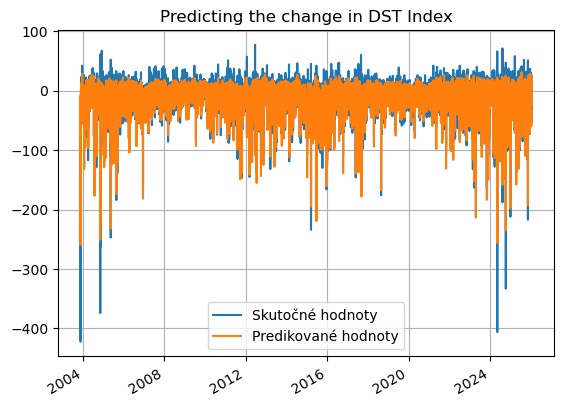

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9043084624258405
MCC=0.7073222331413705
Výkon NN:
MAE: 5.7725, MSE: 81.4620
Perzistentný model:
MAE: 6.6834, MSE: 114.0140
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.63%
MSE Improvement: 28.55%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 40s 46ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 44s 51ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 45s 52ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 45s 53ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 44s 53ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 44s 54ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 41s 52ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 40s 52ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 39s 51ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 35s 50ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 33s 50ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 32s 50ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

 20/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step 

  3/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 37s 51ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 36s 50ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

559/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 12:51 862ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step   

  3/896 ━━━━━━━━━━━━━━━━━━━━ 50s 56ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 45s 51ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 39s 49ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 29s 49ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 28s 49ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 27s 49ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 26s 49ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 24s 50ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 22s 50ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 21s 50ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 20s 50ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 19s 50ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

695/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 45s 50ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 19s 87ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step 

 30/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 40s 53ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 37s 54ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 35s 52ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 34s 51ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 33s 51ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 30s 50ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 29s 50ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 27s 50ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 26s 50ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 25s 49ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 24s 49ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 22s 49ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 21s 49ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 20s 49ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 19s 49ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 17s 49ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 16s 49ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 15s 49ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 14s 49ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 12s 49ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step


Shapes LSTM:
train: (229332,) (229332,)
val:   (57315,) (57315,)
test:  (194176,) (194176,)
Global sigma (LSTM errors, scaled): 0.49070513
Shapes GP:
X_gp_train: (286647, 24)
y_gp_train: (286647,)
X_test_gp: (194176, 24)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.79**2 * RBF(length_scale=0.711) + WhiteKernel(noise_level=0.662)


Global sigma (LSTM errors): 10.797438
Hybrid prediction with smoothed, inflated interval ready.


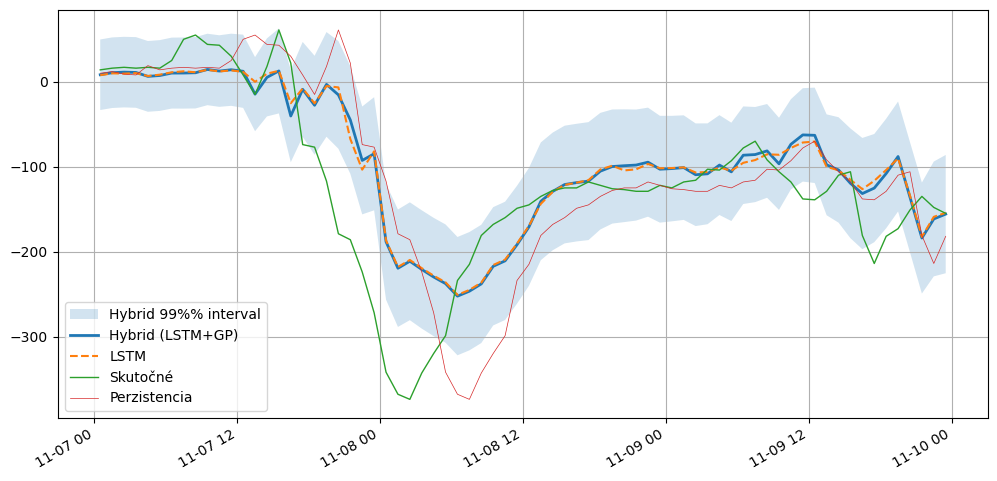

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 86.5343
MAE: 5.9921

--- Klasifikačné metriky (Prah: -19.1 nT) ---
Matthews Correlation Coefficient (MCC): 0.6932

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      143366 |        8673
Skutočná 1 |       11169 |       30959

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.93      0.94      0.94    152039
   Trieda 1 (Búrka)       0.78      0.73      0.76     42128

           accuracy                           0.90    194167
          macro avg       0.85      0.84      0.85    194167
       weighted avg       0.90      0.90      0.90    194167



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9043194775631287
MCC=0.7073551279486526
Výkon NN:
MAE: 5.7725, MSE: 81.4620
Perzistentný model:
MAE: 6.6834, MSE: 114.0140
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.63%
MSE Improvement: 28.55%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9239    0.9566    0.9400    152039
           1     0.8205    0.7155    0.7644     42128

    accuracy                         0.9043    194167
   macro avg     0.8722    0.8361    0.8522    194167
weighted avg     0.9015    0.9043    0.9019    194167


===== LSTM+GP =====
ACC=0.897809617494219
MCC=0.6931869663081418
Výkon NN:
MAE: 5.9921, MSE: 86.5343
Perzistentný model:
MAE: 6.6834, MSE: 114.0140
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 10.34%
MSE Improvement: 24.10%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9277    0.9430    0.9353    152039
           1     0.7812    0.7349    0.7573     42128


/tmp/ipykernel_1009999/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_1009999/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
56,2026-04-27T14:05:50,LSTM,12.0,5.0,DST+5,OMNI2_all,-20.0,-21.1,0.901503,0.694740,"{""text"": "" precision recall f...",5.774317,80.593027,6.683663,114.020481,13.605503,29.317061
57,2026-04-27T14:05:51,LSTM+GP,12.0,5.0,DST+5,OMNI2_all,-20.0,-21.1,0.893413,0.670380,"{""text"": "" precision recall f...",6.188298,89.500806,6.683663,114.020481,7.411585,21.504623
58,2026-04-27T15:05:37,LSTM,18.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.903292,0.702954,"{""text"": "" precision recall f...",5.736587,80.412874,6.683684,114.022078,14.170281,29.476049
59,2026-04-27T15:05:37,LSTM+GP,18.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.896973,0.686851,"{""text"": "" precision recall f...",6.094339,87.814486,6.683684,114.022078,8.817671,22.984664
60,2026-04-27T15:37:07,LSTM,18.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.903292,0.702954,"{""text"": "" precision recall f...",5.736587,80.412874,6.683684,114.022078,14.170281,29.476049
61,2026-04-27T15:37:07,LSTM+GP,18.0,5.0,DST+5,OMNI2_all,-20.0,-20.1,0.896973,0.686851,"{""text"": "" precision recall f...",6.094339,87.814486,6.683684,114.022078,8.817671,22.984664
62,2026-04-27T16:49:32,LSTM,24.0,5.0,DST+5,OMNI2_all,-20.0,-19.1,0.904319,0.707355,"{""text"": "" precision recall f...",5.772458,81.461973,6.683360,114.014029,13.629403,28.550922
63,2026-04-27T16:49:32,LSTM+GP,24.0,5.0,DST+5,OMNI2_all,-20.0,-19.1,0.897810,0.693187,"{""text"": "" precision recall f...",5.992127,86.534260,6.683360,114.014029,10.342596,24.102095
64,2026-04-27T17:10:39,LSTM,24.0,5.0,DST+5,OMNI2_all,-20.0,-19.1,0.904319,0.707355,"{""text"": "" precision recall f...",5.772458,81.461973,6.683360,114.014029,13.629403,28.550922
65,2026-04-27T17:10:39,LSTM+GP,24.0,5.0,DST+5,OMNI2_all,-20.0,-19.1,0.897810,0.693187,"{""text"": "" precision recall f...",5.992127,86.534260,6.683360,114.014029,10.342596,24.102095
